In [20]:
from tools_harassment import * 
import torch 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


n_gpu = torch.cuda.device_count()
torch.cuda.get_device_name(0)

if torch.cuda.is_available():     
    device = torch.device("cuda")
    print('There are',torch.cuda.device_count(),'GPU(s) available.')
    print('We will use the GPU:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")


dict_cl=dict()
dict_cl[0]="NonH"
dict_cl[1]="IndirectH"
dict_cl[2]="PhysicalH"
dict_cl[3]="SexualH"

#sdqc
d_lab=dict()
d_lab["NonH"]=0
d_lab["IndirectH"]=1
d_lab["PhysicalH"]=2
d_lab["SexualH"]=3

path="../Datasets/CSV_Harassment/"
train =pd.read_csv(path + "train_format.csv")
val=pd.read_csv(path + "val_format.csv")
test=pd.read_csv(path + "test_format.csv")

stoplist = stopwords.words("english")
puntos='!?."()[´]“<>¡¿-/;:=_”@#.'

Using TensorFlow backend.
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16

There are 1 GPU(s) available.
We will use the GPU: GeForce GTX 1060 6GB


In [21]:
def det_samples(df, dict_class, c_weights=None): #None o diccionario de fracciones a aum.
    conteos= Counter(df)
    aumentos= dict()
    maxi= max(conteos.values())
            
    if c_weights is None:        # uniform class weights
        for tipo in conteos:
            actual= conteos[tipo]
            if actual<maxi:
                aumentos[tipo]=int(maxi-actual)
            else:
                aumentos[tipo]=0
        return aumentos   
    else:
        try:
            for clase in c_weights.keys():
                aumentos[clase]=int(c_weights[clase]*conteos[clase])
            for key in conteos.keys():
                if key not in aumentos.keys():
                    aumentos[key]=0
            return aumentos
        except:
            print ("No se ha especificado el diccionario de tasas de aumento de datos (por clase)")

def just_tag_word(sentence, tags_all, tag):  #wd en el vocab pues es la palabra que más pesa en el reemplazo
    n_sentence=[]
    indices=[]
    valid=[]
    i=0
    for wd in sentence:
        if wd in puntos or wd[0]=='#' or len(wd)<2:
            i+=1
            continue
        else:
            if (tags_all[i] not in tag) or (wd not in token_2_idx.keys()):
                i+=1
                continue
            else:
                n_sentence.append(wd)
                indices.append(i)
                valid.append(tags_all[i])
            i+=1
    return np.asarray(n_sentence), np.asarray(indices), np.asarray(valid)

def re_generar(texto, tags_all, tag, f):
    sent, indices, tags = just_tag_word(texto, tags_all, tag)
    noise_mask = bernoulli.rvs(f, size=sent.shape)
    bool_list=list(map(bool,noise_mask))
    to_replace=sent[bool_list]
    indix=indices[bool_list]  
    tagx=tags[bool_list] 
    return to_replace , indix, tagx

In [22]:
def find_negative(target, not_sent, window=4):
    cleaned = cleaner(not_sent)[1]
    ide = cleaned.index(target)
    wind_neg=find_window(cleaned, target, ide, window=window)   
    return wind_neg

def most_similar_cosmul(space, EMB_matrix, positive=None, negative=None, topn=1 ): #agregar space de vpcab
    if isinstance(topn, int) and topn < 1:
        return []
    if positive is None:
        positive = []
    if negative is None:
        negative = []
    if isinstance(positive, str) and not negative:
        positive = [positive]
  
    ids_pos = [
        token_2_idx[word] if isinstance(word, string_types) else 'Tipo positivo no admitido'
        for word in positive
    ]
    
    positive = [EMB_matrix[idx] for idx in ids_pos]  #space de vocab
    ids_nega= [
        token_2_idx[word] if isinstance(word, string_types) else 'Tipo negativo no admitido'
        for word in negative
    ]
    negative = [EMB_matrix[idx] for idx in ids_nega] #space de vocab

    if not positive:
        raise ValueError("cannot compute similarity with no input")
    
    pos_dists = [((1 + dot(space, term))/2) for term in positive]    
    pos_dists[0]=pos_dists[0]
    neg_dists = [((1 + dot(space, term))/2) for term in negative]
    dists = prod(pos_dists, axis=0) / (prod(neg_dists, axis=0) + 0.000001)
    
    if not topn:
        return dists
    best = matutils.argsort(dists, topn=topn + len(positive + negative), reverse=True)  #ordena en vocab used

    return best, dists[best] #retorna indices y distancias asociadas

def most_similar_cos(space, EMB_matrix, positive=None, negative=None, topn=1 ): 
    if isinstance(topn, int) and topn < 1:
        return []
    if positive is None:
        positive = []
    if negative is None:
        negative = []
    if isinstance(positive, str) and not negative:
        positive = [positive]
  
    ids_pos = [
        token_2_idx[word] if isinstance(word, string_types) else 'Tipo positivo no admitido'
        for word in positive
    ]
    
    positive = [EMB_matrix[idx] for idx in ids_pos]  #space de vocab
    ids_nega= [
        token_2_idx[word] if isinstance(word, string_types) else 'Tipo negativo no admitido'
        for word in negative
    ]
    negative = [EMB_matrix[idx] for idx in ids_nega] #space de vocab

    if not positive:
        raise ValueError("cannot compute similarity with no input")
    
    
    len_all=len(positive + negative)-1 
    pos_dists = []
    i=0
    for term in positive:
        if i==0:
            pos_dists.append(((1 + dot(space, term))/2))
        else:
            pos_dists.append(((1 + dot(space, term))/(2*len_all)))

    neg_dists = []
    i=0
    for term in negative:
        if i==0:
            neg_dists.append(((1 + dot(space, term))/2))
        else:
            neg_dists.append(((1 + dot(space, term))/(2*len_all)))
    
    
    dists = prod(pos_dists, axis=0) / (prod(neg_dists, axis=0) + 0.000001)
    
    if not topn:
        return dists
    best = matutils.argsort(dists, topn=topn + len(positive + negative), reverse=True)  #ordena en vocab used


    return best, dists[best] #retorna indices y distancias asociadas



In [23]:
train.head()

,tweet_id,Tweet,Label
0,0,pics mexican school girl naked melanie safka f...,SexualH
1,1,RT shereiqns Having curly hair is a gotdamn ch...,NonH
2,2,BreakingNews 7 Unexplained Prisoners Deaths M...,NonH
3,3,girl dirty quarterback latino pokemon young h...,SexualH
4,4,miliondollameat sexting n ngirl daddy n nme l...,SexualH


In [24]:
import os 
embeddings_index = {}
token_2_idx={}
idx_2_token={}
f = open(os.path.join("../Datasets/glove.twitter.27B.200d.txt"))#'glove.twitter.27B.100d.txt'))
i=0
for line in f:
    values = line.split()
    if len(values)>200:
        word = values[0]
    else:
        #print ("Problema con line ", line)
        continue
    token_2_idx[word]=i
    idx_2_token[i]=word
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
    i+=1
f.close()

print('Se encontraron %s terminos con sus vectores de embedding.' % len(embeddings_index))

Se encontraron 1193513 terminos con sus vectores de embedding.


In [25]:
def cleaner(post): 
    s= re.sub(r"http\S+", " html ", post)   ##########elimina http    
    s= re.sub(r'#\w+ ?', " hashtag ", s) ########3
    s= re.sub(r'@\w+ ?', " user ", s)##############    
    s= s.lower()
    s=emoji_pattern.sub(r'', s)
    s=re.sub(r"'\b", " ' ", s)
    s=re.sub(r"\b'\b", " ' ", s)
    s=re.sub(r"“\b", " “ ", s)
    s=re.sub(r"\b’", " ’ ", s)
    s=re.sub(r"‘\b", " ‘ ", s)
    s=re.sub(r"\b’\b", " ‘ ", s)
    s = re.sub(r"-", " - ", s)
    s = re.sub(r"\(", " ", s)
    s = re.sub(r"\)", " ", s)
    s = re.sub(r"\?", " ? ", s)    
    s = re.sub(r"\/", " ", s)
    s = re.sub(r"' ", " ' ", s)
    s = re.sub(r" '", " ' ", s)
    s = re.sub(r"\!", " ! ", s)
    s=re.sub("[\.]+", " . ", s)
    s=re.sub("[\,]+", " , ", s)
    s=re.sub("[\;]+", " ; ", s)
    s=re.sub("[\:]+", " : ", s)
    s=re.sub('[\"]+', ' " ', s)
    s=re.sub(r'\b[0-9]\b', " number ",  s)
    s=re.sub(r'\b[0-9]*[0-9]\b', " number ",  s)    
    s=re.sub(r'\b”', ' " ', s)
    sl= list(s.split())
    sl_2=[]
    for wd in sl:
        try: 
            q=token_2_idx[wd]
            sl_2.append(wd)
        except:
            try: 
                if stemmer.stem(wd) in token_2_idx.keys():
                    sl_2.append(stemmer.stem(wd))
                elif lemmatizer.lemmatize(wd) in token_2_idx.keys():
                    sl_2.append(lemmatizer.lemmatize(wd))
                else:
                    sl_2.append(wd)
            except:
                sl_2.append(wd)
    sl=sl_2
    s=' '.join([word for word in sl])# if word not in stoplist])
    return s, sl

In [26]:
keys=["NonH", "SexualH", "IndirectH", "PhysicalH"]

dict_clases={}
for key in keys: 
    tr_k=train.loc[train["Label"]==key]
    tr_k=tr_k["Tweet"].values    
    trs_k=[]
    for tw in tr_k:
        #tokenizer_loaded.tokenize(cleaner(tw)[0]))
        cleaned = cleaner(tw)[1]
        trs_k+=cleaned
    dict_clases[key]=trs_k  

In [27]:
vocabulary={}
for key in keys: 
    temp=list(set(dict_clases[key]))
    print ("#Tweets",key,":",len(temp))
    vocabulary[key]=temp

#Tweets NonH : 12319
#Tweets SexualH : 7651
#Tweets IndirectH : 485
#Tweets PhysicalH : 650


In [28]:
for key in keys:
    trk=train.loc[train["Label"]==key]['Tweet'].values
    all_len=[]
    for tw in trk:
        cleaned = len(cleaner(tw)[1])
        all_len.append(cleaned)
    print (key, np.mean(all_len))


NonH 16.295001365747062
SexualH 16.512006196746707
IndirectH 16.509090909090908
PhysicalH 18.657894736842106


In [12]:
len(set(vocabulary['SexualH']))

7651

In [26]:
#, 
tags=['VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ']
for key in keys:
    print ("\nPara la clase", key)
    cont=0
    lista_k=list(set(vocabulary[key]))
    for token in lista_k:
        if nltk.pos_tag([token])[0][-1] in tags:
            cont+=1
            #print ("token: ", token, "tira", nltk.pos_tag([token])[0][-1] )
        else:
            continue
    print ("total de terminos en NNs:", cont)
 


Para la clase NonH
total de terminos en NNs: 996

Para la clase SexualH
total de terminos en NNs: 628

Para la clase IndirectH
total de terminos en NNs: 68

Para la clase PhysicalH
total de terminos en NNs: 84


In [9]:
dic_IdxI = {value: {} for value in d_lab.keys()}
for i, (muestra, label) in enumerate(list(zip(train["Tweet"],train["Label"]))):
    pre=np.asarray(cleaner(muestra)[1])
    for token in pre:
        if token not in dic_IdxI[label]:
            dic_IdxI[label][token] = [i]
        else:
            dic_IdxI[label][token].append(i)

In [10]:
def check_vocab(token, clase):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or  token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if token in vocabulary[clase]:
            return True
        else: 
            return False
        
        
def check_tag(token, tag):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        if nltk.pos_tag([token])[0][-1]==tag and token in token_2_idx.keys():
            return True
        else: 
            return False
            
def check_valid(lista, tags):
    keep=[]
    lista_tag= [nltk.pos_tag([wd])[0][-1] for wd in lista] 
    for tag, word in list(zip(lista_tag , lista)):
        if tag in tags and word in token_2_idx.keys():
            keep.append(word)
    return keep

In [13]:
def aumentar_clase(clase, num_ejem, tags_all, prob, topn=1, EMBED=False, pond=False, Neg=False):
    dict_resumen=dict()
    new_sample=[]
    indx=train['Label']==clase
    label=d_lab[clase]    
    contador=1  # o 0?    
    no_modificados=0
    modificados=0
    terms_modif=0  
    terms_supuestos=0  
    totales=0
    largos=0
    SENT_LEN=0
    muestras=train['Tweet'][indx]
    tw_ids=train['tweet_id'][indx]
        
    if num_ejem<=0:
        count= Counter(train['Label'])
        news= train[indx].sample(count[clase]+num_ejem, replace=False)
        news_tw=news['Tweet'].values
        news_id=news['tweet_id'].values
        for muestra, twid in list(zip(news_tw, news_id)):
            pre=np.asarray(cleaner(muestra)[1])  #np.asarray
            new_sample.append([twid, pre, label])
        return new_sample, dict_resumen
    
    while (len(new_sample)<num_ejem):
        muestra=np.random.choice(muestras, size=1)[0]
        pre=np.asarray(cleaner(muestra)[1]) 
        tags_pre= [nltk.pos_tag([wd])[0][-1] for wd in pre]
        terms, indxs, tagx = re_generar(pre, tags_pre, tags_all, prob)  #terms to replace
        terms_supuestos+=len(terms)

        news=[]
        SENT_LEN+=len(terms)

        if len(terms)>0:     
            reem=time.time()
            for term, ind, tag in list(zip(terms, indxs, tagx)):
                
                if term!='user' and term!='hashtag' and term!='html':
                    not_clase, used_classes = sample_neg_class(clase) #definir clases a buscar

                    valid_pos=[]
                    pos = find_positive(list(pre), term, ind, window=4) #se puede cambiar la ventana! 
                    valid_pos=check_valid(pos, tags_all)

                    id_need = 999999999 #simbolo de que no encontró tweet
                    neg = []
                    while(id_need == 999999999):
                        try:
                            id_need = np.random.choice(dic_IdxI[not_clase][term]) #sample id
                        except:
                            if len(used_classes) == len(d_lab.keys()): 
                                break #ya revisó todas las clases
                            not_clase, used_classes = sample_neg_class(used_classes) # change class 

                    valid_neg=[]
                    if id_need != 999999999: #si encontró tweet
                        not_sent = train["Tweet"][id_need]
                        neg = find_negative(term, not_sent, window=4)  
                        valid_neg=check_valid(neg, tags_all)

                    """Modificar acá posible, obligatorio, positivos"""
                    if Neg:
                        if len(valid_pos)<1 and len(valid_neg)<1:
                            continue #obligatorio ambos :)
                    else:
                        if len(valid_pos)<1:
                            continue #obligatorio positivo                    
                
                    if EMBED:
                        mask_words = valid & np.asarray(d_posTg[tag])     
                    else:
                        mask_words = np.asarray(d_vocab[clase]) & np.asarray(d_posTg[tag])
                    vocab_used_pos = np.arange(len(mask_words))[mask_words]
                    space= EMB_matrix[mask_words] #espacio BERT de clase y tag solicitado

                    if pond:
                        best, dists_best = most_similar_cos(space, EMB_matrix, positive=valid_pos, negative=valid_neg)
                    else:
                        best, dists_best = most_similar_cosmul(space, EMB_matrix, positive=valid_pos, negative=valid_neg)#, topn=TOPN)
                    
                    todo_words = {
                        token_2_idx[word] for word in valid_pos + valid_neg
                        if not isinstance(word, ndarray) and word in token_2_idx
                        }
                    result = []
                    for sim, dist_sim in list(zip(best, dists_best)):
                        n_sim = vocab_used_pos[sim]
                        if n_sim not in todo_words:
                            result.append((idx_2_token[n_sim], float(dist_sim)))

                    if len(result)>0:
                        candidatos = result[:topn] #+2
                        if contador<200:
                            print ("Original:",term ," \tReemplazo: ", candidatos)
                    else:
                        continue

                    new = choose_replace(candidatos, ind, term)  
                    news.append(new) 
                    try: #if tag in dict_resumen.keys():
                        dict_resumen[tag]+=1
                    except:
                        dict_resumen[tag]=1

            cambia=False
            news= Sort_Tuple(news) 

            if len(news)<1:                
                no_modificados+=1
                continue
            else:
                x=np.asarray(news)[:,1]
                y=np.asarray(news)[:,0]
                n_news=np.asarray(np.vstack((x,y))).T

                nueva_sent=[]
                cont_new=0
                for i in range(len(pre)):
                    try:
                        if int(n_news[cont_new][0])==i:
                            nueva_sent.append(n_news[cont_new][1])                 
                            cont_new+=1
                        else: 
                            nueva_sent.append(pre[i])
                    except: 
                        nueva_sent.append(pre[i])

                totales+=cont_new


                if contador<100:
                    print ("Sentencia original:")
                    print (pre)
                    print ("Sentencia final:" , label)
                    print (nueva_sent)
                    print ("")
                    print ("")

                new_sample.append(["Gen_"+str(contador), nueva_sent, label])
                modificados+=1
                terms_modif+=len(news)
                largos+=len(pre)
                contador+=1
                
    count= Counter(train['Label'])   
    for muestra, twid in list(zip(muestras,tw_ids)) :
        pre=np.asarray(cleaner(muestra)[1])
        new_sample.append([twid, pre, label])

    try:
        print ("# terms modificados promedio", terms_modif/modificados ,"términos por sentencia")
        print ("Largo de sentencia promedio", largos/modificados ,"términos por sentencia")
        print ("para esta ejecución se debiesen reemplazar", SENT_LEN, " de" ,TOPE_LEN, "terminos")

    except: 
        print ("No se generan ejemplos")

    return new_sample, dict_resumen

In [14]:
tags=['NN','NNS', 'JJ', 'JJR', 'JJS', 'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ']
clases=["NonH", "IndirectH", "PhysicalH", "SexualH"]

d_posTg= dict()
for tag in tags:
    d_posTg[tag]= [check_tag(k, tag) for k in idx_2_token.values()]
    
d_vocab=dict()
for clase in clases:
    d_vocab[clase]= [check_vocab(k, clase) for k in idx_2_token.values()]
    

In [15]:
MAX_LEN = 34
data_2_idx=dict()

corpus=[]
not_found=[]
found=[]
pos_tag_nf=[]
pos_tag=[]
    
for vocab_clase in vocabulary.keys():
    corpus+=vocabulary[vocab_clase]

corpus=list(set(corpus))
for term in corpus:
    try:
        if term not in data_2_idx.keys():
            found.append(term)
            pos_tag.append(nltk.pos_tag([term])[0][-1])
            data_2_idx[term]=token_2_idx[term]
    except:
        not_found.append(term)
        pos_tag_nf.append(nltk.pos_tag([term])[0][-1])
        continue

In [16]:
original=len(set(corpus))
matched=len(data_2_idx.keys())
print ("Se distinguen", original, "términos en el dataset. Reconociendo a", matched, "de éstos (%.2f" % (matched/original) + "%)")
print ("\nExisten", len(not_found), "términos no encontrados:")
for term in not_found[:20]:
    print ("-",term)

Se distinguen 17048 términos en el dataset. Reconociendo a 11069 de éstos (0.65%)

Existen 5979 términos no encontrados:
- gewjt2dcxb
- aaront2707
- ksv7pqjyvi
- 78d18qwqsb
- yngmojo
- agatay
- craves21
- obaidomer
- askmf
- hiswife
- baaq
- miblogestublog
- n6aehhwilb
- lahren
- 3p8fkv0hrw
- kxfbktuqtq
- 9yh60srqz3
- slutshaming
- taylor7schmidt
- pawgslut


In [17]:
print ("Distribución en POS tag entre términos encontrados:\n",  Counter(pos_tag))
print ("\nDistribución en POS tag entre términos NO encontrados:\n",  Counter(pos_tag_nf))

Distribución en POS tag entre términos encontrados:
 Counter({'NN': 12389, 'NNS': 1899, 'VBG': 607, 'JJ': 582, 'VBN': 513, 'CD': 407, 'RB': 337, 'VBD': 78, 'VB': 59, 'IN': 54, 'JJS': 25, 'VBZ': 19, 'DT': 16, 'PRP': 15, 'MD': 10, 'JJR': 7, 'PRP$': 7, 'CC': 5, 'WRB': 4, 'RBR': 4, 'WDT': 3, 'WP': 3, 'VBP': 2, 'TO': 1, 'WP$': 1, 'LS': 1})

Distribución en POS tag entre términos NO encontrados:
 Counter({'NN': 5044, 'CD': 397, 'NNS': 359, 'JJ': 67, 'VBG': 43, 'RB': 35, 'VBN': 20, 'VB': 6, 'JJS': 5, 'WDT': 1, 'VBD': 1, 'LS': 1})


In [30]:
a= {'NN': 12389, 'NNS': 1899, 'VBG': 607, 'JJ': 582, 'VBN': 513, 'CD': 407, 'RB': 337, 'VBD': 78, 'VB': 59, 'IN': 54, 'JJS': 25, 'VBZ': 19, 'DT': 16, 'PRP': 15, 'MD': 10, 'JJR': 7, 'PRP$': 7, 'CC': 5, 'WRB': 4, 'RBR': 4, 'WDT': 3, 'WP': 3, 'VBP': 2, 'TO': 1, 'WP$': 1, 'LS': 1}
np.sum(list(a.values()))

17048

<BarContainer object of 26 artists>

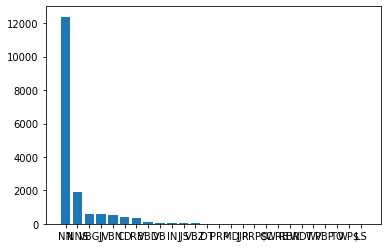

In [34]:
keys = a. keys()
values = a. values()
plt.bar(keys, values)

#### POS tags 

- JJ adjective 'big'
- JJR adjective, comparative 'bigger'
- JJS adjective, superlative 'biggest'

- NN noun, singular 'desk'
- NNS noun plural 'desks'
- NNP proper noun, singular 'Harrison'
- NNPS proper noun, plural 'Americans'

- RB adverb very, silently,   (no considerado) 
- RBR adverb, comparative better  (no considerado)
- RBS adverb, superlative best  (no considerado)

- VB verb, base form take    
- VBD verb, past tense took
- VBG verb, gerund/present participle taking
- VBN verb, past participle taken
- VBP verb, sing. present, non-3d take
- VBZ verb, 3rd person sing. present takes



In [18]:
emb=200
EMB_matrix=np.zeros((len(token_2_idx.keys()), emb))
for i in range(len(token_2_idx.keys())):
    EMB_matrix[i]=embeddings_index[idx_2_token[i]]

In [19]:
#EMB_matrix= model_loaded.bert.embeddings.word_embeddings.weight.detach().cpu().numpy()
transformer = Normalizer().fit(EMB_matrix) 
EMB_matrix=transformer.transform(EMB_matrix)
EMB_matrix.shape

(1193513, 200)

In [20]:
def valid_token(token):
    if ('unused' in token) or token.isdigit() or token[:-2].isdigit() or token in puntos or "##" in token or len(token) < 2: 
        return False
    else:
        exceptions=['[CLS]', '[SEP]', '[MASK]', '[PAD]']
        if token not in exceptions:       
            return True
        else: 
            return False
        
valid=np.asarray([valid_token(k) for k in idx_2_token.values()])


## Análisis de espacio embedding

max len: 76 [ 5  5  5 ... 34 34 76]


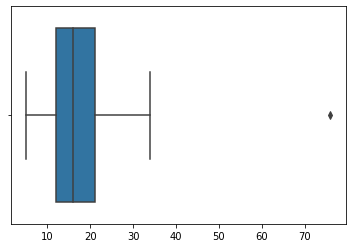

In [20]:
lens=[]
for tweet in train["Tweet"].values:
    tw=cleaner(tweet)[1]
    lens.append(len(tw))

print ("max len:", max(lens), np.sort(lens))
sns.boxplot(lens)

In [22]:
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE 

import numpy as np 
import pandas as pd
from collections import Counter 
from bert_serving.client import BertClient

bc = BertClient()  

data_bas=[]
for tweet in train["Tweet"].values:
    h=cleaner(tweet)[0]
    vector=bc.encode([h])[0]
    data_bas.append(vector)

/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/bert_serving/client/__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=34" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


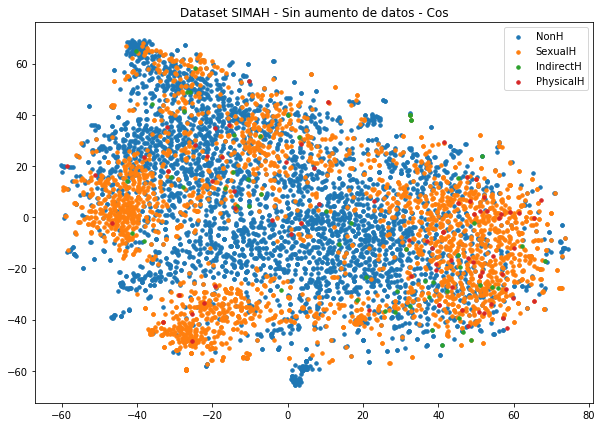

In [23]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas)    
plt.figure(figsize=(10,7))
for key in keys:
    mask = train["Label"]==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Sin aumento de datos - Cos")
plt.show()

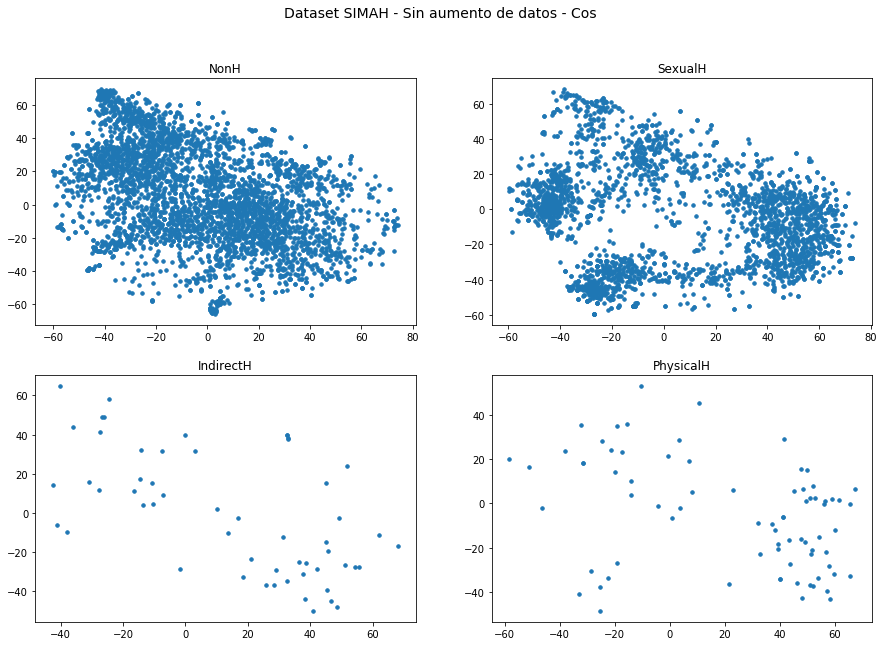

In [24]:
fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    mask = train["Label"]==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))

fig.suptitle("Dataset SIMAH - Sin aumento de datos - Cos", fontsize=14)
plt.show()

# Generación Varias

In [21]:
prob= 0.15
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


### Sujeto a clase no ponderando target

In [22]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: free  	Reemplazo:  [('much', 0.39172836706344266)]
Sentencia original:
['photo' 'grid' 'girl' 'slut' 'free' 'xxx' 'trailers' 'best' 'body' 'nude'
 'demi' 'lovato' 'cartoon' 'porn' 'girls' 'naked' 'in' 'the' 'water'
 'porno' 'sri' 'l']
Sentencia final: 3
['photo', 'grid', 'girl', 'slut', 'much', 'xxx', 'trailers', 'best', 'body', 'nude', 'demi', 'lovato', 'cartoon', 'porn', 'girls', 'naked', 'in', 'the', 'water', 'porno', 'sri', 'l']


Original: vampire  	Reemplazo:  [('hello', 1.1263993029199926)]
Sentencia original:
['im' 'a' 'slut' 'for' 'vampire' 'weekend' 'and' 'thats' 'all' 'i' 'can'
 'say']
Sentencia final: 3
['im', 'a', 'slut', 'for', 'hello', 'weekend', 'and', 'thats', 'all', 'i', 'can', 'say']


Original: is  	Reemplazo:  [('seems', 1.4206019184585028)]
Sentencia original:
['supercroup' 'lol' 'what' 'a' 'shameless' 'slut' 'he' 'is' 'too' 'many'
 'girls' 'is' 'a' 'such' 'a' 'fake' 'dilemma']
Sentencia final: 3
['supercroup', 'lol

Original: everyone  	Reemplazo:  [('liza', 0.8819706371891203)]
Sentencia original:
['silvia' 'slut' 'from' 'holland' 'everyone' 'silvia' 'ugly' 'fucking'
 'old' 'bitch' 'from' 'swe' 'everyone' 'massive' 'booing']
Sentencia final: 3
['silvia', 'slut', 'from', 'holland', 'liza', 'silvia', 'ugly', 'fucking', 'old', 'bitch', 'from', 'swe', 'everyone', 'massive', 'booing']


Original: women  	Reemplazo:  [('bigtits', 1.2094715566556573)]
Sentencia original:
['drunk' 'women' 'drunken' 'ebony' 'first' 'amature' 'blonde' 'ho' 'x89'
 't' 'co' 'r3ka52virw']
Sentencia final: 3
['drunk', 'bigtits', 'drunken', 'ebony', 'first', 'amature', 'blonde', 'ho', 'x89', 't', 'co', 'r3ka52virw']


Original: tr  	Reemplazo:  [('think', 0.3279888566524276)]
Sentencia original:
['actually' 'drunk' 'bitch' 'tammy' 'talks' 'talk' 'tr' 'x89' 't' 'co'
 'mkuohomxxo']
Sentencia final: 3
['actually', 'drunk', 'bitch', 'tammy', 'talks', 'talk', 'think', 'x89', 't', 'co', 'mkuohomxxo']


Original: praying  	Reemplazo: 

Original: handjob  	Reemplazo:  [('blowjob', 0.23111921125067725)]
Sentencia original:
['fit' 'tested' 'spinning' 'dildo' 'couple' 'homemade' 'nt' 'co'
 'kkrkb0k6wa' 'nmassive' 'cumshot' 'handjob' 'naked' 'x89' 't' 'co'
 'nyhe6fmf6f']
Sentencia final: 3
['fit', 'tested', 'spinning', 'dildo', 'couple', 'homemade', 'nt', 'co', 'kkrkb0k6wa', 'nmassive', 'cumshot', 'blowjob', 'naked', 'x89', 't', 'co', 'nyhe6fmf6f']


Original: re  	Reemplazo:  [('shit', 0.4537275273456577)]
Sentencia original:
['sorry' 'we' 'x89' 're' 'bitch' 'juice' 'would' 'ignorant' 'instead']
Sentencia final: 3
['sorry', 'we', 'x89', 'shit', 'bitch', 'juice', 'would', 'ignorant', 'instead']


Original: bikini  	Reemplazo:  [('girlnextdoor', 2.2366192155571283)]
Original: serie  	Reemplazo:  [('fuck', 0.2201691745413155)]
Sentencia original:
['ollege' 'college' 'bikini' 'cutest' 'college' 'latin' 'college' 'sluts'
 'sweet' 'naughty' 'coeds' 'college' 'pussy' 'serie' 'swe' 'x89' 't' 'co'
 'qengmei8td']
Sentencia final: 

Original: isn  	Reemplazo:  [('chick', 0.9418658048154278)]
Original: interested  	Reemplazo:  [('curvaceous', 1.2718674352435126)]
Sentencia original:
['i' 'think' 'it' 's' 'hilarious' 'how' 'lads' 'instantly' 'label' 'a'
 'girl' 'as' 'a' 'slut' 'just' 'cause' 'the' 'girl' 'isn' 't' 'interested'
 'in' 'them' 'wipe']
Sentencia final: 3
['i', 'think', 'it', 's', 'hilarious', 'how', 'lads', 'instantly', 'brand', 'a', 'girl', 'as', 'a', 'slut', 'just', 'cause', 'the', 'girl', 'chick', 't', 'curvaceous', 'in', 'them', 'wipe']


Original: child  	Reemplazo:  [('baby', 0.5105839204603526)]
Sentencia original:
['atrinileah' 'squats' 'enemy' 'nothing' 'ain' 'x89' 't' 'twerking'
 'child' 't' 'co' 'vlwc58kisr']
Sentencia final: 3
['atrinileah', 'squats', 'enemy', 'nothing', 'ain', 'x89', 't', 'twerking', 'baby', 't', 'co', 'vlwc58kisr']


Original: guy  	Reemplazo:  [('cunilingus', 6.5853039837771)]
Sentencia original:
['ttooniceee' 'but' 'a' 'girl' 'with' 'a' 'high' 'body' 'count' 'is'
 'most' 

Original: harry  	Reemplazo:  [('whore', 0.5252338977493265)]
Sentencia original:
['cedric' 'doggory' 'listen' 'little' 'slut' 'gorgeous' 'harry' 'potter'
 'forced' 'myself' 'to' 'x89' 't' 'co' 'xhyonypyll']
Sentencia final: 3
['cedric', 'doggory', 'listen', 'little', 'slut', 'gorgeous', 'whore', 'potter', 'forced', 'myself', 'to', 'x89', 't', 'co', 'xhyonypyll']


Original: loser  	Reemplazo:  [('weirdo', 1.1109581100877457)]
Sentencia original:
['some' 'loser' 'bitch' 'sexting' 'niteflirt' 't' 'co' '9jepujamtj' 'join']
Sentencia final: 3
['some', 'weirdo', 'bitch', 'sexting', 'niteflirt', 't', 'co', '9jepujamtj', 'join']


Original: isis  	Reemplazo:  [('raquel', 0.7437324756689494)]
Sentencia original:
['rt' 'nocopoutuk' 'abuwankinobbi' 'mioewing' 'the' 'are' 'nowt' 'but'
 'prostitutes' 'for' 'isis' 'they' 'shell' 'out' 'kids' 'like' 'isis'
 'peas' 'but' 'want' 'uk' 'taxpayers' 'to']
Sentencia final: 3
['rt', 'nocopoutuk', 'abuwankinobbi', 'mioewing', 'the', 'are', 'nowt', 'but', 'p

Original: bitches  	Reemplazo:  [('de', 2.0030507671868083)]
Original: thrive  	Reemplazo:  [('niggas', 0.5655484524090758)]
Sentencia original:
['and' 'if' 'something' 'does' 'upset' 'me' 'y' 'all' 'bitches' 'will'
 'never' 'know' 'i' 'see' 'these' 'hoes' 'thrive' 'off' 'of' 'misery']
Sentencia final: 3
['and', 'if', 'something', 'does', 'upset', 'me', 'y', 'all', 'de', 'will', 'never', 'know', 'i', 'see', 'these', 'hoes', 'niggas', 'off', 'of', 'misery']


Original: getting  	Reemplazo:  [('walking', 0.7782499181928267)]
Original: victims  	Reemplazo:  [('threats', 0.5028089302753105)]
Sentencia original:
['imagine' 'getting' 'on' 'al' 'gore' 's' 'internet' 'at' 'a' 'fresh'
 'ass' '8am' 'amp' 'slut' 'shaming' 'victims' 'of' 'molestation']
Sentencia final: 3
['imagine', 'walking', 'on', 'al', 'gore', 's', 'internet', 'at', 'a', 'fresh', 'ass', '8am', 'amp', 'slut', 'shaming', 'threats', 'of', 'molestation']


Original: orgasm  	Reemplazo:  [('ear', 0.801599828914101)]
Original: wet  	

Original: dang  	Reemplazo:  [('damn', 0.8613484013232273)]
Sentencia original:
['bambriaan' 'always' 'little' 'wanting' 'dick' 'bitch' 'enjoy' 'video'
 'dang']
Sentencia final: 3
['bambriaan', 'always', 'little', 'wanting', 'dick', 'bitch', 'enjoy', 'video', 'damn']


Original: useless  	Reemplazo:  [('hoebag', 1.998337872097664)]
Sentencia original:
['in' 'fact' 'i' 'hate' 'bibury' 'the' 'most' 'very' 'much' 'now' 'she'
 'fuck' 'is' 'mary' 'sue' 'and' 'green' 'tea' 'bitch' 'and' 'just' 'slut'
 'also' 'useless']
Sentencia final: 3
['in', 'fact', 'i', 'hate', 'bibury', 'the', 'most', 'very', 'much', 'now', 'she', 'fuck', 'is', 'mary', 'sue', 'and', 'green', 'tea', 'bitch', 'and', 'just', 'slut', 'also', 'hoebag']


Original: nudes  	Reemplazo:  [('titties', 1.4183099842807605)]
Sentencia original:
['ya' 'girl' 'do' 'kinky' 'shit' 'too' 'lol' 'premiumsnapchat' 'boobs'
 'nudes' 'booty' 'panties' 'pantyfetish' 'slut' 'sellingnudes']
Sentencia final: 3
['ya', 'girl', 'do', 'kinky', 'shit',

Original: phatass  	Reemplazo:  [('milf', 0.1578465117975377)]
Sentencia original:
['porn' 'analslut' 'gangfuck' 'indian' 'phatass' 'realsex' 'teacher'
 'blowjob' 'cumshot' 't' 'co' 'q6bzj4wcpj']
Sentencia final: 3
['porn', 'analslut', 'gangfuck', 'masochistic', 'milf', 'realsex', 'teacher', 'blowjob', 'cumshot', 't', 'co', 'q6bzj4wcpj']


Original: umm  	Reemplazo:  [('hmm', 1.2698740688315064)]
Sentencia original:
['soo' 'umm' 'what' 'happened' 'to' 'girls' 'being' 'their' 'for'
 'eachother' 'and' 'not' 'slut' 'shaming' 'eachother']
Sentencia final: 3
['soo', 'hmm', 'what', 'happened', 'to', 'girls', 'being', 'their', 'for', 'eachother', 'and', 'not', 'slut', 'shaming', 'eachother']


Original: active  	Reemplazo:  [('social', 0.6598428588122155)]
Sentencia original:
['why' 'people' 'called' 'slut' 'she' 's' 'active' 'sexual' 'talk'
 'called' 'cool' 'active' 'it']
Sentencia final: 3
['why', 'people', 'called', 'slut', 'she', 's', 'social', 'sexual', 'talk', 'called', 'cool', 'active'

Original: cumshot  	Reemplazo:  [('creampie', 2.471134459589826)]
Sentencia original:
['porn' 'naturaltits' 'swinger' 'cumshot' 'hiddencam' 'mature' 'ladies'
 'missy' 'monroe' 'schoolgirls' 'tight' 'uni' 'x89' 't' 'co' 'csidxzot8c']
Sentencia final: 3
['porn', 'naturaltits', 'swinger', 'creampie', 'hiddencam', 'mature', 'ladies', 'missy', 'monroe', 'schoolgirls', 'tight', 'uni', 'x89', 't', 'co', 'csidxzot8c']


Original: cool  	Reemplazo:  [('stuff', 0.6443548601927086)]
Original: fashion  	Reemplazo:  [('lingerie', 1.3061437409744803)]
Sentencia original:
['seeing' 'a' 'lot' 'of' 'cool' 'account' 'names' 'today' 'that' 'are'
 'fashion' 'label' 'sex' 'toy' 'whore' 'slut' 'for' 'example' 'dior' 's'
 'butt' 'plug']
Sentencia final: 3
['seeing', 'a', 'lot', 'of', 'stuff', 'account', 'names', 'today', 'that', 'are', 'lingerie', 'label', 'sex', 'toy', 'whore', 'slut', 'for', 'example', 'dior', 's', 'butt', 'plug']


Original: amp  	Reemplazo:  [('nah', 2.3743622038090098)]
Original: dm  	R

Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['induad14' 'dransfield' 'leon' 'occy2400' 'fucking' 'league' 'bummy'
 'scouse' 'spastic' 'you' 'x89' 're' 'x89' 't' 'co' 'etenu4u3jf']
Sentencia final: 3
['induad14', 'dransfield', 'leon', 'occy2400', 'fucking', 'league', 'bummy', 'scouse', 'spastic', 'you', 'x89', 're', 'x89', 't', 'po', 'etenu4u3jf']


Original: cams  	Reemplazo:  [('pics', 0.43075548043575057)]
Sentencia original:
['hot' 'naked' 'girls' 'sharonbenetts' 'free' 'porn' 'cams']
Sentencia final: 3
['hot', 'naked', 'girls', 'sharonbenetts', 'free', 'porn', 'pics']


Original: young  	Reemplazo:  [('anal', 0.7765044964265743)]
Sentencia original:
['latin' 'young' 'porno' 'blowjob' 'cartoon' 'hidden' 'camera' 'nipple'
 'sucking' 'x89' 't' 'co' 'sppbpklvwq']
Sentencia final: 3
['latin', 'anal', 'porno', 'blowjob', 'cartoon', 'hidden', 'camera', 'nipple', 'sucking', 'x89', 't', 'co', 'sppbpklvwq']


Original: jesy  	Reemplazo:  [('thought', 0.3625910

Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'head', 'chopped', 'throat', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: ion  	Reemplazo:  [('internet', 1.2519125083917189)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'go', 'beat', 'up', 'your', 'ex', 'internet', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: teen  	Reemplazo:  [('nsfw', 1.617775414640774)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: guys  	Reemplazo:  [('girls', 1.543460889038409)]
Original: having  	Reemplazo:  [('talking', 2.384919196451991)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies

Original: young  	Reemplazo:  [('free', 1.4828628984451215)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'free', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'choking', 'schoolgirl', 'cumslut']


Original: number  	Reemplazo:  [('se', 2.0671520377661317)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'se', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']


Original: minor  	Reemplazo:  [('case', 1.6008651354654333)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'case', 'raped', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'amp', 'threaten

Original: dog  	Reemplazo:  [('venereal', 3.9673793688991035)]
Original: fat  	Reemplazo:  [('stubby', 1.2501574942807618)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'venereal', 'you', 'fat', 'slut', 'my', 'dog', 'anybody', 'to', 'me', 'you', 'stubby', 'slut', 'me']


Original: people  	Reemplazo:  [('partners', 1.7183526340877096)]
Original: children  	Reemplazo:  [('knew', 1.3441208202222494)]
Original: were  	Reemplazo:  [('raped', 1.937403440127519)]
Original: killed  	Reemplazo:  [('been', 0.5275972563672501)]
Original: fair  	Reemplazo:  [('ammara', 1.12518996952567)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'partners', 

Original: disgusting  	Reemplazo:  [('looking', 1.0668962600254164)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'mother', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'dirty', 'looking', 'sl']


Original: be  	Reemplazo:  [('destabilize', 1.2705136638441512)]
Original: women  	Reemplazo:  [('children', 0.8248648958012548)]
Original: non  	Reemplazo:  [('ma', 1.874254731777256)]
Original: muslim  	Reemplazo:  [('jewish', 0.7682970787800065)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'destabilize', 'discussing

Original: charity  	Reemplazo:  [('anything', 0.4634693112680645)]
Original: everything  	Reemplazo:  [('victim', 0.5052462123805904)]
Original: emmerdale  	Reemplazo:  [('spank', 1.503993750774896)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['anything', 'loses', 'victim', 'after', 'devastating', 'spank', 'trial', 'twist', 't', 'co', 'ovnydoove3', 'metrouk']


Original: slut  	Reemplazo:  [('whore', 0.5640439440932994)]
Original: melania  	Reemplazo:  [('classist', 1.1672775392059809)]
Original: horrible  	Reemplazo:  [('legal', 0.6962112471144241)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'let', 's', 'add', 'whore', 'shaming', 'classist', 'to', 'this', 'she', 's', 'legal', 

Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['don', 'x89', 't', 'consulate', 'people', 'someone', 'starts', 'shit', 'thing', 'you', 'x89', 't', 'co', '6qsmyttyok']


Original: daughters  	Reemplazo:  [('children', 1.1330480055725416)]
Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'children', 'homophobic', 'sons']


Original: teen  	Reemplazo:  [('case', 1.22311050074713)]
Original: woman  	Reemplazo:  [('amateurporn', 1.4787912546829058)]
Original: black  	Reemplazo:  [('white', 0.9446008253246155)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' '

Original: life  	Reemplazo:  [('everything', 0.8666653187001928)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'trainer', 'so', 'tell', 'me', 'a', 'bit', 'about', 'yourself', 'neenel', 'my', 'everything', 'motto', 'is', 'nobody', 'likes', 'a', 'fat', 'bitch']


Original: family  	Reemplazo:  [('murderer', 1.0049112262573932)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'hussain', 'victim', 'murderer', 'later', 'beaten', 'amp', 'threatened', 'anwar', 'father', 'family', 'x89']


Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: ava  	Reemplazo:  [('love', 0.51681473832

Original: be  	Reemplazo:  [('add', 1.7959238471475425)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'is', 'meant', 'to', 'destabilize', 'a', 'less', 'aware', 'person', 'and', 'shit', 'or', 'even', 'kill', 'her', 'which', 'can', 'never', 'add', 'the', 'case', 'with']


Original: sex  	Reemplazo:  [('pussy', 1.5231047901369703)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'pussy', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'pornhub', 'hardcoresex', 'pete', 'pornstar']


Original: little  	Reemplazo:  [('good', 1.740423259778664)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 

Original: co  	Reemplazo:  [('se', 1.3238212343127649)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'pitch', 'black', 'world', 'devil', 'there', 'rapist', 'an', 'x89', 't', 'se', 'burgtjfrya']


Original: useless  	Reemplazo:  [('charity', 0.6523846486923397)]
Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'charity', 'ur', 'pretty', 'mouth', 'fucked', 'and', 'ur', 'ass', 'covered', 'in', 'bruises', 'u', 'look

Original: mother  	Reemplazo:  [('crissy', 9.417395585890048)]
Original: amp  	Reemplazo:  [('picture', 1.026270578009488)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'crissy', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'daughter', 'who', 'was', 'shot', 'picture', 'killed', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: men  	Reemplazo:  [('women', 2.3839786955032287)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussi

Original: is  	Reemplazo:  [('has', 1.1076298559155535)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'has', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'th']


Original: dog  	Reemplazo:  [('stubby', 1.7100958164401128)]
Original: anybody  	Reemplazo:  [('ammara', 2.929272974190881)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'stubby', 'you', 'fat', 'slut', 'my', 'dog', 'ammara', 'to', 'me', 'you', 'fat', 'slut', 'me']


Original: rt  	Reemplazo:  [('love', 0.6564535133177563)]
Original: don  	Reemplazo:  [('tell', 0.7513953928990521)]
Sentencia original:
['rt' 'quinnceylon' 

Original: named  	Reemplazo:  [('asked', 0.7645514271026644)]
Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'conejita', 'asked', 'jane', 'in', 'the', 'late', '70s', 'my', 'family', 'had', 'a', 'lot', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'imagine', 'phrase', 'j']


Original: is  	Reemplazo:  [('makes', 0.8834481310813863)]
Original: pregnant  	Reemplazo:  [('mistress', 3.6552269201237233)]
Original: girlfriend  	Reemplazo:  [('pubic', 1.3963068479694853)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 

Original: shame  	Reemplazo:  [('understand', 0.8967217144347684)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'love', 'girls', 'understand', 'different', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: excited  	Reemplazo:  [('been', 0.7282392112128514)]
Original: having  	Reemplazo:  [('doing', 0.8174492048019799)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'school', 'is', 'doing', 'a', 'prom', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 've', 'been', 'missing', 'my', 'da']


Original: asked  	Reemplazo:  [('been', 0.6820345513118542)]
Original: asleep  	Reemplazo:  [('right', 0.8

Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['padgett', 'ms', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'vs', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'will']


Original: thing  	Reemplazo:  [('guy', 2.171810139739058)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'guy', 'where', 'we', 'expect', 'famo']


Original: was  	Reemplazo:  [('got', 0.5202445338836027)]
Original: pregnant  	Reemplazo:  [('wife', 0.9166450134342173)]
Sentencia o

Original: chopped  	Reemplazo:  [('wine', 0.8394084857373665)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'misogynistic', 'competitor', 'wine', 'time', 'there', 'all']


Original: feel  	Reemplazo:  [('think', 0.8958888332904072)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'think', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'fine', 'some', 'girl', 'in', 'the', 'bathroom']


Original: usa  	Reemplazo:  [('training', 1.4618854032572566)]
Original: isis  	Reemplazo:  [('hcm', 0.7659472974561211)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'training', 'is', 'the

Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'racist', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud']


Original: prom  	Reemplazo:  [('date', 0.7966084052877697)]
Original: week  	Reemplazo:  [('weekend', 2.746719713815629)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'having', 'a', 'date', 'dress', 'code', 'meeting', 'this', 'w

Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Original: woman  	Reemplazo:  [('bigot', 2.415239257192715)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'phenomenon', 'that', 'the', 'ana', 'mosques', 'amp', 'the', 'bigot']


Original: mistress  	Reemplazo:  [('da', 3.123285442713575)]
Original: training  	Reemplazo:  [('resource', 3.03268860853208)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'da', 'anna', 'owned', 'slave', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'online', 'resource', 'w

Original: be  	Reemplazo:  [('go', 1.1698945606100666)]
Original: dumb  	Reemplazo:  [('damn', 0.9988929440623191)]
Original: hell  	Reemplazo:  [('shit', 0.6383693367440512)]
Original: got  	Reemplazo:  [('had', 0.8065036439150683)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'go', 'where', 'she', 'is', 'that', 's', 'fucking', 'damn', 'as', 'shit', 'she', 'has', 'had', 'to', 'grow', 'up']


Original: reason  	Reemplazo:  [('right', 0.7180355100547652)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'right', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fac

Original: comfort  	Reemplazo:  [('fayth', 6.012433257059719)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'love', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 'fayth']


Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'believe', 'married', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: don  	Reemplazo:  [('conejita', 2.6526262366055904)]
Sentencia original:
['don' 'x89' 't

Original: reason  	Reemplazo:  [('change', 1.2439496285535139)]
Original: usa  	Reemplazo:  [('thing', 1.4004838624983453)]
Original: fact  	Reemplazo:  [('thing', 1.851223784927304)]
Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'change', 'for', 'moving', 'from', 'thing', 'is', 'the', 'thing', 'that', 'the', 'ana', 'mosques', 'amp', 'the', 'woman']


Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'amp', 'amp', 'change', 'shit', 'bitch', 'x89', 'damn', 'sonic', 'good', 'x89']


Original: code  	Reempla

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'ok', 'no2rqxmdcj']


Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: boots  	Reemplazo:  [('girls', 1.0368532360949787)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'cumshot', 'videos', 'pussy', 'grown', 'busty', 'girls', 'girl']


Original: pregnant  	Reemplazo:  [('wife', 3.681345560313983)]
Original: girlfriend  	Reemplazo:  [('mistress', 1.6490630849347667)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' '

In [35]:
Counter(train["Label"])

Counter({'SexualH': 2582, 'NonH': 3661, 'PhysicalH': 76, 'IndirectH': 55})

In [37]:
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE 

import numpy as np 
import pandas as pd
from collections import Counter 
from bert_serving.client import BertClient

bc = BertClient()  


In [38]:
data_bas_c=[]
#macro_augmented=np.asarray(macro_augmented)
macro_augmented=np.load('../Datasets/CSV_Harassment/balance_clase_noPon_GloVe_pos.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_c.append(vector)

/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/bert_serving/client/__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=34" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


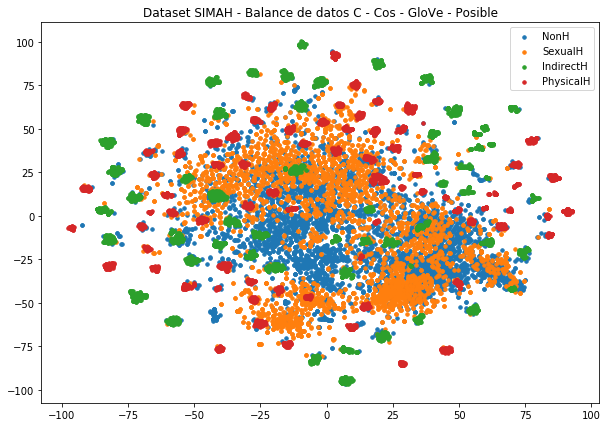

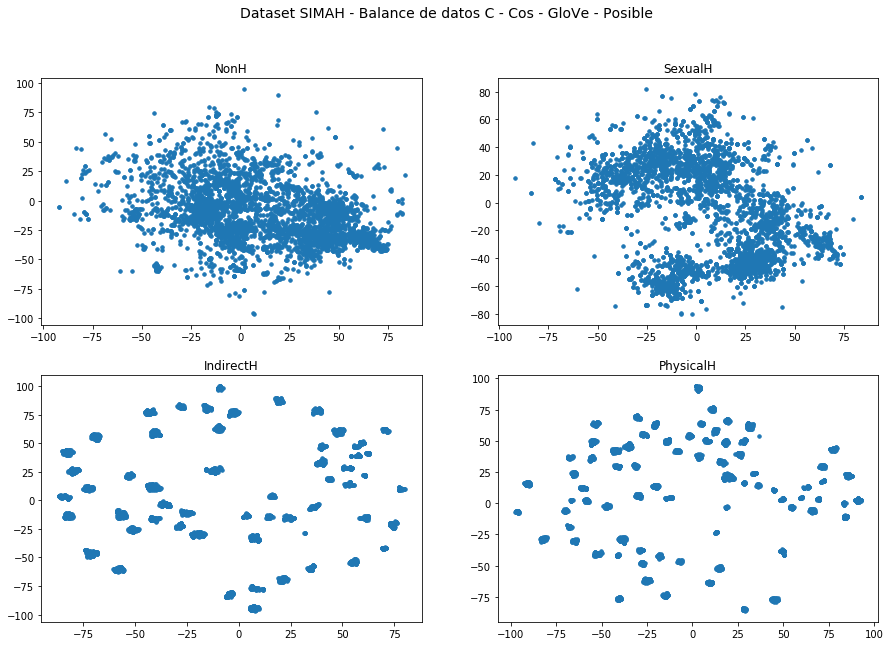

In [40]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_c)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos C - Cos - GloVe - Posible")
plt.show()

fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))

fig.suptitle("Dataset SIMAH - Balance de datos C - Cos - GloVe - Posible", fontsize=14)
plt.show()

In [23]:
#macro_augmented = np.asarray(macro_augmented, dtype=object)
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_clase_noPon_GloVe_pos.npy', macro_augmented)
    

In [24]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, Neg=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: love  	Reemplazo:  [('subversive', 1.2397634509693964)]
Original: shit  	Reemplazo:  [('miss', 1.2388851227612871)]
Original: eat  	Reemplazo:  [('want', 0.9340214785059365)]
Original: pull  	Reemplazo:  [('puffy', 1.6645916528919456)]
Sentencia original:
['rt' 'markmywords' 'number' 'degrading' 'i' 'love' 'that' 'shit' 'call'
 'me' 'a' 'slut' 'whore' 'bitch' 'i' 'll' 'eat' 'all' 'that' 'up' 'pull'
 'my' 'hair' 'and' 'call' 'me' 'your' 'cockslut' 'whil']
Sentencia final: 3
['rt', 'markmywords', 'number', 'degrading', 'i', 'subversive', 'that', 'miss', 'call', 'me', 'a', 'slut', 'whore', 'bitch', 'i', 'll', 'want', 'all', 'that', 'up', 'puffy', 'my', 'hair', 'and', 'call', 'me', 'your', 'cockslut', 'whil']


Original: porno  	Reemplazo:  [('amateur', 0.791745843089105)]
Original: casting  	Reemplazo:  [('leaving', 1.1523879639238155)]
Original: gaping  	Reemplazo:  [('fingering', 0.606289915106614)]
Sentencia original:
['movie' 'porno' 'm

Original: bitch  	Reemplazo:  [('wanna', 0.7494892587550748)]
Sentencia original:
['extra' 'ordinayry' 'i' 'saw' 'enough' 'idgaf' 'if' 'all' 'of' 'the'
 'facts' 'aren' 't' 'out' 'point' 'blank' 'his' 'ass' 'is' 'sick' 'amp'
 'bitch' 'i' 'wish' 'a']
Sentencia final: 3
['extra', 'ordinayry', 'i', 'cuz', 'enough', 'idgaf', 'if', 'all', 'of', 'the', 'facts', 'aren', 't', 'out', 'point', 'blank', 'his', 'killer', 'is', 'sick', 'amp', 'wanna', 'i', 'wish', 'a']


Original: spicy  	Reemplazo:  [('stankin', 3.0676760541373)]
Original: bitch  	Reemplazo:  [('stankin', 4.10101441249382)]
Sentencia original:
['rt' 'davi' 'world' 'i' 'hate' 'a' 'its' 'too' 'spicy' 'ass' 'bitch']
Sentencia final: 3
['rt', 'davi', 'world', 'i', 'hate', 'a', 'its', 'too', 'stankin', 'ass', 'stankin']


Original: boys  	Reemplazo:  [('guys', 1.0058388041027762)]
Original: etc  	Reemplazo:  [('stfu', 1.2998186940714724)]
Original: thank  	Reemplazo:  [('cunilingus', 6.514138749256134)]
Sentencia original:
['rt' 'cherie

Original: live  	Reemplazo:  [('naked', 1.083031962703107)]
Sentencia original:
['like' 'and' 'rt' 'for' 'more' 'vids' 'cashslut' 'slut' 'cuckold' 'nudes'
 'girl' 'hornyaf' 'booty' 'video' 'panties' 'live' 'anal']
Sentencia final: 3
['like', 'and', 'rt', 'for', 'more', 'vids', 'cashslut', 'slut', 'cuckold', 'nudes', 'girl', 'hornyaf', 'magician', 'video', 'girls', 'naked', 'anal']


Original: nudes  	Reemplazo:  [('weren', 0.8808738192683248)]
Sentencia original:
['need' 'horny' 'young' 'cock' 'boobs' 'tits' 'bigcock' 'bigwhitecock'
 'dmme' 'cocktribute' 'nudes' 'x89' 't' 'co' '4qstdf4vmd']
Sentencia final: 3
['need', 'horny', 'young', 'cock', 'boobs', 'tits', 'bigcock', 'bigwhitecock', 'dmme', 'cocktribute', 'weren', 'x89', 't', 'co', '4qstdf4vmd']


Original: called  	Reemplazo:  [('been', 0.782145215028434)]
Original: hoe  	Reemplazo:  [('hoebag', 1.876307923456428)]
Sentencia original:
['r' 'i' 'p' 'to' 'all' 'those' 'humans' 'who' 'have' 'called' 'me'
 'bitch' 'slut' 'weirdo' 'cra

Original: asian  	Reemplazo:  [('orgasmic', 1.7866314563147807)]
Sentencia original:
['quiet' 'asian' 'amateur' 'orgasm' 'school' 'deepthroat' 'cumshot'
 'fucks' 'indian' 'girlfriend' 'rou' 'x89' 't' 'co' 'zlvwt0ccfg']
Sentencia final: 3
['quiet', 'orgasmic', 'amateur', 'orgasm', 'school', 'deepthroat', 'cumshot', 'fucks', 'indian', 'girlfriend', 'rou', 'x89', 't', 'co', 'zlvwt0ccfg']


Original: lesbian  	Reemplazo:  [('bisexual', 1.2746657698858639)]
Original: cumshot  	Reemplazo:  [('dildo', 0.8635258800199698)]
Sentencia original:
['xxx' 'hindi' 'lesbian' 'pornstars' 'sloppy' 'blowjob' 'manga' 'egyptian'
 'cumshot' 'black' 'amateur' 't' 'co' 'xsmqturkfl']
Sentencia final: 3
['xxx', 'hindi', 'bisexual', 'pornstars', 'sloppy', 'blowjob', 'manga', 'egyptian', 'dildo', 'black', 'amateur', 't', 'co', 'xsmqturkfl']


Original: little  	Reemplazo:  [('huge', 1.05947705757948)]
Sentencia original:
['urliltinybaby' 'still' 'shame' 'congratulations' 'little' 'bitch']
Sentencia final: 3
['url

Original: pronoun  	Reemplazo:  [('word', 0.4020208242676491)]
Sentencia original:
['rt' 'nielsknk' 'beamanforreal' 'calling' 'women' 'bitch' 'is' 'wrong'
 'the' 'correct' 'pronoun' 'is' 'my' 'little' 'slut']
Sentencia final: 3
['rt', 'nielsknk', 'beamanforreal', 'calling', 'women', 'bitch', 'is', 'wrong', 'the', 'correct', 'word', 'is', 'my', 'little', 'slut']


Original: pictures  	Reemplazo:  [('tits', 0.7397401916657561)]
Original: asian  	Reemplazo:  [('naked', 0.46437856575224684)]
Original: movies  	Reemplazo:  [('days', 0.24111369634802116)]
Sentencia original:
['naked' 'videos' 'pictures' 'amateur' 'asian' 'worlds' 'hotest' 'pumped'
 'pussy' 'movies' 't' 'co' 'mceqlz51bt']
Sentencia final: 3
['naked', 'videos', 'tits', 'amateur', 'naked', 'worlds', 'hotest', 'pumped', 'pussy', 'days', 't', 'co', 'mceqlz51bt']


Original: kyle  	Reemplazo:  [('jerk', 2.2605315367652845)]
Original: asshole  	Reemplazo:  [('faggot', 1.1297779688282708)]
Original: kyle  	Reemplazo:  [('slut', 1.53

Original: date  	Reemplazo:  [('end', 2.0319991271902547)]
Sentencia original:
['rt' 'stylezboogiee' 'i' 'd' 'date' 'the' 'fuck' 'out' 'of' 'me' 'fuck'
 'y' 'all']
Sentencia final: 3
['rt', 'stylezboogiee', 'i', 'd', 'end', 'the', 'fuck', 'out', 'of', 'me', 'fuck', 'y', 'all']


Original: ass  	Reemplazo:  [('butt', 0.6885715693031155)]
Original: cum  	Reemplazo:  [('horny', 1.0873733366646885)]
Sentencia original:
['rt' 'amp' 'dm' 'if' 'you' 'want' 'nudes' 'kik' 'sandywitty123' 'horny'
 'teen' 'nudes' 'booty' 'tits' 'ass' 'pussy' 'cum' 'jailbait' 'slut']
Sentencia final: 3
['rt', 'amp', 'dm', 'if', 'you', 'want', 'nudes', 'kik', 'sandywitty123', 'horny', 'teen', 'nudes', 'booty', 'tits', 'butt', 'pussy', 'horny', 'jailbait', 'slut']


Original: princess  	Reemplazo:  [('lanadelrey', 1.5678077541264417)]
Sentencia original:
['midnightsangel' 'pinkklittlebaby' 'angel' 'baby' 'slut' 'kitten'
 'darling' 'love' 'princess']
Sentencia final: 3
['midnightsangel', 'pinkklittlebaby', 'angel', '

Original: exposed  	Reemplazo:  [('fucked', 0.26522270709587675)]
Original: leaked  	Reemplazo:  [('shamed', 0.7906784615050917)]
Sentencia original:
['rt' 'exposeuksluts' 'retweet' 'if' 'you' 'like' 'just' 'having' 'fun'
 'in' 'the' 'changing' 'room' 'in' 'm' 'amp' 's' 'slut' 'exposed' 'leaked']
Sentencia final: 3
['rt', 'exposeuksluts', 'tweet', 'if', 'you', 'like', 'just', 'having', 'weekend', 'in', 'the', 'changing', 'room', 'in', 'm', 'amp', 's', 'slut', 'fucked', 'shamed']


Original: fucking  	Reemplazo:  [('playing', 0.30967075560544516)]
Sentencia original:
['soapy' 'massage' 'cumshot' 't' 'co' 'bb5o53a3he' 'snake' 'fucking'
 'pattycake' 'online' 'har' 'x89' 't' 'co' 'uddtsj59o5']
Sentencia final: 3
['soapy', 'massage', 'cumshot', 't', 'co', 'bb5o53a3he', 'snake', 'playing', 'pattycake', 'online', 'har', 'x89', 't', 'co', 'uddtsj59o5']


Original: titjob  	Reemplazo:  [('girl', 0.1725467664065033)]
Sentencia original:
['granny' 'video' 'tight' 'titjob' 'accident' 'woman' 'brut

Original: heels  	Reemplazo:  [('girls', 0.3331266335475661)]
Original: hs  	Reemplazo:  [('girl', 0.37922537841597986)]
Original: wearing  	Reemplazo:  [('sexdating', 4.946400472367051)]
Original: runway  	Reemplazo:  [('look', 0.597083385973749)]
Sentencia original:
['rt' 'dickadillas' 'fuck' 'all' 'you' 'silly' 'bitches' 'who' 'told' 'me'
 'to' 'stop' 'wearing' 'heels' 'in' 'hs' 'lol' 'bitch' 'is' 'still'
 'wearing' 'them' 'but' 'on' 'the' 'damn' 'runway']
Sentencia final: 3
['rt', 'dickadillas', 'fuck', 'all', 'you', 'silly', 'bitches', 'who', 'told', 'me', 'to', 'stop', 'wearing', 'girls', 'in', 'girl', 'lol', 'bitch', 'is', 'still', 'sexdating', 'them', 'but', 'on', 'the', 'damn', 'look']


Original: lanadelrey  	Reemplazo:  [('song', 0.40531192301194063)]
Original: makes  	Reemplazo:  [('gives', 0.6749778663292368)]
Original: bitch  	Reemplazo:  [('ko', 5.196289371145814)]
Original: slut  	Reemplazo:  [('skank', 1.6243110650192907)]
Sentencia original:
['when' 'i' 'listen' 'to' 

Original: horny  	Reemplazo:  [('milf', 0.3160060199036971)]
Original: jerkoff  	Reemplazo:  [('cock', 0.3358328266734135)]
Sentencia original:
['anybody' 'wants' 'cumtribute' 'sister' 'she' 's' 'fucking' 'dirty'
 'cumtribute' 'cocktribute' 'cumslut' 'horny' 'cuckold' 'slut' 'jerkoff']
Sentencia final: 3
['anybody', 'wants', 'cumtribute', 'sister', 'she', 's', 'fucking', 'fn', 'cumtribute', 'cocktribute', 'cumslut', 'milf', 'cuckold', 'slut', 'cock']


Original: jailbait  	Reemplazo:  [('amature', 0.7143701308444622)]
Sentencia original:
['rt' 'sophiarose95' 'rt' 'if' 'you' 'd' 'cover' 'my' 'pretty' 'face'
 'with' 'your' 'warm' 'cum' 'jailbaitgirl' 'jailbait' 'amateurporn' 'nsfw'
 'nudes' 'pawg' 'creampie']
Sentencia final: 3
['rt', 'sophiarose95', 'rt', 'if', 'you', 'd', 'cover', 'my', 'pretty', 'face', 'with', 'your', 'warm', 'cum', 'jailbaitgirl', 'amature', 'amateurporn', 'nsfw', 'nudes', 'pawg', 'creampie']


Original: wanna  	Reemplazo:  [('fuck', 0.5672790501017728)]
Original: n

Original: sell  	Reemplazo:  [('bulk', 1.2695226922550238)]
Sentencia original:
['rt' 'komediabrighton' 'fresh' 'from' 'a' 'sell' 'out' 'run' 'at'
 'edinburgh' 'fringe' 'harrietkemsley' 'pulls' 'her' 'skirt' 'out' 'of'
 'her' 'pants' 'amp' 'shames' 'slut' 'shaming' 'i']
Sentencia final: 3
['rt', 'komediabrighton', 'fresh', 'from', 'a', 'bulk', 'out', 'run', 'at', 'edinburgh', 'fringe', 'harrietkemsley', 'pulls', 'her', 'skirt', 'out', 'of', 'her', 'pants', 'amp', 'shames', 'slut', 'shaming', 'i']


Original: mouth  	Reemplazo:  [('pussy', 1.1960037906102718)]
Original: cumshot  	Reemplazo:  [('professor', 1.0365733924356468)]
Original: boobs  	Reemplazo:  [('nilalandi', 1.6620533518787588)]
Sentencia original:
['porn' 'mouth' 'teentube' 'drunk' 'cumshot' 'japanese' 'teacher' 'omegle'
 'boobs' 'creampie' 'britai' 'x89' 't' 'co' 'af1w71vzed']
Sentencia final: 3
['porn', 'pussy', 'teentube', 'drunk', 'professor', 'japanese', 'teacher', 'omegle', 'nilalandi', 'creampie', 'britai', 'x89', '

Original: teens  	Reemplazo:  [('parties', 0.21655965399459517)]
Original: fucking  	Reemplazo:  [('working', 0.2852469389815492)]
Sentencia original:
['porn' 'mpeg' 'teens' 'swiming' 'college' 'sexting' 'fucking' 'office'
 'muscular' 'women' 't' 'co' 'fojiv5hub7']
Sentencia final: 3
['porn', 'mpeg', 'parties', 'swiming', 'college', 'sexting', 'working', 'office', 'muscular', 'women', 't', 'co', 'fojiv5hub7']


Original: public  	Reemplazo:  [('ribera', 3.0795015919328312)]
Sentencia original:
['people' 'what' 'a' 'great' 'model' 'she' 'is' 'for' 'her' 'kids' 'look'
 'mommy' 'goes' 'out' 'in' 'public' 'dressed' 'like' 'a' 'slut' 'amp' 'i'
 'don' 't' 'care']
Sentencia final: 3
['people', 'what', 'a', 'great', 'model', 'she', 'is', 'for', 'her', 'kids', 'look', 'mommy', 'goes', 'out', 'in', 'ribera', 'dressed', 'like', 'a', 'slut', 'amp', 'i', 'don', 't', 'care']


# terms modificados promedio 1.9490268767377201 términos por sentencia
Largo de sentencia promedio 17.589434661723818 términ

Original: have  	Reemplazo:  [('know', 0.8238125159797207)]
Original: did  	Reemplazo:  [('was', 1.7223412925932866)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'know', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'slut', 'shame', 'a', 'girl', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'was']


Original: is  	Reemplazo:  [('has', 0.642918168302249)]
Original: try  	Reemplazo:  [('se', 1.425388255543202)]
Original: body  	Reemplazo:  [('katie', 0.6136401758179744)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'has', 'how', 'y', 'all', 'se', 'to', 'drag', 'becky', 'for', 'katie', 'sha

Original: give  	Reemplazo:  [('get', 0.4536113003013198)]
Original: time  	Reemplazo:  [('se', 2.5196213385328003)]
Original: racist  	Reemplazo:  [('violent', 2.081474539587815)]
Original: shi  	Reemplazo:  [('shit', 0.5595440497435952)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['rt', 'evafreya', 'i', 'don', 't', 'get', 'a', 'flying', 'fuck', 'if', 'you', 'agree', 'with', 'katie', 'hopkins', 'this', 'one', 'se', 'she', 's', 'a', 'violent', 'classist', 'homophobic', 'piece', 'of', 'shit']


Original: re  	Reemplazo:  [('please', 0.40294445150377495)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'responded', 'to'

Original: fat  	Reemplazo:  [('homework', 0.916970947476556)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'ava', 'just', 'took', 'a', 'homework', 'ass', 'nap']


Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'had', 'stolen', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'took', 'around', 'her', 'eyes', 'she', 'can', 'not', 'possibly', 'be', 'saved', 'she', 'is', 'fucks']


Original: idk  	Reemplazo:  [('stubby', 2.2305677135344046)]
Original: kill  	Reemplazo:  [('bitch', 0.5527510433811749)]
Original: find  	Reemplazo:  [('know', 0.800900954683734)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Sentencia original:
['idk'

Original: slut  	Reemplazo:  [('cock', 0.8259393426375655)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'cheeky', 'bitch', 'horrible', 'postbox', 'looking', 'cock']


Original: amp  	Reemplazo:  [('amateurporn', 5.082688223665299)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amateurporn', 'ava', 'just', 'took', 'a', 'fat', 'ass', 'nap']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['head', 'crotch', 'chopped', 'throat', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: fat  	Reemplazo:  [('stubby', 3.303118129381516)]
Original: anybody  	Reemplazo:  [('ammara', 1.1676656636966

Original: look  	Reemplazo:  [('shit', 0.4218889494987191)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['nah', 'kthfuckz', 'don', 't', 'u', 'rt', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'ur', 'pretty', 'crotch', 'gagged', 'and', 'crotch', 'ass', 'covered', 'in', 'bruises', 'u', 'shit']


Original: ava  	Reemplazo:  [('reflection', 1.359073948639285)]
Original: brazzers  	Reemplazo:  [('rubs', 0.8135883663360258)]
Original: pornstar  	Reemplazo:  [('charlotte', 0.7552085165048098)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['reflection', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'porn

Original: want  	Reemplazo:  [('wanna', 0.6111278084316957)]
Original: punch  	Reemplazo:  [('destroy', 2.7586281702469306)]
Original: kinky  	Reemplazo:  [('rt', 2.083901433460694)]
Original: suicidal  	Reemplazo:  [('suicide', 0.776055815849133)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'wanna', 'to', 'destroy', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'rt', 'bitch', 'nah', 'bitch', 'you', 'suicide', 'there', 'is']


Original: don  	Reemplazo:  [('time', 1.5039629854034318)]
Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: shaming  	Reemplazo:  [('devastating', 2.2338490365673462)]
Original: fan  	Reemplazo:  [('ur', 1.04298172623

Original: stupid  	Reemplazo:  [('horrible', 1.0936219198945394)]
Original: kill  	Reemplazo:  [('schoolgirl', 1.345204945206136)]
Original: don  	Reemplazo:  [('thing', 0.5525052100629521)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'hear', 'makes', 'saying', 'moron', 'you', 're', 'so', 'horrible', 'you', 're', 'an', 'ugly', 'slut', 'go', 'schoolgirl', 'yourself', 'and', 'other', 'things', 'i', 'thing', 't']


Original: is  	Reemplazo:  [('gets', 1.568304551790844)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'had', 'stolen', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'appeared', 'around',

Original: bitch  	Reemplazo:  [('yo', 1.4155359987981542)]
Original: is  	Reemplazo:  [('has', 1.6493164000176335)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'nah', 'yo', 'you', 'suicidal', 'there', 'has']


Original: idea  	Reemplazo:  [('gofundme', 1.344996381125747)]
Original: disgusting  	Reemplazo:  [('gaping', 1.5434184644226927)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'gofundme', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you

Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 0.748683013677632)]
Original: slut  	Reemplazo:  [('cumshot', 3.570838510435811)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'appeared', 'to', 'your', 'number', 'snapchats', 'in', 'snapchat', 'hours', 'you', 're', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'cumshot']


Original: dirty  	Reemplazo:  [('scum', 1.9805839675866843)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', '

Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: ava  	Reemplazo:  [('look', 0.7258370744942721)]
Original: bitch  	Reemplazo:  [('fuck', 0.5739923735940631)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['nah', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'face', 'look', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'nah', 'fuck', 'you', 'suicidal', 'there', 'is']


Original: getting  	Reemplazo:  [('talking', 0.7491334354234098)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'talking', 'chopped', 'whole', 'dream', 'shit']


Original: teen  	Reemplazo:  [('rush', 1.6867558353670267)]
Original: cumslut  	Reemplazo:  [('classist', 1.4797994366323297)]
Sentenci

Original: non  	Reemplazo:  [('terrorism', 2.4698511580172493)]
Original: state  	Reemplazo:  [('country', 1.0783561917362858)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'ma', 'terrorism', 'muslim', 'islamic', 'country', 'all', 'white', 'men']


Original: wanting  	Reemplazo:  [('chopping', 0.9894911176063993)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: daughters  	Reemplazo:  [('children', 1.5543543453694197)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'chopping', 'fuck', 'y', 'x89', 'all', 'children', 'disrespectful', 'sons']


Original: privilege  	Reem

Original: slut  	Reemplazo:  [('girl', 0.682860526835373)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'hcm', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'dude', 'actually', 'humble', 'bragging', 'that', 'he', 'can', 'call', 'women', 'girl']


Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: amp  	Reemplazo:  [('ll', 1.171581079624876)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'ammara', 'll', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'sad', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 'comfort']


Original: such  	Reemplazo:  [

Original: man  	Reemplazo:  [('think', 0.323808153390905)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'think', 'went', 'on', 'a', 'racist', 'problematic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'think', 'england', 'this', 'bigot', 'proud']


Original: is  	Reemplazo:  [('wants', 0.827212557458875)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'n

Original: family  	Reemplazo:  [('hate', 0.3868235777561253)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'fayth', 'padgett', 'you', 'amp', 'your', 'hate', 'are', 'people', 'but', 'mrs', 'norma', 'padgett', 'is', 'sitting', 'to', 'her', 'lie']


Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'was', 'weird', 'ok', 'then', 'dont', 'ask', 'slut']


Original: peril  	Reemplazo:  [('freedom', 0.

Original: wine  	Reemplazo:  [('understand', 0.9145229563464602)]
Original: die  	Reemplazo:  [('fayth', 4.917550349161708)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['ah', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'white', 'women', 'with', 'no', 'personality', 'who', 'can', 't', 'do', 'literally', 'anything', 'without', 'understand', 'just', 'fucking', 'fayth']


Original: rt  	Reemplazo:  [('freedom', 1.2007177877881607)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['freedom', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'white', 'women', 'with', 'no', 'personality', 'who', 'can', 't', 'do', 'li

Original: be  	Reemplazo:  [('have', 0.5681493559984112)]
Original: sad  	Reemplazo:  [('love', 0.394774127795901)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'have', 'cuddled', 'i', 'm', 'love', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 'comfort']


Original: lucky  	Reemplazo:  [('virtuous', 1.3284374355579092)]
Original: having  	Reemplazo:  [('being', 2.3030363700455956)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'virtuous', 'slave', 'girl', 'is', 'being', 'to', 'much', 'fun']


Original: right  	Reemplazo:  [('fuckin', 0.7235700884770313)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' '

Original: different  	Reemplazo:  [('other', 0.6652245704919302)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'girls', 'shame', 'other', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'fayth', 'you', 'amp', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'anna', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: reason  	Reemplazo:  [('change', 1.2439496285535139)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 '

Original: expect  	Reemplazo:  [('identify', 2.818811947876489)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'cheryl', 'where', 'we', 'identify', 'famo']


Original: nigga  	Reemplazo:  [('feminist', 2.9006579866169973)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'njeri', 'should', 'identify', 'feminist', 'pregnant']


Original: feminism  	Reemplazo:  [('ana', 3.0550417020644987)]
Original: believe  	Reemplazo:  [('know', 0.6351914832695411)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1

Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fact', 'that', 'the', 'isis', 'people', 'amp', 'the', 'woman']


Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'cumshot', 'videos', 'pussy', 'grown', 'busty', 'boots', 'girl']


Original: number  	Reemplazo:  [('week', 0.8976391098992769)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x8

Original: dj  	Reemplazo:  [('conejita', 2.6830060122967256)]
Original: dumb  	Reemplazo:  [('fuckin', 1.0103739100699445)]
Original: got  	Reemplazo:  [('slipped', 1.6151858471265246)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['conejita', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'fucking', 'fuckin', 'as', 'hell', 'she', 'has', 'slipped', 'to', 'grow', 'up']


Original: reason  	Reemplazo:  [('right', 0.7180355100547652)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'right', 'for', 'moving', 'fr

Original: rapper  	Reemplazo:  [('davido', 0.6258223208759155)]
Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: touch  	Reemplazo:  [('hairy', 1.1627922168803349)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'davido', 'braids', 'nigga', 'pussy', 'would', 'hairy', 'pubic', 'girls', 't', 'x89']


Original: co  	Reemplazo:  [('dj', 0.39888417807490084)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'dj', 'yygbgkpm1p', 'nicco', 'cumshot', 'videos', 'pussy', 'grown', 'busty', 'boots', 'girl']


Original: girls  	Reemplazo:  [('people', 0.9696633003452281)]
Original: male  	Reemplazo:  [('girl', 1.71371

In [25]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_clase_noPon_GloVe.npy', macro_augmented)
   

/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/bert_serving/client/__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=34" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


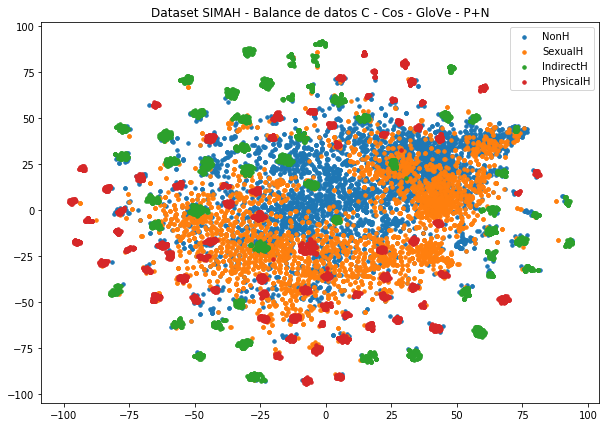

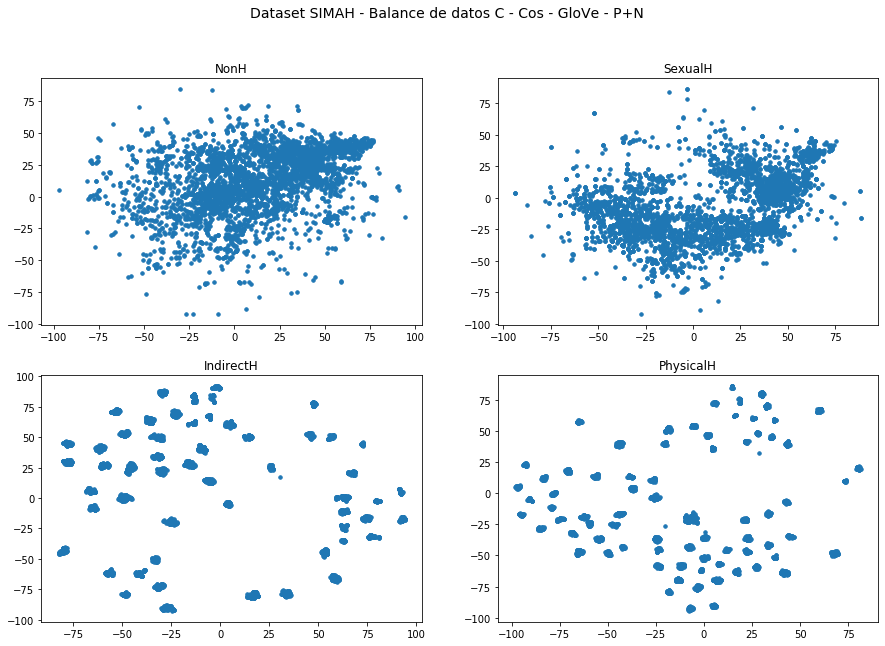

In [41]:
data_bas_cpn=[]
#macro_augmented=np.asarray(macro_augmented)
macro_augmented=np.load('../Datasets/CSV_Harassment/balance_clase_noPon_GloVe.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_cpn.append(vector)
    
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_cpn)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos C - Cos - GloVe - P+N")
plt.show()

fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))

fig.suptitle("Dataset SIMAH - Balance de datos C - Cos - GloVe - P+N", fontsize=14)
plt.show()


### Sujeto a Clase ponderando target

In [26]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: text  	Reemplazo:  [('whore', 0.5660280181281881)]
Sentencia original:
['the' 'fact' 'this' 'slut' 'jordan' 'text' 'me' 'at' 'number' 'number'
 'talm' 'bout' 'you' 'up' 'bitch' 'no' 'i' 'm' 'still' 'sleep']
Sentencia final: 3
['the', 'fact', 'this', 'slut', 'jordan', 'whore', 'me', 'at', 'number', 'number', 'talm', 'bout', 'you', 'up', 'bitch', 'no', 'i', 'm', 'still', 'sleep']


Original: people  	Reemplazo:  [('fucks', 0.9813767809667853)]
Sentencia original:
['jerikaxteam10' 'alissa' 'never' 'wants' 'people' 'slut' 'shame' 'others'
 'didn' 'x89' 't' 'follow' 'insta' 'account' 'page' 'x89']
Sentencia final: 3
['jerikaxteam10', 'alissa', 'never', 'wants', 'fucks', 'slut', 'shame', 'others', 'didn', 'x89', 't', 'follow', 'insta', 'account', 'page', 'x89']


Original: number  	Reemplazo:  [('year', 0.4569474363681131)]
Sentencia original:
['in' '38th' 'with' 'number' 'is' 'supergirl' 'season' 'number' 'number'
 'the' 'well' 'red' 'mage' '

Original: realistic  	Reemplazo:  [('anal', 0.7404002081568216)]
Original: insane  	Reemplazo:  [('crazy', 0.4196465535110295)]
Sentencia original:
['deepthroat' 'cumshot' 'realistic' 'squirting' 'insane' 'amateur' 'mouth'
 'i' 'x89' 't' 'co' 'a45zj6dyje']
Sentencia final: 3
['deepthroat', 'cumshot', 'anal', 'squirting', 'crazy', 'amateur', 'mouth', 'i', 'x89', 't', 'co', 'a45zj6dyje']


Original: fosho  	Reemplazo:  [('dude', 0.20715898336525448)]
Original: bramin  	Reemplazo:  [('dude', 0.20715898336525448)]
Original: slut  	Reemplazo:  [('heeeey', 1.6601793274590684)]
Sentencia original:
['one' 'thing' 'fosho' 'bramin' 'slut' 'sinmai' 'and' 'her' 'mother'
 'support' 'bramin' 'bitch' 'not' 'twit' 'for' 'karthik' 'on' 'zee' 'tv'
 'judge' 'but' 'twit' 'for' 'kailasger']
Sentencia final: 3
['one', 'thing', 'dude', 'dude', 'heeeey', 'sinmai', 'and', 'her', 'mother', 'support', 'bramin', 'bitch', 'not', 'twit', 'for', 'karthik', 'on', 'zee', 'tv', 'judge', 'but', 'twit', 'for', 'kailasger

Original: horny  	Reemplazo:  [('tomi', 1.9650660955663464)]
Sentencia original:
['rt' 'if' 'you' 're' 'horny' 'amp' 'dm' 'for' 'prices' 'jailbaitgirl'
 'jailbait' 'amateurporn' 'nsfw' 'nudes' 'pawg' 'creampie' 'panties']
Sentencia final: 3
['rt', 'if', 'you', 're', 'tomi', 'amp', 'dm', 'for', 'prices', 'jailbaitgirl', 'jailbait', 'amateurporn', 'nsfw', 'nudes', 'pawg', 'creampie', 'panties']


Original: being  	Reemplazo:  [('having', 1.1319708052160926)]
Original: used  	Reemplazo:  [('called', 0.8145910967033598)]
Sentencia original:
['rt' 'deenike' 'number' 'she' 'normalized' 'being' 'a' 'bad' 'girl'
 'being' 'unapologetically' 'you' 'many' 'celeb' 'women' 'that' 'fake'
 'praise' 'her' 'now' 'used' 'to' 'slut' 'shame']
Sentencia final: 3
['rt', 'deenike', 'number', 'she', 'normalized', 'being', 'a', 'bad', 'girl', 'having', 'unapologetically', 'you', 'many', 'celeb', 'women', 'that', 'fake', 'praise', 'her', 'now', 'called', 'to', 'slut', 'shame']


Original: masturbating  	Reempla

Original: gets  	Reemplazo:  [('wants', 1.09182503794968)]
Original: girl  	Reemplazo:  [('milf', 3.6666546408230065)]
Original: birthday  	Reemplazo:  [('sluttiest', 1.3703885992369451)]
Sentencia original:
['hot' 'granny' 'gets' 'a' 'slut' 'girl' 'for' 'birthday']
Sentencia final: 3
['hot', 'granny', 'wants', 'a', 'slut', 'milf', 'for', 'sluttiest']


Original: slut  	Reemplazo:  [('ann', 1.3383266334209039)]
Original: pos  	Reemplazo:  [('ok', 0.4343899842610194)]
Sentencia original:
['i' 'm' 'the' 'slut' 'you' 'hear' 'about' 'i' 'm' 'the' 'bitch' 'you'
 'dream' 'about' 'i' 'm' 'the' 'pos' 'you' 'see' 'out' 'i' 'm' 'the'
 'cunt' 'y' 'all' 'wanna' 'make']
Sentencia final: 3
['i', 'm', 'the', 'ann', 'you', 'hear', 'about', 'i', 'm', 'the', 'bitch', 'you', 'dream', 'about', 'i', 'm', 'the', 'ok', 'you', 'see', 'out', 'i', 'm', 'the', 'cunt', 'y', 'all', 'wanna', 'make']


Original: kinda  	Reemplazo:  [('whore', 0.7936307049333156)]
Sentencia original:
['cool' 'slut' 'kinda' 'sucks' 'c

Original: china  	Reemplazo:  [('girl', 0.2727116931485102)]
Original: stay  	Reemplazo:  [('girl', 0.8829448679747768)]
Sentencia original:
['amber' 'rose' 'black' 'china' 'big' 'hoe' 'moves' 'up' 'with' 'slut'
 'walks' 'etc' 'stay' 'single' 'fellas' 'if' 'u' 'got' 'a' 'girl' 'or'
 'wife' 'that' 'lik']
Sentencia final: 3
['amber', 'rose', 'black', 'girl', 'big', 'hoe', 'moves', 'up', 'with', 'slut', 'walks', 'etc', 'girl', 'single', 'fellas', 'if', 'u', 'got', 'a', 'girl', 'or', 'wife', 'that', 'lik']


Original: love  	Reemplazo:  [('think', 1.0876560157664077)]
Sentencia original:
['love' 'to' 'have' 'some' 'adult' 'fun' 'with' 'wet' 'bitches' 'then'
 'welcome' 'free' 'signup']
Sentencia final: 3
['think', 'to', 'have', 'some', 'adult', 'fun', 'with', 'wet', 'bitches', 'then', 'welcome', 'free', 'signup']


Original: ava  	Reemplazo:  [('dp', 1.1265547475187971)]
Original: bitches  	Reemplazo:  [('yes', 0.6331612970474045)]
Sentencia original:
['ava' 'max' 'is' 'a' 'fucking' 'queen'

Original: girls  	Reemplazo:  [('tinytits', 1.4579829914635198)]
Sentencia original:
['people' 'like' 'kim' 'kardashian' 'give' 'boys' 'the' 'idea' 'that' 'it'
 's' 'normal' 'to' 'dress' 'like' 'a' 'slut' 'and' 'complain' 'about'
 'girls' 'when' 't']
Sentencia final: 3
['people', 'like', 'kim', 'kardashian', 'give', 'boys', 'the', 'idea', 'that', 'it', 's', 'normal', 'to', 'dress', 'like', 'a', 'slut', 'and', 'complain', 'about', 'tinytits', 'when', 't']


Original: passionate  	Reemplazo:  [('love', 0.5863805488824517)]
Sentencia original:
['bustybabygirlny' 'thankyou' 'babe' 'for' 'the' 'rt' 'best' 'of' 'both'
 'worlds' 'sweet' 'and' 'passionate' 'but' 'also' 'a' 'freaky' 'little'
 'slut' 'lol']
Sentencia final: 3
['bustybabygirlny', 'thankyou', 'babe', 'for', 'the', 'rt', 'best', 'of', 'both', 'worlds', 'sweet', 'and', 'love', 'but', 'also', 'a', 'freaky', 'little', 'slut', 'lol']


Original: plausible  	Reemplazo:  [('ethical', 0.2851663984947865)]
Sentencia original:
['rubirosajun

Original: slut  	Reemplazo:  [('quadriplegic', 3.8841398534581715)]
Original: japanese  	Reemplazo:  [('asian', 0.4887202326210652)]
Sentencia original:
['leouniii' 'slut' 'gene' 'a' 'teenage' 'prostitution' 'who' 'wears'
 'slutty' 'japanese' 'school' 'girl' 'outfit' 'he' 'welcomes' 'everyone'
 'with']
Sentencia final: 3
['leouniii', 'quadriplegic', 'gene', 'a', 'teenage', 'prostitution', 'who', 'wears', 'slutty', 'asian', 'school', 'girl', 'outfit', 'he', 'welcomes', 'everyone', 'with']


Original: someone  	Reemplazo:  [('asleep', 2.3945876018046492)]
Sentencia original:
['rt' 'kopfdobrik' 'girls' 'get' 'ripped' 'apart' 'and' 'branded' 'a'
 'slut' 'or' 'whore' 'for' 'sleeping' 'with' 'someone' 'but' 'guys' 'get'
 'applauded' 'and' 'respected' 'for' 'exact']
Sentencia final: 3
['rt', 'kopfdobrik', 'girls', 'get', 'ripped', 'apart', 'and', 'branded', 'a', 'slut', 'or', 'whore', 'for', 'sleeping', 'with', 'asleep', 'but', 'guys', 'get', 'applauded', 'and', 'respected', 'for', 'exact']



Original: sucking  	Reemplazo:  [('kissing', 1.5161556220303114)]
Sentencia original:
['dick' 'sucking' 'lips' 'girls' 'ebony' 'cumtribute' 'cocktribute'
 'spittribute' 'faptribute' 'tribute' 'lips' 'dsls']
Sentencia final: 3
['dick', 'kissing', 'lips', 'girls', 'ebony', 'cumtribute', 'cocktribute', 'spittribute', 'faptribute', 'tribute', 'lips', 'dsls']


Original: movie  	Reemplazo:  [('hentai', 1.9128190552072086)]
Original: handjob  	Reemplazo:  [('porn', 0.2107678869341054)]
Original: casting  	Reemplazo:  [('leaving', 1.1523879639238155)]
Original: co  	Reemplazo:  [('nc', 1.4585654803963337)]
Sentencia original:
['movie' 'porno' 'masturbation' 'comics' 'porno' 'outdoor' 'handjob'
 'granny' 'fucking' 'casting' 'gaping' 'pussy' 'cas' 'x89' 't' 'co'
 'wse6lhf57f']
Sentencia final: 3
['hentai', 'porno', 'masturbation', 'comics', 'porno', 'outdoor', 'porn', 'granny', 'fucking', 'leaving', 'gaping', 'pussy', 'cas', 'x89', 't', 'nc', 'wse6lhf57f']


Original: fuck  	Reemplazo:  [('husb

Original: cum  	Reemplazo:  [('put', 0.9083247070317857)]
Sentencia original:
['mmmm' 'i' 'was' 'full' 'of' 'cum' 'snapchatsawitfirst' 'pussy' 'cum'
 'fullofcum' 'creampie' 'fan' 'fans' 'fanvideo' 'ifuckedafan' 'wet']
Sentencia final: 3
['mmmm', 'i', 'was', 'full', 'of', 'put', 'snapchatsawitfirst', 'pussy', 'cum', 'fullofcum', 'creampie', 'fan', 'fans', 'fanvideo', 'ifuckedafan', 'wet']


Original: cant  	Reemplazo:  [('hornygirl', 3.0957415495024665)]
Original: talk  	Reemplazo:  [('bullshit', 0.5498818836470428)]
Sentencia original:
['god' 'if' 'you' 'cant' 'act' 'then' 'shut' 'up' 'ava' 'anime' 'aja'
 'banyak' 'bacot' 'ya' 'talk' 'less' 'do' 'more' 'bitch']
Sentencia final: 3
['god', 'if', 'you', 'hornygirl', 'act', 'then', 'shut', 'up', 'ava', 'anime', 'aja', 'banyak', 'bacot', 'ya', 'bullshit', 'less', 'do', 'more', 'bitch']


Original: slut  	Reemplazo:  [('sex', 0.8928035219214147)]
Original: porn  	Reemplazo:  [('whore', 0.6791983556292299)]
Original: alex  	Reemplazo:  [('who

Original: heels  	Reemplazo:  [('girls', 0.3445232319790754)]
Original: young  	Reemplazo:  [('white', 0.5552396797384332)]
Sentencia original:
['beach' 'heels' 'gal' 'big' 'titted' 'mom' 'beach' 'bikini' 'sex' 'young'
 'black' 'girls' 'fuck' 'drunk' 'college' 'passed' 'out' 'sex' 'movies'
 'amateur']
Sentencia final: 3
['beach', 'girls', 'gal', 'big', 'titted', 'mom', 'beach', 'bikini', 'sex', 'white', 'black', 'girls', 'fuck', 'drunk', 'college', 'passed', 'out', 'sex', 'movies', 'amateur']


Original: most  	Reemplazo:  [('nastiest', 3.2532570501869635)]
Sentencia original:
['rt' 'itsalexisslove' 'long' 'acrylics' 'is' 'a' 'lifestyle' 'that'
 'most' 'of' 'you' 'bitches' 'aren' 't' 'fit' 'for']
Sentencia final: 3
['rt', 'itsalexisslove', 'long', 'acrylics', 'is', 'a', 'lifestyle', 'that', 'nastiest', 'of', 'you', 'bitches', 'aren', 't', 'fit', 'for']


Original: am  	Reemplazo:  [('are', 0.9672319357972591)]
Original: joke  	Reemplazo:  [('dingue', 3.0096436071819936)]
Sentencia orig

Original: show  	Reemplazo:  [('amateur', 1.7975990899127086)]
Original: porn  	Reemplazo:  [('babe', 0.6822372055212956)]
Original: video  	Reemplazo:  [('sexy', 0.29934979026920183)]
Sentencia original:
['sex' 'video' 'with' 'busty' 'redhead' 'in' 'creampie' 'show' 'nsfw'
 'orgasm' 'wet' 'horny' 'pussy' 'sex' 'porn' 'video' 'xxx' 'rt' 'follow']
Sentencia final: 3
['sex', 'video', 'with', 'busty', 'redhead', 'in', 'creampie', 'amateur', 'nsfw', 'orgasm', 'wet', 'horny', 'pussy', 'sex', 'babe', 'sexy', 'xxx', 'rt', 'follow']


Original: salad  	Reemplazo:  [('cheese', 1.0892244239129794)]
Sentencia original:
['im' 'a' 'slut' 'for' 'chicken' 'salad']
Sentencia final: 3
['im', 'a', 'slut', 'for', 'chicken', 'cheese']


Original: wish  	Reemplazo:  [('juni', 1.3656593963292867)]
Sentencia original:
['extra' 'ordinayry' 'i' 'saw' 'enough' 'idgaf' 'if' 'all' 'of' 'the'
 'facts' 'aren' 't' 'out' 'point' 'blank' 'his' 'ass' 'is' 'sick' 'amp'
 'bitch' 'i' 'wish' 'a']
Sentencia final: 3
['extra

Original: loses  	Reemplazo:  [('starts', 0.9037701485190682)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'starts', 'everything', 'after', 'devastating', 'emmerdale', 'trial', 'twist', 't', 'co', 'ovnydoove3', 'metrouk']


Original: punched  	Reemplazo:  [('fucked', 0.7730728253351091)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'gay', 'boy', 'you', 'fucked', 'in', 'the', 'hall', 'today', 'he', 'committed', 'suicide', 'a', 'few', 'minutes', 'ago', 'that', 'girl', 'you', 'called']


Original: said  	Reemplazo:  [('got', 0.5614549598780576)]
Original: thatt  	Reemplazo:  [('anything', 0.32524113878840716)]
Original: happened  	Reemplazo:  [('did', 1.6086204885046798)]
Sentencia original:
['t

Original: daddy  	Reemplazo:  [('daughter', 2.3783858473984094)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'few', 'day', 'today', 'me', 'young', 'daughter', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'choking', 'schoolgirl', 'cumslut']


Original: face  	Reemplazo:  [('fat', 1.3559409214289184)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 'jazzy' 'shkunk']
Sentencia final: 2
['any', 'girl', 'who', 's', 'name', 'is', 'jazzy', 'most', 'likely', 'has', 'a', 'bangin', 'bod', 'but', 'a', 'fugly', 'ass', 'butter', 'fat', 'proven', 'fact', 'jazzy', 'shkunk']


Original: victim  	Reemplazo:  [('terrorism', 1.0110462704288856)]
Original: family  	Reemplazo:  [('terrorism', 1.109535814601155)]
Original: anwar  	Reemplazo:  [('to

Original: nap  	Reemplazo:  [('booty', 1.698498687994958)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'ava', 'just', 'took', 'a', 'fat', 'ass', 'booty']


Original: daddy  	Reemplazo:  [('bby', 0.8976748362189217)]
Original: daddy  	Reemplazo:  [('spank', 0.6012659195329967)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'bby', 'behave', 'baby', 'spank', 'tight', 'open', 'yeah', 'little', 'x89']


Original: muslim  	Reemplazo:  [('ma', 0.799582560227605)]
Original: state  	Reemplazo:  [('country', 1.0783561917362858)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', '

Original: devil  	Reemplazo:  [('look', 0.48095519000307696)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'look', 'psycho', 'looking', 'on', 'snap', 'maps', 'and', 'a', 'lad', 'she', 'was', 'talking', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: aware  	Reemplazo:  [('difficult', 1.2238843691026102)]
Original: kill  	Reemplazo:  [('classist', 2.725111989373895)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'is', 'meant', 'to', 'destabilize', 'a', 'less', 'difficult', 'person', 'and', 'sicken', 'or', 'even', 'classist', 'her', 'which', 'can'

Original: family  	Reemplazo:  [('kamala', 3.067603409808249)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'said', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'amp', 'threatened', 'anwar', 'hussain', 'kamala', 'x89']


Original: videos  	Reemplazo:  [('maps', 8.840758370530253)]
Original: panties  	Reemplazo:  [('lesbians', 0.38700395177454916)]
Original: cock  	Reemplazo:  [('schoolgirl', 1.1424832775069946)]
Original: camgirl  	Reemplazo:  [('melania', 0.7852536667819706)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'maps', 'like', 'this', 'amateurporn', 'lesbians', 'schoolgirl', 'teen', 'nsfw', 'webcam', 'snapchat', 'melania

Original: father  	Reemplazo:  [('mother', 0.8895279816615245)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['trying', 'to', 'defend', 'this', 'piece', 'of', 'shit', 'mother', 'and', 'husband', 'for', 'raping', 'a', 'child', 'she', 'has', 'to', 'deal', 'with', 'all', 'ages', 'calling', 'he']


Original: kill  	Reemplazo:  [('becky', 1.2570048627502795)]
Original: wanna  	Reemplazo:  [('want', 0.8584621132894081)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'slut', 'told', 'shay', 'to', 'becky', 'herself', 'but', 'if', 'i', 'ever', 'find', 'out', 'istg', 'you', 'll', 'want', 'prayyyy']


Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Sentencia original:
['fuc

Original: dare  	Reemplazo:  [('try', 0.7630717109098016)]
Original: scum  	Reemplazo:  [('cunt', 0.8497346019633002)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['nah', 'debbied74799118', 'steved4848', 'how', 'try', 'she', 'honest', 'people', 'and', 'children', 'were', 'killed', 'in', 'manchester', 'and', 'this', 'cunt', 'says', 'that', 's', 'fair', 'retali']


Original: gtfo  	Reemplazo:  [('gofundme', 1.9908959152358048)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gofundme', 'pretty', 'privilege', 't', 'co', 'tesme5khvr']


Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' '

Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('big', 0.8425056859452718)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'bitch', 'brutally', 'tortured', 'minor', 'servant', 'tortured', 'big', 'ammara', 'm', 'x89', 't', 'co', 'mgknu7zzjm']


Original: idk  	Reemplazo:  [('sexey', 2.3232922736782413)]
Original: herself  	Reemplazo:  [('urself', 0.8605880390558698)]
Original: find  	Reemplazo:  [('know', 0.800900954683734)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['sexey', 'which', 'fugly', 'slut', 'told', 'shay', 'to', 'kill', 'urself', 'but', 'if', 'i', 'ever', 'know', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: kill  	Reemplazo:  [('fuck', 0.42912831147419517)]
Senten

Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: sex  	Reemplazo:  [('body', 0.4438616329978432)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'teen', 'porn', 'first', 'time', 'hot', 'girl', 'woman', 'downloadfree', 'porn', 'movies', 'creampire', 'girl', 'guys', 'with', 'girls', 'having', 'body', 'black', 'se']


Original: seems  	Reemplazo:  [('is', 0.7826735815892442)]
Original: innocent  	Reemplazo:  [('schoolgirl', 2.9954633129325816)]
Original: little  	Reemplazo:  [('naked', 1.5073562632944943)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'is', 'like', 'that', 'cute', 

Original: shaming  	Reemplazo:  [('disgusting', 0.3224149476317942)]
Original: horrible  	Reemplazo:  [('legal', 0.6962112471144241)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'let', 's', 'add', 'snapchat', 'disgusting', 'melania', 'to', 'this', 'she', 's', 'legal', 'in', 'about', 'number', 'ways', 'we', 'shouldn', 't', 'have', 'to', 'fixate', 'on', 'her', 'modeling', 'past']


Original: girl  	Reemplazo:  [('boy', 0.8443514970499431)]
Original: jazzy  	Reemplazo:  [('thing', 0.3273726898823416)]
Original: bangin  	Reemplazo:  [('head', 0.361598190478158)]
Original: bod  	Reemplazo:  [('booty', 0.4761831533931425)]
Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but'

Original: videos  	Reemplazo:  [('hopkins', 6.618151672802145)]
Original: teen  	Reemplazo:  [('amateur', 1.1375939061511602)]
Original: camgirl  	Reemplazo:  [('amateur', 0.7145466110765405)]
Original: fuck  	Reemplazo:  [('whore', 1.015557905698547)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'hopkins', 'like', 'this', 'amateurporn', 'panties', 'cock', 'amateur', 'nsfw', 'webcam', 'snapchat', 'amateur', 'slut', 'paypalwhore', 'whore', 'me']


Original: know  	Reemplazo:  [('destabilize', 1.8707012589797327)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'destabilize', 'you', 're', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'homework', 'bitch', 'you', 'got', 'school', 'tomorr

Original: piece  	Reemplazo:  [('nigga', 0.9757447054919279)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'sable', 'nigga', 'of', 'shit', 'realtristan13', 'is', 'i', 'mean', 'we', 'already', 'new', 'he', 'was', 'after', 'cheating', 'on', 'his', 'pregnant', 'girlfriend']


Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'amp', 'amp', 'change', 'pocket', 'bitch', 'x89', 'damn', 'sonic', 'gorgeous', 'x89']


Original: damn  	Reemplazo:  [('padgett', 3.043983969469216)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing',

Original: prom  	Reemplazo:  [('date', 0.7966084052877697)]
Original: code  	Reemplazo:  [('training', 0.8966290752634788)]
Original: meeting  	Reemplazo:  [('weekend', 1.117418519264917)]
Original: ve  	Reemplazo:  [('think', 1.112800892947441)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'having', 'a', 'date', 'dress', 'training', 'weekend', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 'think', 'been', 'missing', 'my', 'da']


Original: guy  	Reemplazo:  [('fam', 0.7948252458774744)]
Original: online  	Reemplazo:  [('resource', 0.7586138791278283)]
Original: nudes  	Reemplazo:  [('mosques', 2.7120588276055004)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'with

Original: love  	Reemplazo:  [('think', 0.7415936845597179)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'sad', 'she', 's', 'feeling', 'blah', 'but', 'i', 'think', 'being', 'her', 'comfort']


Original: amp  	Reemplazo:  [('feminist', 0.2910560846163737)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'feminist', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud'

Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'expect', 'famo']


Original: given  	Reemplazo:  [('bigoted', 4.036063512885607)]
Original: reason  	Reemplazo:  [('right', 1.026608302781045)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['bigoted', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'right', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'woman']


Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166

Original: ve  	Reemplazo:  [('ana', 0.9354031276752849)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 'ana', 'right', 'shame', 'girl']


Original: rt  	Reemplazo:  [('woman', 0.8002692871582604)]
Original: women  	Reemplazo:  [('sniffles', 1.4339846843003115)]
Original: trained  	Reemplazo:  [('given', 0.6839254275286478)]
Original: society  	Reemplazo:  [('community', 1.0786868682383426)]
Original: taking  	Reemplazo:  [('doing', 1.1044034731775298)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['woman', 'athenafilmfest', 'sniffles', 'have', 'been', 'given', 'in', 'our', 'culture', 'and', 'community', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'doing', 'it', 's', 'historic', 'amp', 'it', 's', 'u']


Original: sham

Original: women  	Reemplazo:  [('boots', 3.071932446421884)]
Original: women  	Reemplazo:  [('females', 1.4552836308524404)]
Original: know  	Reemplazo:  [('say', 0.8763001332917953)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'boots', 'but', 'all', 'females', 'should', 'say', 'this', 'yo']


Original: vs  	Reemplazo:  [('feel', 2.120995852216222)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['mrs', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'feel', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'will']


Original: iam  	Reempla

Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'tighter', 'nigga', 'would', 'touch', 'pubic', 'girls', 't', 'x89']


Original: number  	Reemplazo:  [('ok', 0.8483563917123049)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['ok', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'make', 'him', 'a', 'few', 'times', 'until', 'she', 'is', 'ready', 'and', 'he', 'just', 'lets', 'h']


Original: expect  	Reemplazo:  [('believe', 0.7638265733329426)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'exp

Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: amp  	Reemplazo:  [('bigot', 1.6001769604732128)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'bigot', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud']


Original: look  	Reemplazo:  [('consen', 11.770805635553257)]
Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'consen', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'f

Original: women  	Reemplazo:  [('people', 0.5803659274712024)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['people', 'shame', 'didn', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: women  	Reemplazo:  [('misogynists', 1.2166443428387652)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'shaming', 'because', 'misogynists', 'ha', 'x89', 't', 'co', 'djbhkeyeif']


Original: asked  	Reemplazo:  [('apologized', 4.790274838623397)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: dont  	Reemplazo:  [('bitch', 0.6458474190434372)]
Original: ask  	Reemplazo:  [('bitch', 0.8391687549162663)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird

Original: fun  	Reemplazo:  [('enjoy', 1.2585362798601234)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'makes', 'having', 'to', 'much', 'enjoy']


Original: girl  	Reemplazo:  [('fayth', 1.532451085954561)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'gorgeous', 'fayth']


Original: fucking  	Reemplazo:  [('having', 1.0827788878194868)]
Original: doesn  	Reemplazo:  [('shouldn', 0.8428762798454346)]
Original: see  	Reemplazo:  [('know', 0.7442636041958858)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'having', 'hate', 'ava', 'shouldn', 't', 'she', 'know', 'that', 'cheryl', 'drives', 'easton', 'crazy']


Original: ava  	Reemplazo:  [('want', 0.43903775531723155)

In [44]:
data_bas_cppos=[]
#macro_augmented=np.asarray(macro_augmented)
macro_augmented=np.load('../Datasets/CSV_Harassment/balance_clase_Pon_GloVe_pos.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_cppos.append(vector)

/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/bert_serving/client/__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=34" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


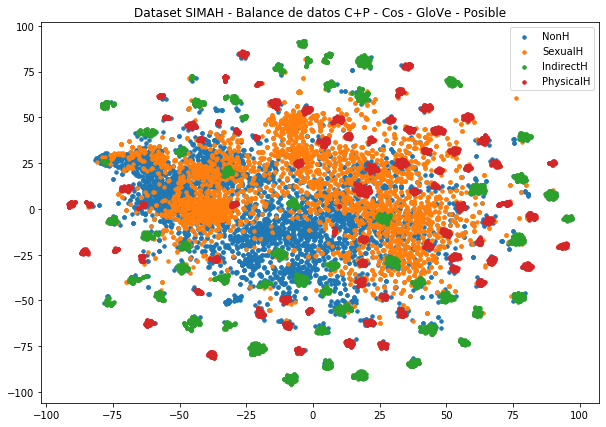

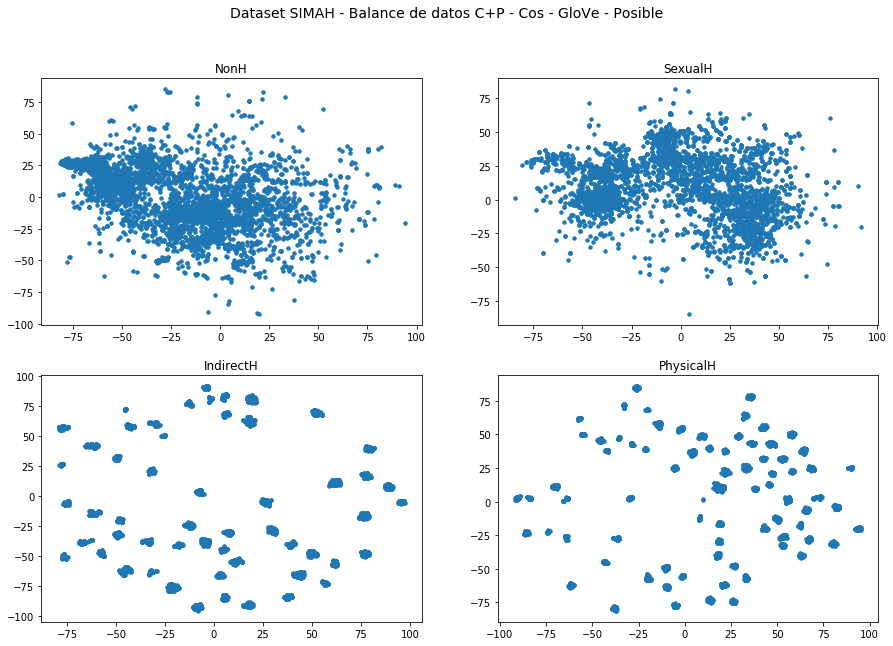

In [45]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_cppos)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos C+P - Cos - GloVe - Posible")
plt.show()

fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))
        

fig.suptitle("Dataset SIMAH - Balance de datos C+P - Cos - GloVe - Posible", fontsize=14)
plt.show()

In [27]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_clase_Pon_GloVe_pos.npy', macro_augmented)
    

In [28]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: british  	Reemplazo:  [('iranian', 1.6247221335186608)]
Sentencia original:
['british' 'pussy' 'cumshot' 'indian' 'stars' 'uncircumcised' 'hours'
 'ago' 'x89' 't' 'co' 'pdffvldrjl']
Sentencia final: 3
['iranian', 'pussy', 'cumshot', 'indian', 'stars', 'uncircumcised', 'hours', 'ago', 'x89', 't', 'co', 'pdffvldrjl']


Original: didn  	Reemplazo:  [('couldn', 0.8775945240475898)]
Original: conroy  	Reemplazo:  [('courtney', 0.16565299193798813)]
Sentencia original:
['you' 'didn' 'x89' 't' 'right' 'n' 'nmegara' 'elise' 'conroy' 'nastiest'
 'skank' 'bitch' 'tr' 'x89' 't' 'co' '2nftfzniap']
Sentencia final: 3
['you', 'couldn', 'x89', 't', 'right', 'n', 'nmegara', 'elise', 'courtney', 'nastiest', 'skank', 'bitch', 'tr', 'x89', 't', 'co', '2nftfzniap']


Original: couples  	Reemplazo:  [('lesbians', 0.8863002925010296)]
Original: teen  	Reemplazo:  [('mature', 0.3286688284209436)]
Sentencia original:
['intercourse' 'for' 'married' 'couples' 'be

Original: dirty  	Reemplazo:  [('innoce', 1.6022709229263803)]
Original: slut  	Reemplazo:  [('hoebag', 1.8039410868158137)]
Sentencia original:
['you' 'know' 'those' 'things' 'that' 'you' 'are' 'not' 'supposed' 'to'
 'do' 'but' 'do' 'anyway' 'like' 'a' 'girl' 'who' 'chooses' 'to' 'be' 'a'
 'dirty' 'slut' 'well']
Sentencia final: 3
['you', 'know', 'those', 'things', 'that', 'you', 'are', 'not', 'supposed', 'to', 'do', 'but', 'do', 'anyway', 'like', 'a', 'girl', 'who', 'chooses', 'to', 'be', 'a', 'innoce', 'hoebag', 'well']


Original: grabbing  	Reemplazo:  [('sucking', 0.8399852554544348)]
Original: free  	Reemplazo:  [('special', 1.2214878305299597)]
Sentencia original:
['can' 't' 'believe' 'theres' 'no' 'money' 'grabbing' 'sluts' 'on' 'here'
 'want' 'real' 'women' 'any' 'girls' 'want' 'free' 'gifts' 'and' 'money'
 'from' 'su']
Sentencia final: 3
['can', 't', 'believe', 'theres', 'no', 'money', 'sucking', 'sluts', 'on', 'here', 'want', 'real', 'women', 'any', 'girls', 'want', 'specia

Original: photos  	Reemplazo:  [('de', 0.9520519080438594)]
Original: xxx  	Reemplazo:  [('comunicate', 0.9643732300122646)]
Original: tabatha  	Reemplazo:  [('babe', 0.11180937416808798)]
Original: film  	Reemplazo:  [('movie', 1.1327909957282898)]
Sentencia original:
['rt' 'amanda' 'oleande' 'o' 'photos' 'sexe' 'porideo' 'videos' 'pornos'
 'xxx' 'tabatha' 'cash' 'xxx' 'video' 'vies' 'mom' 'sex' 'porno' 'izle'
 'video' 'xxx' 'fucking' 'pictures' 'film']
Sentencia final: 3
['rt', 'amanda', 'oleande', 'o', 'de', 'sexe', 'porideo', 'videos', 'pornos', 'comunicate', 'babe', 'cash', 'xxx', 'video', 'vies', 'mom', 'sex', 'porno', 'izle', 'video', 'xxx', 'fucking', 'pictures', 'movie']


Original: fucking  	Reemplazo:  [('going', 0.7569671242910293)]
Sentencia original:
['i' 'am' 'fucking' 'slut' 'for' 'grocery' 'store' 'dip' 'samples']
Sentencia final: 3
['i', 'am', 'going', 'slut', 'for', 'grocery', 'store', 'dip', 'samples']


Original: amp  	Reemplazo:  [('ass', 0.5588552917042587)]
Sent

Original: half  	Reemplazo:  [('picture', 1.045788458779732)]
Original: pic  	Reemplazo:  [('saw', 1.1167512116176703)]
Original: girls  	Reemplazo:  [('grils', 1.397821175456624)]
Sentencia original:
['women' 'slut' 'shame' 'so' 'much' 'more' 'than' 'men' 'do' 'you' 'can'
 'post' 'a' 'half' 'naked' 'pic' 'and' 'guys' 'will' 'just' 'enjoy' 'but'
 'all' 'the' 'girls']
Sentencia final: 3
['women', 'slut', 'shame', 'so', 'much', 'more', 'than', 'men', 'do', 'you', 'can', 'post', 'a', 'picture', 'naked', 'saw', 'and', 'guys', 'will', 'just', 'enjoy', 'but', 'all', 'the', 'grils']


Original: drink  	Reemplazo:  [('water', 0.5782692619831945)]
Sentencia original:
['wish' 'i' 'was' 'a' 'hot' 'girl' 'so' 'i' 'could' 'get' 'paid' 'to'
 'slut' 'around' 'and' 'drink' 'bang' 'energy' 'drinks']
Sentencia final: 3
['wish', 'i', 'was', 'a', 'hot', 'girl', 'so', 'i', 'could', 'get', 'paid', 'to', 'slut', 'around', 'and', 'water', 'bang', 'energy', 'drinks']


Original: are  	Reemplazo:  [('am', 0.632

Original: rude  	Reemplazo:  [('disrespectful', 1.0378756574912564)]
Sentencia original:
['marni' 'moore' 'x' 'disgusting' 'amp' 'rude' 'to' 'the' 'person' 'who'
 'called' 'marni' 'an' 'old' 'slut' 'monkey' 'on' 'babestation' 'no'
 'need' 'for' 'it']
Sentencia final: 3
['lisa', 'moore', 'x', 'annoying', 'amp', 'disrespectful', 'to', 'the', 'person', 'who', 'called', 'marni', 'an', 'old', 'slut', 'monkey', 'on', 'babestation', 'no', 'need', 'for', 'it']


Original: fuck  	Reemplazo:  [('wanna', 0.9555712048212766)]
Sentencia original:
['no' 'man' 'texted' 'me' 'in' 'number' 'days' 'start' 'my' 'period'
 'ding' 'ding' 'bitch' 'it' 's' 'me' 'let' 'fuck' 'bruhhhhh']
Sentencia final: 3
['no', 'man', 'texted', 'me', 'in', 'number', 'days', 'start', 'my', 'period', 'ding', 'ding', 'bitch', 'it', 's', 'me', 'let', 'wanna', 'bruhhhhh']


Original: homemade  	Reemplazo:  [('porn', 0.23646852833202958)]
Original: anal  	Reemplazo:  [('qual', 1.5433034135140082)]
Sentencia original:
['movies' 'nak

Original: cucumber  	Reemplazo:  [('dick', 1.7892157803646993)]
Original: porn  	Reemplazo:  [('lmfao', 0.7686334142206828)]
Original: making  	Reemplazo:  [('amazing', 0.5355964314917526)]
Sentencia original:
['porn' 'fucked' 'in' 'porno' 'slut' 'sucking' 'anal' 'porn' 'bitch'
 'cucumber' 'cock' 'butt' 'fuck' 'porn' 'video' 'hd' 'making' 'amateur'
 'fucking' 'xxx']
Sentencia final: 3
['porn', 'fucked', 'in', 'porno', 'slut', 'sucking', 'anal', 'porn', 'bitch', 'dick', 'cock', 'butt', 'fuck', 'lmfao', 'video', 'hd', 'amazing', 'amateur', 'fucking', 'xxx']


Original: add  	Reemplazo:  [('remove', 1.969154544128043)]
Original: small  	Reemplazo:  [('big', 0.8907895567920178)]
Original: nude  	Reemplazo:  [('send', 1.4648805705429997)]
Sentencia original:
['add' 'my' 'snapcht' 'rosewix' 'young' 'small' 'tits' 'deep' 'anal'
 'fuck' 'big' 'ass' 'number' 'spread' 'nude' 'big' 'butt' 'slut' 'girls'
 'show' 'tits' 'ti']
Sentencia final: 3
['remove', 'my', 'snapcht', 'rosewix', 'young', 'big',

Original: co  	Reemplazo:  [('tyle', 1.3199535791331407)]
Sentencia original:
['greek' 'porno' 'double' 'dildo' 'fucking' 'public' 'cumshot' 'rubbing'
 'pussy' 'masturbating' 'eating' 'young' 'boobs' 'kore' 'x89' 't' 'co'
 'ft5runxdtp']
Sentencia final: 3
['greek', 'porno', 'double', 'dildo', 'fucking', 'sex', 'cumshot', 'rubbing', 'pussy', 'masturbating', 'eating', 'young', 'boobs', 'kore', 'x89', 't', 'tyle', 'ft5runxdtp']


Original: spent  	Reemplazo:  [('spend', 0.715591878799881)]
Original: ass  	Reemplazo:  [('niggas', 0.9841709742252425)]
Sentencia original:
['i' 'spent' 'countless' 'games' 'in' 'at' 'amp' 't' 'park' 'being'
 'called' 'philly' 'slut' 'and' 'filthadelphia' 'by' 'grown' 'ass' 'men'
 'a' 'dodgers' 'fan']
Sentencia final: 3
['i', 'spend', 'countless', 'games', 'in', 'at', 'amp', 't', 'park', 'being', 'called', 'philly', 'slut', 'and', 'filthadelphia', 'by', 'grown', 'niggas', 'men', 'a', 'dodgers', 'fan']


Original: girls  	Reemplazo:  [('choices', 1.1203730428908

Original: overheard  	Reemplazo:  [('downblouse', 3.282301567182936)]
Original: use  	Reemplazo:  [('premium', 1.734647004151462)]
Original: large  	Reemplazo:  [('free', 1.213188371354693)]
Sentencia original:
['overheard' 'a' 'girl' 'in' 'the' 'union' 'bathroom' 'claiming' 'that'
 'you' 'd' 'have' 'to' 'be' 'a' 'slut' 'to' 'need' 'to' 'use' 'the'
 'large' 'tampons' 'and' 'p']
Sentencia final: 3
['downblouse', 'a', 'girl', 'in', 'the', 'union', 'bathroom', 'claiming', 'that', 'you', 'd', 'have', 'to', 'be', 'a', 'slut', 'to', 'need', 'to', 'premium', 'the', 'free', 'tampons', 'and', 'p']


Original: boobs  	Reemplazo:  [('nsfw', 1.1211905476489124)]
Original: pussy  	Reemplazo:  [('nsfw', 1.1548341713398902)]
Original: nsfw  	Reemplazo:  [('amature', 0.9579591492812859)]
Sentencia original:
['rt' 'ratalburo17' 'fuck' 'me' 'like' 'a' 'bitch' 'my' 'pussy' 'is' 'wet'
 'horny' 'boobs' 'tits' 'pussy' 'porn' 'amateurporn' 'nsfw' 'cumslut'
 'blowjob' 'sex' 'sl']
Sentencia final: 3
['rt', 'ra

Original: mumford  	Reemplazo:  [('listen', 0.44969460671149425)]
Sentencia original:
['we' 'listened' 'to' 'mumford' 'and' 'sons' 'on' 'the' 'stereo' 'she'
 'put' 'a' 'lit' 'newport' 'in' 'her' 'gay' 'pussy' 'hole' 'we' 'listened'
 'to' 'the']
Sentencia final: 3
['we', 'listened', 'to', 'listen', 'and', 'sons', 'on', 'the', 'stereo', 'she', 'put', 'a', 'lit', 'newport', 'in', 'her', 'gay', 'pussy', 'hole', 'we', 'listened', 'to', 'the']


Original: worked  	Reemplazo:  [('figured', 0.9344404078625872)]
Sentencia original:
['anotherleowifey' 'i' 'responded' 'with' 'something' 'bitchy' 'and'
 'that' 'kinda' 'worked' 'too']
Sentencia final: 3
['anotherleowifey', 'i', 'responded', 'with', 'something', 'bitchy', 'and', 'that', 'kinda', 'figured', 'too']


Original: sleep  	Reemplazo:  [('wanna', 1.2781343932205553)]
Sentencia original:
['rt' 'tiapogai51' 'please' 'sleep' 'i' 'will' 'do' 'it' 'for' 'you' 'guy'
 'gt' 'register' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'
 'slut']


Original: note  	Reemplazo:  [('englis', 0.6678233017500163)]
Sentencia original:
['she' 'is' 'sleeping' 'and' 'letting' 'her' 'boyfriend' 'play' 'her'
 'pussy' 'gt' 'then' 'sign' 'up' 'note' 'verify' 'emai']
Sentencia final: 3
['she', 'is', 'sleeping', 'and', 'letting', 'her', 'boyfriend', 'play', 'her', 'pussy', 'gt', 'then', 'sign', 'up', 'englis', 'verify', 'emai']


Original: hentai  	Reemplazo:  [('reading', 0.6579416686236257)]
Original: co  	Reemplazo:  [('date', 0.531293667409824)]
Sentencia original:
['full' 'length' 'online' 'movies' 'girls' 'hentai' 'harassment'
 'sleeping' 'adult' 'dating' 't' 'co' '7bwv6xrbfh']
Sentencia final: 3
['full', 'length', 'online', 'movies', 'girls', 'reading', 'harassment', 'sleeping', 'adult', 'dating', 't', 'date', '7bwv6xrbfh']


Original: hard  	Reemplazo:  [('bad', 1.1280603193167797)]
Original: press  	Reemplazo:  [('need', 0.27626306139496937)]
Sentencia original:
['hard' 'girl' 'bring' 'water' 'press' 'braids' 'everybody' 'street'
 'gat

Original: stands  	Reemplazo:  [('shes', 0.7170328004761829)]
Original: bef  	Reemplazo:  [('think', 0.3754109543595094)]
Sentencia original:
['cosmickatsu' 'stands' 'sassy' 'bitch' 'aaaaaaaaaa' 'would' 'look' 'you'
 're' 'talking' 'bef' 'x89']
Sentencia final: 3
['cosmickatsu', 'shes', 'sassy', 'bitch', 'aaaaaaaaaa', 'would', 'look', 'you', 're', 'talking', 'think', 'x89']


Original: sexy  	Reemplazo:  [('porn', 0.33504949654264027)]
Original: pussy  	Reemplazo:  [('blowjob', 0.9640929805992376)]
Original: porno  	Reemplazo:  [('dan', 1.6662310702669811)]
Sentencia original:
['any' 'wanna' 'horny' 'blowjob' 'hentai' 'sexy' 'dick' 'fuck' 'pussy'
 'footjob' 'handjob' 'porn' 'porno' 'x89' 't' 'co' 'lok64t7qiu']
Sentencia final: 3
['any', 'wanna', 'horny', 'blowjob', 'hentai', 'porn', 'dick', 'fuck', 'blowjob', 'footjob', 'handjob', 'porn', 'dan', 'x89', 't', 'co', 'lok64t7qiu']


Original: schoolgirl  	Reemplazo:  [('whatsapp', 1.2127355207859232)]
Original: jai  	Reemplazo:  [('porn', 

Original: daddy  	Reemplazo:  [('cumshot', 0.9459377926828401)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', 'rt', 'for', 'more', 'horny', 'single', 'girls', 'amateur', 'bbc', 'cumshot', 'cock', 'cumslut', 'cumshot', 'date', 'dati']


Original: nigga  	Reemplazo:  [('told', 1.6777463373587036)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'told', 'said', 'the', 'wildest', 'thing', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'bedroom', 'was', 'his', 'girl', 'ask', 'for', 'him', 'to', 'kall', 'her', 'a']


Original: shaming  	Reemplazo:  [('looking', 0.3842263870465273)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'ge

Original: aesthetic  	Reemplazo:  [('other', 0.8839614224935439)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'get', 'used', 'other', 'accounts', 'on', 'insta', 'of', 'girls', 'with', 'their', 'asses', 'out', 'and', 'covered', 'in', 'fake', 'blood', 'an']


Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'daughter', 'who', 'was', 'shot', 'amp', 'killed', 'by', 'a', 'white', 'rapist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: slut  	Reemplazo:  [('fuck', 1.083193886

Original: saying  	Reemplazo:  [('feeling', 1.0031372604734023)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'time', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'feeling', 'she', 's', 'a', 'dirty', 'disgusting', 'sl']


Original: shaming  	Reemplazo:  [('gaping', 4.126394783355089)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'do', 'is', 'comment', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'gaping', 'her', 'that', 's', 'just', 'messy']


Original: fake  	Reemplazo:  [('throat', 1.9131132989990256)]


Original: said  	Reemplazo:  [('got', 0.637778305716305)]
Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'nigga', 'got', 'the', 'wildest', 'thing', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'bedroom', 'was', 'his', 'girl', 'ask', 'for', 'him', 'to', 'call', 'her', 'a']


Original: rt  	Reemplazo:  [('ava', 1.1068279047985048)]
Original: webcam  	Reemplazo:  [('nude', 0.4649614936159452)]
Original: fuck  	Reemplazo:  [('deepthroat', 3.0652806866724647)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['ava', 'for', 'more', 'videos', 'like', 'this', 'amateurporn', 'panties', 'cock', 'teen', 'nsfw', 'nude', 'sna

Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: fan  	Reemplazo:  [('bella', 1.2720054012018664)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'know', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'hasn', 't', 'but', 'laugh', 'at', 'a', 'bella', 'th']


Original: calling  	Reemplazo:  [('saying', 1.3570308639873856)]
Original: slut  	Reemplazo:  [('classist', 6.581182529459681)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['slapped', 'a', 'boy', 'for', 'saying', 'a', 'girl', 'a', 'classist']


Original: jealous  	Reemplazo:  [('overdramatic', 2.3940124494877253)]
Sentencia original:
['rt' 'xtianisabsent' 'a' 'jealous' 'girl' 'is' 'a' 'faithful' 'one']
Sentencia f

Original: rt  	Reemplazo:  [('se', 5.204560494269909)]
Original: make  	Reemplazo:  [('go', 1.4429538679403973)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['se', 'krassenstein', 'you', 'can', 't', 'go', 'this', 'stuff', 'up', 'the', 'build', 'the', 'wall', 'gofundme', 'has', 'failed', 'after', 'gofundme', 'canceled', 'the', 'campaign', 'for', 'violati']


Original: kill  	Reemplazo:  [('twitter', 0.797610541443519)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'people', 'on', 'the', 'internet', 'to', 'twitter', 'themselves', 'and', 'her', 'husband', 'calling', 'kamala', 'harris', 'a', 'slut', 'on', 'f']


Original: whit



Original: sex  	Reemplazo:  [('pussy', 1.540688223648919)]
Original: ex  	Reemplazo:  [('classist', 2.8735670556380986)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'pussy', 'can', 'we', 'go', 'beat', 'up', 'your', 'classist', 'ion', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: stolen  	Reemplazo:  [('been', 0.659812629860509)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'had', 'been', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'appeared', 'around', 'her', 'eyes', 'she', 'can', 'not', 'possibly', 'be', 'saved', 'she', 'is', 'fucks']


Original: whole  	Reemplazo:  [('other', 0.8502074191678999)]
Sen

Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'stern', 'strict', 'and', 'powerful', 'i', 'bet', 'she', 'is', 'deadly', 'with', 'a', 'pornvideo', 'on']


Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'cheeky', 'bitch', 'horrible', 'shit', 'looking', 'slut']


Original: shouldn  	Reemplazo:  [('didn', 1.5724066276876165)]
Original: comment  	Reemplazo:  [('anna', 1.1010497108870678)]
Original: jordyn  	Reemplazo:  [('picture', 0.3885478080880179)]
Original: slut  	Reemplazo:  [('classist', 3.332355804452273)]
Sentencia origin

Original: husband  	Reemplazo:  [('jewish', 0.9024103832322253)]
Original: calling  	Reemplazo:  [('talking', 0.45611840012636645)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'people', 'on', 'the', 'internet', 'to', 'kill', 'themselves', 'and', 'her', 'jewish', 'talking', 'kamala', 'harris', 'a', 'slut', 'on', 'f']


Original: let  	Reemplazo:  [('go', 0.5769159021375897)]
Original: shaming  	Reemplazo:  [('disgusting', 0.4069175554073654)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'go', 's', 'add', 'slut', 'disgusting', 'melania', 'to', 'this', 'she', 's', 'horrible', 'in', 'about', 'number', '

Original: kill  	Reemplazo:  [('whore', 0.8181603621399541)]
Original: oh  	Reemplazo:  [('tell', 1.8785786317422615)]
Original: guess  	Reemplazo:  [('ok', 0.7321581325331185)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['fucking', 'slut', 'go', 'whore', 'your', 'self', 'o', 'tell', 'i', 'ok', 'i', 's', 'should']


Original: repeat  	Reemplazo:  [('defend', 1.2858815451514056)]
Original: country  	Reemplazo:  [('defend', 0.5627155048993465)]
Original: rape  	Reemplazo:  [('victim', 0.7681563450327462)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['defend', 'after', 'me', 'no', 'any', 'girl', 'of', 'any', 'cast', 'community', 'or', 'defend', 'deserve', 'victim', 'threats', 'or', 'slut', 'shaming', 'doesn', 't', 'matter']


Original: minor  	Reemplazo:  [('

Original: calling  	Reemplazo:  [('discussing', 1.1864748654504333)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['trying', 'to', 'defend', 'this', 'piece', 'of', 'shit', 'father', 'and', 'husband', 'for', 'raping', 'a', 'child', 'she', 'has', 'to', 'deal', 'with', 'all', 'ages', 'discussing', 'he']


Original: face  	Reemplazo:  [('insta', 1.5300701341273257)]
Original: bitch  	Reemplazo:  [('horny', 1.040221782217372)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'insta', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'horny', 'nah', 'bitch',

Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'tighter', 'pussy', 'would', 'touch', 'look', 'hairs', 't', 'x89']


Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'people', 'but', 'mrs', 'norma', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: white  	Reemplazo:  [('old', 0.6191880641910913)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' '

Original: girl  	Reemplazo:  [('woman', 1.4843873038097308)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'woman']


Original: get  	Reemplazo:  [('know', 1.1663130940866018)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'girls', 'know', 'then', 'go', 'clubbing', 'ah', 'horrr', 'confirm', 'slut']


Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: trained  	Reemplazo:  [('given', 0.6839254275286478)]
Original: ask  	Reemplazo:  [('community', 0.7514285045365734)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it'

Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: amp  	Reemplazo:  [('fayth', 0.8519805738929025)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'fayth', 'you', 'fayth', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: fucking  	Reemplazo:  [('messing', 1.2475617419676803)]
Original: has  	Reemplazo:  [('is', 0.744205433553186)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'messing', 'dumb', 'as', 'hell', 'she', 'is', 'got', 'to', 'grow', 'up']


Original: dj  

Original: girls  	Reemplazo:  [('boys', 2.011184256686366)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'wonder', 'boys', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: fun  	Reemplazo:  [('miss', 1.6872372555377022)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'is', 'having', 'to', 'much', 'miss']


Original: wine  	Reemplazo:  [('think', 1.3122952550368878)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['rt',

Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'gamers', 'behind', 'people', 'women', 'l', 'x89']


Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: boots  	Reemplazo:  [('girls', 0.3496354303108412)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'shit', 'cumshot', 'videos', 'tumblr', 'grown', 'busty', 'girls', 'girl']


Original: wonder  	Reemplazo:  [('think', 0.7851675044509553)]
Original: miss  	Reemplazo:  [('rt', 1.3140988500562905)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a'

Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'girl']


Original: girls  	Reemplazo:  [('people', 0.4405374200887647)]
Original: number  	Reemplazo:  [('week', 2.594321486280525)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'people', 'shame', 'different', 'every', 'weekend', 'fuckin', 'week', 'x89']


Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud'

Original: feminism  	Reemplazo:  [('ana', 3.0550417020644987)]
Original: youre  	Reemplazo:  [('understand', 0.9423640692689268)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'ana', 'don', 'x89', 't', 'speak', 'about', 'understand', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: judgement  	Reemplazo:  [('thing', 0.4782299023906129)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'thing', 'chinese', 'girls', 'get', 'then', 'go', 'clubbing', 'ah', 'horrr', 'confirm', 'slut']


Original: different  	Reemplazo:  [('other', 0.5393318418659072)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 's

Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'girls', 'see', 'then', 'go', 'having', 'ah', 'horrr', 'confirm', 'slut']


Original: went  	Reemplazo:  [('was', 0.6884399421549716)]
Original: racist  	Reemplazo:  [('xenophobic', 1.0794043009755383)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', '

Original: shouldn  	Reemplazo:  [('padgett', 5.329412237978218)]
Original: fucking  	Reemplazo:  [('messing', 2.79412854497142)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'padgett', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'messing', 'dumb', 'as', 'hell', 'she', 'has', 'got', 'to', 'grow', 'up']


Original: girls  	Reemplazo:  [('years', 1.4539693963348608)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'years', 'were', 'human', 'enough', 'to', 'not', 'laugh', 'and', 'enjoy', 'when', 'their', 'pakistani']


Original: hate  	Reemplazo:  [('want', 0.48408072214874714)]
O

Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'mean', 't', 'she', 'see', 'that', 'katie', 'drives', 'easton', 'crazy']


Original: shaming  	Reemplazo:  [('fucking', 1.3214746051556427)]
Original: is  	Reemplazo:  [('has', 0.9938826191836303)]
Original: number  	Reemplazo:  [('think', 0.46621050819114035)]
Original: old  	Reemplazo:  [('other', 0.6787977069478255)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'fucking', 'women', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'part', 'has', 'unacceptable', 'the', 'logic', 'is', 'so', 'faulty', 'a', 'think', 'yr', 'other', 'girl']


Original: liars  	Reemplazo:  [('peopl

In [29]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_clase_Pon_GloVe.npy', macro_augmented)
 

In [46]:
data_bas_cppn=[]
#macro_augmented=np.asarray(macro_augmented)
macro_augmented=np.load('../Datasets/CSV_Harassment/balance_clase_Pon_GloVe.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_cppn.append(vector)

/home/casapanshop/anaconda2/envs/newpy3_tf1/lib/python3.6/site-packages/bert_serving/client/__init__.py:299: UserWarning: some of your sentences have more tokens than "max_seq_len=34" set on the server, as consequence you may get less-accurate or truncated embeddings.
here is what you can do:
- disable the length-check by create a new "BertClient(check_length=False)" when you do not want to display this warning
- or, start a new server with a larger "max_seq_len"
  '- or, start a new server with a larger "max_seq_len"' % self.length_limit)


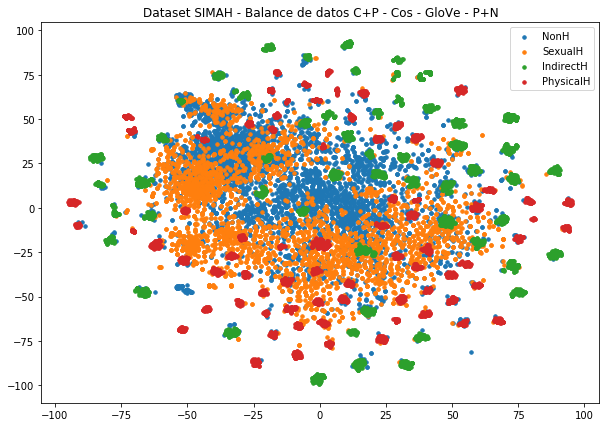

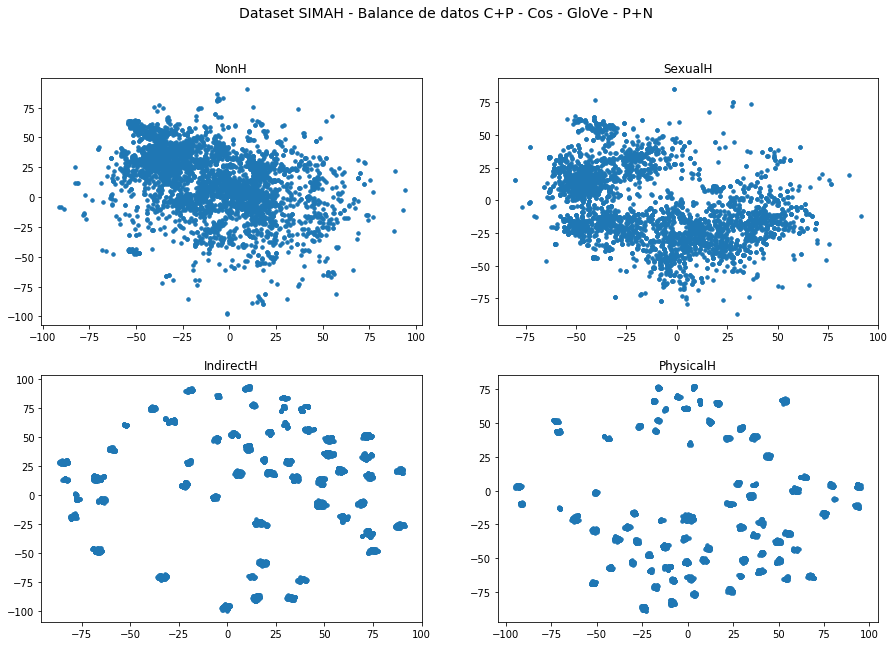

In [47]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_cppn)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos C+P - Cos - GloVe - P+N")
plt.show()

fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))
        

fig.suptitle("Dataset SIMAH - Balance de datos C+P - Cos - GloVe - P+N", fontsize=14)
plt.show()

### Sujeto a Embedding BERT sin ponderación target

Reemplazos en torno al vocabulario del embedding retorna reemplazos malo con un simple analisis lexico. Incluso cambia idiomas, español, portugues, arabe, chino 

In [31]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, EMBED=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: nudes  	Reemplazo:  [('whores', 1.0913452494758367)]
Sentencia original:
['rt' 'celesteneal16' 'omg' 'i' 'bet' 'you' 'never' 'seen' 'such' 'savage'
 'bitches' 'before' 'click' 'here' 'whore' 'sex' 'nudes']
Sentencia final: 3
['rt', 'celesteneal16', 'omg', 'i', 'bet', 'you', 'never', 'seen', 'such', 'savage', 'bitches', 'before', 'click', 'here', 'whore', 'sex', 'whores']


Original: are  	Reemplazo:  [("'re", 0.7293949317608583)]
Original: fuck  	Reemplazo:  [('lol', 0.5123200478813772)]
Original: dm  	Reemplazo:  [('shit', 0.29797123444056783)]
Original: amp  	Reemplazo:  [('معى', 1.019641537588644)]
Sentencia original:
['if' 'are' 'you' 'dait' 'rt' 'for' 'fuck' 'amp' 'dm' 'for' 'blowjob'
 'retweet' 'amp' 'like' 'to' 'see' 'more' 'full' 'videos']
Sentencia final: 3
['if', "'re", 'you', 'dait', 'rt', 'for', 'lol', 'amp', 'shit', 'for', 'blowjob', 'retweet', 'معى', 'like', 'to', 'see', 'more', 'full', 'videos']


Original: pussy  	Reempla

Original: patricia  	Reemplazo:  [('omg', 0.37747221601752523)]
Sentencia original:
['starting' 'patricia' 'more' 'hahahahahahahahahaha' 'she' 's' 'honest'
 'sassy' 'bitch']
Sentencia final: 3
['starting', 'omg', 'more', 'hahahahahahahahahaha', 'she', 's', 'honest', 'sassy', 'bitch']


Original: jiho  	Reemplazo:  [('everytime', 0.3379514292568104)]
Sentencia original:
['jiho' 'whenever' 'sleeps' 'she' 's' 'called' 'slut' 'whenever' 'gay'
 'double' 'standards' 'much']
Sentencia final: 3
['everytime', 'whenever', 'sleeps', 'she', 's', 'called', 'slut', 'whenever', 'gay', 'double', 'standards', 'much']


Original: fucking  	Reemplazo:  [('freaking', 1.0593728606097548)]
Sentencia original:
['rt' 'veggiefact' 'thats' 'it' 'bitch' 'im' 'fucking' 'coming' 'for'
 'you']
Sentencia final: 3
['rt', 'veggiefact', 'thats', 'it', 'bitch', 'im', 'freaking', 'coming', 'for', 'you']


Original: stars  	Reemplazo:  [('tits', 0.22781561460825367)]
Sentencia original:
['british' 'pussy' 'cumshot' 'india

Original: shut  	Reemplazo:  [('fuck', 0.8072766927205753)]
Sentencia original:
['goldenjorgeyy' 'shut' 'up' 'bitch' 'don' 't' 'call' 'me' 'out' 'like'
 'that']
Sentencia final: 3
['goldenjorgeyy', 'fuck', 'up', 'bitch', 'don', 't', 'call', 'me', 'out', 'like', 'that']


Original: sassy  	Reemplazo:  [('يقُولون', 1.1866710136942442)]
Original: bitch  	Reemplazo:  [('confidence', 1.2885019971743448)]
Original: co  	Reemplazo:  [('nh', 1.517769111691188)]
Sentencia original:
['louis' 'sassy' 'bitch' 'power' 'esteem' 'simple' 'comment' 'softest' 's'
 'x89' 't' 'co' 'n6aehhwilb']
Sentencia final: 3
['louis', 'يقُولون', 'confidence', 'power', 'esteem', 'simple', 'comment', 'softest', 's', 'x89', 't', 'nh', 'n6aehhwilb']


Original: butt  	Reemplazo:  [('oftenti', 0.5433121781355736)]
Original: wished  	Reemplazo:  [('fucked', 0.26406480237003827)]
Original: curvy  	Reemplazo:  [('girl', 0.2653173729948291)]
Sentencia original:
['gawd' 'wonderful' 'waist' 'wonderful' 'round' 'butt' 'wished' 

Original: chat  	Reemplazo:  [('fb', 0.6529015168750607)]
Original: wet  	Reemplazo:  [('pussy', 0.8338156180073795)]
Sentencia original:
['rt' 'michalak' 'n' 'here' 'u' 'can' 'chat' 'with' 'hot' 'girls' 'from'
 'your' 'city' 'nipslip' 'bigboobs' 'horny' 'slut' 'ass' 'wet' 'yesdaddy']
Sentencia final: 3
['rt', 'michalak', 'n', 'here', 'u', 'can', 'fb', 'with', 'hot', 'girls', 'from', 'your', 'city', 'nipslip', 'bigboobs', 'horny', 'slut', 'ass', 'pussy', 'yesdaddy']


Original: twitter  	Reemplazo:  [('عفوي', 4.232792087613297)]
Original: killed  	Reemplazo:  [('revined', 3.672528140493552)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'because' 'i' 'thrive' 'on' 'twitter' 'but'
 'they' 'killed' 'vine']
Sentencia final: 3
['i', 'feel', 'like', 'a', 'slut', 'because', 'i', 'thrive', 'on', 'عفوي', 'but', 'they', 'revined', 'vine']


Original: nigga  	Reemplazo:  [('niggas', 1.0155367726071398)]
Original: bitch  	Reemplazo:  [('dumb', 2.4246217154077687)]
Original: fucker  	Reemplazo

Original: sex  	Reemplazo:  [('world', 0.6523348434647461)]
Sentencia original:
['bunny' 'ladys' 'suck' 'videos' 'slut' 'stretched' 'asian' 'xxx' 'anal'
 'busty' 'tits' 'video' 'ava' 'livejasmin' 'arab' 'stranger' 'sex' 'video'
 'hd' 'cr']
Sentencia final: 3
['bunny', 'ladys', 'suck', 'videos', 'slut', 'stretched', 'asian', 'xxx', 'anal', 'busty', 'tits', 'video', 'ava', 'livejasmin', 'arab', 'stranger', 'world', 'video', 'hd', 'cr']


Original: store  	Reemplazo:  [('قلما', 2.701381299325208)]
Sentencia original:
['i' 'am' 'fucking' 'slut' 'for' 'grocery' 'store' 'dip' 'samples']
Sentencia final: 3
['i', 'am', 'fucking', 'slut', 'for', 'grocery', 'قلما', 'dip', 'samples']


Original: jake  	Reemplazo:  [('tyler', 0.20331845790192657)]
Original: liter  	Reemplazo:  [('max', 0.3714353074937536)]
Sentencia original:
['i' 'x89' 've' 'hardly' 'tweets' 'x89' 'slut' 'shaming' 'x89' 'x9d'
 'alissa' 'violet' 'towards' 'shane' 'jake' 'shane' 'liter' 'x89' 't' 'co'
 'svtccc4bzs']
Sentencia final

Original: perfect  	Reemplazo:  [('俺様', 5.455987873418851)]
Original: dino  	Reemplazo:  [('day', 0.527611484420886)]
Original: yo  	Reemplazo:  [('niggas', 0.7264080313862491)]
Sentencia original:
['ari' 'the' 'perfect' 'example' 'of' 'a' 'slut' 'you' 'hoes' 'go' 'to'
 'a' 'new' 'dino' 'in' 'a' 'matter' 'of' 'months' 'n' 'still' 'try' 'to'
 'fw' 'yo' 'ex' 'on' 'top' 'o']
Sentencia final: 3
['ari', 'the', '俺様', 'example', 'of', 'a', 'slut', 'you', 'hoes', 'go', 'to', 'a', 'new', 'day', 'in', 'a', 'matter', 'of', 'months', 'n', 'still', 'try', 'to', 'fw', 'niggas', 'ex', 'on', 'top', 'o']


Original: right  	Reemplazo:  [('なんかいいなと思ったらrt', 0.9438196413663907)]
Original: co  	Reemplazo:  [('bo', 0.8312708337146514)]
Sentencia original:
['christopher' 'bitch' 'sassy' 'photographer' 'right' 'there' 't' 'co'
 'kw7ntd7y7o']
Sentencia final: 3
['christopher', 'bitch', 'sassy', 'photographer', 'なんかいいなと思ったらrt', 'there', 't', 'bo', 'kw7ntd7y7o']


Original: ava  	Reemplazo:  [('fto', 1.0565871934

Original: slut  	Reemplazo:  [('någon', 1.819487821398855)]
Sentencia original:
['rt' 'emmagbeauchamp' 'stop' 'being' 'a' 'man' 'slut']
Sentencia final: 3
['rt', 'emmagbeauchamp', 'stop', 'being', 'a', 'man', 'någon']


Original: myrrh  	Reemplazo:  [('thought', 0.2661870726002483)]
Original: clown  	Reemplazo:  [('bitch', 0.4752004872265412)]
Sentencia original:
['x89' 'if' 'could' 'words' 'describe' 'with' 'yours' 'would' 'bitch'
 'genius' 'myrrh' 'yours' 'would' 'clown' 'slut' 'x89' 'x9d']
Sentencia final: 3
['x89', 'if', 'could', 'words', 'describe', 'with', 'yours', 'would', 'bitch', 'genius', 'thought', 'yours', 'would', 'bitch', 'slut', 'x89', 'x9d']


Original: screen  	Reemplazo:  [('phone', 0.629584977591754)]
Original: job  	Reemplazo:  [('buitendienst', 4.142417964652756)]
Sentencia original:
['rt' 'computer' 'screen' 'im' 'a' 'whore' 'for' 'my' 'job' 'a' 'big'
 'slut' 'for' 'it' 'i' 'love' 'it' 'and' 'i' 'love' 'getting' 'fucked'
 'by' 'my' 'trabajo' 'shes' 'sucha' 'bitch'

Original: rt  	Reemplazo:  [('<user>', 0.921497171851058)]
Original: note  	Reemplazo:  [('iphone', 0.8072529400094514)]
Original: slut  	Reemplazo:  [('rika', 1.6394624469739685)]
Sentencia original:
['rt' 'tiapogai51' 'very' 'cute' 'pussy' 'while' 'it' 's' 'so' 'wed'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'
 'slut']
Sentencia final: 3
['<user>', 'tiapogai51', 'very', 'cute', 'pussy', 'while', 'it', 's', 'so', 'wed', 'then', 'sign', 'up', 'iphone', 'verify', 'email', 'to', 'send', 'msg', 'to', 'girls', 'rika']


Original: whore  	Reemplazo:  [('fuck', 0.6314178180733615)]
Sentencia original:
['curved' 'you' 're' 'whore' 'bitch' 'anyway' 't' 'co' 'itrfz14vof']
Sentencia final: 3
['curved', 'you', 're', 'fuck', 'bitch', 'anyway', 't', 'co', 'itrfz14vof']


Original: drunk  	Reemplazo:  [('fuck', 0.4342038915635542)]
Sentencia original:
['virgin' 'extreme' 'mature' 'swingers' 'black' 'lesbians' 'drunk'
 'punish' 'mature' 'orgasm' 'movies' 'r' 'x89' 't' '

Original: slut  	Reemplazo:  [('gekruld', 1.8238566428509595)]
Original: girl  	Reemplazo:  [('成功召唤了', 1.7373984817210886)]
Sentencia original:
['tina' 'ran' 'her' 'attention' 'on' 'the' 'slut' 'is' 'she' 'had' 'only'
 'took' 'care' 'of' 'the' 'girl' 'up' 'his' 'dick' 'out' 'a' 'wide'
 'again' 'and' 'down' 'at' 'it']
Sentencia final: 3
['tina', 'ran', 'her', 'attention', 'on', 'the', 'gekruld', 'is', 'she', 'had', 'only', 'took', 'care', 'of', 'the', '成功召唤了', 'up', 'his', 'dick', 'out', 'a', 'wide', 'again', 'and', 'down', 'at', 'it']


Original: register  	Reemplazo:  [('check', 0.36899704496697977)]
Original: video  	Reemplazo:  [('robed', 0.8663508856121612)]
Sentencia original:
['cum' 'with' 'me' 'daily' 'for' 'free' 'register' 'on' 'bellow' 'video'
 'for' 'get' 'webcam' 'nude' 'real' 'girl' 'note' 'verify' 'email']
Sentencia final: 3
['cum', 'with', 'me', 'daily', 'for', 'free', 'check', 'on', 'bellow', 'robed', 'for', 'get', 'webcam', 'nude', 'real', 'girl', 'note', 'verify', 'em

Original: gap  	Reemplazo:  [('difference', 0.3810889308944823)]
Sentencia original:
['men' 'only' 'want' 'equal' 'rights' 'when' 'it' 'comes' 'to' 'being'
 'able' 'to' 'hit' 'girls' 'back' 'but' 'bring' 'up' 'the' 'wage' 'gap'
 'or' 'slut' 'shaming' 'and' 'they' 'go' 'quiet']
Sentencia final: 3
['men', 'only', 'think', 'equal', 'rights', 'when', 'it', 'comes', 'to', 'being', 'able', 'to', 'hit', 'sluts', 'back', 'but', 'bring', 'up', 'the', 'cost', 'difference', 'or', 'slut', 'shaming', 'and', 'they', 'go', 'quiet']


Original: cute  	Reemplazo:  [('التشريح', 2.7928190310351653)]
Original: glasses  	Reemplazo:  [('pornstars', 2.687990803690384)]
Original: tits  	Reemplazo:  [('clips', 0.4740128373922778)]
Sentencia original:
['cute' 'glasses' 'porn' 'cumshot' 'tits' 't' 'co' 'wdas8di6zg']
Sentencia final: 3
['التشريح', 'pornstars', 'porn', 'cumshot', 'clips', 't', 'co', 'wdas8di6zg']


Original: re  	Reemplazo:  [('trola', 1.0216282806602235)]
Original: whore  	Reemplazo:  [('كحال', 2

Original: girl  	Reemplazo:  [('fuck', 1.3685372267959413)]
Sentencia original:
['college' 'girl' 'anal' 'tinakleosexy' 'i' 'can' 'make' 'you' 'forget'
 'the' 'monotony' 'in' 'your' 'life' 'and' 'loose' 'track' 'of' 'time'
 'here' 'with' 'm']
Sentencia final: 3
['college', 'fuck', 'anal', 'tinakleosexy', 'i', 'can', 'make', 'you', 'forget', 'the', 'monotony', 'in', 'your', 'life', 'and', 'loose', 'track', 'of', 'time', 'here', 'with', 'm']


Original: smell  	Reemplazo:  [('soup', 1.2256668779236144)]
Sentencia original:
['i' 'x89' 'm' 'slut' 'smell' 'leftover' 'chinese' 'microwave' 'level'
 'orgasmic' 'shit']
Sentencia final: 3
['i', 'x89', 'm', 'slut', 'soup', 'leftover', 'chinese', 'microwave', 'level', 'orgasmic', 'shit']


Original: go  	Reemplazo:  [('let', 1.136030425045424)]
Original: week  	Reemplazo:  [('weekend', 1.9213204943222975)]
Original: love  	Reemplazo:  [('miss', 1.001820147775801)]
Sentencia original:
['rt' 'oiaooy' 'hell' 'yea' 'bitch' 'dis' 'go' 'hard' 'as' 'hell

Original: rt  	Reemplazo:  [('これ絶対本当の盗撮でしょこれ', 1.4825433075167198)]
Original: panties  	Reemplazo:  [('beautifulwomen', 2.6213431241281167)]
Original: snapchat  	Reemplazo:  [('porn', 0.5540892144243744)]
Original: camgirl  	Reemplazo:  [('porn', 0.2703581129145799)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['これ絶対本当の盗撮でしょこれ', 'for', 'more', 'videos', 'like', 'this', 'amateurporn', 'beautifulwomen', 'cock', 'teen', 'nsfw', 'webcam', 'porn', 'porn', 'slut', 'paypalwhore', 'fuck', 'me']


Original: deserves  	Reemplazo:  [('noes', 0.5549240897243475)]
Original: horr  	Reemplazo:  [('cause', 0.19127303361401501)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['put', 'picture', 'lying', 'death', 'fucking', 'wrong', 'noes', 'grave', 'cause', 'x8

Original: dirty  	Reemplazo:  [('lx', 1.0427008925233545)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'lx', 'disgusting', 'sl']


Original: ready  	Reemplazo:  [('over-hyped', 3.9096252166642422)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'over-hyped', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'homework', 'bitch', 'you', 'got', 'school', 'tomorrow']


Original: bit  	Reemplazo:  [('ถ้าคุณเป็นคนไทยโปรดรีทวิต', 9.022747317743672)]
Original: nobody  	Reemplazo:  [('aflojarle', 0.8878998438690817)]
Sentencia original:
['personal' '

Original: behave  	Reemplazo:  [('mommy', 0.594916199910959)]
Original: baby  	Reemplazo:  [('mommy', 0.5144000468425304)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'daddy', 'mommy', 'mommy', 'daddy', 'tight', 'open', 'yeah', 'little', 'x89']


Original: jax  	Reemplazo:  [('scum', 2.332860347909609)]
Original: james  	Reemplazo:  [('protagonistes', 7.883705345960536)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'girls', 'at', 'least', 'scum', 'just', 'fucks', 'over', 'his', 'partners', 'protagonistes']


Original: spawn  	Reemplazo:  [('demon', 0.790615984189505)]
Original: looking  	Reemplazo:  [('walking', 1.5288138424923547)]
Original: snap  	Reemplazo:  [('

Original: rt  	Reemplazo:  [('<user>', 2.2579123650632233)]
Original: date  	Reemplazo:  [('mommy', 0.38298425553467846)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', '<user>', 'for', 'more', 'horny', 'single', 'girls', 'amateur', 'bbc', 'booty', 'cock', 'cumslut', 'daddy', 'mommy', 'dati']


Original: dream  	Reemplazo:  [('wett', 0.8164084269127869)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'wett', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: ammara  	Reemplazo:  [('って言われると気持ちが軽くなる', 2.6944537075370905)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammar

Original: co  	Reemplazo:  [('co.', 0.5467106754636606)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'loses', 'everything', 'after', 'devastating', 'emmerdale', 'trial', 'twist', 't', 'co.', 'ovnydoove3', 'metrouk']


Original: porn  	Reemplazo:  [('life', 1.7305513455550436)]
Original: hot  	Reemplazo:  [('naked', 0.39206215203981215)]
Original: black  	Reemplazo:  [('bad', 1.2746766862410133)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'teen', 'life', 'first', 'time', 'naked', 'sexey', 'woman', 'downloadfree', 'porn', 'movies', 'creampire', 'girl', 'guys', 'with', 'abs', 'having', 'sex', 'bad', 'se']


Original: hear  	Reemplazo:  [('damn', 0.9979854800744699)]
Original: moron  	Reemplazo:  [('pedo', 

Original: anna  	Reemplazo:  [('tal', 1.5003613636283222)]
Original: seems  	Reemplazo:  [('does', 0.43959187167226954)]
Original: slut  	Reemplazo:  [('night', 1.06965197580561)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'tal', 'kendrick', 'does', 'like', 'that', 'cute', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'night', 'in', 'bed']


Original: slut  	Reemplazo:  [('teagan', 2.7446122610841406)]
Original: wet  	Reemplazo:  [('لـنــاn', 6.237546272481375)]
Original: camgirl  	Reemplazo:  [('porn', 0.5302671777867413)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'teagan', 'crissy', 'will', 'give', 'you', 'a', 'لـنــاn', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 

Original: camgirl  	Reemplazo:  [('تگرھّ', 1.1285443168431808)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'videos', 'like', 'this', 'amateurporn', 'panties', 'cock', 'teen', 'nsfw', 'webcam', 'snapchat', 'تگرھّ', 'slut', 'paypalwhore', 'fuck', 'me']


Original: slut  	Reemplazo:  [('bitch', 0.9311187144872688)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'number', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'bitch']


Original: everything  	Reemplazo:  [('المنظمين', 1.278620198604701)]
Original: co  	Reemplazo:  [('robi', 0.8613107934557309)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'loses', 'المنظمين', 'aft

Original: innocent  	Reemplazo:  [('chubby', 1.1661081332286338)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'chubby', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'slut', 'in', 'bed']


Original: beat  	Reemplazo:  [('play', 1.2502800026575493)]
Original: ion  	Reemplazo:  [('고록', 1.7032779741929198)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'go', 'play', 'up', 'your', 'ex', '고록', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: slut  	Reemplazo:  [('fuck', 1.0824239377441043)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['fuckin

Original: death  	Reemplazo:  [('hearing', 0.8132438731637129)]
Original: bitching  	Reemplazo:  [('tadarus', 3.186648789955425)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'hearing', 'threats', 'are', 'you', 'still', 'tadarus', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', 'mad']


Original: ava  	Reemplazo:  [('pic', 0.569702339457361)]
Original: fat  	Reemplazo:  [('امتها', 2.458498279059991)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'pic', 'just', 'took', 'a', 'امتها', 'ass', 'nap']


Original: little  	Reemplazo:  [("l'international", 2.969688342985735)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'daddy', 'behave'

Original: girl  	Reemplazo:  [('woman', 0.883652284443827)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'slut', 'بسفينه', 'a', 'woman', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'did']


Original: bases  	Reemplazo:  [('balls', 0.36854010581486946)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'chopped', 'throat', 'across', 'balls', 'i', 'x89', 'd', 'letthekidsplay']


Original: shot  	Reemplazo:  [('scene', 0.8968385553396846)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 

Original: cock  	Reemplazo:  [('<ur', 1.4237505991594377)]
Original: daddy  	Reemplazo:  [('milf', 0.35396944191725815)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', 'rt', 'for', 'more', 'horny', 'single', 'girls', 'amateur', 'bbc', 'booty', '<ur', 'cumslut', 'milf', 'date', 'dati']


Original: picture  	Reemplazo:  [('end', 1.2663916611234378)]
Original: death  	Reemplazo:  [('thing', 1.1403224162727255)]
Original: grave  	Reemplazo:  [('тайных', 1.0406926239522367)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['put', 'end', 'lying', 'thing', 'fucking', 'wrong', 'deserves', 'тайных', 'horr', 'x89', 't', 'co', 'k0efk8av4o']


Original: want  	Reemplazo:  [('think', 0.6173789988446289)]
Original: punch  	Reemplazo:  

Original: stemmed  	Reemplazo:  [('rebounded', 0.6743917984223265)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'named', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'lot', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'rebounded', 'from', 'the', 'snl', 'phrase', 'j']


Original: major  	Reemplazo:  [('cannibalistic', 0.252828807827307)]
Original: ammara  	Reemplazo:  [('sensationalism', 0.5550047409409317)]
Original: media  	Reemplazo:  [('aalten', 2.09822101555401)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'cannibalistic', 'sensationalism', 'aalten', 'is', 'x89']


Original: judgement  	Reemplazo:  [(

Original: ve  	Reemplazo:  [('love', 0.49586028836132756)]
Original: missing  	Reemplazo:  [('pembanding', 1.7696523106723459)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'having', 'a', 'prom', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 'love', 'been', 'pembanding', 'my', 'da']


Original: girls  	Reemplazo:  [('boys', 2.6797760068341105)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'wonder', 'boys', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: girls  	Re

Original: sassy  	Reemplazo:  [('ถ้าคุณเป็นคนไทยโปรดรีทวิต', 35.2957835824417)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'ถ้าคุณเป็นคนไทยโปรดรีทวิต', 'njeri', 'should', 'identify', 'nigga', 'pregnant']


Original: human  	Reemplazo:  [('نسألك', 4.118594259262868)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'girls', 'were', 'نسألك', 'enough', 'to', 'not', 'laugh', 'and', 'enjoy', 'when', 'their', 'pakistani']


Original: rapper  	Reemplazo:  [('نابلس', 0.9467596075245188)]
Original: touch  	Reemplazo:  [('الآيَتَيْنِ', 2.3077072048043794)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'نابلس', 'bra

Original: freedom  	Reemplazo:  [('woman', 0.5315418557290938)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'based', 'ending', 'culture', 'shaming', 'advocating', 'women', 'woman', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: lot  	Reemplazo:  [('alot', 1.4633871371787606)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'named', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'alot', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'phrase', 'j']


Original: asked  	Reemplazo:  [('tried', 0.8626433314763167)]
Original: said  	Reemplazo:  [('did', 1.5722754021303171)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 

Original: slut  	Reemplazo:  [('tell', 0.9768002625600483)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'did', 'weird', 'ok', 'then', 'dont', 'ask', 'tell']


Original: was  	Reemplazo:  [('fell', 0.817784372975508)]
Original: said  	Reemplazo:  [('replied', 2.0850942823081233)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'fell', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'replied', 'weird', 'ok', 'then', 'dont', 'ask', 'slut']


Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 

Original: england  	Reemplazo:  [('افقدك', 7.365955176946294)]
Original: proud  	Reemplazo:  [('racist', 0.5421464381024872)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'anti-white', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'افقدك', 'this', 'bigot', 'racist']


Original: smashing  	Reemplazo:  [('talking', 1.444439969546096)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'start', 'talking', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'start', 'slut', 'shaming']


Original: fucking  	Reemplazo:  [('ki

Original: tighter  	Reemplazo:  [('tight', 0.2739980186317599)]
Original: touch  	Reemplazo:  [('armpit', 0.8052884592764834)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'tight', 'pussy', 'would', 'armpit', 'pubic', 'hairs', 't', 'x89']


Original: bad  	Reemplazo:  [('negative', 1.6884500696016065)]
Original: part  	Reemplazo:  [('thing', 0.4312764314511479)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'negative', 'behavior', 'on', 'a', 'mans', 'thing', 'is', 'unacceptable', 'the', 'logic', 'is', 'so', 'faulty', 'a', 'number', 'yr', 'old', 'girl']


Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who

Original: njeri  	Reemplazo:  [('described', 0.2755597570744724)]
Original: nigga  	Reemplazo:  [('woman', 0.677253093905044)]
Original: pregnant  	Reemplazo:  [('female', 0.5468006896663455)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'described', 'should', 'identify', 'woman', 'female']


Original: gorgeous  	Reemplazo:  [('uitpraten', 1.712392174940205)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'uitpraten', 'girl']


Original: thing  	Reemplazo:  [('cm', 3.218428465452128)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'work', 'in', 'the', 'dining', 'hall', 'are', 'all', 'sitting', 'here', 'talking', 'shit', 'ab

Original: katie  	Reemplazo:  [('barbie', 1.6639099499620529)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'barbie', 'is', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'gets', 'married', 'and', 'forgets', 'two', 'years', 'ago', 'she', 'wa']


Original: relate  	Reemplazo:  [('cant', 0.7245630469492432)]
Original: different  	Reemplazo:  [('same', 0.5346062018815154)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'cant', 'girls', 'shame', 'same', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: ve  	Reemplazo:  [('mi', 0.9123841541518921)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia

Original: sad  	Reemplazo:  [('lol', 0.5194613277061947)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'lol', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 'comfort']


Original: girls  	Reemplazo:  [('civilians', 1.6229929782033083)]
Original: laugh  	Reemplazo:  [('komunikasikan', 1.7516933594239612)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'civilians', 'were', 'human', 'enough', 'to', 'not', 'komunikasikan', 'and', 'enjoy', 'when', 'their', 'pakistani'

In [ ]:
data_bas_b=[]
macro_augmented=np.asarray(macro_augmented)
#macro_augmented= np.load('../Datasets/CSV_Harassment/balance_bert_noPon.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_b.append(vector)

In [ ]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_b)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos B - Cos - GloVe")
plt.show()

In [ ]:
fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))
        

fig.suptitle("Dataset SIMAH - Balance de datos B - Cos - GloVe", fontsize=14)
plt.show()

In [32]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_bert_noPon_GloVe_pos.npy', macro_augmented)
    

In [33]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, EMBED=True, Neg=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: shows  	Reemplazo:  [('bathes', 3.689481387702066)]
Original: boyfriend  	Reemplazo:  [('独裁主義', 2.2894036089577443)]
Sentencia original:
['she' 'shows' 'her' 'pussy' 'on' 'camera' 'to' 'her' 'boyfriend' 'help'
 'him' 'self' 'cum' 'gt' 'register' 'all' 'for' 'free' 'not']
Sentencia final: 3
['she', 'bathes', 'her', 'pussy', 'on', 'camera', 'to', 'her', '独裁主義', 'help', 'him', 'self', 'cum', 'gt', 'register', 'all', 'for', 'free', 'not']


Original: bitch  	Reemplazo:  [('celebrity', 0.8487718840177757)]
Sentencia original:
['christopher' 'bitch' 'sassy' 'photographer' 'right' 'there' 't' 'co'
 'kw7ntd7y7o']
Sentencia final: 3
['christopher', 'celebrity', 'sassy', 'photographer', 'right', 'there', 't', 'co', 'kw7ntd7y7o']


Original: section  	Reemplazo:  [('evaluation', 1.1426172007018491)]
Sentencia original:
['this' 'bitch' 'taking' 'off' 'work' 'for' 'her' 'annual' 'section'
 'number' 'review' 'like' 'i' 'need' 'section' 'number' 'amp' 

Original: hey  	Reemplazo:  [('bitch', 1.3203605753824628)]
Original: be  	Reemplazo:  [('kaget', 1.396261752734774)]
Original: kpop  	Reemplazo:  [('giveaway', 1.256712508125617)]
Original: be  	Reemplazo:  [('go', 0.7055014405314334)]
Original: dont  	Reemplazo:  [('stop', 1.2029081461218651)]
Sentencia original:
['hey' 'bitches' 'rt' 'to' 'be' 'in' 'a' 'kpop' 'gc' 'be' 'a' 'bad'
 'bitch' 'dont' 'be' 'problematic' 'dont' 'be' 'sensitive' 'tbz' 'skz'
 'and' 'nct' 'stan']
Sentencia final: 3
['bitch', 'bitches', 'rt', 'to', 'kaget', 'in', 'a', 'giveaway', 'gc', 'go', 'a', 'bad', 'bitch', 'stop', 'be', 'problematic', 'dont', 'be', 'sensitive', 'tbz', 'skz', 'and', 'nct', 'stan']


Original: porn  	Reemplazo:  [('caila', 2.1240590834621105)]
Sentencia original:
['porn' 'sister' 'deepthroat' 'cumshot' 'machine' 'massage' 'parlor' 't'
 'co' 'hjwsjkwavn']
Sentencia final: 3
['caila', 'sister', 'deepthroat', 'cumshot', 'machine', 'massage', 'parlor', 't', 'co', 'hjwsjkwavn']


Original: did  

Original: human  	Reemplazo:  [('sex', 0.2781856231664693)]
Original: dog  	Reemplazo:  [('sex', 0.23101233974585908)]
Sentencia original:
['stud' 'fingers' 'amp' 'fucks' 'human' 'bdsm' 'dog' 'slut' 'valentina'
 'blue' 'through' 'muzzle']
Sentencia final: 3
['stud', 'fingers', 'amp', 'fucks', 'sex', 'bdsm', 'sex', 'slut', 'valentina', 'blue', 'through', 'muzzle']


Original: slut  	Reemplazo:  [('slag', 1.3771255250334897)]
Sentencia original:
['me' 'amp' 'maisiegarcia10' 'passing' 'each' 'other' 'in' 'the' 'halls'
 'me' 'dumb' 'bitch' 'maisie' 'stupid' 'slut' 'and' 'we' 'literally' 'don']
Sentencia final: 3
['me', 'amp', 'maisiegarcia10', 'passing', 'each', 'other', 'in', 'the', 'halls', 'me', 'dumb', 'bitch', 'maisie', 'stupid', 'slag', 'and', 'we', 'literally', 'don']


Original: fucking  	Reemplazo:  [('fcking', 1.5354389296287096)]
Sentencia original:
['first' 'is' 'annie' 'anastasia' 'ur' 'a' 'fucking' 'bitch' 'and' 'let'
 'me' 'tell' 'u' 'why' 'tw' 'so' 'i' 'was' 'dating' 'u' 'u

Original: number  	Reemplazo:  [('person', 0.3470034368597362)]
Sentencia original:
['wow' 'being' 'heckled' 'sexual' 'manner' 'number' 'number' 'running'
 'ow' 'x89' 't' 'co' '5p30iiadyy']
Sentencia final: 3
['wow', 'being', 'heckled', 'sexual', 'manner', 'person', 'number', 'running', 'ow', 'x89', 't', 'co', '5p30iiadyy']


Original: crackhead  	Reemplazo:  [('jgtseuyt', 2.860715900690269)]
Sentencia original:
['dxnniiss' 'iucidangel' 'bitch' 'whore' 'prostitute' 'crackhead' 'hooker'
 'hoe']
Sentencia final: 3
['dxnniiss', 'iucidangel', 'bitch', 'whore', 'prostitute', 'jgtseuyt', 'hooker', 'hoe']


Original: pussy  	Reemplazo:  [('busty', 1.995213361961072)]
Sentencia original:
['ebony' 'letting' 'pussy' 'after' 'hornyruscom' 'n' 't' 'co' 'oakraxe69i'
 'stoya' 'porn' 'x89' 't' 'co' 'm5u0kj23ty']
Sentencia final: 3
['ebony', 'letting', 'busty', 'after', 'hornyruscom', 'n', 't', 'co', 'oakraxe69i', 'stoya', 'porn', 'x89', 't', 'co', 'm5u0kj23ty']


Original: shaming  	Reemplazo:  [('li

Original: bdsm  	Reemplazo:  [('rpg', 1.2028603308966594)]
Original: marijuana  	Reemplazo:  [('porn', 0.3278553272199438)]
Sentencia original:
['bdsm' 'hardcore' 'action' 'with' 'ropes' 'and' 'sex' 'horny' 'marijuana'
 'nsfw' 'nude' 'nudes' 'nudetrade' 'sange']
Sentencia final: 3
['rpg', 'hardcore', 'action', 'with', 'ropes', 'and', 'sex', 'horny', 'porn', 'nsfw', 'nude', 'nudes', 'nudetrade', 'sange']


Original: eating  	Reemplazo:  [('rolling', 0.5571100553053192)]
Original: squirting  	Reemplazo:  [('dripping', 1.301995592024413)]
Sentencia original:
['gloryhole' 'cumshot' 'office' 'blowjob' 'eating' 'pussy' 'black'
 'squirting' 'dutch' 'deept' 'x89' 't' 'co' 'jqncdvc1hz']
Sentencia final: 3
['gloryhole', 'cumshot', 'office', 'blowjob', 'rolling', 'pussy', 'black', 'dripping', 'dutch', 'deept', 'x89', 't', 'co', 'jqncdvc1hz']


Original: facial  	Reemplazo:  [('anal', 1.0214961636264257)]
Sentencia original:
['sex' 'massage' 'video' 'drunk' 'cumshot' 'naked' 'workout' 'female'
 'i

Original: hit  	Reemplazo:  [('hoopin', 2.1571964855447563)]
Sentencia original:
['number' 'number' 'billion' 'american' 'dollars' 'bruh' 'just' 'hit'
 'the' 'club' 'amp' 'pop' 'some' 'bottles' 'some' 'slut' 'will' 'be' 'all'
 'up' 'on' 'your' 'rich' 'o']
Sentencia final: 3
['number', 'number', 'billion', 'american', 'dollars', 'bruh', 'just', 'hoopin', 'the', 'club', 'amp', 'pop', 'some', 'bottles', 'some', 'slut', 'will', 'be', 'all', 'up', 'on', 'your', 'rich', 'o']


Original: porn  	Reemplazo:  [('nsfw', 0.7533395535599111)]
Sentencia original:
['rt' 'amberca10937197' 'wanna' 'meet' 'a' 'really' 'sexy' 'bitch' 'for'
 'a' 'good' 'evening' 'free' 'signup' 'porn' 'dick' 'webca']
Sentencia final: 3
['rt', 'amberca10937197', 'wanna', 'meet', 'a', 'really', 'sexy', 'bitch', 'for', 'a', 'good', 'evening', 'free', 'signup', 'nsfw', 'dick', 'webca']


Original: teen  	Reemplazo:  [('tabu', 1.4733217783130772)]
Original: porn  	Reemplazo:  [('whore', 0.7635152536124071)]
Sentencia original:

Original: latin  	Reemplazo:  [('origen', 4.617178165537411)]
Sentencia original:
['latin' 'young' 'porno' 'blowjob' 'cartoon' 'hidden' 'camera' 'nipple'
 'sucking' 'x89' 't' 'co' 'sppbpklvwq']
Sentencia final: 3
['origen', 'young', 'porno', 'blowjob', 'cartoon', 'hidden', 'camera', 'nipple', 'sucking', 'x89', 't', 'co', 'sppbpklvwq']


Original: mandy  	Reemplazo:  [('tammy', 0.2831663519211557)]
Original: bangs  	Reemplazo:  [('fruitcakes', 1.8339798845176187)]
Original: plumbers  	Reemplazo:  [('looks', 0.10570365954865278)]
Sentencia original:
['mandy' 'bangs' 'plumbers' 'angles' 'n' 't' 'co' 'h81ed76esw'
 'searchanalporn' 'danish' 'cumshot' 'x89' 't' 'co' 'nw4ckau1s6']
Sentencia final: 3
['tammy', 'fruitcakes', 'looks', 'angles', 'n', 't', 'co', 'h81ed76esw', 'searchanalporn', 'danish', 'cumshot', 'x89', 't', 'co', 'nw4ckau1s6']


Original: oxygen  	Reemplazo:  [('need', 0.4692892922697112)]
Original: fucking  	Reemplazo:  [('saying', 0.5055166734849239)]
Sentencia original:
['why

Original: slut  	Reemplazo:  [('fotofer', 2.008132217999654)]
Sentencia original:
['jesysmycure' 'no' 'i' 'pete' 'davidson' 'is' 'just' 'a' 'slut' 'in'
 'general' 'sksk']
Sentencia final: 3
['jesysmycure', 'no', 'i', 'pete', 'davidson', 'is', 'just', 'a', 'fotofer', 'in', 'general', 'sksk']


Original: husband  	Reemplazo:  [('wife', 0.7449121180385078)]
Sentencia original:
['rt' 'sofealalli' 'u' 'r' 'a' 'complete' 'slut' 'y' 'don' 't' 'u' 'keep'
 'ur' 'body' 'for' 'ur' 'husband' 'only' 'lmao' 'bitch' 'i' 'am' 'the'
 'husband']
Sentencia final: 3
['rt', 'sofealalli', 'u', 'r', 'a', 'complete', 'slut', 'y', 'don', 't', 'u', 'keep', 'ur', 'body', 'for', 'ur', 'wife', 'only', 'lmao', 'bitch', 'i', 'am', 'the', 'husband']


Original: makes  	Reemplazo:  [('owns', 2.2869179786827973)]
Sentencia original:
['jaxkkkie' 'can' 'x89' 't' 'makes' 'every' 'bitch' 'special']
Sentencia final: 3
['jaxkkkie', 'can', 'x89', 't', 'owns', 'every', 'bitch', 'special']


Original: were  	Reemplazo:  [('stan

Original: deepthroat  	Reemplazo:  [('jgtseuyt', 0.908012185456455)]
Sentencia original:
['deepthroat' 'cumshot' 'realistic' 'squirting' 'insane' 'amateur' 'mouth'
 'i' 'x89' 't' 'co' 'a45zj6dyje']
Sentencia final: 3
['jgtseuyt', 'cumshot', 'realistic', 'squirting', 'insane', 'amateur', 'mouth', 'i', 'x89', 't', 'co', 'a45zj6dyje']


Original: be  	Reemplazo:  [('enslave', 1.4492700283581315)]
Sentencia original:
['you' 'live' 'to' 'be' 'controlled' 'by' 'dominant' 'mean' 'girls' 'slut'
 'our' 'custom' 'clips' 'will' 'destroy' 'your' 'masculinity']
Sentencia final: 3
['you', 'live', 'to', 'enslave', 'controlled', 'by', 'dominant', 'mean', 'girls', 'slut', 'our', 'custom', 'clips', 'will', 'destroy', 'your', 'masculinity']


Original: parking  	Reemplazo:  [('ถ้าคุณเป็นคนไทยโปรดรีทวิต', 1.4842201822026266)]
Sentencia original:
['every' 'target' 'parking' 'hotboxing' 'twitter' 'proclaimed' 'slut'
 'autumn' 'tryna' 'topped' 'hayride']
Sentencia final: 3
['every', 'target', 'ถ้าคุณเป็นคนไท

Original: amp  	Reemplazo:  [('lixo', 0.9918135264547614)]
Original: get  	Reemplazo:  [('suprize', 1.605984398423123)]
Sentencia original:
['just' 'sold' 'a' 'clip' 'ava' 'seduces' 'professor' 'number' 'amp'
 '19yrsold' 'get' 'yours' 'on' 'iwantclips']
Sentencia final: 3
['just', 'sold', 'a', 'clip', 'ava', 'seduces', 'professor', 'number', 'lixo', '19yrsold', 'suprize', 'yours', 'on', 'iwantclips']


Original: makes  	Reemplazo:  [('does', 0.33819957993567695)]
Sentencia original:
['slut' 'shaming' 'other' 'girls' 'makes' 'charlie' 'boring' 't' 'co'
 'wsx9qop2ie']
Sentencia final: 3
['slut', 'shaming', 'other', 'girls', 'does', 'charlie', 'boring', 't', 'co', 'wsx9qop2ie']


Original: dads  	Reemplazo:  [('somtimes', 3.963289051126213)]
Original: uncomfortable  	Reemplazo:  [('nacional', 1.7035004924519839)]
Sentencia original:
['oooo' 'lots' 'of' 'slut' 'shaming' 'in' 'his' 'dads' 'sermon' 'i' 'm'
 'uncomfortable']
Sentencia final: 3
['oooo', 'lots', 'of', 'slut', 'shaming', 'in', '

Original: squirt  	Reemplazo:  [('تورد', 1.4528919193482233)]
Sentencia original:
['lesbian' 'babysitter' 'lesbian' 'lovers' 'having' 'black' 'squirt'
 'squirt' 'korea' 'spiderman' 'u' 'x89' 't' 'co' 'fxwu3ykpg0']
Sentencia final: 3
['lesbian', 'babysitter', 'lesbian', 'lesbians', 'having', 'black', 'squirt', 'تورد', 'korea', 'spiderman', 'u', 'x89', 't', 'co', 'fxwu3ykpg0']


Original: reverse  	Reemplazo:  [('thing', 0.18031313113601086)]
Sentencia original:
['sehuns' 'slut' 'reverse' 'again' 't' 'co' 'tiupqti1df']
Sentencia final: 3
['sehuns', 'slut', 'thing', 'again', 't', 'co', 'tiupqti1df']


Original: quickest  	Reemplazo:  [('oddest', 1.7126371889413716)]
Original: russian  	Reemplazo:  [('naked', 1.3267578061598841)]
Original: porno  	Reemplazo:  [('nazi', 1.1897547759040679)]
Sentencia original:
['quickest' 'cumshot' 'extreme' 'pussy' 'hairy' 'drunk' 'russian' 'porno'
 'videos' 'french' 'porn' 'x89' 't' 'co' '5jqaqn5nxr']
Sentencia final: 3
['oddest', 'cumshot', 'extreme', 'p

Original: slut  	Reemplazo:  [('lil', 0.9818252912114096)]
Original: bed  	Reemplazo:  [('whore', 1.1548196278397846)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'lil', 'in', 'whore']


Original: fucks  	Reemplazo:  [('kitams', 4.492532340696045)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'kitams', 'over', 'his', 'partners', 'james']


Original: whore  	Reemplazo:  [('skank', 1.2045119345507327)]
Sentencia original:
['scp3008ikea' 'i' 'm' '

Original: okay  	Reemplazo:  [('oh', 0.5912074075760392)]
Original: stop  	Reemplazo:  [('right', 0.5383218392431292)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'realize', 'anything', 'with', 'those', 'long', 'nails', 'oh', 'it', 's', 'not', 'that', 'difficult', 'amp', 'right', 'being', 'overdramatic', 'with', 'your', 'stubby', 'nails', 'self']


Original: rt  	Reemplazo:  [('これ絶対本当の盗撮でしょこれ', 1.4825433075167198)]
Original: were  	Reemplazo:  [('did', 0.5510646932235372)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['これ絶対本当の盗撮でしょこれ', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'people', 'and', 'c

Original: gay  	Reemplazo:  [('dude', 0.748564238284159)]
Original: punched  	Reemplazo:  [('foued', 8.73848462554414)]
Original: hall  	Reemplazo:  [('dorgival', 1.5495996935012537)]
Original: committed  	Reemplazo:  [('comitted', 1.731837320573695)]
Original: girl  	Reemplazo:  [('fiscala', 3.608922453341353)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'dude', 'boy', 'you', 'foued', 'in', 'the', 'dorgival', 'today', 'he', 'comitted', 'suicide', 'a', 'few', 'minutes', 'ago', 'that', 'fiscala', 'you', 'called']


Original: told  	Reemplazo:  [('bitch', 0.6706952221105787)]
Original: herself  	Reemplazo:  [('urself', 0.853876577881634)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2


Original: ava  	Reemplazo:  [('mn', 1.0320877688882106)]
Original: pornhub  	Reemplazo:  [('lance', 0.8191342566603022)]
Original: pornstar  	Reemplazo:  [('vicki', 0.8304933922292174)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['mn', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'lance', 'hardcoresex', 'pete', 'vicki']


Original: twitter  	Reemplazo:  [('cool', 0.27056797416992157)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'being', 'sassy', 'cool', 't', 'co', 'btblszxbw0']


Original: children  	Reemplazo:  [('civilians', 1.654856789392205)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 

Original: told  	Reemplazo:  [('bebaslah', 0.956670343622624)]
Original: kill  	Reemplazo:  [('dayanmak', 2.2164660776268392)]
Original: istg  	Reemplazo:  [('think', 0.3671773307595458)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['omg', 'saltzmcn', 'idk', 'which', 'fugly', 'اﻷخلاق', 'bebaslah', 'shay', 'to', 'dayanmak', 'herself', 'but', 'if', 'i', 'ever', 'find', 'out', 'think', 'you', 'll', 'wanna', 'prayyyy']


Original: memo  	Reemplazo:  [('pic', 0.43062655033741565)]
Original: be  	Reemplazo:  [('consider', 0.9663886870448103)]
Original: saved  	Reemplazo:  [('been', 0.6202714541598275)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'pic', 

Original: call  	Reemplazo:  [('бритни', 4.233543429466838)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'бритни', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'dirty', 'disgusting', 'sl']


Original: gets  	Reemplazo:  [('says', 1.3144589415670977)]
Original: bitching  	Reemplazo:  [('gauwbytvuwiyt', 3.977820171139661)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'says', 'death', 'threats', 'are', 'you', 'still', 'gauwbytvuwiyt', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', 'mad']


Original: do  	Reemplazo:  [('know', 0.81003069556

Original: co  	Reemplazo:  [('独裁主義', 1.3453053975024012)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gtfo', 'pretty', 'privilege', 't', '独裁主義', 'tesme5khvr']


Original: niggas  	Reemplazo:  [('nigggas', 3.1644668202958397)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don' 't' 'we' 'cool' 'or' 'we' 'no']
Sentencia final: 2
['rt', 'quinnceylon', 'i', 'm', 'not', 'about', 'to', 'do', 'this', 'on', 'amp', 'off', 'shit', 'with', 'nigggas', 'or', 'bitches', 'either', 'we', 'fuck', 'with', 'eachother', 'or', 'we', 'don', 't', 'we', 'cool', 'or', 'we', 'no']


Original: fucking  	Reemplazo:  [('saying', 0.6627607131467596)]
Original: deserves  	Reemplazo:  [('shes', 0.35946612904552955)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 

Original: anwar  	Reemplazo:  [('imran', 0.1395754365654904)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'amp', 'assaulted', 'imran', 'hussain', 'family', 'x89']


Original: mad  	Reemplazo:  [('独裁主義', 2.9966871481192534)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'death', 'threats', 'are', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', '独裁主義']


Original: young  	Reemplazo:  [('scrappy', 1.7167487061988231)]
Original: teen  	Reemplazo:  [('pregnant', 1.3711317991568006)]
Original: virgin  	Reemplazo:

Original: rt  	Reemplazo:  [('<user>', 0.6689536821986224)]
Original: tied  	Reemplazo:  [('attached', 1.1945156380643194)]
Original: useless  	Reemplazo:  [('leftny', 0.9522551901369075)]
Original: look  	Reemplazo:  [('لـنــاn', 3.4368231587379587)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['<user>', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'attached', 'up', 'amp', 'leftny', 'ur', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'bruises', 'u', 'لـنــاn']


Original: bitch  	Reemplazo:  [('أغليت', 1.8068275752090666)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'أغليت', 'brutally', 'tortured', 'minor', 'servant

Original: kendrick  	Reemplazo:  [('lamar', 0.9503975718003009)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'lamar', 'seems', 'like', 'that', 'cute', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'slut', 'in', 'bed']


Original: didn  	Reemplazo:  [('もう有料せどりツールなんていらない', 7.452869957536476)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'psycho', 'looking', 'on', 'snap', 'maps', 'and', 'a', 'lad', 'she', 'was', 'talking', 'to', 'is', 'somewhere', 'she', 'もう有料せどりツールなんていらない', 't']


Original: beaut  	Reemplazo:  [('girl', 0.25121166402336

Original: guy  	Reemplazo:  [('girl', 1.028523694388459)]
Original: shame  	Reemplazo:  [('ngerirt', 1.7564913714905954)]
Original: line  	Reemplazo:  [('reply', 0.9263002861855287)]
Original: did  	Reemplazo:  [('looked', 1.6538190487571789)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'girl', 'to', 'slut', 'ngerirt', 'a', 'girl', 'if', 'she', 'used', 'the', 'same', 'reply', 'he', 'looked']


Original: perfect  	Reemplazo:  [('cross-site', 1.0088536747752883)]
Original: lesbians  	Reemplazo:  [('guys', 1.1527585234919058)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'cumshot', 'cross-site', 'boobs', '

Original: date  	Reemplazo:  [('dejarlo', 4.072965979288784)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'start', 'smashing', 'on', 'the', 'first', 'dejarlo', 'then', 'y', 'all', 'start', 'slut', 'shaming']


Original: matter  	Reemplazo:  [('laart', 3.685632189371209)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['laart', 'they', 'x89', 've', 'right', 'shame', 'girl']


Original: women  	Reemplazo:  [('pintas', 7.203325458846801)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'pintas', 'sh

Original: piece  	Reemplazo:  [('box', 0.9629738109279741)]
Original: new  	Reemplazo:  [('old', 1.964716788637162)]
Original: pregnant  	Reemplazo:  [('husband', 0.927369818824313)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'box', 'of', 'shit', 'realtristan13', 'is', 'i', 'mean', 'we', 'already', 'old', 'he', 'was', 'after', 'cheating', 'on', 'his', 'husband', 'girlfriend']


Original: speak  	Reemplazo:  [('joking', 1.6312790080352149)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'joking', 'about', 'youre', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: culture  	Reemplazo:  [('ст

Original: consen  	Reemplazo:  [('女子へ注意喚起', 5.150639317249561)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['cnonnnnunnnnsnonlnonnrntnnmnennanynundnans', 't', 'you', 'that', 'guy', 'who', 'dude', 'the', 'girl', 'who', 'accused', 'you', 'of', 'assault', 'online', 'and', 'uploaded', 'her', 'nudes', 'without', 'her', '女子へ注意喚起']


Original: women  	Reemplazo:  [('républicains', 5.149900412066292)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'gamers', 'behind', 'misogynists', 'républicains', 'l', 'x89']


Original: have  	Reemplazo:  [('be', 0.7180509219984716)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'a

Original: racist  	Reemplazo:  [('uynnyulrtyulr', 8.388918960225945)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['uynnyulrtyulr', 'leftist', 'demoncrats', 'intolerance', 't', 'co', '90agtlstof']


Original: girls  	Reemplazo:  [('things', 0.9404839984086715)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'having', 'a', 'prom', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'things', 'i', 've', 'been', 'missing', 'my', 'da']


Original: unacceptable  	Reemplazo:  [('ridiculous', 0.5642195046715857)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia fi

Original: fam  	Reemplazo:  [('homie', 0.8751309293715749)]
Original: nicknames  	Reemplazo:  [('names', 0.7653924698613109)]
Original: stemmed  	Reemplazo:  [('rebounded', 0.6743917984223265)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'named', 'jane', 'in', 'the', 'late', '70s', 'my', 'homie', 'had', 'a', 'lot', 'of', 'names', 'for', 'me', 'that', 'all', 'rebounded', 'from', 'the', 'snl', 'phrase', 'j']


Original: right  	Reemplazo:  [('thing', 0.9999955554461281)]
Original: fucking  	Reemplazo:  [('freaking', 1.4704275587193352)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'thing', 'daddy', 'freaking', 'damn']


Original: matter  	Reemplazo:  [('laart', 3.685632189371209)]
Sentencia original:
['matter' 

Original: niner  	Reemplazo:  [('fam', 0.48340187029897136)]
Original: be  	Reemplazo:  [('ilçemize', 2.9742899961464095)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'fam', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'ilçemize', 'where', 'she', 'is', 'that', 's', 'fucking', 'dumb', 'as', 'hell', 'she', 'has', 'got', 'to', 'grow', 'up']


Original: rapper  	Reemplazo:  [('نابلس', 0.9467596075245188)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'نابلس', 'braids', 'tighter', 'pussy', 'would', 'touch', 'pubic', 'hairs', 't', 'x89']


Original: trained  	Reemplazo:  [('talented', 0.681465874020088)]
Original: gorgeous  	Reemplazo:  [('light-skinned', 1.942776127245029)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'tra

Original: famo  	Reemplazo:  [('수혈하고', 1.8267177483416586)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'bad', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'expect', '수혈하고']


Original: culture  	Reemplazo:  [('hnbgeuryg', 0.7535891249214751)]
Original: shaming  	Reemplazo:  [('engaging', 0.43672643076146894)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'hnbgeuryg', 'engaging', 'empowering', 'women', 'freedom', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: gaming  	Reemplazo:  [('maing', 1.0279624921868287)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'ga

Original: damn  	Reemplazo:  [('puñeta', 1.8421323692292808)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'right', 'daddy', 'fucking', 'puñeta']


Original: given  	Reemplazo:  [('reseted', 3.2869244691729125)]
Original: look  	Reemplazo:  [('ถ้าคุณเป็นคนไทยโปรดรีทวิต', 57.792951972484516)]
Original: fact  	Reemplazo:  [('think', 0.9098814823372702)]
Original: amp  	Reemplazo:  [('進撃の食物連鎖', 3.806998384382833)]
Original: woman  	Reemplazo:  [('まだわからないけど', 4.255706758745681)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['reseted', 'the', 'ugly', 'ถ้าคุณเป็นคนไทยโปรดรีทวิต', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'think', 'that', 'the', 'isis', 'mosques', '進撃の食物連鎖', 'the', 'まだわからないけど']


Origin

Original: twitter  	Reemplazo:  [('deactivate', 1.5651228099691727)]
Original: lmao  	Reemplazo:  [('smh', 1.1953484408384671)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'reactivate', 'deactivate', 'shame', 'bitch', 'smh']


Original: lot  	Reemplazo:  [('nickname', 0.9404533189530256)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'named', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'nickname', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'phrase', 'j']


Original: da  	Reemplazo:  [('miss', 0.5613778396342161)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' '

Original: bragging  	Reemplazo:  [('brag', 0.6255277885648822)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'dude', 'actually', 'chivalrous', 'brag', 'that', 'he', 'can', 'call', 'women', 'slut']


Original: bigoted  	Reemplazo:  [('made', 0.34315275786445143)]
Original: amp  	Reemplazo:  [('transphobic', 1.788144356998246)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'made', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic'

Original: shame  	Reemplazo:  [('lol', 0.39181689957339927)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'reactivate', 'twitter', 'lol', 'bitch', 'lmao']


# terms modificados promedio 1.7792567942318358 términos por sentencia
Largo de sentencia promedio 17.909317803660567 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 3767, 'VB': 241, 'VBG': 448, 'NNS': 693, 'VBZ': 267, 'JJ': 442, 'VBD': 186, 'VBN': 299, 'VBP': 64, 'JJS': 9}
Este proceso tomó 4773.677303791046 seg


In [34]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_bert_noPon_GloVe.npy', macro_augmented)
    

### Sujeto a Embedding BERT ponderando target

In [ ]:
cnonnnnunnnnsnonlnonnrntnnmnennanynundnans 
existe en el vocab???

In [35]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, EMBED=True, pond=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: fucked  	Reemplazo:  [('screwed', 0.9342869362798146)]
Original: player  	Reemplazo:  [('girl', 1.5414115646992974)]
Sentencia original:
['society' 'fucked' 'fucks' 'girls' 'called' 'player' 'boys' 'fucks' 'x89'
 't' 'co' 'duw47onmyv']
Sentencia final: 3
['society', 'screwed', 'fucks', 'girls', 'called', 'girl', 'boys', 'fucks', 'x89', 't', 'co', 'duw47onmyv']


Original: co  	Reemplazo:  [('tema', 1.6983373302510416)]
Sentencia original:
['snapchat' 'xfoxygirl' 'n' 'n' 'nparis' 'unwanted' 'creampie' 'russian'
 'threesome' 'indian' 'porno' 'cumshot' 'nake' 'x89' 't' 'co' 'pxckzy763z']
Sentencia final: 3
['snapchat', 'xfoxygirl', 'n', 'n', 'nparis', 'unwanted', 'creampie', 'russian', 'threesome', 'indian', 'porno', 'cumshot', 'nake', 'x89', 't', 'tema', 'pxckzy763z']


Original: busty  	Reemplazo:  [('blonde', 0.6597209298215166)]
Original: milf  	Reemplazo:  [('girl', 0.48857961216666923)]
Original: pegging  	Reemplazo:  [('sucking', 0.1

Original: slut  	Reemplazo:  [('whore', 0.4973894870571386)]
Original: marginalized  	Reemplazo:  [('marginalised', 0.2784254609712747)]
Sentencia original:
['sexist' 'slut' 'shaming' 'is' 'not' 'an' 'example' 'of' 'marginalized'
 'sjw' 'it' 's' 'actually' 'male' 'right' 'wingers']
Sentencia final: 3
['sexist', 'whore', 'shaming', 'is', 'not', 'an', 'example', 'of', 'marginalised', 'sjw', 'it', 's', 'actually', 'male', 'right', 'wingers']


Original: playing  	Reemplazo:  [('having', 0.7051916084725761)]
Original: thier  	Reemplazo:  [('head', 0.35175435291789414)]
Original: slut  	Reemplazo:  [('erotica', 0.6590246590773392)]
Sentencia original:
['men' 'girls' 'playing' 'with' 'thier' 'pussy' 'feet' 'fucking'
 'pictures' 'nude' 'ice' 'swimming' 'porno' 'manga' 'anal' 'slut'
 'stories' 'toesocks' 's']
Sentencia final: 3
['men', 'girls', 'having', 'with', 'head', 'pussy', 'feet', 'fucking', 'pictures', 'nude', 'ice', 'swimming', 'porno', 'manga', 'anal', 'erotica', 'stories', 'toesocks'

Original: dait  	Reemplazo:  [('fsait', 0.7366092487009107)]
Original: sex  	Reemplazo:  [('次元って大体きもいじゃん', 2.172322600010258)]
Sentencia original:
['rt' 'oldabzuka62' 'if' 'are' 'you' 'dait' 'rt' 'for' 'fuck' 'amp' 'dm'
 'for' 'blowjob' 'retweet' 'amp' 'like' 'to' 'see' 'more' 'dating' 'sex'
 'conta']
Sentencia final: 3
['rt', 'oldabzuka62', 'if', 'are', 'you', 'fsait', 'rt', 'for', 'fuck', 'amp', 'dm', 'for', 'blowjob', 'retweet', 'amp', 'like', 'to', 'see', 'more', 'dating', '次元って大体きもいじゃん', 'conta']


Original: kings  	Reemplazo:  [('cloisters', 2.5078575745228764)]
Sentencia original:
['big' 'tit' 'party' 'girl' 'ava' 'joy' 'gets' 'fucked' 'in' 'the' 'club'
 'reality' 'kings']
Sentencia final: 3
['big', 'tit', 'party', 'girl', 'ava', 'joy', 'gets', 'fucked', 'in', 'the', 'club', 'reality', 'cloisters']


Original: wear  	Reemplazo:  [('learn', 0.6878598642017985)]
Sentencia original:
['rt' 'omgrichelle' 'uy' 'it' 'makes' 'me' 'so' 'sad' 'that' 'some'
 'girls' 'don' 't' 'have' 'the' 

Original: tha  	Reemplazo:  [('di', 1.058680000282437)]
Sentencia original:
['rt' 'smallsrabbit' 'yeah' 'im' 'a' 'kinky' 'bitch' 'i' 'll' 'cradle'
 'you' 'in' 'my' 'arms' 'you' 'slut' 'i' 'll' 'make' 'you' 'fucking'
 'pancackes' 'yeah' 'you' 'd' 'like' 'tha']
Sentencia final: 3
['yea', 'smallsrabbit', 'yeah', 'yeeah', 'a', 'kinky', 'bitch', 'i', 'll', 'ill', 'you', 'in', 'my', 'arms', 'you', 'slut', 'i', 'ill', 'make', 'you', 'fucking', 'pancackes', 'yeah', 'you', 'd', 'like', 'di']


Original: bitch  	Reemplazo:  [('twystem', 1.1881421287546703)]
Original: sense  	Reemplazo:  [('stfu', 1.1764717054841967)]
Original: someone  	Reemplazo:  [('asshole', 1.9019366136762124)]
Sentencia original:
['xylah' 'maur' 'bitch' 'fuck' 'fucking' 'sense' 'someone' 'whore' 'for'
 'x89' 't' 'co' 'f4yhq3oza9']
Sentencia final: 3
['xylah', 'maur', 'twystem', 'fuck', 'fucking', 'stfu', 'asshole', 'whore', 'for', 'x89', 't', 'co', 'f4yhq3oza9']


Original: girls  	Reemplazo:  [('bitches', 0.765675538670611

Original: slut  	Reemplazo:  [('katie', 0.23419131602349844)]
Original: brooke  	Reemplazo:  [('audri', 0.859244731276166)]
Original: isn  	Reemplazo:  [('huyreuytwtr', 3.47779736145323)]
Sentencia original:
['people' 'short' 'memory' 'loss' 'steffy' 'slut' 'brooke' 'hogan' 'isn'
 'x89' 't' 'que' 'x89' 't' 'co' 'i7lmaapoxc']
Sentencia final: 3
['people', 'short', 'memory', 'loss', 'steffy', 'katie', 'audri', 'hogan', 'huyreuytwtr', 'x89', 't', 'que', 'x89', 't', 'co', 'i7lmaapoxc']


Original: rt  	Reemplazo:  [('<user>', 0.921497171851058)]
Original: doing  	Reemplazo:  [('going', 0.5225520345804504)]
Original: keep  	Reemplazo:  [('know', 0.630954486700977)]
Sentencia original:
['rt' 'saraamontoya' 'to' 'all' 'the' 'bitches' 'that' 'hate' 'me' 'i' 'm'
 'doing' 'good' 'sis' 'keep' 'lurking']
Sentencia final: 3
['<user>', 'saraamontoya', 'to', 'all', 'the', 'bitches', 'that', 'hate', 'me', 'i', 'm', 'going', 'good', 'sis', 'know', 'lurking']


Original: hear  	Reemplazo:  [('__', 2.660

Original: dance  	Reemplazo:  [('catty', 1.013278990181136)]
Original: slut  	Reemplazo:  [('whore', 0.9530164914634058)]
Sentencia original:
['rt' 'choconipjoonie' 'the' 'trivia' 'girls' 'just' 'dance' 'love'
 'seesaw' 'when' 'i' 'said' 'i' 'm' 'a' 'slut' 'for' 'the' 'trivia' 'this'
 'is' 'what' 'i' 'meant' 'btsfanart']
Sentencia final: 3
['rt', 'choconipjoonie', 'the', 'trivia', 'girls', 'just', 'catty', 'love', 'seesaw', 'when', 'i', 'said', 'i', 'm', 'a', 'whore', 'for', 'the', 'trivia', 'this', 'is', 'what', 'i', 'meant', 'btsfanart']


Original: sexting  	Reemplazo:  [('yeah.ndeserving', 4.147471142288604)]
Original: bitch  	Reemplazo:  [('right', 0.4250839456782594)]
Sentencia original:
['miliondollameat' 'sexting' 'n' 'ngirl' 'daddy' 'n' 'nme' 'listen'
 'bitch' 'gonna' 'watch' 'these' 'what']
Sentencia final: 3
['miliondollameat', 'yeah.ndeserving', 'n', 'ngirl', 'daddy', 'n', 'nme', 'listen', 'right', 'gonna', 'watch', 'these', 'what']


Original: number  	Reemplazo:  [('nyess

Original: chunky  	Reemplazo:  [('ass', 0.17686241063239694)]
Sentencia original:
['click' 'here' 'to' 'have' 'sex' 'neighboring' 'attractive' 'moms'
 'chunky' 'ebony' 'creampie' 'slut' 'goalslayer']
Sentencia final: 3
['click', 'here', 'to', 'democratize', 'sex', 'neighboring', 'voluptuous', 'moms', 'ass', 'ebony', 'creampie', 'slut', 'goalslayer']


Original: blowjob  	Reemplazo:  [('freetube', 3.1436635373854687)]
Original: clitoris  	Reemplazo:  [('clip', 0.30140885651342164)]
Original: erotique  	Reemplazo:  [('cause', 0.2338781607926018)]
Sentencia original:
['blowjob' 'lesbian' 'xxx' 'videos' 'porn' 'video' 'clitoris'
 'videosamatrices' 'video' 'japanese' 'sex' 'girls' 'anal' 'fuck' 'ass'
 'erotique' 'gros']
Sentencia final: 3
['freetube', 'lesbian', 'xxx', 'videos', 'porn', 'video', 'clip', 'videosamatrices', 'video', 'japanese', 'sex', 'girls', 'anal', 'fuck', 'ass', 'cause', 'gros']


Original: room  	Reemplazo:  [('nd', 0.34998053280835933)]
Sentencia original:
['watch' 'enc

Original: broken  	Reemplazo:  [('tell', 1.1624048507354479)]
Sentencia original:
['lmao' 'ex' 'x89' 's' 'girlfriends' 'daughters' 'heart' 'broken' 'bitch'
 'doing' 'their' 'did' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f']
Sentencia final: 3
['lmao', 'ex', 'x89', 's', 'girlfriends', 'daughters', 'heart', 'tell', 'bitch', 'doing', 'their', 'did', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f']


Original: jinxed  	Reemplazo:  [('thought', 0.5691227299157)]
Original: league  	Reemplazo:  [('fuck', 1.6692231789078324)]
Sentencia original:
['you' 'jinxed' 'the' 'whole' 'fucking' 'champions' 'league' 'you' 'slut']
Sentencia final: 3
['you', 'thought', 'the', 'whole', 'fucking', 'champions', 'fuck', 'you', 'slut']


Original: dicks  	Reemplazo:  [('tits', 0.6618627618936799)]
Original: nipples  	Reemplazo:  [('tits', 0.3996639595453037)]
Sentencia original:
['big' 'dicks' 'extreme' 'orgasm' 'nipples' 'massage' 'latina' 'upskirt'
 'no' 'x89' 't' 'co' 'mdut80lppu']
Sentencia final: 3
['big', 'tits', 'extre

Original: photo  	Reemplazo:  [('sexy', 0.702891707990591)]
Sentencia original:
['porn' 'photo' 'video' 'skinny' 'women' 'fucking' 'video' 'hotest' 't'
 'co' 'v5gvdkliex']
Sentencia final: 3
['porn', 'sexy', 'video', 'skinny', 'women', 'fucking', 'video', 'hotest', 't', 'co', 'v5gvdkliex']


Original: coed  	Reemplazo:  [('girl', 0.26794955082052435)]
Original: turns  	Reemplazo:  [('girls', 0.3404831966762206)]
Original: porntube  	Reemplazo:  [('something', 0.4693241299160102)]
Sentencia original:
['shy' 'teen' 'coed' 'turns' 'out' 'to' 'be' 'a' 'lustful' 'bitch' 'when'
 'stiff' 'dick' 'drills' 'her' 'damp' 'pussy' 'really' 'hard' 'porntube']
Sentencia final: 3
['shy', 'teen', 'girl', 'girls', 'out', 'to', 'be', 'a', 'lustful', 'bitch', 'when', 'stiff', 'dick', 'drills', 'her', 'damp', 'pussy', 'really', 'hard', 'something']


Original: amp  	Reemplazo:  [('マナー違反を注意された参加者が', 7.99765410638455)]
Sentencia original:
['no' 'way' 'jordyn' 'a' 'slut' 'amp' 'realtristan13' 'an' 'asshole'
 '

Original: video  	Reemplazo:  [('タバコの代償', 1.6100069362548415)]
Sentencia original:
['live' 'sites' 'fucking' 'video' 'norwegian' 'lesbians' 'fucking' 'other'
 't' 'co' 'ybw8s4amyj']
Sentencia final: 3
['live', 'sites', 'fucking', 'タバコの代償', 'norwegian', 'lesbians', 'fucking', 'other', 't', 'co', 'ybw8s4amyj']


Original: starting  	Reemplazo:  [('nahuhumaling', 1.5757305422607462)]
Original: patricia  	Reemplazo:  [('omg', 0.37747221601752523)]
Sentencia original:
['starting' 'patricia' 'more' 'hahahahahahahahahaha' 'she' 's' 'honest'
 'sassy' 'bitch']
Sentencia final: 3
['nahuhumaling', 'omg', 'more', 'hahahahahahahahahaha', 'she', 's', 'honest', 'sassy', 'bitch']


Original: do  	Reemplazo:  [('know', 0.6962955548852646)]
Original: lol  	Reemplazo:  [('booty', 1.0038248395351232)]
Sentencia original:
['ya' 'girl' 'do' 'kinky' 'shit' 'too' 'lol' 'premiumsnapchat' 'boobs'
 'nudes' 'booty' 'panties' 'pantyfetish' 'slut' 'sellingnudes']
Sentencia final: 3
['ya', 'girl', 'know', 'kinky', '

Original: rape  	Reemplazo:  [('しらなーい', 3.8023277254429195)]
Original: women  	Reemplazo:  [('minat?nsms', 7.6335510871743875)]
Original: non  	Reemplazo:  [('islam', 1.8060269514341185)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', 'しらなーい', 'yajidi', 'minat?nsms', 'how', 'to', 'kill', 'islam', 'muslim', 'islamic', 'state', 'all', 'white', 'men']


Original: girl  	Reemplazo:  [('ok', 1.0703943178243336)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 'jazzy' 'shkunk']
Sentencia final: 2
['any', 'ok', 'who', 's', 'name', 'is', 'jazzy', 'most', 'likely', 'has', 'a', 'bangin', 'bod', 'but', 'a', 'fugl

Original: slut  	Reemplazo:  [('huyreuytwtr', 4.940807173804684)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'spearheaded', 'to', 'your', 'number', 'acertos', 'in', 'number', 'hours', 'you', 're', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'huyreuytwtr']


Original: ava  	Reemplazo:  [('وَارْزُقْهُمْ', 11.356451401442595)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'وَارْزُقْهُمْ', 'just', 'took', 'a', 'fat', 'ass', 'nap']


Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: herself  	Reemplazo:  [('باليقين', 1.8670107988988762)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final

Original: twitter  	Reemplazo:  [('ty', 0.6140391466415706)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'being', 'sassy', 'ty', 't', 'co', 'btblszxbw0']


Original: is  	Reemplazo:  [('has', 1.3118194317237173)]
Original: kill  	Reemplazo:  [('동디더', 13.613265800786635)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'has', 'meant', 'to', 'destabilize', 'a', 'less', 'aware', 'person', 'and', 'sicken', 'or', 'even', '동디더', 'her', 'which', 'can', 'never', 'be', 'the', 'case', 'with']


Original: amp  	Reemplazo:  [('انفث', 11.261714923050935)]
Original: cool  	Reemplazo:  [('それ以下はタダの普通の女の子だ', 5.311483464978054)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit

Original: herself  	Reemplazo:  [('croie', 3.7180337482012313)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['idek', 'saltzmcn', 'idk', 'which', 'fugly', 'slut', 'told', 'bitch', 'to', 'kill', 'croie', 'but', 'if', 'i', 'ever', 'find', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: amp  	Reemplazo:  [('yesterday', 0.9469651441768101)]
Original: murderer  	Reemplazo:  [('يھون', 4.774415716665386)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'daughter', 'who', 'was', 'shot', 'yesterday', 'killed', 'by', 'a', 'white', 'supremacist', 'the', 'يھون', 'p

Original: homework  	Reemplazo:  [('turminha', 2.057554699841565)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'take', 'your', 'turminha', 'bitch', 'you', 'got', 'school', 'tomorrow']


Original: good  	Reemplazo:  [('normal', 1.1466276842744325)]
Original: co  	Reemplazo:  [('独裁主義', 2.713358424514073)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'wants', 'signing', 'first', 'prepare', 'normal', 'don', 't', 'know', 'x89', 't', '独裁主義', 'qiqgib17ik']


Original: is  	Reemplazo:  [('does', 0.8608338521085237)]
Original: sicken  	Reemplazo:  [('annoy', 0.5038250722703517)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'k

Original: dumb  	Reemplazo:  [('bitch', 1.2853349842756738)]
Original: ass  	Reemplazo:  [('fuck', 1.373739842450166)]
Original: do  	Reemplazo:  [('get', 0.39574762868777835)]
Original: got  	Reemplazo:  [('went', 0.5663209507588834)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'bitch', 'fuck', 'slut', 'go', 'get', 'your', 'homework', 'bitch', 'you', 'went', 'school', 'tomorrow']


Original: free  	Reemplazo:  [('anal', 1.7828115198155723)]
Original: time  	Reemplazo:  [('sex', 1.0359234633975667)]
Original: girl  	Reemplazo:  [('stuff', 0.8241260131345735)]
Original: black  	Reemplazo:  [('white', 0.9446008253246155)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['anal

Original: boobs  	Reemplazo:  [('multicolor', 1.988129693547314)]
Original: juicy  	Reemplazo:  [('歳なのに雑誌を真剣に', 13.188576955375055)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'omg', 'here', 'multicolor', 'are', 'huge', 'and', 'so', '歳なのに雑誌を真剣に', 'smash', 'here', 'nsfw', 'cumslut', 'sex', 'cumtribute']


Original: having  	Reemplazo:  [('wearing', 1.1039169282879766)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'was', 'in', '6th', 'grade', 'all', 'the', 'girls', 'in', '8th', 'grade', 'bullied', 'me', 'for', 'wearing', 'red', 'hair', 'they', 'would', 'call', 'm']


Original: be  	Reemplazo:  [('consider', 0.5926281301545931)]
Original: terrorism  	Reem

Original: fake  	Reemplazo:  [('تلاعب', 4.119952545313727)]
Original: blood  	Reemplazo:  [('phony', 0.9858491710120677)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'get', 'recommended', 'aesthetic', 'accounts', 'on', 'insta', 'of', 'girls', 'with', 'their', 'asses', 'out', 'and', 'covered', 'in', 'تلاعب', 'phony', 'an']


Original: amount  	Reemplazo:  [('porn', 0.6595509309871466)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'legal', 'adult', 'porn', 'gaping', 'x89', 't', 'co', 'wsh2lkgt9l']


Original: thing  	Reemplazo:  [('thought', 0.3940645022363132)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'

Original: jax  	Reemplazo:  [('그것들은', 2.2160927315059364)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'girls', 'at', 'most', '그것들은', 'just', 'fucks', 'over', 'his', 'partners', 'james']


Original: trial  	Reemplazo:  [('tragic', 0.3551523189942258)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'loses', 'everything', 'after', 'devastating', 'emmerdale', 'tragic', 'twist', 't', 'co', 'ovnydoove3', 'metrouk']


Original: thing  	Reemplazo:  [('start', 1.2722859874764816)]
Original: co  	Reemplazo:  [('ถ้าคุณเป็นคนไทยโปรดรีทวิต', 1.7434957110513858)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shi

Original: co  	Reemplazo:  [('bo', 0.8312708337146514)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'legal', 'adult', 'amount', 'vintageclothing', 'x89', 't', 'bo', 'wsh2lkgt9l']


Original: destabilize  	Reemplazo:  [('expect', 0.4388160501174087)]
Original: aware  	Reemplazo:  [('susceptible', 3.154593830212999)]
Original: kill  	Reemplazo:  [('وَارْزُقْهُمْ', 4.226185270646158)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'is', 'meant', 'to', 'expect', 'a', 'less', 'susceptible', 'person', 'and', 'sicken', 'or', 'even', 'وَارْزُقْهُمْ', 'her', 'which', 'can', 'never', 'be', 'the', 'case', 'with']


Original: is  	Reemplazo:  [('does', 0.5811683076736127)]
Original: kill  	Reemplazo:  [('stéfani', 1.922317630511097)]
Or

Original: please  	Reemplazo:  [('このままもじゃりつづけてしぬ', 7.309326545319081)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['このままもじゃりつづけてしぬ', 'gtfo', 'pretty', 'privilege', 't', 'co', 'tesme5khvr']


Original: remember  	Reemplazo:  [('kiersten', 1.3295077713458645)]
Original: having  	Reemplazo:  [('peeling', 1.5794918530384228)]
Original: hair  	Reemplazo:  [('blue', 0.8508956265329962)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'kiersten', 'when', 'i', 'was', 'in', '6th', 'grade', 'all', 'the', 'girls', 'in', '8th', 'grade', 'bullied', 'me', 'for', 'peeling', 'red', 'blue', 'they', 'would', 'call', 'm']


Original: pussy  	Reemplazo:  [('whore', 1.224013997598389)]
Original: slut  	Reemplazo:  [('dildo', 1.3729157000098666)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all'

KeyboardInterrupt: 

In [ ]:
data_bas_bp=[]
macro_augmented=np.asarray(macro_augmented)
#macro_augmented= np.load('../Datasets/CSV_Harassment/balance_bert_Pon.npy', allow_pickle=True)
for tweet in macro_augmented[:,1]:
    try: 
        vector= bc.encode([tweet])[0]
    except:
        tw=' '.join([word for word in tweet])
        vector= bc.encode([tw])[0]
    data_bas_bp.append(vector)

In [ ]:
model = TSNE(2, metric='cosine')
to_plot_tsne = model.fit_transform(data_bas_bp)    
plt.figure(figsize=(10,7))
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))

plt.legend()
plt.title("Dataset SIMAH - Balance de datos B+P - Cos - GloVe")
plt.show()

In [ ]:
fig = plt.figure(figsize=(15,10))
j=220
for key in keys:
    labels=[dict_cl[lab] for lab in macro_augmented[:,2]]
    mask = np.asarray(labels)==key
    j+=1
    h=fig.add_subplot(j)
    plt.scatter(to_plot_tsne[:,0][mask],to_plot_tsne[:,1][mask], s=12, label=str(key))
    h.title.set_text(str(key))
        

fig.suptitle("Dataset SIMAH - Balance de datos B+P - Cos - GloVe", fontsize=14)
plt.show()

In [ ]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_bert_Pon_GloVe_pos.npy', macro_augmented)
    

In [48]:
macro_augmented.shape

(14644, 3)

In [36]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, EMBED=True, pond=True, Neg=True)
    macro_augmented+=muestras
    print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   



Generando 1079 ejemplos para SexualH
Original: cant  	Reemplazo:  [('وجهْلي', 6.977056898288437)]
Original: bitch  	Reemplazo:  [('<smile>', 1.8413759204882925)]
Sentencia original:
['you' 'just' 'gestures' 'wildly' 'you' 'cant' 'content' 'yourself' 'with'
 'being' 'life' 's' 'bitch' 'sometimes' 'you' 'gotta' 'just' 'grab' 'life'
 'by']
Sentencia final: 3
['you', 'just', 'gestures', 'wildly', 'you', 'وجهْلي', 'content', 'yourself', 'with', 'being', 'life', 's', '<smile>', 'sometimes', 'you', 'gotta', 'just', 'grab', 'life', 'by']


Original: porno  	Reemplazo:  [('kondom', 1.804099006992174)]
Sentencia original:
['xxx' 'pussy' 'gangbang' 'mobil' 'porno' 'porno' 'porno' 'francia'
 'porno' 'video' 'mobil' 'dutch' 'sexpor' 'x89' 't' 'co' 'ld6p5fjafj']
Sentencia final: 3
['xxx', 'pussy', 'gangbang', 'mobil', 'porno', 'kondom', 'porno', 'francia', 'porno', 'video', 'mobil', 'dutch', 'sexpor', 'x89', 't', 'co', 'ld6p5fjafj']


Original: gives  	Reemplazo:  [('requires', 0.7439814958839351)

Original: college  	Reemplazo:  [('year', 2.257454549326637)]
Sentencia original:
['lulu' 'sexbomb' 'hardcore' 'videos' 'movies' 'andhragroupsex' 'teens'
 'bitch' 'party' 'college' 'romanian' 'group' 'sex']
Sentencia final: 3
['lulu', 'sexbomb', 'hardcore', 'videos', 'films', 'andhragroupsex', 'teens', 'bitch', 'party', 'year', 'romanian', 'group', 'sex']


Original: give  	Reemplazo:  [('take', 0.9087561636016445)]
Sentencia original:
['rt' 'fmlecuban' 'fuck' 'facetime' 'pull' 'up' 'and' 'give' 'me' 'some'
 'face' 'time']
Sentencia final: 3
['rt', 'fmlecuban', 'fuck', 'facetime', 'pull', 'up', 'and', 'take', 'me', 'some', 'face', 'time']


Original: rt  	Reemplazo:  [('niggas', 0.8198774409554231)]
Original: hours  	Reemplazo:  [('nboissons', 2.463496689616077)]
Sentencia original:
['rt' 'jayyphelps' 'mfs' 'will' 'dissapear' 'for' 'hours' 'and' 'then'
 'hit' 'you' 'up' 'like' 'wyd' 'uhh' 'losing' 'feelings' 'bitch' 'where'
 'you' 'been' 'at']
Sentencia final: 3
['niggas', 'jayyphelps'

Original: xxx  	Reemplazo:  [('기대하면서', 6.0152403437649795)]
Sentencia original:
['xa0' 'npussy' 'amateur' 'adult' 'women' 'nporno' 'snapchatme' 'hairy'
 'xxx' 'nsnapme' 'x89' 't' 'co' 'p8twygozav']
Sentencia final: 3
['xa0', 'npussy', 'amateur', 'adult', 'women', 'nporno', 'snapchatme', 'hairy', '기대하면서', 'nsnapme', 'x89', 't', 'co', 'p8twygozav']


Original: be  	Reemplazo:  [('get', 0.5018991457039064)]
Sentencia original:
['rt' 'ddaddiest' 'even' 'as' 'a' 'dom' 'i' 'never' 'call' 'someone'
 'slut' 'whore' 'or' 'bitch' 'without' 'consent' 'because' 'not' 'all'
 'subs' 'wanna' 'be' 'degraded' 'tbh']
Sentencia final: 3
['rt', 'ddaddiest', 'even', 'as', 'a', 'dom', 'i', 'never', 'call', 'someone', 'slut', 'whore', 'or', 'bitch', 'without', 'consent', 'because', 'not', 'all', 'subs', 'wanna', 'get', 'degraded', 'tbh']


Original: vampire  	Reemplazo:  [('teen', 0.5525696344880473)]
Original: say  	Reemplazo:  [('kirken', 3.0599647168967783)]
Sentencia original:
['im' 'a' 'slut' 'for' 'vam

Original: born  	Reemplazo:  [('يحققها', 2.1047346140735943)]
Sentencia original:
['number' 'i' 'got' 'thanos' 'die' 'bitch' 'number' 'whoever' 'made'
 'this' 'is' 'a' 'monster' 'tony' 'is' 'born' 'in' 'may' 'and' 'peter'
 'is' 'born' 'in' 'august' 'y']
Sentencia final: 3
['number', 'i', 'got', 'thanos', 'die', 'bitch', 'number', 'whoever', 'made', 'this', 'is', 'a', 'monster', 'tony', 'is', 'يحققها', 'in', 'may', 'and', 'peter', 'is', 'born', 'in', 'august', 'y']


Original: rt  	Reemplazo:  [('思わず感心するヘッダー画像', 1.6129388434041674)]
Original: blac  	Reemplazo:  [('blacc', 0.7471706562896999)]
Sentencia original:
['rt' 'justxhenry' 'we' 'been' 'doing' 'this' 'all' 'wrong' 'you' 'can'
 'slut' 'shame' 'blac' 'chyna' 'not' 'that' 'slut' 'shaming' 'is' 'ok'
 'at' 'any' 'precedent' 'but' 'sis' 'is' 'a' 'ser']
Sentencia final: 3
['思わず感心するヘッダー画像', 'justxhenry', 'we', 'been', 'doing', 'this', 'all', 'wrong', 'you', 'can', 'slut', 'shame', 'blacc', 'chyna', 'not', 'that', 'slut', 'shaming', 'is',

Original: shit  	Reemplazo:  [('irri', 0.9709922097295324)]
Sentencia original:
['x89' 'my' 'kakyoin' 'chopped' 'x89' 'x9d' 'never' 'ceases' 'fucking'
 'shit']
Sentencia final: 3
['x89', 'my', 'kakyoin', 'chopped', 'x89', 'x9d', 'never', 'ceases', 'anooying', 'irri']


Original: promiscuous  	Reemplazo:  [('many', 0.28565832225273524)]
Original: having  	Reemplazo:  [('savouring', 1.7513220981617332)]
Sentencia original:
['also' 'i' 'x89' 'm' 'assumed' 'promiscuous' 'constantly' 'because'
 'having' 'teenager' 'makes' 'massive' 'slut' 'apparently']
Sentencia final: 3
['also', 'i', 'x89', 'm', 'assumed', 'many', 'constantly', 'because', 'savouring', 'teenager', 'makes', 'massive', 'slut', 'apparently']


Original: have  	Reemplazo:  [('know', 0.6537125270137722)]
Original: school  	Reemplazo:  [('whore', 1.0528264842246524)]
Original: shame  	Reemplazo:  [('dad', 0.8527316288510473)]
Sentencia original:
['kid' 'mom' 'i' 'have' 'a' 'problem' 'at' 'school' 'mom' 'slut' 'shame'
 'her' 'body

Original: time  	Reemplazo:  [('君達女性の理想に最も近いとも言える生物がアンガールズの山根', 1.8379062639085284)]
Original: amp  	Reemplazo:  [('power', 1.0778434896861389)]
Original: number  	Reemplazo:  [('heater', 1.6713350989078377)]
Sentencia original:
['my' 'boyfriend' 'literally' 'calls' 'me' 'a' 'slut' 'all' 'the' 'time'
 'amp' 'number' 'of' 'the' 'time' 'it' 's' 'an' 'insult' 'so' 'like' 'who'
 'the' 'fuck' 'does' 'he' 't']
Sentencia final: 3
['my', 'boyfriend', 'literally', 'calls', 'me', 'a', 'slut', 'all', 'the', '君達女性の理想に最も近いとも言える生物がアンガールズの山根', 'power', 'heater', 'of', 'the', 'time', 'it', 's', 'an', 'insult', 'so', 'like', 'who', 'the', 'fuck', 'does', 'he', 't']


Original: videos  	Reemplazo:  [('pics', 0.2055371306665834)]
Original: nude  	Reemplazo:  [('porn', 0.6277401438709916)]
Original: images  	Reemplazo:  [('pics', 0.3449732126866765)]
Original: daughters  	Reemplazo:  [('cantora', 1.8615381164824039)]
Sentencia original:
['slut' 'pussy' 'hood' 'fuckin' 'girls' 'free' 'naked' 'massage' 'vid

Original: money  	Reemplazo:  [('aint', 1.224333406582238)]
Sentencia original:
['spider' 'slut' 'fuckin' 'would' 'expect' 'their' 'money' 'after'
 'acting' 'you' 're' 'gross' 'jfc' 'n' 'nbleed' 'dry']
Sentencia final: 3
['spider', 'slut', 'fuckin', 'would', 'expect', 'their', 'aint', 'after', 'acting', 'you', 're', 'gross', 'jfc', 'n', 'nbleed', 'dry']


Original: xxx  	Reemplazo:  [('hihhi', 1.6373089361576632)]
Original: xxx  	Reemplazo:  [('nsfw', 0.48667503946322854)]
Original: xxx  	Reemplazo:  [('pense', 0.9232988088483048)]
Sentencia original:
['with' 'girls' 'xxx' 'xnxx' 'porn' 'xxx' 'porn' 'xxx' 'british' 'videos'
 'xxx' 'forced' 'sex' 'videos' 'xxx' 'porn' 'xxx' 'xvideos' 'porn' 'xxx'
 'fucking' 'pu']
Sentencia final: 3
['with', 'girls', 'xxx', 'xnxx', 'porn', 'hihhi', 'porn', 'xxx', 'british', 'videos', 'xxx', 'forced', 'sex', 'videos', 'xxx', 'porn', 'nsfw', 'xvideos', 'porn', 'pense', 'fucking', 'pu']


Original: ass  	Reemplazo:  [('آتحمل', 12.095649337180822)]
Sentencia

Original: pussy  	Reemplazo:  [('nالعرض', 5.449324893086961)]
Sentencia original:
['she' 'is' 'sleeping' 'and' 'letting' 'her' 'boyfriend' 'play' 'her'
 'pussy' 'gt' 'then' 'sign' 'up' 'note' 'verify' 'emai']
Sentencia final: 3
['she', 'is', 'sleeping', 'and', 'letting', 'her', 'boyfriend', 'play', 'her', 'nالعرض', 'gt', 'then', 'sign', 'up', 'note', 'verify', 'emai']


Original: antigua  	Reemplazo:  [('girl', 0.2701721195340277)]
Original: tamil  	Reemplazo:  [('porn', 0.11645246997269686)]
Sentencia original:
['geraldholliday4' 'asian' 'antigua' 'blonde' 'small' 'cumshot' 'ocean'
 'tamil' 'nudes' 'eugene' 'oregon' 'bubbles' 'e' 'x89']
Sentencia final: 3
['geraldholliday4', 'asian', 'girl', 'blonde', 'small', 'cumshot', 'ocean', 'porn', 'nudes', 'eugene', 'oregon', 'bubbles', 'e', 'x89']


Original: friends  	Reemplazo:  [('vieren', 1.4932145327976096)]
Sentencia original:
['one' 'time' 'my' 'ex' 'called' 'me' 'a' 'slut' 'and' 'told' 'me' 'he'
 'was' 'gonna' 'kill' 'me' 'cus' 'i' 'we

Original: beauty  	Reemplazo:  [('teal', 1.1059538524510681)]
Sentencia original:
['hot' 'naked' 'girls' 'onlyveronica8' 'dark' 'haired' 'gray' 'eyed'
 'beauty' 'with' 'brains' 'to' 'match' 'sexy' 'curvaceous' 'and' 'equally'
 'nau']
Sentencia final: 3
['hot', 'naked', 'girls', 'onlyveronica8', 'dark', 'skinned', 'gray', 'eyed', 'teal', 'with', 'brains', 'to', 'match', 'sexy', 'curvaceous', 'and', 'equally', 'nau']


Original: cum  	Reemplazo:  [('nigga', 3.831979657106059)]
Original: balls  	Reemplazo:  [('nuts', 0.8470882234406573)]
Sentencia original:
['rt' 'uaphexwai85' 'do' 'you' 'want' 'to' 'eat' 'my' 'pussy' 'i' 'feel'
 'very' 'bitch' 'cum' 'cock' 'dick' 'balls' 'wank' 'horny' 'wanktribute'
 'cocktribute' 'cumtri']
Sentencia final: 3
['rt', 'uaphexwai85', 'do', 'you', 'want', 'to', 'eat', 'my', 'pussy', 'i', 'feel', 'very', 'bitch', 'nigga', 'cock', 'dick', 'nuts', 'wank', 'horny', 'wanktribute', 'cocktribute', 'cumtri']


Original: anyone  	Reemplazo:  [('anybody', 0.4481714297

Original: reptar  	Reemplazo:  [('aka', 0.32673642901509087)]
Sentencia original:
['my' 'girlfriend' 'is' 'a' 'slut' 'for' 'reptar' 'michael']
Sentencia final: 3
['my', 'girlfriend', 'is', 'a', 'slut', 'for', 'aka', 'michael']


Original: shoves  	Reemplazo:  [('tits', 0.2442825665216023)]
Sentencia original:
['bald' 'shoves' 'dildo' 'brunette' 'amp' 'number' 's' 'before' 'fucks'
 'her' 'n' 't' 'co' 'ryqdcnkhxq' 'futanari' 'x89' 't' 'co' 'nayxiljs9z']
Sentencia final: 3
['bald', 'tits', 'dildo', 'brunette', 'amp', 'number', 's', 'before', 'fucks', 'her', 'n', 't', 'co', 'ryqdcnkhxq', 'futanari', 'x89', 't', 'co', 'nayxiljs9z']


Original: ain  	Reemplazo:  [('軽度のコミュ障あるある', 1.549893049884536)]
Sentencia original:
['ain' 'x89' 't' 'bitter' 'bitch' 'i' 'x89' 'm' 'gonna' 'chill']
Sentencia final: 3
['軽度のコミュ障あるある', 'x89', 't', 'bitter', 'bitch', 'i', 'x89', 'm', 'gonna', 'chill']


Original: lmfao  	Reemplazo:  [('واتعلم', 1.208693772585156)]
Sentencia original:
['actually' 'fucking' 'their

Original: whore  	Reemplazo:  [('bitch', 1.0235467143204227)]
Sentencia original:
['deleting' 'this' 'shit' 'bye' 'bye' 'by' 'the' 'way' 'let' 's' 'do'
 'one' 'last' 'harm' 'ava' 'dank' 'is' 'a' 'official' 'whore' 'fuck'
 'that' 'bitch' 'fucked' 'my']
Sentencia final: 3
['deleting', 'this', 'shit', 'byee', 'bye', 'by', 'the', 'way', 'let', 's', 'see', 'one', 'last', 'harm', 'ava', 'dank', 'is', 'a', 'official', 'bitch', 'fuck', 'that', 'bitch', 'fucked', 'my']


Original: call  	Reemplazo:  [('bf', 1.750045081742028)]
Sentencia original:
['nadiaistoocool' 'did' 'you' 'just' 'call' 'me' 'a' 'slut' 'cuz' 'you'
 're' 'not' 'wrong' 'love' 'you' 'and' 'thank' 'you' 'cute' 'girl']
Sentencia final: 3
['nadiaistoocool', 'did', 'you', 'just', 'bf', 'me', 'a', 'slut', 'cuz', 'you', 're', 'not', 'wrong', 'love', 'you', 'and', 'thank', 'you', 'cute', 'girl']


Original: super  	Reemplazo:  [('nʇupıp', 1.3021830248282473)]
Original: don  	Reemplazo:  [('mean', 1.2912421034190218)]
Original: underst

KeyboardInterrupt: 

In [ ]:
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/balance_bert_Pon_GloVe.npy', macro_augmented)
    

## Generación Oficial Experimentos baselines + comit+e

In [20]:
prob= 0.5
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


In [21]:
macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
    macro_augmented+=muestras
    #print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   
    
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_50.npy', macro_augmented)
 



Generando 1079 ejemplos para SexualH
Original: bitch  	Reemplazo:  [('mean', 0.6128665207919042)]
Original: ll  	Reemplazo:  [('imma', 0.45485894266286364)]
Original: cradle  	Reemplazo:  [('ill', 0.3800080876734615)]
Original: arms  	Reemplazo:  [('legs', 0.6066193484617752)]
Original: fucking  	Reemplazo:  [('freaking', 1.507905856474033)]
Sentencia original:
['rt' 'smallsrabbit' 'yeah' 'im' 'a' 'kinky' 'bitch' 'i' 'll' 'cradle'
 'you' 'in' 'my' 'arms' 'you' 'slut' 'i' 'll' 'make' 'you' 'fucking'
 'pancackes' 'yeah' 'you' 'd' 'like' 'tha']
Sentencia final: 3
['rt', 'smallsrabbit', 'yeah', 'im', 'a', 'kinky', 'mean', 'i', 'imma', 'ill', 'you', 'in', 'my', 'legs', 'you', 'slut', 'i', 'll', 'make', 'you', 'freaking', 'pancackes', 'yeah', 'you', 'd', 'like', 'tha']


Original: webcam  	Reemplazo:  [('movis', 2.901540117030094)]
Original: co  	Reemplazo:  [('bd', 0.8412759618439779)]
Sentencia original:
['webcam' 'plays' 'cumshot' 'device' 'shaves' 'shower' 't' 'co'
 '6sshx8zxhh']
Sente

Original: stupid  	Reemplazo:  [('pathetic', 1.9402912742695)]
Original: slut  	Reemplazo:  [('whore', 1.3232842419069581)]
Sentencia original:
['it' 's' 'done' 'but' 'that' 'bitch' 'better' 'come' 'up' 'if' 'she'
 'wants' 'her' 'paperwork' 'back' 'done' 'with' 'that' 'stupid' 'slut']
Sentencia final: 3
['it', 's', 'done', 'but', 'that', 'yo', 'better', 'leave', 'up', 'if', 'she', 'wants', 'her', 'paperwork', 'back', 'done', 'with', 'that', 'pathetic', 'whore']


Original: ain  	Reemplazo:  [('bruh', 0.8197144675787323)]
Original: swanging  	Reemplazo:  [('going', 0.20361084459575704)]
Original: dallas  	Reemplazo:  [('adams', 0.8597657784696209)]
Original: texas  	Reemplazo:  [('hayride', 0.8244433575426279)]
Sentencia original:
['vioietveivet' 'spider' 'really' 'useless' 'outside' 'lmao' 'nigga' 'ain'
 'x89' 't' 'swanging' 'dallas' 'texas']
Sentencia final: 3
['vioietveivet', 'spider', 'really', 'useless', 'outside', 'lmao', 'nigga', 'bruh', 'x89', 't', 'going', 'adams', 'hayride']



Original: shows  	Reemplazo:  [('smalltits', 3.7867910135986604)]
Original: free  	Reemplazo:  [('unfollow', 0.7634646750785086)]
Original: note  	Reemplazo:  [('iphone', 0.9307772260445847)]
Original: send  	Reemplazo:  [('text', 0.8792430598108426)]
Original: msg  	Reemplazo:  [('bc', 1.1236509658302225)]
Sentencia original:
['rt' 'tiapogai51' 'she' 'shows' 'her' 'pussy' 'gt' 'register' 'all' 'for'
 'free' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls' 'slut']
Sentencia final: 3
['haha', 'tiapogai51', 'she', 'smalltits', 'her', 'pussy', 'gt', 'register', 'all', 'for', 'unfollow', 'iphone', 'verify', 'email', 'to', 'text', 'bc', 'to', 'girls', 'slut']


Original: hey  	Reemplazo:  [('tell', 0.9228799632621301)]
Original: want  	Reemplazo:  [('hello', 1.0343207680051567)]
Original: hookup  	Reemplazo:  [('teniendo', 1.541266164704115)]
Original: horny  	Reemplazo:  [('infiel', 5.837935347875156)]
Original: need  	Reemplazo:  [('cunilingus', 7.5856603060598955)]
Original: rn  	R

Original: blowjob  	Reemplazo:  [('orgasm', 0.6658538151127678)]
Original: natural  	Reemplazo:  [('anal', 0.7650644236787072)]
Original: cumshot  	Reemplazo:  [('creampie', 0.691712220496173)]
Original: drinking  	Reemplazo:  [('sex', 0.23685137231426748)]
Original: outdoor  	Reemplazo:  [('sex', 0.23197700756912093)]
Sentencia original:
['hanjob' 'creampie' 'school' 'upside' 'blowjob' 'natural' 'internal'
 'cumshot' 'drinking' 'outdoor' 'f' 'x89' 't' 'co' 'qbkibrwc8j']
Sentencia final: 3
['hanjob', 'creampie', 'school', 'upside', 'orgasm', 'anal', 'internal', 'creampie', 'sex', 'sex', 'f', 'x89', 't', 'co', 'qbkibrwc8j']


Original: sassy  	Reemplazo:  [('mean', 0.4250529498585993)]
Original: bitch  	Reemplazo:  [('nyou', 0.40631516074166113)]
Original: nshe  	Reemplazo:  [('curvy', 1.1627358843341415)]
Original: beautiful  	Reemplazo:  [('nyou', 0.5699260937880667)]
Sentencia original:
['who' 's' 'her' 'n' 'ni' 'sassy' 'bitch' 'nshe' 'beautiful' 'n' 'pcas'
 'themusicvideo' 'idol' 't

Original: sex  	Reemplazo:  [('bigblackcock', 3.6409916175911903)]
Sentencia original:
['rt' 'celesteneal16' 'omg' 'i' 'bet' 'you' 'never' 'seen' 'such' 'savage'
 'bitches' 'before' 'click' 'here' 'whore' 'sex' 'nudes']
Sentencia final: 3
['rt', 'celesteneal16', 'lol', 'i', 'bet', 'you', 'never', 'seen', 'such', 'niggas', 'bitches', 'before', 'concurso', 'here', 'porn', 'bigblackcock', 'nudes']


Original: bitch  	Reemplazo:  [('pierogis', 7.500338731921037)]
Original: given  	Reemplazo:  [('wished', 1.7752756391839122)]
Original: trying  	Reemplazo:  [('going', 0.3663808531427926)]
Original: don  	Reemplazo:  [('think', 0.5741757353217725)]
Sentencia original:
['this' 'bitch' 'would' 'given' 'chance' 'things' 'trying' 'don' 't' 'x89'
 't' 'co' '9befogp61a']
Sentencia final: 3
['this', 'pierogis', 'would', 'wished', 'chance', 'things', 'going', 'think', 't', 'x89', 't', 'co', '9befogp61a']


Original: slut  	Reemplazo:  [('si', 1.5753614123606177)]
Sentencia original:
['i' 'm' 'a' 'slu

Original: drinking  	Reemplazo:  [('cuz', 0.708427148254316)]
Original: dumb  	Reemplazo:  [('drink', 0.7651720081154183)]
Original: year  	Reemplazo:  [('think', 0.3569511797189686)]
Original: need  	Reemplazo:  [('fuck', 1.1387640745459042)]
Original: hoes  	Reemplazo:  [('fans', 0.4933414458561501)]
Sentencia original:
['rt' 'adaxadaa' 'stopped' 'drinking' 'dumb' 'bitch' 'juice' 'in' 'number'
 'new' 'year' 'new' 'drink' 'bitch' 'i' 'need' 'y' 'all' 'hoes' 'to'
 'level' 'up']
Sentencia final: 3
['rt', 'adaxadaa', 'stopped', 'cuz', 'drink', 'bitch', 'juice', 'in', 'number', 'new', 'think', 'new', 'drink', 'bitch', 'i', 'fuck', 'y', 'all', 'fans', 'to', 'level', 'up']


Original: shaming  	Reemplazo:  [('pegging', 2.850838604474937)]
Original: bitch  	Reemplazo:  [('fuck', 0.6224293204110294)]
Sentencia original:
['ayedoughboy' 'shaming' 'it' 'x89' 's' 'bitch' 'people' 'nigga' 'thin'
 'x89' 't' 'co' 'fbtsxocdsk']
Sentencia final: 3
['ayedoughboy', 'pegging', 'it', 'x89', 's', 'fuck', '

Original: season  	Reemplazo:  [('year', 0.917539679551685)]
Original: number  	Reemplazo:  [('dear', 6.245913587311939)]
Original: mage  	Reemplazo:  [('blue', 0.40413145817580204)]
Original: is  	Reemplazo:  [('has', 1.5218190695815172)]
Original: modest  	Reemplazo:  [('many', 0.3612414832935132)]
Original: muted  	Reemplazo:  [('pissed', 0.43718829786586494)]
Sentencia original:
['in' '38th' 'with' 'number' 'is' 'supergirl' 'season' 'number' 'number'
 'the' 'well' 'red' 'mage' 'said' 'her' 'suit' 'is' 'much' 'more' 'modest'
 'and' 'muted' 'at']
Sentencia final: 3
['in', '38th', 'with', 'hero', 'is', 'supergirl', 'year', 'number', 'dear', 'the', 'well', 'red', 'blue', 'said', 'her', 'suit', 'has', 'much', 'more', 'many', 'and', 'pissed', 'at']


Original: rt  	Reemplazo:  [('ah', 1.0252199367135328)]
Original: fuck  	Reemplazo:  [('ah', 1.0194399591142957)]
Original: bitch  	Reemplazo:  [('pussyfuck', 1.7991192682828314)]
Original: is  	Reemplazo:  [('gets', 0.7562606569817557)]
Ori

Original: pussy  	Reemplazo:  [('milf', 0.9375787924483314)]
Original: girls  	Reemplazo:  [('bitches', 0.8894907837944822)]
Sentencia original:
['eat' 'japanese' 'schoolgirl' 'extreme' 'fucking' 'japanese' 'cumshot'
 'untouched' 'pussy' 'fucking' 'girls' 'x89' 't' 'co' '5go7vknqjr']
Sentencia final: 3
['lizaa', 'japanese', 'kill', 'japan', 'fucking', 'anal', 'garbage', 'untouched', 'milf', 'fucking', 'bitches', 'x89', 't', 'co', '5go7vknqjr']


Original: post  	Reemplazo:  [('check', 0.7199088049726468)]
Original: pain  	Reemplazo:  [('facebook', 0.4043142544965061)]
Original: slut  	Reemplazo:  [('ha', 0.36928097258113446)]
Original: dice  	Reemplazo:  [('right', 0.19334213133714528)]
Original: featuring  	Reemplazo:  [('going', 0.14363507243259793)]
Original: cbt  	Reemplazo:  [('check', 0.15077665172585722)]
Sentencia original:
['new' 'blog' 'post' 'pain' 'slut' 'dice' 'game' 'featuring' 'cbt' 'nt'
 'spanking' 'amp' 'stroking' 'play' 'by' 'you']
Sentencia final: 3
['new', 'blog', '

Original: granny  	Reemplazo:  [('lil', 0.5671880214047796)]
Original: video  	Reemplazo:  [('pussy', 0.3282442901406615)]
Original: tight  	Reemplazo:  [('softcore', 1.1087435944156034)]
Original: titjob  	Reemplazo:  [('girl', 0.1725467664065033)]
Original: cumshot  	Reemplazo:  [('doggystyle', 1.6309901456308327)]
Sentencia original:
['granny' 'video' 'tight' 'titjob' 'accident' 'woman' 'brutal' 'tarzan'
 'cumshot' 'compilatio' 'x89' 't' 'co' 'ul7jav4uvq']
Sentencia final: 3
['lil', 'pussy', 'softcore', 'girl', 'accident', 'woman', 'brutal', 'tarzan', 'doggystyle', 'compilatio', 'x89', 't', 'co', 'ul7jav4uvq']


Original: pregnant  	Reemplazo:  [('jenner', 1.3982069533297803)]
Original: chopped  	Reemplazo:  [('neva', 1.8117908826954896)]
Original: throat  	Reemplazo:  [('swear', 1.2842817054027236)]
Sentencia original:
['this' 'pregnant' 'until' 'december' '15th' 'almost' 'chopped' 'bitch'
 'throat' 'don' 'x89' 't' 't' 'x89' 't' 'co' 'lguxzksevk']
Sentencia final: 3
['this', 'jenne

Original: dildo  	Reemplazo:  [('jerkoff', 1.6131663249703994)]
Original: brunette  	Reemplazo:  [('porn', 0.446157573850084)]
Original: fucks  	Reemplazo:  [('friends', 0.47563779216398144)]
Sentencia original:
['bald' 'shoves' 'dildo' 'brunette' 'amp' 'number' 's' 'before' 'fucks'
 'her' 'n' 't' 'co' 'ryqdcnkhxq' 'futanari' 'x89' 't' 'co' 'nayxiljs9z']
Sentencia final: 3
['quadriplegic', 'shoves', 'jerkoff', 'porn', 'amp', 'number', 's', 'before', 'friends', 'her', 'n', 't', 'co', 'ryqdcnkhxq', 'futanari', 'x89', 't', 'co', 'nayxiljs9z']


Original: mean  	Reemplazo:  [('fuck', 1.0043595693446994)]
Sentencia original:
['ultrasubversive' 'i' 'x89' 'm' 'sassy' 'bitch' 'either' 'mean']
Sentencia final: 3
['ultrasubversive', 'i', 'x89', 'm', 'sassy', 'bitch', 'either', 'fuck']


Original: lynn  	Reemplazo:  [('naughtygirl', 3.574749850491212)]
Original: http  	Reemplazo:  [('youtube', 2.3833594985393645)]
Original: fucking  	Reemplazo:  [('having', 0.4802162709228894)]
Original: doorknob

Original: follow  	Reemplazo:  [('go', 0.7543133401643669)]
Original: lots  	Reemplazo:  [('tons', 1.25517277441827)]
Sentencia original:
['webcam' 'sex' 'chat' 'chat' 'with' 'real' 'girls' 'and' 'exchange'
 'nudes' 'with' 'horny' 'milfs' 'follow' 'the' 'below' 'link' 'and' 'have'
 'lots' 'of']
Sentencia final: 3
['skype', 'sex', 'skype', 'chat', 'with', 'real', 'teenies', 'and', 'exchange', 'nudes', 'with', 'nsfw', 'milf', 'go', 'the', 'below', 'link', 'and', 'have', 'tons', 'of']


Original: bitchass  	Reemplazo:  [('dad', 0.4016680071126639)]
Original: housemate  	Reemplazo:  [('dad', 0.4016680071126639)]
Sentencia original:
['my' 'bitchass' 'housemate' 'say' 'she' 'a' 'slut']
Sentencia final: 3
['my', 'dad', 'dad', 'say', 'she', 'a', 'slut']


Original: dfuq  	Reemplazo:  [('shut', 0.3057936523398408)]
Original: kylie  	Reemplazo:  [('jfc', 0.5461787661790602)]
Original: spamming  	Reemplazo:  [('tweeting', 0.27802269421929404)]
Original: shaun  	Reemplazo:  [('teel', 0.86544746244

Original: gt  	Reemplazo:  [('mf', 0.9922912865021712)]
Original: sign  	Reemplazo:  [('deal', 0.8255515162451063)]
Original: note  	Reemplazo:  [('notice', 0.809629416627255)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Sentencia original:
['rt' 'tiapogai51' 'so' 'many' 'man' 'cum' 'in' 'side' 'her' 'pussy' 'gt'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'
 'slut']
Sentencia final: 3
['rt', 'tiapogai51', 'so', 'bad', 'bangladeshi', 'cum', 'in', 'dick', 'her', 'tht', 'mf', 'then', 'deal', 'up', 'notice', 'verify', 'contact', 'to', 'send', 'msg', 'to', 'girls', 'slut']


Original: drunk  	Reemplazo:  [('slut', 0.9102403189751924)]
Original: naruto  	Reemplazo:  [('anime', 0.16216100702791258)]
Original: cunnilingus  	Reemplazo:  [('porn', 0.1541241087216781)]
Original: cumshot  	Reemplazo:  [('britain', 1.0175680400564524)]
Sentencia original:
['drunk' 'sluts' 'teenage' 'massage' 'naruto' 'drawn' 'hentai'
 'cunnilingus' 'indian' 'fucked'

Original: customer  	Reemplazo:  [('ran', 1.7998200905338433)]
Original: number  	Reemplazo:  [('te', 1.5619613675368447)]
Original: had  	Reemplazo:  [('proceeded', 1.4856010790590657)]
Original: audacity  	Reemplazo:  [('told', 0.7145743243098276)]
Original: yell  	Reemplazo:  [('tell', 0.31605469250478896)]
Original: yay  	Reemplazo:  [('whenever', 1.662845489583294)]
Original: made  	Reemplazo:  [('texted', 5.110106513828929)]
Sentencia original:
['rt' 'evelynnleee' 'this' 'customer' 'walked' 'in' 'number' 'seconds'
 'before' 'we' 'closed' 'and' 'she' 'had' 'the' 'audacity' 'to' 'yell'
 'yay' 'i' 'made' 'it' 'bitch' 'you' 'made' 'what']
Sentencia final: 3
['rt', 'evelynnleee', 'this', 'ran', 'walked', 'in', 'te', 'seconds', 'before', 'we', 'closed', 'and', 'she', 'proceeded', 'the', 'told', 'to', 'tell', 'whenever', 'i', 'made', 'it', 'bitch', 'you', 'texted', 'what']


Original: most  	Reemplazo:  [('best', 0.856900431920713)]
Original: good  	Reemplazo:  [('many', 0.9928827078498

Original: school  	Reemplazo:  [('thing', 0.9010386873861859)]
Original: old  	Reemplazo:  [('innocuous', 1.315834946316932)]
Original: said  	Reemplazo:  [('did', 0.8130875328615182)]
Original: girls  	Reemplazo:  [('tinytits', 1.7363358366938204)]
Original: liptint  	Reemplazo:  [('think', 0.2724280589494013)]
Sentencia original:
['rt' 'bieberlawiey' 'in' 'my' 'school' 'there' 'is' 'this' 'one' 'old'
 'guy' 'teacher' 'who' 'said' 'if' 'the' 'girls' 'wear' 'liptint' 'it'
 'means' 'that' 'we' 'are' 'sluts' 'he' 'literal']
Sentencia final: 3
['haha', 'bieberlawiey', 'in', 'my', 'thing', 'there', 'is', 'this', 'one', 'innocuous', 'guy', 'teacher', 'who', 'did', 'if', 'the', 'tinytits', 'wear', 'think', 'it', 'means', 'that', 'we', 'are', 'sluts', 'he', 'literal']


Original: latin  	Reemplazo:  [('ser', 3.6853989028611522)]
Original: blowjob  	Reemplazo:  [('hentai', 0.9888134763801316)]
Original: sucking  	Reemplazo:  [('kissing', 1.0067210209997468)]
Sentencia original:
['latin' 'young

Original: fucks  	Reemplazo:  [('tits', 0.33381166503713694)]
Original: milf  	Reemplazo:  [('dildo', 1.1767925317944028)]
Sentencia original:
['shemale' 'eva' 'lin' 'anal' 'fucks' 'milf' 'pornstar' 'ava' 'devine']
Sentencia final: 3
['sarah', 'angelina', 'lin', 'anal', 'tits', 'dildo', 'pornstar', 'ava', 'devine']


Original: girls  	Reemplazo:  [('tinytits', 2.960293555986976)]
Original: uploading  	Reemplazo:  [('going', 0.30400588465815886)]
Original: insta  	Reemplazo:  [('upload', 0.9254353558636547)]
Original: ok  	Reemplazo:  [('upload', 0.5206751459187556)]
Original: complement  	Reemplazo:  [('thing', 0.20626932702295234)]
Original: sexual  	Reemplazo:  [('wrong', 0.6718460713712219)]
Original: mode  	Reemplazo:  [('anorexia', 1.0165158572195778)]
Original: co  	Reemplazo:  [('sb', 1.686417508440438)]
Sentencia original:
['girls' 'uploading' 'insta' 'ok' 'complement' 'person' 'sexual'
 'harassment' 'mode' 'x89' 't' 'co' 'scq5xdboi0']
Sentencia final: 3
['tinytits', 'going', '

Original: time  	Reemplazo:  [('se', 6.139577812547504)]
Original: homophobic  	Reemplazo:  [('disrespectful', 0.9643920012210345)]
Original: piece  	Reemplazo:  [('anwar', 1.6860492335651673)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['love', 'evafreya', 'i', 'tell', 't', 'know', 'a', 'fucking', 'crap', 'if', 'you', 'agree', 'with', 'told', 'hopkins', 'this', 'one', 'se', 'she', 's', 'a', 'racist', 'classist', 'disrespectful', 'anwar', 'of', 'shi']


Original: aesthetic  	Reemplazo:  [('powerful', 1.0022057990716908)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: insta  	Reemplazo:  [('druggy', 3.020283765920628)]
Original: fake  	Reemplazo:  [('face', 0.9535729635456778)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 

Original: least  	Reemplazo:  [('most', 0.419295126743245)]
Original: fucks  	Reemplazo:  [('hopkins', 1.1151521612388622)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Original: james  	Reemplazo:  [('hopkins', 3.5924278607339626)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'talking', 'rubs', 'constantly', 'fat', 'disgusting', 'and', 'slut', 'disgusting', 'guys', 'at', 'most', 'jax', 'just', 'hopkins', 'over', 'his', 'people', 'hopkins']


Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('omg', 2.4072077906761775)]
Original: fuck  	Reemplazo:  [('want', 0.7504472016813661)]
Original: ain  	Reemplazo:  [('nobody', 1.0290062457707205)]
Original: nothing  	Reemplazo:  [('ion', 0.8560635730940793)]
Original: slut  	Reemplazo:  [('classist', 1.3373664844062465)]
Original

Original: trying  	Reemplazo:  [('chopping', 2.522608712802797)]
Original: piece  	Reemplazo:  [('anything', 0.5812780819622396)]
Original: shit  	Reemplazo:  [('child', 3.45419477208244)]
Original: father  	Reemplazo:  [('daughter', 0.9013449141585099)]
Original: child  	Reemplazo:  [('told', 0.6319688749952848)]
Original: has  	Reemplazo:  [('says', 1.5822001699505595)]
Original: deal  	Reemplazo:  [('prepare', 1.4352658931862714)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['chopping', 'to', 'defend', 'this', 'anything', 'of', 'child', 'daughter', 'and', 'husband', 'for', 'raping', 'a', 'told', 'she', 'says', 'to', 'prepare', 'with', 'all', 'ages', 'calling', 'he']


Original: put  	Reemplazo:  [('look', 0.8657484773221362)]
Original: picture  	Reemplazo:  [('tell', 0.9185759525069016)]
Original: death  	Reemplazo:  [('thing

Original: big  	Reemplazo:  [('major', 1.3682576804623667)]
Original: sex  	Reemplazo:  [('pussy', 0.9686946683791137)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Original: brazzers  	Reemplazo:  [('lesbians', 0.762608379281123)]
Original: pornhub  	Reemplazo:  [('porn', 0.743680636470197)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'ammara', 'is', 'her', 'major', 'ass', 'fucked', 'pussy', 'sexvideo', 'porn', 'amateurporn', 'lesbians', 'porn', 'hardcoresex', 're', 'pornstar']


Original: woman  	Reemplazo:  [('schoolgirl', 3.2111441055676537)]
Original: minor  	Reemplazo:  [('bit', 0.7046802687242708)]
Original: servant  	Reemplazo:  [('beaten', 0.5792098234410179)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: co  	Reemplazo: 

Original: saying  	Reemplazo:  [('discussing', 1.9467054047703527)]
Original: sl  	Reemplazo:  [('scum', 0.5567554852695706)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'manchester', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 'ma', 'basically', 'discussing', 'she', 's', 'a', 'dirty', 'disgusting', 'scum']


Original: remember  	Reemplazo:  [('know', 0.8628238550175151)]
Original: was  	Reemplazo:  [('had', 1.325119609621006)]
Original: grade  	Reemplazo:  [('ammara', 2.5882203447515733)]
Original: girls  	Reemplazo:  [('lesbians', 1.209988288464705)]
Original: bullied  	Reemplazo:  [('punched', 1.4376737105366444)]
Original: having  	Reemplazo:  [('getting', 0.8605491185529085)]
Original: red  	Reemplazo:  [('black', 0.6703859481071105)]
Original: hair  	Reemplazo:  [('messy', 1.3

Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: co  	Reemplazo:  [('se', 1.6044340997695932)]
Sentencia original:
['the' 'woman' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'yj96d2xgrp']
Sentencia final: 2
['the', 'woman', 'brutally', 'killed', 'self', 'beaten', 'tortured', 'major', 'ammara', 'm', 'x89', 't', 'se', 'yj96d2xgrp']


Original: honest  	Reemplazo:  [('person', 0.8137637895448478)]
Original: children  	Reemplazo:  [('kills', 1.4174065861669736)]
Original: killed  	Reemplazo:  [('been', 0.6643588930135109)]
Original: fair  	Reemplazo:  [('shame', 1.4235831642038796)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'person', 'people', 'and', 'kills', 'were', 'been', 'in', 'm

Original: whole  	Reemplazo:  [('good', 0.3849568041466753)]
Original: shit  	Reemplazo:  [('world', 1.65649213484279)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'getting', 'chopped', 'good', 'dream', 'world']


Original: wanna  	Reemplazo:  [('ma', 1.5765052728336173)]
Original: fuck  	Reemplazo:  [('shit', 0.6902558795091795)]
Original: ain  	Reemplazo:  [('nobody', 1.8387761850860094)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['bitch', 'i', 'ma', 'kill', 'you', 'you', 'don', 't', 'ma', 'shit', 'with', 'me', 'girls', 'neither', 'you', 'nobody', 't', 'nothing', 'but', 'a', 'slut', 'to', 'me', 'bitch', 'i', 'ma', 'kill', 'you']


Original: minor  	Reemplazo:  [('case', 1.6008651354654333)]
Original: anwar  	Reemplazo:  [('rape', 0.1531

Original: slut  	Reemplazo:  [('pornstar', 0.550661882798148)]
Original: camgirl  	Reemplazo:  [('amateurporn', 1.1412308194073693)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'pornstar', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'amateurporn']


Original: sassy  	Reemplazo:  [('want', 0.8611355130680374)]
Original: wants  	Reemplazo:  [('says', 0.8556780622469478)]
Original: signing  	Reemplazo:  [('gonna', 0.4730118008764304)]
Original: good  	Reemplazo:  [('much', 0.8908122146372419)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['want', 'says', 'gonna', 'first', 'prepare', 'much', 'don', 't', 'know', 'x89', 't', 'ma', 'qiqgib17ik']


Original: d

Original: call  	Reemplazo:  [('girl', 0.8911779265640919)]
Original: woman  	Reemplazo:  [('girl', 0.8050434976487597)]
Original: cow  	Reemplazo:  [('girl', 0.40965764180835657)]
Original: saying  	Reemplazo:  [('talking', 0.5452367373592972)]
Original: disgusting  	Reemplazo:  [('looking', 1.0668962600254164)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'manchester', 'in', 'yeah', 'if', 'you', 'girl', 'a', 'girl', 'a', 'girl', 'you', 're', 'basically', 'talking', 'she', 's', 'a', 'dirty', 'looking', 'sl']


Original: legal  	Reemplazo:  [('red', 1.868212392920295)]
Original: amount  	Reemplazo:  [('porn', 0.6595509309871466)]
Original: gaping  	Reemplazo:  [('devastating', 1.321286250105463)]
Original: co  	Reemplazo:  [('horr', 2.677871771838001)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amou

Original: woman  	Reemplazo:  [('teen', 0.8883485058411478)]
Original: porn  	Reemplazo:  [('sex', 1.775509582095565)]
Original: sex  	Reemplazo:  [('time', 1.3963094610760343)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'ava', 'girl', 'first', 'time', 'hot', 'sexey', 'teen', 'downloadfree', 'sex', 'movies', 'creampire', 'girl', 'guys', 'with', 'abs', 'having', 'time', 'black', 'se']


Original: rt  	Reemplazo:  [('ok', 0.9074687095132421)]
Original: being  	Reemplazo:  [('disgusting', 1.285803866156194)]
Original: sucks  	Reemplazo:  [('needs', 0.9164547694158193)]
Original: have  	Reemplazo:  [('add', 2.279609432711801)]
Original: time  	Reemplazo:  [('oh', 2.430242589671713)]
Original: life  	Reemplazo:  [('venereal', 2.4179882587255537)]
Original: kills  	Reemplazo:  [('maps', 1.2142685514473028)]
Sentencia original:
['

Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'harass', 'calling', 'addicted', 'whore', 'whore', 'for', 'x89']


Original: hear  	Reemplazo:  [('bullshit', 1.8220427743569114)]
Original: is  	Reemplazo:  [('makes', 1.0078859732544738)]
Original: re  	Reemplazo:  [('pete', 1.5555428966105316)]
Original: re  	Reemplazo:  [('se', 2.1560469961223774)]
Original: slut  	Reemplazo:  [('fuck', 0.6686905222010499)]
Original: go  	Reemplazo:  [('give', 1.3283897868316568)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'bullshit', 'makes', 'fucking', 'moron', 'you', 'pete', 's

Original: honest  	Reemplazo:  [('proven', 1.5636353965241234)]
Original: were  	Reemplazo:  [('did', 1.3978416550562327)]
Original: manchester  	Reemplazo:  [('muslim', 1.425098154733826)]
Original: scum  	Reemplazo:  [('cunt', 0.8178315529038006)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'proven', 'people', 'and', 'children', 'did', 'killed', 'in', 'muslim', 'and', 'this', 'cunt', 'says', 'that', 's', 'fair', 'retali']


Original: omg  	Reemplazo:  [('oh', 0.7236976759399883)]
Original: boobs  	Reemplazo:  [('signing', 1.7873549142668783)]
Original: are  	Reemplazo:  [('am', 0.3799262781290453)]
Original: huge  	Reemplazo:  [('unjust', 2.29246305823524)]
Original: juicy  	Reemplazo:  [('chopped', 1.384413604561568)]
Original: nsfw  	Reemplazo:  [

Original: big  	Reemplazo:  [('huge', 0.8524690843916255)]
Original: pornhub  	Reemplazo:  [('katie', 1.5004514891535645)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'father', 'is', 'her', 'huge', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'katie', 'hardcoresex', 'pete', 'pornstar']


Original: remember  	Reemplazo:  [('have', 0.9826534944849502)]
Original: was  	Reemplazo:  [('had', 1.473539357002994)]
Original: grade  	Reemplazo:  [('dati', 1.20613052013875)]
Original: girls  	Reemplazo:  [('abs', 2.0750894929963604)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'have', 'when', 'i', 'had', 'in', '6th', 'dati', 'all', 'the', 'abs', 'in', '8th', 'grade', 'bu

Original: deepthroat  	Reemplazo:  [('pornvideo', 2.4363869257170014)]
Original: cumshot  	Reemplazo:  [('pornstar', 1.1419584362924444)]
Original: perfect  	Reemplazo:  [('cumslut', 1.1252535742418048)]
Original: jewish  	Reemplazo:  [('pornstar', 1.2354055247860867)]
Original: indian  	Reemplazo:  [('huge', 0.3734453034834288)]
Original: japanese  	Reemplazo:  [('other', 0.6316063468548707)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['pornvideo', 'pornstar', 'cumslut', 'boobs', 'pornstar', 'huge', 'pussy', 'naked', 'lesbians', 'other', 'beaut', 'x89', 't', 'ma', 'gfwxstn2fk']


Original: feeling  	Reemplazo:  [('getting', 0.8914420809834676)]
Original: guy  	Reemplazo:  [('whore', 1.0954672804370083)]
Original: slut  	Reemplazo:  [('lad', 1.1750117991067806)]
Original: shame  	Reemplazo:  [('whore'

Original: threatened  	Reemplazo:  [('tortured', 0.6203646305324574)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'beaten', 'said', 'rape', 'father', 'father', 'family', 'later', 'beaten', 'amp', 'tortured', 'anwar', 'hussain', 'family', 'x89']


Original: deepthroat  	Reemplazo:  [('cumslut', 1.8270814325885836)]
Original: cumshot  	Reemplazo:  [('nsfw', 1.123397932550509)]
Original: boobs  	Reemplazo:  [('amateur', 1.3123156435960446)]
Original: indian  	Reemplazo:  [('other', 0.6972954627755578)]
Original: naked  	Reemplazo:  [('other', 0.3525611994964445)]
Original: lesbians  	Reemplazo:  [('pics', 1.1893284345902413)]
Original: japanese  	Reemplazo:  [('british', 1.9011196312655263)]
Original: beaut  	Reemplazo:  [('girl', 0.251211664023366)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia origi

Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Original: co  	Reemplazo:  [('se', 0.9452698509113807)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'starts', 'everything', 'after', 'being', 'emmerdale', 'trial', 'time', 't', 'se', 'ovnydoove3', 'metrouk']


Original: sassy  	Reemplazo:  [('want', 0.8611355130680374)]
Original: don  	Reemplazo:  [('time', 1.18277425371417)]
Original: co  	Reemplazo:  [('se', 1.267154629399476)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['want', 'wants', 'signing', 'first', 'prepare', 'good', 'time', 't', 'know', 'x89', 't', 'se', 'qiqgib17ik']


# terms modificados promedio 5.1104602510460255 términos por sentencia
Largo de sentencia promedio 18.690376569037657 términos por sentencia
No se generan ejemplos
Este proceso tomó 1

Original: happened  	Reemplazo:  [('said', 0.6815335203945532)]
Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: family  	Reemplazo:  [('love', 1.4537903373735457)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'said', 'miss', 'fayth', 'you', 'amp', 'your', 'love', 'are', 'people', 'but', 'mrs', 'anna', 'fayth', 'is', 'sitting', 'to', 'her', 'lie']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('servant', 3.003264447447543)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentenc

Original: co  	Reemplazo:  [('consen', 3.0022049792563097)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'hairs', 'hairy', 'surely', 'don', 't', 'feminist', 'so', 'x89', 't', 'consen', 'cayz13cu3e']


Original: relate  	Reemplazo:  [('love', 0.7202059969325222)]
Original: fuckin  	Reemplazo:  [('damn', 0.7839503917712719)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'love', 'girls', 'shame', 'different', 'every', 'weekend', 'damn', 'number', 'x89']


Original: go  	Reemplazo:  [('see', 1.3659786532635685)]
Original: girls  	Reemplazo:  [('boys', 0.833147994274891)]
Original: ladies  	Reemplazo:  [('females', 0.947895667269802)]
Sentencia original:
['bakubrows' 'freakedb

Original: reason  	Reemplazo:  [('thing', 1.0837251317070649)]
Original: moving  	Reemplazo:  [('missing', 1.2961863270174754)]
Original: usa  	Reemplazo:  [('ava', 3.0568568570110166)]
Original: is  	Reemplazo:  [('has', 1.9233934191375377)]
Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'dress', 'of', 'hodamuthana', 'the', 'thing', 'for', 'missing', 'from', 'ava', 'has', 'the', 'fact', 'that', 'the', 'ana', 'mosques', 'amp', 'the', 'woman']


Original: say  	Reemplazo:  [('identify', 0.8960275083067183)]
Original: start  	Reemplazo:  [('grown', 0.9747343830707869)]
Original: smashing  	Reemplazo:  [('talking', 1.444439969546096)]
Original: start  	Reemplazo:  [('conejita', 1.4269447518342264)]
Original: slut  	Reemplazo:  [('amatuer', 1.8540016487825

Original: asked  	Reemplazo:  [('texted', 1.0739444080532037)]
Original: was  	Reemplazo:  [('went', 1.7399408271687236)]
Original: weird  	Reemplazo:  [('dude', 1.3259424466240182)]
Original: ok  	Reemplazo:  [('ah', 1.2918948266195418)]
Original: dont  	Reemplazo:  [('ah', 0.9148702258643926)]
Original: slut  	Reemplazo:  [('ok', 2.071056677127445)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'apologized', 'me', 'and', 'texted', 'if', 'i', 'went', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'dude', 'ah', 'then', 'ah', 'ask', 'ok']


Original: slut  	Reemplazo:  [('think', 1.1817869601379483)]
Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Original: other  	Reemplazo:  [('such', 0.514510475083141)]
Original: male  	Reemplazo:  [('thing', 0.7665966743550825)]
Original: friends  	Reemplazo:  [('girls', 1.50742

Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'be', 'been', 'trained', 'in', 'our', 'culture', 'and', 'society', 'to', 'ask', 'for', 'what', 'we', 'hcm', 'instead', 'of', 'doing', 'it', 's', 'right', 'amp', 'it', 's', 'u']


Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('wine', 1.0486029495843803)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'black', 'faulty', 'wine', 'time', 'there', 'all']


Original: rt  	Reemplazo:  [('woman', 0.6006510931215069)]
Original: have  	Reemplazo:  [('identify', 1.1973073128621599)]
Original: been  	Reemplazo:  [('given', 0.70842004807034)]
Original: tr

Original: human  	Reemplazo:  [('grown', 3.2576328330591675)]
Original: laugh  	Reemplazo:  [('fun', 1.8037706830131646)]
Original: enjoy  	Reemplazo:  [('fun', 1.007340180495527)]
Original: pakistani  	Reemplazo:  [('consen', 2.9904928630494063)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'other', 'pakistani', 'girls', 'was', 'grown', 'enough', 'to', 'not', 'fun', 'and', 'fun', 'when', 'their', 'consen']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'been', 'girl']


Original: sassy  	Reemplazo:  [('youre', 0.7455353336971594)]
Original: nigga  	Reemplazo:  [('male', 1.4654031002754322)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' '

Original: do  	Reemplazo:  [('identify', 2.021089915233174)]
Original: die  	Reemplazo:  [('shit', 0.6839707250116017)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['ah', 'maxipenalty', 'when', 'will', 'the', 'thing', 'of', 'white', 'boots', 'with', 'no', 'personality', 'who', 'can', 't', 'identify', 'literally', 'anything', 'without', 'wine', 'just', 'fucking', 'shit']


Original: didn  	Reemplazo:  [('understand', 0.7719052763475766)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: thing  	Reemplazo:  [('weekend', 0.4498466836955984)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'understand', 'x89', 't', 'code', 'baskets', 'weekend', 't', 'co', 'nxkgfpxzxb']


Original: women  	Reempla

Original: other  	Reemplazo:  [('such', 0.628936691499061)]
Original: having  	Reemplazo:  [('being', 0.7300060029959462)]
Original: male  	Reemplazo:  [('lot', 0.8224751804117032)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'girls', 'can', 'slut', 'girl', 'such', 'girls', 'for', 'being', 'lot', 'friends']


Original: sassy  	Reemplazo:  [('shit', 0.5436909865517359)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'shit', 'bitch', 't', 'co', 'dpmnseotrp']


Original: sassy  	Reemplazo:  [('fayth', 1.353187872725427)]
Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: identify  	Reemplazo:  [('know', 0.2227827580479113)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['

Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Original: ah  	Reemplazo:  [('time', 0.6339813388515007)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'love', 'the', 'judgement', 'chinese', 'gamers', 'get', 'then', 'go', 'having', 'time', 'horrr', 'ok', 'slut']


Original: women  	Reemplazo:  [('ladies', 1.0430146304258665)]
Original: personality  	Reemplazo:  [('fayth', 5.015891612513794)]
Original: wine  	Reemplazo:  [('fuckin', 2.4358112919425774)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['rt', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'white', 'ladies', 

Original: expect  	Reemplazo:  [('identify', 0.9459107392690785)]
Original: famo  	Reemplazo:  [('dox', 1.3234714726006762)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'davido', 'is', 'misogynistic', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'guy', 'this', 'guy', 'where', 'we', 'identify', 'dox']


Original: women  	Reemplazo:  [('females', 5.774451233078334)]
Original: women  	Reemplazo:  [('ladies', 1.0434810743136456)]
Original: yo  	Reemplazo:  [('don', 2.8396204594068815)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'females', 'but', 'all', 'ladies', 's

Original: anna  	Reemplazo:  [('ana', 0.7765870749619468)]
Original: slave  	Reemplazo:  [('think', 0.5608500230005855)]
Original: makes  	Reemplazo:  [('gets', 1.7592510118653883)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'ana', 'owned', 'think', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'online', 'training', 'with', 'mistressanna', 'she', 'gets', 'me']


Original: was  	Reemplazo:  [('had', 0.8535711038269332)]
Original: asleep  	Reemplazo:  [('think', 1.3980262017695269)]
Original: said  	Reemplazo:  [('happened', 0.9328585480994614)]
Original: dont  	Reemplazo:  [('bitch', 0.5297034914401271)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 's

Original: girls  	Reemplazo:  [('misogynists', 2.729369934838769)]
Original: shame  	Reemplazo:  [('girl', 1.063372310855888)]
Original: male  	Reemplazo:  [('lot', 0.8224751804117032)]
Original: friends  	Reemplazo:  [('people', 0.8192941145772145)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'misogynists', 'can', 'slut', 'girl', 'other', 'girls', 'for', 'having', 'lot', 'people']


Original: gorgeous  	Reemplazo:  [('lucky', 2.563658152652029)]
Original: girl  	Reemplazo:  [('woman', 0.5882990079079453)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'lucky', 'woman']


Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Original: gorgeous  	Reemplazo:  [('lucky', 0.564437010900786)]
Original: girl  	Reemplazo:  [('woman

Original: culture  	Reemplazo:  [('part', 0.9741953672919321)]
Original: shaming  	Reemplazo:  [('being', 0.3377754619980332)]
Original: women  	Reemplazo:  [('girls', 1.0825974495135795)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'given', 'ending', 'part', 'being', 'empowering', 'girls', 'freedom', 't', 'x89', 't', 'ok', 'olx7t28b4a']


Original: bitch  	Reemplazo:  [('xenophobic', 1.5679130955865728)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'sassy', 'xenophobic', 't', 'co', 'dpmnseotrp']


Original: look  	Reemplazo:  [('think', 0.8838905505947575)]
Original: slut  	Reemplazo:  [('think', 0.31474310097906316)]
Original: females  	Reemplazo:  [('guys', 0.835666880458541)]
Original: got  	Reemplazo:  [('had', 0.9262733038687

In [22]:
prob= 0.85
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

macro_augmented=[]
for clase in aum_weight:
    start_time=time.time()
    print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
    muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
    macro_augmented+=muestras
    #print ("Resumen de modificaciones:", dict_aumentos)
    elapsed_time= time.time() - start_time
    print ("Este proceso tomó", elapsed_time, "seg")   
    
np.random.shuffle(macro_augmented)
np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_85.npy', macro_augmented)
 

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: eating  	Reemplazo:  [('fingering', 1.453396339564005)]
Original: ava  	Reemplazo:  [('striptease', 1.3455593408452038)]
Original: porn  	Reemplazo:  [('awh', 0.5829507463294982)]
Original: flexy  	Reemplazo:  [('busty', 0.11936035351270648)]
Original: xxx  	Reemplazo:  [('hoebag', 1.3480207865526677)]
Original: facesitting  	Reemplazo:  [('fisting', 0.11554393144914246)]
Original: porn  	Reemplazo:  [('femdom', 0.6496258438360507)]
Original: bare  	Reemplazo:  [('nude', 0.9985902595702751)]
Original: naked  	Reemplazo:  [('underwear', 0.9229561292312466)]
Original: bottoms  	Reemplazo:  [('girls', 0.22577040898634793)]
Original: greek  	Reemplazo:  [('chick', 0.21672222599387253)]
Original: girl  	Reemplazo

Original: imagine  	Reemplazo:  [('sexy', 0.9027535279831467)]
Original: little  	Reemplazo:  [('adorable', 0.9961910531923039)]
Original: sub  	Reemplazo:  [('girl', 0.5056239757823376)]
Original: knees  	Reemplazo:  [('sluts', 0.7869569790347588)]
Original: sucking  	Reemplazo:  [('cocksucking', 2.370546685780112)]
Original: cock  	Reemplazo:  [('horchata', 5.950674102179633)]
Original: bat  	Reemplazo:  [('eye', 0.6048723367846996)]
Original: eyes  	Reemplazo:  [('men', 0.9404950842420875)]
Original: stop  	Reemplazo:  [('lip', 0.9047698378531925)]
Original: sucking  	Reemplazo:  [('grabbing', 1.7579891430472196)]
Original: grab  	Reemplazo:  [('whil', 2.0701655468841453)]
Original: thei  	Reemplazo:  [('bring', 0.4956963152116387)]
Sentencia original:
['rt' 'nsfw' 'bitches' 'imagine' 'your' 'cute' 'little' 'sub' 'on' 'their'
 'knees' 'sucking' 'your' 'cock' 'softly' 'they' 'bat' 'their' 'eyes'
 'and' 'stop' 'sucking' 'you' 'grab' 'thei']
Sentencia final: 3
['pussy', 'ok', 'haters',

Original: doesn  	Reemplazo:  [('wouldn', 1.0396206358548126)]
Original: mean  	Reemplazo:  [('want', 0.4595191271783696)]
Original: gotta  	Reemplazo:  [('gonna', 1.0009391184092828)]
Original: girl  	Reemplazo:  [('wanna', 0.8136353497183186)]
Original: touch  	Reemplazo:  [('note', 3.6285331868763953)]
Sentencia original:
['just' 'because' 'you' 're' 'a' 'slut' 'doesn' 't' 'mean' 'you' 'gotta'
 'turn' 'every' 'girl' 'you' 'touch' 'into' 'one' 'to']
Sentencia final: 3
['just', 'because', 'you', 'whore', 'a', 'te', 'wouldn', 't', 'want', 'you', 'gonna', 'turn', 'every', 'wanna', 'you', 'note', 'into', 'one', 'to']


Original: co  	Reemplazo:  [('nc', 0.5055609605374346)]
Original: nout  	Reemplazo:  [('life', 0.22549138487968667)]
Original: family  	Reemplazo:  [('everyone', 0.14687434979120365)]
Original: nudes  	Reemplazo:  [('girls', 0.2514698076185308)]
Original: bisexual  	Reemplazo:  [('lesbian', 0.15305606843214187)]
Original: cumshot  	Reemplazo:  [('creampie', 0.8797897101944

Original: fuckin  	Reemplazo:  [('nigga', 1.0929342280546388)]
Original: bitch  	Reemplazo:  [('ll', 1.0208151735078512)]
Original: don  	Reemplazo:  [('fckn', 1.2690126011944947)]
Original: fuckin  	Reemplazo:  [('dont', 0.5337232786903281)]
Original: do  	Reemplazo:  [('assume', 1.0697708772895889)]
Original: slut  	Reemplazo:  [('whore', 0.8872691818756017)]
Sentencia original:
['me' 'sees' 'a' 'fuckin' 'pebble' 'a' 'fuckin' 'cute' 'ass' 'pebble' 'me'
 'you' 'fuckin' 'bitch' 'don' 't' 'fuckin' 'do' 'it' 'you' 'fucking'
 'slut' 'you' 'r']
Sentencia final: 3
['me', 'pisses', 'a', 'guy', 'stupid', 'a', 'lame', 'fucken', 'badass', 'nice', 'me', 'you', 'nigga', 'll', 'fckn', 't', 'dont', 'assume', 'it', 'you', 'fucking', 'whore', 'you', 'r']


Original: creampie  	Reemplazo:  [('biiiiiiiitch', 3.754371548077629)]
Original: amp  	Reemplazo:  [('zero', 0.9504517004712687)]
Original: number  	Reemplazo:  [('exp', 0.5656560899563952)]
Original: re  	Reemplazo:  [('pa', 1.102938432422819)]
Or

Original: need  	Reemplazo:  [('ass', 0.9186953489966558)]
Original: dick  	Reemplazo:  [('care', 4.296203364474109)]
Original: pussy  	Reemplazo:  [('magpapakilala', 3.150409792981892)]
Sentencia original:
['hey' 'anyone' 'want' 'a' 'jailbaitgirl' 'hookup' 'in' 'se' 'london' 'i'
 'm' 'number' 'and' 'so' 'horny' 'and' 'really' 'need' 'some' 'dick' 'or'
 'pussy' 'rn']
Sentencia final: 3
['hey', 'please', 'tell', 'a', 'jailbaitgirl', 'redtube', 'in', 'se', 'tour', 'i', 'm', 'te', 'and', 'so', 'deniability', 'and', 'really', 'ass', 'some', 'care', 'or', 'magpapakilala', 'rn']


Original: issue  	Reemplazo:  [('bill', 1.5502849691594445)]
Original: getting  	Reemplazo:  [('being', 0.4752762991250112)]
Original: slut  	Reemplazo:  [('whore', 0.4858614341944376)]
Original: sham  	Reemplazo:  [('threesome', 0.3064429237520055)]
Original: amp  	Reemplazo:  [('kylie', 0.5188981116419532)]
Original: khloe  	Reemplazo:  [('kylie', 0.4347708158742033)]
Original: kardashian  	Reemplazo:  [('kylie',

Original: send  	Reemplazo:  [('message', 0.8103747343603818)]
Original: msg  	Reemplazo:  [('emai', 1.364587567930237)]
Sentencia original:
['she' 'need' 'your' 'cum' 'come' 'in' 'side' 'her' 'pussy' 'gt' 'gt'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to']
Sentencia final: 3
['she', 'needa', 'your', 'serve', 'leave', 'in', 'side', 'her', 'aja', 'punani', 'gt', 'then', 'dong', 'up', 'iphone', 'lmfaooo', 'contact', 'to', 'message', 'emai', 'to']


Original: call  	Reemplazo:  [('hoebag', 3.4497834414017277)]
Original: bitch  	Reemplazo:  [('tell', 1.0414081120065297)]
Original: call  	Reemplazo:  [('think', 0.559077090622252)]
Original: slut  	Reemplazo:  [('domdom', 6.070348149348569)]
Sentencia original:
['call' 'me' 'bitch' 'and' 'i' 'can' 'call' 'you' 'slut']
Sentencia final: 3
['hoebag', 'me', 'tell', 'and', 'i', 'can', 'think', 'you', 'domdom']


Original: ll  	Reemplazo:  [('ill', 0.3921922367305413)]
Original: chopped  	Reemplazo:  [('neva', 2.12926358403721

Original: assholes  	Reemplazo:  [('bitches', 0.5970310950535738)]
Original: fucking  	Reemplazo:  [('cheating', 0.6409906879495089)]
Original: bitch  	Reemplazo:  [('asshole', 0.4399108674737543)]
Original: whore  	Reemplazo:  [('slag', 1.6858182775153734)]
Original: die  	Reemplazo:  [('hoe', 1.078138970057995)]
Sentencia original:
['me' 'nyeeyee' 'assholes' 'fucking' 'bitch' 'whore' 'die']
Sentencia final: 3
['me', 'nyeeyee', 'bitches', 'cheating', 'asshole', 'slag', 'hoe']


Original: rt  	Reemplazo:  [('hope', 0.647077936327083)]
Original: wish  	Reemplazo:  [('cancer', 1.3578037406465424)]
Original: cumshot  	Reemplazo:  [('cumslut', 6.160273206465027)]
Original: ass  	Reemplazo:  [('shoutout', 0.9736586675723161)]
Original: retweet  	Reemplazo:  [('corny', 0.9500873443558615)]
Original: amp  	Reemplazo:  [('shoutout', 1.5916811348618298)]
Original: see  	Reemplazo:  [('ken', 2.190803762193446)]
Original: full  	Reemplazo:  [('uni', 1.5410525308468996)]
Original: videos  	Reempla

Original: get  	Reemplazo:  [('take', 1.13609848053393)]
Original: cum  	Reemplazo:  [('se', 6.113805133406184)]
Original: re  	Reemplazo:  [('gay', 0.5062708187156978)]
Original: being  	Reemplazo:  [('going', 1.0575465606537868)]
Original: bad  	Reemplazo:  [('good', 1.003710370013678)]
Original: girl  	Reemplazo:  [('sange', 2.6105453006396457)]
Original: right  	Reemplazo:  [('trait', 1.3965020585016459)]
Original: know  	Reemplazo:  [('say', 1.0356056019448578)]
Original: daddy  	Reemplazo:  [('jimoh', 2.774013862641924)]
Original: does  	Reemplazo:  [('makes', 1.4917808089132303)]
Original: bad  	Reemplazo:  [('other', 1.4564778826560536)]
Original: girls  	Reemplazo:  [('tinytits', 2.9432586578341047)]
Original: knee  	Reemplazo:  [('pantyhose', 1.5041380826005448)]
Sentencia original:
['good' 'girls' 'get' 'to' 'cum' 'you' 're' 'being' 'a' 'bad' 'girl'
 'right' 'now' 'and' 'you' 'know' 'what' 'daddy' 'does' 'to' 'bad' 'girls'
 'over' 'my' 'knee' 'now' 'slut']
Sentencia final: 3

Original: are  	Reemplazo:  [('am', 0.3220923134861546)]
Original: hydrated  	Reemplazo:  [('supposed', 0.2061126636910811)]
Original: skinny  	Reemplazo:  [('boujee', 1.8503698263024706)]
Original: sisters  	Reemplazo:  [('transvestites', 1.7395117833324305)]
Sentencia original:
['me' 'amp' 'v' 'slut' 'are' 'hydrated' 'skinny' 'sisters']
Sentencia final: 3
['me', 'amp', 'v', 'slut', 'am', 'supposed', 'boujee', 'transvestites']


Original: anime  	Reemplazo:  [('porn', 0.9048328127240687)]
Original: porno  	Reemplazo:  [('porn', 1.862657576663456)]
Original: juicy  	Reemplazo:  [('porn', 0.4484679240849546)]
Original: pussy  	Reemplazo:  [('serie', 0.9775019476127517)]
Original: naked  	Reemplazo:  [('fabolous', 0.9157268105284513)]
Original: housewives  	Reemplazo:  [('tits', 0.16407826753719587)]
Original: pornography  	Reemplazo:  [('porn', 0.20461478197295282)]
Original: compilation  	Reemplazo:  [('porn', 0.40329264901154277)]
Sentencia original:
['anime' 'porno' 'juicy' 'pussy' '

Original: dollars  	Reemplazo:  [('japones', 1.5212914267086266)]
Original: bruh  	Reemplazo:  [('dude', 0.598741576988446)]
Original: hit  	Reemplazo:  [('dawg', 1.06761158864072)]
Original: club  	Reemplazo:  [('rock', 0.6498383205202353)]
Original: pop  	Reemplazo:  [('liter', 1.03663367234983)]
Original: bottles  	Reemplazo:  [('smalltits', 1.529380918099159)]
Original: be  	Reemplazo:  [('come', 1.3514123975865298)]
Original: rich  	Reemplazo:  [('big', 0.5501261896909944)]
Sentencia original:
['number' 'number' 'billion' 'american' 'dollars' 'bruh' 'just' 'hit'
 'the' 'club' 'amp' 'pop' 'some' 'bottles' 'some' 'slut' 'will' 'be' 'all'
 'up' 'on' 'your' 'rich' 'o']
Sentencia final: 3
['name', 'america', 'billion', 'different', 'japones', 'dude', 'just', 'dawg', 'the', 'rock', 'amp', 'liter', 'some', 'smalltits', 'some', 'slut', 'will', 'come', 'all', 'up', 'on', 'your', 'big', 'o']


Original: ava  	Reemplazo:  [('brunette', 1.8805298118184572)]
Original: rose  	Reemplazo:  [('rap

Original: do  	Reemplazo:  [('know', 0.6759505036647147)]
Original: want  	Reemplazo:  [('anything', 0.9610110835841241)]
Original: eat  	Reemplazo:  [('wanna', 0.9898230999140405)]
Original: pussy  	Reemplazo:  [('jus', 2.3975371105834395)]
Original: feel  	Reemplazo:  [('shit', 0.6269288579478101)]
Original: bitch  	Reemplazo:  [('dick', 1.0629267438459962)]
Original: cum  	Reemplazo:  [('pussy', 1.7475916847376924)]
Original: cock  	Reemplazo:  [('suck', 1.9186170166145875)]
Original: dick  	Reemplazo:  [('cunt', 0.6167090787606733)]
Original: balls  	Reemplazo:  [('tits', 2.8772093349001553)]
Original: wank  	Reemplazo:  [('muf', 1.3977028557173259)]
Original: horny  	Reemplazo:  [('jizz', 1.0644271572923787)]
Sentencia original:
['rt' 'nizamiibesrt' 'do' 'you' 'want' 'to' 'eat' 'my' 'pussy' 'i' 'feel'
 'very' 'bitch' 'cum' 'cock' 'dick' 'balls' 'wank' 'horny' 'wanktribute'
 'cocktribute' 'cumtr']
Sentencia final: 3
['fandom', 'nizamiibesrt', 'know', 'you', 'anything', 'to', 'wanna

Original: yeah  	Reemplazo:  [('tomorrow', 0.6771087542887261)]
Original: amp  	Reemplazo:  [('dfuq', 4.570984883159044)]
Original: natural  	Reemplazo:  [('anal', 1.6615264613171628)]
Original: slut  	Reemplazo:  [('water', 0.4981069312987033)]
Original: bucket  	Reemplazo:  [('girl', 0.4001136837148724)]
Sentencia original:
['marvy' 'jnr' 'hell' 'yeah' 'amp' 'she' 'a' 'natural' 'slut' 'bucket']
Sentencia final: 3
['dawg', 'lmao', 'yess', 'tomorrow', 'dfuq', 'she', 'a', 'anal', 'water', 'girl']


Original: slut  	Reemplazo:  [('ha', 1.7243908812697626)]
Original: man  	Reemplazo:  [('bitch', 1.7578798463355945)]
Original: cant  	Reemplazo:  [('dnt', 0.7357369318251151)]
Original: trust  	Reemplazo:  [('cuz', 0.6838087144204233)]
Original: bitch  	Reemplazo:  [('nparis', 2.7893524826542784)]
Sentencia original:
['flickerjimin' 'he' 's' 'a' 'slut' 'man' 'u' 'cant' 'trust' 'a' 'bitch']
Sentencia final: 3
['flickerjimin', 'he', 's', 'a', 'ha', 'bitch', 'u', 'dnt', 'cuz', 'a', 'nparis']




Original: medieval  	Reemplazo:  [('show', 1.9161612746071266)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['retro' 'unexpected' 'cumshot' 'unexpected' 'group' 'videos' 'medieval'
 'girls' 'x89' 't' 'co' 'd0fd0z4kds']
Sentencia final: 3
['porn', 'erotic', 'creampie', 'erotic', 'sex', 'things', 'show', 'girls', 'x89', 't', 'po', 'd0fd0z4kds']


Original: little  	Reemplazo:  [('old', 1.0565070736487416)]
Original: girl  	Reemplazo:  [('baby', 1.1570807153755274)]
Original: told  	Reemplazo:  [('mom', 1.126102464996383)]
Original: dad  	Reemplazo:  [('lmfaooo', 7.370683400942355)]
Original: movie  	Reemplazo:  [('vanya', 6.101622202120218)]
Original: believe  	Reemplazo:  [('eaten', 0.6834252632818102)]
Original: smoked  	Reemplazo:  [('poisoned', 2.120972035995326)]
Original: drank  	Reemplazo:  [('shoulda', 1.1306040134168143)]
Original: was  	Reemplazo:  [('had', 0.7185377997617199)]
Original: such  	Reemplazo:  [('bad', 0.5316619315460938)]
Original: 

Original: number  	Reemplazo:  [('bitch', 0.5032230191286813)]
Original: hoe  	Reemplazo:  [('talm', 0.881265584717661)]
Original: ye  	Reemplazo:  [('anett', 3.112531392233089)]
Sentencia original:
['she' 'was' 'pregnant' 'just' 'like' 'me' 'dumb' 'ass' 'teresa' 'baird'
 'bitch' 'you' 'are' 'fake' 'so' 'yoy' 'didnt' 'gi' 'toi' 'school'
 'number' 'though' 'hoe' 'ye']
Sentencia final: 3
['she', 'responded', 'birth', 'just', 'like', 'me', 'dumb', 'conroy', 'shit', 'told', 'asswipe', 'you', 'am', 'arent', 'so', 'think', 'camm', 'wai', 'lol', 'je', 'bitch', 'though', 'talm', 'anett']


Original: time  	Reemplazo:  [('think', 0.9081520365547938)]
Original: call  	Reemplazo:  [('think', 0.794121687532304)]
Original: girl  	Reemplazo:  [('slut', 1.3042936850779963)]
Original: slut  	Reemplazo:  [('lege', 2.7510769911612893)]
Original: is  	Reemplazo:  [('holds', 2.4341125969666626)]
Original: talking  	Reemplazo:  [('saling', 1.1621187556462151)]
Original: get  	Reemplazo:  [('follow', 1.1152

Original: bitch  	Reemplazo:  [('ass', 0.9138213550745252)]
Original: tellin  	Reemplazo:  [('kno', 0.6923972517063339)]
Original: dat  	Reemplazo:  [('kno', 0.6923972517063339)]
Sentencia original:
['middlefinger' 'number' 'my' 'old' 'bitch' 'why' 'you' 'tellin' 'me'
 'dat' 'she' 'a' 'slut' 'now']
Sentencia final: 3
['answer', 'novinha', 'my', 'unfollow', 'ass', 'why', 'you', 'kno', 'me', 'kno', 'she', 'a', 'slut', 'now']


Original: driver  	Reemplazo:  [('bitchy', 0.33477621418737946)]
Original: sassy  	Reemplazo:  [('biiiiiiiitch', 1.1151631129208273)]
Original: shit  	Reemplazo:  [('right', 0.45233257411927774)]
Original: sharing  	Reemplazo:  [('looking', 0.8397517354365804)]
Original: bitch  	Reemplazo:  [('car', 2.069245848971331)]
Original: driver  	Reemplazo:  [('guy', 0.5988369582800438)]
Original: ther  	Reemplazo:  [('wat', 0.5704576874414812)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['lmfaooo' 'driver' 'sassy' 'shit' 'i' 'x89' 'm' 'shar

Original: soaked  	Reemplazo:  [('fucked', 0.1329495810834099)]
Original: co  	Reemplazo:  [('blue', 0.38597834139150994)]
Original: black  	Reemplazo:  [('nanal', 0.8161728420031854)]
Original: sister  	Reemplazo:  [('porno', 0.6678448044399702)]
Original: blowjob  	Reemplazo:  [('dad', 0.7746605695354617)]
Original: videos  	Reemplazo:  [('socks', 1.535290836461962)]
Original: leggings  	Reemplazo:  [('pants', 0.27573538463312736)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['slut' 'specs' 'soaked' 'n' 't' 'co' 'ccg5stb1v1' 'black' 'sister'
 'blowjob' 'videos' 'glasses' 'leggings' 'x89' 't' 'co' 'ztfi2kbxoz']
Sentencia final: 3
['damp', 'specs', 'fucked', 'n', 't', 'blue', 'ccg5stb1v1', 'nanal', 'porno', 'dad', 'socks', 'glasses', 'pants', 'x89', 't', 'po', 'ztfi2kbxoz']


Original: rt  	Reemplazo:  [('love', 0.5274741662425376)]
Original: goddess  	Reemplazo:  [('dong', 0.7285910737372225)]
Original: open  	Reemplazo:  [('gorgeous', 0.355265658344162

Original: lads  	Reemplazo:  [('jovencitas', 1.200016779792117)]
Original: know  	Reemplazo:  [('terrorize', 2.903980577301126)]
Original: are  	Reemplazo:  [('am', 1.5559102356072507)]
Original: relationship  	Reemplazo:  [('sexsy', 6.936239166376078)]
Original: are  	Reemplazo:  [('am', 0.9655564215837454)]
Original: slut  	Reemplazo:  [('pussy', 0.3548502985639829)]
Sentencia original:
['rt' 'laaurensherry' 'girls' 'that' 'still' 'try' 'to' 'contact' 'lads'
 'when' 'they' 'know' 'they' 'are' 'in' 'a' 'relationship' 'are' 'the'
 'pits' 'slut' 'x']
Sentencia final: 3
['cc', 'laaurensherry', 'les', 'that', 'still', 'send', 'to', 'contact', 'jovencitas', 'when', 'they', 'terrorize', 'they', 'am', 'in', 'a', 'sexsy', 'am', 'the', 'pits', 'pussy', 'x']


Original: im  	Reemplazo:  [('nigga', 1.8878289834864939)]
Original: bitch  	Reemplazo:  [('finsta', 2.8504095536322773)]
Sentencia original:
['irismariie10' 'im' 'a' 'bitch' 'not' 'a' 'slut']
Sentencia final: 3
['irismariie10', 'nigga', 

Original: girls  	Reemplazo:  [('cams', 0.29740628008546016)]
Original: bondage  	Reemplazo:  [('sexy', 0.34697394059610215)]
Original: alice  	Reemplazo:  [('christian', 0.3522479322302081)]
Original: danza  	Reemplazo:  [('natalie', 0.12147761784656567)]
Original: sexting  	Reemplazo:  [('cuming', 0.724788743677602)]
Original: mother  	Reemplazo:  [('la', 0.3042389773984653)]
Original: nt  	Reemplazo:  [('babe', 0.6093186589914458)]
Original: co  	Reemplazo:  [('father', 0.9988695645381984)]
Sentencia original:
['nadu' 'naked' 'girls' 'bondage' 'alice' 'cullen' 'danza' 'sexting'
 'mother' 'nt' 'co' 'ay8ett3zca']
Sentencia final: 3
['girl', 'live', 'cams', 'sexy', 'christian', 'cullen', 'natalie', 'cuming', 'la', 'babe', 'father', 'ay8ett3zca']


Original: ll  	Reemplazo:  [('nt', 0.7660493053615339)]
Original: kill  	Reemplazo:  [('ill', 0.683032706940021)]
Sentencia original:
['i' 'll' 'kill' 'her' 'first' 'slut']
Sentencia final: 3
['i', 'nt', 'ill', 'her', 'first', 'slut']


Origi

Original: wtf  	Reemplazo:  [('jfc', 0.7750401404469791)]
Sentencia original:
['y' 'x89' 'all' 'bitch' 'costume' 'years' 'still' 'copying' 'wtf']
Sentencia final: 3
['y', 'x89', 'all', 'year', 'feti', 'bitches', 'still', 'copying', 'jfc']


Original: is  	Reemplazo:  [('holds', 4.515690315867593)]
Original: air  	Reemplazo:  [('cunt', 1.412302756735811)]
Original: headed  	Reemplazo:  [('cleaned', 1.8514888524397368)]
Original: slut  	Reemplazo:  [('hoebag', 2.1668834371298424)]
Sentencia original:
['and' 'she' 'is' 'an' 'air' 'headed' 'slut']
Sentencia final: 3
['and', 'she', 'holds', 'an', 'cunt', 'cleaned', 'hoebag']


Original: rt  	Reemplazo:  [('everybody', 0.6407869697610219)]
Original: nobody  	Reemplazo:  [('noone', 1.5407146955819184)]
Original: slut  	Reemplazo:  [('instagram', 1.3521938264986653)]
Original: dudes  	Reemplazo:  [('bitches', 1.4927278364426233)]
Original: dudes  	Reemplazo:  [('whores', 0.9769442910368377)]
Original: love  	Reemplazo:  [('niggas', 0.718728264

Original: recorded  	Reemplazo:  [('incarcerated', 3.1629328861161614)]
Original: black  	Reemplazo:  [('live', 0.9266253390681646)]
Original: co  	Reemplazo:  [('blue', 0.38597834139150994)]
Original: black  	Reemplazo:  [('stereotypical', 0.9915748479067499)]
Original: fucking  	Reemplazo:  [('plunging', 1.4015933552002566)]
Original: habesha  	Reemplazo:  [('shit', 0.27491599924665194)]
Original: co  	Reemplazo:  [('nc', 1.4585654803963337)]
Sentencia original:
['secretly' 'recorded' 'black' 'tasexycom' 'n' 't' 'co' 'kgomzdjsd2'
 'black' 'fucking' 'habesha' 'x89' 't' 'co' 'rsdluqrjfd']
Sentencia final: 3
['secretly', 'incarcerated', 'live', 'tasexycom', 'n', 't', 'blue', 'kgomzdjsd2', 'stereotypical', 'plunging', 'shit', 'x89', 't', 'nc', 'rsdluqrjfd']


# terms modificados promedio 8.5097312326228 términos por sentencia
Largo de sentencia promedio 16.45227062094532 términos por sentencia
No se generan ejemplos
Este proceso tomó 644.056791305542 seg


Generando 0 ejemplos para NonH


Original: life  	Reemplazo:  [('ava', 1.201483756734627)]
Original: see  	Reemplazo:  [('destabilize', 1.0250477274436014)]
Original: glimpse  	Reemplazo:  [('look', 0.6049526342325776)]
Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Original: kills  	Reemplazo:  [('maps', 1.2142685514473028)]
Original: yo  	Reemplazo:  [('amateurporn', 2.481584885753106)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['omg', 'evilbart24', 'disgusting', 'ugly', 'needs', 'because', 'you', 'can', 'do', 'the', 'thing', 'of', 'your', 'ava', 'and', 'then', 'you', 'destabilize', 'a', 'look', 'of', 'your', 'self', 'and', 'it', 'maps', 'amateurporn']


Original: slut  	Reemplazo:  [('tell', 0.8947019495588641)]
Original: told  	Reemplazo:  [('ammara', 3.455159932302938)]
Original: shay  	Reemplazo:  [('bitch

Original: big  	Reemplazo:  [('wrong', 0.8968162151409419)]
Original: ass  	Reemplazo:  [('sexey', 1.724248550271535)]
Original: fucked  	Reemplazo:  [('tied', 1.5001322696990065)]
Original: sex  	Reemplazo:  [('pussy', 1.1112262257805796)]
Original: porn  	Reemplazo:  [('amateurporn', 0.8979809245798199)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Original: brazzers  	Reemplazo:  [('rubs', 0.8135883663360258)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Original: pornstar  	Reemplazo:  [('melania', 3.0763273756011205)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['postbox', 'divine', 'is', 'her', 'wrong', 'sexey', 'tied', 'pussy', 'sexvideo', 'amateurporn', 'amateurporn', 'rubs', 'pornhub', 'hardcoresex', 're', 'melania']


Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents

Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: bitch  	Reemplazo:  [('cunt', 0.5407418361673356)]
Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Original: looking  	Reemplazo:  [('getting', 0.5317851308366542)]
Original: slut  	Reemplazo:  [('charity', 0.9252578238857465)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'deserves', 'her', 'mouth', 'shit', 'choking', 'off', 'the', 'bit', 'cunt', 'horrible', 'shit', 'getting', 'charity']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: chopped  	Reemplazo:  [('bangin', 0.9003864498411323)]
Original: throat  	Reemplazo:  [('stubby', 1.6366004334849462)]
Original: bases  	Reemplazo:  [('people', 0.3642727236598255)]


Original: didn  	Reemplazo:  [('fixate', 2.9532219610155)]
Original: laugh  	Reemplazo:  [('sassy', 1.2502065424260236)]
Original: fan  	Reemplazo:  [('re', 1.3775860806318754)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['ok', 'charlynch', 'se', 'what', 'i', 'rt', 't', 'get', 'has', 'how', 'y', 'all', 'se', 'to', 'herself', 'girl', 'for', 'anna', 'looking', 'girl', 'when', 'she', 'fixate', 't', 'but', 'sassy', 'at', 'a', 're', 'that']


Original: stern  	Reemplazo:  [('crissy', 1.1917469495904447)]
Original: strict  	Reemplazo:  [('self', 0.4998731690250661)]
Original: bet  	Reemplazo:  [('way', 0.650182888974684)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin'

Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: blood  	Reemplazo:  [('sexey', 2.481366142051929)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'have', 'used', 'powerful', 'documents', 'on', 'twitter', 'of', 'abs', 'with', 'their', 'brazzers', 'out', 'and', 'called', 'in', 'fake', 'sexey', 'an']


Original: girl  	Reemplazo:  [('love', 1.1082380787999673)]
Original: name  	Reemplazo:  [('thing', 0.40779193293344024)]
Original: most  	Reemplazo:  [('least', 0.4234850548866309)]
Original: likely  	Reemplazo:  [('other', 0.6825897963360028)]
Original: has  	Reemplazo:  [('makes', 0.5520929478261748)]
Original: bod  	Reemplazo:  [('booty', 0.4761831533931425)]
Original: ass  	Reemplazo:  [('kamala', 1.2156674543759178)]
Original: butter  	Reemplazo:  [('bitch', 0.7370972836797801)]
Original: fa

Original: amp  	Reemplazo:  [('shot', 0.3312298169280264)]
Original: threatened  	Reemplazo:  [('tortured', 0.6203646305324574)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: family  	Reemplazo:  [('kamala', 1.7180188441544888)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'case', 'said', 'rape', 'father', 'muslim', 'terrorism', 'later', 'beaten', 'shot', 'tortured', 'told', 'hussain', 'kamala', 'x89']


Original: don  	Reemplazo:  [('wanna', 1.4072988185190705)]
Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: try  	Reemplazo:  [('don', 0.9107755245859723)]
Original: drag  	Reemplazo:  [('katie', 0.901299233239856)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('melania', 0.9951647891530205)]
Original: shaming  	Reemplazo:  [('loo

Original: dog  	Reemplazo:  [('cow', 1.3160357871870658)]
Original: fat  	Reemplazo:  [('whore', 0.8784921668579928)]
Original: slut  	Reemplazo:  [('whore', 1.0912949422248404)]
Original: dog  	Reemplazo:  [('someone', 0.8389156300985677)]
Original: anybody  	Reemplazo:  [('ammara', 2.929272974190881)]
Original: fat  	Reemplazo:  [('fixate', 5.055012123046602)]
Original: slut  	Reemplazo:  [('cumshot', 1.498542152133227)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'cow', 'you', 'whore', 'whore', 'my', 'someone', 'ammara', 'to', 'me', 'you', 'fixate', 'cumshot', 'me']


Original: rt  	Reemplazo:  [('nah', 2.189709840924253)]
Original: bella  	Reemplazo:  [('se', 1.8434656083020629)]
Original: don  	Reemplazo:  [('wanna', 1.0715998235049762)]
Original: get  	Reemplazo:  [('know', 0.7025216767087663)]
Original: is  	Reemplazo:  [('has', 0.8249122293836547)]
Original: try  	Ree

Original: do  	Reemplazo:  [('get', 0.6150611183203885)]
Original: homework  	Reemplazo:  [('fuck', 0.7843611649963195)]
Original: got  	Reemplazo:  [('did', 0.601843689692304)]
Original: school  	Reemplazo:  [('beaten', 2.85652728258206)]
Original: tomorrow  	Reemplazo:  [('today', 1.279986507761708)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 'gonna', 'ready', 'this', 'bitch', 'way', 'shit', 'get', 'get', 'your', 'fuck', 'bitch', 'you', 'did', 'beaten', 'today']


Original: being  	Reemplazo:  [('shaming', 2.543878629786445)]
Original: sassy  	Reemplazo:  [('cool', 0.667606155986594)]
Original: twitter  	Reemplazo:  [('rt', 1.0574236903554959)]
Original: co  	Reemplazo:  [('facebook', 0.6279312610663398)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdream

Original: rt  	Reemplazo:  [('time', 1.3596973834342805)]
Original: number  	Reemplazo:  [('se', 1.8310105676376094)]
Original: ll  	Reemplazo:  [('want', 0.5797082302488339)]
Original: kill  	Reemplazo:  [('whore', 0.7470293476426028)]
Original: slut  	Reemplazo:  [('bitch', 0.6751975611072045)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['time', 'ballizlife', 'se', 'takeoffwilly', 'i', 'want', 'whore', 'you', 'bitch']


Original: rt  	Reemplazo:  [('nah', 0.8776937324526307)]
Original: sex  	Reemplazo:  [('classist', 2.713752934774982)]
Original: go  	Reemplazo:  [('get', 0.8261449465844956)]
Original: ex  	Reemplazo:  [('ain', 1.4828652244060434)]
Original: ion  	Reemplazo:  [('internet', 1.2519125083917189)]
Original: way  	Reemplazo:  [('deserve', 0.7843784458167695)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentenc

Original: lying  	Reemplazo:  [('trying', 1.0160678637271607)]
Original: death  	Reemplazo:  [('nigga', 2.3219206195694584)]
Original: fucking  	Reemplazo:  [('saying', 0.7317112222258398)]
Original: wrong  	Reemplazo:  [('horrible', 0.6632181977021134)]
Original: grave  	Reemplazo:  [('divine', 0.698360125466096)]
Original: horr  	Reemplazo:  [('deserve', 0.1796994409579525)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['melania', 'trial', 'trying', 'nigga', 'saying', 'horrible', 'deserves', 'divine', 'deserve', 'x89', 't', 'ma', 'k0efk8av4o']


Original: fucking  	Reemplazo:  [('saying', 1.057169360969463)]
Original: slut  	Reemplazo:  [('fuck', 1.104947705171127)]
Original: kill  	Reemplazo:  [('whore', 0.8181603621399541)]
Original: self  	Reemplazo:  [('yeah', 1.1743599385519348)]
Original: guess  	Reemplazo:  [('yeah', 0.840

Original: laugh  	Reemplazo:  [('cute', 0.6973560330598592)]
Original: fan  	Reemplazo:  [('istg', 2.412278743467724)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['oh', 'charlynch', 'ok', 'what', 'i', 'ma', 't', 'be', 'is', 'how', 'y', 'all', 'nah', 'to', 'katie', 'girl', 'for', 'katie', 'devastating', 'girl', 'when', 'she', 'hasn', 't', 'but', 'cute', 'at', 'a', 'istg', 'that']


Original: wanting  	Reemplazo:  [('chopping', 0.9894911176063993)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: daughters  	Reemplazo:  [('asses', 0.885231598051999)]
Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful

Original: nothing  	Reemplazo:  [('ll', 0.8180307018233559)]
Original: slut  	Reemplazo:  [('ammara', 6.437969897930738)]
Original: bitch  	Reemplazo:  [('ok', 2.6389259121558997)]
Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('non', 1.5611314471902271)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['se', 'i', 'fuck', 'co', 'you', 'you', 'tell', 't', 'll', 'll', 'with', 'me', 'lesbians', 'neither', 'you', 'okay', 't', 'll', 'but', 'a', 'ammara', 'to', 'me', 'ok', 'i', 'fuck', 'non', 'you']


Original: idea  	Reemplazo:  [('manchester', 0.7119312585104115)]
Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: call  	Reemplazo:  [('girl', 0.7317461633708592)]
Original: woman  	Reemplazo:  [('classist', 4.97660180740468)]
Original: cow  	Reemplazo:  [('girl'

Original: grave  	Reemplazo:  [('divine', 0.698360125466096)]
Original: horr  	Reemplazo:  [('deserve', 0.1796994409579525)]
Original: co  	Reemplazo:  [('ma', 1.2831790491304504)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['anything', 'thing', 'lying', 'nigga', 'being', 'same', 'knew', 'divine', 'deserve', 'x89', 't', 'ma', 'k0efk8av4o']


Original: son  	Reemplazo:  [('ask', 1.0623517050706095)]
Original: telling  	Reemplazo:  [('saying', 0.988522455347812)]
Original: people  	Reemplazo:  [('videos', 0.7840989151209768)]
Original: internet  	Reemplazo:  [('istg', 1.3752684348232276)]
Original: calling  	Reemplazo:  [('discussing', 0.4146264511374039)]
Original: kamala  	Reemplazo:  [('melania', 1.5491575229893795)]
Original: harris  	Reemplazo:  [('call', 0.43996403193647765)]
Original: slut  	Reemplazo:  [('whore', 0.4579603157239798)]
Sentencia original:
['between' 'her' 'son' 't

Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Original: ur  	Reemplazo:  [('crotch', 1.0295013755662406)]
Original: covered  	Reemplazo:  [('fucked', 0.2969980179812837)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['nah', 'kthfuckz', 'nah', 't', 'u', 'want', 'when', 'u', 'se', 'like', 'this', 'destabilize', 'all', 'fucked', 'up', 'amp', 'ammara', 'dumb', 'pretty', 'crotch', 'fucked', 'and', 'crotch', 'ass', 'fucked', 'in', 'guys', 'u', 'look']


Original: fucking  	Reemplazo:  [('gaping', 2.569454711082572)]
Original: slut  	Reemplazo:  [('fuck', 1.4257758478399567)]
Original: go  	Reemplazo:  [('let', 1.1485905877583649)]
Original: self  	Reemplazo:  [('ok', 0.8081778346409206)]
Original: oh  	Reemplazo:  [('yeah

Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: girls  	Reemplazo:  [('pics', 0.8475586029085194)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('death', 1.6099892135448666)]
Original: blood  	Reemplazo:  [('classist', 1.452420703888978)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'find', 'recommended', 'powerful', 'documents', 'on', 'insta', 'of', 'pics', 'with', 'their', 'brazzers', 'out', 'and', 'called', 'in', 'death', 'classist', 'an']


Original: free  	Reemplazo:  [('hot', 1.292482019666697)]
Original: teen  	Reemplazo:  [('bbc', 1.7648642788867401)]
Original: porn  	Reemplazo:  [('shit', 0.6933157412808382)]
Original: time  	Reemplazo:  [('sex', 0.2948541273095187

Original: mother  	Reemplazo:  [('ammara', 5.219169620499527)]
Original: number  	Reemplazo:  [('grade', 3.222892750305847)]
Original: yr  	Reemplazo:  [('father', 0.8959143129593157)]
Original: old  	Reemplazo:  [('young', 0.7975350177911337)]
Original: daughter  	Reemplazo:  [('told', 4.325475695889044)]
Original: was  	Reemplazo:  [('had', 0.5955419664473743)]
Original: shot  	Reemplazo:  [('told', 0.7334097585418853)]
Original: amp  	Reemplazo:  [('beat', 1.412166255841519)]
Original: killed  	Reemplazo:  [('punched', 1.4969372820812963)]
Original: white  	Reemplazo:  [('islamic', 1.9202314418881696)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Original: pulled  	Reemplazo:  [('stripped', 1.0937442423796715)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'm

Original: face  	Reemplazo:  [('insta', 0.603260305924286)]
Original: ava  	Reemplazo:  [('love', 0.485032366233934)]
Original: wish  	Reemplazo:  [('camgirl', 2.2301828011272966)]
Original: kinky  	Reemplazo:  [('rt', 2.083901433460694)]
Original: bitch  	Reemplazo:  [('ass', 0.533119028818277)]
Original: nah  	Reemplazo:  [('idk', 0.8426689404406211)]
Original: bitch  	Reemplazo:  [('nigga', 1.5211163713959848)]
Original: suicidal  	Reemplazo:  [('suicide', 0.776055815849133)]
Original: is  	Reemplazo:  [('seems', 1.1455522066664907)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['nah', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'destroy', 'you', 'in', 'the', 'insta', 'love', 'i', 'camgirl', 'you', 'would', 'i', 'm', 'a', 'rt', 'ass', 'idk', 'nigga', 'you', 'suicide', 'there', 'seems']


O

Original: campaign  	Reemplazo:  [('gofundme', 2.426469065421129)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['nah', 'krassenstein', 'you', 'can', 't', 'get', 'this', 'everything', 'up', 'the', 'bedroom', 'the', 'charity', 'face', 'gets', 'appeared', 'after', 'horr', 'been', 'the', 'gofundme', 'for', 'violati']


Original: rt  	Reemplazo:  [('ok', 0.5731927827766317)]
Original: bella  	Reemplazo:  [('ok', 1.438182930251081)]
Original: don  	Reemplazo:  [('wanna', 0.5677540972247115)]
Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: is  	Reemplazo:  [('has', 1.2629382092452732)]
Original: try  	Reemplazo:  [('nah', 2.4498398091285107)]
Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('kati

Original: personal  	Reemplazo:  [('aesthetic', 1.1646576072989465)]
Original: tell  	Reemplazo:  [('school', 1.2127077333712268)]
Original: bit  	Reemplazo:  [('stubby', 2.384694612354149)]
Original: life  	Reemplazo:  [('word', 0.8018513608553941)]
Original: motto  	Reemplazo:  [('thing', 0.4643358980730414)]
Original: is  	Reemplazo:  [('makes', 1.6572815952990796)]
Original: nobody  	Reemplazo:  [('bitch', 1.6121232732874609)]
Original: likes  	Reemplazo:  [('fucks', 1.2377102349506868)]
Original: fat  	Reemplazo:  [('girl', 0.8039218869558019)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['aesthetic', 'trainer', 'so', 'school', 'me', 'a', 'stubby', 'about', 'yourself', 'neenel', 'my', 'word', 'thing', 'makes', 'bitch', 'fucks', 'a', 'girl', 'bitch']


Original: unjust  	Reemplazo:  [('much', 0.5206316682434377)]
Original: is  	Reemplazo:  [('seems',

Original: butter  	Reemplazo:  [('bitch', 0.7370972836797801)]
Original: proven  	Reemplazo:  [('thing', 0.20992889421228572)]
Original: fact  	Reemplazo:  [('thing', 0.29451285039199776)]
Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 'jazzy' 'shkunk']
Sentencia final: 2
['any', 'pornvideo', 'who', 's', 'love', 'has', 'thing', 'most', 'little', 'makes', 'a', 'head', 'booty', 'but', 'a', 'fugly', 'dog', 'bitch', 'face', 'thing', 'thing', 'thing', 'shkunk']


Original: rt  	Reemplazo:  [('type', 1.3172264627718075)]
Original: dare  	Reemplazo:  [('try', 0.7630717109098016)]
Original: honest  	Reemplazo:  [('person', 1.1995952591082821)]
Original: people  	Reemplazo:  [('daughters', 2.074731235297555)]
Original: children  	Reemplazo:  [('kills', 1.4174065861669736)]
Original: were  	Reemplazo:  [('did', 0.551064

Original: number  	Reemplazo:  [('rt', 2.9879922262534606)]
Original: do  	Reemplazo:  [('identify', 2.3243158656322573)]
Original: need  	Reemplazo:  [('stop', 1.4566183135277644)]
Original: make  	Reemplazo:  [('go', 1.4968286184736916)]
Original: few  	Reemplazo:  [('different', 0.8775613965665995)]
Original: is  	Reemplazo:  [('has', 1.2816728688718566)]
Original: ready  	Reemplazo:  [('new', 1.3735761831550592)]
Original: lets  	Reemplazo:  [('gamers', 1.2544138874525705)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['rt', 't', 'you', 'should', 'identify', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'stop', 'to', 'go', 'him', 'a', 'different', 'times', 'until', 'she', 'has', 'new', 'and', 'he', 'just', 'gamers', 'h']


Original: girls  	Reemplazo:  [('females', 0.7343740850920011)]
Original: slut  	Reemplazo

Original: bitch  	Reemplazo:  [('shouldn', 2.369716530540368)]
Original: co  	Reemplazo:  [('consen', 3.3551879196841075)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['ammara', 'shouldn', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'consen', 'c9fstj65zu']


Original: say  	Reemplazo:  [('believe', 1.6440196561945162)]
Original: girls  	Reemplazo:  [('mosques', 3.2127350756386144)]
Original: start  	Reemplazo:  [('grown', 0.9747343830707869)]
Original: smashing  	Reemplazo:  [('cheating', 4.063944324370671)]
Original: start  	Reemplazo:  [('busty', 1.7014345713558292)]
Original: slut  	Reemplazo:  [('feminism', 0.8167078237910971)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'mosques', 'grown', 'cheating', 'on', 'the', 'first', 'dat

Original: girl  	Reemplazo:  [('woman', 0.9659763842943926)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'woman']


Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: right  	Reemplazo:  [('thing', 0.5614610384580349)]
Original: girl  	Reemplazo:  [('lmfao', 0.9866697383639517)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'thing', 'shame', 'lmfao']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: lil  	Reemplazo:  [('girl', 0.7017107630169596)]
Original: slut  	Reemplazo:  [('girl', 0.5446363551370333)]
Original: is  	Reemplazo:  [('makes', 1.043653286357179)]
Original: girl  	Reemplazo:  [('ava', 1.2013203805452068)]
Original: ll  	Reemplazo:  [('famo', 2.633169935924813)]
Original: know  	R

Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('few', 0.3506523712440149)]
Original: ammara  	Reemplazo:  [('logic', 0.4384691653547128)]
Original: media  	Reemplazo:  [('thinks', 0.7718109672232304)]
Original: is  	Reemplazo:  [('has', 1.1096585295374946)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'amatuer', 'brutally', 'starved', 'pubic', 'slave', 'tortured', 'few', 'logic', 'thinks', 'has', 'x89']


Original: hate  	Reemplazo:  [('want', 0.575098007340822)]
Original: ava  	Reemplazo:  [('dont', 0.4496512939119372)]
Original: doesn  	Reemplazo:  [('co', 1.4287178000228757)]
Original: see  	Reemplazo:  [('know', 0.7442636041958858)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.7501679816

Original: lot  	Reemplazo:  [('weird', 0.7984259136759707)]
Original: nicknames  	Reemplazo:  [('nudes', 1.4062725064395385)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'anna', 'asked', 'jane', 'in', 'the', 'late', '70s', 'my', 'family', 'had', 'a', 'weird', 'of', 'nudes', 'for', 'me', 'that', 'all', 'slipped', 'from', 'the', 'imagine', 'xenophobic', 'j']


Original: black  	Reemplazo:  [('virtuous', 1.2134243614753983)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('woman', 0.5750140966830263)]
Original: time  	Reemplazo:  [('right', 0.39236320258923596)]
Sentencia

Original: slut  	Reemplazo:  [('mean', 0.9422875867769561)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'apologized', 'me', 'and', 'texted', 'if', 'i', 'went', 'call', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'weird', 'think', 'then', 'dont', 'bitch', 'mean']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('girls', 0.49077706297402685)]
Original: ana  	Reemplazo:  [('bitch', 1.4402418811266702)]
Original: lil  	Reemplazo:  [('anna', 0.5081416105579911)]
Original: slut  	Reemplazo:  [('girl', 0.5596925813394454)]
Original: butt  	Reemplazo:  [('punkass', 1.5383084134866927)]
Original: girl  	Reemplazo:  [('rt', 1.5902964482633295)]
Original: finds  	Reemplazo:  [('mosques', 3.7819533987368232)]
Original: ll  	Reemplazo:  [('code', 1.561675891990984)]
Original: know  	Reemplazo:  [('id

Original: ava  	Reemplazo:  [('ha', 1.704113497588055)]
Original: has  	Reemplazo:  [('is', 0.5115930549936)]
Original: sniffles  	Reemplazo:  [('feels', 0.4712758553777245)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: amp  	Reemplazo:  [('dj', 1.263406900301044)]
Original: wants  	Reemplazo:  [('is', 1.1090517222973424)]
Original: be  	Reemplazo:  [('have', 0.5841852705564818)]
Original: cuddled  	Reemplazo:  [('been', 0.6136264684382771)]
Original: sad  	Reemplazo:  [('love', 0.394774127795901)]
Original: feeling  	Reemplazo:  [('being', 0.5115550182555145)]
Original: love  	Reemplazo:  [('hate', 1.5752658150171457)]
Original: being  	Reemplazo:  [('feeling', 1.9702319396492007)]
Original: comfort  	Reemplazo:  [('fayth', 6.012433257059719)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia fina

Original: owned  	Reemplazo:  [('tortured', 0.64531633099686)]
Original: love  	Reemplazo:  [('think', 1.1320894443127485)]
Original: enjoying  	Reemplazo:  [('gaming', 3.1292406790484772)]
Original: online  	Reemplazo:  [('hcm', 2.7970845162657394)]
Original: training  	Reemplazo:  [('hcm', 1.6199497784364334)]
Original: makes  	Reemplazo:  [('wants', 4.283587141323829)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'co', 'wife', 'tortured', 'slave', 'here', 'i', 'think', 'and', 'gaming', 'my', 'hcm', 'hcm', 'with', 'mistressanna', 'she', 'wants', 'me']


Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: is  	Reemplazo:  [('gets', 0.4254556872979093)]
Original: problematic  	Reemplazo:  [(

Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('nigga', 3.0144597649963663)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'nigga', 'ough', 'x89', 't', 'ok', 'qttct94vpn']


Original: hate  	Reemplazo:  [('dont', 0.382829609315944)]
Original: ava  	Reemplazo:  [('want', 0.410850031474125)]
Original: doesn  	Reemplazo:  [('co', 1.4287178000228757)]
Original: see  	Reemplazo:  [('know', 0.7442636041958858)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.7501679816039282)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: crazy  	Reemplazo:  [('padgett', 1.4518477415470108)]
Sent

Original: twitter  	Reemplazo:  [('shit', 0.33642677379471525)]
Original: shame  	Reemplazo:  [('shit', 0.7521539354968644)]
Original: bitch  	Reemplazo:  [('lmfao', 0.6271265180038943)]
Original: lmao  	Reemplazo:  [('lmfao', 0.685695646192381)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'tumblr', 'shit', 'shit', 'shit', 'lmfao', 'lmfao']


Original: real  	Reemplazo:  [('misogynistic', 2.898343210650404)]
Original: shit  	Reemplazo:  [('thing', 0.9194667981494742)]
Original: is  	Reemplazo:  [('makes', 1.1511290649589327)]
Original: mean  	Reemplazo:  [('da', 1.819035727152581)]
Original: new  	Reemplazo:  [('bad', 1.596201683930771)]
Original: was  	Reemplazo:  [('said', 0.8761797584392658)]
Original: cheating  	Reemplazo:  [('being', 0.8167713346104233)]
Original: pregnant  	Reemplazo:  [('wife', 0.9166450134342173)]
Original: girlfriend  	Reemplazo:  [('punkass', 6.291381204639242)]
Sentencia ori

Original: few  	Reemplazo:  [('other', 0.6356268450969176)]
Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: were  	Reemplazo:  [('was', 0.5446822087997034)]
Original: human  	Reemplazo:  [('girl', 2.069070970579582)]
Original: laugh  	Reemplazo:  [('fayth', 2.6002126809985886)]
Original: enjoy  	Reemplazo:  [('feel', 1.227327569963088)]
Original: pakistani  	Reemplazo:  [('padgett', 13.703987588226871)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'other', 'faulty', 'girls', 'was', 'girl', 'enough', 'to', 'not', 'fayth', 'and', 'feel', 'when', 'their', 'padgett']


Original: nigga  	Reemplazo:  [('tumblr', 0.8104416160647322)]
Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Original: twitter  	Reemplazo:  [('lmfao', 0.6668852522801727)]
Original: sh

Original: was  	Reemplazo:  [('had', 0.9898883797457847)]
Original: asleep  	Reemplazo:  [('right', 0.8041677032189288)]
Original: said  	Reemplazo:  [('stemmed', 2.033713848515856)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('dont', 1.6523352856026716)]
Original: ok  	Reemplazo:  [('shit', 1.2376449742175615)]
Original: dont  	Reemplazo:  [('bitch', 0.765375919049185)]
Original: ask  	Reemplazo:  [('mean', 0.6367729883521341)]
Original: slut  	Reemplazo:  [('bitch', 1.492179164059434)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'texted', 'me', 'and', 'bigoted', 'if', 'i', 'had', 'right', 'and', 'i', 'stemmed', 'no', 'and', 'she', 'was', 'dont', 'shit', 'then', 'bitch', 'mean', 'bitch']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['miachechik' 'that'

Original: slut  	Reemplazo:  [('dumb', 0.4933366501383225)]
Original: shaming  	Reemplazo:  [('clubbing', 1.106566093892092)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'be', 'this', 'now', 'but', 'if', 'boys', 'conejita', 'talking', 'on', 'the', 'first', 'conejita', 'then', 'y', 'all', 'conejita', 'dumb', 'clubbing']


Original: mistress  	Reemplazo:  [('faulty', 3.2433896264458415)]
Original: anna  	Reemplazo:  [('servant', 0.9982077673374727)]
Original: slave  	Reemplazo:  [('mistress', 0.7518204006532194)]
Original: love  	Reemplazo:  [('think', 1.1320894443127485)]
Original: enjoying  	Reemplazo:  [('taking', 1.8544000765816668)]
Original: online  	Reemplazo:  [('weekend', 0.8933642672123623)]
Original: training  	Reemplazo:  [('resource', 3.03268860853208)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 

Original: has  	Reemplazo:  [('is', 2.4938507949908866)]
Original: got  	Reemplazo:  [('had', 1.6668979694271604)]
Original: grow  	Reemplazo:  [('ammara', 1.3845662689968696)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['isis', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'expect', 'where', 'she', 'has', 'that', 's', 'talking', 'shit', 'as', 'thing', 'she', 'is', 'had', 'to', 'ammara', 'up']


Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: eggs  	Reemplazo:  [('sniffles', 2.667027146855019)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Original: wife  	Reemplazo:  [('servant', 1.6443658844126878)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentenc

Original: women  	Reemplazo:  [('misogynists', 1.5315913324589006)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['misogynists', 'shame', 'didn', 'x89', 't', 'code', 'people', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: go  	Reemplazo:  [('see', 1.3500591159923485)]
Original: wonder  	Reemplazo:  [('think', 0.7851675044509553)]
Original: girls  	Reemplazo:  [('boys', 1.4142668600787123)]
Original: miss  	Reemplazo:  [('girl', 0.9247909960908405)]
Original: lmfao  	Reemplazo:  [('fayth', 1.427763232614698)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'see', 'from'

Original: ve  	Reemplazo:  [('da', 1.214806880821104)]
Original: right  	Reemplazo:  [('lie', 1.2119116145226128)]
Original: girl  	Reemplazo:  [('thing', 0.6492821977372889)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 'da', 'lie', 'shame', 'thing']


Original: aren  	Reemplazo:  [('baskets', 2.0240402860174416)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: girl  	Reemplazo:  [('conejita', 0.7043380197811225)]
Original: accused  	Reemplazo:  [('asked', 0.5852905071576063)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: online  	Reemplazo:  [('reactivate', 3.123820818026024)]
Original: nudes  	Reemplazo:  [('mosques', 1.2206977425187848)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'with

Original: women  	Reemplazo:  [('girls', 0.5029888347432592)]
Original: ha  	Reemplazo:  [('ana', 0.8010748379289742)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'empowering', 'because', 'girls', 'ana', 'x89', 't', 'ok', 'djbhkeyeif']


Original: gorgeous  	Reemplazo:  [('lucky', 2.563658152652029)]
Original: girl  	Reemplazo:  [('conejita', 1.7940770324595772)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'lucky', 'conejita']


Original: slut  	Reemplazo:  [('pussy', 1.878024019197284)]
Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: hairy  	Reemplazo:  [('fayth', 1.8163818737590864)]
Original: don  	Reemplazo:  [('conejita', 1.6470694156073091)]
Origi

Original: talking  	Reemplazo:  [('messing', 0.9222734534753809)]
Original: girl  	Reemplazo:  [('love', 0.9386539753741507)]
Original: came  	Reemplazo:  [('said', 1.4754823885883073)]
Original: thing  	Reemplazo:  [('consen', 2.3127957521631024)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'guys', 'that', 'morning', 'in', 'the', 'sitting', 'wine', 'are', 'all', 'sitting', 'here', 'messing', 'shit', 'about', 'this', 'love', 'that', 'said', 'in', 'first', 'consen']


# terms modificados promedio 7.048252911813644 términos por sentencia
Largo de sentencia promedio 16.429561841375484 términos por sentencia
No se generan ejemplos
Este proceso tomó 1748.8067378997803 seg


### Generar 4 restantes

In [21]:
prob= 0.15
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(2,6):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_15_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: spider  	Reemplazo:  [('slag', 0.8311470194435906)]
Sentencia original:
['elliellie' 'elli' 'spider' 'slut' 'errrmmm' 'literally' 'never' 'except'
 'online' 'spaces' 'where' 'perso' 'x89' 't' 'co' 'dxa0c95xmj']
Sentencia final: 3
['elliellie', 'elli', 'slag', 'slut', 'errrmmm', 'literally', 'never', 'except', 'online', 'spaces', 'where', 'perso', 'x89', 't', 'co', 'dxa0c95xmj']


Original: number  	Reemplazo:  [('latin', 0.6433819380150096)]
Original: girls  	Reemplazo:  [('sluts', 0.29143582204184626)]
Original: naked  	Reemplazo:  [('exclusive', 0.8756162101715425)]
Original: girls  	Reemplazo:  [('clips', 0.42425172939349876)]
Original: free  	Reemplazo:  [('few', 0.6557770928609439)]
Sentencia original:


Original: called  	Reemplazo:  [('ruined', 1.2157583545794062)]
Original: retard  	Reemplazo:  [('asshole', 0.32850284553799713)]
Sentencia original:
['rt' 'joyousseavey' 'rt' 'if' 'you' 've' 'ever' 'been' 'called'
 'worthless' 'stupid' 'suicidal' 'ugly' 'bitch' 'fat' 'faggot' 'anorexic'
 'loser' 'freak' 'retard' 'slut' 'jerk' 'cr']
Sentencia final: 3
['retweet', 'joyousseavey', 'rt', 'if', 'you', 've', 'ever', 'been', 'ruined', 'worthless', 'stupid', 'suicidal', 'ugly', 'bitch', 'fat', 'faggot', 'anorexic', 'loser', 'freak', 'asshole', 'slut', 'jerk', 'cr']


Original: twerking  	Reemplazo:  [('sucking', 0.6004644326443601)]
Original: lesbian  	Reemplazo:  [('anal', 2.797456291028994)]
Sentencia original:
['french' 'twerking' 'naked' 'dicks' 'fucks' 'blowjobs' 'young' 'pussy'
 'amateur' 'lesbian' 'x89' 't' 'co' '1uicglvo5k']
Sentencia final: 3
['french', 'sucking', 'naked', 'dicks', 'fucks', 'blowjobs', 'young', 'pussy', 'amateur', 'anal', 'x89', 't', 'co', '1uicglvo5k']


Original: m

Original: nude  	Reemplazo:  [('instagram', 1.528377318612852)]
Sentencia original:
['rt' 'patrickcoope1' 'cum' 'with' 'me' 'daily' 'for' 'free' 'register'
 'on' 'bellow' 'video' 'for' 'get' 'webcam' 'nude' 'real' 'girl' 'horny'
 'boobs' 'tits' 'pussy' 'p']
Sentencia final: 3
['ah', 'patrickcoope1', 'cum', 'with', 'me', 'daily', 'for', 'free', 'signup', 'on', 'bellow', 'callie', 'for', 'get', 'webcam', 'instagram', 'real', 'girl', 'horny', 'boobs', 'tits', 'pussy', 'p']


Original: naked  	Reemplazo:  [('final', 1.0069725416051412)]
Original: co  	Reemplazo:  [('put', 0.5241123937939068)]
Sentencia original:
['show' 'gretchen' 'naked' 't' 'co' 'ybw8s4amyj']
Sentencia final: 3
['show', 'gretchen', 'final', 't', 'put', 'ybw8s4amyj']


Original: trying  	Reemplazo:  [('looking', 0.6075741262739889)]
Sentencia original:
['how' 'gently' 'posting' 'nudes' 'she' 'x89' 's' 'fucking' 'underage' 'i'
 'x89' 'm' 'trying' 'cons' 'x89' 't' 'co' 'hzg1fowt6m']
Sentencia final: 3
['how', 'gently', 'pos

Original: im  	Reemplazo:  [('think', 0.6647917173651817)]
Original: wong  	Reemplazo:  [('haha', 0.41591854596547617)]
Sentencia original:
['clxireredfield' 'appreciation' 'thread' 'to' 'my' 'girl' 'i' 'know' 'im'
 'a' 'slut' 'for' 'ada' 'wong' 'but' 'let' 's' 'not' 'forget' 'this'
 'pure' 'soul']
Sentencia final: 3
['clxireredfield', 'appreciation', 'thread', 'to', 'my', 'think', 'i', 'know', 'think', 'a', 'slut', 'for', 'ada', 'haha', 'but', 'let', 's', 'not', 'forget', 'this', 'pure', 'soul']


Original: rt  	Reemplazo:  [('si', 1.3970184303934925)]
Sentencia original:
['rt' 'letitbeglorious' 'she' 'served' 'so' 'many' 'looks' 'in' 'this'
 'video' 'check' 'on' 'it' 'really' 'is' 'that' 'bitch']
Sentencia final: 3
['si', 'letitbeglorious', 'she', 'served', 'so', 'many', 'looks', 'in', 'this', 'video', 'check', 'on', 'it', 'really', 'is', 'that', 'bitch']


Original: bitch  	Reemplazo:  [('right', 0.8026041110095393)]
Original: is  	Reemplazo:  [('gets', 1.4794946216961977)]
Original

Original: woman  	Reemplazo:  [('sinhala', 1.461907170402142)]
Original: reasons  	Reemplazo:  [('supports', 0.8977315988652697)]
Original: please  	Reemplazo:  [('explain', 1.3379835052693836)]
Original: insults  	Reemplazo:  [('chicks', 1.9147572117472862)]
Original: slut  	Reemplazo:  [('whore', 0.5950459446838009)]
Original: princess  	Reemplazo:  [('whore', 0.4684644229780201)]
Sentencia original:
['if' 'you' 'dislike' 'a' 'woman' 'for' 'legitimate' 'reasons' 'please'
 'skip' 'the' 'gendered' 'insults' 'bitch' 'slut' 'princess' 'etc'
 'englis']
Sentencia final: 3
['if', 'you', 'dislike', 'a', 'sinhala', 'for', 'legitimate', 'supports', 'explain', 'skip', 'the', 'gendered', 'chicks', 'bitch', 'whore', 'whore', 'etc', 'englis']


Original: cause  	Reemplazo:  [('amateurporn', 2.753947192407232)]
Sentencia original:
['i' 'can' 't' 'spread' 'my' 'legs' 'back' 'out' 'either' 'cause' 'she'
 's' 'standing' 'on' 'them' 'h' 'callie' 'you' 'slut']
Sentencia final: 3
['i', 'can', 't', 'sprea

Original: people  	Reemplazo:  [('men', 1.5397333447953259)]
Original: happy  	Reemplazo:  [('main', 2.001187725911251)]
Sentencia original:
['people' 'i' 'x89' 'm' 'happy' 'like' 'don' 'x89' 't' 'fucking' 'know'
 'sometimes' 'mostly' 'business']
Sentencia final: 3
['men', 'i', 'x89', 'm', 'main', 'like', 'don', 'x89', 't', 'fucking', 'know', 'sometimes', 'mostly', 'business']


Original: black  	Reemplazo:  [('bad', 0.24956936946285865)]
Original: videos  	Reemplazo:  [('cams', 0.7167635002736172)]
Sentencia original:
['menis' 'porn' 'black' 'man' 'sex' 'white' 'woman' 'chinese' 'slut'
 'mture' 'porn' 'movies' 'rachel' 'roxx' 'sex' 'videos' 'hot' 'amateurs'
 'rassains' 'fr']
Sentencia final: 3
['menis', 'porn', 'bad', 'man', 'sex', 'white', 'woman', 'chinese', 'slut', 'mture', 'porn', 'movies', 'rachel', 'roxx', 'sex', 'cams', 'hot', 'amateurs', 'rassains', 'fr']


Original: girls  	Reemplazo:  [('bigtits', 0.5485686955040828)]
Original: camgirl  	Reemplazo:  [('sexcam', 0.20934090314

Original: number  	Reemplazo:  [('fuck', 0.6303682561408689)]
Sentencia original:
['i' 'm' 'a' 'horny' 'number' 'year' 'old' 'dmme' 'girls' 'hornyteenager'
 'hmu' 'horny' 'hornydm' 'jailbait' 'dickpic' 'cocktribute' 'cock' 'dmme']
Sentencia final: 3
['i', 'm', 'a', 'lol', 'fuck', 'year', 'old', 'dmme', 'girls', 'hornyteenager', 'hmu', 'horny', 'hornydm', 'jailbait', 'dickpic', 'cocktribute', 'cock', 'dmme']


Original: show  	Reemplazo:  [('infiel', 6.697423947201009)]
Original: rt  	Reemplazo:  [('thank', 1.0123602012388253)]
Original: camgirl  	Reemplazo:  [('porn', 0.3039244182034169)]
Sentencia original:
['rt' 'tatainugi' 'show' 'me' 'some' 'love' 'rt' 'for' 'more' 'videos'
 'like' 'this' 'bbc' 'camgirl' 'cock' 'cuckold' 'dick' 'nsfw' 'panties'
 'paypal' 'p']
Sentencia final: 3
['rt', 'tatainugi', 'infiel', 'me', 'some', 'love', 'thank', 'for', 'more', 'videos', 'like', 'this', 'bbc', 'porn', 'cock', 'cuckold', 'dick', 'nsfw', 'panties', 'paypal', 'p']


Original: have  	Reemplazo:

Original: girl  	Reemplazo:  [('love', 2.4227770815800187)]
Original: be  	Reemplazo:  [('go', 1.3041945487063795)]
Original: bbm  	Reemplazo:  [('call', 0.23113610048923666)]
Original: pussy  	Reemplazo:  [('cum', 1.8007038903047732)]
Sentencia original:
['any' 'girl' 'want' 'to' 'be' 'my' 'slave' 'just' 'dm' 'porn' 'fuck'
 'dirty' 'slavegirl' 'slave' 'master' 'daddy' 'bbm' 'kik' 'dick' 'pussy'
 'nipples' 'bra']
Sentencia final: 3
['any', 'love', 'want', 'to', 'go', 'my', 'slave', 'just', 'dm', 'porn', 'fuck', 'dirty', 'slavegirl', 'slave', 'master', 'daddy', 'call', 'kik', 'dick', 'cum', 'nipples', 'bra']


Original: rapper  	Reemplazo:  [('shit', 0.8525247593032705)]
Original: dick  	Reemplazo:  [('kevin', 2.92277785578249)]
Sentencia original:
['what' 'kinda' 'skeet' 'bitch' 'every' 'rapper' 'sucked' 'every' 'rapper'
 'dick' 't' 'co' 'av0uccxdsn']
Sentencia final: 3
['what', 'kinda', 'skeet', 'bitch', 'every', 'rapper', 'sucked', 'every', 'shit', 'kevin', 't', 'co', 'av0uccxdsn']



Original: ruth  	Reemplazo:  [('sarah', 0.20388704471474575)]
Original: rt  	Reemplazo:  [('tp', 0.7594104941321113)]
Original: agai  	Reemplazo:  [('bef', 0.4193832590334657)]
Sentencia original:
['rt' 'hexprax' 'the' 'kid' 'u' 'called' 'loser' 'his' 'dogs' 'parents'
 'are' 'divorcing' 'the' 'girl' 'u' 'called' 'slut' 'that' 's' 'ruth'
 'bader' 'ginsburg' 'rt' 'if' 'you' 're' 'agai']
Sentencia final: 3
['rt', 'hexprax', 'the', 'kid', 'u', 'called', 'loser', 'his', 'cats', 'parents', 'are', 'being', 'the', 'girl', 'u', 'haired', 'slut', 'that', 's', 'sarah', 'bader', 'ginsburg', 'tp', 'if', 'you', 're', 'bef']


Original: calling  	Reemplazo:  [('hoeing', 1.945576170292259)]
Sentencia original:
['this' 'night' 'calling' 'girls' 'whores' 'sluts' 'wearing' 'proceeded'
 'act' 'x89' 't' 'co' 'csmilk0k3x']
Sentencia final: 3
['this', 'night', 'hoeing', 'girls', 'whores', 'sluts', 'wearing', 'proceeded', 'act', 'x89', 't', 'co', 'csmilk0k3x']


Original: bbc  	Reemplazo:  [('ns', 2.097272342

Original: whore  	Reemplazo:  [('catholicism', 1.5604896406864546)]
Sentencia original:
['sarahmikaellaa' 'number' 'ya' 'll' 'still' 'believe' 'labels' 'pathetic'
 'whore' 'can' 'x89']
Sentencia final: 3
['sarahmikaellaa', 'number', 'ya', 'tell', 'still', 'believe', 'labels', 'pathetic', 'catholicism', 'can', 'x89']


Original: girl  	Reemplazo:  [('chick', 0.9102125098823639)]
Sentencia original:
['she' 'is' 'no' 'ordinary' 'woman' 'she' 'is' 'my' 'slut' 'she' 'is'
 'mine' 'she' 'is' 'my' 'bad' 'gyal' 'my' 'bitch' 'my' 'girl' 'her' 'legs'
 'ta']
Sentencia final: 3
['she', 'is', 'no', 'ordinary', 'woman', 'she', 'is', 'my', 'slut', 'she', 'is', 'mine', 'she', 'is', 'my', 'bad', 'gyal', 'my', 'bitch', 'my', 'chick', 'her', 'legs', 'ta']


Original: slut  	Reemplazo:  [('amature', 2.3891599993216075)]
Original: girl  	Reemplazo:  [('brunette', 0.8784290498519262)]
Sentencia original:
['live' 'webcam' 'slut' 'dareimegui' 'redhead' 'girl' 'porn']
Sentencia final: 3
['live', 'webcam', 'amat

Original: wants  	Reemplazo:  [('says', 3.874952237814811)]
Original: pussy  	Reemplazo:  [('kamasutra', 3.0047942446284073)]
Original: horny  	Reemplazo:  [('sex', 0.25731093432406943)]
Sentencia original:
['what' 'wants' 'myself' 'pocket' 'pussy' 'nsnapchat' 'hornyman7988' 'n'
 'hot' 'horny' 'sexy' 'nude' 'x89' 't' 'co' 'njlw60qahj']
Sentencia final: 3
['what', 'says', 'myself', 'pocket', 'kamasutra', 'nsnapchat', 'hornyman7988', 'n', 'hot', 'sex', 'sexy', 'nude', 'x89', 't', 'co', 'njlw60qahj']


Original: girl  	Reemplazo:  [('softest', 1.2980640154330152)]
Sentencia original:
['eedwardsellis' 'aneelley' 'it' 's' 'more' 'like' 'a' 'girl' 'he'
 'sleeps' 'with' 'and' 'then' 'slut' 'shames' 'her']
Sentencia final: 3
['eedwardsellis', 'aneelley', 'it', 's', 'more', 'like', 'a', 'softest', 'he', 'sleeps', 'with', 'and', 'then', 'slut', 'shames', 'her']


Original: sight  	Reemplazo:  [('esc', 1.324015274620931)]
Sentencia original:
['but' 'also' 'bitch' 'it' 's' 'on' 'sight' 'with' 'thi

Original: put  	Reemplazo:  [('melania', 3.250876162353699)]
Original: lying  	Reemplazo:  [('trying', 0.43838487285973693)]
Original: death  	Reemplazo:  [('fuckin', 0.8076190784339706)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['melania', 'picture', 'trying', 'fuckin', 'fucking', 'wrong', 'deserves', 'grave', 'horr', 'x89', 't', 'co', 'k0efk8av4o']


Original: slut  	Reemplazo:  [('whore', 0.6250748132875503)]
Original: makes  	Reemplazo:  [('has', 1.8319262655562065)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'get', 'it', 'so', 'the', 'object', 'of', 'the', 'fat', 'shaming', 'or', 'whore', 'shaming', 'is', 'what', 'has', 'it', 'ok']


Original: kills  	Reemplazo:  [('fucks', 0.848191

Original: wanna  	Reemplazo:  [('yo', 0.8100743130871164)]
Original: fuck  	Reemplazo:  [('ma', 1.3269322940223958)]
Original: ain  	Reemplazo:  [('sl', 1.120265088509999)]
Original: slut  	Reemplazo:  [('classist', 8.916937925385396)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['bitch', 'i', 'ma', 'kill', 'you', 'you', 'don', 't', 'yo', 'ma', 'with', 'me', 'girls', 'neither', 'you', 'sl', 't', 'nothing', 'but', 'a', 'classist', 'to', 'me', 'bitch', 'i', 'ma', 'kill', 'you']


Original: throat  	Reemplazo:  [('bangin', 0.8500165256513361)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'chopped', 'bangin', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: children  	Reemplazo:  [('knew', 1.21761777966311

Original: fuck  	Reemplazo:  [('fuckin', 0.8032805613169711)]
Original: agree  	Reemplazo:  [('beaut', 1.6376086256770017)]
Original: piece  	Reemplazo:  [('racist', 0.4524430925749216)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['ok', 'evafreya', 'i', 'don', 't', 'give', 'a', 'flying', 'fuckin', 'if', 'you', 'beaut', 'with', 'katie', 'hopkins', 'this', 'one', 'time', 'she', 's', 'a', 'racist', 'classist', 'homophobic', 'racist', 'of', 'shi']


Original: was  	Reemplazo:  [('stripped', 1.9697047711996023)]
Original: bullied  	Reemplazo:  [('punched', 1.4376737105366444)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', '

Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'loses', 'everything', 'after', 'devastating', 'emmerdale', 'death', 'time', 't', 'co', 'ovnydoove3', 'metrouk']


Original: tortured  	Reemplazo:  [('killed', 0.7799122381535986)]
Original: co  	Reemplazo:  [('amp', 1.2847549884990224)]
Sentencia original:
['the' 'woman' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'yj96d2xgrp']
Sentencia final: 2
['the', 'woman', 'brutally', 'killed', 'minor', 'servant', 'starved', 'major', 'ammara', 'm', 'x89', 't', 'amp', 'yj96d2xgrp']


Original: number  	Reemplazo:  [('hu', 1.7575761628570532)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'hu', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']



Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: laugh  	Reemplazo:  [('ll', 0.7267932439531526)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'girl', 'when', 'she', 'didn', 't', 'but', 'll', 'at', 'a', 'fan', 'th']


Original: children  	Reemplazo:  [('kills', 1.4174065861669736)]
Original: killed  	Reemplazo:  [('tortured', 1.4020092528879797)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'people', 'and', 'kills', 'were', 'tortured', 'in', 

Original: least  	Reemplazo:  [('wildest', 1.0939385934252077)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'shaming', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'women', 'at', 'wildest', 'jax', 'just', 'fucks', 'over', 'his', 'people', 'james']


Original: co  	Reemplazo:  [('se', 1.6044340997695932)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'bitch', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'major', 'ammara', 'm', 'x89', 't', 'se', 'mgknu7zzjm']


Original: rt  	Reemplazo:  [('love', 0.6564535133177563)]
Original: do  	Reemplazo:  [('destabilize', 2.019230860597112)]
Original: eachother  	Reemplazo:  [('s

Original: ur  	Reemplazo:  [('classist', 0.8652733880821707)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'classist', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'guys', 'u', 'look']


Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'hussain', 'victim', 'family', 'la

Original: bitch  	Reemplazo:  [('nigga', 1.8208574598726224)]
Original: wanna  	Reemplazo:  [('ma', 1.2228635986747698)]
Original: girls  	Reemplazo:  [('abs', 2.0750894929963604)]
Original: bitch  	Reemplazo:  [('bella', 1.7028495422909522)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['nigga', 'i', 'ma', 'kill', 'you', 'you', 'don', 't', 'ma', 'fuck', 'with', 'me', 'abs', 'neither', 'you', 'ain', 't', 'nothing', 'but', 'a', 'slut', 'to', 'me', 'bella', 'i', 'ma', 'kill', 'you']


Original: pussy  	Reemplazo:  [('melania', 5.200567455229117)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her',

Original: smash  	Reemplazo:  [('cumshot', 3.510846370578414)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'omg', 'here', 'boobs', 'are', 'huge', 'and', 'so', 'chopped', 'cumshot', 'here', 'nsfw', 'cumslut', 'sex', 'cumtribute']


Original: shouldn  	Reemplazo:  [('fixate', 1.5736569894600116)]
Original: messy  	Reemplazo:  [('pornvideo', 5.5768616199161025)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'fixate', 't', 'do', 'is', 'comment', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'shaming', 'her', 'that', 's', 'just', 'pornvideo']


Original: trainer  	Reemplazo:  [('told', 0.44357573501

Original: have  	Reemplazo:  [('go', 1.54677628767765)]
Original: slut  	Reemplazo:  [('guess', 2.15620196878133)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'go', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'guess', 'shame', 'a', 'girl', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'did']


Original: snapchats  	Reemplazo:  [('minutes', 1.5510250684054048)]
Original: number  	Reemplazo:  [('snapchat', 0.9777191152363668)]
Original: fat  	Reemplazo:  [('ammara', 1.332591775865185)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'responded', 'to', 'your', 'number', 'minutes', 'in', 'snapchat',

Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Original: don  	Reemplazo:  [('way', 0.8955925914944771)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'wants', 'signing', 'first', 'time', 'good', 'way', 't', 'know', 'x89', 't', 'co', 'qiqgib17ik']


Original: hot  	Reemplazo:  [('few', 0.6354566676468705)]
Original: movies  	Reemplazo:  [('kills', 2.539522345898656)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'teen', 'porn', 'first', 'time', 'few', 'sexey', 'woman', 'downloadfree', 'porn', 'kills', 'creampire', 'girl', 'guys', 'with', 'abs', 'having', 'sex', 'black', 'se']


# terms modificados promedio 1.9444909344490935 términos por sentencia
Largo de sentencia promedio 19.572663877266386 términos por sent

Original: years  	Reemplazo:  [('mosques', 2.2836469184242882)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'is', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'wants', 'married', 'and', 'forgets', 'two', 'mosques', 'ago', 'she', 'wa']


Original: sassy  	Reemplazo:  [('ammara', 3.5758640026781916)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'ammara', 'njeri', 'should', 'identify', 'nigga', 'pregnant']


Original: girl  	Reemplazo:  [('woman', 0.7432388034369419)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'trained', 'woman']


Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Sentencia original:
['cupca

Original: male  	Reemplazo:  [('ha', 1.921406180976198)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'girls', 'can', 'slut', 'think', 'other', 'girls', 'for', 'having', 'ha', 'friends']


Original: need  	Reemplazo:  [('conejita', 6.067662010081605)]
Original: is  	Reemplazo:  [('gets', 0.9779462665924857)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'conejita', 'to', 'make', 'him', 'a', 'few', 'times', 'until', 'she', 'gets', 'ready', 'and', 'he', 'just', 'lets', 'h']


Original: turning  	Reemplazo:  [('reversing', 4.638583299908596)]
Original: gets  	Reemplazo:  [('has', 1.2

Original: right  	Reemplazo:  [('think', 0.7065809413682103)]
Original: daddy  	Reemplazo:  [('shit', 0.878457583772052)]
Original: damn  	Reemplazo:  [('fuckin', 1.141386901679441)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'think', 'shit', 'fucking', 'fuckin']


Original: weekend  	Reemplazo:  [('damn', 0.7693177560890964)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'girls', 'shame', 'different', 'every', 'damn', 'fuckin', 'number', 'x89']


Original: girl  	Reemplazo:  [('proud', 0.8487764025688116)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'gorgeous', 'proud']


Original: don  	Reemplazo:  [('leftist',

Original: slut  	Reemplazo:  [('girl', 0.41009897192832484)]
Original: is  	Reemplazo:  [('gets', 1.2525242541450903)]
Original: girl  	Reemplazo:  [('girlfriend', 1.2152166673985338)]
Original: ll  	Reemplazo:  [('didn', 1.1428527821499699)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'years', 'ana', 'lil', 'girl', 'butt', 'gets', 'her', 'girlfriend', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'didn', 'know', 'how', 'it', 'feels', 'to']


Original: love  	Reemplazo:  [('ava', 2.590510393296314)]
Original: comfort  	Reemplazo:  [('fayth', 2.4090224507467997)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has'

Original: ha  	Reemplazo:  [('ana', 0.8010748379289742)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'shaming', 'because', 'women', 'ana', 'x89', 't', 'co', 'djbhkeyeif']


Original: women  	Reemplazo:  [('misogynists', 0.8554558574726665)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'culture', 'shaming', 'empowering', 'misogynists', 'freedom', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: shame  	Reemplazo:  [('fayth', 1.5330399183625774)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'fayth', 'didn', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: much  	Reemplazo:  [(

Original: was  	Reemplazo:  [('went', 1.611123112529382)]
Original: slut  	Reemplazo:  [('dude', 1.9168389455838897)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'went', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'weird', 'ok', 'then', 'dont', 'ask', 'dude']


Original: lucky  	Reemplazo:  [('virtuous', 1.3284374355579092)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'virtuous', 'slave', 'girl', 'is', 'having', 'to', 'much', 'fun']


Original: cumshot  	Reemplazo:  [('reactivate', 1.525053081147341)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 

Original: understand  	Reemplazo:  [('girl', 0.8807373783436422)]
Original: girls  	Reemplazo:  [('misogynists', 2.591436346916674)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'girl', 'how', 'misogynists', 'can', 'slut', 'shame', 'other', 'girls', 'for', 'having', 'male', 'friends']


Original: start  	Reemplazo:  [('girl', 0.785300918794375)]
Original: slut  	Reemplazo:  [('feminism', 0.8714386073676774)]
Original: shaming  	Reemplazo:  [('reversing', 2.535666129080091)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'girl', 'smashing', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'start', 'feminism', 'reversing']


Original: shouldn  	Reemplazo:  [('conejita', 

Original: family  	Reemplazo:  [('intolerance', 1.3791228407236473)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'fayth', 'you', 'amp', 'your', 'intolerance', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'is', 'sitting', 'to', 'her', 'lie']


Original: embarrassment  	Reemplazo:  [('culture', 1.3210273476899532)]
Original: gaming  	Reemplazo:  [('turning', 0.752402688894394)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'culture', 'turning', 'community', 'gamers', 'behind

Original: believe  	Reemplazo:  [('know', 1.1847008811714141)]
Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['conejita', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'mean', 'about', 'youre', 'woman', 'know', 'married', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'gamers', 'behind', 'people', 'women', 'l', 'x89']


Original: been  	Reemplazo:  [('given', 0.70842004807034)]
Original: society  	Reemplazo:  [('conejita', 1.2748389326194094)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have'

Original: girl  	Reemplazo:  [('think', 0.4443382399644749)]
Original: much  	Reemplazo:  [('good', 1.7197437427266724)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'woman', 'think', 'is', 'having', 'to', 'good', 'fun']


Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'hairs', 'hairy', 'surely', 'don', 't', 'feminist', 'so', 'x89', 't', 'co', 'cayz13cu3e']


# terms modificados promedio 1.7748197448696617 términos por sentencia
Largo de sentencia promedio 17.656683305601774 términos por sentencia
No se generan ejemplos
Este proceso tomó 402.5111939907074 seg


Generando 1079 ejemplos para SexualH
Original: claiming  	Reemplazo:  [('saying', 0.40761214149042424)]
Original: slu

Original: penelope  	Reemplazo:  [('homewrecker', 1.8191219232789415)]
Original: dyke  	Reemplazo:  [('whore', 0.13930953990485034)]
Sentencia original:
['mads' 'penelope' 'alice' 'dyke' 'serpent' 'slut' 'i' 'x89' 'm' 'going'
 'co' 'x89' 't' 'co' 'wdpailmmbk']
Sentencia final: 3
['mads', 'homewrecker', 'alice', 'whore', 'serpent', 'slut', 'i', 'x89', 'm', 'going', 'co', 'x89', 't', 'co', 'wdpailmmbk']


Original: guy  	Reemplazo:  [('downey', 1.3833977700262812)]
Original: is  	Reemplazo:  [('holds', 2.481731356440579)]
Sentencia original:
['omobaadegoroye' 'when' 'a' 'guy' 'fucks' 'around' 'he' 'is' 'a' 'legend'
 'when' 'a' 'girl' 'fucks' 'around' 'she' 'is' 'a' 'whore' 'ashawo' 'smel']
Sentencia final: 3
['omobaadegoroye', 'when', 'a', 'downey', 'fucks', 'around', 'he', 'holds', 'a', 'legend', 'when', 'a', 'girl', 'fucks', 'around', 'she', 'is', 'a', 'whore', 'ashawo', 'smel']


Original: rt  	Reemplazo:  [('aja', 1.2708595267335703)]
Sentencia original:
['rt' 'and' 'like' 'for' 'mor

Original: bitches  	Reemplazo:  [('tches', 2.69728545180056)]
Original: runway  	Reemplazo:  [('look', 0.597083385973749)]
Sentencia original:
['rt' 'dickadillas' 'fuck' 'all' 'you' 'silly' 'bitches' 'who' 'told' 'me'
 'to' 'stop' 'wearing' 'heels' 'in' 'hs' 'lol' 'bitch' 'is' 'still'
 'wearing' 'them' 'but' 'on' 'the' 'damn' 'runway']
Sentencia final: 3
['rt', 'dickadillas', 'fuck', 'all', 'you', 'silly', 'tches', 'who', 'told', 'me', 'to', 'stop', 'wearing', 'heels', 'in', 'hs', 'lol', 'bitch', 'is', 'still', 'wearing', 'them', 'but', 'on', 'the', 'damn', 'look']


Original: contact  	Reemplazo:  [('abro', 1.6250869809501383)]
Sentencia original:
['wish' 'you' 'can' 'cumshot' 'on' 'her' 'ass' 'retweet' 'amp' 'like' 'to'
 'see' 'more' 'full' 'videos' 'contact' 'me']
Sentencia final: 3
['wish', 'you', 'can', 'cumshot', 'on', 'her', 'ass', 'retweet', 'amp', 'like', 'to', 'see', 'more', 'full', 'videos', 'abro', 'me']


Original: anal  	Reemplazo:  [('empathetic', 2.375313364335249)]
Ori

Original: masturbation  	Reemplazo:  [('cause', 0.13015224551071822)]
Sentencia original:
['toon' 'boobs' 'hanjob' 'action' 'longest' 'cumshot' 'orgasm' 'machine'
 'mutual' 'masturbation' 'unused' 'pussies' 'e' 'x89' 't' 'co'
 'ou6bufugql']
Sentencia final: 3
['toon', 'boobs', 'hanjob', 'action', 'longest', 'cumshot', 'orgasm', 'machine', 'mutual', 'cause', 'unused', 'pussies', 'e', 'x89', 't', 'co', 'ou6bufugql']


Original: naked  	Reemplazo:  [('normal', 2.439653682069145)]
Sentencia original:
['short' 'naked' 'beautyteencamscom' 'n' 't' 'co' '8iqj7jdz5r' 'milky'
 'lakting' 'short' 'thi' 'x89' 't' 'co' 'wfozynjpmz']
Sentencia final: 3
['short', 'normal', 'beautyteencamscom', 'n', 't', 'co', '8iqj7jdz5r', 'milky', 'lakting', 'short', 'thi', 'x89', 't', 'co', 'wfozynjpmz']


Original: broke  	Reemplazo:  [('blister', 1.4566863374784624)]
Original: other  	Reemplazo:  [('virtual', 1.3643837853246066)]
Sentencia original:
['ava' 's' 'mans' 'broke' 'up' 'with' 'her' 'and' 'this' 'bitch' 

Original: dick  	Reemplazo:  [('footjob', 1.6364638204250501)]
Original: fuck  	Reemplazo:  [('slap', 1.336036063545422)]
Sentencia original:
['love' 'me' 'rt' 'and' 'like' 'for' 'more' 'and' 'more' 'hot' 'single'
 'girls' 'cock' 'cuckold' 'date' 'dick' 'feet' 'hard' 'fuck' 'hornyt']
Sentencia final: 3
['love', 'me', 'rt', 'and', 'like', 'for', 'more', 'and', 'more', 'hot', 'anal', 'girls', 'cock', 'cuckold', 'date', 'footjob', 'feet', 'hard', 'slap', 'hornyt']


Original: watch  	Reemplazo:  [('filme', 2.8759847670827754)]
Original: reality  	Reemplazo:  [('fuck', 0.5423390277288573)]
Original: faggo  	Reemplazo:  [('ass', 0.19868219895125322)]
Sentencia original:
['x89' 'x8f' 'watch' 'x89' 'x8f' 'n' 'nt' 'co' 'bmwvfgsobg' 'n' 'ntwink'
 'whore' 'reality' 'abusedteen' 'bitch' 'spanking' 'faggo' 'x89' 't' 'co'
 'zic057hfi4']
Sentencia final: 3
['x89', 'x8f', 'filme', 'x89', 'x8f', 'n', 'nt', 'co', 'bmwvfgsobg', 'n', 'ntwink', 'whore', 'fuck', 'abusedteen', 'bitch', 'spanking', 'ass', 'x

Original: xxx  	Reemplazo:  [('xx', 1.1996649144338827)]
Sentencia original:
['threesome' 'shares' 'teen' 'creampie' 'pussy' 'in' 'xxx' 'hd' 'nsfw'
 'orgasm' 'wet' 'horny' 'pussy' 'sex' 'porn' 'video' 'xxx' 'rt' 'follow']
Sentencia final: 3
['threesome', 'shares', 'cumshot', 'creampie', 'pussy', 'in', 'xxx', 'hd', 'nsfw', 'ear', 'wet', 'horny', 'pussy', 'porno', 'porn', 'video', 'xx', 'rt', 'follow']


Original: shame  	Reemplazo:  [('shamin', 3.015843280972157)]
Sentencia original:
['men' 'b' 'calling' 'women' 'that' 'had' 'abortions' 'baby' 'killers'
 'but' 'exploit' 'the' 'innocence' 'of' 'women' 'and' 'slut' 'shame'
 'them']
Sentencia final: 3
['men', 'b', 'calling', 'women', 'that', 'had', 'abortions', 'baby', 'killers', 'but', 'exploit', 'the', 'innocence', 'of', 'women', 'and', 'slut', 'shamin', 'them']


Original: rest  	Reemplazo:  [('sleep', 0.8440250819239055)]
Original: wc  	Reemplazo:  [('jap', 1.0461405489798428)]
Sentencia original:
['bc' 'i' 'm' 'not' 'like' 'the' 'rest

Original: wee  	Reemplazo:  [('think', 0.319856360980066)]
Sentencia original:
['laurenand3rson' 'caramcghie1' 'i' 'know' 'stupid' 'wee' 'skinny' 'rat'
 'slut' 'bitch']
Sentencia final: 3
['laurenand3rson', 'caramcghie1', 'i', 'know', 'stupid', 'think', 'skinny', 'rat', 'slut', 'bitch']


Original: lesbian  	Reemplazo:  [('transexual', 4.3241863638277005)]
Original: masturbation  	Reemplazo:  [('porn', 0.33351203730661094)]
Original: street  	Reemplazo:  [('xxxmas', 1.3517496082619256)]
Original: party  	Reemplazo:  [('romanian', 0.5959687186368563)]
Sentencia original:
['lesbian' 'masturbation' 'cumshot' 'compilation' 'asian' 'street' 'party'
 'quadriplegic' 'finnish' 'maste' 'x89' 't' 'co' '3syhtfpgsc']
Sentencia final: 3
['transexual', 'porn', 'cumshot', 'compilation', 'asian', 'xxxmas', 'romanian', 'quadriplegic', 'finnish', 'maste', 'x89', 't', 'co', '3syhtfpgsc']


Original: delight  	Reemplazo:  [('love', 0.19721514831281728)]
Sentencia original:
['cumshot' 'delight' 't' 'co' 'k

Original: slut  	Reemplazo:  [('jailbait', 2.3026378263071248)]
Sentencia original:
['sadnocchi' 'chuphoria' 'dimpleworld' 'no' 'teenage' 'girl' 'is' 'trying'
 'to' 'be' 'a' 'slut' 'or' 'whatever' 'a' 'slut' 'is' 'deemed' 'to' 'be'
 'j']
Sentencia final: 3
['sadnocchi', 'chuphoria', 'dimpleworld', 'no', 'teenage', 'girl', 'is', 'trying', 'to', 'remove', 'a', 'hardcore', 'or', 'whatever', 'a', 'jailbait', 'is', 'deemed', 'to', 'be', 'j']


Original: body  	Reemplazo:  [('topless', 1.09451259298334)]
Original: fat  	Reemplazo:  [('told', 0.5488341590953331)]
Original: insecure  	Reemplazo:  [('sla', 1.4307420444141774)]
Sentencia original:
['rt' 'jesysmycure' 'it' 's' 'literally' 'what' 'you' 'deserve' 'for'
 'slut' 'shaming' 'and' 'body' 'shaming' 'jesy' 'and' 'the' 'girls'
 'calling' 'jesy' 'fat' 'when' 'she' 's' 'insecure']
Sentencia final: 3
['rt', 'jesysmycure', 'it', 's', 'literally', 'what', 'you', 'deserve', 'for', 'slut', 'shaming', 'and', 'topless', 'shaming', 'jesy', 'and', 't

Original: co  	Reemplazo:  [('tyle', 1.3199535791331407)]
Sentencia original:
['girl' 'pussy' 'indian' 'babes' 'cumshot' 'sloppy' 'blowjob' 'fucked'
 'behind' 'beautiful' 'amateu' 'x89' 't' 'co' 'i8yspt2gcj']
Sentencia final: 3
['girl', 'pussy', 'indian', 'babes', 'cumshot', 'sloppy', 'blowjob', 'fucked', 'behind', 'beautiful', 'amateu', 'x89', 't', 'tyle', 'i8yspt2gcj']


Original: model  	Reemplazo:  [('girl', 0.5514741358047529)]
Sentencia original:
['freegiant' 'fuckinglesbo' 'orgiesteen' 'fucked' 'hardnaked' 'girls'
 'girlsincest' 'motherbig' 'model' 'x89' 't' 'co' 'cncorcah08']
Sentencia final: 3
['freegiant', 'fuckinglesbo', 'orgiesteen', 'fucked', 'hardnaked', 'girls', 'girlsincest', 'motherbig', 'girl', 'x89', 't', 'co', 'cncorcah08']


Original: play  	Reemplazo:  [('tristan', 0.8607815782227981)]
Sentencia original:
['new' 'blog' 'post' 'pain' 'slut' 'dice' 'game' 'featuring' 'cbt' 'nt'
 'spanking' 'amp' 'stroking' 'play' 'by' 'you']
Sentencia final: 3
['new', 'blog', 'post'

Original: said  	Reemplazo:  [('did', 0.7955063784391163)]
Original: stupid  	Reemplazo:  [('nasty', 1.3682286547203908)]
Sentencia original:
['i' 'said' 'talk' 'to' 'me' 'dammit' 'or' 'else' 'im' 'gonna' 'throw'
 'you' 'in' 'the' 'fire' 'you' 'stupid' 'bitch' 'you' 'filthy' 'slut']
Sentencia final: 3
['i', 'did', 'talk', 'to', 'me', 'dammit', 'or', 'else', 'im', 'gonna', 'throw', 'you', 'in', 'the', 'fire', 'you', 'nasty', 'bitch', 'you', 'filthy', 'slut']


Original: amp  	Reemplazo:  [('renu', 4.099190204058847)]
Original: short  	Reemplazo:  [('native', 0.4006282691598089)]
Original: co  	Reemplazo:  [('shit', 0.3721203549809964)]
Sentencia original:
['maria' 'amp' 'amp' 'ayesa' 'blackwood' 'short' 'version' 'n' 't' 'co'
 'kibsyystev' 'pussy' 'claudi' 'x89' 't' 'co' 'fhdahzmcpa']
Sentencia final: 3
['maria', 'renu', 'amp', 'ayesa', 'blackwood', 'native', 'version', 'n', 't', 'shit', 'kibsyystev', 'pussy', 'claudi', 'x89', 't', 'co', 'fhdahzmcpa']


Original: cum  	Reemplazo:  [('se

Original: torture  	Reemplazo:  [('death', 0.6956454486612652)]
Sentencia original:
['cumshot' 'surprise' 'torture' 'licking' 'robot' 'drunk' 'ladies'
 'fucking' 'erotic' 'india' 'xxx' 'x89' 't' 'co' 'iqd80tb54p']
Sentencia final: 3
['cumshot', 'surprise', 'death', 'licking', 'robot', 'drunk', 'ladies', 'fucking', 'erotic', 'india', 'xxx', 'x89', 't', 'co', 'iqd80tb54p']


Original: come  	Reemplazo:  [('see', 0.6640455858071989)]
Sentencia original:
['rt' 'goeshira1987' 'free' 'sex' 'dating' 'in' 'your' 'city' 'come' 'in'
 'the' 'girls' 'are' 'waiting' 'sex' 'dating' 'contact' 'me']
Sentencia final: 3
['rt', 'goeshira1987', 'free', 'sex', 'dating', 'in', 'your', 'city', 'see', 'in', 'the', 'girls', 'are', 'waiting', 'sex', 'dating', 'contact', 'me']


Original: re  	Reemplazo:  [('teniendo', 2.898851247869629)]
Original: lamp  	Reemplazo:  [('followme', 0.7966233837202111)]
Original: teamfollowback  	Reemplazo:  [('followme', 0.4627920984971185)]
Sentencia original:
['seriously' 'slut

Original: state  	Reemplazo:  [('jewish', 0.4319754123882964)]
Original: men  	Reemplazo:  [('hopkins', 2.820682362102684)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'terrorism', 'non', 'muslim', 'islamic', 'jewish', 'all', 'white', 'hopkins']


Original: love  	Reemplazo:  [('rt', 1.3254752970086614)]
Original: covered  	Reemplazo:  [('fucked', 0.2969980179812837)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'rt', 'when', 'u', 're', 'like', 'thi

Original: destabilize  	Reemplazo:  [('find', 0.4120210784132379)]
Original: kill  	Reemplazo:  [('classist', 2.725111989373895)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'seems', 'meant', 'to', 'find', 'a', 'less', 'aware', 'person', 'and', 'sicken', 'or', 'even', 'classist', 'her', 'which', 'can', 'never', 'be', 'the', 'case', 'with']


Original: violent  	Reemplazo:  [('niggas', 0.8769141752876307)]
Original: pussy  	Reemplazo:  [('whore', 1.224013997598389)]
Original: kitten  	Reemplazo:  [('destabilize', 2.518189525833174)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'are', 'so', 'niggas', 't

Original: shaming  	Reemplazo:  [('disgusting', 0.7884377935150585)]
Original: james  	Reemplazo:  [('hopkins', 3.5924278607339626)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'disgusting', 'and', 'slut', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'fucks', 'over', 'his', 'partners', 'hopkins']


Original: james  	Reemplazo:  [('abs', 1.502062542101397)]
Original: jax  	Reemplazo:  [('melania', 1.7325046903329584)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'abs', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'girls', 'at', 'least', '

Original: dream  	Reemplazo:  [('druggy', 2.698390087365451)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'wrong', 'slut', 'cunt', 'will', 'give', 'you', 'a', 'wet', 'druggy', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: kill  	Reemplazo:  [('ma', 1.1320324375740092)]
Original: non  	Reemplazo:  [('ma', 1.874254731777256)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: white  	Reemplazo:  [('british', 2.0662800740692435)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'ma', 'ma', 'muslim', 'indian', 'st

Original: shit  	Reemplazo:  [('servant', 1.584002482745005)]
Original: calling  	Reemplazo:  [('saying', 0.6719978255404091)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['shaming', 'to', 'defend', 'this', 'piece', 'of', 'servant', 'father', 'and', 'husband', 'for', 'raping', 'a', 'child', 'she', 'has', 'to', 'deal', 'with', 'all', 'ages', 'saying', 'he']


Original: co  	Reemplazo:  [('se', 2.6431721034483777)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'wants', 'signing', 'first', 'prepare', 'good', 'don', 't', 'know', 'x89', 't', 'se', 'qiqgib17ik']


Original: horny  	Reemplazo:  [('girl', 1.3309026950051606)]
Original: daddy  	Reemplazo:  [('pornstar', 0.3394129039364718)]
Original: date  	Reemplazo:  [('cumshot', 0.771

Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'brazzers', 'over', 'his', 'people', 'james']


Original: punch  	Reemplazo:  [('smack', 0.8557082985312253)]
Original: bitch  	Reemplazo:  [('yo', 2.2257723191590695)]
Original: is  	Reemplazo:  [('has', 1.6493164000176335)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'smack', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kink

Original: don  	Reemplazo:  [('want', 0.41279575275927444)]
Original: is  	Reemplazo:  [('has', 0.6906042715918945)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'bella', 'what', 'i', 'want', 't', 'get', 'has', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'that']


Original: amp  	Reemplazo:  [('co', 0.712003488068045)]
Original: ava  	Reemplazo:  [('co', 2.9108443546488747)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'co', 'co', 'just', 'took', 'a', 'fat', 'ass', 'nap']


Original: have  	Reemplazo:  [('destabilize', 0.6003358343295323)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to

Original: snapchats  	Reemplazo:  [('threats', 2.9337031425028948)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'responded', 'to', 'your', 'number', 'threats', 'in', 'number', 'hours', 'you', 're', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'slut']


Original: ur  	Reemplazo:  [('moron', 0.7666946245199996)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'moron', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'bruises', 'u', 'look']


Original: postbox  	

Original: fucking  	Reemplazo:  [('shaming', 2.36506141645287)]
Original: slut  	Reemplazo:  [('fuck', 0.4342693989949729)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['shaming', 'fuck', 'kill', 'urself', 'i', 'am', 'a', 'slut', 'we', 'been', 'knew']


Original: gonna  	Reemplazo:  [('kill', 0.6543911306590952)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'are', 'so', 'violent', 'talkin', 'bout', 'like', 'i', 'm', 'kill', 'destroy', 'your', 'pussy', 'slut', 'amp', 'let', 'daddy', 'spank', 'you', 'kitten', 'how', 'about', 'a', 'hu']


Original: go  	Reemplazo:  [('have', 0.8798851710348945)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia 

Original: daughter  	Reemplazo:  [('told', 2.9469227507242475)]
Original: pulled  	Reemplazo:  [('was', 0.7581826778816602)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'told', 'who', 'was', 'shot', 'amp', 'killed', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'was', 'up', 'i']


Original: kill  	Reemplazo:  [('bitch', 0.7273885822592394)]
Original: whore  	Reemplazo:  [('bitch', 0.6983518270476968)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'gonna', 'bitch', 'you', 'bitch', 'slut']


Original: threats  	Reemplazo:  [('accounts', 0.7178316214518077)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'a

Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Original: was  	Reemplazo:  [('said', 0.8780344221171433)]
Original: is  	Reemplazo:  [('has', 1.176489965549569)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['day', 'brookeharlandxo', 'nah', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'whore', 'looking', 'on', 'snap', 'people', 'and', 'a', 'lad', 'she', 'said', 'talking', 'to', 'has', 'somewhere', 'she', 'didn', 't']


Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 

Original: yo  	Reemplazo:  [('ah', 1.0775474342027622)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'women', 'should', 'know', 'this', 'ah']


Original: different  	Reemplazo:  [('few', 1.3337298051863684)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'girls', 'shame', 'few', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: shame  	Reemplazo:  [('ha', 1.9183710696123957)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 '

Original: say  	Reemplazo:  [('believe', 0.9087825563994201)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'girls', 'start', 'smashing', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'start', 'slut', 'shaming']


Original: go  	Reemplazo:  [('do', 1.279131670861403)]
Original: miss  	Reemplazo:  [('consen', 2.696259135141727)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'do', 'from', 'wonder', 'girls', 'and', 'consen', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: norma  	Reemplazo: 

Original: ammara  	Reemplazo:  [('logic', 0.4384691653547128)]
Original: is  	Reemplazo:  [('has', 0.5970918709310495)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'given', 'yr', 'servant', 'starved', 'major', 'logic', 'media', 'has', 'x89']


Original: feels  	Reemplazo:  [('hairs', 1.1132233399358593)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'ana', 'lil', 'slut', 'butt', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'll', 'know', 'how', 'it', 'hairs', 'to']


Original: asked  	Reemplazo:  [('been', 0.6820345513118542)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Sentencia original:
['fayth' 'texted' 'me

Original: was  	Reemplazo:  [('happened', 1.3131401616006233)]
Original: cheating  	Reemplazo:  [('messing', 1.689370728055306)]
Original: girlfriend  	Reemplazo:  [('mistress', 1.6654468791950126)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'piece', 'of', 'shit', 'realtristan13', 'has', 'i', 'da', 'we', 'already', 'new', 'he', 'happened', 'after', 'messing', 'on', 'his', 'pregnant', 'mistress']


Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'women', 'should', 'know', 'this', 'yo']


Or

Original: bragging  	Reemplazo:  [('proud', 0.5130488451509351)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'freedom', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'dude', 'actually', 'humble', 'proud', 'that', 'he', 'can', 'call', 'women', 'slut']


Original: miss  	Reemplazo:  [('love', 0.8692805158734065)]
Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reemplazo:  [('padgett', 6.217337152404188)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'love', 'fayth', 'you', 'amp', 'your', 'fa

Original: is  	Reemplazo:  [('makes', 0.8109713131958798)]
Original: number  	Reemplazo:  [('think', 1.0249994568452814)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'other', 'behavior', 'on', 'a', 'mans', 'part', 'is', 'unacceptable', 'the', 'logic', 'makes', 'so', 'faulty', 'a', 'think', 'yr', 'old', 'girl']


Original: morning  	Reemplazo:  [('right', 0.2638552862443198)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'right', 'slipped', 'amp', 'amp', 'change', 'pocket', 'bitch', 'x89', 'damn', 'sonic', 'good', 'x89']


Original: girls  	Reemplazo:  [('boys', 0.8776742918998094)]
Original: shame  	Reemplazo:  [('understand', 0.7783560435314929)]
Or

Original: excited  	Reemplazo:  [('been', 0.5946443456897623)]
Original: prom  	Reemplazo:  [('think', 0.3519042012573371)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'school', 'is', 'having', 'a', 'think', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 've', 'been', 'missing', 'my', 'da']


Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'faulty', 'girls', 'were', 'human', 'enough', 'to', 'not', 'laugh', 'and', 'enjoy', 'when', 'their', 'pakistani']


Original: chinese  	Reemplazo:  [('married', 1.9431

Original: bragging  	Reemplazo:  [('proud', 0.5130488451509351)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'fun', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'guy', 'actually', 'humble', 'proud', 'that', 'he', 'can', 'call', 'women', 'slut']


Original: rt  	Reemplazo:  [('freedom', 1.200507477922032)]
Original: proud  	Reemplazo:  [('xenophobic', 4.172053772837876)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['freedom', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'xenophobic']


Orig

Original: drives  	Reemplazo:  [('thinks', 0.7501679816039282)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'feeling', 'hate', 'ava', 'doesn', 't', 'she', 'see', 'that', 'cheryl', 'thinks', 'easton', 'crazy']


Original: named  	Reemplazo:  [('been', 1.3021625002323944)]
Original: fam  	Reemplazo:  [('family', 0.8536328589588111)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'been', 'jane', 'in', 'the', 'late', '70s', 'my', 'family', 'had', 'a', 'lot', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'phrase', 'j']


Original: rt  	Reemplazo:  [('ok', 0.8308200398776449)]
Original: look  	Reemplazo:  [('think', 0.8838905505947575)]
Original: messing  	Reemplazo:  [('s

Original: different  	Reemplazo:  [('lucky', 1.6681703982735692)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'girls', 'shame', 'lucky', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: rt  	Reemplazo:  [('cumshot', 1.2323302337233992)]
Original: white  	Reemplazo:  [('misogynistic', 2.38796070314216)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['cumshot', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'misogynistic', 'women', 'with', 'no', 'personality', 'who', 'can', 't', 'do', 'literally', 'anything', 'without', 'wine', 'just', 'fucking', 'die']


Original: lucky  	Reemplazo:  [('married', 0.701003319019836

Original: tweets  	Reemplazo:  [('guys', 0.6550414251598544)]
Sentencia original:
['rt' 'scarcexbitch' 'number' 'love' 'ur' 'tweets' 'w' 'ava']
Sentencia final: 3
['rt', 'scarcexbitch', 'patii', 'love', 'tweet', 'guys', 'w', 'ava']


Original: missy  	Reemplazo:  [('girl', 0.15814668509009558)]
Sentencia original:
['porn' 'naturaltits' 'swinger' 'cumshot' 'hiddencam' 'mature' 'ladies'
 'missy' 'monroe' 'schoolgirls' 'tight' 'uni' 'x89' 't' 'co' 'csidxzot8c']
Sentencia final: 3
['porn', 'naturaltits', 'swinger', 'cumshot', 'hiddencam', 'mature', 'ladies', 'girl', 'monroe', 'schoolgirls', 'tight', 'uni', 'x89', 't', 'co', 'csidxzot8c']


Original: amp  	Reemplazo:  [('camsex', 1.4719761497537378)]
Sentencia original:
['wish' 'you' 'can' 'cumshot' 'on' 'her' 'ass' 'retweet' 'amp' 'like' 'to'
 'see' 'more' 'full' 'videos' 'contact' 'me']
Sentencia final: 3
['wish', 'you', 'can', 'cumshot', 'on', 'her', 'ass', 'retweet', 'camsex', 'like', 'to', 'see', 'more', 'full', 'videos', 'contact', 'm

Original: fun  	Reemplazo:  [('divertir', 1.4574916642899851)]
Sentencia original:
['rt' 'caseyan74128580' 'dm' 'me' 'for' 'some' 'private' 'fun' 'like'
 'and' 'rt' 'snapchat' 'schoolgirl' 'cumslut' 'cockslut' 'snap' 'slut'
 'cumwhore' 'jailbait' 'jai']
Sentencia final: 3
['rt', 'caseyan74128580', 'dm', 'me', 'for', 'some', 'private', 'divertir', 'like', 'and', 'rt', 'snapchat', 'schoolgirl', 'cumslut', 'cockslut', 'snap', 'slut', 'cumwhore', 'jailbait', 'jai']


Original: pussy  	Reemplazo:  [('kamasutra', 3.0047942446284073)]
Sentencia original:
['what' 'wants' 'myself' 'pocket' 'pussy' 'nsnapchat' 'hornyman7988' 'n'
 'hot' 'horny' 'sexy' 'nude' 'x89' 't' 'co' 'njlw60qahj']
Sentencia final: 3
['what', 'wants', 'myself', 'pocket', 'kamasutra', 'nsnapchat', 'hornyman7988', 'n', 'hot', 'horny', 'sexy', 'nude', 'x89', 't', 'co', 'njlw60qahj']


Original: shaming  	Reemplazo:  [('whoring', 2.2261493647472252)]
Sentencia original:
['davidsdobriks' 'okay' 'we' 'get' 'it' 'u' 'dont' 'like' '

Original: cumslut  	Reemplazo:  [('cumshot', 1.7092292803127989)]
Original: cum  	Reemplazo:  [('cumshot', 0.871397563097564)]
Original: slut  	Reemplazo:  [('cumshot', 1.4539169586181944)]
Sentencia original:
['gorgeous' 'teen' 'fingering' 'weet' 'pussy' 'on' 'webcam' 'footfetish'
 'bbwuk' 'retweet' 'followme' 'cumslut' 'cum' 'slut' 'cumtribute']
Sentencia final: 3
['gorgeous', 'teen', 'fingering', 'weet', 'pussy', 'on', 'webcam', 'footfetish', 'bbwuk', 'teamfollowback', 'teamfollowback', 'cumshot', 'cumshot', 'cumshot', 'cumtribute']


Original: free  	Reemplazo:  [('available', 1.0679017490804994)]
Original: nude  	Reemplazo:  [('sexy', 0.7521378384677069)]
Original: real  	Reemplazo:  [('naked', 0.5055995050941633)]
Original: pussy  	Reemplazo:  [('dick', 0.6514260589813189)]
Sentencia original:
['rt' 'patrickcoope1' 'cum' 'with' 'me' 'daily' 'for' 'free' 'register'
 'on' 'bellow' 'video' 'for' 'get' 'webcam' 'nude' 'real' 'girl' 'horny'
 'boobs' 'tits' 'pussy' 'p']
Sentencia final

Original: diet  	Reemplazo:  [('workout', 1.9440729955756433)]
Sentencia original:
['boi' 'slut' 'tryna' 'touch' 'privates' 'movin' 'weight' 'everybody'
 'diet']
Sentencia final: 3
['boi', 'slut', 'tryna', 'touch', 'privates', 'movin', 'weight', 'everybody', 'workout']


Original: duo  	Reemplazo:  [('song', 0.6028293694273857)]
Sentencia original:
['leopardom' 'amp' 'bacon' 'bitch' 'could' 'singing' 'duo']
Sentencia final: 3
['leopardom', 'amp', 'bacon', 'bitch', 'could', 'singing', 'song']


Original: fucking  	Reemplazo:  [('being', 0.24560136729851473)]
Original: jerk  	Reemplazo:  [('asshole', 0.39966718794214745)]
Sentencia original:
['alicia' 'angel' 'ava' 'devine' 'britney' 'stevens' 'indian' 'girl'
 'fucking' 'jailbait' 'jerk' 'me' 'off' 'lesbian' 'xxx' 'milf' 'anal'
 'nice' 'fuck' 'nu']
Sentencia final: 3
['alicia', 'angel', 'ava', 'devine', 'britney', 'stevens', 'indian', 'girl', 'being', 'jailbait', 'asshole', 'me', 'off', 'lesbian', 'xxx', 'milf', 'anal', 'nice', 'fuck', '

Original: couple  	Reemplazo:  [('dont', 1.7885394919250839)]
Sentencia original:
['btsblackpinksvt' 'sassy' 'bitch' 'couple' 'merciii' 'x8f' 'x8f' 'x89'
 'x9d' 'x95' 'x8f' 'x89' 'x9d' 'x95' 'x8f' 't' 'co' 'yxqi299lvt']
Sentencia final: 3
['btsblackpinksvt', 'sassy', 'eachother', 'dont', 'merciii', 'x8f', 'x8f', 'x89', 'x9d', 'x95', 'x8f', 'x89', 'x9d', 'x95', 'x8f', 't', 'co', 'yxqi299lvt']


Original: rt  	Reemplazo:  [('girl', 0.6645219136047841)]
Sentencia original:
['rt' 'kopfdobrik' 'girls' 'get' 'ripped' 'apart' 'and' 'branded' 'a'
 'slut' 'or' 'whore' 'for' 'sleeping' 'with' 'someone' 'but' 'guys' 'get'
 'applauded' 'and' 'respected' 'for' 'exact']
Sentencia final: 3
['girl', 'kopfdobrik', 'girls', 'get', 'ripped', 'apart', 'and', 'branded', 'a', 'slut', 'or', 'whore', 'for', 'sleeping', 'with', 'someone', 'but', 'guys', 'get', 'applauded', 'and', 'respected', 'for', 'exact']


Original: married  	Reemplazo:  [('little', 0.2486623595822358)]
Original: cumshot  	Reemplazo:  [('l

Original: hands  	Reemplazo:  [('keeps', 0.6819663288529605)]
Sentencia original:
['i' 'will' 'cut' 'a' 'bitch' 'tomorrow' 'i' 'will' 'probably' 'be'
 'expelled' 'that' 'slut' 'can' 't' 'keep' 'her' 'hands' 'to' 'herself'
 'and' 'descided' 'to']
Sentencia final: 3
['i', 'will', 'cut', 'a', 'bitch', 'tomorrow', 'i', 'will', 'probably', 'terrorize', 'expelled', 'that', 'slut', 'can', 't', 'keep', 'her', 'keeps', 'to', 'herself', 'and', 'descided', 'to']


Original: slut  	Reemplazo:  [('sex', 1.1949951310366969)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['slut' 'japanese' 'masturbation' 'large' 'amateur' 'couple' 'exotic'
 'rated' 'drunk' 'ta' 'x89' 't' 'co' 'or00xsfl8b']
Sentencia final: 3
['sex', 'japanese', 'masturbation', 'large', 'amateur', 'couple', 'exotic', 'rated', 'drunk', 'ta', 'x89', 't', 'po', 'or00xsfl8b']


Original: bitch  	Reemplazo:  [('infiel', 3.2393657104959037)]
Original: tell  	Reemplazo:  [('deauxma', 1.3095317512929634)]
Sentenc

Original: eachother  	Reemplazo:  [('whore', 0.5526047213908422)]
Sentencia original:
['rt' 'clarissac123456' 'soo' 'umm' 'what' 'happened' 'to' 'girls' 'being'
 'their' 'for' 'eachother' 'and' 'not' 'slut' 'shaming' 'eachother']
Sentencia final: 3
['rt', 'clarissac123456', 'soo', 'umm', 'what', 'happened', 'to', 'girls', 'being', 'their', 'for', 'eachother', 'and', 'not', 'slut', 'shaming', 'whore']


Original: don  	Reemplazo:  [('consen', 6.060084961189407)]
Sentencia original:
['notkatelee' 'don' 'x89' 't' 'really' 'understand' 'x89' 'slut' 'shaming'
 'x89' 'x9d' 'bitch' 'getting' 'issue']
Sentencia final: 3
['notkatelee', 'consen', 'x89', 't', 'really', 'understand', 'x89', 'slut', 'shaming', 'x89', 'x9d', 'bitch', 'getting', 'issue']


Original: xxx  	Reemplazo:  [('bushy', 0.8249772107483242)]
Original: ava  	Reemplazo:  [('striptease', 0.6501855650461227)]
Original: livejasmin  	Reemplazo:  [('girl', 0.12904134727909183)]
Sentencia original:
['bunny' 'ladys' 'suck' 'videos' 'sl

Original: gt  	Reemplazo:  [('elisha', 1.6436563722339015)]
Original: slut  	Reemplazo:  [('sugar', 1.2049197306130817)]
Original: rum  	Reemplazo:  [('cookie', 0.20253181678556004)]
Original: breads  	Reemplazo:  [('cakes', 0.36288700273308544)]
Sentencia original:
['maynardtology' 'wow' 'bitch' 'talk' 'to' 'your' 'gf' 'more' 'gt' 'l'
 'im' 'a' 'huge' 'raisin' 'slut' 'rum' 'raisin' 'ice' 'cream' 'raisin'
 'breads' 'and']
Sentencia final: 3
['maynardtology', 'wow', 'bitch', 'talk', 'to', 'your', 'bf', 'more', 'elisha', 'l', 'im', 'a', 'huge', 'raisin', 'sugar', 'cookie', 'raisin', 'ice', 'cream', 'raisin', 'cakes', 'and']


Original: female  	Reemplazo:  [('schoolgirl', 0.6529909435129266)]
Original: south  	Reemplazo:  [('wake', 2.0219801840068214)]
Sentencia original:
['porn' 'casero' 'female' 'masterbation' 'indian' 'gangbang' 'videos'
 'pornos' 'sleep' 'south' 'x89' 't' 'co' 'vp2a9ntwmx']
Sentencia final: 3
['porn', 'casero', 'schoolgirl', 'masterbation', 'indian', 'gangbang', 'vid

Original: ve  	Reemplazo:  [('lizaa', 0.7514518715288477)]
Sentencia original:
['i' 'am' 'a' 'proud' 'canadian' 'slut' 'you' 've' 'already' 'heard'
 'what' 'they' 'say' 'about' 'canadian' 'girls' 'right' 'but' 'when' 'i'
 'start' 'ea']
Sentencia final: 3
['i', 'are', 'a', 'proud', 'canadian', 'hockey', 'you', 'lizaa', 'already', 'heard', 'what', 'they', 'say', 'about', 'canadian', 'girls', 'right', 'but', 'when', 'i', 'start', 'ea']


Original: photo  	Reemplazo:  [('medieval', 1.8630571491175478)]
Sentencia original:
['rt' 'kathygriffin' 'does' 'putin' 'have' 'a' 'photo' 'of' 'lindsey'
 'graham' 'fucking' 'an' 'alpaca' 'or' 'something']
Sentencia final: 3
['rt', 'kathygriffin', 'does', 'putin', 'have', 'a', 'medieval', 'of', 'lindsey', 'graham', 'fucking', 'an', 'alpaca', 'or', 'something']


Original: hot  	Reemplazo:  [('sapphic', 1.64007466185352)]
Original: nude  	Reemplazo:  [('hornygirl', 3.5480945801422257)]
Sentencia original:
['hot' 'fucking' 'bf' 'n' 'n' 'tits' 'cock' 'cumtr

Original: bitches  	Reemplazo:  [('girls', 0.34521307256385436)]
Sentencia original:
['thatpopey' 'fuck' 'those' 'bitches' 'disrespecting' 'ava' 'like' 'that'
 'she' 'doesn' 't' 'deserve' 'this']
Sentencia final: 3
['thatpopey', 'fuck', 'those', 'girls', 'disrespecting', 'ava', 'like', 'that', 'she', 'doesn', 't', 'deserve', 'this']


Original: comment  	Reemplazo:  [('sa', 1.1354439460331898)]
Original: cunt  	Reemplazo:  [('hoe', 0.7631127794536847)]
Original: tits  	Reemplazo:  [('others', 0.987684807386058)]
Original: wanna  	Reemplazo:  [('dick', 0.8376583533662534)]
Sentencia original:
['rt' 'veryhotmomm' 'men' 'see' 'a' 'woman' 's' 'innocuous' 'twitter'
 'joke' 'and' 'comment' 'shit' 'like' 'bitch' 'whore' 'cunt' 'slut' 'w'
 'no' 'tits' 'i' 'wanna' 'cut' 'ur' 'ain' 't' 'shit']
Sentencia final: 3
['rt', 'veryhotmomm', 'men', 'see', 'a', 'woman', 's', 'innocuous', 'twitter', 'joke', 'and', 'sa', 'shit', 'like', 'bitch', 'whore', 'hoe', 'slut', 'w', 'no', 'others', 'i', 'dick', 'cu

Original: ava  	Reemplazo:  [('avatar', 0.45607670075135043)]
Sentencia original:
['anal' 'squirt' 'ava' 'devine' 'ava' 'rose' 'emo' 'blowjob' 'fat' 'tits'
 'group' 'fuck' 'terri' 'summers' 'upskirt' 'most' 'studs' 'tatto'
 'teensnow' 'fem']
Sentencia final: 3
['anal', 'squirt', 'avatar', 'devine', 'avatar', 'rose', 'emo', 'blowjob', 'fat', 'tits', 'group', 'fuck', 'terri', 'summers', 'upskirt', 'most', 'studs', 'tatto', 'teensnow', 'fem']


# terms modificados promedio 2.0231696014828544 términos por sentencia
Largo de sentencia promedio 17.19091751621872 términos por sentencia
No se generan ejemplos
Este proceso tomó 139.9142189025879 seg


Generando 0 ejemplos para NonH
Este proceso tomó 0.33402299880981445 seg


Generando 3585 ejemplos para PhysicalH
Original: fat  	Reemplazo:  [('stubby', 0.7540087035444849)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james'

Original: bitch  	Reemplazo:  [('shit', 1.000040709125448)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 'gonna', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'homework', 'shit', 'you', 'got', 'school', 'tomorrow']


Original: tight  	Reemplazo:  [('bby', 2.0467867351527946)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'daddy', 'behave', 'baby', 'daddy', 'bby', 'open', 'yeah', 'little', 'x89']


Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because

Original: muslim  	Reemplazo:  [('druggy', 3.4223154773328615)]
Sentencia original:
['unjust' 'is' 'that' 'the' 'word' 'she' 'used' 'unjust' 'you' 'muslim'
 'cunt' 'you' 'deserve' 'to' 'be' 'stripped' 'of' 'your' 'life' 'but'
 'they' 'just']
Sentencia final: 2
['unjust', 'is', 'that', 'the', 'meant', 'she', 'used', 'unjust', 'you', 'druggy', 'cunt', 'you', 'deserve', 'to', 'be', 'stripped', 'of', 'your', 'life', 'but', 'they', 'just']


Original: re  	Reemplazo:  [('ok', 1.3242713554190226)]
Original: homework  	Reemplazo:  [('fuck', 0.7843611649963195)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 'ok', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'fuck', 'bitch', 'you', 'got', 'school', 'tomorrow']


Original: number  	Reemplazo:  [('ok', 1.5156116157775368)]
Original: killed  	Reemplazo:  [('punched', 1.247138503098556)]
Origin

Original: slut  	Reemplazo:  [('whore', 0.6620811885097194)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'whore', 'in', 'bed']


Original: sex  	Reemplazo:  [('cumshot', 1.448965867063666)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'omg', 'here', 'boobs', 'are', 'huge', 'and', 'so', 'juicy', 'smash', 'here', 'nsfw', 'cumslut', 'cumshot', 'cumtribute']


Original: go  	Reemplazo:  [('destabilize', 1.2821538515325392)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia f

Original: grade  	Reemplazo:  [('dati', 1.528191908759555)]
Original: having  	Reemplazo:  [('choking', 1.3629201260682113)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'was', 'in', '6th', 'grade', 'all', 'the', 'girls', 'in', '8th', 'dati', 'bullied', 'me', 'for', 'choking', 'red', 'hair', 'they', 'would', 'call', 'm']


Original: divine  	Reemplazo:  [('father', 0.7180962877447532)]
Original: brazzers  	Reemplazo:  [('movies', 0.6438148958361884)]
Original: pornstar  	Reemplazo:  [('boy', 1.5387481727368977)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'father', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'pornvideo', 'movies', 'pornhu

Original: had  	Reemplazo:  [('took', 1.272438983088326)]
Original: stolen  	Reemplazo:  [('been', 0.659812629860509)]
Original: eyes  	Reemplazo:  [('things', 0.7823609404292727)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'took', 'been', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'appeared', 'around', 'her', 'things', 'she', 'can', 'not', 'possibly', 'be', 'saved', 'she', 'is', 'fucks']


Original: woman  	Reemplazo:  [('girl', 0.9619625267098879)]
Original: cow  	Reemplazo:  [('girl', 0.40965764180835657)]
Original: re  	Reemplazo:  [('yo', 1.6534181891329145)]
Original: dirty  	Reemplazo:  [('memo', 0.6689925847061534)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'sa

Original: porn  	Reemplazo:  [('homework', 2.850426048659487)]
Original: movies  	Reemplazo:  [('lesbians', 2.243862155288137)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'teen', 'porn', 'first', 'time', 'hot', 'sexey', 'woman', 'downloadfree', 'homework', 'lesbians', 'creampire', 'girl', 'guys', 'with', 'abs', 'having', 'sex', 'black', 'se']


Original: dare  	Reemplazo:  [('melania', 6.336987863425288)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'melania', 'she', 'honest', 'people', 'and', 'children', 'were', 'killed', 'in', 'manchester', 'and', 'this', 'scum', 'says', 'that', 's', 'fair', 'retali']



Original: were  	Reemplazo:  [('raped', 1.2634441853741039)]
Original: killed  	Reemplazo:  [('tortured', 1.5168264443882862)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'people', 'and', 'children', 'raped', 'tortured', 'in', 'manchester', 'and', 'this', 'scum', 'says', 'that', 's', 'fair', 'retali']


Original: get  	Reemplazo:  [('find', 0.5970187812584096)]
Original: blood  	Reemplazo:  [('niggas', 0.9599472690709847)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'find', 'recommended', 'aesthetic', 'accounts', 'on', 'insta', 'of', 'girls', 'with', 'their', 'asses', 'ou

Original: been  	Reemplazo:  [('called', 1.5748238373349357)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['fucking', 'slut', 'kill', 'urself', 'i', 'am', 'a', 'slut', 'we', 'called', 'knew']


Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'daughters', 'homophobic', 'sons']


Original: suicide  	Reemplazo:  [('suicidal', 1.655267805102793)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'gay', 'boy', 'you', 'punched', 'in', 'the', 'hall', 'today', 'he', 'committed', 'suicidal', 'a', 'few', 'minutes', 'ago', 'that', 'girl', 'you', 'called']


Original: d

Original: fucks  	Reemplazo:  [('people', 1.908482162144159)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'had', 'stolen', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'appeared', 'around', 'her', 'eyes', 'she', 'can', 'not', 'possibly', 'be', 'saved', 'she', 'is', 'people']


Original: time  	Reemplazo:  [('se', 2.5196213385328003)]
Original: racist  	Reemplazo:  [('supremacist', 0.9288052110802683)]
Original: homophobic  	Reemplazo:  [('scum', 1.0148080941735607)]
Original: piece  	Reemplazo:  [('racist', 0.9153112851218749)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['r

Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: find  	Reemplazo:  [('know', 1.0595087520309554)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['rt', 'saltzmcn', 'idk', 'which', 'fugly', 'slut', 'told', 'bitch', 'to', 'kill', 'herself', 'but', 'if', 'i', 'ever', 'know', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: chopped  	Reemplazo:  [('bangin', 0.3911466021433523)]
Original: throat  	Reemplazo:  [('wet', 0.46017275696103027)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'bangin', 'wet', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: responded  	Reemplazo:  [('appeared', 0.37289695924765703)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Sentencia original:
['if' '

Original: daddy  	Reemplazo:  [('fuckin', 1.108707226408324)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'right', 'fuckin', 'fucking', 'damn']


Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'punkass', 'bitch', 'ough', 'x89', 't', 'ok', 'qttct94vpn']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'bitch', 'ough', 'x89', 't', 'co', 'q

Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Original: lmao  	Reemplazo:  [('punkass', 5.251191622201394)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'shit', 'twitter', 'shame', 'bitch', 'punkass']


Original: women  	Reemplazo:  [('people', 0.23569356997859794)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'culture', 'shaming', 'empowering', 'people', 'freedom', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: ladies  	Reemplazo:  [('females', 0.947895667269802)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', '

Original: trained  	Reemplazo:  [('been', 0.5258360993605193)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'girl']


Original: mrs  	Reemplazo:  [('conejita', 3.2405471043026974)]
Original: good  	Reemplazo:  [('real', 0.9169079326498533)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['conejita', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'vs', 'a', 'real', 'and', 'virtuous', 'wife', 'who', 'will']


Original: say  	Reemplazo:  [('believe', 1.341726199012684)]
Original: smashing  	Reemplazo:  [('cheating', 4.063944324370671)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start

Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('nigga', 1.0253142941937252)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'nigga', 'ough', 'x89', 't', 'co', 'qttct94vpn']


Original: girl  	Reemplazo:  [('woman', 1.5696019276064754)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'woman', 'this', 'thing', 'where', 'we', 'expect', 'famo']


Original: females  	Reemplazo:  [('people', 0.39512248977774744)]
Original: stop  	Reemplazo:  [('damn', 1.785705883

Original: girl  	Reemplazo:  [('xenophobic', 5.624418574288326)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'asked', 'xenophobic']


Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fact', 'that', 'the', 'ana', 'mosques', 'amp', 'the', 'woman']


Original: pakistani  	Reemplazo:  [('consen', 2.9904928630494063)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'girls', 

Original: moving  	Reemplazo:  [('taking', 1.061590748016986)]
Original: fact  	Reemplazo:  [('die', 2.5380425420942463)]
Original: woman  	Reemplazo:  [('girl', 0.9524696798379159)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'taking', 'from', 'usa', 'is', 'the', 'die', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'girl']


Original: white  	Reemplazo:  [('black', 0.824388390728225)]
Original: wine  	Reemplazo:  [('understand', 0.9145229563464602)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['rt', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'black', 'women',

Original: rt  	Reemplazo:  [('woman', 0.9321582357972704)]
Original: women  	Reemplazo:  [('years', 1.5283632890425969)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['woman', 'athenafilmfest', 'years', 'have', 'been', 'trained', 'in', 'our', 'culture', 'and', 'society', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'taking', 'it', 's', 'historic', 'amp', 'it', 's', 'u']


Original: bitch  	Reemplazo:  [('look', 0.5821254060420923)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'amp', 'amp', 'change', 'pocket', 'look', 'x89', 'damn', 'sonic', 'good', 'x89']


Original: shame  	Reemplazo:  [('think', 0.6470684933754621)]
Sentencia orig

Original: fine  	Reemplazo:  [('love', 0.8012027266147345)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'love', 'some', 'girl', 'in', 'the', 'bathroom']


Original: laugh  	Reemplazo:  [('fun', 1.8037706830131646)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'girls', 'were', 'human', 'enough', 'to', 'not', 'fun', 'and', 'enjoy', 'when', 'their', 'pakistani']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'look

Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: touch  	Reemplazo:  [('hairy', 0.3785627531002604)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'pussy', 'would', 'hairy', 'pubic', 'hairs', 't', 'x89']


Original: ms  	Reemplazo:  [('conejita', 2.8072692531737196)]
Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'conejita', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'women', 'should', 'know', 'this', 'yo']


Original: niner  	Reemplazo:  [('fam', 0.48340187029897136)]
Original: shouldn  	Reemplazo:  [('didn', 1.4750347851553771)]
Original: dumb  	Reemplazo:

Original: don  	Reemplazo:  [('nicco', 1.1998724500061195)]
Original: speak  	Reemplazo:  [('dont', 0.7994067244773136)]
Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'ana', 'nicco', 'x89', 't', 'dont', 'about', 'youre', 'woman', 'believe', 'married', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: named  	Reemplazo:  [('been', 1.3021625002323944)]
Original: had  	Reemplazo:  [('went', 1.0388587861987628)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'been', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'wen

Original: camgirl  	Reemplazo:  [('clitoris', 0.8252456563593672)]
Sentencia original:
['breathtaking' 'european' 'slut' 'atelocin' 'teases' 'and' 'plays' 'with'
 'her' 'hairy' 'vagina' 'camgirl']
Sentencia final: 3
['breathtaking', 'european', 'slut', 'atelocin', 'teases', 'and', 'plays', 'with', 'her', 'hairy', 'vagina', 'clitoris']


Original: ya  	Reemplazo:  [('aja', 8.385904463885725)]
Original: bitches  	Reemplazo:  [('hoes', 1.9187164844520457)]
Sentencia original:
['ya' 'know' 'what' 'fashionnova' 'probably' 'needs' 'to' 'dip' 'into'
 'children' 's' 'clothes' 'cuz' 'you' 'bitches' 'still' 'got' 'jr' 'amp'
 'ava' 'in' 'number' 'ch']
Sentencia final: 3
['aja', 'know', 'what', 'fashionnova', 'probably', 'needs', 'to', 'dip', 'into', 'children', 's', 'clothes', 'cuz', 'you', 'hoes', 'still', 'got', 'jr', 'amp', 'ava', 'in', 'number', 'ch']


Original: gets  	Reemplazo:  [('goes', 0.5980070438353305)]
Sentencia original:
['hot' 'granny' 'gets' 'a' 'slut' 'girl' 'for' 'birthday']
Se

Original: swallowed  	Reemplazo:  [('fucked', 0.596407327143874)]
Sentencia original:
['rt' 'morgasmporgy' 'baby' 'daddy' 'me' 'your' 'moms' 'a' 'slut' 'an'
 'she' 'should' 'of' 'swallowed' 'your' 'bitch' 'ass']
Sentencia final: 3
['hahaha', 'morgasmporgy', 'baby', 'daddy', 'me', 'your', 'moms', 'a', 'slut', 'an', 'she', 'should', 'of', 'fucked', 'your', 'bitch', 'ass']


Original: amp  	Reemplazo:  [('si', 1.7354107093348539)]
Sentencia original:
['rt' 'yakiraaaaaa' 'symmonebballin' 'him' 'being' 'in' 'love' 'w'
 'someone' 'else' 'cheating' 'u' 'can' 'say' 'he' 's' 'a' 'horny' 'slut'
 'bucket' 'charge' 'it' 'to' 'the' 'game' 'amp' 'le']
Sentencia final: 3
['rt', 'yakiraaaaaa', 'symmonebballin', 'him', 'being', 'in', 'love', 'w', 'someone', 'else', 'cheating', 'u', 'can', 'say', 'he', 's', 'a', 'horny', 'slut', 'bucket', 'charge', 'it', 'to', 'the', 'game', 'si', 'le']


Original: ya  	Reemplazo:  [('rasulullah', 1.6432907674419295)]
Original: ll  	Reemplazo:  [('tr', 0.284969476643201

Original: amp  	Reemplazo:  [('choose', 0.8853386109386471)]
Sentencia original:
['in' 'vermont' 'florida' 'girl' 'the' 'new' 'slut' 'in' 'florida' 'band'
 'geek' 'shitty' 'boyfriend' 'choices' 'amp' 'lots' 'of' 'friends']
Sentencia final: 3
['in', 'vermont', 'florida', 'girl', 'the', 'new', 'slut', 'in', 'florida', 'band', 'thing', 'shitty', 'boyfriend', 'choices', 'choose', 'lots', 'of', 'friends']


Original: people  	Reemplazo:  [('things', 0.6137139829937406)]
Original: memory  	Reemplazo:  [('thing', 0.47414296983511206)]
Original: slut  	Reemplazo:  [('courtney', 0.15776762385372475)]
Original: hogan  	Reemplazo:  [('whore', 0.2442869367771865)]
Sentencia original:
['people' 'short' 'memory' 'loss' 'steffy' 'slut' 'brooke' 'hogan' 'isn'
 'x89' 't' 'que' 'x89' 't' 'co' 'i7lmaapoxc']
Sentencia final: 3
['things', 'short', 'thing', 'loss', 'steffy', 'courtney', 'brooke', 'whore', 'isn', 'x89', 't', 'que', 'x89', 't', 'co', 'i7lmaapoxc']


Original: girl  	Reemplazo:  [('sex', 0.602

Original: number  	Reemplazo:  [('yrs', 1.1139239519714423)]
Original: months  	Reemplazo:  [('remen', 3.0205191047992925)]
Original: max  	Reemplazo:  [('think', 0.5712247780695705)]
Original: blow  	Reemplazo:  [('shit', 0.6373585599204223)]
Sentencia original:
['i' 'did' 'say' 'from' 'number' 'months' 'ago' 'that' 'ava' 'max' 'is'
 'gonna' 'blow' 'up' 'thats' 'so' 'raven' 'who' 'bitchs']
Sentencia final: 3
['i', 'did', 'say', 'from', 'yrs', 'remen', 'ago', 'that', 'ava', 'think', 'is', 'gonna', 'shit', 'up', 'thats', 'so', 'raven', 'who', 'bitchs']


Original: slut  	Reemplazo:  [('whore', 0.6985449138756035)]
Original: deserve  	Reemplazo:  [('xo', 1.0360698872011977)]
Original: oxygen  	Reemplazo:  [('need', 0.4692892922697112)]
Sentencia original:
['why' 'does' 'that' 'dirty' 'slut' 'shamimabegum' 'deserve' 'airtime'
 'the' 'bitch' 'doesn' 't' 'even' 'deserve' 'oxygen' 'stay' 'in' 'syria'
 'fucking' 'cunt']
Sentencia final: 3
['why', 'does', 'that', 'dirty', 'whore', 'shamimabegu

Original: click  	Reemplazo:  [('concurso', 1.539333889169296)]
Sentencia original:
['omg' 'i' 'bet' 'you' 'never' 'seen' 'such' 'savage' 'bitches' 'before'
 'click' 'here' 'whore' 'sex']
Sentencia final: 3
['omg', 'i', 'bet', 'you', 'never', 'been', 'such', 'savage', 'people', 'before', 'concurso', 'here', 'whore', 'sex']


Original: lobsters  	Reemplazo:  [('bruises', 0.6656098965201969)]
Sentencia original:
['why' 's' 'little' 'lobsters' 'are' 'so' 'threatened' 'by' 'ava' 'max'
 'she' 's' 'pretty' 'cool' 'and' 'we' 'fucking' 'stan' 'sweet' 'but'
 'paychos' 'issa' 'whole' 'bop']
Sentencia final: 3
['why', 's', 'little', 'bruises', 'are', 'so', 'threatened', 'by', 'ava', 'max', 'she', 's', 'pretty', 'cool', 'and', 'we', 'fucking', 'stan', 'sweet', 'but', 'paychos', 'issa', 'whole', 'bop']


Original: fuck  	Reemplazo:  [('bitchass', 1.3614775904007343)]
Original: amateurporn  	Reemplazo:  [('amateur', 0.4433813077479643)]
Original: sex  	Reemplazo:  [('cumshot', 0.7989737497063665)]
S

Original: redhead  	Reemplazo:  [('brunette', 2.74177860165492)]
Original: orgasm  	Reemplazo:  [('dick', 1.0149682055438813)]
Original: horny  	Reemplazo:  [('porn', 0.6676478660385778)]
Sentencia original:
['escort' 'girl' 'gets' 'fucked' 'in' 'redhead' 'creampie' 'pussy' 'nsfw'
 'orgasm' 'wet' 'horny' 'pussy' 'sex' 'porn' 'video' 'xxx' 'rt']
Sentencia final: 3
['escort', 'chick', 'gets', 'fucked', 'in', 'brunette', 'creampie', 'pussy', 'nsfw', 'dick', 'wet', 'porn', 'pussy', 'sex', 'porn', 'video', 'xxx', 'rt']


Original: crippling  	Reemplazo:  [('causing', 0.48192132445184466)]
Original: depression  	Reemplazo:  [('anxiety', 0.6158184293356377)]
Sentencia original:
['rt' 'nathanialgrayy' 'once' 'i' 'get' 'over' 'this' 'crippling'
 'depression' 'it' 's' 'over' 'for' 'u' 'bitches']
Sentencia final: 3
['rt', 'nathanialgrayy', 'once', 'i', 'get', 'over', 'this', 'causing', 'anxiety', 'it', 's', 'over', 'for', 'u', 'bitches']


Original: likes  	Reemplazo:  [('jovencitas', 1.664352146

Original: bitch  	Reemplazo:  [('divini', 2.7163871138729383)]
Sentencia original:
['rt' 'ikissedtee' 'yall' 'gonna' 'regret' 'doing' 'some' 'good' 'ass'
 'people' 'dirty' 'karma' 'is' 'a' 'real' 'bitch']
Sentencia final: 3
['rt', 'ikissedtee', 'yall', 'doin', 'regret', 'going', 'some', 'good', 'ass', 'people', 'dirty', 'shit', 'is', 'a', 'real', 'divini']


Original: kinky  	Reemplazo:  [('antique', 1.6452869168009072)]
Sentencia original:
['you' 'know' 'you' 'want' 'master' 's' 'cock' 'deep' 'inside' 'you'
 'bdsm' 'slave' 'master' 'cumwhore' 'dom' 'sub' 'bondage' 'kinky' 'whore']
Sentencia final: 3
['you', 'know', 'you', 'want', 'master', 's', 'cock', 'deep', 'inside', 'you', 'bdsm', 'slave', 'master', 'cumwhore', 'dom', 'sub', 'bondage', 'antique', 'whore']


Original: latina  	Reemplazo:  [('fearless', 0.9951195934011041)]
Original: doesn  	Reemplazo:  [('trivia', 0.5173856728237742)]
Sentencia original:
['carsenmarlow' 'names' 'rosita' 'she' 's' 'sassy' 'latina' 'bitch'
 'spicy' '

Original: max  	Reemplazo:  [('nike', 1.5740520961585063)]
Original: got  	Reemplazo:  [('applauded', 2.1421315556851694)]
Original: emo  	Reemplazo:  [('huhuhu', 1.7887797221177426)]
Sentencia original:
['rt' 'duaora' 'i' 'just' 'listened' 'to' 'ava' 'max' 's' 'entire'
 'discography' 'and' 'into' 'your' 'arms' 'really' 'was' 'the' 'one'
 'that' 'got' 'a' 'bitch' 'sad' 'and' 'emo']
Sentencia final: 3
['rt', 'duaora', 'i', 'just', 'seen', 'to', 'ava', 'nike', 's', 'entire', 'discography', 'and', 'into', 'your', 'arms', 'really', 'was', 'the', 'one', 'that', 'applauded', 'a', 'bitch', 'sad', 'and', 'huhuhu']


Original: dying  	Reemplazo:  [('triggering', 5.339289611342642)]
Original: wouldve  	Reemplazo:  [('wouldnt', 0.6955992076065232)]
Sentencia original:
['lol' 'bring' 'up' 'dying' 'and' 'the' 'team' 'lol' 'youre' 'lookjng'
 'back' 'that' 'far' 'ahahha' 'yourr' 'a' 'bitch' 'thats' 'not' 'what'
 'wouldve' 'happen']
Sentencia final: 3
['lol', 'bring', 'up', 'triggering', 'and', 'the',

Original: skz  	Reemplazo:  [('sjw', 0.13065754407951166)]
Original: nct  	Reemplazo:  [('ivy', 0.1311155816936143)]
Original: ez  	Reemplazo:  [('bef', 0.13315031644320832)]
Sentencia original:
['rt' 'dsijcheng' 'hey' 'bitches' 'rt' 'to' 'be' 'in' 'a' 'kpop' 'gc' 'be'
 'a' 'bad' 'bitch' 'dont' 'be' 'problematic' 'dont' 'be' 'sensitive' 'tbz'
 'skz' 'and' 'nct' 'stans' 'ez' 'acce']
Sentencia final: 3
['rt', 'dsijcheng', 'hey', 'bitches', 'think', 'to', 'be', 'in', 'a', 'kpop', 'gc', 'be', 'a', 'bad', 'bitch', 'dont', 'be', 'problematic', 'dont', 'be', 'stereotypical', 'tbz', 'sjw', 'and', 'ivy', 'stans', 'bef', 'acce']


Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['amazing' 'hitchhiker' 'getting' 'fucked' 't' 'co' 'i4xdhjgpxv' 'badwap'
 'teenage' 'amateur' 'c' 'x89' 't' 'co' 'fnnljwimmz']
Sentencia final: 3
['amazing', 'hitchhiker', 'getting', 'fucked', 't', 'co', 'i4xdhjgpxv', 'badwap', 'teenage', 'amateur', 'c', 'x89', 't', 'po', 'fnnljwimmz']


Origi

Original: slut  	Reemplazo:  [('viki', 0.8196740944952824)]
Sentencia original:
['boobie' 'styles' 'yelling' 'yeah' 'you' 're' 'anyway' 'slut' 'tinder'
 'after' 'doesn' 't' 'respond' 'he' 'x89']
Sentencia final: 3
['boobie', 'styles', 'yelling', 'yeah', 'you', 'tw', 'anyway', 'viki', 'tinder', 'after', 'doesn', 't', 'respond', 'he', 'x89']


Original: deserve  	Reemplazo:  [('support', 0.5330628183503807)]
Sentencia original:
['why' 'does' 'that' 'dirty' 'slut' 'shamimabegum' 'deserve' 'airtime'
 'the' 'bitch' 'doesn' 't' 'even' 'deserve' 'oxygen' 'stay' 'in' 'syria'
 'fucking' 'cunt']
Sentencia final: 3
['why', 'does', 'that', 'dirty', 'slut', 'shamimabegum', 'deserve', 'airtime', 'the', 'bitch', 'doesn', 't', 'even', 'support', 'oxygen', 'stay', 'in', 'syria', 'fucking', 'cunt']


Original: cartoon  	Reemplazo:  [('porn', 0.22522729437435443)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['facial' 'cumshot' 'cartoon' 'white' 'pussy' 'ebony' 'lesbians' '

Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'young', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'disgusting', 'schoolgirl', 'cumslut']


Original: family  	Reemplazo:  [('terrorism', 0.9088366640890595)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'amp', 'threatened', 'anwar', 'hussain', 'terrorism', 'x89']


Original: rt  	Reemplazo:  [('ok', 0.7755441854943441)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['ok', 'ballizli

Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'fuck', 'y', 'x89', 'all', 'daughters', 'disrespectful', 'sons']


Original: nigga  	Reemplazo:  [('shit', 1.1577860145059455)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'shit', 'getting', 'chopped', 'whole', 'dream', 'shit']


Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'daughters', 'disrespectful', 'children']


Original: james  	Reemplazo:  [('rubs', 2.431211587669762)]
Original: girls  	Reemplazo:  [('lesbians', 0.5765148454513911)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'sham

Original: whole  	Reemplazo:  [('stupid', 0.539994426628631)]
Original: dream  	Reemplazo:  [('talkin', 1.4261657498278755)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'getting', 'chopped', 'stupid', 'talkin', 'shit']


Original: told  	Reemplazo:  [('whore', 1.0913810165125037)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['rt', 'saltzmcn', 'idk', 'which', 'fugly', 'slut', 'whore', 'bitch', 'to', 'kill', 'herself', 'but', 'if', 'i', 'ever', 'find', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: bbc  	Reemplazo:  [('world', 0.9796907059688844)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 

Original: aesthetic  	Reemplazo:  [('powerful', 1.0022057990716908)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'get', 'recommended', 'powerful', 'documents', 'on', 'insta', 'of', 'girls', 'with', 'their', 'asses', 'out', 'and', 'covered', 'in', 'fake', 'blood', 'an']


Original: has  	Reemplazo:  [('says', 1.3303304362809116)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['trying', 'to', 'defend', 'this', 'piece', 'of', 'shit', 'father', 'and', 'husband', 'for', 'raping', 'a', 'child', 'she', 'says', 'to', 'deal', 'with', 'all', 'ages', 'calling', 'he']


Original: amp  	Reemplazo:  [('shi

Original: rt  	Reemplazo:  [('nah', 0.7779887675976132)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['nah', 'ballizlife', 'number', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']


Original: rapist  	Reemplazo:  [('venereal', 1.3835704660114254)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'pitch', 'black', 'world', 'devil', 'there', 'venereal', 'an', 'x89', 't', 'co', 'burgtjfrya']


Original: feeling  	Reemplazo:  [('fucking', 1.0674121401357421)]
Original: guy  	Reemplazo:  [('girl', 0.6896910121882907)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final

Original: baby  	Reemplazo:  [('bby', 0.7217476835703228)]
Original: tight  	Reemplazo:  [('oh', 1.982610982648665)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'daddy', 'behave', 'bby', 'daddy', 'oh', 'open', 'yeah', 'little', 'x89']


Original: beat  	Reemplazo:  [('beaten', 1.6367208988067274)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'go', 'beaten', 'up', 'your', 'ex', 'ion', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: slut  	Reemplazo:  [('whore', 0.896257490419457)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he'

Original: non  	Reemplazo:  [('terrorism', 2.4698511580172493)]
Original: muslim  	Reemplazo:  [('ma', 0.799582560227605)]
Original: white  	Reemplazo:  [('black', 0.8583504121059654)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['yo', 'panditji302', 'mummytee5', 'who', 'should', 'have', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'ma', 'terrorism', 'ma', 'islamic', 'state', 'all', 'black', 'men']


Original: girls  	Reemplazo:  [('bruises', 3.624075094686264)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'was', 'in', '6th', 'grade', 'all', 'the', 'bruises', 'in', '8th', 'grade', 'bullied

Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: want  	Reemplazo:  [('smack', 1.966416461356126)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['nah', 'its', 'khries', 'me', 'sometimes', 'i', 'smack', 'to', 'punch', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'nah', 'bitch', 'you', 'suicidal', 'there', 'is']


Original: slut  	Reemplazo:  [('whore', 0.9563490352011751)]
Original: used  	Reemplazo:  [('fucked', 1.4870770389936865)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'whore

Original: bitch  	Reemplazo:  [('murderer', 1.4337376645288633)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'murderer', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'major', 'ammara', 'm', 'x89', 't', 'co', 'mgknu7zzjm']


Original: stern  	Reemplazo:  [('crissy', 1.1917469495904447)]
Original: is  	Reemplazo:  [('seems', 1.268600642104141)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'crissy', 'strict', 'and', 'powerful', 'i', 'bet', 'she', 'seems', 'deadly', 'with', 'a', 'strap', 'on']


Original: try  	Reemplazo:  [('punch', 1.6478750022942175)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'


Original: re  	Reemplazo:  [('privilege', 0.6494196706420159)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'didn', 't', 'responded', 'to', 'your', 'number', 'snapchats', 'in', 'number', 'snapchats', 'you', 'privilege', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'slut']


Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'wants', 'signing', 'first', 'time', 'good', 'don', 't', 'know', 'x89', 't', 'co', 'qiqgib17ik']


Original: pussy  	Reemplazo:  [('woman', 1.5281003637391666)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia

Original: try  	Reemplazo:  [('se', 1.425388255543202)]
Original: fan  	Reemplazo:  [('istg', 2.412278743467724)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'bella', 'what', 'i', 'don', 't', 'see', 'is', 'how', 'y', 'all', 'se', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'istg', 'that']


Original: was  	Reemplazo:  [('had', 1.2286763046157807)]
Original: red  	Reemplazo:  [('old', 1.681172392015949)]
Original: hair  	Reemplazo:  [('head', 1.0235960589159643)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'had', 'in', '

Original: women  	Reemplazo:  [('ladies', 0.4881163525883461)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'gamers', 'behind', 'misogynists', 'ladies', 'l', 'x89']


Original: has  	Reemplazo:  [('is', 0.5115930549936)]
Original: wants  	Reemplazo:  [('is', 1.1090517222973424)]
Original: be  	Reemplazo:  [('have', 0.7323317825918969)]
Original: comfort  	Reemplazo:  [('fayth', 2.4090224507467997)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'is', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'is', 'to', 'have', 'cuddled', 'i', 'm', 'sad', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 

Original: girl  	Reemplazo:  [('faulty', 2.85938960866097)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'gorgeous', 'faulty']


Original: start  	Reemplazo:  [('girl', 0.8921086976717496)]
Original: start  	Reemplazo:  [('pussy', 0.4707823308756703)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'girl', 'smashing', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'pussy', 'slut', 'shaming']


Original: ms  	Reemplazo:  [('ah', 0.4101313670262476)]
Original: know  	Reemplazo:  [('say', 0.8763001332917953)]
Original: yo  	Reemplazo:  [('ah', 1.0775474342027622)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' '

Original: women  	Reemplazo:  [('guys', 3.123641004724813)]
Original: co  	Reemplazo:  [('think', 0.9479549764647724)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['guys', 'shame', 'didn', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'think', 'nxkgfpxzxb']


Original: community  	Reemplazo:  [('culture', 0.6891083335078745)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'culture', 'gamers', 'behind', 'misogynists', 'women', 'l', 'x89']


Original: fucking  	Reemplazo:  [('having', 0.5735156965289051)]
Original: ava  	Reemplazo:  [('twitter', 0.873404448523692)]
Original: drives  	Reemplazo:  [('thinks', 0.7501679816039282)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']

Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: lie  	Reemplazo:  [('padgett', 2.53393497094919)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'fayth', 'you', 'amp', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'is', 'sticking', 'to', 'her', 'padgett']


Original: anna  	Reemplazo:  [('wife', 1.1759550038373314)]
Original: makes  	Reemplazo:  [('gets', 1.488125199709727)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'wife', 'owned', 'slave', 'here', 'i', 'love', 'and', 'enjoy

Original: expect  	Reemplazo:  [('identify', 2.818811947876489)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'davido', 'is', 'misogynistic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'identify', 'famo']


Original: having  	Reemplazo:  [('being', 1.464289203834637)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'is', 'being', 'to', 'much', 'fun']


Original: think  	Reemplazo:  [('love', 1.2024444375413124)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'love', 'it', 's', 'fine', 'some', 'girl', 'in'

Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'part', 'is', 'bad', 'the', 'intolerance', 'is', 'so', 'thing', 'a', 'number', 'yr', 'old', 'girl']


Original: bitch  	Reemplazo:  [('conejita', 1.4683893507549939)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'punkass', 'conejita', 'ough', 'x89', 't', 'ok', 'qttct94vpn']


Original: shame  	Reemplazo:  [('doesn', 0.8807923201164711)]
Sentencia original:
['women' 'shame

Original: is  	Reemplazo:  [('makes', 0.7519703264426493)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'piece', 'of', 'shit', 'realtristan13', 'makes', 'i', 'mean', 'we', 'already', 'new', 'he', 'was', 'after', 'cheating', 'on', 'his', 'pregnant', 'girlfriend']


Original: co  	Reemplazo:  [('njeri', 1.2344760708838112)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'culture', 'shaming', 'empowering', 'women', 'freedom', 't', 'x89', 't', 'njeri', 'olx7t28b4a']


Original: aren  	Reemplazo:  [('misogynists', 3.203488104088555)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her

Original: damn  	Reemplazo:  [('nigga', 1.1583577391614606)]
Original: good  	Reemplazo:  [('disappointed', 1.2622588885279393)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'amp', 'amp', 'right', 'shit', 'bitch', 'x89', 'nigga', 'sonic', 'disappointed', 'x89']


Original: old  	Reemplazo:  [('gorgeous', 0.9185476084938399)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'part', 'is', 'unacceptable', 'the', 'logic', 'is', 'so', 'faulty', 'a', 'number', 'yr', 'gorgeous', 'girl']


Original: doing  	Reemplazo:  [('messing', 1.4074217499845036)]
Original: damn  	Reemplazo:  [('fuckin', 1.24788827

Original: go  	Reemplazo:  [('see', 0.8559822169297654)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'part', 'the', 'judgement', 'chinese', 'girls', 'get', 'then', 'see', 'having', 'ah', 'horrr', 'confirm', 'slut']


Original: shouldn  	Reemplazo:  [('padgett', 1.283360865258563)]
Original: hell  	Reemplazo:  [('twitter', 3.24866938245961)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'padgett', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'fucking', 'dumb', 'as', 'twitter', 'she', 'has', 'got', 'to', 'grow', 'up']


Original: relate  	Reemplazo:  [('ve', 1.904646752

Original: relate  	Reemplazo:  [('ve', 1.9046467520113575)]
Original: weekend  	Reemplazo:  [('personality', 1.5439310304123748)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 've', 'girls', 'shame', 'different', 'every', 'personality', 'fuckin', 'number', 'x89']


Original: feel  	Reemplazo:  [('think', 0.8958888332904072)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'think', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'fine', 'some', 'girl', 'in', 'the', 'bathroom']


Original: nigga  	Reemplazo:  [('tumblr', 0.9487486058567198)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'tumblr', 'reactivate', 'twitter', 'shame', 'bitch', '

In [19]:
prob= 0.5
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(2,6):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_50_'+str(i)+'_run.npy', macro_augmented)
 

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: bitch  	Reemplazo:  [('shit', 0.8030088239302418)]
Original: other  	Reemplazo:  [('little', 0.71615205398017)]
Original: co  	Reemplazo:  [('think', 0.6051364310545431)]
Sentencia original:
['number' 'everyone' 'sassy' 'bitch' 'other' 't' 'co' 'dtfifu6d5y']
Sentencia final: 3
['number', 'everyone', 'sassy', 'shit', 'little', 't', 'think', 'dtfifu6d5y']


Original: cumshot  	Reemplazo:  [('intox', 1.6790472603603737)]
Original: penetration  	Reemplazo:  [('porn', 0.288807313209833)]
Original: videos  	Reemplazo:  [('sessions', 1.7111000949550925)]
Original: indian  	Reemplazo:  [('hot', 1.0424498027346683)]
Sentencia original:
['electro' 'cumshot' 'double' 'penetration' 'videos' 'latin' 'cream'
 'indian' 'a' 

Original: creampie  	Reemplazo:  [('voyeur', 1.2579260001849482)]
Original: porn  	Reemplazo:  [('milf', 0.5274339133339468)]
Original: indian  	Reemplazo:  [('great', 0.376100431226258)]
Original: home  	Reemplazo:  [('homemade', 0.7754948944662996)]
Original: made  	Reemplazo:  [('watched', 0.41176583463868044)]
Original: sex  	Reemplazo:  [('lol', 0.6600749366401767)]
Original: videos  	Reemplazo:  [('days', 1.611149087935324)]
Original: kristal  	Reemplazo:  [('porn', 0.16600518946817414)]
Original: squirting  	Reemplazo:  [('fisting', 0.6858761266788865)]
Original: gf  	Reemplazo:  [('bf', 0.6504991452847174)]
Sentencia original:
['rt' 'soreyakita' 'ava' 'lauren' 'dora' 'venter' 'gloryhole' 'creampie'
 'gym' 'porn' 'indian' 'home' 'made' 'sex' 'videos' 'kristal' 'summers'
 'squirting' 'dildo' 'watch' 'my' 'gf']
Sentencia final: 3
['dong', 'soreyakita', 'ava', 'carmen', 'dora', 'venter', 'milf', 'voyeur', 'gym', 'milf', 'great', 'homemade', 'watched', 'lol', 'days', 'porn', 'summer

Original: ya  	Reemplazo:  [('infiel', 1.5352736097300952)]
Original: called  	Reemplazo:  [('made', 0.4802222975402803)]
Original: bitch  	Reemplazo:  [('beetch', 2.782797928008249)]
Original: bc  	Reemplazo:  [('doesnt', 0.8210476672407887)]
Sentencia original:
['people' 'have' 'already' 'forgotten' 'miley' 's' 'nudes' 'on' 'number'
 'when' 'ya' 'll' 'called' 'her' 'a' 'bitch' 'and' 'slut' 'just' 'bc'
 'she' 'does' 'whate']
Sentencia final: 3
['people', 'remember', 'already', 'forgotten', 'miley', 's', 'whats', 'on', 'dm', 'when', 'infiel', 'll', 'made', 'her', 'a', 'beetch', 'and', 'slut', 'just', 'doesnt', 'she', 'does', 'whate']


Original: fuck  	Reemplazo:  [('dildo', 0.7482883184827456)]
Original: hours  	Reemplazo:  [('womans', 1.0100185226802887)]
Original: old  	Reemplazo:  [('magical', 0.8563228056433339)]
Sentencia original:
['he' 'd' 'fuck' 'a' 'corpse' 'if' 'it' 'was' 'less' 'than' 'six' 'hours'
 'old' 'marvelous' 'mrs' 'maisel']
Sentencia final: 3
['he', 'd', 'dildo', '

Original: fuck  	Reemplazo:  [('avatar', 0.909701100967742)]
Original: ava  	Reemplazo:  [('ahahha', 1.4958266627475516)]
Sentencia original:
['brazzersclassic' 'jaydentweetsxxx' 'angelawhite' 'avaaddams'
 'iamspanishdoll' 'keiranlee' 'i' 'like' 'it' 'very' 'sexy' 'every' 'one'
 'but' 'fuck' 'ava' 'i' 'like' 'u']
Sentencia final: 3
['brazzersclassic', 'jaydentweetsxxx', 'angelawhite', 'avaaddams', 'iamspanishdoll', 'keiranlee', 'i', 'like', 'it', 'very', 'cocktease', 'every', 'one', 'but', 'avatar', 'ahahha', 'i', 'like', 'u']


Original: rt  	Reemplazo:  [('porno', 0.8953955520065502)]
Original: dating  	Reemplazo:  [('cocksucking', 2.8098498525937723)]
Original: city  	Reemplazo:  [('girl', 0.9193108407694677)]
Original: are  	Reemplazo:  [('am', 0.9945058939842035)]
Original: waiting  	Reemplazo:  [('sitting', 0.8567553862053731)]
Original: right  	Reemplazo:  [('jerkoff', 3.317246655615173)]
Original: dating  	Reemplazo:  [('cocksucking', 0.8510868839270294)]
Sentencia original:
['

Original: songs  	Reemplazo:  [('knew', 0.3627249294262032)]
Original: co  	Reemplazo:  [('multiple', 1.9405720501033854)]
Sentencia original:
['wasnt' 'bitch' 'locked' 'dropped' 'songs' 't' 'co' '3cbwlckctu']
Sentencia final: 3
['cuz', 'jumped', 'locked', 'dropped', 'knew', 't', 'multiple', '3cbwlckctu']


Original: rt  	Reemplazo:  [('cancer', 1.334771451777137)]
Original: niggas  	Reemplazo:  [('yall', 1.4104967736345093)]
Original: are  	Reemplazo:  [('am', 0.8459159610770834)]
Original: gay  	Reemplazo:  [('think', 0.48035057639854617)]
Original: am  	Reemplazo:  [('are', 0.6455485835880675)]
Original: city  	Reemplazo:  [('girl', 0.6858118767333214)]
Original: girls  	Reemplazo:  [('gotten', 0.4457157967851831)]
Original: females  	Reemplazo:  [('hoes', 0.6006651285665162)]
Original: outta  	Reemplazo:  [('lmfaooo', 3.7631252366571024)]
Sentencia original:
['rt' 'jboogie1k' 'longlivelilman' 'these' 'niggas' 'are' 'gay' 'i' 'am'
 'very' 'convinced' 'city' 'girls' 'brung' 'the' 'sl

Original: son  	Reemplazo:  [('kinky', 0.7772028259987518)]
Sentencia original:
['ass' 'bbc' 'n' 't' 'co' '7rdfa7yq6j' 'mixed' 'fucked' 'son']
Sentencia final: 3
['lesbianporn', 'ns', 'n', 't', 'co', '7rdfa7yq6j', 'normal', 'fucked', 'kinky']


Original: vander  	Reemplazo:  [('dude', 0.18176094636591764)]
Original: wife  	Reemplazo:  [('shit', 1.24747920951495)]
Original: xxx  	Reemplazo:  [('charge', 1.6826444197228598)]
Original: sex  	Reemplazo:  [('porn', 0.5160300536448363)]
Original: videos  	Reemplazo:  [('shows', 0.15661045105591434)]
Original: xxx  	Reemplazo:  [('gu', 1.5655190480490253)]
Original: porno  	Reemplazo:  [('ver', 2.162032181764545)]
Original: video  	Reemplazo:  [('clip', 0.280334132884987)]
Sentencia original:
['rt' 'tany' 'vander' 'fucking' 'my' 'wife' 'fuck' 'my' 'ass' 'xxx'
 'forced' 'sex' 'videos' 'xnxx' 'com' 'anulingus' 'xxx' 'p' 'xxx' 'porn'
 'anulingus' 'xxx' 'porno' 'video' 'hd' 'mob']
Sentencia final: 3
['rt', 'tany', 'dude', 'fucking', 'my', 'shit',

Original: porn  	Reemplazo:  [('brunette', 0.7916978308485694)]
Original: clip  	Reemplazo:  [('nsfw', 1.7948140508845185)]
Sentencia original:
['sleeping' 'movies' 'stupid' 'drugged' 'slut' 'getting' 'fucked' 'girls'
 'with' 'small' 'tits' 'fucking' 'asian' 'teen' 'porn' 'clip' 'naked'
 'tags']
Sentencia final: 3
['sleeping', 'sleeps', 'stupid', 'drugged', 'slut', 'sucking', 'fucked', 'tits', 'with', 'small', 'tits', 'fucking', 'anal', 'porno', 'brunette', 'nsfw', 'naked', 'tags']


Original: cum  	Reemplazo:  [('dildo', 0.2648725233346277)]
Original: sexchat  	Reemplazo:  [('explos', 0.8360200025534246)]
Original: feti  	Reemplazo:  [('pornstar', 0.18607375493424533)]
Original: dominatrix  	Reemplazo:  [('femdom', 0.14525979892771207)]
Original: amp  	Reemplazo:  [('outl', 0.8758501775111852)]
Original: feti  	Reemplazo:  [('tr', 0.10270884452298908)]
Original: co  	Reemplazo:  [('fuck', 0.3814093041225941)]
Original: pussy  	Reemplazo:  [('idaho', 1.805923731441208)]
Sentencia origi

Original: clothes  	Reemplazo:  [('horrormovies', 1.3819744495435453)]
Original: got  	Reemplazo:  [('had', 0.5004393725654939)]
Original: amp  	Reemplazo:  [('turbo', 1.8997267193112732)]
Sentencia original:
['ya' 'know' 'what' 'fashionnova' 'probably' 'needs' 'to' 'dip' 'into'
 'children' 's' 'clothes' 'cuz' 'you' 'bitches' 'still' 'got' 'jr' 'amp'
 'ava' 'in' 'number' 'ch']
Sentencia final: 3
['aja', 'know', 'what', 'fashionnova', 'probably', 'needs', 'to', 'dip', 'into', 'children', 's', 'horrormovies', 'cuz', 'you', 'bitches', 'still', 'had', 'jr', 'turbo', 'ava', 'in', 'number', 'ch']


Original: believe  	Reemplazo:  [('ken', 2.256231501475132)]
Original: same  	Reemplazo:  [('bad', 1.0470860093102377)]
Original: drops  	Reemplazo:  [('blows', 1.1763771312409292)]
Original: heat  	Reemplazo:  [('beat', 0.37768215526709)]
Sentencia original:
['can' 'y' 'all' 'believe' 'this' 'is' 'the' 'same' 'girl' 'that' 'slut'
 'drops' 'during' 'heat' 'choreo']
Sentencia final: 3
['can', 'y', 

Original: teacher  	Reemplazo:  [('omg', 2.8303304299957635)]
Original: fucking  	Reemplazo:  [('freaking', 0.8388660586979718)]
Original: much  	Reemplazo:  [('nanal', 2.6352325393506537)]
Original: shes  	Reemplazo:  [('thats', 0.6766002944363931)]
Original: gay  	Reemplazo:  [('yess', 1.1189823050080947)]
Original: yes  	Reemplazo:  [('de', 0.9506722492192323)]
Original: rt  	Reemplazo:  [('yeah', 0.8806676545561208)]
Original: tryna  	Reemplazo:  [('mcclure', 3.021426267601853)]
Sentencia original:
['rt' 'nctcandles' 'is' 'it' 'ever' 'okay' 'to' 'use' 'gay' 'as' 'an'
 'insult' 'ex' 'i' 'hate' 'that' 'teacher' 'so' 'fucking' 'much' 'shes'
 'so' 'gay' 'like' 'yes' 'rt' 'no' 'tryna']
Sentencia final: 3
['rt', 'nctcandles', 'follows', 'it', 'ever', 'rephrase', 'to', 'use', 'gay', 'as', 'an', 'insult', 'ex', 'i', 'hate', 'that', 'omg', 'so', 'freaking', 'nanal', 'thats', 'so', 'yess', 'like', 'de', 'yeah', 'no', 'mcclure']


Original: cousin  	Reemplazo:  [('facebook', 2.017963736589435

Original: taboo  	Reemplazo:  [('porn', 0.29193074302956273)]
Original: teen  	Reemplazo:  [('xnxx', 0.7222834914358702)]
Original: alex  	Reemplazo:  [('whore', 0.7601012101830681)]
Original: slut  	Reemplazo:  [('hoebag', 0.6634806608915258)]
Original: stepsister  	Reemplazo:  [('girl', 0.17849871255204572)]
Original: number  	Reemplazo:  [('answer', 0.8038330686394832)]
Original: number  	Reemplazo:  [('year', 0.43060801340175736)]
Original: next  	Reemplazo:  [('last', 1.0085475799420034)]
Original: amp  	Reemplazo:  [('end', 0.6291317738261992)]
Original: full  	Reemplazo:  [('uncensored', 2.4632614397957115)]
Sentencia original:
['incest' 'taboo' 'teen' 'slut' 'porn' 'alex' 'coal' 'slut' 'stepsister'
 'number' 'number' 'next' 'part' 'amp' 'full']
Sentencia final: 3
['incest', 'porn', 'xnxx', 'slut', 'porn', 'whore', 'coal', 'hoebag', 'girl', 'answer', 'year', 'last', 'part', 'end', 'uncensored']


Original: lol  	Reemplazo:  [('brought', 1.9922671068087463)]
Original: bring  	Ree

Original: white  	Reemplazo:  [('hot', 1.6121113842387624)]
Original: house  	Reemplazo:  [('party', 1.3548568504085439)]
Sentencia original:
['atdavidhoffman' 'barbprefontain1' 'malia' 'is' 'a' 'lovely' 'classy'
 'girl' 'unlike' 'the' 'white' 'house' 'slut']
Sentencia final: 3
['atdavidhoffman', 'barbprefontain1', 'malia', 'is', 'a', 'lovely', 'classy', 'girl', 'unlike', 'the', 'hot', 'party', 'slut']


Original: fuck  	Reemplazo:  [('bitchass', 1.3614775904007343)]
Original: bitches  	Reemplazo:  [('knew', 0.8983432992765432)]
Original: stop  	Reemplazo:  [('pantyhose', 4.861946887192088)]
Original: wearing  	Reemplazo:  [('running', 0.5930309955001408)]
Original: heels  	Reemplazo:  [('girls', 0.3331266335475661)]
Original: hs  	Reemplazo:  [('girl', 0.37922537841597986)]
Original: lol  	Reemplazo:  [('ok', 1.0268377929012324)]
Original: is  	Reemplazo:  [('does', 0.7463635245893638)]
Original: wearing  	Reemplazo:  [('preforming', 2.4200162583768607)]
Original: damn  	Reemplazo:  [

Original: go  	Reemplazo:  [('take', 0.9542638721101309)]
Original: hard  	Reemplazo:  [('ready', 0.6742472684488519)]
Original: big  	Reemplazo:  [('loose', 0.8848990798336966)]
Original: dick  	Reemplazo:  [('miss', 1.2070037859939573)]
Original: slut  	Reemplazo:  [('everyone', 1.1068753950562191)]
Original: week  	Reemplazo:  [('today', 0.708322127449287)]
Original: year  	Reemplazo:  [('december', 1.4306808423903374)]
Original: love  	Reemplazo:  [('think', 0.3850341168544912)]
Original: big  	Reemplazo:  [('happy', 0.6420581210379203)]
Original: naps  	Reemplazo:  [('things', 0.2744663892660172)]
Sentencia original:
['rt' 'oiaooy' 'hell' 'yea' 'bitch' 'dis' 'go' 'hard' 'as' 'hell' 'flocka'
 'ill' 'suck' 'big' 'dick' 'team' 'slut' 'all' 'day' 'week' 'month' 'year'
 'and' 'century' 'i' 'love' 'big' 'naps' 'd' 'i' 'c']
Sentencia final: 3
['rt', 'oiaooy', 'hell', 'yea', 'fuck', 'dis', 'take', 'ready', 'as', 'hell', 'flocka', 'ill', 'suck', 'loose', 'miss', 'team', 'everyone', 'all', 

Original: girl  	Reemplazo:  [('dude', 0.8604107239926897)]
Original: died  	Reemplazo:  [('dragged', 1.1994550426066117)]
Sentencia original:
['lol' 'fr' 'tho' 'im' 'so' 'happy' 'the' 'quirky' 'im' 'not' 'like'
 'other' 'girls' 'because' 'im' 'a' 'tomboy' 'and' 'not' 'a' 'slut' 'give'
 'me' 'praise' 'type' 'of' 'girl' 'died' 'out']
Sentencia final: 3
['lol', 'lmao', 'tho', 'cuz', 'so', 'happy', 'the', 'funny', 'im', 'not', 'like', 'other', 'boys', 'because', 'tric', 'a', 'tomboy', 'and', 'not', 'a', 'masive', 'give', 'me', 'praise', 'cause', 'of', 'dude', 'dragged', 'out']


Original: karma  	Reemplazo:  [('shit', 0.6136962723999594)]
Original: is  	Reemplazo:  [('comes', 0.6169010313213369)]
Original: filthy  	Reemplazo:  [('upskirt', 3.749511385188387)]
Sentencia original:
['karma' 'is' 'a' 'bitch' 'you' 'filthy' 'slut']
Sentencia final: 3
['shit', 'comes', 'a', 'bitch', 'you', 'upskirt', 'slut']


Original: mom  	Reemplazo:  [('havent', 1.6516415607629016)]
Original: has  	Reemplaz

Original: girl  	Reemplazo:  [('sweet', 1.5758065312703455)]
Original: re  	Reemplazo:  [('tomi', 3.608638738669782)]
Sentencia original:
['delmiyaa' 'what' 'is' 'a' 'little' 'slut' 'shaming' 'going' 'to' 'do'
 'to' 'the' 'girl' 'since' 'we' 're' 'all' 'trivialising']
Sentencia final: 3
['delmiyaa', 'what', 'holds', 'a', 'nasty', 'whore', 'being', 'degrading', 'to', 'terrorize', 'to', 'the', 'sweet', 'since', 'we', 'tomi', 'all', 'trivialising']


Original: pictures  	Reemplazo:  [('pussies', 0.7118401132631438)]
Original: pokemon  	Reemplazo:  [('weird', 0.22040645660118593)]
Original: movie  	Reemplazo:  [('pix', 0.5401555686077231)]
Original: nt  	Reemplazo:  [('nerdy', 1.0472376880466956)]
Original: co  	Reemplazo:  [('coz', 0.4897410123426112)]
Sentencia original:
['pussy' 'pussy' 'pictures' 'naked' 'pokemon' 'movie' 'geeky' 'nt' 'co'
 'zwvjmuxjh0']
Sentencia final: 3
['pussy', 'pussy', 'pussies', 'naked', 'weird', 'pix', 'geeky', 'nerdy', 'coz', 'zwvjmuxjh0']


Original: rod  	Re

Original: isn  	Reemplazo:  [('rosen', 0.7430540656612573)]
Original: slut  	Reemplazo:  [('plan', 1.1103213294911891)]
Sentencia original:
['kamalaharris' 'doesn' 't' 'like' 'the' 's' 'word' 'says' 'she' 'isn' 't'
 'a' 'democratic' 'socialist' 'she' 'however' 'is' 'a' 'democrat' 'slut'
 'can' 't']
Sentencia final: 3
['kamalaharris', 'taboos', 't', 'like', 'the', 's', 'fuck', 'is', 'she', 'rosen', 't', 'a', 'democratic', 'socialist', 'she', 'however', 'is', 'a', 'democrat', 'plan', 'can', 't']


Original: let  	Reemplazo:  [('allow', 1.4068393662253225)]
Original: terrorist  	Reemplazo:  [('fuck', 1.8729683702906887)]
Original: bitch  	Reemplazo:  [('cunt', 0.7489316871643712)]
Original: behead  	Reemplazo:  [('canap', 1.614986029142441)]
Original: lying  	Reemplazo:  [('cheating', 0.2450658089016806)]
Original: scheming  	Reemplazo:  [('cheating', 0.4484321832950896)]
Original: friends  	Reemplazo:  [('parents', 1.336759398296232)]
Sentencia original:
['let' 'the' 'fucking' 'terrorist

Original: lowkey  	Reemplazo:  [('kinda', 2.722019119937066)]
Original: whore  	Reemplazo:  [('lot', 0.49541853801140184)]
Original: types  	Reemplazo:  [('sisters', 1.1082730180255318)]
Original: couple  	Reemplazo:  [('slut', 2.1915560360221367)]
Original: years  	Reemplazo:  [('days', 0.7718060609190751)]
Sentencia original:
['ravenfelix' 'lowkey' 'makes' 'happy' 'girls' 'whore' 'types' 'couple'
 'years' 'a' 'x89']
Sentencia final: 3
['ravenfelix', 'kinda', 'makes', 'happy', 'girls', 'lot', 'sisters', 'slut', 'days', 'a', 'x89']


Original: taught  	Reemplazo:  [('cunilingus', 6.725730313949378)]
Original: slut  	Reemplazo:  [('week', 0.6000677656988176)]
Original: training  	Reemplazo:  [('meant', 0.646947292959512)]
Original: lesson  	Reemplazo:  [('work', 0.29071759733348157)]
Original: today  	Reemplazo:  [('slide', 0.9255205885312439)]
Original: torture  	Reemplazo:  [('buddy', 2.6813349640289155)]
Sentencia original:
['taught' 'my' 'pain' 'slut' 'in' 'training' 'another' 'less

Original: suicide  	Reemplazo:  [('today', 0.5918469610527571)]
Original: few  	Reemplazo:  [('whole', 0.9434936503845883)]
Original: minutes  	Reemplazo:  [('hours', 2.4426385798482984)]
Original: girl  	Reemplazo:  [('becky', 1.394604511319649)]
Original: called  	Reemplazo:  [('been', 0.8620882812941475)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'girl', 'boy', 'you', 'punched', 'in', 'the', 'cast', 'signing', 'he', 'committed', 'today', 'a', 'whole', 'hours', 'ago', 'that', 'becky', 'you', 'been']


Original: harass  	Reemplazo:  [('twitter', 0.7070812024836568)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadic

Original: responded  	Reemplazo:  [('appeared', 0.37289695924765703)]
Original: number  	Reemplazo:  [('snapchat', 1.4074545848384756)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: slut  	Reemplazo:  [('whore', 1.6246465195605388)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'doesn', 'fixate', 't', 'appeared', 'to', 'your', 'snapchat', 'snapchats', 'in', 'number', 'hours', 'you', 're', 'legally', 'called', 'to', 'call', 'her', 'a', 'fat', 'whore']


Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: family  	Reemplazo:  [('terrorism', 1.225329237562424)]
Original: amp  	Reemplazo:  [('chopped', 0.9524328171272517)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	

Original: amount  	Reemplazo:  [('child', 0.32683277208407496)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'red', 'strict', 'child', 'gaping', 'x89', 't', 'ma', 'wsh2lkgt9l']


Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: black  	Reemplazo:  [('white', 1.246654992067494)]
Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'way', 'white', 'world', 'guy', 'there', 'rapist', 'an', 'x89', 't', 'co', 'burgtjfrya']


Original: rt  	Reemplazo:  [('se', 1.1454590091756662)]
Original: amateurporn  	Reemplazo:  [('pornvideo', 0.6542431470610132)]
Original: pa

Original: shaming  	Reemplazo:  [('disgusting', 0.4727784339412159)]
Original: girls  	Reemplazo:  [('lesbians', 1.55053750213022)]
Original: jax  	Reemplazo:  [('melania', 1.7325046903329584)]
Original: fucks  	Reemplazo:  [('brazzers', 2.2317503141796102)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'ammara', 'disgusting', 'and', 'whore', 'disgusting', 'lesbians', 'at', 'least', 'melania', 'just', 'brazzers', 'over', 'his', 'partners', 'james']


Original: tortured  	Reemplazo:  [('killed', 0.7799120636210584)]
Original: minor  	Reemplazo:  [('bit', 0.7046802687242708)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: ammara  	Reemplazo:  [('emmerdale', 0.6155460894865051)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'

Original: girls  	Reemplazo:  [('abs', 1.3029490181515968)]
Original: blood  	Reemplazo:  [('postbox', 2.5993432044551548)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'get', 'recommended', 'powerful', 'accounts', 'on', 'gofundme', 'of', 'abs', 'with', 'their', 'asses', 'out', 'and', 'covered', 'in', 'fake', 'postbox', 'an']


Original: dare  	Reemplazo:  [('agree', 0.7693623890543121)]
Original: people  	Reemplazo:  [('things', 0.6335091957371473)]
Original: children  	Reemplazo:  [('kills', 1.3082915510885318)]
Original: were  	Reemplazo:  [('responded', 1.5764704347747522)]
Original: killed  	Reemplazo:  [('been', 0.5275972563672501)]
Original: manchester  	Reemplazo:  [('amateurporn', 2.667697949613838)]
Original: fair  	Reemplazo:  [('shame', 1.4235831642038796)]
Sentencia original:
['rt' 'debbied74799118' 'ste

Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: someone  	Reemplazo:  [('terrorism', 1.1073047657206145)]
Original: thing  	Reemplazo:  [('way', 1.4462286218378122)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['tell', 'x89', 't', 'victim', 'people', 'terrorism', 'starts', 'shit', 'way', 'you', 'x89', 't', 'co', '6qsmyttyok']


Original: remember  	Reemplazo:  [('know', 0.8628238550175151)]
Original: bullied  	Reemplazo:  [('gagged', 1.6430015552430939)]
Original: hair  	Reemplazo:  [('messy', 1.3767036735979903)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'know', 'when', 'i', 'was', 'in', '6th', 'grade', 'all', 'the', 'girls

Original: today  	Reemplazo:  [('supremacist', 1.6549844670896598)]
Original: committed  	Reemplazo:  [('gagged', 1.2329249510939897)]
Original: suicide  	Reemplazo:  [('today', 0.5918469610527571)]
Original: few  	Reemplazo:  [('other', 0.5803139534464518)]
Original: minutes  	Reemplazo:  [('ages', 1.9271678253262832)]
Original: girl  	Reemplazo:  [('boy', 1.6496980094589395)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'do', 'the', 'cute', 'boy', 'you', 'fucked', 'in', 'the', 'hall', 'supremacist', 'he', 'gagged', 'today', 'a', 'other', 'ages', 'ago', 'that', 'boy', 'you', 'called']


Original: dog  	Reemplazo:  [('cow', 1.3160357871870658)]
Original: slut  	Reemplazo:  [('whore', 1.546233853252076)]
Original: dog  	Reemplazo:  [('whore', 1.0651827250868346)]
Original: slut  	Reemplazo:  [('classist', 3.050116064592352)]
Sen

Original: grade  	Reemplazo:  [('harass', 1.2801215810664768)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'were', 'in', '6th', 'grade', 'all', 'the', 'brazzers', 'in', '8th', 'harass', 'bullied', 'me', 'for', 'having', 'red', 'hair', 'they', 'would', 'call', 'm']


Original: free  	Reemplazo:  [('japanese', 1.1768362187502714)]
Original: porn  	Reemplazo:  [('tomorrow', 1.3690986159385132)]
Original: woman  	Reemplazo:  [('amateur', 0.8273437940287699)]
Original: movies  	Reemplazo:  [('things', 1.9859123832938206)]
Original: guys  	Reemplazo:  [('girls', 0.8618956362939403)]
Original: having  	Reemplazo:  [('getting', 0.5758655122494585)]
Original: sex  	Reemplazo:  [('body', 0.9280968322975837)]
Original: black  	Reemplazo:  [('white', 0.9446008253246155)]
Original: se  	Reemplazo:  [('gay', 0.827

Original: girls  	Reemplazo:  [('bruises', 6.3774518780627805)]
Original: grade  	Reemplazo:  [('dati', 1.528191908759555)]
Original: red  	Reemplazo:  [('horrible', 3.05448887447118)]
Original: hair  	Reemplazo:  [('perfect', 0.8746582126075688)]
Original: call  	Reemplazo:  [('time', 0.6055038883129147)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'was', 'in', '6th', 'dati', 'all', 'the', 'bruises', 'in', '8th', 'dati', 'bullied', 'me', 'for', 'having', 'horrible', 'perfect', 'they', 'would', 'time', 'm']


Original: hear  	Reemplazo:  [('istg', 1.486445364114189)]
Original: is  	Reemplazo:  [('makes', 0.6446443225627971)]
Original: re  	Reemplazo:  [('dumb', 0.4594779591098792)]
Original: stupid  	Reemplazo:  [('horrible', 1.5861678745910004)]
Original: other  	Reemplazo:  [('personal', 1.54597003

Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: victim  	Reemplazo:  [('kamala', 0.7603388111788427)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: amp  	Reemplazo:  [('beat', 0.6683269864149012)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: family  	Reemplazo:  [('muslim', 0.4598724266152496)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'rape', 'father', 'kamala', 'family', 'later', 'told', 'beat', 'tortured', 'told', 'father', 'muslim', 'x89']


Original: rt  	Reemplazo:  [('yo', 1.869845294000143)]
Original: spawn  	Reemplaz

Original: is  	Reemplazo:  [('seems', 1.193590618409828)]
Original: psycho  	Reemplazo:  [('spawn', 0.9250768421594738)]
Original: snap  	Reemplazo:  [('look', 1.234200673145516)]
Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Original: lad  	Reemplazo:  [('classist', 3.002651424075035)]
Original: was  	Reemplazo:  [('said', 0.8627963280290123)]
Original: is  	Reemplazo:  [('has', 3.1220629018220727)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'day', 'seems', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'spawn', 'looking', 'on', 'look', 'people', 'and', 'a', 'classist', 'she', 'said', 'talking', 'to', 'has', 'somewhere', 'she', 'didn', 't']


Original: rt  	Reemplazo:  [('time', 0.5984751661979361)]
Original: number  	Reemplazo:  [('ok', 1.013295165267468

Original: behave  	Reemplazo:  [('boy', 0.5261402638243798)]
Original: daddy  	Reemplazo:  [('tell', 0.5605967556943771)]
Original: yeah  	Reemplazo:  [('thing', 0.4989466092794892)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'bby', 'boy', 'baby', 'tell', 'tight', 'open', 'thing', 'little', 'x89']


Original: rt  	Reemplazo:  [('se', 0.7781707266431607)]
Original: is  	Reemplazo:  [('has', 1.0653130491453515)]
Original: drag  	Reemplazo:  [('katie', 0.901299233239856)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('anna', 1.1425930666286472)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['se', 'char

Original: look  	Reemplazo:  [('body', 0.8930710296265237)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['nah', 'kthfuckz', 'yo', 't', 'u', 'rt', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'ur', 'pretty', 'crotch', 'gagged', 'and', 'crotch', 'postbox', 'fucked', 'in', 'guys', 'u', 'body']


Original: put  	Reemplazo:  [('told', 0.813057608304708)]
Original: picture  	Reemplazo:  [('kill', 2.012563557242125)]
Original: death  	Reemplazo:  [('thing', 0.6423410909614296)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['told', 'kill', 'lying', 'thing', 'fucking', 'wrong', 'deserves', 'grave', 'horr', 'x89', 't', 'co', 'k0efk8av4o']


Original: rt  	Reemplazo:  [

Original: adult  	Reemplazo:  [('cumslut', 1.643481128856491)]
Original: amount  	Reemplazo:  [('porn', 0.2813581923687504)]
Original: gaping  	Reemplazo:  [('devastating', 1.1070063378400992)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'red', 'cumslut', 'porn', 'devastating', 'x89', 't', 'co', 'wsh2lkgt9l']


Original: stern  	Reemplazo:  [('crissy', 1.1917469495904447)]
Original: strict  	Reemplazo:  [('self', 0.4998731690250661)]
Original: bet  	Reemplazo:  [('amount', 0.8520491417058371)]
Original: is  	Reemplazo:  [('seems', 1.3536626100121893)]
Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'crissy', 'self', 'and', 'powerful', 'i', 'amount', 'she', 'seems', 'deadly', 'with', 'a', 'p

Original: se  	Reemplazo:  [('don', 1.1690032832971438)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'family', 'today', 'first', 'time', 'difficult', 'girl', 'schoolgirl', 'downloadfree', 'pornstar', 'movies', 'creampire', 'guy', 'guys', 'with', 'girls', 'having', 'case', 'black', 'don']


Original: rt  	Reemplazo:  [('oh', 0.8919380055178525)]
Original: omg  	Reemplazo:  [('ok', 0.8886710881125764)]
Original: huge  	Reemplazo:  [('horrible', 3.156957057433806)]
Original: nsfw  	Reemplazo:  [('porn', 0.3039050859242983)]
Original: cumslut  	Reemplazo:  [('cumshot', 1.6111418275023632)]
Original: sex  	Reemplazo:  [('cumshot', 4.257212590139357)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['oh', 'vanes

Original: slut  	Reemplazo:  [('girl', 0.4003306624092522)]
Original: women  	Reemplazo:  [('girls', 0.9256571988254901)]
Original: behavior  	Reemplazo:  [('dox', 1.2301502312296275)]
Original: part  	Reemplazo:  [('pussy', 1.9866325913300051)]
Original: unacceptable  	Reemplazo:  [('bad', 0.50607588290371)]
Original: number  	Reemplazo:  [('think', 0.46621050819114035)]
Original: yr  	Reemplazo:  [('guy', 0.9143088169562386)]
Original: old  	Reemplazo:  [('few', 0.7939823466550615)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'girl', 'shaming', 'girls', 'when', 'bad', 'dox', 'on', 'a', 'mans', 'pussy', 'is', 'bad', 'the', 'logic', 'is', 'so', 'faulty', 'a', 'think', 'guy', 'few', 'girl']


Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sente

Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('thing', 0.3524981901698704)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'black', 'faulty', 'thing', 'time', 'there', 'all']


Original: rt  	Reemplazo:  [('woman', 0.6006510931215069)]
Original: culture  	Reemplazo:  [('co', 2.8492619430868564)]
Original: ask  	Reemplazo:  [('bigot', 1.2564311238749382)]
Original: want  	Reemplazo:  [('hcm', 2.2676801718784065)]
Original: taking  	Reemplazo:  [('sitting', 1.1353123394902709)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['woman', 'athenafilmfest', 'women', 'have', 'been', 'trained', 'in', 'our', 'co', 'and', 'society', 

Original: freedom  	Reemplazo:  [('culture', 0.6015019338425452)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'resource', 'being', 'being', 'people', 'culture', 't', 'x89', 't', 'ok', 'olx7t28b4a']


Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: co  	Reemplazo:  [('dj', 0.42246232652006527)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: busty  	Reemplazo:  [('look', 0.4560105651018216)]
Original: girl  	Reemplazo:  [('dress', 0.8869184051167334)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl'

Original: women  	Reemplazo:  [('ladies', 0.9049298975075208)]
Original: shame  	Reemplazo:  [('fayth', 2.224345692000776)]
Original: didn  	Reemplazo:  [('think', 0.47470012430619063)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: thing  	Reemplazo:  [('part', 0.46871161251205273)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['ladies', 'fayth', 'think', 'x89', 't', 'spooky', 'people', 'part', 't', 'co', 'nxkgfpxzxb']


Original: trained  	Reemplazo:  [('been', 0.5906679477822642)]
Original: gorgeous  	Reemplazo:  [('lucky', 2.563658152652029)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'lucky', 'girl']


Original: mistress  	Reemplazo:  [('faulty', 3.073404505740265)]
Original: anna  	Reemplazo:  [('servant', 0.9982077673374727)]
Original: owned  	Reemplazo:  [('tortured', 0.75

Original: co  	Reemplazo:  [('hate', 0.41907531422261435)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'xenophobic', 'demoncrats', 'intolerance', 't', 'hate', '90agtlstof']


Original: thinks  	Reemplazo:  [('girls', 0.49077706297402685)]
Original: ana  	Reemplazo:  [('bitch', 1.4402418811266702)]
Original: girl  	Reemplazo:  [('padgett', 3.1281859331583246)]
Original: ll  	Reemplazo:  [('didn', 1.1617704117978873)]
Original: know  	Reemplazo:  [('identify', 3.5616161265205037)]
Original: feels  	Reemplazo:  [('hairs', 1.1132233399358593)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'girls', 'bitch', 'lil', 'slut', 'butt', 'is', 'her', 'padgett', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'didn', 'identify', 'how', '

Original: times  	Reemplazo:  [('years', 1.9770215740771955)]
Original: is  	Reemplazo:  [('gets', 1.117805059337128)]
Original: lets  	Reemplazo:  [('gamers', 1.2544138874525705)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'make', 'him', 'a', 'problematic', 'years', 'until', 'she', 'gets', 'ready', 'and', 'he', 'just', 'gamers', 'h']


Original: miss  	Reemplazo:  [('girl', 0.9191263573912697)]
Original: lmfao  	Reemplazo:  [('fayth', 1.427763232614698)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 

Original: girl  	Reemplazo:  [('woman', 0.76089835541647)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'trained', 'woman']


Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: man  	Reemplazo:  [('racist', 2.4888712115341765)]
Original: amp  	Reemplazo:  [('feminist', 0.2910560846163737)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'racist', 'went', 'on', 'a', 'racist', 'misogynistic', 'feminist', 'racist', 'racist', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud']


Original: judgement  	Ree

Original: ok  	Reemplazo:  [('ah', 0.8479227601883167)]
Original: ask  	Reemplazo:  [('mean', 0.6367729883521341)]
Original: slut  	Reemplazo:  [('mean', 0.6367729883521341)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'apologized', 'me', 'and', 'asked', 'if', 'i', 'went', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'were', 'weird', 'ah', 'then', 'dont', 'mean', 'mean']


Original: gorgeous  	Reemplazo:  [('other', 0.6866806095958135)]
Original: girl  	Reemplazo:  [('proud', 1.0203541424193368)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'other', 'proud']


Original: committed  	Reemplazo:  [('given', 0.5104967647123215)]
Original: culture  	Reemplazo:  [('society', 0.26705578401224905)]
Original: shaming  	Reemplazo:  [('being', 0

Original: girl  	Reemplazo:  [('lmao', 0.9774184365200111)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 've', 'right', 'thing', 'lmao']


Original: mistress  	Reemplazo:  [('faulty', 3.2433896264458415)]
Original: enjoying  	Reemplazo:  [('taking', 1.8544000765816668)]
Original: training  	Reemplazo:  [('consen', 2.7676656815277143)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'faulty', 'anna', 'owned', 'slave', 'here', 'i', 'love', 'and', 'taking', 'my', 'online', 'consen', 'with', 'mistressanna', 'she', 'makes', 'me']


Original: relate  	Reemplazo:  [('love', 0.7202059969325222)]
Original: girls  	Reemplazo:  [('people', 1.304347569570428)]
Original: different  	Reemplazo:  [('few', 0.651263916938

Original: bathroom  	Reemplazo:  [('conejita', 10.133270836647844)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'blah', 'like', 'a', 'feminist', 'but', 'i', 'think', 'it', 's', 'love', 'some', 'girl', 'in', 'the', 'conejita']


Original: rt  	Reemplazo:  [('ava', 1.1068279047985048)]
Original: anything  	Reemplazo:  [('think', 0.6589914219024603)]
Original: wine  	Reemplazo:  [('lmfao', 2.4232709514293376)]
Original: die  	Reemplazo:  [('fayth', 4.917550349161708)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['ava', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'white', 'women', 'with', 'no', 'personality', 'who', 'can', 't', 'do', 'literally', 'think', 'without', 'lmfao', 'just', 'fucking', 'f

Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: touch  	Reemplazo:  [('hairy', 1.1627922168803349)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'nigga', 'pussy', 'would', 'hairy', 'look', 'hairs', 't', 'x89']


Original: committed  	Reemplazo:  [('given', 0.7509387006371888)]
Original: ending  	Reemplazo:  [('being', 0.5510805028272908)]
Original: shaming  	Reemplazo:  [('reversing', 0.4778220960982578)]
Original: women  	Reemplazo:  [('media', 0.8876287487239808)]
Original: freedom  	Reemplazo:  [('woman', 0.5315418557290938)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'given', 'being', 'culture', 're

Original: women  	Reemplazo:  [('females', 2.250452356691556)]
Original: trained  	Reemplazo:  [('given', 0.7430918845763801)]
Original: culture  	Reemplazo:  [('dj', 5.3107103988185145)]
Original: society  	Reemplazo:  [('community', 0.9459073722155423)]
Original: ask  	Reemplazo:  [('resource', 1.2561498048056343)]
Original: want  	Reemplazo:  [('xenophobic', 2.466515567577988)]
Original: amp  	Reemplazo:  [('ll', 0.7869913878146825)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['woman', 'athenafilmfest', 'females', 'have', 'been', 'given', 'in', 'our', 'dj', 'and', 'community', 'to', 'resource', 'for', 'what', 'we', 'xenophobic', 'instead', 'of', 'taking', 'it', 's', 'historic', 'll', 'it', 's', 'u']


Original: ms  	Reemplazo:  [('part', 0.8365879909589025)]
Original: sable  	Reemplazo:  [('black

Original: don  	Reemplazo:  [('think', 0.6809113711600552)]
Original: shame  	Reemplazo:  [('lie', 1.878101820530484)]
Original: females  	Reemplazo:  [('girls', 0.8754009493800288)]
Original: have  	Reemplazo:  [('get', 1.090275876213414)]
Original: got  	Reemplazo:  [('had', 1.6794367877379786)]
Original: messing  	Reemplazo:  [('shaming', 3.0781358451619463)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'look', 'i', 'think', 't', 'slut', 'lie', 'or', 'anything', 'but', 'y', 'all', 'girls', 'get', 'had', 'to', 'stop', 'shaming', 'around', 'with', 'boys', 'who', 'have', 'girlfriends', 'that', 's', 'w']


Original: girl  	Reemplazo:  [('servant', 1.2982791075004423)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that',

Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Original: wife  	Reemplazo:  [('mistress', 0.9080278030823316)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['mrs', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'sniffles', 'are', 'the', 'need', 'guys', 'are', 'after', 'vs', 'a', 'good', 'and', 'other', 'mistress', 'who', 'will']


Original: feel  	Reemplazo:  [('blah', 1.417223099305535)]
Original: bathroom  	Reemplazo:  [('conejita', 2.224526554223376)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'blah', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'fine', 'some', 'girl', 'in', 'the', 'conejita']


Original: peril  	Reemplazo:  [('freedom', 0.44098246796618035)]
Original: pink  	Reemplazo:  [('fun', 1.67

Original: black  	Reemplazo:  [('anal', 1.5161497230137788)]
Original: amateur  	Reemplazo:  [('casero', 1.7155164013532225)]
Sentencia original:
['non' 'stop' 'spunk' 'flow' 'n' 't' 'co' 'jecsmnypex' 'french' 'cumshot'
 'little' 'hardcore' 'video' 'black' 'amateur' 'x89' 't' 'co' '361rlusfuf']
Sentencia final: 3
['non', 'stop', 'lol', 'need', 'n', 't', 'co', 'jecsmnypex', 'french', 'cumshot', 'hot', 'milf', 'teen', 'anal', 'casero', 'x89', 't', 'co', '361rlusfuf']


Original: hey  	Reemplazo:  [('yeah', 0.7374820515371512)]
Original: name  	Reemplazo:  [('account', 1.023940232075802)]
Original: is  	Reemplazo:  [('says', 1.798272003175872)]
Original: huuuuuge  	Reemplazo:  [('imma', 0.3903126157741616)]
Original: bitch  	Reemplazo:  [('masive', 1.686394552685845)]
Original: mom  	Reemplazo:  [('told', 1.3814044271441979)]
Original: took  	Reemplazo:  [('walked', 1.7630003369696148)]
Original: credit  	Reemplazo:  [('canap', 2.5421647789495485)]
Original: card  	Reemplazo:  [('atm', 1.

Original: crazy  	Reemplazo:  [('cuz', 0.8229115709074913)]
Original: bitches  	Reemplazo:  [('pics', 0.8801028106450713)]
Original: cumslut  	Reemplazo:  [('cumshot', 0.7923839259441697)]
Original: fuckme  	Reemplazo:  [('teamfollowback', 0.9482057138885178)]
Sentencia original:
['rt' 'gabriel25256331' 'do' 'you' 'like' 'to' 'cum' 'watching' 'crazy'
 'naked' 'bitches' 'nsfw' 'sellingnudes' 'cumslut' 'fuckme' 'pussy'
 'follow' 'feet' 'sho']
Sentencia final: 3
['rt', 'gabriel25256331', 'terrorize', 'you', 'like', 'to', 'cum', 'watching', 'cuz', 'naked', 'pics', 'nsfw', 'sellingnudes', 'cumshot', 'teamfollowback', 'pussy', 'follow', 'feet', 'sho']


Original: gym  	Reemplazo:  [('girl', 0.5617348712685502)]
Original: has  	Reemplazo:  [('gets', 0.33960460201362785)]
Original: asian  	Reemplazo:  [('anal', 1.2813089298410867)]
Original: creampie  	Reemplazo:  [('milf', 0.49205119648206214)]
Original: horny  	Reemplazo:  [('porn', 0.6676478660385778)]
Original: pussy  	Reemplazo:  [('milf'

Original: exploited  	Reemplazo:  [('analed', 0.4682054300233393)]
Original: michelle  	Reemplazo:  [('scott', 0.452117356834537)]
Original: williams  	Reemplazo:  [('roberts', 0.4860024533729497)]
Original: elisha  	Reemplazo:  [('scott', 0.16319375692621435)]
Original: co  	Reemplazo:  [('st', 0.42798855076351655)]
Sentencia original:
['hewitt' 'naked' 'gorgeus' 'movie' 'exploited' 'michelle' 'williams'
 'elisha' 'cuthbert' 't' 'co' 'gcmabatph6']
Sentencia final: 3
['hewitt', 'nanal', 'gorgeus', 'jordyn', 'analed', 'scott', 'roberts', 'scott', 'cuthbert', 't', 'st', 'gcmabatph6']


Original: cum  	Reemplazo:  [('sexcam', 1.674129487853606)]
Original: friends  	Reemplazo:  [('na', 0.6195105635080854)]
Original: co  	Reemplazo:  [('friend', 0.4432019402794912)]
Original: pussy  	Reemplazo:  [('nc', 2.0673690178390967)]
Original: play  	Reemplazo:  [('game', 0.9020792552067707)]
Sentencia original:
['cum' 'sexchat' 'lettystar' 'hello' 'friends' 't' 'co' 'qjvycttxiq'
 'pussy' 'play']
Sen

Original: fucked  	Reemplazo:  [('oiled', 1.0597822486058253)]
Original: lady  	Reemplazo:  [('milf', 0.7759231939347617)]
Original: video  	Reemplazo:  [('milf', 1.751262089935178)]
Original: mom  	Reemplazo:  [('girl', 0.3518328635414438)]
Original: xxx  	Reemplazo:  [('xx', 0.5549667288329524)]
Original: xxx  	Reemplazo:  [('xx', 0.5393281420231961)]
Original: free  	Reemplazo:  [('hot', 0.9838492134418692)]
Original: sexy  	Reemplazo:  [('porno', 1.262732560378039)]
Original: partouze  	Reemplazo:  [('amateur', 0.14023404836329137)]
Original: nina  	Reemplazo:  [('sex', 0.3902759465693456)]
Original: forced  	Reemplazo:  [('oiled', 0.7850875849117958)]
Sentencia original:
['s' 'e' 'x' 'xxx' 'fucked' 'lady' 'busty' 'porn' 'video' 'mom' 'xxx'
 'video' 'xxx' 'free' 'video' 'sexy' 'partouze' 'sexe' 'amateurs' 'nina'
 'forced' 's' 'e' 'x' 'v']
Sentencia final: 3
['s', 'e', 'x', 'xx', 'oiled', 'milf', 'busty', 'porn', 'milf', 'girl', 'xx', 'video', 'xx', 'hot', 'video', 'porno', 'amateur

Original: girl  	Reemplazo:  [('think', 0.5974388966824692)]
Original: get  	Reemplazo:  [('apply', 1.2912623941087005)]
Original: paid  	Reemplazo:  [('cunt', 1.1096869028750123)]
Original: drink  	Reemplazo:  [('water', 0.6279042260775035)]
Original: bang  	Reemplazo:  [('drank', 1.365133110274545)]
Original: energy  	Reemplazo:  [('coffee', 0.6722287327425258)]
Sentencia original:
['wish' 'i' 'was' 'a' 'hot' 'girl' 'so' 'i' 'could' 'get' 'paid' 'to'
 'slut' 'around' 'and' 'drink' 'bang' 'energy' 'drinks']
Sentencia final: 3
['wish', 'i', 'had', 'a', 'white', 'think', 'so', 'i', 'could', 'apply', 'cunt', 'to', 'slut', 'around', 'and', 'water', 'drank', 'coffee', 'drinks']


Original: friend  	Reemplazo:  [('divertir', 3.1120665877912095)]
Original: likes  	Reemplazo:  [('jovencitas', 3.4881131725358605)]
Original: fuckin  	Reemplazo:  [('ignorant', 1.895753134363489)]
Original: cracker  	Reemplazo:  [('fucken', 0.5928764491353132)]
Sentencia original:
['then' 'he' 'turned' 'to' 'my' 

Original: silvia  	Reemplazo:  [('hope', 0.2924135655350425)]
Original: old  	Reemplazo:  [('nasty', 1.466359089082322)]
Original: everyone  	Reemplazo:  [('huuuuuge', 0.5215351844687443)]
Original: massive  	Reemplazo:  [('noteworthy', 1.051218640105239)]
Sentencia original:
['silvia' 'slut' 'from' 'holland' 'everyone' 'silvia' 'ugly' 'fucking'
 'old' 'bitch' 'from' 'swe' 'everyone' 'massive' 'booing']
Sentencia final: 3
['silvia', 'karina', 'from', 'holland', 'natalie', 'hope', 'ugly', 'fucking', 'nasty', 'bitch', 'from', 'swe', 'huuuuuge', 'noteworthy', 'booing']


Original: most  	Reemplazo:  [('nastiest', 3.7366468593219855)]
Original: girls  	Reemplazo:  [('people', 0.6549839387205185)]
Original: getting  	Reemplazo:  [('wanting', 1.3515467408133657)]
Original: raped  	Reemplazo:  [('got', 2.4060571276996727)]
Original: much  	Reemplazo:  [('many', 0.5712572645047597)]
Original: little  	Reemplazo:  [('many', 1.0616439560520705)]
Original: justice  	Reemplazo:  [('nobody', 1.0347

Original: don  	Reemplazo:  [('mi', 1.3073775593321537)]
Original: have  	Reemplazo:  [('say', 1.071544475492969)]
Original: girlfriend  	Reemplazo:  [('friend', 0.855179583529836)]
Original: ur  	Reemplazo:  [('wiv', 1.6373589252221201)]
Original: big  	Reemplazo:  [('spastic', 2.386737446546932)]
Original: fuck  	Reemplazo:  [('fucken', 1.4170205933135882)]
Sentencia original:
['rt' 'ainsleyslaught1' 'guy' 'flirts' 'with' 'me' 'me' 'don' 't' 'u'
 'have' 'a' 'girlfriend' 'guy' 'well' 'ur' 'just' 'a' 'big' 'dumb'
 'fucking' 'whore' 'fuck' 'you' 'you' 'ugly']
Sentencia final: 3
['rt', 'ainsleyslaught1', 'guy', 'flirts', 'with', 'me', 'me', 'mi', 't', 'u', 'say', 'a', 'friend', 'guy', 'well', 'wiv', 'just', 'a', 'spastic', 'dumb', 'fucking', 'whore', 'fucken', 'you', 'you', 'ugly']


Original: wanna  	Reemplazo:  [('team', 0.7494544130574887)]
Original: cum  	Reemplazo:  [('ill', 0.6216946548667049)]
Original: milf  	Reemplazo:  [('whore', 0.53620341883138)]
Original: slutty  	Reemplazo:

Original: hoe  	Reemplazo:  [('talm', 1.0505295658704727)]
Original: co  	Reemplazo:  [('bitch', 0.5896407243370351)]
Sentencia original:
['yea' 'bitch' 'you' 'x89' 're' 'literally' 'fucking' 'bitches' 'you'
 'x89' 're' 'hoe' 'these' 'hoe' 't' 'co' 'avxiyyh0rf']
Sentencia final: 3
['nigga', 'bitch', 'you', 'x89', 'vi', 'literally', 'hoeing', 'bitches', 'you', 'x89', 're', 'talm', 'these', 'hoe', 't', 'bitch', 'avxiyyh0rf']


Original: shortlist  	Reemplazo:  [('year', 0.20636304800067895)]
Original: slut  	Reemplazo:  [('director', 0.46400006990353554)]
Original: amp  	Reemplazo:  [('actor', 0.6005081482421338)]
Original: actress  	Reemplazo:  [('writer', 1.9759760768987191)]
Sentencia original:
['papayafilmsbursary' 'number' 'firstglancefilm' 'la' 'shortlist' 'slut'
 'writer' 'amp' 'lead' 'actress' 'sophiawatson' 'director' 'jen']
Sentencia final: 3
['papayafilmsbursary', 'number', 'firstglancefilm', 'la', 'year', 'director', 'writer', 'actor', 'lead', 'writer', 'sophiawatson', 'direc

Original: type  	Reemplazo:  [('fuck', 0.7614341045006793)]
Original: ducking  	Reemplazo:  [('fucking', 0.26325308772553174)]
Original: bitch  	Reemplazo:  [('fuckin', 0.7246471616326802)]
Sentencia original:
['rt' 'bfoslimo' 'dear' 'apple' 'if' 'i' 'type' 'fucking' 'that' 's'
 'what' 'i' 'meant' 'i' 'ain' 't' 'ducking' 'shit' 'bitch']
Sentencia final: 3
['banyak', 'bfoslimo', 'ada', 'apple', 'if', 'i', 'fuck', 'fucking', 'that', 's', 'what', 'i', 'meant', 'i', 'ain', 't', 'fucking', 'shit', 'fuckin']


Original: do  	Reemplazo:  [('assume', 2.198191239984416)]
Original: shit  	Reemplazo:  [('ion', 1.0607950042560315)]
Original: bitches  	Reemplazo:  [('hoes', 0.9458396349546693)]
Original: don  	Reemplazo:  [('dey', 0.7960992892376625)]
Original: cool  	Reemplazo:  [('genre', 1.7400798376826931)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don

Original: models  	Reemplazo:  [('freckles', 1.8706484367652116)]
Original: women  	Reemplazo:  [('girls', 0.2821087843619292)]
Original: games  	Reemplazo:  [('girls', 0.5035074052750705)]
Original: porno  	Reemplazo:  [('wife', 1.1891696398042992)]
Original: daddy  	Reemplazo:  [('baby', 0.42087312859619863)]
Original: school  	Reemplazo:  [('mama', 0.7112156529021075)]
Sentencia original:
['comments' 'models' 'cambodian' 'fucking' 'women' 'games' 'porno' 'honey'
 'daddy' 's' 'school' 't' 'co' 'fpcxqccxh8']
Sentencia final: 3
['jovencitas', 'freckles', 'cambodian', 'fucking', 'girls', 'girls', 'wife', 'honey', 'baby', 's', 'mama', 't', 'co', 'fpcxqccxh8']


Original: slut  	Reemplazo:  [('fuck', 1.9421950023833185)]
Original: fucking  	Reemplazo:  [('cocksucking', 1.8819837822604122)]
Original: webcam  	Reemplazo:  [('smg', 3.104037779562683)]
Original: online  	Reemplazo:  [('lesbianporn', 1.09943099162676)]
Original: schmale  	Reemplazo:  [('scene', 0.19991468371239682)]
Original: 

Original: week  	Reemplazo:  [('ass', 0.7028569573885113)]
Sentencia original:
['jvmes' 'bvttle' 'idi' 'angrycorbinbleu' 'don' 'x89' 't' 'about' 'sassy'
 'bitch' 'week']
Sentencia final: 3
['jvmes', 'bvttle', 'bi', 'angrycorbinbleu', 'don', 'x89', 't', 'about', 'sassy', 'bitchy', 'ass']


Original: rt  	Reemplazo:  [('aja', 1.2302513899738337)]
Original: tf  	Reemplazo:  [('tryna', 1.034978380559802)]
Original: pull  	Reemplazo:  [('bout', 1.2237057159528206)]
Original: same  	Reemplazo:  [('bad', 0.7202252162142728)]
Original: bitch  	Reemplazo:  [('nigga', 1.107062385704174)]
Sentencia original:
['rt' 'juliannarvivas' 'ever' 'look' 'at' 'bitch' 'like' 'how' 'tf' 'we'
 'pull' 'the' 'same' 'mf' 'bitch' 'you' 'ugly']
Sentencia final: 3
['aja', 'juliannarvivas', 'ever', 'look', 'at', 'bitch', 'like', 'how', 'tryna', 'we', 'bout', 'the', 'bad', 'mf', 'nigga', 'you', 'ugly']


Original: seeking  	Reemplazo:  [('cocksucking', 1.2244339641405353)]
Original: whore  	Reemplazo:  [('college', 1

Original: amp  	Reemplazo:  [('exp', 1.8879869189063174)]
Original: get  	Reemplazo:  [('apply', 1.1104980595789617)]
Sentencia original:
['just' 'sold' 'a' 'clip' 'ava' 'seduces' 'professor' 'number' 'amp'
 '19yrsold' 'get' 'yours' 'on' 'iwantclips']
Sentencia final: 3
['just', 'printed', 'a', 'clip', 'ava', 'seduces', 'professor', 'instructor', 'exp', '19yrsold', 'apply', 'yours', 'on', 'iwantclips']


Original: ava  	Reemplazo:  [('footjobs', 7.5074176248258775)]
Original: years  	Reemplazo:  [('months', 0.9608265342912926)]
Sentencia original:
['ava' 'draftdiamonds' 'seventy' 'years' 'too' 'late' 'fuck']
Sentencia final: 3
['footjobs', 'draftdiamonds', 'seventy', 'months', 'too', 'late', 'fuck']


Original: overheard  	Reemplazo:  [('downblouse', 3.282301567182936)]
Original: bathroom  	Reemplazo:  [('habesha', 3.413701626062413)]
Original: claiming  	Reemplazo:  [('saying', 0.40761214149042424)]
Original: be  	Reemplazo:  [('know', 0.7921358072266003)]
Original: need  	Reemplazo: 

Original: bitch  	Reemplazo:  [('beetch', 2.452086762197948)]
Original: sportswear  	Reemplazo:  [('clothing', 0.30301858372962054)]
Sentencia original:
['jamescharles' 'sassy' 'bitch' 'sportswear' 'sassy' 'sportswear']
Sentencia final: 3
['jamescharles', 'classy', 'beetch', 'sportswear', 'sassy', 'clothing']


Original: amp  	Reemplazo:  [('bitch', 1.0287983198549504)]
Original: amp  	Reemplazo:  [('wabash', 1.566240826327445)]
Original: ll  	Reemplazo:  [('nt', 1.143192616367358)]
Sentencia original:
['velourhood' 'masonschreinerr' 'just' 'watch' 'gossip' 'girl' 'amp' 'act'
 'like' 'serena' 'amp' 'you' 'll' 'be' 'a' 'slut']
Sentencia final: 3
['velourhood', 'masonschreinerr', 'just', 'watch', 'gossip', 'girl', 'bitch', 'act', 'like', 'serena', 'wabash', 'you', 'nt', 'be', 'a', 'slut']


Original: remember  	Reemplazo:  [('keep', 2.099910244842522)]
Original: being  	Reemplazo:  [('accusing', 1.5522906244123464)]
Original: racist  	Reemplazo:  [('lmao', 1.7745691959398247)]
Original: 

Original: slut  	Reemplazo:  [('whore', 2.329441605535221)]
Sentencia original:
['rt' 'sarcasmmsg' 'life' 's' 'a' 'bitch' 'because' 'if' 'it' 'was' 'a'
 'slut' 'it' 'would' 'be' 'easy']
Sentencia final: 3
['cc', 'sarcasmmsg', 'cc', 's', 'a', 'bitch', 'because', 'if', 'it', 'was', 'a', 'whore', 'it', 'would', 'be', 'easy']


Original: rt  	Reemplazo:  [('aja', 1.206473832199019)]
Original: whole  	Reemplazo:  [('much', 1.0972737185732329)]
Original: life  	Reemplazo:  [('think', 1.0067630772901288)]
Original: victim  	Reemplazo:  [('think', 0.5723333300927566)]
Original: society  	Reemplazo:  [('cradle', 0.7999222433011853)]
Original: boy  	Reemplazo:  [('buddy', 1.0264259703657308)]
Original: pals  	Reemplazo:  [('friends', 0.7823080990681837)]
Original: amp  	Reemplazo:  [('kid', 0.6639771460521073)]
Original: labelled  	Reemplazo:  [('assumed', 0.9396227947208412)]
Sentencia original:
['rt' 'blogabtnothing1' 'my' 'whole' 'life' 'i' 'have' 'been' 'victim'
 'to' 'society' 'i' 'hung' 'a

Original: bitch  	Reemplazo:  [('analfuck', 1.2943240258583824)]
Original: defending  	Reemplazo:  [('screming', 6.5598610699198066)]
Original: pressed  	Reemplazo:  [('made', 0.30652819702304157)]
Original: ava  	Reemplazo:  [('twit', 2.3216130715777927)]
Original: isn  	Reemplazo:  [('hadn', 3.7354546606443044)]
Sentencia original:
['glamer' 'gomez' 'oh' 'i' 'm' 'a' 'bitch' 'now' 'for' 'defending'
 'myself' 'after' 'you' 're' 'pressed' 'because' 'ava' 'isn' 't' 'all'
 'yours' 'i' 'm' 'so' 'sorry']
Sentencia final: 3
['glamer', 'lmfaooo', 'selena', 'i', 'm', 'a', 'analfuck', 'now', 'for', 'screming', 'myself', 'after', 'you', 're', 'made', 'because', 'twit', 'hadn', 't', 'all', 'yours', 'i', 'm', 'so', 'sorry']


Original: fuck  	Reemplazo:  [('dont', 0.42298267434483705)]
Original: worry  	Reemplazo:  [('cause', 0.7802998150473786)]
Original: stress  	Reemplazo:  [('dnt', 1.121482073172555)]
Original: don  	Reemplazo:  [('worry', 0.5734877949644703)]
Original: nothing  	Reemplazo:  [

Original: insta  	Reemplazo:  [('amateurporn', 2.934986419213174)]
Original: girls  	Reemplazo:  [('abs', 1.3029490181515968)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'have', 'recommended', 'aesthetic', 'documents', 'on', 'amateurporn', 'of', 'abs', 'with', 'their', 'asses', 'out', 'and', 'called', 'in', 'fake', 'blood', 'an']


Original: bitch  	Reemplazo:  [('shit', 1.3868445269203746)]
Original: bullshit  	Reemplazo:  [('crap', 1.0899850012485535)]
Original: much  	Reemplazo:  [('unjust', 1.151398364976088)]
Sentencia original:
['heavenbrat' 'really' 'really' 'bitch' 'bullshit' 'n2' 'much' 'x89']
Sentencia final: 2
['heavenbrat', 'really', 'really', 'shit', 'crap', 'n2', 'unjust', 'x89']


Original: please  	Reemplazo:  [('stop', 0.7813928908171

Original: bbc  	Reemplazo:  [('girl', 1.2551492555178123)]
Original: cumslut  	Reemplazo:  [('juicy', 0.704799068147801)]
Original: date  	Reemplazo:  [('girl', 0.21122227987245903)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'beaut', 'like', 'and', 'rt', 'for', 'more', 'horny', 'single', 'girls', 'amateur', 'girl', 'booty', 'cock', 'juicy', 'daddy', 'girl', 'dati']


Original: idea  	Reemplazo:  [('amateurporn', 2.4533581719176154)]
Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: cow  	Reemplazo:  [('girl', 0.40965764180835657)]
Original: re  	Reemplazo:  [('pete', 0.8490834879584858)]
Original: dirty  	Reemplazo:  [('memo', 0.6689925847061534)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgu

Original: facebook  	Reemplazo:  [('sicken', 1.2794655935415113)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'sicken', 'habitually', 'harass', 'calling', 'tortured', 'druggy', 'hooker', 'for', 'x89']


Original: gtfo  	Reemplazo:  [('gofundme', 1.9908959152358048)]
Original: privilege  	Reemplazo:  [('fuck', 0.23728695717818618)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gofundme', 'pretty', 'fuck', 't', 'co', 'tesme5khvr']


Original: rt  	Reemplazo:  [('day', 0.5713334990322962)]
Original: eve  	Reemplazo:  [('nah', 1.4543251420564833)]
Original: is  	Reemplazo:  [('wants', 3.4456041551490855)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: psycho  	

Original: panties  	Reemplazo:  [('lesbians', 0.38700395177454916)]
Original: cock  	Reemplazo:  [('porn', 0.3571515155047281)]
Original: teen  	Reemplazo:  [('amateur', 1.1375939061511602)]
Original: nsfw  	Reemplazo:  [('amateur', 1.4252017439158757)]
Original: webcam  	Reemplazo:  [('amateur', 0.47219038224317056)]
Original: snapchat  	Reemplazo:  [('nude', 0.8534149831453293)]
Original: slut  	Reemplazo:  [('whore', 0.39863804601698194)]
Original: fuck  	Reemplazo:  [('whore', 1.5678874897406077)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'videos', 'like', 'this', 'amateurporn', 'lesbians', 'porn', 'amateur', 'amateur', 'amateur', 'nude', 'camgirl', 'whore', 'paypalwhore', 'whore', 'me']


Original: oh  	Reemplazo:  [('gonna', 1.1266184940565651)]
Original: get  	Reemplazo:  [('be', 1.5069170520173023)]
Original:

Original: re  	Reemplazo:  [('pete', 1.7474071078738191)]
Original: saying  	Reemplazo:  [('fucking', 0.6610970029615321)]
Original: dirty  	Reemplazo:  [('crap', 0.5417698284008738)]
Original: disgusting  	Reemplazo:  [('fucking', 2.0493644931267796)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'girl', 'you', 'pete', 'basically', 'fucking', 'she', 's', 'a', 'crap', 'fucking', 'sl']


Original: rt  	Reemplazo:  [('nah', 0.7715421901241039)]
Original: number  	Reemplazo:  [('twitter', 1.1255222384301529)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['nah', 'ballizlife', 'twitter', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']


Original: rt  	Reemplazo:  [('ok', 0.92421140175

Original: amp  	Reemplazo:  [('bitch', 0.9275587912397018)]
Original: hu  	Reemplazo:  [('horr', 2.37072211454832)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'are', 'so', 'violent', 'homophobic', 'shit', 'like', 'i', 'm', 'gonna', 'kill', 'your', 'pussy', 'cumshot', 'bitch', 'let', 'daddy', 'spank', 'you', 'kitten', 'how', 'about', 'a', 'horr']


Original: anybody  	Reemplazo:  [('ammara', 1.167665663696617)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'fat', 'slut', 'my', 'dog', 'ammara', 'to', 'me', 'you', 'fat', 'slut', 'me']


Original: please  	Reemplazo:  [('cunt', 3.1907180062164855)]
Original: gtfo  	Reemplazo:  [('gofundme', 1.9908959152

Original: nude  	Reemplazo:  [('child', 0.5366268223713693)]
Original: schoolgirl  	Reemplazo:  [('cumshot', 0.5639099572866598)]
Original: cumslut  	Reemplazo:  [('classist', 2.025810322363568)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'young', 'daddy', 'cumtribute', 'teen', 'schoolgirl', 'child', 'spanking', 'choking', 'cumshot', 'classist']


Original: everybody  	Reemplazo:  [('father', 2.060166260404588)]
Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: cares  	Reemplazo:  [('deserves', 0.8461331074633178)]
Original: mad  	Reemplazo:  [('dumb', 1.5740285734097135)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'father', 'gets',

Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'nigga', 'responded', 'the', 'most', 'anything', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'classist', 'was', 'his', 'tell', 'ask', 'for', 'him', 'to', 'call', 'her', 'a']


Original: people  	Reemplazo:  [('knew', 0.5617053368539413)]
Original: kill  	Reemplazo:  [('fake', 1.8589158264315389)]
Original: calling  	Reemplazo:  [('telling', 0.7419729324920232)]
Original: kamala  	Reemplazo:  [('consulate', 0.7970888752921123)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'knew', 'on', 'the', 'internet', 'to', 'fake',

Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'se', 'what', 'i', 'don', 't', 'go', 'has', 'how', 'y', 'all', 'try', 'to', 'herself', 'girl', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'omg', 'at', 'a', 'fan', 'that']


Original: minor  	Reemplazo:  [('case', 1.6008651354654333)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: amp  	Reemplazo:  [('beat', 0.6683269864149012)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Sentencia original:
['missinghgirls' 'th

Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'find', 'recommended', 'powerful', 'documents', 'on', 'insta', 'of', 'girls', 'with', 'their', 'brazzers', 'out', 'and', 'covered', 'in', 'fake', 'blood', 'an']


Original: black  	Reemplazo:  [('powerful', 0.8343207734741275)]
Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Original: rapist  	Reemplazo:  [('venereal', 1.3835704660114254)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89'

Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Original: wanna  	Reemplazo:  [('pornvideo', 2.398484973132942)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'tell', 'tell', 'bitch', 'to', 'kill', 'herself', 'but', 'if', 'i', 'ever', 'find', 'out', 'want', 'you', 'll', 'pornvideo', 'prayyyy']


Original: getting  	Reemplazo:  [('discussing', 1.2541159328882172)]
Original: fat  	Reemplazo:  [('stubby', 0.6993777575013144)]
Original: least  	Reemplazo:  [('wildest', 0.9960422568182354)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'discus

Original: calling  	Reemplazo:  [('wanting', 3.4007310597961924)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['trying', 'to', 'defend', 'this', 'piece', 'of', 'mother', 'father', 'and', 'classist', 'for', 'spanking', 'a', 'child', 'she', 'has', 'to', 'deal', 'with', 'all', 'ages', 'wanting', 'he']


Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: body  	Reemplazo:  [('crissy', 1.9103531763060353)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Original: fan  	Reemplazo:  [('ur', 1.0429817262354666)]
Original: th  	Reemplazo:  [('hall', 0.7663790493349635)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shamin

Original: day  	Reemplazo:  [('today', 0.9983232985617508)]
Original: fl  	Reemplazo:  [('love', 1.1175352830969314)]
Original: young  	Reemplazo:  [('free', 0.8295666755857597)]
Original: spanking  	Reemplazo:  [('disgusting', 1.094703229298173)]
Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Original: schoolgirl  	Reemplazo:  [('deepthroat', 0.5637074543099174)]
Original: cumslut  	Reemplazo:  [('classist', 1.4797994366323297)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'today', 'love', 'me', 'free', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'disgusting', 'disgusting', 'deepthroat', 'classist']


Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: be  	Reemplazo:  [('destabilize', 0.7483007318067264)]
Original: discussing  	Reemplazo:  [('talking', 0.8436098535206574)]
Original: rape  	Reempl

Original: rt  	Reemplazo:  [('shit', 1.0299922322313593)]
Original: fuck  	Reemplazo:  [('love', 0.6054395230240496)]
Original: go  	Reemplazo:  [('let', 0.7652144571713334)]
Original: ion  	Reemplazo:  [('facebook', 1.2329551823248366)]
Original: treated  	Reemplazo:  [('tortured', 2.1403515233754304)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['shit', 'sherayeee', 'love', 'sex', 'can', 'we', 'let', 'beat', 'up', 'your', 'ex', 'facebook', 'like', 'the', 'way', 'she', 'tortured', 'you']


Original: love  	Reemplazo:  [('baby', 1.0022982696849212)]
Original: bby  	Reemplazo:  [('beaut', 1.3568414337939538)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: horny  	Reemplazo:  [('girl', 0.5541345552590096)]
Original: single  	Reemplazo:  [('naked', 0.6747247096013631)]
Original: booty  	Reemplazo:  [('cumshot', 0.6402432040983257)]
Original: cock  	Reemplaz

Original: everything  	Reemplazo:  [('victim', 0.9702704298454478)]
Original: devastating  	Reemplazo:  [('being', 0.22283186705283975)]
Original: trial  	Reemplazo:  [('death', 0.17405449371093015)]
Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['anything', 'starts', 'victim', 'after', 'being', 'emmerdale', 'death', 'time', 't', 'co', 'ovnydoove3', 'metrouk']


Original: sex  	Reemplazo:  [('pornvideo', 6.309106582235555)]
Original: go  	Reemplazo:  [('destabilize', 1.9222825311762204)]
Original: ion  	Reemplazo:  [('facebook', 1.2329551823248366)]
Original: treated  	Reemplazo:  [('bullied', 1.4665139063313664)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'pornvideo', 'can', '

# terms modificados promedio 5.089539748953975 términos por sentencia
Largo de sentencia promedio 18.813110181311018 términos por sentencia
No se generan ejemplos
Este proceso tomó 1120.4385228157043 seg


Generando 3606 ejemplos para IndirectH
Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: right  	Reemplazo:  [('thing', 0.5338170059525681)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'thing', 'shame', 'girl']


Original: dont  	Reemplazo:  [('didn', 1.3108518855146047)]
Original: bitch  	Reemplazo:  [('punkass', 3.345525575666007)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['didn', 'punkass', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'ok', 'c9fstj65zu']


Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [

Original: yo  	Reemplazo:  [('consen', 2.6328598463290596)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ah', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'sable', 'women', 'but', 'all', 'misogynists', 'should', 'know', 'this', 'consen']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: pussy  	Reemplazo:  [('hairy', 0.6606857851461608)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'hairy', 'would', 'touch', 'pubic', 'hairs', 't', 'x89']


Original: twitter  	Reemplazo:  [('shit', 0.49198143029932995)]
Original: shame  	Reemplazo:  [('lmfao', 0.4004888097015581)]
Original: lmao  	Reemplazo:  [('lmfao', 0.9926882791811503)]
Sentencia original:
['ter

Original: said  	Reemplazo:  [('happened', 1.3371556352531069)]
Original: ok  	Reemplazo:  [('think', 0.6415336228060741)]
Original: dont  	Reemplazo:  [('bitch', 0.6458474190434372)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'apologized', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'was', 'no', 'and', 'she', 'happened', 'weird', 'think', 'then', 'bitch', 'ask', 'slut']


Original: amp  	Reemplazo:  [('fayth', 1.3548515969469246)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'fayth', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'is', 'stick

Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'old', 'racist', 'slipped', 'on', 'a', 'racist', 'problematic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'brixton', 'consen', 'this', 'bigot', 'proud']


Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: ammara  	Reemplazo:  [('anything', 0.40332075724698396)]
Original: media  	Reemplazo:  [('thinks', 0.6318426129914334)]
Original: is  	Reemplazo:  [('has', 0.40551135894626733)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'bru

Original: has  	Reemplazo:  [('is', 1.590147373728343)]
Original: sniffles  	Reemplazo:  [('feels', 0.4712758553777245)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: amp  	Reemplazo:  [('dj', 2.2780822021978606)]
Original: feeling  	Reemplazo:  [('talking', 0.7000553317211772)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: love  	Reemplazo:  [('think', 1.1335667755651533)]
Original: comfort  	Reemplazo:  [('fayth', 2.4090224507467997)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'is', 'the', 'feels', 'and', 'a', 'ammara', 'dj', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'sad', 'she', 's', 'talking', 'feel', 'but', 'i', 'think', 'being', 'her', 'fayth']


Original: committed  	Reemplazo:  [('given', 0.5104967647123215)]
Original: cult

Original: women  	Reemplazo:  [('armpits', 3.297300497004073)]
Original: shame  	Reemplazo:  [('doesn', 0.8038516687405934)]
Original: didn  	Reemplazo:  [('fayth', 1.7789406272265929)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: co  	Reemplazo:  [('right', 0.6243108010130807)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['armpits', 'doesn', 'fayth', 'x89', 't', 'code', 'people', 'thing', 't', 'right', 'nxkgfpxzxb']


Original: ava  	Reemplazo:  [('wa', 1.30958203179191)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: love  	Reemplazo:  [('mean', 1.606025510008393)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 

Original: black  	Reemplazo:  [('misogynistic', 2.277024169621975)]
Original: women  	Reemplazo:  [('misogynists', 2.0585631753111837)]
Original: yo  	Reemplazo:  [('punkass', 1.4639522249142114)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ah', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'misogynistic', 'women', 'but', 'all', 'misogynists', 'should', 'know', 'this', 'punkass']


Original: phenomenon  	Reemplazo:  [('thing', 0.5037722982711855)]
Original: white  	Reemplazo:  [('unacceptable', 1.3811825801701876)]
Original: women  	Reemplazo:  [('ladies', 1.0430146304258665)]
Original: do  	Reemplazo:  [('know', 0.6547292028171996)]
Original: wine  	Reemplazo:  [('lmfao', 2.4232709514293376)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'per

Original: girls  	Reemplazo:  [('people', 0.9696633003452281)]
Original: having  	Reemplazo:  [('being', 1.5265810956101837)]
Original: male  	Reemplazo:  [('thing', 0.7665966743550825)]
Original: friends  	Reemplazo:  [('girls', 0.6416411289809761)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'padgett', 'how', 'liars', 'can', 'dont', 'shame', 'other', 'people', 'for', 'being', 'thing', 'girls']


Original: such  	Reemplazo:  [('misogynistic', 1.1804388694191381)]
Original: girl  	Reemplazo:  [('hcm', 1.3008547081558792)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'misogynistic', 'a', 'well', 'trained', 'hcm']


Original: been  	Reemplazo:  [('asked', 0.7943324790658601)]
Original: trained  	Reemplazo:  [('given', 0.700803306096151)]
Original: society  	Reemplazo:  [('community', 0.

Original: know  	Reemplazo:  [('see', 0.6756038935352269)]
Original: feels  	Reemplazo:  [('sniffles', 1.07696347043264)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'girl', 'thinks', 'girl', 'lil', 'bitch', 'pussy', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'dont', 'see', 'how', 'it', 'sniffles', 'to']


Original: rt  	Reemplazo:  [('ve', 4.869530409267604)]
Original: have  	Reemplazo:  [('be', 2.276428642904317)]
Original: trained  	Reemplazo:  [('given', 0.700803306096151)]
Original: society  	Reemplazo:  [('community', 1.0849516020570937)]
Original: taking  	Reemplazo:  [('doing', 0.8059204054612351)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'societ

Original: go  	Reemplazo:  [('see', 0.8660757310911054)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'married', 'gamers', 'know', 'then', 'see', 'clubbing', 'ah', 'horrr', 'ok', 'slut']


Original: trained  	Reemplazo:  [('given', 0.700803306096151)]
Original: society  	Reemplazo:  [('resource', 1.5827368139550775)]
Original: ask  	Reemplazo:  [('culture', 0.773246542158381)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'have', 'been', 'given', 'in', 'our', 'culture', 'and', 'resource', 'to', 'culture', 'for', 'what', 'we', 

Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: cumshot  	Reemplazo:  [('twitter', 0.7431548971666738)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.4560105651018216)]
Original: girl  	Reemplazo:  [('woman', 0.7593576474086049)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'consen', 'n', 't', 'co', 'yygbgkpm1p', 'shit', 'twitter', 'girls', 'pussy', 'girl', 'look', 'boots', 'woman']


Original: slut  	Reemplazo:  [('pubic', 1.2311421223800887)]
Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: hairy  	Reemplazo:  [('norma', 0.7538975401263105)]
Original: don  	Reemplazo:  [('guy', 0.3404018117266989)]
Original: feminist  	Reemplazo:  [

Original: part  	Reemplazo:  [('thing', 0.5099913643176408)]
Original: is  	Reemplazo:  [('has', 0.8000504341954393)]
Original: unacceptable  	Reemplazo:  [('bad', 0.50607588290371)]
Original: logic  	Reemplazo:  [('intolerance', 1.908256698333756)]
Original: is  	Reemplazo:  [('makes', 0.4898792661277188)]
Original: number  	Reemplazo:  [('dumb', 0.580588845951329)]
Original: yr  	Reemplazo:  [('guy', 0.7993330246574132)]
Original: old  	Reemplazo:  [('bad', 0.9572832762886274)]
Original: girl  	Reemplazo:  [('guy', 0.7100614319801932)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['feminism', 'feminism', 'taking', 'women', 'when', 'unacceptable', 'dox', 'on', 'a', 'mans', 'thing', 'has', 'bad', 'the', 'intolerance', 'makes', 'so', 'faulty', 'a', 'dumb', 'guy', 'bad', 'guy']


Original: punkass  	Reemplazo:  [('nigga', 0.40236

Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Original: amp  	Reemplazo:  [('assault', 0.2382854516979321)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'dress', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'has', 'the', 'die', 'that', 'the', 'ana', 'people', 'assault', 'the', 'woman']


Original: racist  	Reemplazo:  [('xenophobic', 2.2692816553233666)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Sentencia original:
['rt

Original: leftist  	Reemplazo:  [('xenophobic', 1.1083403807647978)]
Original: intolerance  	Reemplazo:  [('right', 0.17407217138093228)]
Original: co  	Reemplazo:  [('hate', 0.41907531422261435)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'xenophobic', 'demoncrats', 'right', 't', 'hate', '90agtlstof']


Original: girls  	Reemplazo:  [('people', 0.39395047572749453)]
Original: go  	Reemplazo:  [('see', 0.6972358563640254)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Original: slut  	Reemplazo:  [('fayth', 2.933429398902548)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'people', 'get', 'then', 'see', 'clubbing', 'ah', 'horrr', 'ok', 'fayth']


Original: mistress  	Reemplazo:  [('ammara', 1.7781917562

Original: girl  	Reemplazo:  [('porn', 0.47905121416836904)]
Original: fuckme  	Reemplazo:  [('fre', 0.8825156365778051)]
Sentencia original:
['rt' 'and' 'like' 'for' 'more' 'anal' 'wanktribute' 'sugarbaby' 'camgirl'
 'slut' 'porn' 'gangbang' 'amateur' 'girl' 'wet' 'fuckme']
Sentencia final: 3
['rt', 'and', 'like', 'for', 'more', 'sapphic', 'wanktribute', 'sugarbaby', 'camgirl', 'slut', 'milf', 'gangbang', 'pornstar', 'porn', 'wet', 'fre']


Original: edging  	Reemplazo:  [('nailing', 1.6064922531460886)]
Original: public  	Reemplazo:  [('nmajor', 4.017387435576061)]
Original: slut  	Reemplazo:  [('bondage', 0.6969644978076964)]
Sentencia original:
['edging' 'in' 'public' 'publicslut' 'publicmasterbation' 'slut' 'bbw'
 'bdsm' 'kinkybbw' 'cheapsnapchat' 'premiumgirl' 'usem']
Sentencia final: 3
['nailing', 'in', 'nmajor', 'publicslut', 'publicmasterbation', 'bondage', 'bbw', 'bdsm', 'kinkybbw', 'cheapsnapchat', 'premiumgirl', 'usem']


Original: rt  	Reemplazo:  [('haha', 0.8275824923908

Original: tits  	Reemplazo:  [('bigtits', 1.7852172595534705)]
Original: nude  	Reemplazo:  [('bigcock', 2.3763950766218307)]
Original: tits  	Reemplazo:  [('bigtits', 1.1234022250779065)]
Original: co  	Reemplazo:  [('patii', 1.4625996427378312)]
Sentencia original:
['hot' 'fucking' 'bf' 'n' 'n' 'tits' 'cock' 'cumtribute' 'nude'
 'tradenudes' 'horny' 'cumslut' 'cock' 'tits' 'x89' 't' 'co' '2xzlgu7ddt']
Sentencia final: 3
['jealous', 'fucking', 'bf', 'n', 'n', 'bigtits', 'cock', 'cumtribute', 'bigcock', 'tradenudes', 'horny', 'cumslut', 'cock', 'bigtits', 'x89', 't', 'patii', '2xzlgu7ddt']


Original: gorgeous  	Reemplazo:  [('anal', 0.9099905659663559)]
Original: fingering  	Reemplazo:  [('sucking', 0.3387284933937451)]
Original: weet  	Reemplazo:  [('porn', 0.26617131380978387)]
Original: pussy  	Reemplazo:  [('wellin', 1.6759090491992958)]
Original: retweet  	Reemplazo:  [('teamfollowback', 0.20100368579254918)]
Original: cum  	Reemplazo:  [('cunt', 0.4358621382572376)]
Original: sl

Original: pamyu  	Reemplazo:  [('mmmm', 0.4036221768599695)]
Original: call  	Reemplazo:  [('pa', 0.5658247277009091)]
Original: wonho  	Reemplazo:  [('tell', 0.2187502709198016)]
Original: tf  	Reemplazo:  [('fuck', 1.1329007074588129)]
Original: got  	Reemplazo:  [('raped', 1.9148608265192624)]
Original: man  	Reemplazo:  [('jo', 2.959907980835615)]
Original: fucked  	Reemplazo:  [('normalized', 3.3199256772146684)]
Original: bitch  	Reemplazo:  [('dumb', 1.7104218050785986)]
Sentencia original:
['handong' 'pamyu' 'nooo' 'byeee' 'you' 'don' 't' 'call' 'wonho' 'a'
 'slut' 'you' 'slur' 'go' 'finger' 'yourself' 'to' 'chenle' 'tf' 'you'
 'got' 'my' 'man' 'and' 'me' 'fucked' 'up' 'stupid' 'bitch']
Sentencia final: 3
['handong', 'mmmm', 'nooo', 'byeee', 'you', 'don', 't', 'pa', 'tell', 'a', 'slut', 'you', 'slur', 'go', 'finger', 'yourself', 'to', 'chenle', 'fuck', 'you', 'raped', 'my', 'jo', 'and', 'me', 'normalized', 'up', 'stupid', 'dumb']


Original: unblock  	Reemplazo:  [('tell', 0.42

Original: bc  	Reemplazo:  [('whore', 0.415111841043687)]
Original: lefties  	Reemplazo:  [('tinytits', 4.9533498638375235)]
Sentencia original:
['rgay' 'and' 'slut' 'shaming' 'bc' 'of' 'melania' 'it' 's' 'rampant'
 'among' 'the' 'lefties']
Sentencia final: 3
['rgay', 'and', 'jailbait', 'shaming', 'whore', 'of', 'melania', 'it', 's', 'rampant', 'among', 'the', 'tinytits']


Original: movies  	Reemplazo:  [('tits', 1.7608498790197158)]
Original: sexy  	Reemplazo:  [('threesome', 1.5939719337771947)]
Original: girl  	Reemplazo:  [('busty', 0.6128283518126748)]
Original: slut  	Reemplazo:  [('nsfw', 0.3892407702178267)]
Original: nude  	Reemplazo:  [('boobs', 0.321647696800121)]
Original: gujrati  	Reemplazo:  [('boobs', 0.1506725718486225)]
Original: women  	Reemplazo:  [('womens', 0.5591998198650608)]
Original: bathing  	Reemplazo:  [('thing', 0.12456876426552631)]
Sentencia original:
['sex' 'movies' 'sexy' 'girl' 'screensavers' 'russianboyfirstsex' 'slut'
 'hairy' 'nude' 'gujrati' 'wom

Original: content  	Reemplazo:  [('resource', 0.8231151343893726)]
Original: available  	Reemplazo:  [('hot', 0.5390262010229089)]
Original: horny  	Reemplazo:  [('cumslut', 0.8710081129361243)]
Original: cum  	Reemplazo:  [('hope', 1.8481615097014235)]
Sentencia original:
['home' 'alone' 'rn' 'hmu' 'daddy' 's' 'skype' 'or' 'new' 'content'
 'available' 'rn' 'horny' 'xxx' 'cum' 'pussy' 'bbc' 'babygirl' 'sugarbaby']
Sentencia final: 3
['home', 'alone', 'cuz', 'right', 'whatsapp', 's', 'skype', 'or', 'new', 'resource', 'hot', 'rn', 'cumslut', 'xxx', 'hope', 'pussy', 'bbc', 'babygirl', 'sugarbaby']


Original: naked  	Reemplazo:  [('virtual', 0.6766440143610587)]
Original: sexting  	Reemplazo:  [('masterbating', 0.931685313460319)]
Original: chinese  	Reemplazo:  [('asian', 0.5446930611317089)]
Original: lesbian  	Reemplazo:  [('white', 0.7135449861568923)]
Sentencia original:
['womens' 'video' 'naked' 'grils' 'sexting' 'photo' 'chinese' 'lesbian'
 't' 'co' 'f1q98nnsmz']
Sentencia final: 3

Original: bring  	Reemplazo:  [('fuck', 0.8728882516556712)]
Sentencia original:
['some' 'about' 'college' 'it' 'bring' 'the' 'slut' 'out' 'the' 'girls'
 'watchtheyblameitondiquor']
Sentencia final: 3
['some', 'about', 'college', 'it', 'fuck', 'the', 'slut', 'out', 'the', 'girls', 'watchtheyblameitondiquor']


Original: was  	Reemplazo:  [('said', 0.824918134649146)]
Original: nudes  	Reemplazo:  [('pics', 0.5926932332549297)]
Original: got  	Reemplazo:  [('whoscored', 1.3067072570580824)]
Original: leaked  	Reemplazo:  [('exposed', 0.7639600934942964)]
Original: girl  	Reemplazo:  [('thing', 0.777881688606974)]
Original: goes  	Reemplazo:  [('does', 1.1174761411325886)]
Original: tw  	Reemplazo:  [('way', 0.5525307966589699)]
Sentencia original:
['at' 'first' 'i' 'felt' 'bad' 'for' 'a' 'girl' 'that' 'was' 'slut'
 'shamed' 'because' 'her' 'nudes' 'got' 'leaked' 'and' 'then' 'that'
 'same' 'girl' 'goes' 'on' 'tw']
Sentencia final: 3
['at', 'first', 'i', 'felt', 'bad', 'for', 'a', 'girl'

Original: money  	Reemplazo:  [('attention', 1.3335624343249937)]
Original: real  	Reemplazo:  [('other', 0.7098746033008805)]
Original: women  	Reemplazo:  [('ladies', 1.4793751810162636)]
Original: free  	Reemplazo:  [('special', 0.803049473298535)]
Sentencia original:
['can' 't' 'believe' 'theres' 'no' 'money' 'grabbing' 'sluts' 'on' 'here'
 'want' 'real' 'women' 'any' 'girls' 'want' 'free' 'gifts' 'and' 'money'
 'from' 'su']
Sentencia final: 3
['can', 't', 'believe', 'theres', 'no', 'attention', 'grabbing', 'sluts', 'on', 'here', 'want', 'other', 'ladies', 'any', 'girls', 'want', 'special', 'gifts', 'and', 'money', 'from', 'su']


Original: slut  	Reemplazo:  [('whore', 0.5838705306621145)]
Original: nshe  	Reemplazo:  [('dfuq', 3.3813361379943916)]
Original: bitch  	Reemplazo:  [('girl', 0.9108971857276652)]
Sentencia original:
['she' 'slut' 'dog' 'nshe' 'bitch' 'it']
Sentencia final: 3
['she', 'whore', 'dog', 'dfuq', 'girl', 'it']


Original: bitches  	Reemplazo:  [('carmen', 1.0

Original: xxx  	Reemplazo:  [('drink', 0.7660111956755725)]
Original: lovato  	Reemplazo:  [('miley', 0.21491001679920052)]
Original: naked  	Reemplazo:  [('underwear', 2.353866085196343)]
Original: porn  	Reemplazo:  [('top', 1.6731674093643736)]
Original: teen  	Reemplazo:  [('shit', 0.4920535729043005)]
Sentencia original:
['photo' 'grid' 'girl' 'slut' 'free' 'xxx' 'trailers' 'best' 'body' 'nude'
 'demi' 'lovato' 'cartoon' 'porn' 'girls' 'naked' 'in' 'the' 'water'
 'porn' 'teen' 's']
Sentencia final: 3
['photo', 'grid', 'picture', 'babe', 'anal', 'drink', 'trailers', 'best', 'body', 'nude', 'demi', 'miley', 'cartoon', 'porn', 'girls', 'underwear', 'in', 'the', 'water', 'top', 'shit', 's']


Original: living  	Reemplazo:  [('rica', 1.5225342264201545)]
Original: cowgirl  	Reemplazo:  [('whore', 0.3298115419472031)]
Sentencia original:
['thesteelyhan' 'queenawakened' 'sacredrebeiiion' 'i' 'm' 'living' 'for'
 'this' 'cowgirl' 'slut' 'aesthetic' 'tbh' 'especially' 'since' 'libra']
Sente

Original: muthafucka  	Reemplazo:  [('nigga', 0.621870718363308)]
Original: outta  	Reemplazo:  [('nigga', 0.831843539278714)]
Original: talking  	Reemplazo:  [('hollering', 1.8362827587007438)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['can' 'finally' 'bitch' 'muthafucka' 'outta' 'here' 'tough' 'talking'
 'crying' 'the' 'x89' 't' 'co' 'nlkpzsxqmk']
Sentencia final: 3
['can', 'finally', 'bitch', 'nigga', 'nigga', 'here', 'tough', 'hollering', 'crying', 'the', 'x89', 't', 'po', 'nlkpzsxqmk']


Original: slut  	Reemplazo:  [('whore', 1.9961722863452889)]
Original: bitches  	Reemplazo:  [('marlboros', 2.716844480688456)]
Sentencia original:
['bigguccikiah' 'radaprnah' 'bitch' 'slut' 'number' 'bitch' 'i'
 'literally' 'trying' 'bitches']
Sentencia final: 3
['bigguccikiah', 'radaprnah', 'bitch', 'whore', 'number', 'bitch', 'i', 'literally', 'trying', 'marlboros']


Original: menstrual  	Reemplazo:  [('uncomfortable', 0.42945425040104857)]
Original: tuts  	R

Original: next  	Reemplazo:  [('typical', 0.9667442722717324)]
Original: term  	Reemplazo:  [('fuck', 0.7380938141206106)]
Sentencia original:
['imma' 'be' 'jimmy' 'neutron' 'in' 'this' 'bitch' 'next' 'term']
Sentencia final: 3
['gonna', 'get', 'jimmy', 'think', 'in', 'this', 'bitch', 'typical', 'fuck']


Original: life  	Reemplazo:  [('love', 1.3969664717042927)]
Original: were  	Reemplazo:  [('faded', 1.2063702399612433)]
Original: slut  	Reemplazo:  [('polis', 5.318687780498953)]
Sentencia original:
['life' 's' 'a' 'bitch' 'if' 'it' 'were' 'easy' 'it' 'd' 'be' 'a' 'slut']
Sentencia final: 3
['love', 's', 'a', 'bitch', 'if', 'it', 'faded', 'easy', 'it', 'd', 'be', 'a', 'polis']


Original: rose  	Reemplazo:  [('said', 1.008677174338725)]
Original: hoe  	Reemplazo:  [('ass', 0.6221037923143174)]
Original: slut  	Reemplazo:  [('whore', 0.5695487153614772)]
Original: walks  	Reemplazo:  [('whores', 0.8124036865634378)]
Original: etc  	Reemplazo:  [('taylor', 1.645216589661457)]
Original

Original: number  	Reemplazo:  [('time', 1.0157322297369922)]
Original: naughty  	Reemplazo:  [('fuckimg', 3.6376589169786238)]
Original: girl  	Reemplazo:  [('sexy', 0.9174273080351792)]
Sentencia original:
['miamischievious' 'paulpromotes' 'natuky85' 'adultmodelpromo' 'tattooed'
 'babes' 'fancentrotribe' 'camangelsxxx' 'rtslave' 'number' 'such' 'a'
 'naughty' 'girl']
Sentencia final: 3
['miamischievious', 'paulpromotes', 'natuky85', 'adultmodelpromo', 'tattooed', 'teenies', 'fancentrotribe', 'camangelsxxx', 'rtslave', 'time', 'such', 'a', 'fuckimg', 'sexy']


Original: fucks  	Reemplazo:  [('hotties', 1.04390090825509)]
Original: showing  	Reemplazo:  [('masturbating', 1.0849158129869898)]
Original: pumped  	Reemplazo:  [('gonna', 0.24163981719051497)]
Original: co  	Reemplazo:  [('chica', 1.6447133934976763)]
Sentencia original:
['womens' 'fucks' 'movies' 'showing' 'naked' 'columbian' 'getting'
 'pumped' 'small' 'girls' 'latina' 't' 'co' '1xkq4vamnp']
Sentencia final: 3
['womens', '

Original: mom  	Reemplazo:  [('world', 0.6104479766244612)]
Original: calling  	Reemplazo:  [('telling', 1.1615106614659967)]
Original: slut  	Reemplazo:  [('sjw', 2.650883535117961)]
Original: bitch  	Reemplazo:  [('asswipe', 4.069745340165602)]
Original: threatening  	Reemplazo:  [('trying', 0.4772062994308003)]
Original: bridge  	Reemplazo:  [('project', 1.460027622456881)]
Sentencia original:
['hey' 'word' 'out' 'tp' 'the' 'universe' 'mom' 'calling' 'me' 'a' 'slut'
 'and' 'a' 'bitch' 'also' 'threatening' 'to' 'jump' 'off' 'of' 'a'
 'bridge' 'any' 'help']
Sentencia final: 3
['hey', 'word', 'out', 'world', 'the', 'universe', 'world', 'telling', 'me', 'a', 'sjw', 'and', 'a', 'asswipe', 'also', 'trying', 'to', 'jump', 'off', 'of', 'a', 'project', 'any', 'help']


Original: bdsm  	Reemplazo:  [('bondage', 0.9010513609476215)]
Original: sex  	Reemplazo:  [('weed', 0.8530541524504108)]
Original: horny  	Reemplazo:  [('amateurporn', 2.017031666102074)]
Original: marijuana  	Reemplazo:  [('

Original: be  	Reemplazo:  [('get', 1.124147095900189)]
Sentencia original:
['velourhood' 'masonschreinerr' 'just' 'watch' 'gossip' 'girl' 'amp' 'act'
 'like' 'serena' 'amp' 'you' 'll' 'be' 'a' 'slut']
Sentencia final: 3
['velourhood', 'masonschreinerr', 'just', 'watch', 'gossip', 'talk', 'amp', 'boy', 'like', 'serena', 'quot', 'you', 'nt', 'get', 'a', 'slut']


Original: npussy  	Reemplazo:  [('creampie', 0.14818523598342212)]
Original: xvideo  	Reemplazo:  [('porn', 0.1102224802046042)]
Original: gonzo  	Reemplazo:  [('thing', 0.25623754606609017)]
Original: mofos  	Reemplazo:  [('thing', 0.25623754606609017)]
Sentencia original:
['t' 'co' 'x0boxwgn4j' 'n' 'npussy' 'xvideo' 'cumshot' 'creampie' 'dapink'
 'perfect' 'gonzo' 'mofos' 'female' 'x89' 't' 'co' 'ko8cs8pyuz']
Sentencia final: 3
['t', 'co', 'x0boxwgn4j', 'n', 'creampie', 'porn', 'cumshot', 'creampie', 'dapink', 'perfect', 'thing', 'thing', 'female', 'x89', 't', 'co', 'ko8cs8pyuz']


Original: slut  	Reemplazo:  [('brunette', 0

Original: isn  	Reemplazo:  [('snowbunny', 1.6615045887467592)]
Original: slut  	Reemplazo:  [('ww', 0.4689711375741265)]
Original: nshe  	Reemplazo:  [('glamer', 3.3779097585483)]
Sentencia original:
['dennisetwt' 'isn' 't' 'slut' 'x89' 'n' 'nshe' 's' 'nctzen']
Sentencia final: 3
['dennisetwt', 'snowbunny', 't', 'ww', 'x89', 'n', 'glamer', 's', 'nctzen']


Original: is  	Reemplazo:  [('believes', 3.2878476417438622)]
Original: being  	Reemplazo:  [('wearing', 1.8871431063454471)]
Original: considered  	Reemplazo:  [('known', 1.0742748877821555)]
Original: such  	Reemplazo:  [('stupid', 0.40749487686646585)]
Original: bad  	Reemplazo:  [('good', 1.1538379535392695)]
Original: yours  	Reemplazo:  [('people', 0.6351048940729012)]
Sentencia original:
['why' 'is' 'being' 'a' 'slut' 'considered' 'such' 'a' 'bad' 'thing' 'get'
 'yours' 'bitches']
Sentencia final: 3
['why', 'believes', 'wearing', 'a', 'slut', 'known', 'stupid', 'a', 'good', 'thing', 'get', 'people', 'bitches']


Original: cha

Original: sign  	Reemplazo:  [('deal', 0.8255515162451063)]
Original: note  	Reemplazo:  [('avatar', 1.3763917092910314)]
Original: verify  	Reemplazo:  [('account', 0.6925406091327172)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Original: send  	Reemplazo:  [('emai', 4.330202875483148)]
Sentencia original:
['rt' 'tiapogai51' 'all' 'the' 'man' 'need' 'to' 'peeing' 'in' 'her'
 'pussy' 'gt' 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg'
 'to' 'girls']
Sentencia final: 3
['rt', 'tiapogai51', 'all', 'the', 'man', 'bus', 'to', 'continuing', 'in', 'her', 'pussy', 'gt', 'then', 'deal', 'up', 'avatar', 'account', 'contact', 'to', 'emai', 'msg', 'to', 'girls']


Original: sense  	Reemplazo:  [('stfu', 1.1764717054841967)]
Original: someone  	Reemplazo:  [('slut', 2.9338995208711145)]
Original: whore  	Reemplazo:  [('something', 0.9512043373997476)]
Sentencia original:
['xylah' 'maur' 'bitch' 'fuck' 'fucking' 'sense' 'someone' 'whore' 'for'
 'x89' 't' 'co' 'f4y

Original: ready  	Reemplazo:  [('stupid', 0.5800641260484461)]
Original: dumb  	Reemplazo:  [('dirty', 1.0165139585484002)]
Original: ass  	Reemplazo:  [('whore', 1.264057608278823)]
Original: slut  	Reemplazo:  [('bitch', 0.6606484556326786)]
Original: do  	Reemplazo:  [('let', 0.8727884337330949)]
Original: homework  	Reemplazo:  [('fuck', 0.7843611649963195)]
Original: got  	Reemplazo:  [('did', 0.6049254224027921)]
Original: school  	Reemplazo:  [('hall', 3.6841178436333775)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'have', 'you', 're', 'stupid', 'this', 'dirty', 'whore', 'bitch', 'go', 'let', 'your', 'fuck', 'bitch', 'you', 'did', 'hall', 'tomorrow']


Original: don  	Reemplazo:  [('prepare', 1.305504399080297)]
Original: is  	Reemplazo:  [('has', 0.48419007496777067)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: shaming  	Re

Original: ll  	Reemplazo:  [('gonna', 0.42057880012293963)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['nah', 'saltzmcn', 'nah', 'which', 'fugly', 'slut', 'told', 'bitch', 'to', 'bitch', 'urself', 'but', 'if', 'i', 'ever', 'know', 'out', 'want', 'you', 'gonna', 'wanna', 'prayyyy']


Original: rt  	Reemplazo:  [('nah', 0.7914115680075061)]
Original: time  	Reemplazo:  [('day', 1.4483758495913994)]
Original: see  	Reemplazo:  [('find', 1.0009222282156605)]
Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Original: kills  	Reemplazo:  [('maps', 1.2142685514473028)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['nah', 'evilbart24', 'being

Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: family  	Reemplazo:  [('muslim', 1.319783061232576)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'failed', 'anwar', 'father', 'victim', 'family', 'later', 'beaten', 'amp', 'tortured', 'told', 'hussain', 'muslim', 'x89']


Original: amp  	Reemplazo:  [('classist', 1.8283262031305338)]
Original: ava  	Reemplazo:  [('co', 0.7393017081069987)]
Original: fat  	Reemplazo:  [('bout', 2.2988609242936127)]
Original: ass  	Reemplazo:  [('dog', 1.5282953784046998)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'classist', 'co', 'just', 'took', 'a', 'bout', 'dog', 'nap']


Original: rt  	Reemplazo:  [('nah', 0.7515406333549816)]
Original: being  	Reemplazo:  [('disgusting', 1.285803866156194)]
Ori

Original: ass  	Reemplazo:  [('chopped', 1.3796510031311633)]
Original: face  	Reemplazo:  [('shit', 0.32063354965301194)]
Original: fact  	Reemplazo:  [('look', 0.33747412916220093)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 'jazzy' 'shkunk']
Sentencia final: 2
['any', 'boy', 'who', 's', 'name', 'has', 'jazzy', 'least', 'likely', 'makes', 'a', 'head', 'bod', 'but', 'a', 'fugly', 'chopped', 'butter', 'shit', 'proven', 'look', 'jazzy', 'shkunk']


Original: trying  	Reemplazo:  [('chopping', 2.63390659846088)]
Original: defend  	Reemplazo:  [('self', 1.0776623575019446)]
Original: husband  	Reemplazo:  [('schoolgirl', 3.4857613778779326)]
Original: raping  	Reemplazo:  [('spanking', 2.809436194183072)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'ra

Original: do  	Reemplazo:  [('know', 0.6573722530996499)]
Original: anything  	Reemplazo:  [('anybody', 1.3670562716568724)]
Original: nails  	Reemplazo:  [('hopkins', 3.287565817929727)]
Original: okay  	Reemplazo:  [('look', 0.528902134736236)]
Original: amp  	Reemplazo:  [('body', 3.5288275947072694)]
Original: stop  	Reemplazo:  [('strict', 1.2116237211462353)]
Original: overdramatic  	Reemplazo:  [('stupid', 0.4389908340584647)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Original: nails  	Reemplazo:  [('hopkins', 1.8443114396823133)]
Original: self  	Reemplazo:  [('hair', 0.4386710673515937)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'know', 'you', 'know', 'anybody', 'with', 'those', 'long', 'hopkins', 'look', 'it', 's', 'not', 'that', 'difficult', 'body', 'strict', 'being', 'st

Original: slut  	Reemplazo:  [('nsfw', 1.1489826884628063)]
Original: shaming  	Reemplazo:  [('disgusting', 1.3751311376377142)]
Original: makes  	Reemplazo:  [('has', 0.7409967218110914)]
Original: ok  	Reemplazo:  [('okay', 1.1115428018878057)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'know', 'it', 'so', 'the', 'person', 'of', 'the', 'fat', 'shaming', 'or', 'nsfw', 'disgusting', 'is', 'what', 'has', 'it', 'okay']


Original: fucking  	Reemplazo:  [('getting', 0.7342445583069889)]
Original: go  	Reemplazo:  [('let', 3.3314896716710845)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['getting', 'slut', 'let', 'kill', 'your', 'self', 'o', 'oh', 'i', 'guess', 'i', 's', 'should']


Original: don  	Reemplazo:  [('pre

Original: time  	Reemplazo:  [('day', 1.437968503019711)]
Original: see  	Reemplazo:  [('find', 1.3181762976531748)]
Original: yo  	Reemplazo:  [('kill', 0.7230244704656924)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['thing', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'add', 'the', 'day', 'of', 'your', 'life', 'and', 'then', 'you', 'find', 'a', 'glimpse', 'of', 'your', 'reflection', 'and', 'it', 'kills', 'kill']


Original: teen  	Reemplazo:  [('sex', 0.7911757386666206)]
Original: hot  	Reemplazo:  [('free', 0.4382284182485083)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: guys  	Reemplazo:  [('girls', 1.1305756856678795)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: sex  	Reemplazo:  [('gay', 1.1414197682856906)]
Original: 

Original: don  	Reemplazo:  [('love', 0.47518123572506527)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'hear', 'makes', 'fucking', 'moron', 'you', 'idea', 'so', 'horrible', 'you', 're', 'an', 'ugly', 'fuck', 'go', 'bitch', 'yourself', 'and', 'other', 'men', 'i', 'love', 't']


Original: girl  	Reemplazo:  [('bella', 1.4473082391486691)]
Original: name  	Reemplazo:  [('thing', 0.40779193293344024)]
Original: is  	Reemplazo:  [('has', 0.6838528880275374)]
Original: jazzy  	Reemplazo:  [('thing', 0.3273726898823416)]
Original: most  	Reemplazo:  [('least', 0.4112474628262719)]
Original: likely  	Reemplazo:  [('other', 0.6825897963360028)]
Original: face  	Reemplazo:  [('thing', 0.47465070152285466)]
Original: proven  	Reemplazo:  [('thing', 0.20992889421228572)]
Original: fact  	Reemplazo:  [('look', 0.33747412916220093)]
O

Original: re  	Reemplazo:  [('se', 1.1978788613729645)]
Original: go  	Reemplazo:  [('let', 0.7354662658186152)]
Original: kill  	Reemplazo:  [('bitch', 0.6681739671198801)]
Original: don  	Reemplazo:  [('tell', 0.7585952507554078)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'thing', 'is', 'saying', 'moron', 'you', 're', 'so', 'horrible', 'you', 'se', 'an', 'ugly', 'slut', 'let', 'bitch', 'yourself', 'and', 'other', 'things', 'i', 'tell', 't']


Original: fat  	Reemplazo:  [('cow', 0.8378269885506338)]
Original: slut  	Reemplazo:  [('whore', 0.9108580937129312)]
Original: dog  	Reemplazo:  [('whore', 0.7706523812121888)]
Original: anybody  	Reemplazo:  [('cow', 1.4016624556731792)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me

Original: told  	Reemplazo:  [('whore', 1.1485817568504582)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: kill  	Reemplazo:  [('melania', 1.4052001095590563)]
Original: herself  	Reemplazo:  [('urself', 0.853876577881634)]
Original: find  	Reemplazo:  [('know', 0.800900954683734)]
Original: ll  	Reemplazo:  [('gonna', 0.42057880012293963)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'tell', 'whore', 'bitch', 'to', 'melania', 'urself', 'but', 'if', 'i', 'ever', 'know', 'out', 'istg', 'you', 'gonna', 'wanna', 'prayyyy']


Original: someone  	Reemplazo:  [('today', 0.4916107399156165)]
Original: thing  	Reemplazo:  [('bullshit', 0.896402779432187)]
Original: co  	Reemplazo:  [('se', 1.73101483204413)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89

Original: manchester  	Reemplazo:  [('glasgow', 0.7894811790578052)]
Original: scum  	Reemplazo:  [('cunt', 0.8497346019633002)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'try', 'she', 'proven', 'things', 'and', 'women', 'were', 'killed', 'in', 'glasgow', 'and', 'this', 'cunt', 'says', 'that', 's', 'fair', 'retali']


Original: rt  	Reemplazo:  [('nah', 0.5831058135313061)]
Original: don  	Reemplazo:  [('oh', 0.6191726487653431)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: useless  	Reemplazo:  [('charity', 0.6523846486923397)]
Original: ur  	Reemplazo:  [('crap', 0.6115041808009115)]
Original: mouth  	Reemplazo:  [('postbox', 1.4851931065609354)]
Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Original: ass  	Reemplazo

Original: fat  	Reemplazo:  [('ammara', 3.2066135543250422)]
Original: shaming  	Reemplazo:  [('gaping', 2.5500441017417703)]
Original: slut  	Reemplazo:  [('rape', 1.6376748403646981)]
Original: shaming  	Reemplazo:  [('being', 1.1697050171359955)]
Original: is  	Reemplazo:  [('gets', 0.5810693213813014)]
Original: makes  	Reemplazo:  [('seems', 0.5430001690343333)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'know', 'it', 'so', 'the', 'person', 'of', 'the', 'ammara', 'gaping', 'or', 'rape', 'being', 'gets', 'what', 'seems', 'it', 'ok']


Original: rt  	Reemplazo:  [('nah', 0.6782106584709872)]
Original: idk  	Reemplazo:  [('nah', 2.140288608008026)]
Original: herself  	Reemplazo:  [('nobody', 2.169326768514843)]
Original: wanna  	Reemplazo:  [('fixate', 3.1732675541848834)]
Sentencia origi

Original: behave  	Reemplazo:  [('boy', 0.5261402638243798)]
Original: daddy  	Reemplazo:  [('jazzy', 0.7525054063341127)]
Original: open  	Reemplazo:  [('big', 0.5519432789218844)]
Original: yeah  	Reemplazo:  [('crotch', 1.584688580877389)]
Original: little  	Reemplazo:  [('few', 0.9878936011243687)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'bby', 'boy', 'baby', 'jazzy', 'tight', 'big', 'crotch', 'few', 'x89']


Original: rt  	Reemplazo:  [('line', 0.7902043276981628)]
Original: kill  	Reemplazo:  [('guess', 1.276258760640862)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['line', 'ballizlife', 'number', 'takeoffwilly', 'i', 'll', 'guess', 'you', 'slut']


Original: rt  	Reemplazo:  [('love', 0.6564535133177563)]
Original: do  	Reemplazo:  [('destabilize', 2.019230860597112)]
Original: shit  	Reemplazo:  [('thatt', 2.6929322187

Original: needs  	Reemplazo:  [('sucks', 4.56902195074917)]
Original: fuckin  	Reemplazo:  [('mouth', 0.6967239372761134)]
Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: horrible  	Reemplazo:  [('little', 0.3596026184426887)]
Original: looking  	Reemplazo:  [('disgusting', 0.5551570417799098)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'sucks', 'her', 'mouth', 'head', 'choking', 'off', 'the', 'cheeky', 'bitch', 'little', 'postbox', 'disgusting', 'slut']


Original: rt  	Reemplazo:  [('nah', 0.6782106584709872)]
Original: idk  	Reemplazo:  [('nah', 0.6782106584709872)]
Original: slut  	Reemplazo:  [('tell', 1.0296764952719872)]
Original: told  	Reemplazo:  [('tell', 0.4919203631294295)]
Original: kill  	Reemplazo:  [('self', 2.2980900863517206)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Sentencia ori

Original: amp  	Reemplazo:  [('ammara', 1.7087308955042235)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: family  	Reemplazo:  [('kamala', 1.7180188441544888)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'rape', 'hussain', 'kamala', 'family', 'later', 'beaten', 'ammara', 'tortured', 'told', 'father', 'kamala', 'x89']


Original: bby  	Reemplazo:  [('baby', 0.8601041011682801)]
Original: horny  	Reemplazo:  [('faithful', 1.762679233190642)]
Original: daddy  	Reemplazo:  [('porn', 0.5350740360942734)]
Original: date  	Reemplazo:  [('amateurporn', 0.7234028993535008)]
Original: dati  	Reemplazo:  [('girl', 0.3845347830167989)]
Sentencia origina

Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.8065789152311637)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'consen', 'n', 't', 'co', 'yygbgkpm1p', 'shit', 'cumshot', 'videos', 'pussy', 'girl', 'look', 'boots', 'girl']


Original: few  	Reemplazo:  [('bad', 1.146677439225209)]
Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: girls  	Reemplazo:  [('people', 0.746944451186976)]
Original: were  	Reemplazo:  [('was', 0.327465327317672)]
Original: laugh  	Reemplazo:  [('fun', 0.8658343232974047)]
Original: enjoy  	Reemplazo:  [('ammara', 2.5435251850363674)]
Original: pakistani  	Reemplazo:  [('pa

Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'been', 'girl']


Original: relate  	Reemplazo:  [('love', 0.7202059969325222)]
Original: girls  	Reemplazo:  [('people', 0.9548698543713149)]
Original: different  	Reemplazo:  [('individual', 1.4293597922620647)]
Original: weekend  	Reemplazo:  [('work', 0.7735743404159673)]
Original: number  	Reemplazo:  [('conejita', 1.247604049718755)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'love', 'people', 'shame', 'individual', 'every', 'work', 'fuckin', 'conejita', 'x89']


Original: feminism  	Reemplazo:  [('ana', 3.0550417020644987)]
Original: speak  	Reemplazo:  [('lmfao', 1.5509994530535982)]
Original: youre  	Reemplazo: 

Original: pussy  	Reemplazo:  [('butt', 0.7734786500716985)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'nigga', 'butt', 'would', 'touch', 'look', 'hairs', 't', 'x89']


Original: nigga  	Reemplazo:  [('ask', 0.9337795623348466)]
Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'ask', 'shit', 'twitter', 'shame', 'bitch', 'lmao']


Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: amp  	Reemplazo:  [('comfort', 0.3547860064469059)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reem

Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'been', 'girl']


Original: sassy  	Reemplazo:  [('shit', 0.4944061233399834)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'shit', 'bitch', 't', 'co', 'dpmnseotrp']


Original: aren  	Reemplazo:  [('misogynists', 3.203488104088555)]
Original: guy  	Reemplazo:  [('hcm', 1.4509685319123318)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: girl  	Reemplazo:  [('nicco', 2.5951969773747496)]
Original: accused  	Reemplazo:  [('tortured', 2.0188141935991037)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: online  	Reemplazo:  [('reactivate', 3.487401314339558)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Original: nudes  	Reemplazo:  [('videos', 0.561

Original: bitch  	Reemplazo:  [('shit', 0.6081024655898954)]
Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'asleep', 'slipped', 'right', 'right', 'change', 'pocket', 'shit', 'x89', 'damn', 'sonic', 'gorgeous', 'x89']


Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: man  	Reemplazo:  [('racist', 0.7119189957260244)]
Original: went  	Reemplazo:  [('was', 0.8612092483988876)]
Original: racist  	Reemplazo:  [('easton', 2.6695051761401682)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original:

Original: forgets  	Reemplazo:  [('thinks', 0.7551840977413604)]
Original: years  	Reemplazo:  [('thinks', 1.030252984803453)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'has', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'gets', 'married', 'and', 'thinks', 'two', 'thinks', 'ago', 'she', 'wa']


Original: go  	Reemplazo:  [('believe', 1.4534168307440003)]
Original: girls  	Reemplazo:  [('sniffles', 2.9507970833794968)]
Original: miss  	Reemplazo:  [('conejita', 3.211764655952573)]
Original: ladies  	Reemplazo:  [('girls', 0.7254635803602116)]
Original: lmfao  	Reemplazo:  [('anna', 1.3531530743511087)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']

Original: girl  	Reemplazo:  [('embarrassment', 1.7558208322316358)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 've', 'ok', 'shame', 'embarrassment']


Original: rushing  	Reemplazo:  [('taking', 0.37215424096163113)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: amp  	Reemplazo:  [('right', 0.36580158672306845)]
Original: amp  	Reemplazo:  [('right', 0.4055360381275806)]
Original: damn  	Reemplazo:  [('shit', 0.7552419672708951)]
Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'taking', 'morning', 'came', 'right', 'right', 'change', 'pocket', 'bitch', 'x89', 'shit', 'sonic', 'gorgeous', 'x89']


Original: fucking  	Reemplazo:  [('messing', 1.0404784229384556)]
Sentencia original:
['cumnmin' 'x89' 'x9dam'

Original: right  	Reemplazo:  [('lmfao', 1.4131524340236135)]
Original: daddy  	Reemplazo:  [('shit', 0.878457583772052)]
Original: damn  	Reemplazo:  [('fuckin', 0.7981594311941943)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'lmfao', 'shit', 'fucking', 'fuckin']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('conejita', 1.307769800597537)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'been', 'conejita']


Original: turning  	Reemplazo:  [('reversing', 1.2197814904401574)]
Original: girls  	Reemplazo:  [('boys', 2.435222555102588)]
Original: gets  	Reemplazo:  [('makes', 1.6376930104202518)]
Original: married  	Reemplazo:  [('misogynistic', 1.5365765004038117)]
Original: wa  	Reemplazo:  [('ana', 1.3346017826544272)]
Sentencia original:
['thekatiedren

Original: fucking  	Reemplazo:  [('talking', 0.8082298337025047)]
Original: damn  	Reemplazo:  [('fuckin', 0.7981594311941943)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'enjoying', 'fuckin', 'shit', 'talking', 'fuckin']


Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: co  	Reemplazo:  [('dj', 0.2622721120118721)]
Original: cumshot  	Reemplazo:  [('twitter', 0.7969799468289722)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.9063576961440989)]
Original: girl  	Reemplazo:  [('cumshot', 0.8274548915363854)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'consen', 'n', 't', 'dj', 'yygbgkpm1p', 'nicco', 'twitter', 'videos', 'tumblr', 'gi

Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'asked', 'jane', 'in', 'the', 'late', '70s', 'my', 'family', 'went', 'a', 'think', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'imagine', 'xenophobic', 'j']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: was  	Reemplazo:  [('had', 1.0709025423543062)]
Original: asleep  	Reemplazo:  [('think', 0.9038513258525325)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: slut  	Reemplazo:  [('mean', 0.6367729883521341)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' '

Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: shame  	Reemplazo:  [('ah', 0.9156260137328595)]
Original: girl  	Reemplazo:  [('lmfao', 1.6732655396283262)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'right', 'ah', 'lmfao']


Original: pink  	Reemplazo:  [('hcm', 1.385918757364172)]
Original: part  	Reemplazo:  [('dress', 0.8126841840498995)]
Original: conversation  	Reemplazo:  [('ammara', 4.601462593636572)]
Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Original: call  	Reemplazo:  [('think', 0.6230990694038941)]
Original: women  	Reemplazo:  [('females', 1.592162096815848)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'hcm', 'mattmcneilshow', 'dress', 'of', 'the', 'ammara', 'dude', 'actually', 

Original: go  	Reemplazo:  [('see', 0.4865403183145295)]
Original: ah  	Reemplazo:  [('wa', 0.7985917111040667)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Original: slut  	Reemplazo:  [('amatuer', 1.4143548530450694)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'ok', 'the', 'judgement', 'chinese', 'people', 'see', 'then', 'see', 'clubbing', 'wa', 'horrr', 'ok', 'amatuer']


Original: understand  	Reemplazo:  [('girl', 0.8807373783436422)]
Original: girls  	Reemplazo:  [('females', 1.1182906424433892)]
Original: slut  	Reemplazo:  [('girl', 1.0329244014794916)]
Original: other  	Reemplazo:  [('such', 0.628936691499061)]
Original: girls  	Reemplazo:  [('females', 2.214450794811922)]
Original: having  	Reemplazo:  [('being', 1.151891481141824)]
Original: friends  	Reemplazo:  [('gamers', 1.3174189822229996)]
Sentenci

Original: wa  	Reemplazo:  [('ana', 0.7784499201146653)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'makes', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'gets', 'disappointed', 'and', 'thinks', 'two', 'years', 'ago', 'she', 'ana']


Original: fucking  	Reemplazo:  [('having', 0.6713304972165752)]
Original: hate  	Reemplazo:  [('mean', 0.3737756893074688)]
Original: see  	Reemplazo:  [('believe', 1.2408193323754007)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: crazy  	Reemplazo:  [('padgett', 1.4518477415470108)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'having', 'mean', 'ava', 'doesn', 't', 'she', 'believe', 'that', 'cheryl', 'drives', 'scho

# terms modificados promedio 4.279811425402108 términos por sentencia
Largo de sentencia promedio 16.676372712146424 términos por sentencia
No se generan ejemplos
Este proceso tomó 980.104855298996 seg


Generando 1079 ejemplos para SexualH
Original: bitching  	Reemplazo:  [('blackmailing', 1.462558539648287)]
Original: lmao  	Reemplazo:  [('hoebag', 5.115850138601131)]
Original: slut  	Reemplazo:  [('seeker', 1.8375104877860897)]
Original: wbk  	Reemplazo:  [('tylo', 0.6598458242572858)]
Sentencia original:
['holly' 'is' 'live' 'and' 'is' 'bitching' 'about' 'how' 'my' 'streams'
 'are' 'better' 'lmao' 'this' 'slut' 'is' 'jealous' 'of' 'me' 'wbk']
Sentencia final: 3
['holly', 'is', 'live', 'and', 'is', 'blackmailing', 'about', 'how', 'my', 'streams', 'are', 'better', 'hoebag', 'this', 'seeker', 'is', 'jealous', 'of', 'me', 'tylo']


Original: aaden  	Reemplazo:  [('love', 0.19871112107080907)]
Original: bitches  	Reemplazo:  [('people', 1.0921409637409134)]
Original: are  	Reemplazo:  [

Original: gangbang  	Reemplazo:  [('ass', 0.7389937149672005)]
Original: black  	Reemplazo:  [('fetish', 0.6285663783333781)]
Original: dirty  	Reemplazo:  [('threesome', 0.4947438750424765)]
Original: se  	Reemplazo:  [('te', 0.5387580701354677)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['girl' 'pissing' 'pussy' 'rough' 'blowjob' 'bloopers' 'ebony' 'gangbang'
 'black' 'dirty' 'masseur' 'hardcore' 'russian' 'se' 'x89' 't' 'co'
 'am8wls2sjy']
Sentencia final: 3
['girl', 'pissing', 'wet', 'rough', 'blowjob', 'bloopers', 'ebony', 'ass', 'fetish', 'threesome', 'masseur', 'hardcore', 'russian', 'te', 'x89', 't', 'po', 'am8wls2sjy']


Original: deepthroat  	Reemplazo:  [('facefuck', 2.1750780132679606)]
Original: squirting  	Reemplazo:  [('fisting', 0.8670878297998048)]
Sentencia original:
['deepthroat' 'cumshot' 'realistic' 'squirting' 'insane' 'amateur' 'mouth'
 'i' 'x89' 't' 'co' 'a45zj6dyje']
Sentencia final: 3
['facefuck', 'cumshot', 'realistic', 'fist

Original: watch  	Reemplazo:  [('wait', 0.8629504087678933)]
Original: nt  	Reemplazo:  [('dnt', 0.8510998131349884)]
Original: whore  	Reemplazo:  [('ht', 0.7561872998125628)]
Original: reality  	Reemplazo:  [('fuck', 1.827861663948416)]
Original: bitch  	Reemplazo:  [('hoebag', 1.288230887816738)]
Original: faggo  	Reemplazo:  [('ass', 0.19868219895125322)]
Sentencia original:
['x89' 'x8f' 'watch' 'x89' 'x8f' 'n' 'nt' 'co' 'bmwvfgsobg' 'n' 'ntwink'
 'whore' 'reality' 'abusedteen' 'bitch' 'spanking' 'faggo' 'x89' 't' 'co'
 'zic057hfi4']
Sentencia final: 3
['x89', 'x8f', 'wait', 'x89', 'x8f', 'n', 'dnt', 'co', 'bmwvfgsobg', 'n', 'ntwink', 'ht', 'fuck', 'abusedteen', 'hoebag', 'spanking', 'ass', 'x89', 't', 'co', 'zic057hfi4']


Original: are  	Reemplazo:  [('am', 0.8621915362959751)]
Original: shame  	Reemplazo:  [('smh', 0.8455414533884406)]
Original: name  	Reemplazo:  [('subversive', 3.293539677412452)]
Original: is  	Reemplazo:  [('follows', 2.112629961985292)]
Sentencia original:


Original: doesn  	Reemplazo:  [('hadn', 3.13674532538895)]
Original: slut  	Reemplazo:  [('monkey', 1.5945734774257103)]
Original: human  	Reemplazo:  [('sange', 0.7557749617931396)]
Original: males  	Reemplazo:  [('women', 0.5163047450362072)]
Sentencia original:
['hamdog' 'we' 'miss' 'you' 'too' 'they' 'really' 'liked' 'you' 'and'
 'togepi' 'doesn' 't' 'normally' 'like' 'girls' 'she' 's' 'a' 'little'
 'slut' 'for' 'human' 'males']
Sentencia final: 3
['hamdog', 'we', 'mawmaw', 'you', 'too', 'they', 'really', 'liked', 'you', 'and', 'togepi', 'hadn', 't', 'normally', 'like', 'girls', 'she', 's', 'a', 'little', 'monkey', 'for', 'sange', 'women']


Original: man  	Reemplazo:  [('babe', 1.8398171660653069)]
Original: cum  	Reemplazo:  [('god', 4.468468996288466)]
Original: side  	Reemplazo:  [('vagina', 2.309989849674754)]
Original: note  	Reemplazo:  [('notice', 0.809629416627255)]
Original: send  	Reemplazo:  [('dm', 1.0660518512326826)]
Original: msg  	Reemplazo:  [('message', 0.8334087

Original: chuchu  	Reemplazo:  [('think', 0.31218546276173026)]
Original: tired  	Reemplazo:  [('pissed', 1.1628245818592513)]
Original: mother  	Reemplazo:  [('damn', 0.5312575061370242)]
Original: fucking  	Reemplazo:  [('annoying', 0.6503186690020233)]
Original: bitch  	Reemplazo:  [('oh', 0.5078045429098634)]
Original: pake  	Reemplazo:  [('shit', 0.25107436500005065)]
Original: mo  	Reemplazo:  [('eh', 0.9690233877589833)]
Sentencia original:
['dfuq' 'kylie' 'stop' 'spamming' 'ava' 'with' 'shaun' 'chuchu' 'we' 'are'
 'fucking' 'tired' 'of' 'it' 'darn' 'you' 'mother' 'fucking' 'bitch'
 'pake' 'mo' 'b']
Sentencia final: 3
['shut', 'jfc', 'kiki', 'tweeting', 'ava', 'with', 'shaun', 'think', 'we', 'are', 'fucking', 'pissed', 'of', 'it', 'darn', 'you', 'damn', 'annoying', 'oh', 'shit', 'eh', 'b']


Original: high  	Reemplazo:  [('nanal', 2.4874382403268203)]
Original: rn  	Reemplazo:  [('xvideo', 2.956495280903698)]
Original: ll  	Reemplazo:  [('ill', 0.43915567687371165)]
Original: ho

Original: pornstar  	Reemplazo:  [('mean', 0.7586207966677445)]
Original: pornstar  	Reemplazo:  [('girl', 0.3752354830408607)]
Sentencia original:
['many' 'fuck' 'pornstar' 'every' 'that' 's' 'stripper' 'pornstar'
 'obsess' 'x89' 't' 'co' 'thamnlw0qz']
Sentencia final: 3
['many', 'porn', 'mean', 'every', 'that', 's', 'stripper', 'girl', 'obsess', 'x89', 't', 'co', 'thamnlw0qz']


Original: society  	Reemplazo:  [('broke', 0.6583655661844897)]
Original: hung  	Reemplazo:  [('told', 0.8056627007957881)]
Original: boy  	Reemplazo:  [('friend', 0.5709922150777071)]
Original: pals  	Reemplazo:  [('friends', 0.7823080990681837)]
Original: was  	Reemplazo:  [('were', 0.8079276353000882)]
Original: slut  	Reemplazo:  [('hoebag', 1.876561215040265)]
Sentencia original:
['rt' 'blogabtnothing1' 'my' 'whole' 'life' 'i' 'have' 'been' 'victim'
 'to' 'society' 'i' 'hung' 'around' 'with' 'my' 'brother' 'and' 'his'
 'boy' 'pals' 'amp' 'i' 'was' 'labelled' 'a' 'slut']
Sentencia final: 3
['rt', 'blogabt

Original: co  	Reemplazo:  [('fire', 0.5187259297105786)]
Sentencia original:
['masochistic' 'slut' 'nthat' 'behind' 'fairy' 'wings' 't' 'co'
 'zpzvewgp88']
Sentencia final: 3
['masochistic', 'hoebag', 'nthat', 'behind', 'fairy', 'stars', 't', 'fire', 'zpzvewgp88']


Original: rt  	Reemplazo:  [('tp', 1.5896367878531)]
Original: fight  	Reemplazo:  [('softest', 3.358242277830851)]
Original: hands  	Reemplazo:  [('fights', 1.548115610014168)]
Original: gone  	Reemplazo:  [('certified', 5.6653349362812015)]
Original: beat  	Reemplazo:  [('wonna', 1.498184046994289)]
Original: bitch  	Reemplazo:  [('linda', 1.2661034444864554)]
Sentencia original:
['rt' 'ijwmpabarn' 'the' 'funniest' 'fight' 'hands' 'down' 'you' 'gone'
 'beat' 'up' 'a' 'bitch' 'with' 'a' 'crippled' 'leg']
Sentencia final: 3
['tp', 'ijwmpabarn', 'the', 'funniest', 'softest', 'fights', 'down', 'you', 'certified', 'wonna', 'up', 'a', 'linda', 'with', 'a', 'crippled', 'leg']


Original: sex  	Reemplazo:  [('sleep', 2.297732142

Original: girls  	Reemplazo:  [('vies', 5.149895702381903)]
Original: tryna  	Reemplazo:  [('biiiiiiiitch', 2.373861562034459)]
Original: other  	Reemplazo:  [('new', 0.9352890321212893)]
Original: people  	Reemplazo:  [('friends', 0.548336106308668)]
Original: ll  	Reemplazo:  [('por', 1.3755101088268902)]
Original: have  	Reemplazo:  [('follow', 0.7629668765239699)]
Original: bf  	Reemplazo:  [('gf', 1.131589766608705)]
Original: karma  	Reemplazo:  [('mean', 0.4407957545713195)]
Original: does  	Reemplazo:  [('comes', 0.6556472154319104)]
Sentencia original:
['to' 'girls' 'who' 'tryna' 'slut' 'around' 'other' 'people' 's' 'bf'
 'one' 'day' 'you' 'll' 'have' 'a' 'bf' 'too' 'amp' 'karma' 'really'
 'does' 'serve' 'u' 'what' 'u' 'f']
Sentencia final: 3
['to', 'vies', 'who', 'biiiiiiiitch', 'slut', 'around', 'new', 'friends', 's', 'bf', 'one', 'day', 'you', 'por', 'follow', 'a', 'gf', 'too', 'amp', 'mean', 'really', 'comes', 'serve', 'u', 'what', 'u', 'f']


Original: bitch  	Reemplazo: 

Original: have  	Reemplazo:  [('know', 1.0755717311028519)]
Original: fun  	Reemplazo:  [('im', 1.1564230185611115)]
Original: am  	Reemplazo:  [('are', 1.4196796571054064)]
Sentencia original:
['college' 'girl' 'anal' 'clairevincya' 'sexy' 'lovely' 'creative' 'girl'
 'who' 'loves' 'teasing' 'you' 'and' 'have' 'fun' 'i' 'am' 'here'
 'because']
Sentencia final: 3
['college', 'amateur', 'sensual', 'clairevincya', 'sexy', 'lovely', 'creative', 'girl', 'who', 'loves', 'teasing', 'you', 'and', 'know', 'im', 'i', 'are', 'here', 'because']


Original: yuck  	Reemplazo:  [('eww', 0.6076272265282194)]
Original: aunt  	Reemplazo:  [('auntie', 0.9687062633755824)]
Original: amp  	Reemplazo:  [('grandma', 1.3351441685831138)]
Original: uncle  	Reemplazo:  [('grandma', 0.7674529818746907)]
Original: sucked  	Reemplazo:  [('fucked', 0.5143182698967989)]
Sentencia original:
['yuck' 'your' 'white' 'aunt' 'amp' 'uncle' 'fucking' 'sucked']
Sentencia final: 3
['eww', 'your', 'white', 'auntie', 'grandma',

Original: ain  	Reemplazo:  [('nau', 1.28509320761253)]
Sentencia original:
['ain' 'x89' 't' 'really' 'bringin' 'monkey' 'midest' 'well' 'ain' 'x89'
 't' 'tuesday' 'night']
Sentencia final: 3
['nau', 'x89', 't', 'really', 'ninja', 'monkey', 'midest', 'well', 'nau', 'x89', 't', 'tuesday', 'night']


Original: makes  	Reemplazo:  [('does', 0.23600231828350132)]
Original: bops  	Reemplazo:  [('pisses', 0.9648725343764637)]
Original: fuck  	Reemplazo:  [('bop', 0.7186403026041699)]
Sentencia original:
['ava' 'max' 'makes' 'bops' 'might' 'fuck' 'around' 'and' 'stan' 'her']
Sentencia final: 3
['ava', 'max', 'does', 'pisses', 'might', 'bop', 'around', 'and', 'stan', 'her']


Original: cassie  	Reemplazo:  [('hi', 0.2878448187757044)]
Original: jaye  	Reemplazo:  [('look', 0.1476426167445405)]
Original: kitchens  	Reemplazo:  [('dishes', 0.23106174346949715)]
Sentencia original:
['kursat' 'c' 'pekgoz' 'anti' 'fembot' 'girlwriteswhat' 'eccentrikhat'
 'chsommers' 'cassie' 'jaye' 'cl' 'kitchens' 

Original: short  	Reemplazo:  [('many', 0.6173634823579255)]
Original: brooke  	Reemplazo:  [('jaclyn', 0.7225216932683386)]
Original: isn  	Reemplazo:  [('tyler', 0.6233069936115797)]
Original: que  	Reemplazo:  [('te', 2.9515158098378524)]
Sentencia original:
['people' 'short' 'memory' 'loss' 'steffy' 'slut' 'brooke' 'hogan' 'isn'
 'x89' 't' 'que' 'x89' 't' 'co' 'i7lmaapoxc']
Sentencia final: 3
['people', 'many', 'memory', 'loss', 'steffy', 'slut', 'jaclyn', 'hogan', 'tyler', 'x89', 't', 'te', 'x89', 't', 'co', 'i7lmaapoxc']


Original: photos  	Reemplazo:  [('de', 0.9520519080438594)]
Original: pornos  	Reemplazo:  [('penetrates', 1.6084170409689327)]
Original: xxx  	Reemplazo:  [('sjw', 1.5303802379300837)]
Original: cash  	Reemplazo:  [('xx', 0.4184645458884608)]
Original: xxx  	Reemplazo:  [('venmo', 0.9745781798206424)]
Original: video  	Reemplazo:  [('awh', 0.3410155715311697)]
Original: mom  	Reemplazo:  [('porn', 0.3017095581592477)]
Original: izle  	Reemplazo:  [('porn', 0.2

Original: number  	Reemplazo:  [('nmajor', 1.5475872892888793)]
Original: closed  	Reemplazo:  [('stopped', 0.7509145320975353)]
Original: yell  	Reemplazo:  [('tell', 0.31605469250478896)]
Original: yay  	Reemplazo:  [('swear', 1.1033306361408357)]
Original: made  	Reemplazo:  [('pounded', 1.2757094705574685)]
Sentencia original:
['rt' 'evelynnleee' 'this' 'customer' 'walked' 'in' 'number' 'seconds'
 'before' 'we' 'closed' 'and' 'she' 'had' 'the' 'audacity' 'to' 'yell'
 'yay' 'i' 'made' 'it' 'bitch' 'you' 'made' 'what']
Sentencia final: 3
['rt', 'evelynnleee', 'this', 'ran', 'walked', 'in', 'nmajor', 'seconds', 'before', 'we', 'stopped', 'and', 'she', 'had', 'the', 'audacity', 'to', 'tell', 'swear', 'i', 'made', 'it', 'bitch', 'you', 'pounded', 'what']


Original: fuckin  	Reemplazo:  [('disappoi', 1.5607264253776825)]
Original: express  	Reemplazo:  [('tr', 0.5847718036590904)]
Sentencia original:
['jawnfreaks' 'fuckin' 'attached' 'easily' 'myself' 'completely' 'fuckin'
 'can' 't' 'e

Original: taemin  	Reemplazo:  [('girl', 0.28464648621842903)]
Original: slut  	Reemplazo:  [('min', 1.840517722719722)]
Original: give  	Reemplazo:  [('consider', 1.5094150719127708)]
Original: strong  	Reemplazo:  [('good', 0.9835446112984388)]
Original: mind  	Reemplazo:  [('tell', 0.7600867066836446)]
Sentencia original:
['my' 'name' 'might' 'b' 'taemin' 's' 'slut' 'and' 'that' 'might' 'give'
 'of' 'strong' 'bitch' 'energy' 'but' 'i' 'm' 'awkward' 'so' 'please'
 'dont' 'mind' 'if' 'i']
Sentencia final: 3
['my', 'deutscher', 'might', 'b', 'girl', 's', 'min', 'and', 'that', 'might', 'consider', 'of', 'good', 'bitch', 'energy', 'but', 'i', 'm', 'awkward', 'so', 'please', 'dont', 'tell', 'if', 'i']


Original: body  	Reemplazo:  [('innocent', 1.165160802571574)]
Original: jack  	Reemplazo:  [('tom', 0.5067887080680447)]
Sentencia original:
['piers' 'morgan' 'slut' 'and' 'body' 'shamed' 'little' 'mix' 'but' 'can'
 't' 'take' 'it' 'back' 'jack' 'whitehall' 'made' 'the' 'comment' 'not'
 '

Original: girl  	Reemplazo:  [('fb', 1.3448007959490895)]
Original: cast  	Reemplazo:  [('show', 0.7963456137540624)]
Original: country  	Reemplazo:  [('culture', 0.7136025164889546)]
Original: rape  	Reemplazo:  [('murder', 0.8638195735534809)]
Original: slut  	Reemplazo:  [('beastiality', 1.011221092866211)]
Original: shaming  	Reemplazo:  [('being', 0.25568449374278523)]
Sentencia original:
['bdutt' 'twitter' 'no' 'girl' 'of' 'any' 'cast' 'community' 'or'
 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn' 't'
 'matter' 'what']
Sentencia final: 3
['bdutt', 'twitter', 'no', 'fb', 'of', 'any', 'show', 'community', 'or', 'culture', 'deserve', 'murder', 'threats', 'or', 'beastiality', 'being', 'doesn', 't', 'matter', 'what']


Original: co  	Reemplazo:  [('nc', 0.5055609605374346)]
Original: porno  	Reemplazo:  [('porn', 1.7606588610225948)]
Original: hospital  	Reemplazo:  [('teen', 0.2057445199435523)]
Original: swallow  	Reemplazo:  [('love', 0.39745002405697516)]
Sen

Original: leaked  	Reemplazo:  [('exposed', 0.7639600934942964)]
Original: same  	Reemplazo:  [('whole', 1.0504716366787379)]
Original: goes  	Reemplazo:  [('is', 0.38613749059597197)]
Original: tw  	Reemplazo:  [('tomi', 1.4564318725494638)]
Sentencia original:
['at' 'first' 'i' 'felt' 'bad' 'for' 'a' 'girl' 'that' 'was' 'slut'
 'shamed' 'because' 'her' 'nudes' 'got' 'leaked' 'and' 'then' 'that'
 'same' 'girl' 'goes' 'on' 'tw']
Sentencia final: 3
['at', 'first', 'i', 'felt', 'bad', 'for', 'a', 'girl', 'that', 'was', 'fayth', 'shamed', 'because', 'her', 'nudes', 'responded', 'exposed', 'and', 'then', 'that', 'whole', 'girl', 'is', 'on', 'tomi']


Original: rt  	Reemplazo:  [('type', 1.2792780062970168)]
Original: sign  	Reemplazo:  [('wednesday', 1.0849495391539037)]
Original: slut  	Reemplazo:  [('girl', 0.730571690097271)]
Sentencia original:
['rt' 'tiapogai51' 'very' 'cute' 'pussy' 'while' 'it' 's' 'so' 'wed'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'

Este proceso tomó 0.36820149421691895 seg


Generando 3585 ejemplos para PhysicalH
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: number  	Reemplazo:  [('jordyn', 3.020836014975879)]
Original: yr  	Reemplazo:  [('father', 0.8959143129593157)]
Original: old  	Reemplazo:  [('young', 2.047836067057364)]
Original: daughter  	Reemplazo:  [('father', 0.8645344074248817)]
Original: was  	Reemplazo:  [('pulled', 0.97881491294005)]
Original: shot  	Reemplazo:  [('picture', 0.8238103851221334)]
Original: white  	Reemplazo:  [('islamic', 1.0162223330885198)]
Original: pulled  	Reemplazo:  [('was', 0.7581826778816602)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['nah', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'jordyn', 'father', 'young', 'father', 'who', 'pulled', 'pict

Original: rape  	Reemplazo:  [('victim', 1.071495407623932)]
Original: women  	Reemplazo:  [('threats', 1.2835605626828344)]
Original: non  	Reemplazo:  [('ma', 1.874254731777256)]
Original: muslim  	Reemplazo:  [('jewish', 0.7682970787800065)]
Original: white  	Reemplazo:  [('black', 1.5606332870376767)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'rape', 'how', 'to', 'victim', 'yajidi', 'threats', 'how', 'to', 'kill', 'ma', 'jewish', 'islamic', 'state', 'all', 'black', 'men']


Original: wanting  	Reemplazo:  [('telling', 0.6107681050208426)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'a

Original: rt  	Reemplazo:  [('ok', 0.5820500098647037)]
Original: had  	Reemplazo:  [('took', 0.9677623961633831)]
Original: stolen  	Reemplazo:  [('been', 0.659812629860509)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: disease  	Reemplazo:  [('fixate', 1.4259906805043607)]
Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: eyes  	Reemplazo:  [('rubs', 3.691717246018339)]
Original: be  	Reemplazo:  [('have', 1.480770769734239)]
Original: is  	Reemplazo:  [('gets', 0.8871380040766506)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['ok', 'memo', 'picture', 'she', 'took', 'been', 'all', 'from', 'blood', 'fixate', 'blood', 'by', 'it', 'took', 'around', 'her', 'rubs', 'she', 'can', 'not', 'possib

Original: canceled  	Reemplazo:  [('been', 0.2594530870303375)]
Original: campaign  	Reemplazo:  [('consulate', 0.8551567741041846)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'stuff', 'up', 'the', 'destroy', 'the', 'wall', 'homework', 'says', 'failed', 'after', 'shouldn', 'been', 'the', 'consulate', 'for', 'violati']


Original: tell  	Reemplazo:  [('told', 0.7798193181356302)]
Original: is  	Reemplazo:  [('seems', 0.545230461355215)]
Original: nobody  	Reemplazo:  [('bullshit', 1.1397490805586954)]
Original: bitch  	Reemplazo:  [('druggy', 3.2655344588126223)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'tr

Original: whore  	Reemplazo:  [('bitch', 3.132142940799424)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'gonna', 'yeah', 'you', 'bitch', 'slut']


Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: someone  	Reemplazo:  [('terrorism', 0.5968807071298149)]
Original: starts  	Reemplazo:  [('knew', 1.0173556912110886)]
Original: shit  	Reemplazo:  [('everything', 0.7959988265682376)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['don', 'x89', 't', 'consulate', 'people', 'terrorism', 'knew', 'everything', 'thing', 'you', 'x89', 't', 'co', '6qsmyttyok']


Original: amp  	Reemplazo:  [('ammara', 3.249993969270548)]
Original: ava  	Reemplazo:  [('cheeky', 1.3088436639681977)]
Original: fat  	Reemplazo:  [('throat', 1.5337745009115689)]
Original: ass  	Reemplazo:  [('prepare', 1.31004

Original: girl  	Reemplazo:  [('boy', 0.7186781734878844)]
Original: faithful  	Reemplazo:  [('postbox', 2.3563690461585676)]
Sentencia original:
['rt' 'xtianisabsent' 'a' 'jealous' 'girl' 'is' 'a' 'faithful' 'one']
Sentencia final: 2
['nah', 'xtianisabsent', 'a', 'jealous', 'boy', 'is', 'a', 'postbox', 'one']


Original: harass  	Reemplazo:  [('twitter', 0.7070812024836568)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'twitter', 'calling', 'tortured', 'druggy', 'hooker', 'for', 'x89']


Original: love  	Reemplazo:  [('ammara', 6.438661855833262)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: horny  	Reemplazo:  [('se', 2.6916376566289353)]
Original: single  	Reemplazo:  [('naked', 1.7236590945780712)

Original: fat  	Reemplazo:  [('nsfw', 1.3814544263085895)]
Original: ok  	Reemplazo:  [('bby', 1.6419256149826322)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'yeah', 'i', 'destabilize', 'it', 'so', 'the', 'object', 'of', 'the', 'nsfw', 'shaming', 'or', 'slut', 'shaming', 'is', 'what', 'makes', 'it', 'bby']


Original: love  	Reemplazo:  [('baby', 1.2296922833867456)]
Original: rt  	Reemplazo:  [('se', 1.2618137726860335)]
Original: amateur  	Reemplazo:  [('girl', 0.8914933184004736)]
Original: bbc  	Reemplazo:  [('porn', 0.6385664808479568)]
Original: cumslut  	Reemplazo:  [('juicy', 0.704799068147801)]
Original: daddy  	Reemplazo:  [('cumshot', 0.6678070294073968)]
Original: dati  	Reemplazo:  [('girl', 0.3845347830167989)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horn

Original: have  	Reemplazo:  [('go', 1.2290807735719274)]
Original: good  	Reemplazo:  [('few', 0.9290505229640177)]
Original: day  	Reemplazo:  [('consulate', 2.663433804550199)]
Original: fl  	Reemplazo:  [('today', 2.1792325399335075)]
Original: young  	Reemplazo:  [('free', 2.3324045548032353)]
Original: daddy  	Reemplazo:  [('ammara', 2.8495064635246665)]
Original: teen  	Reemplazo:  [('rush', 1.6867558353670267)]
Original: spanking  	Reemplazo:  [('disgusting', 1.094703229298173)]
Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Original: cumslut  	Reemplazo:  [('cumshot', 1.188815119701946)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['go', 'a', 'few', 'consulate', 'today', 'me', 'free', 'ammara', 'cumtribute', 'rush', 'virgin', 'nude', 'disgusting', 'disgusting', 'schoolgirl', 'cumshot']


Original: stern  	Reemplazo:  [('crissy',

Original: big  	Reemplazo:  [('huge', 0.9611257525286282)]
Original: fucked  	Reemplazo:  [('been', 2.595348354365823)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Original: pornhub  	Reemplazo:  [('horny', 0.7190692296142446)]
Original: pornstar  	Reemplazo:  [('melania', 3.0763273756011205)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['spawn', 'divine', 'is', 'her', 'huge', 'ass', 'been', 'sex', 'sexvideo', 'porn', 'amateurporn', 'brazzers', 'horny', 'hardcoresex', 'pete', 'melania']


Original: slut  	Reemplazo:  [('fuckin', 1.0832583678159782)]
Original: go  	Reemplazo:  [('let', 1.0925110774374798)]
Original: kill  	Reemplazo:  [('whore', 0.8165854839955877)]
Original: self  	Reemplazo:  [('omg', 0.6654374960047459)]
Original: oh  	Reemplazo:  [('yeah', 0.5484937775160569)]
Sentencia original:
['fucking' 'slut' 'go' 'k

Original: girl  	Reemplazo:  [('someone', 1.5659659736140907)]
Original: faithful  	Reemplazo:  [('postbox', 2.3563690461585676)]
Sentencia original:
['rt' 'xtianisabsent' 'a' 'jealous' 'girl' 'is' 'a' 'faithful' 'one']
Sentencia final: 2
['rt', 'xtianisabsent', 'a', 'hot', 'someone', 'is', 'a', 'postbox', 'one']


Original: boobs  	Reemplazo:  [('nude', 1.6574134035559214)]
Original: are  	Reemplazo:  [('am', 1.121930256779123)]
Original: huge  	Reemplazo:  [('major', 1.4802079059267768)]
Original: juicy  	Reemplazo:  [('chopped', 1.384413604561568)]
Original: smash  	Reemplazo:  [('cumshot', 1.9498955192056442)]
Original: nsfw  	Reemplazo:  [('camgirl', 1.2143331226618634)]
Original: cumslut  	Reemplazo:  [('cumshot', 0.8454783131402512)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'omg', 'here', 'nude', 'am', 'major', 'and', 'so', 'ch

Original: snap  	Reemplazo:  [('prepare', 0.8309949909019383)]
Original: was  	Reemplazo:  [('responded', 1.1175557269067062)]
Original: talking  	Reemplazo:  [('saying', 0.9545684367852036)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'nah', 'has', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'murderer', 'fucking', 'on', 'prepare', 'maps', 'and', 'a', 'lad', 'she', 'responded', 'saying', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: rt  	Reemplazo:  [('day', 0.5713334990322962)]
Original: eve  	Reemplazo:  [('oh', 1.655311429598324)]
Original: is  	Reemplazo:  [('has', 2.2006062037174416)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: looking  	Reemplazo:  [('spanking', 1.1117352837707861)]
Original: didn  	Reemplazo:  [('hasn', 1.40

Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: discussing  	Reemplazo:  [('shaming', 1.162273724557848)]
Original: terrorism  	Reemplazo:  [('rape', 0.7598068454486018)]
Original: women  	Reemplazo:  [('men', 1.17508048922098)]
Original: non  	Reemplazo:  [('terrorism', 0.9786912474421583)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: men  	Reemplazo:  [('women', 0.9506404704348981)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['nah', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'shaming', 'rape', 'how', 'to', 'rape', 'yajidi', 'men', 'how', 'to', 'kill', 'terrorism', 'muslim', 'indian', 'state', 'all', 'white', 'women']


Original: know  	Reemplazo:  [('kitten', 2.3768403730042187)]
Original: gay  	Reemplazo:  [('muslim', 1.6412083953936016)]
Original: 

Original: katie  	Reemplazo:  [('beaut', 0.8650199526048842)]
Original: time  	Reemplazo:  [('se', 1.8313672175247364)]
Original: racist  	Reemplazo:  [('violent', 2.081474539587815)]
Original: classist  	Reemplazo:  [('disrespectful', 0.2668438321867133)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['rt', 'evafreya', 'i', 'don', 't', 'give', 'a', 'flying', 'manchester', 'if', 'you', 'classist', 'with', 'beaut', 'hopkins', 'this', 'one', 'se', 'she', 's', 'a', 'violent', 'disrespectful', 'homophobic', 'piece', 'of', 'shi']


Original: don  	Reemplazo:  [('tell', 0.7513953928990521)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: starts  	Reemplazo:  [('things', 0.830827213723494)]
Original: shit  	Reemplazo:  [('stop', 1.1118195506008042)]
Original: thing  	Reemplazo:  [('s

Original: amount  	Reemplazo:  [('porn', 0.6595509309871466)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'legal', 'adult', 'porn', 'gaping', 'x89', 't', 'co', 'wsh2lkgt9l']


Original: have  	Reemplazo:  [('get', 1.2987453639228062)]
Original: fl  	Reemplazo:  [('love', 1.1175352830969314)]
Original: daddy  	Reemplazo:  [('ammara', 2.8495064635246665)]
Original: teen  	Reemplazo:  [('amateur', 0.8696889858495771)]
Original: virgin  	Reemplazo:  [('whore', 2.364962405844795)]
Original: nude  	Reemplazo:  [('amateur', 0.46967725904382185)]
Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Original: cumslut  	Reemplazo:  [('cumshot', 4.1357317585435815)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['get', 'a', 'good', 'day', 'love', 'me', 'young', 'a

Original: shaming  	Reemplazo:  [('disgusting', 1.2659289620611769)]
Original: didn  	Reemplazo:  [('shouldn', 1.5914981829382109)]
Original: th  	Reemplazo:  [('jewish', 1.5666134210281897)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'wanna', 't', 'get', 'has', 'how', 'y', 'all', 'try', 'to', 'katie', 'becky', 'for', 'katie', 'disgusting', 'charlotte', 'when', 'she', 'shouldn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'jewish']


Original: slapped  	Reemplazo:  [('got', 0.7875189751331241)]
Original: boy  	Reemplazo:  [('told', 0.7066148191115619)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['got', 'a', 'told', 'for', 'calling', 'a', 'girl', 'a', 'slut']


Original: slut  	Reemplazo:  [('cunt', 0.9129259902270116)]
Sentencia original:
['scp3008ikea' 'i' 

Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('times', 0.9388502735648641)]
Original: ana  	Reemplazo:  [('bitch', 1.4402418811266702)]
Original: feels  	Reemplazo:  [('sniffles', 2.390161216331718)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'girl', 'times', 'bitch', 'lil', 'slut', 'butt', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'll', 'know', 'how', 'it', 'sniffles', 'to']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'been', 'girl']


Original: given  	Reemplazo:  [('bigoted', 4.036063512885607)]
Original: look  	Reemplazo:  [('conejita', 6.283701584875113)]
Original: usa  	R

Original: get  	Reemplazo:  [('have', 0.5918141445233059)]
Original: ah  	Reemplazo:  [('reactivate', 0.9311417320982605)]
Original: slut  	Reemplazo:  [('pregnant', 0.710502343626397)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'thing', 'the', 'judgement', 'few', 'girls', 'have', 'then', 'go', 'clubbing', 'reactivate', 'horrr', 'confirm', 'pregnant']


Original: texted  	Reemplazo:  [('apologized', 0.7165979376414667)]
Original: was  	Reemplazo:  [('had', 0.9898883797457847)]
Original: asleep  	Reemplazo:  [('think', 1.3423565408468376)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Original: slut  	Reemplazo:  [('mean', 1.1300809231454354)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final:

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'shaming', 'because', 'girls', 'ha', 'x89', 't', 'ok', 'djbhkeyeif']


Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: co  	Reemplazo:  [('dj', 0.2622721120118721)]
Original: cumshot  	Reemplazo:  [('twitter', 0.7431548971666738)]
Original: videos  	Reemplazo:  [('friends', 0.2194783555221665)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('dumb', 1.1893706184001058)]
Original: girl  	Reemplazo:  [('woman', 0.39758780060756505)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'amatuer', '

Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Original: good  	Reemplazo:  [('bad', 0.6663778636734257)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'taking', 'asleep', 'slipped', 'amp', 'comfort', 'shit', 'shit', 'need', 'x89', 'damn', 'right', 'bad', 'x89']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'been', 'girl']


Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: women  	Reemplazo:  [('ladies', 0.8423393343270739)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'gamers', 'behind',

Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: videos  	Reemplazo:  [('hairs', 0.4309593775841293)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.4560105651018216)]
Original: boots  	Reemplazo:  [('girls', 0.3496354303108412)]
Original: girl  	Reemplazo:  [('pink', 0.7400833946190616)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'cumshot', 'hairs', 'tumblr', 'girl', 'look', 'girls', 'pink']


Original: number  	Reemplazo:  [('consen', 1.4363467246995476)]
Original: do  	Reemplazo:  [('identify', 1.0834915942382954)]
Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: ready  	Reemplazo:  [('black', 9.042887794679993)]
Original: lets  	Reemplazo:  [('boys', 1.7690988418285782)]
Sentencia original:
['number' 't' 'you

Original: racist  	Reemplazo:  [('xenophobic', 1.1311648019296594)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['xenophobic', 'leftist', 'demoncrats', 'intolerance', 't', 'co', '90agtlstof']


Original: people  	Reemplazo:  [('mosques', 2.3978055945966252)]
Original: hall  	Reemplazo:  [('bathroom', 0.9652179320222309)]
Original: sitting  	Reemplazo:  [('enjoying', 1.5371274546005123)]
Original: talking  	Reemplazo:  [('having', 0.8432678867115989)]
Original: shit  	Reemplazo:  [('speak', 1.1992906988032406)]
Original: girl  	Reemplazo:  [('grown', 1.4825612712005019)]
Original: came  	Reemplazo:  [('said', 1.1904345510454175)]
Original: thing  	Reemplazo:  [('amatuer', 1.0834675834196448)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'mosques', 'that', 'work

Original: gorgeous  	Reemplazo:  [('lucky', 1.0247519786706616)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'lucky', 'girl']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: was  	Reemplazo:  [('were', 1.490476849793148)]
Original: asleep  	Reemplazo:  [('right', 0.8041677032189288)]
Original: said  	Reemplazo:  [('got', 0.770984546802303)]
Original: said  	Reemplazo:  [('happened', 2.1948401292177064)]
Original: slut  	Reemplazo:  [('understand', 0.9433473633394824)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'texted', 'me', 'and', 'asked', 'if', 'i', 'were', 'right', 'and', 'i', 'got', 'no', 'and', 'she', 'happened', 'weird', 'ok', 'then', 'dont', 'ask', 'understand']


Original: people  	Reemplazo:  [('gamer

Original: sassy  	Reemplazo:  [('consen', 3.1374946757063276)]
Original: identify  	Reemplazo:  [('know', 0.2227827580479113)]
Original: nigga  	Reemplazo:  [('woman', 0.8792630251499093)]
Original: pregnant  	Reemplazo:  [('reactivate', 0.7259759883211285)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'consen', 'njeri', 'should', 'know', 'woman', 'reactivate']


Original: amp  	Reemplazo:  [('brixton', 0.7924407492349896)]
Original: bitch  	Reemplazo:  [('work', 1.3931939888656215)]
Original: damn  	Reemplazo:  [('right', 0.7050548137561337)]
Original: good  	Reemplazo:  [('sable', 2.135229385130221)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'brixton', 'amp', 'change', 'pocket', 'work', 'x89', 'right', 'sonic', 'sable', 'x89']


Original: people  	

Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: online  	Reemplazo:  [('ammara', 2.6186382071974608)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['misogynists', 't', 'you', 'that', 'consen', 'who', 'dude', 'the', 'girl', 'who', 'accused', 'you', 'of', 'padgett', 'ammara', 'and', 'uploaded', 'her', 'nudes', 'without', 'her', 'conejita']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: was  	Reemplazo:  [('went', 0.8959487727063596)]
Original: said  	Reemplazo:  [('happened', 1.640068001115778)]
Original: ok  	Reemplazo:  [('think', 0.6415336228060741)]
Original: dont  	Reemplazo:  [('bitch', 0.5546818454402059)]
Sentencia original:
['fayth' 'texted' 'me' 

Original: ha  	Reemplazo:  [('think', 0.41971042090579813)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'dining', 'because', 'girls', 'think', 'x89', 't', 'ok', 'djbhkeyeif']


Original: think  	Reemplazo:  [('norma', 1.473709731566503)]
Original: fine  	Reemplazo:  [('look', 0.600455658575645)]
Original: girl  	Reemplazo:  [('ok', 0.8932878681964499)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'norma', 'it', 's', 'look', 'some', 'ok', 'in', 'the', 'bathroom']


Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: right  	Reemplazo:  [('thing', 0.8373276951528911)]
Sentencia original:
['matter' 'they' 'x89' 've' 'rig

Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: apologized  	Reemplazo:  [('committed', 0.7097794034228717)]
Original: girl  	Reemplazo:  [('competitor', 1.471157655689891)]
Original: expect  	Reemplazo:  [('believe', 0.7638265733329426)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'think', 'is', 'misogynistic', 'but', 'i', 'm', 'really', 'few', 'he', 'committed', 'to', 'that', 'competitor', 'this', 'thing', 'where', 'we', 'believe', 'famo']


Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: were  	Reemplazo:  [('was', 0.5163334896763261)]
Original: laugh  	Reemplazo:  [('fun', 0.8489462484095183)]
Original: enjoy  	Reemplazo:  [('padgett', 2.60297109438098)]
Original: pakistani  	Reemplazo:  [('padgett', 13.703987588226871)]
Sentencia original:
['uglyyyme' 'cutestfunniest'

Original: nigga  	Reemplazo:  [('hcm', 2.964944009403314)]
Original: pregnant  	Reemplazo:  [('dumb', 2.227938366953905)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'understand', 'should', 'know', 'hcm', 'dumb']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('woman', 1.9198874094423883)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'been', 'woman']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: asked  	Reemplazo:  [('texted', 0.8404271955707424)]
Original: was  	Reemplazo:  [('had', 0.838848393820302)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('ha', 1.7976822448909928)]
Original: ok  	Reemplazo:  [('think', 0.8742069450679935)]


Original: girls  	Reemplazo:  [('people', 0.4143444199453003)]
Original: da  	Reemplazo:  [('fayth', 1.3639660226225478)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'weird', 'has', 'being', 'a', 'date', 'dress', 'week', 'meeting', 'this', 'week', 'for', 'just', 'the', 'people', 'i', 've', 'been', 'missing', 'my', 'fayth']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: was  	Reemplazo:  [('were', 1.490476849793148)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Original: ok  	Reemplazo:  [('ah', 0.8479227601883167)]
Original: dont  	Reemplazo:  [('bitch', 0.683132413478148)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1

Original: is  	Reemplazo:  [('has', 1.5366333637171528)]
Original: mean  	Reemplazo:  [('think', 0.8791943673626413)]
Original: cheating  	Reemplazo:  [('reversing', 3.9898451558948587)]
Original: pregnant  	Reemplazo:  [('wife', 3.681345560313983)]
Original: girlfriend  	Reemplazo:  [('wife', 0.9470054735797004)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'thing', 'of', 'damn', 'realtristan13', 'has', 'i', 'think', 'we', 'already', 'new', 'he', 'was', 'after', 'reversing', 'on', 'his', 'wife', 'wife']


Original: guy  	Reemplazo:  [('hcm', 1.4509685319123318)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 

In [ ]:
prob= 0.85
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(2,6):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_85_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: rt  	Reemplazo:  [('think', 0.6819731640099089)]
Original: putin  	Reemplazo:  [('cocktease', 5.546497788565148)]
Original: have  	Reemplazo:  [('allow', 0.5659936134186762)]
Original: photo  	Reemplazo:  [('medieval', 1.8630571491175478)]
Original: lindsey  	Reemplazo:  [('michael', 1.0263086102815062)]
Original: graham  	Reemplazo:  [('tyler', 0.42460673381078934)]
Original: fucking  	Reemplazo:  [('freaking', 0.42415102414317635)]
Original: something  	Reemplazo:  [('subversive', 1.5948391237514181)]
Sentencia original:
['rt' 'kathygriffin' 'does' 'putin' 'have' 'a' 'photo' 'of' 'lindsey'
 'graham' 'fucking' 'an' 'alpaca' 'or' 'something']
Sentencia final: 3
['think', 'kathygriffin', 'does', 'cocktease', 

Original: lmao  	Reemplazo:  [('lol', 1.146725361857422)]
Original: girlfriends  	Reemplazo:  [('sisters', 2.1739657810454784)]
Original: daughters  	Reemplazo:  [('friends', 0.4866970941408192)]
Original: heart  	Reemplazo:  [('thier', 1.033535824237432)]
Original: broken  	Reemplazo:  [('goddamn', 1.0270051645583018)]
Original: bitch  	Reemplazo:  [('broke', 0.9620956593213529)]
Original: doing  	Reemplazo:  [('trying', 0.744864759804037)]
Original: did  	Reemplazo:  [('said', 0.7668766549300402)]
Sentencia original:
['lmao' 'ex' 'x89' 's' 'girlfriends' 'daughters' 'heart' 'broken' 'bitch'
 'doing' 'their' 'did' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f']
Sentencia final: 3
['lol', 'ex', 'x89', 's', 'sisters', 'friends', 'thier', 'goddamn', 'broke', 'trying', 'their', 'said', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f']


Original: blue  	Reemplazo:  [('hello', 1.878920501332955)]
Original: sassy  	Reemplazo:  [('coochie', 0.9405662088429204)]
Original: bitch  	Reemplazo:  [('classy', 1.105745

Original: oo  	Reemplazo:  [('baby', 0.4568085123478023)]
Sentencia original:
['priyacamgirl' 'ankitabitchy' 'anusharmaloveu' 'sexynavel' 'hottyonbed'
 'nangu69' 'sluttyx1' 'sexobeast' 'pussycat' 'oo']
Sentencia final: 3
['priyacamgirl', 'ankitabitchy', 'anusharmaloveu', 'sexynavel', 'hottyonbed', 'nangu69', 'sluttyx1', 'sexobeast', 'pussycat', 'baby']


Original: rt  	Reemplazo:  [('aja', 1.2708595267335703)]
Original: fuck  	Reemplazo:  [('bitchass', 2.0060619456575326)]
Original: bitch  	Reemplazo:  [('ahahahaha', 2.5014100232327148)]
Original: god  	Reemplazo:  [('hell', 0.9451734745540272)]
Original: dick  	Reemplazo:  [('feder', 3.0561445184903544)]
Original: big  	Reemplazo:  [('hot', 0.952567909400446)]
Original: slut  	Reemplazo:  [('asshole', 2.187108827794819)]
Original: ass  	Reemplazo:  [('faggot', 1.0058940089373765)]
Original: dick  	Reemplazo:  [('bigdick', 1.5978766633174037)]
Original: cock  	Reemplazo:  [('pussy', 0.4093450544787232)]
Original: jailbait  	Reemplazo: 

Original: bitch  	Reemplazo:  [('way', 0.5474495867627928)]
Original: compare  	Reemplazo:  [('fuck', 0.6568385625230367)]
Original: amp  	Reemplazo:  [('nadara', 2.9749872670011)]
Original: thats  	Reemplazo:  [('theres', 0.8176174054477033)]
Original: facts  	Reemplazo:  [('pads', 1.8755648122457813)]
Sentencia original:
['rt' 'kimmbeerlyy' 'g' 'no' 'bitch' 'can' 'compare' 'to' 'me' 'amp'
 'thats' 'facts']
Sentencia final: 3
['rt', 'kimmbeerlyy', 'g', 'no', 'way', 'can', 'fuck', 'to', 'me', 'nadara', 'theres', 'pads']


Original: mixes  	Reemplazo:  [('jovencitas', 3.041696970473639)]
Original: bitch  	Reemplazo:  [('rampe', 3.592074275570588)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['mixes' 'kannum' 'kannum' 'korthufy' 'bitch' 'pesify' 'undress' 'bahooth'
 'x89' 't' 'co' 'orcsjy9bc4']
Sentencia final: 3
['jovencitas', 'kannum', 'kannum', 'korthufy', 'rampe', 'pesify', 'undress', 'bahooth', 'x89', 't', 'po', 'orcsjy9bc4']


Original: drunk  	Reemp

Original: sex  	Reemplazo:  [('camsex', 4.129217383932872)]
Original: city  	Reemplazo:  [('antonio', 1.524337599545165)]
Original: come  	Reemplazo:  [('terrorize', 1.3807960416145342)]
Original: girls  	Reemplazo:  [('guys', 0.9777554997912594)]
Original: sex  	Reemplazo:  [('need', 0.5601571400614412)]
Original: contact  	Reemplazo:  [('http', 1.3710991863959676)]
Original: htt  	Reemplazo:  [('someo', 1.8125860497848132)]
Sentencia original:
['rt' 'goeshira1987' 'free' 'sex' 'dating' 'in' 'your' 'city' 'come' 'in'
 'the' 'girls' 'are' 'waiting' 'sex' 'dating' 'contact' 'me' 'htt']
Sentencia final: 3
['rt', 'goeshira1987', 'anal', 'camsex', 'dating', 'in', 'your', 'antonio', 'terrorize', 'in', 'the', 'guys', 'are', 'waiting', 'need', 'dating', 'http', 'me', 'someo']


Original: bitch  	Reemplazo:  [('asshole', 0.7689860130038707)]
Original: whore  	Reemplazo:  [('fuck', 0.7564431970402518)]
Original: die  	Reemplazo:  [('hoe', 1.078138970057995)]
Sentencia original:
['me' 'nyeeyee' 

Original: girl  	Reemplazo:  [('house', 0.8527468472997345)]
Original: door  	Reemplazo:  [('ra', 2.9744270659322964)]
Original: slut  	Reemplazo:  [('hoebag', 1.8047220189484772)]
Original: sheets  	Reemplazo:  [('thats', 0.432675472336036)]
Original: type  	Reemplazo:  [('phone', 0.4617399317655189)]
Original: number  	Reemplazo:  [('name', 0.776256750816265)]
Original: number  	Reemplazo:  [('answer', 0.9027460615216026)]
Original: have  	Reemplazo:  [('add', 1.244382742695524)]
Sentencia original:
['looking' 'for' 'that' 'girl' 'next' 'door' 'but' 'a' 'slut' 'in' 'the'
 'sheets' 'type' 'number' 'number' 'number' 'number' 'we' 'have' 'those'
 'girlnextdoorfantasy']
Sentencia final: 3
['looking', 'for', 'that', 'house', 'next', 'ra', 'but', 'a', 'hoebag', 'in', 'the', 'thats', 'phone', 'number', 'name', 'number', 'answer', 'we', 'add', 'those', 'girlnextdoorfantasy']


Original: stoned  	Reemplazo:  [('fucked', 0.4413477695888215)]
Original: pussy  	Reemplazo:  [('spunk', 1.165744768

Original: huge  	Reemplazo:  [('hard', 0.42583162045124084)]
Original: anal  	Reemplazo:  [('massive', 0.8716208009603863)]
Original: porn  	Reemplazo:  [('pornstar', 0.9664422220782954)]
Original: xxx  	Reemplazo:  [('movie', 0.6175439039450008)]
Original: movies  	Reemplazo:  [('films', 0.3549003204081919)]
Original: porn  	Reemplazo:  [('milf', 0.7816859067153792)]
Original: danish  	Reemplazo:  [('milf', 0.2761539043843325)]
Original: porn  	Reemplazo:  [('porno', 1.4644214633097181)]
Original: amateur  	Reemplazo:  [('porno', 1.333619056737076)]
Original: girl  	Reemplazo:  [('milf', 1.0560938605271557)]
Original: mature  	Reemplazo:  [('porno', 0.9091919084747903)]
Original: porn  	Reemplazo:  [('porno', 1.4245416542258187)]
Original: video  	Reemplazo:  [('porno', 0.8926798187002095)]
Original: hd  	Reemplazo:  [('webcam', 1.0233114897814455)]
Original: mo  	Reemplazo:  [('trailer', 0.9713083762221348)]
Sentencia original:
['porn' 'indian' 'sex' 'videos' 'huge' 'anal' 'fuck' 'my

Original: micheal  	Reemplazo:  [('shit', 0.3806672185729453)]
Original: nigga  	Reemplazo:  [('michael', 0.7425942424609323)]
Sentencia original:
['i' 'x89' 'm' 'watching' 'halloween' 'whatever' 'bitch' 'chopped'
 'micheal' 'off' 'nigga' 'still' 'alive']
Sentencia final: 3
['i', 'x89', 'm', 'watching', 'halloween', 'whatever', 'crackhead', 'fuck', 'shit', 'off', 'michael', 'still', 'alive']


Original: pussy  	Reemplazo:  [('dick', 1.2487496663124331)]
Original: hd  	Reemplazo:  [('pastel', 1.539595382466028)]
Original: morena  	Reemplazo:  [('porn', 0.2247583370914811)]
Original: milf  	Reemplazo:  [('winge', 1.2142356220638824)]
Original: jailbait  	Reemplazo:  [('pornstar', 0.4017839459456532)]
Original: moan  	Reemplazo:  [('hornygirl', 2.145894129202865)]
Original: ass  	Reemplazo:  [('nsfw', 0.8330610934903784)]
Original: tits  	Reemplazo:  [('chats', 0.5423846995526259)]
Original: bitch  	Reemplazo:  [('dick', 0.47307675355111783)]
Original: chat  	Reemplazo:  [('teen', 1.17476

Original: is  	Reemplazo:  [('seems', 0.6256781027063774)]
Original: seducing  	Reemplazo:  [('looking', 0.5353381099043397)]
Sentencia original:
['rt' 'ilovechronicbud' 'do' 'you' 'ever' 'get' 'mad' 'at' 'the'
 'munchies' 'i' 'll' 'be' 'overstuffed' 'and' 'bitching' 'that' 'slut'
 'little' 'debbie' 'is' 'always' 'seducing' 'me']
Sentencia final: 3
['haha', 'ilovechronicbud', 'know', 'you', 'ever', 'rotten', 'gettin', 'at', 'the', 'latinas', 'i', 'ill', 'rotten', 'gonna', 'and', 'whore', 'that', 'hoebag', 'such', 'thing', 'seems', 'always', 'looking', 'me']


Original: woman  	Reemplazo:  [('schoolgirl', 1.7707261934876566)]
Original: whore  	Reemplazo:  [('daughter', 0.5474650495732256)]
Original: flashed  	Reemplazo:  [('called', 0.17427162280579855)]
Original: sharon  	Reemplazo:  [('thought', 0.20066192837838728)]
Original: stone  	Reemplazo:  [('tumbleweed', 1.1303804603727519)]
Original: something  	Reemplazo:  [('natalie', 0.8918800429981373)]
Sentencia original:
['that' 'woman'

Original: most  	Reemplazo:  [('best', 0.9936995807551463)]
Original: girls  	Reemplazo:  [('bigots', 3.421594476356581)]
Original: are  	Reemplazo:  [('am', 0.45432367041754934)]
Original: slut  	Reemplazo:  [('hoebag', 4.526611887744652)]
Original: shame  	Reemplazo:  [('bra', 1.4688440970257735)]
Sentencia original:
['rt' 'mariahmlongoria' 'dudes' 'who' 'sleep' 'with' 'the' 'most' 'girls'
 'are' 'always' 'the' 'first' 'to' 'slut' 'shame']
Sentencia final: 3
['dude', 'mariahmlongoria', 'dudes', 'who', 'subversive', 'with', 'the', 'best', 'bigots', 'am', 'always', 'the', 'first', 'to', 'hoebag', 'bra']


Original: number  	Reemplazo:  [('username', 1.6474907655772728)]
Original: number  	Reemplazo:  [('name', 0.9929955961397889)]
Original: american  	Reemplazo:  [('different', 1.0907255424654927)]
Original: dollars  	Reemplazo:  [('thats', 0.8214547520283161)]
Original: bruh  	Reemplazo:  [('dollar', 1.5983715175470636)]
Original: club  	Reemplazo:  [('electro', 2.174448998123226)]
Or

Original: slut  	Reemplazo:  [('drop', 1.605406971819169)]
Original: drops  	Reemplazo:  [('sluts', 1.2359792929597435)]
Original: thighs  	Reemplazo:  [('legs', 0.5759482888462161)]
Original: cramping  	Reemplazo:  [('having', 0.28987489401874567)]
Sentencia original:
['i' 'did' 'to' 'many' 'slut' 'drops' 'and' 'now' 'my' 'thighs' 'are'
 'cramping' 'up' 'omg']
Sentencia final: 3
['i', 'had', 'to', 'nasty', 'drop', 'sluts', 'and', 'now', 'my', 'legs', 'are', 'having', 'up', 'omg']


Original: drunk  	Reemplazo:  [('divini', 3.2155378080716326)]
Original: women  	Reemplazo:  [('prostitutes', 2.6315152574209146)]
Original: ebony  	Reemplazo:  [('porn', 0.7983671742656097)]
Original: blonde  	Reemplazo:  [('cocktease', 5.344756623827551)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['drunk' 'women' 'drunken' 'ebony' 'first' 'amature' 'blonde' 'ho' 'x89'
 't' 'co' 'agtt7ujccd']
Sentencia final: 3
['divini', 'prostitutes', 'drunken', 'porn', 'first', 'amature

Original: dry  	Reemplazo:  [('msgs', 0.6430865368508345)]
Original: pussy  	Reemplazo:  [('hahahaha', 1.25438776285169)]
Original: is  	Reemplazo:  [('gets', 0.8642316672079621)]
Original: wet  	Reemplazo:  [('bring', 2.307398646266828)]
Original: wants  	Reemplazo:  [('does', 1.0833029725221868)]
Original: see  	Reemplazo:  [('get', 1.1183087163054746)]
Original: horny  	Reemplazo:  [('deniability', 3.225881769169584)]
Original: wet  	Reemplazo:  [('nsfw', 0.5277868057218739)]
Original: porn  	Reemplazo:  [('hairy', 0.8981963211021761)]
Original: teenporn  	Reemplazo:  [('nsfw', 0.18052996779680125)]
Original: jailbait  	Reemplazo:  [('amature', 0.9126968537388335)]
Sentencia original:
['my' 'dms' 'are' 'dry' 'amp' 'my' 'pussy' 'is' 'wet' 'who' 'wants' 'to'
 'see' 'horny' 'hornyteen' 'wet' 'porn' 'teenporn' 'jailbait' 'fuckme']
Sentencia final: 3
['my', 'af', 'am', 'msgs', 'amp', 'my', 'hahahaha', 'gets', 'bring', 'who', 'does', 'to', 'get', 'deniability', 'hornyteen', 'nsfw', 'hairy

Original: shady  	Reemplazo:  [('ass', 0.487689291852954)]
Original: bitch  	Reemplazo:  [('eminem', 2.7326954190006285)]
Original: nicki  	Reemplazo:  [('rihanna', 0.32860779992203015)]
Original: minaj  	Reemplazo:  [('madonna', 0.9913152990852468)]
Original: looooooves  	Reemplazo:  [('spears', 0.308079972139225)]
Original: power  	Reemplazo:  [('right', 0.42481693718058616)]
Original: shame  	Reemplazo:  [('cost', 0.5335420830324772)]
Original: possible  	Reemplazo:  [('gorgeous', 0.8885236453918848)]
Sentencia original:
['shady' 'bitch' 'nicki' 'minaj' 'looooooves' 'she' 'x89' 's' 'about'
 'power' 'shame' 'cardi' 'possible' 'nickimin' 'x89']
Sentencia final: 3
['ass', 'eminem', 'rihanna', 'madonna', 'spears', 'she', 'x89', 's', 'about', 'right', 'cost', 'cardi', 'gorgeous', 'nickimin', 'x89']


Original: don  	Reemplazo:  [('dey', 0.7960992892376625)]
Original: assume  	Reemplazo:  [('do', 1.139891624732298)]
Original: dresses  	Reemplazo:  [('things', 0.34151182857356566)]
Origina

Original: nah  	Reemplazo:  [('ath', 2.9053523441154137)]
Original: dont  	Reemplazo:  [('gon', 0.8824011083720353)]
Original: wanna  	Reemplazo:  [('tell', 1.5651628791805035)]
Original: be  	Reemplazo:  [('say', 1.3901278429263628)]
Original: called  	Reemplazo:  [('gone', 0.7198815540785827)]
Original: bitch  	Reemplazo:  [('girl', 1.331315466406087)]
Original: wrong  	Reemplazo:  [('qual', 2.734093144621872)]
Original: question  	Reemplazo:  [('regret', 0.5245076009668167)]
Original: someones  	Reemplazo:  [('pervers', 2.802214128169203)]
Original: inten  	Reemplazo:  [('cause', 0.31099959475240746)]
Sentencia original:
['britnysanchezxo' 'nah' 'personally' 'dont' 'wanna' 'be' 'called' 'a'
 'bitch' 'either' 'but' 'it' 's' 'not' 'wrong' 'to' 'question' 'someones'
 'inten']
Sentencia final: 3
['britnysanchezxo', 'ath', 'personally', 'gon', 'tell', 'say', 'gone', 'a', 'girl', 'either', 'but', 'it', 's', 'not', 'qual', 'to', 'regret', 'pervers', 'cause']


Original: princess  	Reemplaz

Original: dazzling  	Reemplazo:  [('having', 0.3259794280796879)]
Original: european  	Reemplazo:  [('asian', 0.2007274817042041)]
Original: fucks  	Reemplazo:  [('camgirls', 0.5336317694490637)]
Original: camgirl  	Reemplazo:  [('ag', 0.3125341874726691)]
Original: co  	Reemplazo:  [('online', 0.44241488091737174)]
Sentencia original:
['dazzling' 'european' 'fucks' 'camgirl' 't' 'co' 't1pmnzjw9l']
Sentencia final: 3
['having', 'asian', 'camgirls', 'ag', 't', 'online', 't1pmnzjw9l']


Original: rt  	Reemplazo:  [('smfh', 1.6292802784859006)]
Original: slut  	Reemplazo:  [('npussy', 1.346915050989472)]
Original: internet  	Reemplazo:  [('teniendo', 0.9088978626272779)]
Original: persona  	Reemplazo:  [('twitter', 0.5773036140057871)]
Sentencia original:
['rt' 'bloodycamgirl' 'i' 'm' 'not' 'a' 'slut' 'it' 's' 'all' 'an'
 'internet' 'persona']
Sentencia final: 3
['smfh', 'bloodycamgirl', 'i', 'm', 'not', 'a', 'npussy', 'it', 's', 'all', 'an', 'teniendo', 'twitter']


Original: short  	Ree

Original: number  	Reemplazo:  [('call', 0.7409913276562381)]
Original: flirt  	Reemplazo:  [('text', 0.5416808785320957)]
Original: ext  	Reemplazo:  [('text', 0.36402937505935584)]
Original: see  	Reemplazo:  [('happen', 1.2602492294095842)]
Sentencia original:
['someone' 'is' 'dreaming' 'to' 'being' 'my' 'slave' 'sissy' 'servant'
 'bitch' 'or' 'slut' 'on' 'niteflirt' 'call' 'me' 'at' 'number' 'number'
 'to' 'flirt' 'ext' 'number' 'to' 'see' 'why']
Sentencia final: 3
['bestfriend', 'is', 'dreaming', 'to', 'working', 'my', 'submissive', 'mistress', 'boo', 'hoebag', 'or', 'femdom', 'on', 'fayth', 'dmme', 'me', 'at', 'name', 'call', 'to', 'text', 'text', 'number', 'to', 'happen', 'why']


Original: gloryhole  	Reemplazo:  [('blowjob', 0.36539563578039175)]
Original: cumshot  	Reemplazo:  [('cumslut', 0.9780508809853194)]
Original: office  	Reemplazo:  [('creampie', 2.269708657608264)]
Original: blowjob  	Reemplazo:  [('porn', 1.1177952012625432)]
Original: eating  	Reemplazo:  [('suckin

Original: cumshot  	Reemplazo:  [('creampie', 1.5483829089713195)]
Original: videos  	Reemplazo:  [('pornos', 0.9412066444121403)]
Original: streaming  	Reemplazo:  [('watching', 0.14045164530122237)]
Original: porno  	Reemplazo:  [('porn', 1.5655171119926086)]
Original: amateur  	Reemplazo:  [('hardcore', 0.6411337900142207)]
Original: screw  	Reemplazo:  [('fuck', 0.23093443700467986)]
Original: please  	Reemplazo:  [('fuck', 0.4312185601494121)]
Original: school  	Reemplazo:  [('smd', 0.746267073688372)]
Original: bi  	Reemplazo:  [('ba', 0.697933160994719)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['teen' 'cumshot' 'compilation' 'omegle' 'videos' 'streaming' 'porno'
 'amateur' 'blowjob' 'screw' 'please' 'school' 'bi' 'x89' 't' 'co'
 'kmns34xvoj']
Sentencia final: 3
['francia', 'creampie', 'compilation', 'omegle', 'pornos', 'watching', 'porn', 'hardcore', 'blowjob', 'fuck', 'fuck', 'smd', 'ba', 'x89', 't', 'po', 'kmns34xvoj']


Original: lobsters  

Original: ni  	Reemplazo:  [('rt', 0.5543979198120482)]
Original: consider  	Reemplazo:  [('do', 0.614777486116508)]
Original: friend  	Reemplazo:  [('hahaha', 0.751947242454701)]
Sentencia original:
['trucelester' 'n' 'n' 'bitch' 'slut' 'n' 'n' 'ni' 'consider' 'friend' 'k']
Sentencia final: 3
['trucelester', 'n', 'n', 'fuck', 'fuck', 'n', 'n', 'rt', 'do', 'hahaha', 'k']


Original: little  	Reemplazo:  [('magical', 0.9297098850669521)]
Original: mystery  	Reemplazo:  [('hardcore', 0.9879220925304465)]
Original: webcam  	Reemplazo:  [('mr', 1.2054797366559096)]
Original: co  	Reemplazo:  [('love', 0.4096884026708871)]
Original: little  	Reemplazo:  [('qual', 2.4756256152795744)]
Original: porn  	Reemplazo:  [('fille', 1.4074597718436623)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['find6xyz' 'little' 'mystery' 'playing' 'webcam' 'n' 't' 'co'
 '38p9xiu7ex' 'little' 'solonegro' 'porn' 'x89' 't' 'co' 'mparawsv4v']
Sentencia final: 3
['find6xyz', 'magical'

Original: sexy  	Reemplazo:  [('cute', 0.3171580686622543)]
Original: am  	Reemplazo:  [('are', 0.7556829402308225)]
Original: indian  	Reemplazo:  [('ukrainian', 4.095311398438626)]
Original: time  	Reemplazo:  [('oh', 2.3800611111413463)]
Original: life  	Reemplazo:  [('night', 1.013287427290881)]
Original: fuck  	Reemplazo:  [('dont', 0.6283510736904188)]
Original: please  	Reemplazo:  [('dont', 1.1023358920005055)]
Original: reply  	Reemplazo:  [('respond', 3.811740394792009)]
Sentencia original:
['ava' 'adams' 'sexy' 'ava' 'i' 'am' 'indian' 'my' 'all' 'time' 'life'
 'just' 'once' 'u' 'fuck' 'please' 'reply']
Sentencia final: 3
['ava', 'looks', 'cute', 'ava', 'i', 'are', 'ukrainian', 'my', 'all', 'oh', 'night', 'just', 'once', 'u', 'dont', 'dont', 'respond']


Original: porn  	Reemplazo:  [('blondee', 2.030828133358626)]
Original: celeb  	Reemplazo:  [('creampie', 1.029585678496594)]
Original: deepthroat  	Reemplazo:  [('pornstar', 0.5014469299292158)]
Original: cumshot  	Reemplazo

Original: accusing  	Reemplazo:  [('ding', 0.5886647854850139)]
Original: daw  	Reemplazo:  [('mo', 0.26328454039512433)]
Original: bf  	Reemplazo:  [('kanina', 1.441023695999906)]
Original: nya  	Reemplazo:  [('friend', 0.3182515612971372)]
Original: called  	Reemplazo:  [('made', 0.5515872019566618)]
Original: stupid  	Reemplazo:  [('pathetic', 0.9147816638481664)]
Original: homewrecker  	Reemplazo:  [('whore', 0.5195465329687791)]
Original: slut  	Reemplazo:  [('hoebag', 2.9249379467293317)]
Original: shits  	Reemplazo:  [('thats', 0.8599751679310353)]
Sentencia original:
['lmao' 'so' 'this' 'random' 'girl' 'messaged' 'me' 'kanina' 'accusing'
 'me' 'na' 'nilalandi' 'ko' 'daw' 'bf' 'nya' 'and' 'called' 'me' 'stupid'
 'homewrecker' 'slut' 'and' 'some' 'shits']
Sentencia final: 3
['lmfaooo', 'so', 'this', 'kik', 'unfriend', 'asked', 'me', 'kanina', 'ding', 'me', 'na', 'nilalandi', 'ko', 'mo', 'kanina', 'friend', 'and', 'made', 'me', 'pathetic', 'whore', 'hoebag', 'and', 'some', 'thats'

Original: family  	Reemplazo:  [('terrorism', 2.445767835048786)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: amp  	Reemplazo:  [('terrorism', 0.5920294982735305)]
Original: threatened  	Reemplazo:  [('tortured', 0.5756234448697101)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: family  	Reemplazo:  [('kamala', 1.7180188441544888)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'case', 'said', 'anwar', 'father', 'terrorism', 'terrorism', 'later', 'told', 'terrorism', 'tortured', 'told', 'father', 'kamala', 'x89']


Original: rt  	Reemplazo:  [('nah', 3.4334271543915067)]
Original: make  	Reemplazo:  [('know', 0.6066419704888828)]
Original: stuff  	Reemplazo:  [('anything', 1.2311725689985196)]
Original: 

Original: privilege  	Reemplazo:  [('fuck', 0.23728695717818618)]
Original: co  	Reemplazo:  [('fair', 0.7601945573277374)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['gofundme', 'gofundme', 'pretty', 'fuck', 't', 'fair', 'tesme5khvr']


Original: do  	Reemplazo:  [('destabilize', 2.3988797997635034)]
Original: do  	Reemplazo:  [('make', 0.9981033183049515)]
Original: anything  	Reemplazo:  [('anybody', 1.5636612177268303)]
Original: nails  	Reemplazo:  [('eyes', 1.4087510594281203)]
Original: okay  	Reemplazo:  [('ok', 0.5827596084752429)]
Original: difficult  	Reemplazo:  [('much', 0.43424226897766005)]
Original: stop  	Reemplazo:  [('way', 0.32481152072117786)]
Original: being  	Reemplazo:  [('trying', 0.41932784895892694)]
Original: overdramatic  	Reemplazo:  [('stupid', 0.4389908340584647)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Original: nails  	Reemplazo:  [('girls', 0.45774302423521923)]
Original: 

Original: destroy  	Reemplazo:  [('kill', 1.0221623715408283)]
Original: pussy  	Reemplazo:  [('whore', 1.224013997598389)]
Original: slut  	Reemplazo:  [('bitch', 0.8340925388336295)]
Original: amp  	Reemplazo:  [('whore', 1.0268156295660205)]
Original: let  	Reemplazo:  [('give', 0.9108948827074803)]
Original: daddy  	Reemplazo:  [('gofundme', 1.3437038500408576)]
Original: spank  	Reemplazo:  [('baby', 1.3330453605273873)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['yo', 'jul1etzhao', 'y', 'all', 'am', 'so', 'classist', 'homophobic', 'shit', 'like', 'i', 'm', 'fuck', 'kill', 'your', 'whore', 'bitch', 'whore', 'give', 'gofundme', 'baby', 'you', 'kitten', 'how', 'about', 'a', 'hu']


Original: minor  	Reemplazo:  [('case', 1.6008651354654333)]
Original: raped  	Reemplazo:  [('said', 0.3991353212282949

Original: remember  	Reemplazo:  [('go', 1.4617395678036484)]
Original: was  	Reemplazo:  [('stripped', 2.190819991190506)]
Original: grade  	Reemplazo:  [('dati', 1.20613052013875)]
Original: girls  	Reemplazo:  [('brazzers', 2.1173260320751104)]
Original: grade  	Reemplazo:  [('dati', 1.528191908759555)]
Original: bullied  	Reemplazo:  [('gagged', 1.6430015552430939)]
Original: having  	Reemplazo:  [('getting', 0.6486374358826609)]
Original: red  	Reemplazo:  [('stupid', 3.4365453450712002)]
Original: hair  	Reemplazo:  [('cute', 1.2869403820146446)]
Original: call  	Reemplazo:  [('pornvideo', 2.551309491030956)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'go', 'when', 'i', 'stripped', 'in', '6th', 'dati', 'all', 'the', 'brazzers', 'in', '8th', 'dati', 'gagged', 'me', 'for', 'getting', 'stupid', 'cute', 'they', 'would', '

Original: baby  	Reemplazo:  [('boy', 2.7309284041521806)]
Original: daddy  	Reemplazo:  [('mouth', 0.7711501383516616)]
Original: tight  	Reemplazo:  [('girl', 0.3911422259574674)]
Original: open  	Reemplazo:  [('big', 0.38982850219959664)]
Original: yeah  	Reemplazo:  [('way', 0.6808728540134875)]
Original: little  	Reemplazo:  [('big', 0.9813089342598996)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'bby', 'boy', 'boy', 'mouth', 'girl', 'big', 'way', 'big', 'x89']


Original: sassy  	Reemplazo:  [('agree', 0.5413886878858676)]
Original: wants  	Reemplazo:  [('says', 0.6638273609852736)]
Original: good  	Reemplazo:  [('much', 0.8908122146372419)]
Original: don  	Reemplazo:  [('time', 1.18277425371417)]
Original: co  	Reemplazo:  [('se', 1.1520235196890345)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['a

Original: repeat  	Reemplazo:  [('defend', 1.2858815451514056)]
Original: cast  	Reemplazo:  [('perfect', 0.7524531280921714)]
Original: community  	Reemplazo:  [('anna', 1.897440225363783)]
Original: deserve  	Reemplazo:  [('terrorism', 1.6264916742458204)]
Original: rape  	Reemplazo:  [('victim', 0.7681563450327462)]
Original: threats  	Reemplazo:  [('accounts', 0.7178316214518077)]
Original: doesn  	Reemplazo:  [('whore', 0.5818393080363427)]
Original: matter  	Reemplazo:  [('divine', 1.2012992757431875)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['defend', 'after', 'me', 'no', 'any', 'girl', 'of', 'any', 'perfect', 'anna', 'or', 'country', 'terrorism', 'victim', 'accounts', 'or', 'slut', 'shaming', 'whore', 't', 'divine']


Original: rt  	Reemplazo:  [('nah', 0.8048341871913935)]
Original: number  	Reemplazo:  [('pornvideo', 2.3

Original: comment  	Reemplazo:  [('tell', 0.38109891159035203)]
Original: jordyn  	Reemplazo:  [('picture', 0.7010915953657963)]
Original: pics  	Reemplazo:  [('people', 0.7023945042055757)]
Original: telling  	Reemplazo:  [('talking', 1.6712320465483252)]
Original: slut  	Reemplazo:  [('cumslut', 1.4147072410800945)]
Original: shaming  	Reemplazo:  [('gaping', 2.633361136677881)]
Original: messy  	Reemplazo:  [('pornvideo', 5.5768616199161025)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['melania', 'so', 'what', 'you', 'didn', 't', 'know', 'makes', 'tell', 'on', 'picture', 's', 'people', 'talking', 'her', 'to', 'kill', 'her', 'self', 'and', 'cumslut', 'gaping', 'her', 'that', 's', 'just', 'pornvideo']


Original: deepthroat  	Reemplazo:  [('cumslut', 1.8270814325885836)]
Original: cumshot  	Reemplazo:  [('nsfw

Original: likes  	Reemplazo:  [('people', 0.41989585471803575)]
Original: fat  	Reemplazo:  [('whore', 0.8240330918022556)]
Original: bitch  	Reemplazo:  [('ass', 0.9383598752137029)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'told', 'so', 'tell', 'me', 'a', 'bit', 'about', 'yourself', 'neenel', 'my', 'word', 'thing', 'seems', 'everybody', 'people', 'a', 'whore', 'ass']


Original: let  	Reemplazo:  [('make', 0.8518042833139355)]
Original: slut  	Reemplazo:  [('bitching', 0.7271673624613603)]
Original: shaming  	Reemplazo:  [('gaping', 0.5947473398776696)]
Original: melania  	Reemplazo:  [('classist', 1.1672775392059809)]
Original: horrible  	Reemplazo:  [('legal', 0.6962112471144241)]
Original: number  	Reemplazo:  [('fixate', 1.2718292256236916)]
Original: ways  	Reemplazo:  [('bruises', 1.2162635960825636)]
Original: shouldn  	Reemplazo

Original: kill  	Reemplazo:  [('wanna', 1.291289572127247)]
Original: don  	Reemplazo:  [('kall', 1.1261009621920346)]
Original: wanna  	Reemplazo:  [('want', 0.5866372912689778)]
Original: fuck  	Reemplazo:  [('shit', 0.6902558795091795)]
Original: girls  	Reemplazo:  [('brazzers', 7.5963279300452315)]
Original: ain  	Reemplazo:  [('okay', 0.8066343029054364)]
Original: nothing  	Reemplazo:  [('anything', 0.9370552173249844)]
Original: slut  	Reemplazo:  [('amateurporn', 10.29188815109121)]
Original: ma  	Reemplazo:  [('fuck', 1.876648308808764)]
Original: kill  	Reemplazo:  [('fuck', 0.6216539675723387)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['life', 'i', 'fuck', 'wanna', 'you', 'you', 'kall', 't', 'want', 'shit', 'with', 'me', 'brazzers', 'neither', 'you', 'okay', 't', 'anything', 'but', 'a', 'amateurporn',

Original: try  	Reemplazo:  [('se', 2.9053470582154164)]
Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: body  	Reemplazo:  [('melania', 0.8778951120496529)]
Original: shaming  	Reemplazo:  [('looking', 0.4686383961542511)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('fixate', 2.9532219610155)]
Original: fan  	Reemplazo:  [('rt', 5.49010971794754)]
Original: th  	Reemplazo:  [('postbox', 2.440470217710629)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'know', 'has', 'how', 'y', 'all', 'se', 'to', 'behave', 'becky', 'for', 'melania', 'looking', 'girl', 'when', 'she', 'fixate', 't', 'but', 'laugh', 'at', 'a', 'rt', 'postbox']


Original: deepthroat  	Reemplazo:  [('cumslut', 1.8270814325885836)]
Original: perfect  	Reemplazo

Original: insta  	Reemplazo:  [('druggy', 3.020283765920628)]
Original: girls  	Reemplazo:  [('brazzers', 2.0617262917244368)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('mouth', 0.5516082601893235)]
Original: blood  	Reemplazo:  [('classist', 1.452420703888978)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'find', 'used', 'powerful', 'documents', 'on', 'druggy', 'of', 'brazzers', 'with', 'their', 'brazzers', 'out', 'and', 'called', 'in', 'mouth', 'classist', 'an']


Original: fuckin  	Reemplazo:  [('consulate', 1.5782984762426264)]
Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: bitch  	Reemplazo:  [('cunt', 1.699

Original: getting  	Reemplazo:  [('talking', 0.5316778747213666)]
Original: chopped  	Reemplazo:  [('shit', 0.8486645334740877)]
Original: whole  	Reemplazo:  [('same', 1.027833018080712)]
Original: dream  	Reemplazo:  [('talkin', 1.4261657498278755)]
Original: shit  	Reemplazo:  [('thing', 1.230861203058552)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'shit', 'talking', 'shit', 'same', 'talkin', 'thing']


Original: rt  	Reemplazo:  [('shit', 0.6975060818697434)]
Original: fuck  	Reemplazo:  [('shit', 0.6294197028330675)]
Original: sex  	Reemplazo:  [('shit', 5.133523848565217)]
Original: go  	Reemplazo:  [('let', 0.8514494370139986)]
Original: beat  	Reemplazo:  [('beaten', 1.3629960722543177)]
Original: ex  	Reemplazo:  [('classist', 2.8735670556380986)]
Original: ion  	Reemplazo:  [('internet', 1.2519125083917189)]
Original: way  	Reemplazo:  [('beaut', 1.482755761006856)]
Original: treated  	Reemplazo:  [('tortur

Original: fat  	Reemplazo:  [('ammara', 7.273137949894395)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'doesn', 'didn', 't', 'responded', 'to', 'your', 'snapchat', 'minutes', 'in', 'nap', 'documents', 'you', 'gonna', 'legally', 'obliged', 'to', 'privilege', 'her', 'a', 'ammara', 'slut']


Original: rt  	Reemplazo:  [('se', 1.6069724071248266)]
Original: are  	Reemplazo:  [('am', 0.7559480345105382)]
Original: violent  	Reemplazo:  [('racist', 0.7729989028599502)]
Original: talkin  	Reemplazo:  [('nigga', 0.8588005924789703)]
Original: bout  	Reemplazo:  [('shit', 0.7751636168233218)]
Original: gonna  	Reemplazo:  [('want', 0.6818347433142302)]
Original: destroy  	Reemplazo:  [('kill', 0.610777905632945)]
Original: pussy  	Reemplazo:  [('kill', 1.6396751605948943)]
Original: slut  	Reemplazo:  [('ass', 1.0539242782725

Original: number  	Reemplazo:  [('snapchat', 1.0777505765922617)]
Original: snapchats  	Reemplazo:  [('threats', 2.9337031425028948)]
Original: number  	Reemplazo:  [('snapchat', 1.6557795608255539)]
Original: hours  	Reemplazo:  [('snapchats', 1.9522471595216033)]
Original: re  	Reemplazo:  [('gofundme', 0.630624748872001)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: call  	Reemplazo:  [('classist', 3.5132861431775715)]
Original: fat  	Reemplazo:  [('ammara', 1.332591775865185)]
Original: slut  	Reemplazo:  [('cumshot', 1.498542152133227)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'shouldn', 'told', 't', 'responded', 'to', 'your', 'snapchat', 'threats', 'in', 'snapchat', 'snapchats', 'you', 'gofundme', 'legally', 'called', 'to', 'classist', 'her', 'a', 'ammara', 'cumshot']


Original:

Original: ma  	Reemplazo:  [('fuck', 1.0574666586621944)]
Original: kill  	Reemplazo:  [('co', 2.0317315396991797)]
Original: wanna  	Reemplazo:  [('nah', 1.234959519493527)]
Original: fuck  	Reemplazo:  [('shit', 0.7007614997913382)]
Original: girls  	Reemplazo:  [('lesbians', 1.393965036949517)]
Original: ain  	Reemplazo:  [('ok', 1.5420482246416642)]
Original: nothing  	Reemplazo:  [('ion', 0.8560635730940793)]
Original: slut  	Reemplazo:  [('classist', 20.153260561852633)]
Original: bitch  	Reemplazo:  [('oh', 1.084019506377368)]
Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('nah', 1.0280202920225663)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['ass', 'i', 'fuck', 'co', 'you', 'you', 'don', 't', 'nah', 'shit', 'with', 'me', 'lesbians', 'neither', 'you', 'ok', 't', 'io

Original: daughter  	Reemplazo:  [('beaten', 1.8111285887761743)]
Original: shot  	Reemplazo:  [('woman', 2.6982244261554125)]
Original: amp  	Reemplazo:  [('picture', 3.448560616216836)]
Original: killed  	Reemplazo:  [('tortured', 1.489724286154142)]
Original: white  	Reemplazo:  [('black', 0.7369524411680088)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Original: pulled  	Reemplazo:  [('was', 0.7581826778816602)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['nah', 'talbertswan', 'the', 'kamala', 'of', 'jazminebarnes', 'her', 'name', 'father', 'same', 'beaten', 'who', 'was', 'woman', 'picture', 'tortured', 'by', 'a', 'black', 'rapist', 'the', 'rapist', 'was', 'up', 'i']


Original: jealous  	Reemplazo:  [('ov

Original: campaign  	Reemplazo:  [('tomorrow', 0.5592975687831124)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'get', 'this', 'anything', 'up', 'the', 'build', 'the', 'bedroom', 'gofundme', 'has', 'appeared', 'after', 'shouldn', 'been', 'the', 'tomorrow', 'for', 'violati']


Original: dog  	Reemplazo:  [('consulate', 5.276575740000027)]
Original: slut  	Reemplazo:  [('whore', 1.3753455377350179)]
Original: dog  	Reemplazo:  [('whore', 1.2848601869977117)]
Original: anybody  	Reemplazo:  [('nigga', 0.8131112526115123)]
Original: fat  	Reemplazo:  [('ammara', 3.0321971795781932)]
Original: slut  	Reemplazo:  [('internet', 1.709345536557318)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia fin

Original: baby  	Reemplazo:  [('boy', 0.39101994211709357)]
Original: daddy  	Reemplazo:  [('tell', 0.3421604412143643)]
Original: open  	Reemplazo:  [('big', 0.38982850219959664)]
Original: yeah  	Reemplazo:  [('way', 0.6808728540134875)]
Original: little  	Reemplazo:  [('legal', 1.3438702280229649)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'father', 'boy', 'boy', 'tell', 'tight', 'big', 'way', 'legal', 'x89']


Original: rt  	Reemplazo:  [('oh', 1.4668583430411173)]
Original: fuck  	Reemplazo:  [('yo', 1.8965380371274845)]
Original: sex  	Reemplazo:  [('cumshot', 1.4942833716676904)]
Original: go  	Reemplazo:  [('destabilize', 1.2821538515325392)]
Original: ex  	Reemplazo:  [('ain', 1.4828652244060434)]
Original: ion  	Reemplazo:  [('facebook', 1.2329551823248366)]
Original: way  	Reemplazo:  [('deserve', 1.8549404936469347)]
Original: treated  	Reemplazo:  [('bullied', 1.4665139063313664)]
Se

Original: family  	Reemplazo:  [('terrorism', 0.5361085715695085)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: amp  	Reemplazo:  [('schoolgirl', 0.5157196252672671)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: family  	Reemplazo:  [('terrorism', 0.45132931971772994)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'case', 'said', 'rape', 'father', 'victim', 'terrorism', 'later', 'told', 'schoolgirl', 'tortured', 'told', 'father', 'terrorism', 'x89']


Original: rt  	Reemplazo:  [('son', 1.2906787750211537)]
Original: mother  	Reemplazo:  [('postbox', 12.365836148452054)]
Original: number  	Reemplazo:  [('fl', 2.9242420654980834)]
Orig

Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Original: fan  	Reemplazo:  [('don', 5.450870480139294)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['ok', 'charlynch', 'se', 'what', 'i', 'se', 't', 'be', 'has', 'how', 'y', 'all', 'try', 'to', 'herself', 'girl', 'for', 'body', 'shaming', 'girl', 'when', 'she', 'fixate', 't', 'but', 'omg', 'at', 'a', 'don', 'that']


Original: do  	Reemplazo:  [('add', 1.1566563307901834)]
Original: do  	Reemplazo:  [('know', 0.8100306955619369)]
Original: nails  	Reemplazo:  [('rubs', 2.3933919548787173)]
Original: okay  	Reemplazo:  [('yeah', 0.44133992148106754)]
Original: difficult  	Reemplazo:  [('much', 0.43424226897766005)]
Original: amp  	Reemplazo:  [('anything', 0.8525445811336844)]
Original: being  	Reemplazo:  [('trying', 0.4243158088187727)

Original: girl  	Reemplazo:  [('teen', 0.5072899648486502)]
Original: hasn  	Reemplazo:  [('fixate', 1.663997427926156)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 1.0777505765922617)]
Original: snapchats  	Reemplazo:  [('people', 1.5028740587536376)]
Original: number  	Reemplazo:  [('consulate', 2.7588359434678162)]
Original: re  	Reemplazo:  [('amount', 0.43928273105146004)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: call  	Reemplazo:  [('druggy', 2.6308856804683023)]
Original: fat  	Reemplazo:  [('whore', 1.079782677130276)]
Original: slut  	Reemplazo:  [('internet', 1.709345536557318)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'teen', 'fixate', 't', 'appeared', 'to', 'your', 'snapchat', 'people', 'in', 'consula

Original: embarrassment  	Reemplazo:  [('culture', 1.3210273476899532)]
Original: gaming  	Reemplazo:  [('turning', 0.752402688894394)]
Original: community  	Reemplazo:  [('resource', 0.5394544432625635)]
Original: gamers  	Reemplazo:  [('baskets', 0.7579966246960093)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: women  	Reemplazo:  [('ladies', 0.4881163525883461)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'culture', 'turning', 'resource', 'baskets', 'behind', 'people', 'ladies', 'l', 'x89']


Original: trained  	Reemplazo:  [('been', 0.5906679477822642)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'girl']


Original: rt  	Reemplazo:  [('fact', 1.2928037411049704)]
Original: mistress  	Reemplazo:  [('w

Original: shaming  	Reemplazo:  [('empowering', 0.4778663993949675)]
Original: women  	Reemplazo:  [('media', 0.5782933479076994)]
Original: ha  	Reemplazo:  [('think', 0.41971042090579813)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'taking', 'empowering', 'because', 'media', 'think', 'x89', 't', 'ok', 'djbhkeyeif']


Original: stop  	Reemplazo:  [('feminism', 1.028514363048294)]
Original: slut  	Reemplazo:  [('feminism', 0.7209845133128724)]
Original: shaming  	Reemplazo:  [('empowering', 0.8806905905237233)]
Original: bad  	Reemplazo:  [('misogynistic', 3.415817849655316)]
Original: behavior  	Reemplazo:  [('dox', 1.2301502312296275)]
Original: mans  	Reemplazo:  [('girls', 1.0537493753679592)]
Original: part  	Reemplazo:  [('pussy', 1.9866325913300051)]
Original: is  	Reemplazo:  [('gets'

Original: slut  	Reemplazo:  [('butt', 0.7377149674167971)]
Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: hairy  	Reemplazo:  [('pussy', 0.5389177211017663)]
Original: don  	Reemplazo:  [('guy', 0.3404018117266989)]
Original: feminist  	Reemplazo:  [('ve', 2.738417195881586)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'butt', 'hairs', 'pussy', 'surely', 'guy', 't', 've', 'so', 'x89', 't', 'co', 'cayz13cu3e']


Original: sassy  	Reemplazo:  [('shit', 0.6570445914190333)]
Original: bitch  	Reemplazo:  [('norma', 1.8194213637096606)]
Original: co  	Reemplazo:  [('shit', 0.9052343898769051)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'shit', 'norma', 't', 'shit', 'dpmnseotrp']


Original: girl  	Reemplazo:  [('conejita', 0.820605256529043

Original: white  	Reemplazo:  [('such', 0.8849038772912564)]
Original: man  	Reemplazo:  [('think', 0.4415120944245725)]
Original: went  	Reemplazo:  [('was', 0.5907362975678014)]
Original: racist  	Reemplazo:  [('relate', 1.3447655327765526)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Original: proud  	Reemplazo:  [('racist', 0.5421464381024872)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['yo', 'sahluwal', 'this', 'been', 'such', 'think', 'was', 'on', 'a',

Original: amp  	Reemplazo:  [('right', 0.36580158672306845)]
Original: amp  	Reemplazo:  [('work', 1.3568876303019761)]
Original: change  	Reemplazo:  [('dj', 0.5236217595257995)]
Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: damn  	Reemplazo:  [('shit', 0.746684322205533)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'taking', 'asleep', 'came', 'right', 'work', 'dj', 'shit', 'bitch', 'x89', 'shit', 'right', 'gorgeous', 'x89']


Original: dont  	Reemplazo:  [('lmfao', 1.5473592580219975)]
Original: bitch  	Reemplazo:  [('nigga', 1.1471213175053543)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 

Original: start  	Reemplazo:  [('stop', 1.921653571019862)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: date  	Reemplazo:  [('ah', 1.1879793977138722)]
Original: start  	Reemplazo:  [('pussy', 0.4184333020217343)]
Original: slut  	Reemplazo:  [('ha', 1.410350065927624)]
Original: shaming  	Reemplazo:  [('reversing', 1.2533228273335664)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'identify', 'this', 'now', 'but', 'if', 'ladies', 'stop', 'cheating', 'on', 'the', 'first', 'ah', 'then', 'y', 'all', 'pussy', 'ha', 'reversing']


Original: black  	Reemplazo:  [('misogynistic', 1.5750958603449356)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('date', 1.207398014662586)]
Original: time  	Reemplazo:  [('faulty', 1.5201561419882703)]
Sentencia original:
['there' 

Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: date  	Reemplazo:  [('yo', 3.0748126303042236)]
Original: start  	Reemplazo:  [('dumb', 0.49662325580258304)]
Original: slut  	Reemplazo:  [('stop', 0.9820032301308315)]
Original: shaming  	Reemplazo:  [('cheating', 0.9104788228944516)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'baskets', 'start', 'cheating', 'on', 'the', 'first', 'yo', 'then', 'y', 'all', 'dumb', 'stop', 'cheating']


Original: rt  	Reemplazo:  [('usa', 1.3995785505733647)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('black', 0.5296635670178382)]
Original: went  	Reemplazo:  [('slipped', 1.21022417710502)]
Original: racist  	Reemplazo:  [('xenophobic', 1.8858526282523544)]
Original: amp  	Reemplazo:  [('femin

Original: girl  	Reemplazo:  [('woman', 0.6481034230603878)]
Original: is  	Reemplazo:  [('gets', 0.8209038397165287)]
Original: having  	Reemplazo:  [('being', 1.464289203834637)]
Original: much  	Reemplazo:  [('good', 1.6646417657573123)]
Original: fun  	Reemplazo:  [('sad', 1.2731140876054892)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'gorgeous', 'want', 'woman', 'gets', 'being', 'to', 'good', 'sad']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('friends', 0.3236708250482582)]
Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: lil  	Reemplazo:  [('girl', 0.7017107630169596)]
Original: slut  	Reemplazo:  [('girl', 0.8627031168320621)]
Original: girl  	Reemplazo:  [('girlfriend', 1.6113127959622366)]
Original: finds  	Reemplazo:  [('mosques', 3.7819533987368232)]
Original: ll  	Reemplazo:  [('code', 1.561675891990984)]
Origin

Original: weird  	Reemplazo:  [('ha', 1.7976822448909928)]
Original: ok  	Reemplazo:  [('mean', 0.7660660301593687)]
Original: dont  	Reemplazo:  [('bitch', 0.5546818454402059)]
Original: ask  	Reemplazo:  [('mean', 0.6367729883521341)]
Original: slut  	Reemplazo:  [('think', 1.2803761966972491)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'right', 'and', 'i', 'was', 'no', 'and', 'she', 'was', 'ha', 'mean', 'then', 'bitch', 'mean', 'think']


Original: rushing  	Reemplazo:  [('taking', 0.37215424096163113)]
Original: morning  	Reemplazo:  [('right', 0.32036868022043014)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: amp  	Reemplazo:  [('work', 0.5909899274909132)]
Original: amp  	Reemplazo:  [('butt', 0.28786430496157506)]
Original: change  	Reemplazo:  [('right

Original: crazy  	Reemplazo:  [('work', 0.8871595035013636)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'having', 'want', 'want', 'love', 't', 'she', 'know', 'that', 'katie', 'thinks', 'school', 'work']


Original: number  	Reemplazo:  [('rt', 1.1646884228087946)]
Original: do  	Reemplazo:  [('go', 0.9967545393720477)]
Original: need  	Reemplazo:  [('change', 1.5512695518715227)]
Original: make  	Reemplazo:  [('identify', 1.309481949522791)]
Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: times  	Reemplazo:  [('years', 1.033114725244166)]
Original: is  	Reemplazo:  [('has', 2.1246339332490005)]
Original: ready  	Reemplazo:  [('new', 1.3735761831550592)]
Original: lets  	Reemplazo:  [('gamers', 1.3713818625893492)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' '

Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: crazy  	Reemplazo:  [('xenophobic', 0.8876076336368607)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'feeling', 'think', 'dont', 'didn', 't', 'she', 'know', 'that', 'cheryl', 'thinks', 'school', 'xenophobic']


Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: co  	Reemplazo:  [('dj', 0.2622721120118721)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: cumshot  	Reemplazo:  [('twitter', 0.7431548971666738)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.39109820169527726)]
Original: girl  	Reemplazo:  [('slut', 0.6187004598587674)]
Sentencia original:
['conejita' 'amatuer' 'n' 

Original: shaming  	Reemplazo:  [('reversing', 0.7796664781091749)]
Original: empowering  	Reemplazo:  [('being', 0.25458548276837223)]
Original: women  	Reemplazo:  [('media', 1.013677965346648)]
Original: freedom  	Reemplazo:  [('culture', 0.6015019338425452)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'given', 'ending', 'feminism', 'reversing', 'being', 'media', 'culture', 't', 'x89', 't', 'ok', 'olx7t28b4a']


Original: rt  	Reemplazo:  [('ve', 1.1919968682860027)]
Original: anna  	Reemplazo:  [('wife', 0.6125712447634827)]
Original: owned  	Reemplazo:  [('tortured', 0.754572827342365)]
Original: slave  	Reemplazo:  [('think', 0.3134366480257688)]
Original: love  	Reemplazo:  [('wine', 4.429736108687219)]
Original: enjoying  	Reemplazo:  [('gaming', 3.1292406790484772)]
Original: online  	Reemplazo:  [(

Original: crazy  	Reemplazo:  [('xenophobic', 0.8876076336368607)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'having', 'shit', 'ava', 'mean', 't', 'she', 'know', 'that', 'cheryl', 'thinks', 'school', 'xenophobic']


Original: rt  	Reemplazo:  [('ava', 1.1068279047985048)]
Original: phenomenon  	Reemplazo:  [('thing', 0.5037722982711855)]
Original: white  	Reemplazo:  [('virtuous', 2.334423466663393)]
Original: do  	Reemplazo:  [('have', 0.8973787446147021)]
Original: anything  	Reemplazo:  [('need', 0.843614776295446)]
Original: wine  	Reemplazo:  [('fuckin', 0.9567278496596924)]
Original: fucking  	Reemplazo:  [('feeling', 1.348823947071889)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['ava', 'm

Original: ammara  	Reemplazo:  [('anything', 0.40332075724698396)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'starved', 'pubic', 'slave', 'tortured', 'other', 'anything', 'media', 'is', 'x89']


Original: happened  	Reemplazo:  [('slipped', 0.6123124845200587)]
Original: miss  	Reemplazo:  [('fayth', 2.3221884845133327)]
Original: amp  	Reemplazo:  [('ammara', 0.6913617629556258)]
Original: family  	Reemplazo:  [('fun', 1.1996172947803854)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: mrs  	Reemplazo:  [('fayth', 0.472970745961344)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: is  	Reemplazo:  [('has', 0.43295956524269036)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reemplazo:  [('shame',

Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: is  	Reemplazo:  [('has', 0.553463214538786)]
Original: problematic  	Reemplazo:  [('misogynistic', 1.3454152946422393)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: thing  	Reemplazo:  [('woman', 0.9325307150187124)]
Original: expect  	Reemplazo:  [('believe', 0.7638265733329426)]
Original: famo  	Reemplazo:  [('dox', 1.3234714726006762)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'think', 'has', 'misogynistic', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'woman', 'where', 'we', 'believe', 'dox']


Original: slave  	Reemplazo:  [('damn', 1.0606959280237878)]
Original: girl  	Reemplazo:  [('thing', 0.4275305973626574)]
Ori

Original: dont  	Reemplazo:  [('nigga', 1.435180081965045)]
Original: bitch  	Reemplazo:  [('understand', 1.4094115558550602)]
Original: co  	Reemplazo:  [('wa', 1.4175605952645094)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['nigga', 'understand', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'wa', 'c9fstj65zu']


Original: women  	Reemplazo:  [('people', 0.5803659274712024)]
Original: shame  	Reemplazo:  [('doesn', 0.8300026556623553)]
Original: didn  	Reemplazo:  [('think', 0.7657365944130672)]
Original: spooky  	Reemplazo:  [('ve', 0.7187694597752688)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: thing  	Reemplazo:  [('part', 0.2760025951115215)]
Original: co  	Reemplazo:  [('sad', 0.950899309014882)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['people', 'doesn', 'think', 'x89', 't', 've', 'people', 

Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: co  	Reemplazo:  [('ana', 0.7401320194388361)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: cumshot  	Reemplazo:  [('reactivate', 1.8298833041633733)]
Original: videos  	Reemplazo:  [('hairs', 0.596169907141698)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: boots  	Reemplazo:  [('girls', 0.3496354303108412)]
Original: girl  	Reemplazo:  [('slut', 0.5306719554957704)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'consen', 'n', 't', 'ana', 'yygbgkpm1p', 'shit', 'reactivate', 'hairs', 'tumblr', 'girl', 'busty', 'girls', 'slut']


Original: fucking  	Reemplazo:  [('having', 0.7167401554667708)]
Original: ava  	Reemplazo:  [('dont', 0.49967370245497067)]
Original: doesn  	Reemplazo:  

Original: such  	Reemplazo:  [('good', 2.0724371719481707)]
Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('woman', 1.9198874094423883)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'good', 'a', 'well', 'been', 'woman']




## 0.15 Del 11 al 20

In [21]:
prob= 0.15
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(6,11):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_15_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: wow  	Reemplazo:  [('deauxma', 1.5730659878495434)]
Original: such  	Reemplazo:  [('stupid', 1.1745700847084832)]
Sentencia original:
['wow' 'lauren' 'you' 're' 'such' 'a' 'bitch']
Sentencia final: 3
['deauxma', 'lauren', 'you', 're', 'stupid', 'a', 'bitch']


Original: someone  	Reemplazo:  [('illusion', 0.9410270495382329)]
Original: dreaming  	Reemplazo:  [('thinking', 0.6626801238725823)]
Original: niteflirt  	Reemplazo:  [('fayth', 4.686497985987303)]
Sentencia original:
['someone' 'is' 'dreaming' 'to' 'being' 'my' 'slave' 'sissy' 'servant'
 'bitch' 'or' 'slut' 'on' 'niteflirt' 'call' 'me' 'at' 'number' 'number'
 'to' 'flirt' 'ext' 'number' 'to' 'see' 'why']
Sentencia final: 3
['illusion', 'is', 'thinki

Original: killjoy  	Reemplazo:  [('lol', 0.33118252018019134)]
Sentencia original:
['rt' 'c' 'killjoy' 'clearly' 'the' 'pineapple' 'is' 'the' 'slut']
Sentencia final: 3
['rt', 'c', 'lol', 'clearly', 'the', 'pineapple', 'is', 'the', 'slut']


Original: oc  	Reemplazo:  [('hahahahahaha', 1.6435568219273833)]
Original: slut  	Reemplazo:  [('pronoun', 0.46701635113887513)]
Sentencia original:
['my' 'oc' 'is' 'collectively' 'known' 'as' 'soft' 'well' 'meaning'
 'partygirl' 'slut' 'among' 'all' 'of' 'my' 'friends' 'and' 'that'
 'honestly' 'means' 's']
Sentencia final: 3
['my', 'hahahahahaha', 'is', 'collectively', 'known', 'as', 'soft', 'well', 'meaning', 'partygirl', 'pronoun', 'among', 'all', 'of', 'my', 'friends', 'and', 'that', 'honestly', 'means', 's']


Original: targeting  	Reemplazo:  [('being', 0.23662798707516253)]
Sentencia original:
['some' 'article' 'mentioned' 'targeting' 'easy' 'girls' 'n' 'nlisten'
 'could' 'sluttiest' 'slut' 'x89' 't' 'co' 'b5agwazo4p']
Sentencia final: 3
['

Original: called  	Reemplazo:  [('faced', 0.8184060084664998)]
Original: thank  	Reemplazo:  [('cringed', 3.587280139515289)]
Sentencia original:
['this' 'picture' 'just' 'slapped' 'me' 'on' 'the' 'face' 'called' 'me'
 'a' 'slut' 'and' 'i' 'said' 'thank' 'you']
Sentencia final: 3
['this', 'picture', 'just', 'slapped', 'me', 'on', 'the', 'face', 'faced', 'me', 'a', 'slut', 'and', 'i', 'said', 'cringed', 'you']


Original: pointing  	Reemplazo:  [('showing', 0.5225339217625503)]
Sentencia original:
['me' 'pointing' 'youtube' 'better' 'shower' 'slut']
Sentencia final: 3
['me', 'showing', 'youtube', 'better', 'shower', 'slut']


Original: lactating  	Reemplazo:  [('being', 0.16738842598877177)]
Original: teen  	Reemplazo:  [('serie', 2.014412883580324)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['drunk' 'masturbating' 'women' 'pissing' 'lactating' 'french' 'lesbians'
 'videos' 'kinky' 'lesbians' 'teen' 'x89' 't' 'co' '2zycdromj7']
Sentencia final: 3
['drun

Original: slander  	Reemplazo:  [('ignorant', 0.4084511295469831)]
Original: guts  	Reemplazo:  [('bitches', 0.17425844533957263)]
Original: ya  	Reemplazo:  [('stank', 2.003694364051827)]
Sentencia original:
['don' 't' 'slander' 'worthless' 'guts' 'ya' 'slut']
Sentencia final: 3
['don', 't', 'ignorant', 'worthless', 'bitches', 'stank', 'slut']


Original: slut  	Reemplazo:  [('hoebag', 1.0995222784904153)]
Original: holland  	Reemplazo:  [('anna', 3.2127799265363777)]
Original: silvia  	Reemplazo:  [('hope', 0.2924135655350425)]
Sentencia original:
['rt' 'escsatan' 'silvia' 'slut' 'from' 'holland' 'everyone' 'silvia'
 'ugly' 'fucking' 'old' 'bitch' 'from' 'swe' 'everyone' 'massive' 'booing']
Sentencia final: 3
['rt', 'escsatan', 'silvia', 'hoebag', 'from', 'anna', 'everyone', 'hope', 'ugly', 'fucking', 'old', 'bitch', 'from', 'swe', 'everyone', 'massive', 'booing']


Original: horny  	Reemplazo:  [('milf', 1.261254765983424)]
Sentencia original:
['rt' 'patrickcoope1' 'cum' 'with' 'me'

Original: wasnt  	Reemplazo:  [('thought', 0.6703298434130669)]
Original: bitch  	Reemplazo:  [('asswipe', 4.316345029145712)]
Sentencia original:
['how' 'can' 'that' 'isis' 'slut' 'say' 'her' 'baby' 'is' 'british' 'when'
 'it' 'wasnt' 'even' 'born' 'over' 'here' 'the' 'stupid' 'bitch']
Sentencia final: 3
['how', 'can', 'that', 'isis', 'slut', 'say', 'her', 'baby', 'faces', 'british', 'when', 'it', 'thought', 'even', 'born', 'over', 'here', 'the', 'stupid', 'asswipe']


Original: discovery  	Reemplazo:  [('adventure', 0.7675537528375131)]
Sentencia original:
['rt' 'dawningram' 'i' 'm' 'a' 'slut' 'for' 'any' 'scary' 'movies' 'amp'
 'discovery' 'earth' 'shows']
Sentencia final: 3
['rt', 'dawningram', 'i', 'm', 'a', 'slut', 'for', 'any', 'scary', 'movies', 'amp', 'adventure', 'earth', 'shows']


Original: eh  	Reemplazo:  [('lol', 0.5308270944000147)]
Original: don  	Reemplazo:  [('mi', 0.9030014515756212)]
Sentencia original:
['kadeng' 'number' 'liquor' 'before' 'you' 'x89' 're' 'clear' 

Original: fights  	Reemplazo:  [('jovencitas', 8.163819508728185)]
Original: bastard  	Reemplazo:  [('mother', 1.0308433720499215)]
Sentencia original:
['rt' 'narcissisticnik' 'a' 'warrior' 'fights' 'for' 'what' 'he'
 'believes' 'in' 'a' 'warrior' 'fights' 'for' 'his' 'family' 'bastard'
 'son' 'of' 'a' 'slut' 'amp' 'a' 'werewolf' 'si']
Sentencia final: 3
['rt', 'narcissisticnik', 'a', 'warrior', 'fights', 'for', 'what', 'he', 'believes', 'in', 'a', 'fight', 'jovencitas', 'for', 'his', 'family', 'mother', 'son', 'of', 'a', 'slut', 'amp', 'a', 'werewolf', 'si']


Original: sexe  	Reemplazo:  [('que', 2.481662821834892)]
Original: pornos  	Reemplazo:  [('penetrates', 1.6084170409689327)]
Original: tabatha  	Reemplazo:  [('babe', 0.11180937416808798)]
Original: vies  	Reemplazo:  [('yes', 0.16348218310755178)]
Sentencia original:
['5u6u56ouiwo' 'o' 'photos' 'sexe' 'porideo' 'videos' 'pornos' 'xxx'
 'tabatha' 'cash' 'xxx' 'video' 'vies' 'mom' 'sex' 'porno' 'izle' 'video'
 'xxx' 'fuckin']
Se

Original: amateur  	Reemplazo:  [('nsfw', 1.2748916395187617)]
Original: porn  	Reemplazo:  [('nsfw', 0.5499649196388652)]
Sentencia original:
['concurso' 'porno' 'japones' 'go' 'girls' 'nude' 'nylons' 'stocking'
 'colombian' 'slut' 'what' 'is' 'the' 'best' 'free' 'amateur' 'porn'
 'site' 'african']
Sentencia final: 3
['concurso', 'porno', 'japones', 'go', 'girls', 'nude', 'stockings', 'stocking', 'colombian', 'slut', 'what', 'is', 'the', 'most', 'free', 'nsfw', 'nsfw', 'site', 'african']


Original: nude  	Reemplazo:  [('rihanna', 1.896455756083266)]
Original: boobs  	Reemplazo:  [('chaturbate', 1.129125746266222)]
Sentencia original:
['rt' 'celesteneal16' 'nude' 'juicy' 'boobs' 'here' 'just' 'for' 'you'
 'free' 'signup' 'boobs' 'camgirl' 'slut' 'porn' 'milf' 'we']
Sentencia final: 3
['rt', 'celesteneal16', 'rihanna', 'juicy', 'boobs', 'here', 'just', 'for', 'you', 'free', 'signup', 'chaturbate', 'camgirl', 'slut', 'porn', 'milf', 'we']


Original: rt  	Reemplazo:  [('banyak', 1.51644

Original: cumshot  	Reemplazo:  [('blowjob', 0.7573324822870348)]
Sentencia original:
['porn' 'hardcore' 'drunk' 'lesbian' 'slave' 'michelle' 'cumshot' 'videos'
 'amateurs' 'wasteland' 'cana' 'x89' 't' 'co' '3ms1bzg8j1']
Sentencia final: 3
['porn', 'hardcore', 'drunk', 'lesbian', 'slave', 'michelle', 'blowjob', 'videos', 'amateurs', 'wasteland', 'cana', 'x89', 't', 'co', '3ms1bzg8j1']


Original: young  	Reemplazo:  [('japanese', 0.4141331518162462)]
Sentencia original:
['fat' 'pussy' 'quickie' 'young' 'squirt' 'hidden' 'cumshot' 'young'
 'parties' 'asian' 'insid' 'x89' 't' 'co' 'wg0lvbec7d']
Sentencia final: 3
['fat', 'pussy', 'quickie', 'young', 'squirt', 'hidden', 'cumshot', 'japanese', 'parties', 'asian', 'insid', 'x89', 't', 'co', 'wg0lvbec7d']


Original: naughty  	Reemplazo:  [('person', 1.5028435486155929)]
Sentencia original:
['nocturnkisses' 'daddy' 's' 'gonna' 'wreck' 'punish' 'being' 'naughty'
 'naughty' 'little' 'slut']
Sentencia final: 3
['nocturnkisses', 'daddy', 's', 'g

Original: horny  	Reemplazo:  [('whore', 0.549864558476815)]
Original: ll  	Reemplazo:  [('ill', 0.6085676728928231)]
Sentencia original:
['horny' 'slut' 'pussy' 'dm' 'me' 'girls' 'and' 'guys' 'send' 'me' 'nudes'
 'first' 'and' 'i' 'll' 'send' 'back']
Sentencia final: 3
['whore', 'slut', 'pussy', 'dm', 'me', 'girls', 'and', 'guys', 'send', 'me', 'nudes', 'first', 'and', 'i', 'ill', 'send', 'back']


Original: unfair  	Reemplazo:  [('becuz', 0.4111577956167822)]
Original: ifa  	Reemplazo:  [('coz', 0.13309804958285304)]
Sentencia original:
['had' 'an' 'argument' 'wiv' 'girl' 'i' 'know' 'she' 's' 'said' 'dat'
 'itz' 'unfair' 'ifa' 'guy' 'fukz' 'diff' 'girl' 'evry' 'week' 'he' 's'
 'a' 'stud' 'but' 'ifa' 'g']
Sentencia final: 3
['had', 'an', 'argument', 'wiv', 'girl', 'i', 'know', 'she', 's', 'said', 'dat', 'itz', 'becuz', 'coz', 'guy', 'fukz', 'diff', 'girl', 'evry', 'week', 'he', 's', 'a', 'stud', 'but', 'ifa', 'g']


Original: women  	Reemplazo:  [('womens', 0.9757908316500093)]
Origin

Original: chicas  	Reemplazo:  [('sexy', 0.17241257295010404)]
Sentencia original:
['the' 'doll' 'n' 't' 'co' 'xhhagihv8h' 'anel' 'wankin' 'cumshot' 'midori'
 'facial' 'chicas' 'b' 'x89' 't' 'co' 't8xu01s06s']
Sentencia final: 3
['the', 'doll', 'n', 't', 'co', 'xhhagihv8h', 'tags', 'wankin', 'cumshot', 'midori', 'facial', 'sexy', 'b', 'x89', 't', 'co', 't8xu01s06s']


Original: ninja  	Reemplazo:  [('nipslip', 1.9080258870312818)]
Original: indian  	Reemplazo:  [('interracial', 1.8864530899422858)]
Sentencia original:
['ninja' 'celebrity' 'nudes' 'underworld' 'black' 'deepthroat' 'cumshot'
 'indian' 'gypsy' 'lesbian' 'l' 'x89' 't' 'co' '2oxmvbtcnr']
Sentencia final: 3
['nipslip', 'celebrity', 'nudes', 'underworld', 'black', 'deepthroat', 'cumshot', 'interracial', 'gypsy', 'lesbian', 'l', 'x89', 't', 'co', '2oxmvbtcnr']


Original: girl  	Reemplazo:  [('pornstar', 1.7329735092529375)]
Original: get  	Reemplazo:  [('apply', 1.5580142425445567)]
Original: drink  	Reemplazo:  [('water', 0.

Original: bitch  	Reemplazo:  [('girl', 0.7580149387366867)]
Sentencia original:
['i' 'might' 'say' 'you' 'look' 'like' 'a' 'desperate' 'pathetic'
 'attention' 'seeker' 'slut' 'trying' 'to' 'scare' 'a' 'drop' 'dead'
 'gorgeous' 'bitch']
Sentencia final: 3
['i', 'might', 'say', 'you', 'look', 'like', 'a', 'desperate', 'pathetic', 'attention', 'seeker', 'slut', 'annoying', 'to', 'scare', 'a', 'drop', 'loose', 'gorgeous', 'girl']


Original: kardashian  	Reemplazo:  [('nipple', 1.0406490062821299)]
Sentencia original:
['rt' 'ellebackwoods' 'i' 'can' 't' 'believe' 'kimberly' 'almost' 'number'
 'kardashian' 'lip' 'sync' 'd' 'to' 'a' 'song' 'essentially' 'slut'
 'shaming' 'a' 'girl' 'half' 'her' 'age' 'while' 'he']
Sentencia final: 3
['rt', 'ellebackwoods', 'i', 'can', 't', 'believe', 'kimberly', 'almost', 'number', 'nipple', 'lip', 'sync', 'd', 'to', 'a', 'song', 'essentially', 'slut', 'shaming', 'a', 'girl', 'half', 'her', 'age', 'while', 'he']


# terms modificados promedio 1.990732159406

Original: wet  	Reemplazo:  [('tight', 0.7867914805290609)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'indian', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'tight', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: father  	Reemplazo:  [('daddy', 2.467579103202833)]
Original: child  	Reemplazo:  [('ammara', 3.370976082930955)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['trying', 'to', 'defend', 'this', 'piece', 'of', 'shit', 'daddy', 'and', 'husband', 'for', 'raping', 'a', 'ammara', 'she', 'has', 'to', 'deal', 'with', 'all', 'ages', 'calling', 'he']


Original: psycho  	Reemplazo:  [('spawn', 1.4912708343362775)]
Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Sen

Original: camgirl  	Reemplazo:  [('nude', 0.4309113221099927)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'videos', 'like', 'this', 'amateurporn', 'panties', 'cock', 'teen', 'porn', 'webcam', 'snapchat', 'nude', 'slut', 'paypalwhore', 'fuck', 'me']


Original: don  	Reemplazo:  [('ll', 1.3187106400025224)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['bitch', 'i', 'ma', 'kill', 'you', 'you', 'll', 't', 'wanna', 'fuck', 'with', 'me', 'girls', 'neither', 'you', 'ain', 't', 'nothing', 'but', 'a', 'slut', 'to', 'me', 'bitch', 'i', 'ma', 'kill', 'you']


Original: destabilize  	Reemplazo:  [('find', 0.4120210784132379)]
Original: person  	Reemplazo:  [(

Original: black  	Reemplazo:  [('big', 0.41837827759966484)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['naked', 'teen', 'porn', 'first', 'time', 'hot', 'sexey', 'woman', 'downloadfree', 'porn', 'movies', 'creampire', 'girl', 'guys', 'with', 'abs', 'having', 'sex', 'big', 'se']


Original: glimpse  	Reemplazo:  [('look', 0.6049526342325776)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'time', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'look', 'of', 'your', 'reflection', 'and', 'it', 'kills', 'yo']


Original: is  	Reemplazo:  [('makes', 0.545627901

Original: slut  	Reemplazo:  [('whore', 0.9532103312898823)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['fucking', 'slut', 'kill', 'urself', 'i', 'are', 'a', 'whore', 'we', 'been', 'knew']


Original: minor  	Reemplazo:  [('beaten', 1.897859162120798)]
Original: raped  	Reemplazo:  [('stripped', 0.576821917438836)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'beaten', 'stripped', 'anwar', 'father', 'victim', 'family', 'later', 'beaten', 'amp', 'threatened', 'anwar', 'hussain', 'family', 'x89']


Original: bitch  	Reemplazo:  [('se', 4.400721995395187)]
Original: wanna  	Reemplazo:  [('want', 0.9574001476577235)]
Original: fuck  	Reemplazo:  [('shit', 0.5937252293039054)]
Sentencia or

Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: be  	Reemplazo:  [('destabilize', 0.9126712450090767)]
Original: discussing  	Reemplazo:  [('talking', 0.5154030396878863)]
Original: rape  	Reemplazo:  [('ammara', 2.646061914705669)]
Original: men  	Reemplazo:  [('women', 1.2721259699589893)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['nah', 'panditji302', 'mummytee5', 'who', 'should', 'destabilize', 'talking', 'terrorism', 'how', 'to', 'ammara', 'yajidi', 'women', 'how', 'to', 'kill', 'non', 'muslim', 'islamic', 'state', 'all', 'white', 'women']


Original: violent  	Reemplazo:  [('niggas', 0.8572383075316856)]
Original: slut  	Reemplazo:  [('whore', 0.6327145760403298)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy'

Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['don', 'x89', 't', 'consulate', 'documents', 'someone', 'starts', 'everything', 'puig', 'you', 'x89', 't', 'ma', '6qsmyttyok']


Original: be  	Reemplazo:  [('add', 2.297804539101311)]
Original: case  	Reemplazo:  [('th', 3.55891101818586)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'is', 'meant', 'to', 'destabilize', 'a', 'less', 'aware', 'person', 'and', 'sicken', 'or', 'even', 'kill', 'her', 'which', 'can', 'never', 'add', 'the', 'th', 'with']


Original: build  	Reemplazo:  [('venereal', 2.781798749225068)]
Original: has  	Reemplazo:  [('says', 0.6730785941457822)]
Sentencia original:
['rt' 'krassenstein' 

Original: girls  	Reemplazo:  [('pics', 0.3893208594021127)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', 'nah', 'for', 'more', 'horny', 'single', 'pics', 'amateur', 'bbc', 'booty', 'cock', 'cumslut', 'daddy', 'date', 'dati']


Original: whore  	Reemplazo:  [('hooker', 1.5808489248838304)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'gonna', 'kill', 'you', 'hooker', 'slut']


Original: number  	Reemplazo:  [('guess', 0.7350467403305173)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'guess', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']


Original: was  	Reemplazo:  [('had', 0.5955419664473743)]
Original: shot  	Reemplazo:  [('woman', 2.6982244261

Original: kill  	Reemplazo:  [('kamala', 1.4267913106992864)]
Original: ll  	Reemplazo:  [('gonna', 0.42057880012293963)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'slut', 'told', 'bitch', 'to', 'kamala', 'herself', 'but', 'if', 'i', 'ever', 'find', 'out', 'istg', 'you', 'gonna', 'wanna', 'prayyyy']


Original: slapped  	Reemplazo:  [('stripped', 2.831545378053787)]
Original: slut  	Reemplazo:  [('classist', 6.581182529459681)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['stripped', 'a', 'boy', 'for', 'calling', 'a', 'girl', 'a', 'classist']


Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sen

Original: bitching  	Reemplazo:  [('melania', 2.5724207479298022)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'death', 'threats', 'am', 'you', 'still', 'melania', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', 'mad']


Original: treated  	Reemplazo:  [('fucked', 0.7658559229221742)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'go', 'beat', 'up', 'your', 'ex', 'ion', 'like', 'the', 'way', 'she', 'fucked', 'you']


Original: son  	Reemplazo:  [('tell', 0.6337961631949759)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'ka

Original: boobs  	Reemplazo:  [('yeah', 0.8738418148312231)]
Original: cumslut  	Reemplazo:  [('cast', 1.3058197857588585)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'omg', 'here', 'yeah', 'are', 'huge', 'and', 'so', 'juicy', 'smash', 'here', 'nsfw', 'cast', 'sex', 'cumtribute']


Original: kinky  	Reemplazo:  [('rt', 2.083901433460694)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'rt', 'bitch', 'nah', 'bitch', 'you', 'suicidal', 'there', 'is']


Original: rt  	Reemplazo:  [('love', 0.6564535133177563)]
O

Original: sitting  	Reemplazo:  [('having', 0.7594334776018768)]
Original: talking  	Reemplazo:  [('messing', 0.9222734534753809)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'work', 'in', 'the', 'sitting', 'hall', 'are', 'all', 'having', 'here', 'messing', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'thing']


Original: look  	Reemplazo:  [('dress', 1.194553662863359)]
Original: usa  	Reemplazo:  [('thing', 1.4004838624983453)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'dress', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'thing', 'is', 'the', 'fact', 'that', 'the', 'isis', 'mosques', '

Original: doesn  	Reemplazo:  [('mean', 0.4449624449857929)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'want', 'ava', 'mean', 't', 'she', 'see', 'that', 'cheryl', 'drives', 'easton', 'crazy']


Original: having  	Reemplazo:  [('feeling', 3.654246411007004)]
Original: code  	Reemplazo:  [('week', 0.7339548052206376)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'feeling', 'a', 'prom', 'dress', 'week', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 've', 'been', 'missing', 'my', 'da']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Sentencia original:
['cupcakk

Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'ammara', 'of', 'the', 'conversation', 'dude', 'actually', 'misogynistic', 'bragging', 'that', 'he', 'can', 'call', 'women', 'slut']


Original: girl  	Reemplazo:  [('conejita', 1.305873761985557)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'trained', 'conejita']


Original: guy  	Reemplazo:  [('hcm', 1.4509685319123318)]
Original: online  	Reemplazo:  [('confirm', 2.4490461514178494)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you

Original: intolerance  	Reemplazo:  [('right', 0.17407217138093228)]
Original: co  	Reemplazo:  [('xenophobic', 0.6908723826019636)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'leftist', 'demoncrats', 'right', 't', 'xenophobic', '90agtlstof']


Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'believe', 'married', 'r', 'x89', 't', 'ok', 'no2rqxmdcj']


Original: dress  	Reemplazo:  [('date', 3.203517952324541)]
Original: been  	Reemplazo:  [('excited', 1.4316659446815252)]
Original: da  	Reemplazo:  [('miss', 0.5613778396342161)]
Sentencia original:
['i' 'm' 'so' '

Original: go  	Reemplazo:  [('believe', 1.4534168307440003)]
Original: miss  	Reemplazo:  [('punkass', 1.2948594338451942)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'believe', 'from', 'wonder', 'girls', 'and', 'punkass', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: work  	Reemplazo:  [('xenophobic', 2.4477826844811146)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'xenophobic', 'in', 'the', 'dining', 'hall', 'are', 'all', 'sitting', 'here', 'talking', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'thing']


Original: nudes  	Reem

Original: do  	Reemplazo:  [('identify', 4.8100928760833455)]
Original: need  	Reemplazo:  [('padgett', 2.626740688373243)]
Original: ready  	Reemplazo:  [('virtuous', 2.295080896557035)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'identify', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'padgett', 'to', 'make', 'him', 'a', 'few', 'times', 'until', 'she', 'is', 'virtuous', 'and', 'he', 'just', 'lets', 'h']


Original: look  	Reemplazo:  [('think', 0.8838905505947575)]
Original: have  	Reemplazo:  [('get', 1.0611903457404974)]
Original: got  	Reemplazo:  [('had', 0.7867841312676158)]
Original: stop  	Reemplazo:  [('ava', 3.054810763582386)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'mes

Original: was  	Reemplazo:  [('had', 0.8535711038269332)]
Original: asleep  	Reemplazo:  [('right', 0.8041677032189288)]
Original: ok  	Reemplazo:  [('think', 0.7110854585462186)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'had', 'right', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'weird', 'think', 'then', 'dont', 'ask', 'slut']


Original: racist  	Reemplazo:  [('xenophobic', 0.9477559582094905)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'xenophobic', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixto

Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'right', 'shame', 'girl']


Original: taking  	Reemplazo:  [('doing', 3.872833103184192)]
Original: amp  	Reemplazo:  [('community', 0.6932185941056258)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'have', 'been', 'trained', 'in', 'our', 'culture', 'and', 'society', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'doing', 'it', 's', 'historic', 'community', 'it', 's', 'u']


Original: imagine  	Reemplazo:  [('part', 0.5028517872297051)]
Original: girls  	Reemplazo:  [('people', 0.39395047572749453)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Origin

Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'hcm', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'padgett', 'is', 'sitting', 'to', 'her', 'lie']


Original: right  	Reemplazo:  [('bitch', 0.9915602327202007)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 've', 'bitch', 'shame', 'girl']


Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'girl', 'lil', 'slut', 'butt', 'is', 'her', 'girl', 'well', 'at', 'lea

Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'doesn', 't', 'she', 'see', 'that', 'cheryl', 'drives', 'school', 'crazy']


Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: cumshot  	Reemplazo:  [('reactivate', 1.525053081147341)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('look', 0.9063576961440989)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'consen', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'reactivate', 'videos', 'tumblr', 'girl', 'look', 'boots', 'girl']


Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'wen

Original: be  	Reemplazo:  [('remove', 2.176231671228016)]
Sentencia original:
['rt' 'nickccerino' 'are' 'you' 'in' 'a' 'bad' 'mood' 'yes' 'no' 'bitch'
 'i' 'might' 'be']
Sentencia final: 3
['rt', 'nickccerino', 'are', 'you', 'in', 'a', 'good', 'mood', 'yes', 'no', 'bitch', 'i', 'might', 'remove']


Original: see  	Reemplazo:  [('go', 1.1874010560869943)]
Original: have  	Reemplazo:  [('give', 0.48351247529796393)]
Original: special  	Reemplazo:  [('good', 2.110107372827063)]
Sentencia original:
['rt' 'cassshernandezz' 'dm' 'me' 'to' 'see' 'me' 'playing' 'with'
 'myself' 'in' 'this' 'uniform' 'i' 'have' 'special' 'offers' 'xo' 'horny'
 'teen' 'wet' 'young' 'jailbait' 'c']
Sentencia final: 3
['rt', 'cassshernandezz', 'dm', 'me', 'to', 'go', 'me', 'playing', 'with', 'myself', 'in', 'this', 'uniform', 'i', 'give', 'good', 'offers', 'xo', 'horny', 'teen', 'wet', 'young', 'jailbait', 'c']


Original: fetish  	Reemplazo:  [('erotic', 2.2701101725853716)]
Sentencia original:
['t' 'co' 'mf0dbo

Original: slut  	Reemplazo:  [('brunette', 0.8460523380888294)]
Original: rt  	Reemplazo:  [('sex', 0.3321744800854865)]
Original: porn  	Reemplazo:  [('lol', 1.16161581467114)]
Sentencia original:
['amateur' 'slut' 'gets' 'pushed' 'in' 'her' 'little' 'japanese' 'bush'
 'rt' 'asian' 'porn' 'videos' 'girls' 'milf' 'cam' 'webcam' 'dick']
Sentencia final: 3
['amateur', 'brunette', 'gets', 'pushed', 'in', 'her', 'little', 'japanese', 'bush', 'sex', 'asian', 'lol', 'videos', 'girls', 'milf', 'cam', 'webcam', 'dick']


Original: follow  	Reemplazo:  [('say', 0.8971393117527624)]
Sentencia original:
['rt' 'jaeyonnaa' 'if' 'u' 'don' 't' 'like' 'me' 'in' 'real' 'life' 'don'
 't' 'follow' 'me' 'on' 'social' 'media' 'weird' 'ass' 'bitch']
Sentencia final: 3
['rt', 'jaeyonnaa', 'if', 'u', 'don', 't', 'like', 'me', 'in', 'real', 'life', 'don', 't', 'say', 'me', 'on', 'social', 'media', 'weird', 'ass', 'bitch']


Original: young  	Reemplazo:  [('interracial', 0.5049996304335126)]
Original: fucking  

Original: gf  	Reemplazo:  [('sister', 0.4660860573127773)]
Original: is  	Reemplazo:  [('does', 0.48215172788174726)]
Sentencia original:
['this' 'is' 'the' 'same' 'girl' 'texting' 'my' 'cousins' 'gf' 'bullying'
 'her' 'and' 'calling' 'her' 'a' 'slut' 'hypocrisy' 'is' 'an' 'amazing'
 'thing']
Sentencia final: 3
['this', 'is', 'the', 'same', 'girl', 'texting', 'my', 'cousins', 'sister', 'bullying', 'her', 'and', 'calling', 'her', 'a', 'slut', 'hypocrisy', 'does', 'an', 'amazing', 'thing']


Original: got  	Reemplazo:  [('added', 1.418832675470488)]
Original: called  	Reemplazo:  [('made', 2.0020296103498487)]
Original: bestie  	Reemplazo:  [('sissy', 1.455516860135834)]
Sentencia original:
['i' 'got' 'called' 'a' 'feminist' 'bitch' 'just' 'because' 'i' 'shoved'
 'a' 'guy' 'who' 'thought' 'it' 'd' 'be' 'cool' 'to' 'call' 'my' 'bestie'
 'a' 'slut' 'and' 'the']
Sentencia final: 3
['i', 'added', 'made', 'a', 'feminist', 'bitch', 'just', 'because', 'i', 'shoved', 'a', 'guy', 'who', 'thought

Original: see  	Reemplazo:  [('have', 1.1194309350487859)]
Sentencia original:
['if' 'are' 'you' 'dait' 'rt' 'for' 'fuck' 'amp' 'dm' 'for' 'blowjob'
 'retweet' 'amp' 'like' 'to' 'see' 'more' 'full' 'videos']
Sentencia final: 3
['if', 'are', 'you', 'dait', 'rt', 'for', 'fuck', 'amp', 'dm', 'for', 'blowjob', 'retweet', 'amp', 'like', 'to', 'have', 'more', 'full', 'videos']


Original: slut  	Reemplazo:  [('brunette', 2.1404973813513464)]
Sentencia original:
['musclebitch78' 'hi' 'sexy' 'slut' 'when' 'you' 'do' 'webcam']
Sentencia final: 3
['musclebitch78', 'hi', 'sexy', 'brunette', 'when', 'you', 'do', 'webcam']


Original: wife  	Reemplazo:  [('shit', 1.24747920951495)]
Original: ass  	Reemplazo:  [('asswipe', 0.8264695526348544)]
Original: video  	Reemplazo:  [('porn', 0.40988257000857725)]
Original: hd  	Reemplazo:  [('trailer', 1.1258137656102905)]
Sentencia original:
['rt' 'tany' 'vander' 'fucking' 'my' 'wife' 'fuck' 'my' 'ass' 'xxx'
 'forced' 'sex' 'videos' 'xnxx' 'com' 'anulingus'

Original: called  	Reemplazo:  [('degraded', 0.6205152852856504)]
Sentencia original:
['squishypurrito' 'pathological' 'liar' 'shaming' 'wrong' 'called'
 'crappy' 'feminist' 'negative' 'bitch']
Sentencia final: 3
['squishypurrito', 'pathological', 'liar', 'shaming', 'wrong', 'degraded', 'crappy', 'feminist', 'negative', 'bitch']


Original: girl  	Reemplazo:  [('guy', 0.7295230934739031)]
Original: takes  	Reemplazo:  [('makes', 2.9169891031684587)]
Original: right  	Reemplazo:  [('way', 0.9208737056652424)]
Sentencia original:
['every' 'girl' 'has' 'an' 'inner' 'slut' 'inside' 'it' 'just' 'takes'
 'the' 'right' 'man' 'or' 'woman' 'to' 'help' 'her' 'release' 'it']
Sentencia final: 3
['every', 'guy', 'has', 'an', 'inner', 'slut', 'inside', 'it', 'just', 'makes', 'the', 'way', 'man', 'or', 'woman', 'to', 'help', 'her', 'release', 'it']


Original: fucks  	Reemplazo:  [('people', 1.0121568838652155)]
Sentencia original:
['society' 'fucked' 'fucks' 'girls' 'called' 'player' 'boys' 'fucks' 

Original: creampie  	Reemplazo:  [('sasuke', 0.5641950897476987)]
Sentencia original:
['wife' 'orgasm' 'nipple' 'movie' 'docking' 'massive' 'hentai' 'dragon'
 'creampie' 'teen' 'x89' 't' 'co' '01vnco2efg']
Sentencia final: 3
['dick', 'fought', 'penis', 'movie', 'docking', 'massive', 'titfuck', 'dragon', 'sasuke', 'teen', 'x89', 't', 'co', '01vnco2efg']


Original: thankyou  	Reemplazo:  [('awh', 1.1618996374011221)]
Sentencia original:
['bustybabygirlny' 'thankyou' 'babe' 'for' 'the' 'rt' 'best' 'of' 'both'
 'worlds' 'sweet' 'and' 'passionate' 'but' 'also' 'a' 'freaky' 'little'
 'slut' 'lol']
Sentencia final: 3
['bustybabygirlny', 'awh', 'babe', 'for', 'the', 'rt', 'best', 'of', 'both', 'worlds', 'sweet', 'and', 'passionate', 'but', 'also', 'a', 'freaky', 'little', 'slut', 'lol']


Original: lol  	Reemplazo:  [('lmaoo', 1.3252615006481214)]
Sentencia original:
['reilly' 'hella' 'other' 'sassy' 'bitch' 'thats' 'lol']
Sentencia final: 3
['reilly', 'hella', 'other', 'sassy', 'bitch', 'tha

Original: rt  	Reemplazo:  [('si', 1.3970184303934925)]
Original: see  	Reemplazo:  [('allow', 1.1970786338446573)]
Sentencia original:
['rt' 'alexdransfeldt' 'for' 'anyone' 'who' 'needs' 'to' 'see' 'this' 'no'
 'don' 't' 'cut' 'ur' 'fucking' 'hair' 'it' 's' 'not' 'gonna' 'solve'
 'any' 'of' 'ur' 'problems' 'dumb' 'bitch']
Sentencia final: 3
['si', 'alexdransfeldt', 'for', 'anyone', 'who', 'needs', 'to', 'allow', 'this', 'no', 'don', 't', 'cut', 'ur', 'fucking', 'hair', 'it', 's', 'not', 'gonna', 'solve', 'any', 'of', 'ur', 'problems', 'dumb', 'bitch']


Original: tease  	Reemplazo:  [('fuck', 0.4652842982473965)]
Original: public  	Reemplazo:  [('francia', 11.87221064065065)]
Sentencia original:
['rt' 'cumsjk' 'don' 't' 'fucking' 'tease' 'me' 'in' 'public' 'unless'
 'you' 'want' 'me' 'to' 'bring' 'your' 'ass' 'into' 'the' 'bathroom' 'amp'
 'teach' 'you' 'who' 's' 'really' 'in' 'charge' 'i' 'l']
Sentencia final: 3
['rt', 'cumsjk', 'don', 't', 'fucking', 'fuck', 'me', 'in', 'francia', '

Original: anime  	Reemplazo:  [('porn', 0.273442424772716)]
Sentencia original:
['cumshot' 'korea' 'quick' 'fucking' 'videos' 'massage' 'anime' 'hentai'
 'angel' 'c' 'x89' 't' 'co' 'ys6fmx7pku']
Sentencia final: 3
['cumshot', 'korea', 'video', 'fucking', 'videos', 'massage', 'porn', 'hentai', 'angel', 'c', 'x89', 't', 'co', 'ys6fmx7pku']


Original: masterbating  	Reemplazo:  [('spazzing', 2.0855096340839823)]
Sentencia original:
['granny' 'lesbian' 'indian' 'hentai' 'tentacle' 'tentacle' 'hentai'
 'sounding' 'pussy' 'masterbating' 'x89' 't' 'co' 'bgiov9tvtr']
Sentencia final: 3
['granny', 'lesbian', 'indian', 'hentai', 'tentacle', 'tentacle', 'hentai', 'sounding', 'pussy', 'spazzing', 'x89', 't', 'co', 'bgiov9tvtr']


Original: fine  	Reemplazo:  [('nothing', 0.6020566161866898)]
Original: fat  	Reemplazo:  [('skinny', 1.250953784893538)]
Original: disgusting  	Reemplazo:  [('kidding', 0.5606714965221525)]
Original: bitch  	Reemplazo:  [('ok', 2.3580978988314167)]
Sentencia original:


Original: cumshot  	Reemplazo:  [('hospital', 0.9379114965133891)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['girl' 'extreme' 'massage' 'lesbian' 'ebony' 'pussy' 'teenager' 'facial'
 'cumshot' 'office' 'x89' 't' 'co' 'yhkgiq6h9w']
Sentencia final: 3
['girl', 'extreme', 'massage', 'lesbian', 'ebony', 'pussy', 'teenager', 'facial', 'hospital', 'office', 'x89', 't', 'po', 'yhkgiq6h9w']


Original: black  	Reemplazo:  [('erotic', 0.942328363966334)]
Original: co  	Reemplazo:  [('po', 1.6879945659068563)]
Sentencia original:
['real' 'party' 'videos' 'gangbang' 'young' 'young' 'fatties'
 'masturbating' 'rated' 'movies' 'black' 'lesb' 'x89' 't' 'co'
 'p3eghz4xns']
Sentencia final: 3
['real', 'party', 'videos', 'gangbang', 'young', 'young', 'fatties', 'masturbating', 'rated', 'movies', 'erotic', 'lesb', 'x89', 't', 'po', 'p3eghz4xns']


Original: co  	Reemplazo:  [('nc', 0.5055609605374346)]
Original: pornstar  	Reemplazo:  [('cumshot', 0.9374840536531732)]
O

Original: booty  	Reemplazo:  [('loud', 1.3591008707685033)]
Sentencia original:
['double' 'vaginal' 'threesome' 'riding' 'dildo' 'asian' 'amateur' 'first'
 'teacher' 'latina' 'booty' 'quiet' 'f' 'x89' 't' 'co' 'qnuu8atai6']
Sentencia final: 3
['double', 'vaginal', 'threesome', 'riding', 'dildo', 'asian', 'amateur', 'first', 'teacher', 'latina', 'loud', 'quiet', 'f', 'x89', 't', 'co', 'qnuu8atai6']


Original: definitive  	Reemplazo:  [('common', 0.25065231711430924)]
Original: slut  	Reemplazo:  [('resource', 0.5095256528593085)]
Sentencia original:
['strwbrrykittnz' 'gives' 'definitive' 'knowledge' 'slut' 'personally']
Sentencia final: 3
['strwbrrykittnz', 'gives', 'common', 'knowledge', 'resource', 'personally']


Original: shaming  	Reemplazo:  [('degrading', 0.6886385021531556)]
Original: women  	Reemplazo:  [('sluts', 0.21228504139660492)]
Sentencia original:
['this' 'tweet' 'is' 'extremely' 'disrespectful' 'waiting' 'for' 'the'
 'day' 'we' 'stop' 'slut' 'shaming' 'women' 'amp' '

Original: slut  	Reemplazo:  [('boy', 2.383409928463673)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'ok', 'kendrick', 'seems', 'like', 'that', 'cute', 'ava', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'overdramatic', 'boy', 'in', 'bed']


Original: is  	Reemplazo:  [('seems', 0.6922870043171016)]
Original: cunt  	Reemplazo:  [('person', 0.4078207571616177)]
Sentencia original:
['unjust' 'is' 'that' 'the' 'word' 'she' 'used' 'unjust' 'you' 'muslim'
 'cunt' 'you' 'deserve' 'to' 'be' 'stripped' 'of' 'your' 'life' 'but'
 'they' 'just']
Sentencia final: 2
['unjust', 'seems', 'that', 'the', 'word', 'she', 'used', 'unjust', 'you', 'muslim', 'person', 'you', 'deserve', 'to', 'be', 'stripped', 'of', 'your', 'life', 'but', 'they', 'just']


Original: adult  	Reemplazo:  [('classist', 1.1953643282125594)]
Sentencia original:
['h4gb4rdceline

Original: boobs  	Reemplazo:  [('girl', 0.286724703856796)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['cumslut', 'cumshot', 'perfect', 'girl', 'jewish', 'indian', 'pussy', 'naked', 'lesbians', 'japanese', 'beaut', 'x89', 't', 'co', 'gfwxstn2fk']


Original: do  	Reemplazo:  [('get', 0.39574762868777835)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'get', 'your', 'homework', 'bitch', 'you', 'got', 'school', 'tomorrow']


Original: sicken  	Reemplazo:  [('shit', 0.4760906071064146)]
Original: kill  	Reemplazo:  [('classist', 5.090085088230372)]
Original: be  	Reemplazo:  [('destabilize', 2.0552067925626587)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'des

Original: kills  	Reemplazo:  [('fucks', 0.8481917880418195)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['way', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'time', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'look', 'of', 'your', 'reflection', 'and', 'it', 'fucks', 'yo']


Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: fuck  	Reemplazo:  [('druggy', 1.271436468045291)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don' 't' 'we' 'cool' 'or' 'we' 'no']
Sentencia final: 2
['rt', 'quinnceylon', 'i', 'm', 'not', 'about', 'to', 'know', 'this', 'on', 'amp', 'off', 'shit', 'with', 'niggas', 'or', 'bi

Original: rt  	Reemplazo:  [('nah', 0.9999987575113739)]
Original: want  	Reemplazo:  [('wanna', 0.7137631058736223)]
Original: ava  	Reemplazo:  [('insta', 1.8023185593154294)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['nah', 'its', 'khries', 'me', 'sometimes', 'i', 'wanna', 'to', 'punch', 'you', 'in', 'the', 'face', 'insta', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'nah', 'bitch', 'you', 'suicidal', 'there', 'is']


Original: omg  	Reemplazo:  [('porn', 0.8179978680341657)]
Original: are  	Reemplazo:  [('am', 0.764573152055626)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'porn', 'here', 'boobs', 'am', 'huge', 'and', 'so', 'juic

Original: drag  	Reemplazo:  [('katie', 0.901299233239856)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'bella', 'what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'katie', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'that']


Original: melania  	Reemplazo:  [('classist', 1.6858455497294553)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'let', 's', 'add', 'slut', 'shaming', 'classist', 'to', 'this', 'she', 's', 'horrible', 'in', 'about', 'number', 'ways', 'we', 'shouldn', 't', 'have', 'to', 'fixat

Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: find  	Reemplazo:  [('know', 1.0595087520309554)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['classist', 'which', 'fugly', 'classist', 'told', 'bitch', 'to', 'kill', 'herself', 'but', 'if', 'i', 'ever', 'know', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: sex  	Reemplazo:  [('pussy', 1.0435453843577063)]
Original: brazzers  	Reemplazo:  [('rubs', 0.8135883663360258)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'pussy', 'sexvideo', 'porn', 'pornvideo', 'rubs', 'pornhub', 'hardcoresex', 're', 'pornstar']


Original: slut  	

Original: bitch  	Reemplazo:  [('se', 1.9010391798765778)]
Original: fuck  	Reemplazo:  [('want', 0.7914319886884653)]
Original: kill  	Reemplazo:  [('oh', 0.9265065163354446)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['se', 'i', 'ma', 'kill', 'you', 'you', 'don', 't', 'wanna', 'want', 'with', 'me', 'girls', 'neither', 'you', 'ain', 't', 'nothing', 'but', 'a', 'slut', 'to', 'me', 'bitch', 'i', 'ma', 'oh', 'you']


Original: getting  	Reemplazo:  [('chopping', 1.1730878861639848)]
Original: whole  	Reemplazo:  [('good', 0.5244488806605981)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'chopping', 'chopped', 'good', 'dream', 'shit']


Original: shit  	Reemplazo:  [('mother', 0.9045823959606438)]
Original: calling  	Reemplazo:  [('saying', 0

Original: stripped  	Reemplazo:  [('raped', 1.2506991913841226)]
Sentencia original:
['unjust' 'is' 'that' 'the' 'word' 'she' 'used' 'unjust' 'you' 'muslim'
 'cunt' 'you' 'deserve' 'to' 'be' 'stripped' 'of' 'your' 'life' 'but'
 'they' 'just']
Sentencia final: 2
['unjust', 'is', 'that', 'the', 'didn', 'she', 'used', 'unjust', 'you', 'muslim', 'cunt', 'you', 'deserve', 'to', 'be', 'raped', 'of', 'your', 'life', 'but', 'they', 'just']


Original: tell  	Reemplazo:  [('classist', 1.4429298817786955)]
Original: motto  	Reemplazo:  [('thing', 0.4643358980730414)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'trainer', 'so', 'classist', 'me', 'a', 'bit', 'about', 'yourself', 'neenel', 'my', 'life', 'thing', 'is', 'nobody', 'likes', 'a', 'fat', 'bitch']


Original: personal  	Reemplazo:  [('aesthetic', 1.1646576072989465)]
Original: fat  	Reemplazo: 

Original: ur  	Reemplazo:  [('dumb', 2.2048831453172637)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['yo', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'dumb', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'bruises', 'u', 'look']


Original: world  	Reemplazo:  [('thing', 0.5194603866352769)]
Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'pitch', 'black', 'thing', 'guy', 'ther

Original: snapchats  	Reemplazo:  [('people', 1.5028740587536376)]
Original: number  	Reemplazo:  [('snapchat', 1.2960034842934673)]
Original: slut  	Reemplazo:  [('cumshot', 2.538210624249953)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'responded', 'to', 'your', 'number', 'people', 'in', 'snapchat', 'hours', 'you', 're', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'cumshot']


Original: aware  	Reemplazo:  [('difficult', 2.6915855118112817)]
Original: person  	Reemplazo:  [('classist', 0.9292090514697385)]
Original: be  	Reemplazo:  [('destabilize', 2.861046026144185)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this',

Original: pornstar  	Reemplazo:  [('consulate', 5.1837147461685085)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'ammara', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'pornhub', 'hardcoresex', 'pete', 'consulate']


Original: shit  	Reemplazo:  [('life', 0.7704884130588759)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'getting', 'chopped', 'whole', 'dream', 'life']


Original: make  	Reemplazo:  [('destabilize', 2.865267072569476)]
Original: stuff  	Reemplazo:  [('everything', 2.63276161706953)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'k

Original: ha  	Reemplazo:  [('think', 0.6189839269426254)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'shaming', 'because', 'media', 'think', 'x89', 't', 'co', 'djbhkeyeif']


Original: miss  	Reemplazo:  [('fayth', 2.7773687486119667)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'fayth', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'people', 'but', 'mrs', 'norma', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: turning  	Reemplazo:  [('sticking', 1.4338903393234272)]
Original: wa  	Reemplazo:  [('fayth', 1.2446129184216455)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally

Original: ok  	Reemplazo:  [('think', 0.5627229395028672)]
Original: dont  	Reemplazo:  [('think', 0.9058108122383192)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'lmfao', 'think', 'then', 'think', 'ask', 'slut']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'such', 'a', 'well', 'been', 'girl']


Original: is  	Reemplazo:  [('has', 0.49110822829046846)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'major', 'ammara', 'med

Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Original: proud  	Reemplazo:  [('xenophobic', 2.7143605840140803)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'racist', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'consen', 'this', 'bigot', 'xenophobic']


Original: need  	Reemplazo:  [('want', 1.1396131609733888)]
Original: is  	Reemplazo:  [('wants', 2.06523105083212)]
Original: lets  	Reemplazo:  [('gamers', 1.2544138874525705)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'shou

Original: apologized  	Reemplazo:  [('committed', 0.7097794034228717)]
Original: thing  	Reemplazo:  [('woman', 1.3173260451249784)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'davido', 'is', 'misogynistic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'committed', 'to', 'that', 'girl', 'this', 'woman', 'where', 'we', 'expect', 'famo']


Original: such  	Reemplazo:  [('virtuous', 2.0197324400874557)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'virtuous', 'a', 'well', 'trained', 'girl']


Original: women  	Reemplazo:  [('people', 3.4943796843953012)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu'

Original: having  	Reemplazo:  [('being', 0.8115873646590968)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'women', 'can', 'slut', 'shame', 'other', 'girls', 'for', 'being', 'male', 'friends']


Original: lucky  	Reemplazo:  [('bad', 0.5906595695758029)]
Original: having  	Reemplazo:  [('being', 1.6966810665300645)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'bad', 'slave', 'girl', 'is', 'being', 'to', 'much', 'fun']


Original: date  	Reemplazo:  [('yo', 0.5740342679335182)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'start', 'smashing', 'on', 'the', 'f

Original: bitch  	Reemplazo:  [('ve', 1.4272698018072667)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'sassy', 've', 't', 'co', 'dpmnseotrp']


Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'taking', 'shaming', 'because', 'women', 'ha', 'x89', 't', 'co', 'djbhkeyeif']


Original: co  	Reemplazo:  [('wa', 1.3376400838783415)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'punkass', 'bitch', 'ough', 'x89', 't', 'wa', 'qttct94vpn']


Original: feminist  	Reemplazo:  [('think', 0.3445736943982484)

Original: ready  	Reemplazo:  [('new', 1.3735761831550592)]
Original: lets  	Reemplazo:  [('gamers', 1.2544138874525705)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'make', 'him', 'a', 'other', 'times', 'until', 'she', 'makes', 'new', 'and', 'he', 'just', 'gamers', 'h']


Original: busty  	Reemplazo:  [('look', 0.8065789152311637)]
Original: girl  	Reemplazo:  [('mistress', 0.8336342127693771)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'cumshot', 'videos', 'tumblr', 'grown', 'look', 'boots', 'mistress']


Original: talking  	Reemplazo:  [('mes

Original: youre  	Reemplazo:  [('girl', 1.27098228159676)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'ana', 'don', 'x89', 't', 'speak', 'about', 'girl', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: need  	Reemplazo:  [('human', 1.195174621519805)]
Original: ready  	Reemplazo:  [('virtuous', 4.084765082951367)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'human', 'to', 'make', 'him', 'a', 'few', 'times', 'until', 'she', 'is', 'virtuous', 'and', 'he', 'just', 'lets', 'h']


Original: is  	Reemplazo:  [('gets', 0.7231780835923578)]
O

Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['padgett', 'ms', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'england', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'will']


Original: slut  	Reemplazo:  [('girl', 1.3255224844329903)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'dude', 'actually', 'humble', 'bragging', 'that', 'he', 'can', 'call', 'women', 'girl']


Original: imagine  	Reemplazo:  [('wa', 0.6770652952811768)]
Sentencia origi

Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'is', 'sticking', 'to', 'her', 'lie']


Original: behavior  	Reemplazo:  [('change', 0.9383276039609445)]
Original: mans  	Reemplazo:  [('girls', 1.0537493753679592)]
Original: is  	Reemplazo:  [('gets', 0.814780836255523)]
Original: girl  	Reemplazo:  [('woman', 1.2328663211827755)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'bad', 'change', 'on', 'a', 'girls', 'part', 'is', 'unacceptable', 'the', 'logic', '

Original: bitches  	Reemplazo:  [('fans', 0.44037598667976047)]
Original: fit  	Reemplazo:  [('think', 0.4940714310151045)]
Sentencia original:
['rt' 'itsalexisslove' 'long' 'acrylics' 'is' 'a' 'lifestyle' 'that'
 'most' 'of' 'you' 'bitches' 'aren' 't' 'fit' 'for']
Sentencia final: 3
['rt', 'itsalexisslove', 'long', 'acrylics', 'is', 'a', 'lifestyle', 'that', 'most', 'of', 'you', 'fans', 'aren', 't', 'think', 'for']


Original: was  	Reemplazo:  [('had', 0.7851841211471161)]
Sentencia original:
['ava' 'was' 'glad' 'that' 'sniktsniktbitch' 'was' 'sitting' 'down' 'she'
 'leaned' 'over' 'and' 'pressed' 'a' 'soft' 'but' 'lingering' 'kiss' 'to'
 'his' 'lips' 'well' 'hi' 'there']
Sentencia final: 3
['ava', 'had', 'glad', 'that', 'sniktsniktbitch', 'was', 'sitting', 'down', 'she', 'leaned', 'over', 'and', 'pressed', 'a', 'soft', 'but', 'lingering', 'kiss', 'to', 'his', 'lips', 'well', 'hi', 'there']


Original: violent  	Reemplazo:  [('lol', 0.5429018196206198)]
Sentencia original:
['rt' 'fvc

Original: nalso  	Reemplazo:  [('hope', 0.13097862264849738)]
Sentencia original:
['c' 'mila' 'talks' 'bandmates' 'slut' 'shames' 'bandmates' 'plays'
 'victim' 'n' 'nalso' 'c' 'mila' 't' 'co' 'guee4lnjbi']
Sentencia final: 3
['c', 'mila', 'talks', 'bandmates', 'slut', 'shames', 'bandmates', 'victims', 'victim', 'n', 'hope', 'c', 'mila', 't', 'co', 'guee4lnjbi']


Original: streaming  	Reemplazo:  [('watching', 0.14045164530122237)]
Sentencia original:
['teen' 'cumshot' 'compilation' 'omegle' 'videos' 'streaming' 'porno'
 'amateur' 'blowjob' 'screw' 'please' 'school' 'bi' 'x89' 't' 'co'
 'kmns34xvoj']
Sentencia final: 3
['teen', 'cumshot', 'compilation', 'omegle', 'videos', 'watching', 'porno', 'amateur', 'blowjob', 'screw', 'please', 'school', 'bi', 'x89', 't', 'co', 'kmns34xvoj']


Original: little  	Reemplazo:  [('pathetic', 0.9682779355996898)]
Sentencia original:
['bambriaan' 'always' 'little' 'wanting' 'dick' 'bitch' 'enjoy' 'video'
 'dang']
Sentencia final: 3
['bambriaan', 'alway

Original: shaming  	Reemplazo:  [('fucking', 1.3086983067724003)]
Original: girls  	Reemplazo:  [('boys', 1.1241338337436184)]
Sentencia original:
['i' 'm' 'so' 'annoyed' 'all' 'this' 'girl' 'is' 'doing' 'is' 'slut'
 'shaming' 'other' 'girls' 'and' 'i' 'm' 'about' 'to' 'say' 'something'
 'to' 'her' 'because' 'she']
Sentencia final: 3
['i', 'm', 'so', 'annoyed', 'all', 'this', 'girl', 'is', 'doing', 'is', 'slut', 'fucking', 'other', 'boys', 'and', 'i', 'm', 'about', 'to', 'say', 'something', 'to', 'her', 'because', 'she']


Original: alex  	Reemplazo:  [('milf', 0.7906883994768374)]
Original: number  	Reemplazo:  [('answer', 0.39940468463967327)]
Original: amp  	Reemplazo:  [('nya', 4.1703365006863065)]
Sentencia original:
['incest' 'taboo' 'teen' 'slut' 'porn' 'alex' 'coal' 'slut' 'stepsister'
 'number' 'number' 'next' 'part' 'amp' 'full']
Sentencia final: 3
['incest', 'taboo', 'teen', 'slut', 'porn', 'milf', 'coal', 'slut', 'stepsister', 'answer', 'number', 'next', 'part', 'nya', 'ful

Original: porno  	Reemplazo:  [('creampie', 1.0472826287614942)]
Sentencia original:
['fist' 'fucking' 'unwanted' 'cumshot' 'indian' 'porno' 'cumshot'
 'surprise' 'quick' 'amateur' 'b' 'x89' 't' 'co' '9webzsizan']
Sentencia final: 3
['fist', 'fucking', 'unwanted', 'cumshot', 'indian', 'creampie', 'cumshot', 'surprise', 'quick', 'amateur', 'b', 'x89', 't', 'co', '9webzsizan']


Original: bitch  	Reemplazo:  [('asswipe', 1.5941343211929755)]
Sentencia original:
['wow' 'lauren' 'you' 're' 'such' 'a' 'bitch']
Sentencia final: 3
['wow', 'lauren', 'you', 're', 'such', 'a', 'asswipe']


Original: trans  	Reemplazo:  [('yes', 0.996270826917769)]
Original: slut  	Reemplazo:  [('love', 0.4819439054831496)]
Original: gonna  	Reemplazo:  [('cam', 0.5061977550865)]
Original: be  	Reemplazo:  [('see', 0.5015165050172787)]
Sentencia original:
['shadbase' 'does' 'shad' 'ever' 'tweet' 'hot' 'trans' 'sluts' 'who'
 'shadgirl' 'it' 'up' 'i' 'ask' 'because' 'i' 'm' 'a' 'trans' 'slut' 'i'
 'm' 'gonna' 'be' 

Original: trust  	Reemplazo:  [('conta', 1.4377050440735721)]
Original: rides  	Reemplazo:  [('thats', 0.37435162221351564)]
Sentencia original:
['tiffany' 'erin' 'young' 'is' 'the' 'fugliest' 'skank' 'bitch' 'i' 've'
 'ever' 'met' 'do' 'not' 'trust' 'her' 'she' 'uses' 'people' 'for' 'free'
 'rides' 'foo']
Sentencia final: 3
['tiffany', 'erin', 'young', 'is', 'the', 'whore', 'skank', 'bitch', 'i', 've', 'ever', 'met', 'do', 'not', 'conta', 'her', 'she', 'uses', 'people', 'for', 'free', 'thats', 'foo']


Original: redhead  	Reemplazo:  [('brunette', 1.6619651128747046)]
Sentencia original:
['israel' 'dirty' 'pussy' 'school' 'redhead' 'facial' 'cumshot' 'jerkoff'
 'instruction' 'b' 'x89' 't' 'co' 'opluwettp3']
Sentencia final: 3
['israel', 'dirty', 'pussy', 'school', 'brunette', 'facial', 'cumshot', 'jerkoff', 'instruction', 'b', 'x89', 't', 'co', 'opluwettp3']


Original: being  	Reemplazo:  [('targeting', 0.799785193039319)]
Original: number  	Reemplazo:  [('right', 0.3997547809702647)

Original: yell  	Reemplazo:  [('tell', 0.31605469250478896)]
Original: made  	Reemplazo:  [('seen', 1.3479476542051376)]
Sentencia original:
['rt' 'evelynnleee' 'this' 'customer' 'walked' 'in' 'number' 'seconds'
 'before' 'we' 'closed' 'and' 'she' 'had' 'the' 'audacity' 'to' 'yell'
 'yay' 'i' 'made' 'it' 'bitch' 'you' 'made' 'what']
Sentencia final: 3
['rt', 'evelynnleee', 'this', 'customer', 'walked', 'in', 'left', 'seconds', 'before', 'we', 'closed', 'and', 'she', 'had', 'the', 'audacity', 'to', 'tell', 'yay', 'i', 'made', 'it', 'bitch', 'you', 'seen', 'what']


Original: fucking  	Reemplazo:  [('feeling', 0.5990841638156156)]
Sentencia original:
['hahaha' 'another' 'fucking' 'monday' 'chubby' 'bitch' 'drained' 'crappy'
 'fucking' 'quite' 'f' 'x89' 't' 'co' 'xw9ts1xub3']
Sentencia final: 3
['hahaha', 'another', 'feeling', 'monday', 'chubby', 'bitch', 'drained', 'crappy', 'fucking', 'quite', 'f', 'x89', 't', 'co', 'xw9ts1xub3']


Original: split  	Reemplazo:  [('drop', 0.5403863775559

Original: free  	Reemplazo:  [('same', 0.6656459991205225)]
Original: dating  	Reemplazo:  [('having', 0.5795381811601336)]
Original: waiting  	Reemplazo:  [('having', 0.5094325081791122)]
Sentencia original:
['rt' 'goeshira1987' 'free' 'sex' 'dating' 'in' 'your' 'city' 'come' 'in'
 'the' 'girls' 'are' 'waiting' 'sex' 'dating' 'contact' 'me' 'htt']
Sentencia final: 3
['rt', 'goeshira1987', 'same', 'sex', 'having', 'in', 'your', 'city', 'come', 'in', 'the', 'girls', 'are', 'having', 'sex', 'dating', 'contact', 'me', 'htt']


Original: left  	Reemplazo:  [('wonder', 1.013494565438602)]
Original: bulk  	Reemplazo:  [('sell', 0.6676210023319092)]
Original: feel  	Reemplazo:  [('mean', 1.5163548503162405)]
Original: slut  	Reemplazo:  [('selfish', 2.199745678944572)]
Sentencia original:
['i' 'just' 'left' 'target' 'with' 'a' 'bulk' 'buy' 'of' 'scented'
 'candles' 'shampoos' 'facemasks' 'ugh' 'i' 'feel' 'like' 'such' 'a'
 'self' 'caring' 'slut']
Sentencia final: 3
['i', 'just', 'wonder', 'ta

Original: whore  	Reemplazo:  [('fuckin', 0.9307918248475576)]
Sentencia original:
['guy' 'flirts' 'with' 'me' 'me' 'don' 't' 'u' 'have' 'a' 'girlfriend'
 'guy' 'well' 'ur' 'just' 'a' 'big' 'dumb' 'fucking' 'whore' 'fuck' 'you'
 'you' 'ug']
Sentencia final: 3
['guy', 'flirts', 'with', 'me', 'me', 'don', 't', 'u', 'have', 'a', 'girlfriend', 'guy', 'well', 'ur', 'just', 'a', 'big', 'dumb', 'saying', 'fuckin', 'fuck', 'you', 'you', 'ug']


Original: other  	Reemplazo:  [('black', 0.7998750170360787)]
Original: little  	Reemplazo:  [('nasty', 1.6010153512791148)]
Original: slut  	Reemplazo:  [('kursat', 8.09692168452013)]
Sentencia original:
['corin' 'evans' 'ianbestard' 'sb' 'hearfield' 'chazzert' 'gb' 'any'
 'other' 'girl' 'just' 'love' 'it' 'when' 'they' 'get' 'called' 'a'
 'little' 'slut' 'by' 'their' 'daddy']
Sentencia final: 3
['corin', 'evans', 'ianbestard', 'sb', 'hearfield', 'chazzert', 'gb', 'any', 'black', 'girl', 'just', 'love', 'it', 'when', 'they', 'get', 'called', 'a', 'nast

Original: amp  	Reemplazo:  [('oil', 0.47015460214078)]
Original: thc  	Reemplazo:  [('oil', 0.23258973344174394)]
Sentencia original:
['i' 'm' 'a' 'slut' 'for' 'cbd' 'bath' 'bombs' 'amp' 'thc' 'lotion']
Sentencia final: 3
['i', 'm', 'a', 'slut', 'for', 'cbd', 'bath', 'bombs', 'oil', 'oil', 'lotion']


Original: clip  	Reemplazo:  [('leak', 0.8600748222814905)]
Original: poisoned  	Reemplazo:  [('been', 0.32520809882847734)]
Original: slut  	Reemplazo:  [('whore', 0.3353552882435309)]
Sentencia original:
['just' 'sold' 'a' 'clip' 'poisoned' 'by' 'queen' 'amp' 'amp' 'little'
 'slut' 'abuse' 'latex' 'get' 'yours' 'on' 'iwantclips']
Sentencia final: 3
['just', 'sold', 'a', 'leak', 'been', 'by', 'queen', 'amp', 'amp', 'little', 'whore', 'abuse', 'latex', 'get', 'yours', 'on', 'iwantclips']


Original: girls  	Reemplazo:  [('sluts', 1.208960469685251)]
Original: slut  	Reemplazo:  [('girl', 0.5935067655370637)]
Original: shame  	Reemplazo:  [('whore', 1.3499329597610021)]
Sentencia original

Original: brother  	Reemplazo:  [('kayl', 0.8175915100468046)]
Original: forces  	Reemplazo:  [('jovencitas', 2.9990135518893135)]
Original: black  	Reemplazo:  [('curvaceous', 2.2358240496916175)]
Original: ath  	Reemplazo:  [('ge', 0.81554538632992)]
Sentencia original:
['kylie' 'fucks' 'kim' 's' 'bff' 'chyna' 's' 'man' 'amp' 'chyna' 'then'
 'ruins' 'their' 'brother' 'then' 'khlo' 'forces' 'herself' 'on' 'another'
 'black' 'ath']
Sentencia final: 3
['kylie', 'fucks', 'kardashian', 's', 'bff', 'chyna', 's', 'man', 'amp', 'chyna', 'then', 'ruins', 'their', 'kayl', 'then', 'khlo', 'jovencitas', 'herself', 'on', 'another', 'curvaceous', 'ge']


Original: stupid  	Reemplazo:  [('pathetic', 0.33651815912844585)]
Original: paul  	Reemplazo:  [('jake', 0.31679365681212246)]
Sentencia original:
['fyrefist' 'ford' 'abused' 'judge' 'kavanaugh' 'here' 's' 'proof' 'nusa'
 'stupid' 'slut' 'njake' 'paul' 'r' 'x89' 't' 'co' 'vyxqe21ee9']
Sentencia final: 3
['fyrefist', 'ford', 'abused', 'judge', 'ka

Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: horrible  	Reemplazo:  [('little', 0.6303861700833266)]
Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'bit', 'bitch', 'little', 'shit', 'looking', 'slut']


Original: co  	Reemplazo:  [('fair', 0.46022220547997933)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gtfo', 'pretty', 'privilege', 't', 'fair', 'tesme5khvr']


Original: other  	Reemplazo:  [('difficult', 2.3216132851102103)]
Original: things  	Reemplazo:  [('people', 1.5742016829228538)]
Original: don  	Reemplazo:  [('thing', 0.8658830172629169)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'

Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'father', 'victim', 'family', 'later', 'told', 'amp', 'threatened', 'anwar', 'hussain', 'family', 'x89']


Original: free  	Reemplazo:  [('indian', 1.6336921000617257)]
Original: porn  	Reemplazo:  [('wall', 2.6073023757405647)]
Original: movies  	Reemplazo:  [('lesbians', 2.0800296471501496)]
Original: girl  	Reemplazo:  [('guy', 0.6892642752605516)]
Original: having  	Reemplazo:  [('getting', 0.6308535450010994)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['indian', '

Original: things  	Reemplazo:  [('people', 1.3588515390750473)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'hear', 'is', 'fucking', 'moron', 'you', 're', 'so', 'stupid', 'you', 're', 'an', 'ugly', 'deepthroat', 'let', 'kill', 'yourself', 'and', 'other', 'people', 'i', 'don', 't']


Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: are  	Reemplazo:  [('am', 0.5248409632770923)]
Original: crap  	Reemplazo:  [('classist', 2.795047894250939)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'death', 'kills', 'am', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'classist', 'you', 'ma

Original: crissy  	Reemplazo:  [('cunt', 1.3760365792168854)]
Original: camgirl  	Reemplazo:  [('ain', 2.2259621823289244)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'cunt', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'ain']


Original: fat  	Reemplazo:  [('whore', 1.079782677130276)]
Original: slut  	Reemplazo:  [('melania', 2.8845674324258117)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'fat', 'slut', 'my', 'dog', 'anybody', 'to', 'me', 'you', 'whore', 'melania', 'me']


Original: re  	Reemplazo:  [('co', 1.0311808576209092)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' '

Original: have  	Reemplazo:  [('know', 0.25260600143808776)]
Original: fixate  	Reemplazo:  [('anything', 0.46390036579010624)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'let', 's', 'add', 'druggy', 'shaming', 'melania', 'to', 'this', 'she', 's', 'horrible', 'in', 'about', 'number', 'ways', 'we', 'shouldn', 't', 'know', 'to', 'anything', 'on', 'her', 'modeling', 'past']


Original: wants  	Reemplazo:  [('says', 0.7901116664196451)]
Original: signing  	Reemplazo:  [('gonna', 0.4730118008764304)]
Original: good  	Reemplazo:  [('ready', 0.5788723795551486)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'says', 'gonna', 'first', 'prepare', 'ready', 'don', 't', 'know', 'x89', 't', 'co', 'qiq

Original: daddy  	Reemplazo:  [('jazzy', 0.7525054063341127)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'daddy', 'behave', 'baby', 'jazzy', 'tight', 'open', 'yeah', 'little', 'x89']


Original: major  	Reemplazo:  [('aesthetic', 0.3568425111642125)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['the' 'woman' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'yj96d2xgrp']
Sentencia final: 2
['the', 'woman', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'aesthetic', 'ammara', 'm', 'x89', 't', 'ma', 'yj96d2xgrp']


Original: being  	Reemplazo:  [('trying', 0.5641991779035027)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'do', 'an

Original: is  	Reemplazo:  [('seems', 0.5259290723173259)]
Sentencia original:
['rt' 'xtianisabsent' 'a' 'jealous' 'girl' 'is' 'a' 'faithful' 'one']
Sentencia final: 2
['rt', 'xtianisabsent', 'a', 'jealous', 'girl', 'seems', 'a', 'faithful', 'one']


Original: pussy  	Reemplazo:  [('cumslut', 2.9430672632630777)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'cumslut', 'camgirl']


Original: girl  	Reemplazo:  [('baby', 0.9734314323941047)]
Original: bed  	Reemplazo:  [('pornvideo', 6.209503625253846)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'innocent

Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: saved  	Reemplazo:  [('been', 0.6202714541598275)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'had', 'stolen', 'all', 'from', 'venereal', 'crissy', 'blood', 'by', 'it', 'appeared', 'around', 'her', 'eyes', 'she', 'can', 'not', 'possibly', 'be', 'been', 'she', 'is', 'fucks']


Original: co  	Reemplazo:  [('facebook', 0.6279312610663398)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'being', 'sassy', 'twitter', 't', 'facebook', 'btblszxbw0']


Original: rt  	Reemplazo:  [('look', 0.39931422697785646)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease

Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'slut', 'told', 'shay', 'to', 'kill', 'self', 'but', 'if', 'i', 'ever', 'find', 'out', 'want', 'you', 'll', 'wanna', 'prayyyy']


Original: shaming  	Reemplazo:  [('disgusting', 1.0572689700684503)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'get', 'it', 'so', 'the', 'object', 'of', 'the', 'fat', 'disgusting', 'or', 'slut', 'shaming', 'is', 'what', 'makes', 'it', 'ok']


Original: case  	Reemplazo:  [('gonna', 0.6619019112568182)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' '

Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: amp  	Reemplazo:  [('messy', 1.2071989726871601)]
Original: ass  	Reemplazo:  [('yr', 1.0037940706398911)]
Original: covered  	Reemplazo:  [('fucked', 0.2969980179812837)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'fucked', 'up', 'messy', 'useless', 'ur', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'yr', 'fucked', 'in', 'bruises', 'u', 'look']


Original: mother  	Reemplazo:  [('gofundme', 4.7390206441406955)]
Original: old  	Reemplazo:  [('little', 0.8700033355191771)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'

# terms modificados promedio 1.9417015341701533 términos por sentencia
Largo de sentencia promedio 19.47726638772664 términos por sentencia
No se generan ejemplos
Este proceso tomó 436.8838427066803 seg


Generando 3606 ejemplos para IndirectH
Original: apologized  	Reemplazo:  [('committed', 0.7097794034228717)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'committed', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'expect', 'famo']


Original: girls  	Reemplazo:  [('females', 0.9744495596410451)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'females', 'can', 'slut', 'shame', 'other', 'girl

Original: is  	Reemplazo:  [('makes', 1.2740192964271118)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'makes', 'having', 'to', 'much', 'fun']


Original: girls  	Reemplazo:  [('misogynists', 2.793495329931294)]
Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Original: other  	Reemplazo:  [('bad', 0.5677968174178348)]
Original: male  	Reemplazo:  [('lot', 0.8224751804117032)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'misogynists', 'can', 'slut', 'think', 'bad', 'girls', 'for', 'having', 'lot', 'friends']


Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming'

Original: minor  	Reemplazo:  [('slave', 1.035685000421697)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: major  	Reemplazo:  [('virtuous', 0.43539716338718626)]
Original: is  	Reemplazo:  [('has', 0.7108433689220571)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'slave', 'slave', 'starved', 'virtuous', 'ammara', 'media', 'has', 'x89']


Original: reason  	Reemplazo:  [('lot', 0.8968646847817542)]
Original: moving  	Reemplazo:  [('taking', 1.061590748016986)]
Original: is  	Reemplazo:  [('makes', 0.6997201659381138)]
Original: amp  	Reemplazo:  [('dox', 0.7200403881130116)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'o

Original: fun  	Reemplazo:  [('ammara', 3.237477488677865)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'virtuous', 'slave', 'girl', 'is', 'having', 'to', 'good', 'ammara']


Original: co  	Reemplazo:  [('consen', 3.665178456043734)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['dont', 'bitch', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'consen', 'c9fstj65zu']


Original: understand  	Reemplazo:  [('girl', 0.8807373783436422)]
Original: girls  	Reemplazo:  [('females', 0.707939858397839)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'girl', 'how', 'females', 'can', 'slut', 'shame', 'other', 'girls', 'for', 'having', 'male', 'friends']


Original: woman  	Reemplazo:  [('understand', 0.7308813

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'culture', 'shaming', 'empowering', 'women', 'freedom', 't', 'x89', 't', 'ok', 'olx7t28b4a']


Original: gamers  	Reemplazo:  [('women', 0.4379604192341226)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'gaming', 'community', 'women', 'behind', 'misogynists', 'women', 'l', 'x89']


Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'shit', 'twitter', 'shame', 'bitch', 'lmao']


Original: work  	Reemplazo:  [('bragging', 1.3448954794114025

Original: right  	Reemplazo:  [('lmao', 0.5135291213292712)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 've', 'lmao', 'shame', 'girl']


Original: minor  	Reemplazo:  [('pubic', 1.06849629022342)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'pubic', 'slave', 'starved', 'major', 'ammara', 'media', 'is', 'x89']


Original: anything  	Reemplazo:  [('ha', 0.7861399415739602)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'look', 'i', 'don', 't', 'slut', 'shame', 'or', 'ha', 'but', 'y', 'all', 'fema

Original: finds  	Reemplazo:  [('misogynists', 8.134793368689124)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'ana', 'lil', 'slut', 'butt', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'misogynists', 'out', 'she', 'll', 'know', 'how', 'it', 'feels', 'to']


Original: work  	Reemplazo:  [('rt', 8.952688306285769)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'rt', 'in', 'the', 'dining', 'hall', 'are', 'all', 'sitting', 'here', 'talking', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'thing']


Original: talking  	Reemplazo:  [('messing', 0.9222734534753809)]
Sentencia original:
['the' 'pe

Original: code  	Reemplazo:  [('training', 0.8966290752634788)]
Original: week  	Reemplazo:  [('training', 1.3525644729534367)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'school', 'is', 'having', 'a', 'prom', 'pink', 'training', 'meeting', 'this', 'training', 'for', 'just', 'the', 'girls', 'i', 've', 'been', 'missing', 'my', 'da']


Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: crazy  	Reemplazo:  [('right', 1.2640359363246634)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'doesn', 't', 'she', 'see', 'that', 'katie', 'drives', 'easton', 'right']


Original: get  	Reemplazo:  [('have', 0.8744302611599946)]
Sentencia original:
['faliqfa

Original: went  	Reemplazo:  [('came', 1.2981794081010156)]
Original: amp  	Reemplazo:  [('bigot', 0.44777829518026746)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'came', 'on', 'a', 'racist', 'misogynistic', 'bigot', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud']


Original: is  	Reemplazo:  [('gets', 2.2400057348935793)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'make', 'him', 'a', 'few', 'times', 'until', 'she', 'gets', 'r

Original: training  	Reemplazo:  [('resource', 3.03268860853208)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'owned', 'slave', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'online', 'resource', 'with', 'mistressanna', 'she', 'makes', 'me']


Original: dumb  	Reemplazo:  [('shit', 1.0143068484591165)]
Original: got  	Reemplazo:  [('had', 1.0682632939199515)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'fucking', 'shit', 'as', 'hell', 'she', 'has', 'had', 'to', 'grow', 'up']


Original: fact  	

Original: valley  	Reemplazo:  [('haley', 5.515753818014706)]
Sentencia original:
['thenewmutant' 'the' 'queen' 'is' 'stephanie' 'forrester' 'amp' 'the'
 'empress' 'is' 'taylor' 'amp' 'the' 'tragedy' 'is' 'the' 'slut' 'from'
 'the' 'valley' 'aka' 'brooke' 'logan']
Sentencia final: 3
['thenewmutant', 'the', 'queen', 'is', 'stephanie', 'forrester', 'amp', 'the', 'empress', 'is', 'taylor', 'amp', 'the', 'tragedy', 'is', 'the', 'thing', 'from', 'the', 'haley', 'aka', 'brooke', 'logan']


Original: adult  	Reemplazo:  [('classy', 0.8490125254889767)]
Original: xxx  	Reemplazo:  [('sex', 0.4581276261781853)]
Sentencia original:
['smith' 'naked' 'summerporngirls' 'prince' 'charming' 'costume' 'adult'
 'trashy' 'women' 'pics' 'xxx' 'sleeping' 'nude' 'teen' 'pics' 'galleries']
Sentencia final: 3
['smith', 'naked', 'summerporngirls', 'prince', 'charming', 'costume', 'classy', 'trashy', 'women', 'pics', 'sex', 'sleeping', 'nude', 'teen', 'pics', 'galleries']


Original: twitter  	Reemplazo:  [('v

Original: shaming  	Reemplazo:  [('hating', 1.3057105126477342)]
Original: bitch  	Reemplazo:  [('hoebag', 1.0511936419209984)]
Sentencia original:
['fuck' 'you' 'brycehall' 'you' 'bitch' 'slut' 'shaming' 'bitch']
Sentencia final: 3
['fuck', 'you', 'brycehall', 'you', 'bitch', 'slut', 'hating', 'hoebag']


Original: rt  	Reemplazo:  [('fuck', 0.5364486295944052)]
Original: kpop  	Reemplazo:  [('edition', 0.9018856035374867)]
Original: dont  	Reemplazo:  [('issue', 1.1742540178698517)]
Original: skz  	Reemplazo:  [('sjw', 0.13065754407951166)]
Sentencia original:
['rt' 'dsijcheng' 'hey' 'bitches' 'rt' 'to' 'be' 'in' 'a' 'kpop' 'gc' 'be'
 'a' 'bad' 'bitch' 'dont' 'be' 'problematic' 'dont' 'be' 'sensitive' 'tbz'
 'skz' 'and' 'nct' 'stans' 'ez' 'acce']
Sentencia final: 3
['rt', 'dsijcheng', 'hey', 'bitches', 'fuck', 'to', 'be', 'in', 'a', 'edition', 'gc', 'be', 'a', 'bad', 'bitch', 'dont', 'be', 'problematic', 'issue', 'be', 'sensitive', 'tbz', 'sjw', 'and', 'nct', 'stans', 'ez', 'acce']



Original: shit  	Reemplazo:  [('yal', 0.5608308653123469)]
Sentencia original:
['bunnyh00d' 'i' 'll' 'never' 'understand' 'the' 'hate' 'on' 'cleavage'
 'when' 'streaming' 'like' 'if' 'a' 'girl' 'doesn' 't' 'show' 'her' 'shit'
 'guys' 'yel']
Sentencia final: 3
['bunnyh00d', 'i', 'll', 'never', 'understand', 'the', 'appreciation', 'on', 'think', 'when', 'streaming', 'like', 'if', 'a', 'girl', 'doesn', 't', 'show', 'her', 'yal', 'guys', 'yel']


Original: re  	Reemplazo:  [('linda', 0.9750844705169617)]
Original: bitch  	Reemplazo:  [('wow', 1.3612273630488039)]
Sentencia original:
['wow' 'lauren' 'you' 're' 'such' 'a' 'bitch']
Sentencia final: 3
['wow', 'lauren', 'you', 'linda', 'such', 'a', 'wow']


Original: pussy  	Reemplazo:  [('porn', 0.6306132366247015)]
Original: dildo  	Reemplazo:  [('fursuit', 2.91478042001307)]
Sentencia original:
['who' 'wants' 'video' 'spazzing' 'pussy' 'dildo' 'morning' 'x89' 't' 'co'
 'apj39gbexr']
Sentencia final: 3
['who', 'wants', 'video', 'spazzing', 'p

Original: fourteen  	Reemplazo:  [('shot', 0.20229106486369935)]
Original: bitch  	Reemplazo:  [('webcam', 1.0390099384701965)]
Original: fucking  	Reemplazo:  [('freaking', 0.633408771046865)]
Sentencia original:
['degrading' 'fourteen' 'shooting' 'videos' 'bitch' 'phone' 'fucking' 'l'
 'x89' 't' 'co' 'tgaybe7o1s']
Sentencia final: 3
['degrading', 'shot', 'shooting', 'videos', 'webcam', 'phone', 'freaking', 'l', 'x89', 't', 'co', 'tgaybe7o1s']


Original: girl  	Reemplazo:  [('tl', 1.712882462857606)]
Original: is  	Reemplazo:  [('has', 1.348443526662681)]
Original: bitch  	Reemplazo:  [('ugliest', 1.0611726272640103)]
Original: do  	Reemplazo:  [('know', 0.520357953809039)]
Original: is  	Reemplazo:  [('follows', 3.064569317965404)]
Sentencia original:
['this' 'girl' 'is' 'the' 'nastiest' 'skank' 'bitch' 'i' 'ever' 'met' 'do'
 'not' 'trust' 'her' 'she' 'is' 'a' 'fugly' 'slut']
Sentencia final: 3
['this', 'tl', 'has', 'the', 'nastiest', 'skank', 'ugliest', 'i', 'ever', 'met', 'know', 

Original: hottest  	Reemplazo:  [('frat', 0.5202166868883544)]
Sentencia original:
['elliescaptions' 'a' 'girl' 'betrays' 'her' 'boyfriend' 'during' 'a'
 'sex' 'fuelled' 'hazing' 'to' 'get' 'into' 'the' 'hottest' 'sorority'
 'on' 'campus']
Sentencia final: 3
['elliescaptions', 'a', 'girl', 'betrays', 'her', 'boyfriend', 'during', 'a', 'sex', 'fuelled', 'hazing', 'to', 'get', 'into', 'the', 'frat', 'sorority', 'on', 'campus']


Original: bitch  	Reemplazo:  [('redhead', 1.0938132267653455)]
Original: want  	Reemplazo:  [('shit', 0.7236173804476247)]
Sentencia original:
['rt' 'lidiahot' 'number' 'i' 'm' 'a' 'horny' 'little' 'bitch' 'you'
 'want' 'to' 'fuck' 'tonight' 'do' 'rt' 'register' 'and' 'write' 'note'
 'verify']
Sentencia final: 3
['rt', 'lidiahot', 'number', 'i', 'm', 'a', 'horny', 'little', 'redhead', 'you', 'shit', 'to', 'fuck', 'tonight', 'do', 'rt', 'register', 'and', 'write', 'note', 'verify']


Original: girl  	Reemplazo:  [('patii', 6.465659371600186)]
Original: skank  	Re

Original: xnxx  	Reemplazo:  [('porn', 0.2752794591165958)]
Sentencia original:
['fucking' 'my' 'wife' 'fuck' 'my' 'ass' 'xxx' 'forced' 'sex' 'videos'
 'xnxx' 'com' 'anulingus' 'xxx' 'p' 'xxx' 'porn' 'anulingus' 'xxx' 'porno'
 'video' 'hd']
Sentencia final: 3
['fucking', 'my', 'wife', 'fuck', 'my', 'ass', 'xxx', 'forced', 'sex', 'videos', 'porn', 'com', 'anulingus', 'xxx', 'p', 'xxx', 'porn', 'anulingus', 'xxx', 'porno', 'video', 'hd']


Original: lindsey  	Reemplazo:  [('michael', 1.4018617828053295)]
Original: slut  	Reemplazo:  [('fuck', 0.23283077259027896)]
Sentencia original:
['lindsey' 'graham' 's' 'slut' 'whore' 'drunk' 'quote' 'about' 'victims'
 'haunt' 'his' 'x89' 't' 'co' 'klbyjbugqs']
Sentencia final: 3
['michael', 'graham', 's', 'fuck', 'whore', 'drunk', 'quote', 'about', 'victims', 'haunt', 'his', 'x89', 't', 'co', 'klbyjbugqs']


Original: big  	Reemplazo:  [('qual', 1.1889698257249937)]
Original: ava  	Reemplazo:  [('sis', 1.1666783119927373)]
Sentencia original:
['big'

Original: deutscher  	Reemplazo:  [('amateur', 0.20252284270053883)]
Sentencia original:
['xxx' 'deutscher' 'porno' 'british' '8teen' 'group' 'videos' 'instagram'
 'partouze' 'vi' 'x89' 't' 'co' 'snudhfyogl']
Sentencia final: 3
['xxx', 'amateur', 'porno', 'british', '8teen', 'group', 'videos', 'instagram', 'partouze', 'vi', 'x89', 't', 'co', 'snudhfyogl']


Original: girl  	Reemplazo:  [('chick', 0.49668452996864726)]
Sentencia original:
['escort' 'girl' 'gets' 'fucked' 'in' 'redhead' 'creampie' 'pussy' 'nsfw'
 'orgasm' 'wet' 'horny' 'pussy' 'sex' 'porn' 'video' 'xxx' 'rt']
Sentencia final: 3
['escort', 'chick', 'gets', 'fucked', 'in', 'redhead', 'creampie', 'pussy', 'nsfw', 'orgasm', 'wet', 'horny', 'pussy', 'sex', 'porn', 'video', 'xxx', 'rt']


Original: wanna  	Reemplazo:  [('want', 0.4863964877623416)]
Original: jailbait  	Reemplazo:  [('nsfw', 0.5276896576026864)]
Original: co  	Reemplazo:  [('tyle', 1.4738761068959858)]
Sentencia original:
['retweet' 'wanna' 'cum' 'n' 'n' 'slut'

Original: girl  	Reemplazo:  [('sissy', 0.959253246368137)]
Sentencia original:
['hot' 'granny' 'gets' 'a' 'slut' 'girl' 'for' 'birthday']
Sentencia final: 3
['hot', 'granny', 'gets', 'a', 'slut', 'sissy', 'for', 'birthday']


Original: is  	Reemplazo:  [('does', 0.6883560864186584)]
Sentencia original:
['rt' 'cmarisah' 'ufo' 'slut' 'is' 'number' 'today' 'and' 'we' 'all'
 'need' 'to' 'appreciate' 'him' 'getting' 'the' 'fuck' 'out' 'of' 'teen'
 'years' 'amp' 'continuing' 'to' 'still' 'be' 'that' 'pisc']
Sentencia final: 3
['rt', 'cmarisah', 'ufo', 'slut', 'does', 'number', 'today', 'and', 'we', 'all', 'need', 'to', 'appreciate', 'him', 'getting', 'the', 'fuck', 'out', 'of', 'teen', 'years', 'amp', 'continuing', 'to', 'still', 'be', 'that', 'pisc']


Original: ll  	Reemplazo:  [('sure', 0.5514565401146466)]
Sentencia original:
['it' 'be' 'so' 'funny' 'a' 'bitch' 'can' 'be' 'speaking' 'on' 'somebody'
 'to' 'me' 'amp' 'i' 'll' 'be' 'like' 'yeah' 'she' 'a' 'slut' 'they' 'll'
 'be' 'like' 't

Original: underworld  	Reemplazo:  [('porn', 0.16314589658320633)]
Sentencia original:
['ninja' 'celebrity' 'nudes' 'underworld' 'black' 'deepthroat' 'cumshot'
 'indian' 'gypsy' 'lesbian' 'l' 'x89' 't' 'co' '2oxmvbtcnr']
Sentencia final: 3
['ninja', 'celebrity', 'nudes', 'porn', 'black', 'deepthroat', 'cumshot', 'indian', 'gypsy', 'lesbian', 'l', 'x89', 't', 'co', '2oxmvbtcnr']


Original: rt  	Reemplazo:  [('dude', 0.685110165765429)]
Sentencia original:
['rt' 'ainsleyslaught1' 'guy' 'flirts' 'with' 'me' 'me' 'don' 't' 'u'
 'have' 'a' 'girlfriend' 'guy' 'well' 'ur' 'just' 'a' 'big' 'dumb'
 'fucking' 'whore' 'fuck' 'you' 'you' 'ugly']
Sentencia final: 3
['dude', 'ainsleyslaught1', 'guy', 'flirts', 'with', 'me', 'me', 'don', 't', 'u', 'have', 'a', 'girlfriend', 'guy', 'well', 'ur', 'just', 'a', 'big', 'dumb', 'fucking', 'whore', 'fuck', 'you', 'you', 'ugly']


Original: moaning  	Reemplazo:  [('making', 0.25551335861360486)]
Original: horny  	Reemplazo:  [('porn', 0.6676478660385778)]
S

Original: skinny  	Reemplazo:  [('illiterate', 1.9234190297340044)]
Sentencia original:
['skinny' 'ebony' 'slut' 'anal' 'creampied' 'by' 'three' 'cocks']
Sentencia final: 3
['illiterate', 'ebony', 'slut', 'anal', 'creampied', 'by', 'three', 'cocks']


Original: don  	Reemplazo:  [('think', 0.33951083453757247)]
Sentencia original:
['campmetz' 'certain' 'these' 'bitches' 'doing' 'can' 'x89' 't'
 'justified' 'don' 'x89' 't' 'excuse' 'being' 'a' 'x89']
Sentencia final: 3
['campmetz', 'certain', 'these', 'bitches', 'doing', 'can', 'x89', 't', 'justified', 'think', 'x89', 't', 'excuse', 'being', 'a', 'x89']


Original: right  	Reemplazo:  [('polyamory', 1.6443734367009695)]
Original: hot  	Reemplazo:  [('jealous', 0.34100002168635907)]
Sentencia original:
['allexxcharles' 'right' 'so' 'peng' 'hot' 'fit' 'sket' 'mean' 'word' 'to'
 'call' 'girls' 'like' 'slut' 'creps' 'literally' 'just' 'shoes' 'quid']
Sentencia final: 3
['allexxcharles', 'polyamory', 'so', 'peng', 'jealous', 'fit', 'sket', '

Original: domination  	Reemplazo:  [('amateur', 0.781179672276654)]
Original: fantasy  	Reemplazo:  [('round', 0.12146960255007422)]
Original: granny  	Reemplazo:  [('naughty', 0.2112490694784706)]
Sentencia original:
['porn' 'beautiful' 'domination' 'final' 'fantasy' 'masterbating' 'granny'
 'handsome' 'massive' 'cumshot' 'panties' 'vi' 'x89' 't' 'co' 'z1mcybh03x']
Sentencia final: 3
['porn', 'amateur', 'amateur', 'final', 'round', 'masterbating', 'naughty', 'handsome', 'massive', 'cumshot', 'panties', 'vi', 'x89', 't', 'co', 'z1mcybh03x']


Original: rt  	Reemplazo:  [('ver', 0.42412785571289996)]
Original: friend  	Reemplazo:  [('wolfie', 0.8556214375039491)]
Sentencia original:
['rt' 'rudra' 'd' 'matriot' 'aviralrashtriya' 'tejasrangnekar' 'guys'
 'plz' 'help' 'my' 'friend' 'ishika' 'aggarwal' 'a' 'boy' 'is' 'abusing'
 'amp' 'slut' 'shaming' 'her' 'on' 'face']
Sentencia final: 3
['ver', 'rudra', 'd', 'matriot', 'aviralrashtriya', 'tejasrangnekar', 'guys', 'plz', 'help', 'my', 'wolf

Original: bby  	Reemplazo:  [('beaut', 1.3568414337939538)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: booty  	Reemplazo:  [('cunt', 0.5130988056516949)]
Original: date  	Reemplazo:  [('husband', 0.35578006684090835)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'beaut', 'like', 'and', 'nah', 'for', 'more', 'horny', 'single', 'girls', 'amateur', 'bbc', 'cunt', 'cock', 'cumslut', 'daddy', 'husband', 'dati']


Original: get  	Reemplazo:  [('know', 2.2377830734742035)]
Original: object  	Reemplazo:  [('person', 0.7153558259363377)]
Original: makes  	Reemplazo:  [('seems', 0.5430001690343333)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston'

Original: are  	Reemplazo:  [('am', 0.6406334785930006)]
Original: most  	Reemplazo:  [('least', 0.8752316147396387)]
Original: crap  	Reemplazo:  [('classist', 2.795047894250939)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'death', 'threats', 'am', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'cares', 'least', 'of', 'that', 'classist', 'you', 'mad']


Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'cheeky', 'bitch', 'horrible', 'shit', 'looking', 'slut']


Original: same  	Reemplazo:  [('other', 0.8577929474625323)]
Sentencia origin

Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'harass', 'calling', 'tortured', 'druggy', 'hooker', 'for', 'x89']


Original: comment  	Reemplazo:  [('anna', 1.8918344365522384)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'do', 'is', 'anna', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'shaming', 'her', 'that', 's', 'just', 'messy']


Original: gonna  	Reemplazo:  [('se', 1.6726852407043549)]
Original: pussy  	Reemplazo:  [('build', 1.6441803882580885)]
Sentenc

Original: daughter  	Reemplazo:  [('child', 0.8113361213397109)]
Original: shot  	Reemplazo:  [('woman', 2.6982244261554125)]
Original: killed  	Reemplazo:  [('fucked', 0.48229224983709845)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'daughter', 'yr', 'old', 'child', 'who', 'was', 'woman', 'amp', 'fucked', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: teen  	Reemplazo:  [('bbc', 3.172172061993103)]
Original: hot  	Reemplazo:  [('unjust', 1.285107467594157)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: se  	Reemplazo:  [('gay', 0.6630384424158838)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creamp

Original: rt  	Reemplazo:  [('se', 1.2618137726860335)]
Original: videos  	Reemplazo:  [('bases', 7.887489352479178)]
Original: cock  	Reemplazo:  [('amateur', 0.6961980252493517)]
Original: nsfw  	Reemplazo:  [('facebook', 1.415605697587713)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['se', 'for', 'more', 'bases', 'like', 'this', 'amateurporn', 'panties', 'amateur', 'teen', 'facebook', 'webcam', 'snapchat', 'camgirl', 'slut', 'paypalwhore', 'fuck', 'me']


Original: yo  	Reemplazo:  [('kill', 0.7230244704656924)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'time', 'o

Original: shouldn  	Reemplazo:  [('didn', 0.4839016495223167)]
Original: comment  	Reemplazo:  [('thing', 0.3338679841760637)]
Original: telling  	Reemplazo:  [('talking', 0.5598078109297708)]
Original: kill  	Reemplazo:  [('amateurporn', 2.3774189978753997)]
Original: messy  	Reemplazo:  [('pornvideo', 2.4880949004562027)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'didn', 't', 'do', 'is', 'thing', 'on', 'jordyn', 's', 'pics', 'talking', 'her', 'to', 'amateurporn', 'her', 'self', 'and', 'slut', 'shaming', 'her', 'that', 's', 'just', 'pornvideo']


Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 't

Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: black  	Reemplazo:  [('red', 3.829943455188913)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'way', 'red', 'world', 'devil', 'there', 'rapist', 'an', 'x89', 't', 'co', 'burgtjfrya']


Original: hear  	Reemplazo:  [('thing', 0.9541066659657219)]
Original: fucking  	Reemplazo:  [('saying', 0.6619735562261888)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'thing', 'is', 'saying', 'moron', 'you', 're', 'so', 'stupid', 'you', 're', 'an', 'ugly', 'slut', 'go', 'kill', 'yourself', 'and', 'other', 'things', 'i', 'don', 't']


Original: anna  	Reempla

Original: dirty  	Reemplazo:  [('shit', 0.5650362974944471)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'shit', 'disgusting', 'sl']


Original: rt  	Reemplazo:  [('se', 1.2618137726860335)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['se', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'daughter', 'who', 'was', 'shot', 'amp', 'killed', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: killed  	Reemplazo:  [('been', 1.116282

Original: has  	Reemplazo:  [('says', 0.6730785941457822)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'stuff', 'up', 'the', 'build', 'the', 'wall', 'gofundme', 'says', 'failed', 'after', 'gofundme', 'canceled', 'the', 'campaign', 'for', 'violati']


Original: tomorrow  	Reemplazo:  [('today', 1.279986507761708)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'homework', 'bitch', 'you', 'got', 'school', 'today']


Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 1.6651884147122382)]
Orig

Original: do  	Reemplazo:  [('make', 0.35107133293993775)]
Original: self  	Reemplazo:  [('bitch', 1.0267702108903987)]
Original: slut  	Reemplazo:  [('whore', 0.6406655770693954)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'make', 'is', 'comment', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'kill', 'her', 'bitch', 'and', 'whore', 'shaming', 'her', 'that', 's', 'just', 'messy']


Original: find  	Reemplazo:  [('do', 0.6117212568203388)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'slut', 'told', 'shay', 'to', 'kill', 'herself', 'but', 'if', 'i

Original: women  	Reemplazo:  [('boots', 1.2582321497676774)]
Original: women  	Reemplazo:  [('girls', 1.0129038515231568)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'boots', 'but', 'all', 'girls', 'should', 'know', 'this', 'yo']


Original: dont  	Reemplazo:  [('bitch', 0.683132413478148)]
Original: ask  	Reemplazo:  [('bitch', 0.6728111953754751)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'weird', 'ok', 'then', 'bitch', 'bitch', 'slut']


Original: girls  	Reemplazo:  [('people', 0.6674

Original: women  	Reemplazo:  [('people', 0.8452332652023982)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'culture', 'shaming', 'being', 'people', 'freedom', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: nigga  	Reemplazo:  [('tumblr', 0.49156093035046594)]
Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Original: bitch  	Reemplazo:  [('reason', 1.0700871149117313)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'tumblr', 'shit', 'twitter', 'shame', 'reason', 'lmao']


Original: nigga  	Reemplazo:  [('ask', 0.9337795623348466)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'ask', 'reactivate', 'twitter', 'shame', 'bitch', 'lmao']


Original: bitch  	Reempl

Original: women  	Reemplazo:  [('media', 2.3917235511255375)]
Original: didn  	Reemplazo:  [('think', 0.47470012430619063)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['media', 'shame', 'think', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('ha', 1.7976822448909928)]
Original: slut  	Reemplazo:  [('understand', 0.9466317721277214)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'was', 'ha', 'ok', 'then', 'dont', 'ask', 'understand']


Original: bathroom  	Reemplazo:  [('padgett', 2.3891629726064076)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but

Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'shit', 'twitter', 'shame', 'bitch', 'lmao']


Original: is  	Reemplazo:  [('makes', 0.5043187294618376)]
Original: much  	Reemplazo:  [('such', 1.2200604934814743)]
Original: fun  	Reemplazo:  [('lot', 1.0536591451380155)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'makes', 'having', 'to', 'such', 'lot']


Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'hairs', 'hairy', 'surely', 'don', 't', 'feminist

Original: girl  	Reemplazo:  [('leftist', 0.8734550020386995)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you', 'that', 'guy', 'who', 'dox', 'the', 'leftist', 'who', 'accused', 'you', 'of', 'padgett', 'online', 'and', 'uploaded', 'her', 'nudes', 'without', 'her', 'consen']


Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: vs  	Reemplazo:  [('feel', 2.120995852216222)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['mrs', 'ms', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'feel', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'wi

Original: didn  	Reemplazo:  [('think', 0.47470012430619063)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'think', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: girls  	Reemplazo:  [('people', 0.4405374200887647)]
Original: different  	Reemplazo:  [('other', 0.6995057040350268)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'people', 'shame', 'other', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Original: women  	Reemplazo:  [('ladies', 0.7664717938688963)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' '

Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'hcm', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'padgett', 'is', 'sitting', 'to', 'her', 'lie']


Original: named  	Reemplazo:  [('asked', 0.7645514271026644)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'asked', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'lot', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'xenophobic', 'j']


Original: pink  	Reemplazo:  [('freedom'

Original: anything  	Reemplazo:  [('thing', 0.5809745443447645)]
Original: boys  	Reemplazo:  [('misogynists', 1.972907506730275)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'look', 'i', 'don', 't', 'dont', 'shame', 'or', 'thing', 'but', 'y', 'all', 'females', 'have', 'got', 'to', 'stop', 'messing', 'around', 'with', 'misogynists', 'who', 'have', 'girlfriends', 'that', 's', 'w']


Original: been  	Reemplazo:  [('tortured', 1.5026993972164642)]
Original: culture  	Reemplazo:  [('hcm', 5.3659398083753524)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'have', 'tor

Original: fine  	Reemplazo:  [('family', 0.9849100229648081)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'family', 'some', 'girl', 'in', 'the', 'bathroom']


Original: doing  	Reemplazo:  [('talking', 1.2506110742604943)]
Original: damn  	Reemplazo:  [('fuckin', 1.549917340086252)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'talking', 'right', 'daddy', 'fucking', 'fuckin']


Original: pink  	Reemplazo:  [('freedom', 3.090755697988955)]
Original: conversation  	Reemplazo:  [('fayth', 3.0702214887710655)]
Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 's

Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'think', 'proud']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'pussy', 'would', 'touch', 'pubic', 'hairs', 't', 'x89']


Original: rt  	Reemplazo:  [('ah', 0.8568247872562718)]
Original: got  	Reemplazo:  [('had', 0.8779552020189152)]
Original: have  	Reemplazo:  [('make', 0.8148808174094632)]
Sentencia original:
['rt' 

Original: cumshot  	Reemplazo:  [('india', 0.6014521103368771)]
Sentencia original:
['fist' 'fucking' 'unwanted' 'cumshot' 'indian' 'porno' 'cumshot'
 'surprise' 'quick' 'amateur' 'b' 'x89' 't' 'co' '9webzsizan']
Sentencia final: 3
['fist', 'fucking', 'unwanted', 'cumshot', 'indian', 'porno', 'india', 'surprise', 'quick', 'amateur', 'b', 'x89', 't', 'co', '9webzsizan']


Original: girls  	Reemplazo:  [('guys', 0.3438859805228)]
Original: waiting  	Reemplazo:  [('asking', 1.1325171664051064)]
Sentencia original:
['sex' 'dating' 'in' 'your' 'city' 'naked' 'girls' 'are' 'waiting' 'for'
 'you' 'right' 'now' 'adult' 'dating' 'c']
Sentencia final: 3
['sex', 'dating', 'in', 'your', 'city', 'naked', 'guys', 'are', 'asking', 'for', 'you', 'right', 'now', 'adult', 'dating', 'c']


Original: girls  	Reemplazo:  [('lesbians', 0.6276352867690271)]
Original: rated  	Reemplazo:  [('seen', 0.15906611749798644)]
Original: cumshot  	Reemplazo:  [('deepthroat', 0.8591262274230482)]
Sentencia original:
['

Original: engli  	Reemplazo:  [('englis', 0.5047655192721)]
Sentencia original:
['farnaseu' 'our' 'girls' 'have' 'been' 'body' 'shamed' 'slut' 'shamed'
 'jennie' 's' 'lazy' 'thing' 'been' 'dragged' 'for' 'being' 'fluent' 'in'
 'engli']
Sentencia final: 3
['farnaseu', 'our', 'girls', 'be', 'been', 'body', 'shamed', 'slut', 'shamed', 'jennie', 's', 'lazy', 'thing', 'been', 'was', 'for', 'being', 'fluent', 'in', 'englis']


Original: idea  	Reemplazo:  [('think', 0.5894025286904712)]
Original: being  	Reemplazo:  [('whining', 0.9657668985433214)]
Sentencia original:
['i' 'loved' 'ludociel' 'when' 'he' 'debuted' 'but' 'i' 'had' 'no' 'idea'
 'hed' 'end' 'up' 'being' 'a' 'bitchy' 'slut' 'hes' 'so' 'good']
Sentencia final: 3
['i', 'loved', 'ludociel', 'when', 'he', 'debuted', 'but', 'i', 'had', 'no', 'think', 'hed', 'end', 'up', 'whining', 'a', 'bitchy', 'slut', 'hes', 'so', 'good']


Original: are  	Reemplazo:  [('am', 1.44567211030453)]
Sentencia original:
['emperorsarcana' 'invi' 'and' 'av

Original: caught  	Reemplazo:  [('voyeur', 1.0078421362824543)]
Original: heels  	Reemplazo:  [('stockings', 0.2372655821791059)]
Original: amp  	Reemplazo:  [('pantyhose', 1.1707521741320959)]
Sentencia original:
['big' 'tit' 'asian' 'office' 'slut' 'caught' 'masturbating' 'in' 'heels'
 'amp' 'stocking']
Sentencia final: 3
['big', 'tit', 'asian', 'office', 'slut', 'voyeur', 'masturbating', 'in', 'stockings', 'pantyhose', 'stocking']


Original: nobody  	Reemplazo:  [('ion', 0.41144402172638184)]
Sentencia original:
['bitch' 'wanna' 'share' 'chopped' 'amp' 'screwed' 'y' 'all' 'sacred'
 'amp' 'nobody' 'stans' 'me']
Sentencia final: 3
['bitch', 'wanna', 'share', 'chopped', 'amp', 'screwed', 'y', 'all', 'sacred', 'amp', 'ion', 'stans', 'me']


Original: tits  	Reemplazo:  [('preteens', 1.6489183201570299)]
Original: spank  	Reemplazo:  [('creampie', 1.4610958831358034)]
Sentencia original:
['rt' 'and' 'like' 'for' 'more' 'cocktribute' 'tits' 'spank' 'slut'
 'cuckold' 'cashslut' 'lingerie'

Original: youtube  	Reemplazo:  [('dumbest', 1.7885797622503306)]
Sentencia original:
['public' 'pickups' 'twins' 'pornstars' 'softcore' 'mouth' 'adult'
 'youtube' 'worlds' 'biggest' 'cumshot' 'indian' 'x89' 't' 'co'
 'fa76alnnqx']
Sentencia final: 3
['public', 'pickups', 'twins', 'pornstars', 'softcore', 'mouth', 'adult', 'dumbest', 'worlds', 'biggest', 'cumshot', 'indian', 'x89', 't', 'co', 'fa76alnnqx']


Original: rt  	Reemplazo:  [('tweet', 1.4928531192280434)]
Original: eaten  	Reemplazo:  [('terrorize', 2.2616201146057575)]
Original: am  	Reemplazo:  [('are', 0.7876359083551719)]
Sentencia original:
['rt' 'taesbxbygirl' 'i' 'm' 'in' 'the' 'mood' 'to' 'be' 'eaten' 'out'
 'and' 'fucked' 'like' 'the' 'little' 'slut' 'i' 'am']
Sentencia final: 3
['tweet', 'taesbxbygirl', 'i', 'm', 'in', 'the', 'mood', 'to', 'be', 'terrorize', 'out', 'and', 'fucked', 'like', 'the', 'little', 'slut', 'i', 'are']


Original: called  	Reemplazo:  [('made', 0.5058147737482883)]
Sentencia original:
['and'

Original: big  	Reemplazo:  [('fetish', 1.205356219449853)]
Original: cock  	Reemplazo:  [('gray', 1.6468915643457314)]
Sentencia original:
['ava' 'addams' 'getting' 'fucked' 'by' 'big' 'black' 'cock']
Sentencia final: 3
['ava', 'addams', 'getting', 'fucked', 'by', 'fetish', 'black', 'gray']


Original: don  	Reemplazo:  [('boy', 0.7128579741647798)]
Sentencia original:
['no' 'you' 'stupid' 'dumb' 'clueless' 'bitch' 'you' 'don' 't' 'get' 'to'
 'determine' 'who' 'is' 'family' 'and' 'who' 'is' 'not' 'family' 'fuck'
 'off' 'you' 'dumb' 'slut']
Sentencia final: 3
['no', 'you', 'stupid', 'dumb', 'clueless', 'bitch', 'you', 'boy', 't', 'get', 'to', 'determine', 'who', 'is', 'family', 'and', 'who', 'is', 'not', 'family', 'fuck', 'off', 'you', 'dumb', 'slut']


Original: shame  	Reemplazo:  [('homage', 1.8902573479963456)]
Sentencia original:
['but' 'waitttttt' 'shame' 'women' 'payed' 'sex' 'bitch' 'cancelled'
 'periodt' 't' 'co' 'gmlrljn3zn']
Sentencia final: 3
['but', 'waitttttt', 'homage', 

Original: bitch  	Reemplazo:  [('infiel', 3.293478762798256)]
Sentencia original:
['gallantpurple' 'excited' 'about' 'jessica' 'can' 'x89' 't' 'connie'
 'nearly' 'years' 'since' 'first' 'bitch' 'ht' 'x89']
Sentencia final: 3
['gallantpurple', 'excited', 'about', 'jessica', 'can', 'x89', 't', 'connie', 'nearly', 'karls', 'since', 'first', 'infiel', 'ht', 'x89']


Original: vegan  	Reemplazo:  [('filme', 2.7600803938641603)]
Original: bitch  	Reemplazo:  [('face', 1.0109726376997386)]
Original: ate  	Reemplazo:  [('girl', 0.5159927346773723)]
Original: sweet  	Reemplazo:  [('pierogis', 4.924743331039486)]
Original: dinner  	Reemplazo:  [('hawian', 3.2533958321035903)]
Sentencia original:
['michellepace' 'i' 'watched' 'a' 'vegan' 'one' 'and' 'this' 'bitch' 'ate'
 'one' 'sweet' 'potato' 'for' 'breakfast' 'and' 'one' 'sweet' 'potato'
 'for' 'dinner' 'and' 'that' 'was' 'truly' 'it']
Sentencia final: 3
['michellepace', 'i', 'watched', 'a', 'filme', 'one', 'and', 'this', 'face', 'girl', 'one',

Original: re  	Reemplazo:  [('ah', 1.0064119517681016)]
Sentencia original:
['if' 'a' 'girl' 'is' 'a' 'slut' 'on' 'bed' 'and' 'a' 'lady' 'in'
 'society' 'is' 'too' 'good' 'to' 'fuck' 'her' 'feelings' 'fuck' 'her'
 'mind' 'first' 'be' 'a' 're']
Sentencia final: 3
['if', 'a', 'girl', 'is', 'a', 'slut', 'on', 'bed', 'and', 'a', 'lady', 'in', 'society', 'does', 'too', 'good', 'to', 'fuck', 'her', 'feelings', 'fuck', 'her', 'gene', 'first', 'be', 'a', 'ah']


Original: markmywords  	Reemplazo:  [('thats', 0.1649865216044802)]
Original: degrading  	Reemplazo:  [('trampling', 0.7595339315593991)]
Original: ll  	Reemplazo:  [('dont', 0.5656085966732923)]
Original: eat  	Reemplazo:  [('scold', 1.3302762148197673)]
Sentencia original:
['rt' 'markmywords' 'number' 'degrading' 'i' 'love' 'that' 'shit' 'call'
 'me' 'a' 'slut' 'whore' 'bitch' 'i' 'll' 'eat' 'all' 'that' 'up' 'pull'
 'my' 'hair' 'and' 'call' 'me' 'your' 'cockslut' 'whil']
Sentencia final: 3
['rt', 'thats', 'number', 'trampling', 'i',

Original: everything  	Reemplazo:  [('hehe', 2.6750793348288684)]
Sentencia original:
['rt' 'drugitems' 'girl' 'we' 'fuckin' 'the' 'first' 'night' 'cause' 'we'
 'grown' 'and' 'you' 'better' 'do' 'everything' 'you' 'said' 'you' 'was'
 'go' 'do' 'in' 'these' 'messages' 'periodt']
Sentencia final: 3
['rt', 'drugitems', 'girl', 'we', 'fuckin', 'the', 'first', 'night', 'cause', 'we', 'grown', 'and', 'you', 'better', 'do', 'hehe', 'you', 'said', 'you', 'was', 'go', 'do', 'in', 'these', 'messages', 'periodt']


Original: rt  	Reemplazo:  [('accuracy', 1.2714053599126296)]
Original: face  	Reemplazo:  [('look', 0.826335193299957)]
Original: playing  	Reemplazo:  [('talking', 0.8140432363521666)]
Sentencia original:
['rt' 'smokepurpp' 'these' 'niggas' 'smile' 'in' 'your' 'face' 'and' 'be'
 'fake' 'as' 'a' 'bitch' 'i' 'love' 'playing' 'stupid']
Sentencia final: 3
['accuracy', 'smokepurpp', 'these', 'niggas', 'smile', 'in', 'your', 'look', 'and', 'be', 'fake', 'as', 'a', 'bitch', 'i', 'love', 'ta

Original: naked  	Reemplazo:  [('united', 1.8884596748494937)]
Original: contact  	Reemplazo:  [('flirt', 0.9659505586703072)]
Sentencia original:
['rt' 'tatebutsu1983' 'sex' 'dating' 'in' 'your' 'city' 'naked' 'girls'
 'are' 'waiting' 'for' 'you' 'right' 'now' 'adult' 'dating' 'contact' 'me']
Sentencia final: 3
['rt', 'tatebutsu1983', 'sex', 'dating', 'in', 'your', 'city', 'united', 'girls', 'are', 'waiting', 'for', 'you', 'right', 'now', 'adult', 'dating', 'flirt', 'me']


Original: blondee  	Reemplazo:  [('threesome', 0.11035914714040987)]
Original: amp  	Reemplazo:  [('analslut', 0.8963176727619472)]
Original: chyna  	Reemplazo:  [('bd', 0.49082358146760524)]
Sentencia original:
['slut' 'swingers' 'blondee' 'amp' 'amp' 'brunette' 'anal' 'n' 't' 'co'
 'lyvdikvvxr' 'chyna' 'wrestler' 'japan' 'xwid' 'x89' 't' 'co'
 '22dqe47jty']
Sentencia final: 3
['slut', 'swingers', 'threesome', 'amp', 'analslut', 'brunette', 'anal', 'n', 't', 'co', 'lyvdikvvxr', 'bd', 'wrestler', 'japan', 'xwid', '

Original: massage  	Reemplazo:  [('dominatrix', 1.0959065391371463)]
Sentencia original:
['porn' 'riding' 'gapefarting' 'argentina' 'australian' 'japanese'
 'lesbian' 'massage' 'rebecca' 'x89' 't' 'co' '7etq6ymzoz']
Sentencia final: 3
['porn', 'riding', 'gapefarting', 'canadian', 'australian', 'japanese', 'lesbian', 'dominatrix', 'rebecca', 'x89', 't', 'co', '7etq6ymzoz']


Original: trans  	Reemplazo:  [('de', 1.0809604306074665)]
Sentencia original:
['ask' 'trans' 'stuff' 't' 'co' 'y0hjrazlz3']
Sentencia final: 3
['ask', 'de', 'stuff', 't', 'co', 'y0hjrazlz3']


Original: bitches  	Reemplazo:  [('tches', 1.5582076127216433)]
Original: bright  	Reemplazo:  [('bitchs', 3.128160416837541)]
Original: talking  	Reemplazo:  [('looking', 0.598626023914836)]
Sentencia original:
['these' 'bitches' 'bright' 'talking' 'about' 'profile']
Sentencia final: 3
['these', 'tches', 'bitchs', 'looking', 'about', 'profile']


Original: re  	Reemplazo:  [('sofi', 1.7209774901116326)]
Sentencia original:
[

Original: let  	Reemplazo:  [('give', 0.3861886882840943)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'are', 'so', 'violent', 'talkin', 'bout', 'like', 'i', 'm', 'love', 'destroy', 'your', 'pussy', 'slut', 'amp', 'give', 'daddy', 'spank', 'you', 'kitten', 'how', 'about', 'a', 'hu']


Original: amp  	Reemplazo:  [('bitching', 1.3259210220807167)]
Original: nails  	Reemplazo:  [('rubs', 1.3111803846372134)]
Original: self  	Reemplazo:  [('postbox', 2.9689403178025517)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'do', 'anything', 'with', 'those', 'long', 'nails', 'okay', 'it', '

Original: yo  	Reemplazo:  [('kill', 0.7230244704656924)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'do', 'the', 'time', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'glimpse', 'of', 'your', 'reflection', 'and', 'it', 'kills', 'kill']


Original: wish  	Reemplazo:  [('love', 0.49005114896345225)]
Original: kinky  	Reemplazo:  [('shit', 0.7898303541261225)]
Original: is  	Reemplazo:  [('seems', 0.9509354458653336)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you',

Original: re  	Reemplazo:  [('dumb', 0.4594779591098792)]
Original: go  	Reemplazo:  [('destabilize', 1.0646970098076258)]
Original: other  	Reemplazo:  [('difficult', 2.3632649057199964)]
Original: don  	Reemplazo:  [('thing', 0.5525052100629521)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'hear', 'is', 'fucking', 'fuck', 'you', 'dumb', 'so', 'stupid', 'you', 're', 'an', 'ugly', 'slut', 'destabilize', 'kill', 'yourself', 'and', 'difficult', 'things', 'i', 'thing', 't']


Original: hot  	Reemplazo:  [('single', 0.5251991373861878)]
Original: girl  	Reemplazo:  [('deepthroat', 1.5091689356264086)]
Original: having  	Reemplazo:  [('raping', 1.9448273264525358)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'

Original: fl  	Reemplazo:  [('today', 2.1792325399335075)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'today', 'me', 'young', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'choking', 'schoolgirl', 'cumslut']


Original: do  	Reemplazo:  [('destabilize', 2.2549891717193953)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'destabilize', 'you', 'do', 'anything', 'with', 'those', 'long', 'nails', 'okay', 'it', 's', 'not', 'that', 'difficult', 'amp', 'stop', 'being', 'overdramatic', 'with', 'your', 'hair', 'nails', 'self']


Original: terrorism  	Reemplazo:  [('rape', 0.75980684544

Original: kill  	Reemplazo:  [('bitch', 0.7273885822592394)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'want', 'bitch', 'you', 'whore', 'slut']


Original: choking  	Reemplazo:  [('raping', 0.5652577274717097)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'young', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'raping', 'schoolgirl', 'cumslut']


Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: be  	Reemplazo:  [('have', 0.7711020828977313)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', '

Original: ur  	Reemplazo:  [('crotch', 0.8904152447149799)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'ur', 'pretty', 'mouth', 'gagged', 'and', 'crotch', 'ass', 'covered', 'in', 'bruises', 'u', 'look']


Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: th  	Reemplazo:  [('glasgow', 2.497785881116547)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'be', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'b

Original: shaming  	Reemplazo:  [('spanking', 0.3262881802037932)]
Original: fixate  	Reemplazo:  [('anything', 0.46390036579010624)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'let', 's', 'add', 'slut', 'spanking', 'melania', 'to', 'this', 'she', 's', 'horrible', 'in', 'about', 'number', 'ways', 'we', 'shouldn', 't', 'have', 'to', 'anything', 'on', 'her', 'modeling', 'past']


Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'hasn', 't', 'responded', 'to', 'your', 'number', 'snapchats', 'in', 'number', 'hours', 'you', 're', 'legally', 'called', 'to', '

Original: call  	Reemplazo:  [('time', 1.3196391763134596)]
Original: sl  	Reemplazo:  [('scum', 0.5567554852695706)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'time', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'dirty', 'disgusting', 'scum']


Original: slapped  	Reemplazo:  [('raped', 0.826025751572041)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['raped', 'a', 'boy', 'for', 'calling', 'a', 'girl', 'a', 'slut']


Original: is  	Reemplazo:  [('gets', 0.6187755026228207)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson

Original: cock  	Reemplazo:  [('cumshot', 0.8795296402823438)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', 'rt', 'for', 'more', 'horny', 'young', 'girls', 'amateur', 'porn', 'booty', 'cumshot', 'cumslut', 'daddy', 'date', 'dati']


Original: videos  	Reemplazo:  [('maps', 8.852419271759981)]
Original: camgirl  	Reemplazo:  [('nude', 0.5659775478335366)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'maps', 'like', 'this', 'amateurporn', 'panties', 'cock', 'teen', 'nsfw', 'webcam', 'snapchat', 'nude', 'slut', 'paypalwhore', 'fuck', 'me']


Original: manchester  	Reemplazo:  [('beaten', 1.452207965710987)]
Sentencia original:
['rt' 'debbied74799118' 's

Original: gtfo  	Reemplazo:  [('gofundme', 1.9908959152358048)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gofundme', 'pretty', 'privilege', 't', 'co', 'tesme5khvr']


Original: cute  	Reemplazo:  [('rapist', 1.9920388800887274)]
Original: dirty  	Reemplazo:  [('classist', 1.7032589650570988)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'rapist', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'classist', 'little', 'slut', 'in', 'bed']


Original: stupid  	Reemplazo:  [('horrible', 1.2430667904414543)]
Original: don  	Reemplazo:  [('se', 1.2828905367474244)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'

Original: innocent  	Reemplazo:  [('boy', 0.6608997233179551)]
Original: dirty  	Reemplazo:  [('kinky', 1.0256590179117155)]
Original: slut  	Reemplazo:  [('wet', 0.8809961870870969)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'boy', 'girl', 'who', 's', 'secretly', 'a', 'kinky', 'little', 'wet', 'in', 'bed']


Original: boobs  	Reemplazo:  [('amateur', 0.8488078350055639)]
Original: lesbians  	Reemplazo:  [('pics', 1.1893284345902413)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'cumshot', 'perfect', 'amateur', 'jewish', 'indian', 'pussy', 'naked', 'pics', 'japanese', 'beaut', 'x89', 't', 'co', 'gfwxstn2fk']


Original: harris  	Reemplazo

Original: usa  	Reemplazo:  [('easton', 2.538298731065621)]
Original: fact  	Reemplazo:  [('thing', 0.9864120500003)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'tumblr', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'easton', 'is', 'the', 'thing', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'woman']


Original: co  	Reemplazo:  [('xenophobic', 0.7801874552752399)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'leftist', 'demoncrats', 'intolerance', 't', 'xenophobic', '90agtlstof']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sente

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'ok', 'no2rqxmdcj']


Original: rt  	Reemplazo:  [('ve', 1.1919968682860027)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('old', 0.6191880641910913)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ve', 'sahluwal', 'this', 'been', 'old', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a',

Original: enjoy  	Reemplazo:  [('fun', 3.3875019287797747)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'girls', 'were', 'human', 'enough', 'to', 'not', 'hcm', 'and', 'fun', 'when', 'their', 'pakistani']


Original: pregnant  	Reemplazo:  [('dumb', 2.227938366953905)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'njeri', 'should', 'identify', 'nigga', 'dumb']


Original: eggs  	Reemplazo:  [('ladies', 1.349761200383095)]
Original: good  	Reemplazo:  [('misogynistic', 1.443820224844929)]
Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 

Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'such', 'a', 'well', 'been', 'girl']


Original: times  	Reemplazo:  [('media', 2.5822751010520233)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'make', 'him', 'a', 'few', 'media', 'until', 'she', 'is', 'ready', 'and', 'he', 'just', 'lets', 'h']


Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: family  	Reemplazo:  [('community', 0.8643382922072007)]
Original: lie  	Reemplazo:  [('padgett', 6.989325451233596)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but'

Original: miss  	Reemplazo:  [('padgett', 2.728712077770665)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'wonder', 'girls', 'and', 'padgett', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: katie  	Reemplazo:  [('girl', 1.525115351112509)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'girl', 'is', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'gets', 'married', 'and', 'forgets', 'two', 'years', 'ago', 'she', 'wa']


Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: guys  	Reemplazo:  [('people', 0.95506961166

Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Original: girl  	Reemplazo:  [('woman', 1.181753464700634)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'women', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'part', 'is', 'unacceptable', 'the', 'logic', 'is', 'so', 'thing', 'a', 'number', 'yr', 'old', 'woman']


Original: is  	Reemplazo:  [('makes', 1.0108531159893572)]
Original: dress  	Reemplazo:  [('date', 0.8951774972284846)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'makes', 'having', 'a', 'prom', 'date', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 

Original: famo  	Reemplazo:  [('dox', 1.3234714726006762)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'problematic', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'culture', 'where', 'we', 'expect', 'dox']


Original: owned  	Reemplazo:  [('tortured', 0.754572827342365)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'tortured', 'slave', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'online', 'training', 'with', 'mistressanna', 'she', 'makes', 'me']


Original: pakistani  	Reemplazo:  [('woman', 0.5772146090008542)]
Original: were  	Reemplazo: 

Original: said  	Reemplazo:  [('happened', 1.8728179443272122)]
Original: weird  	Reemplazo:  [('ha', 1.7976822448909928)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'happened', 'ha', 'ok', 'then', 'dont', 'ask', 'slut']


Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['mrs', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'vs', 'a', 'good', 'and', 'other', 'wife', 'who', 'will']


Original: thing  	Reemplazo:  [('shit', 0.1708196622041933)]
Sentencia original:
['wome

Original: was  	Reemplazo:  [('were', 0.7586978006403863)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'piece', 'of', 'shit', 'realtristan13', 'is', 'i', 'mean', 'we', 'already', 'new', 'he', 'were', 'after', 'cheating', 'on', 'his', 'pregnant', 'girlfriend']


Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'shaming', 'because', 'women', 'ha', 'x89', 't', 'ok', 'djbhkeyeif']


Original: named  	Reemplazo:  [('asked', 0.7645514271026644)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of

Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'mcdonald', 's', 'in', 'think', 'consen', 'this', 'bigot', 'proud']


Original: given  	Reemplazo:  [('bigoted', 4.036063512885607)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['bigoted', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'woman']


Original: women  	Reemplazo:  [('girls', 0.4757073

In [21]:
prob= 0.15
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(11, 21):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_15_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.15
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: rosita  	Reemplazo:  [('name', 0.33043761349947326)]
Sentencia original:
['carsenmarlow' 'names' 'rosita' 'she' 's' 'sassy' 'latina' 'bitch'
 'spicy' 'turbo' 'doesn' 't' 'answer']
Sentencia final: 3
['carsenmarlow', 'names', 'name', 'she', 's', 'sassy', 'latina', 'bitch', 'spicy', 'turbo', 'doesn', 't', 'answer']


Original: gay  	Reemplazo:  [('homo', 1.012398415081527)]
Sentencia original:
['if' 'a' 'girl' 'bangs' 'number' 'guys' 'in' 'a' 'year' 'she' 's' 'a'
 'slut' 'but' 'if' 'a' 'guy' 'does' 'it' 'he' 's' 'gay' 'definately' 'gay']
Sentencia final: 3
['if', 'a', 'girl', 'bangs', 'number', 'guys', 'in', 'a', 'year', 'she', 's', 'a', 'slut', 'but', 'if', 'a', 'guy', 'does', 'it', 'he', 's', 'gay', 'definat

Original: bea  	Reemplazo:  [('love', 0.17843046746385738)]
Original: bitches  	Reemplazo:  [('friends', 0.6734739874239235)]
Sentencia original:
['tbh' 'you' 'bea' 'n' 'aaden' 'are' 'my' 'most' 'favorite' 'bitches' 'in'
 'the' 'world' 'even' 'if' 'y' 'all' 'are' 'sometimes' 'annoyin']
Sentencia final: 3
['tbh', 'you', 'love', 'n', 'aaden', 'are', 'my', 'most', 'favorite', 'friends', 'in', 'the', 'world', 'even', 'if', 'y', 'all', 'are', 'sometimes', 'annoyin']


Original: slut  	Reemplazo:  [('cock', 0.45104036429621314)]
Original: arab  	Reemplazo:  [('girl', 0.13603748996389517)]
Sentencia original:
['bunny' 'ladys' 'suck' 'videos' 'slut' 'stretched' 'asian' 'xxx' 'anal'
 'busty' 'tits' 'video' 'ava' 'livejasmin' 'arab' 'stranger' 'sex' 'video'
 'hd' 'cr']
Sentencia final: 3
['bunny', 'ladys', 'suck', 'videos', 'cock', 'stretched', 'asian', 'xxx', 'anal', 'busty', 'tits', 'video', 'ava', 'livejasmin', 'girl', 'stranger', 'sex', 'video', 'hd', 'cr']


Original: surprise  	Reemplazo: 

Original: dress  	Reemplazo:  [('cardi', 1.8388192333704076)]
Sentencia original:
['x89' 'halloween' 'dress' 'total' 'slut' 'x89' 'x9d' 'right' 'girls'
 'x8f' 't' 'co' 'zxdtzdq67z']
Sentencia final: 3
['x89', 'halloween', 'cardi', 'total', 'slut', 'x89', 'x9d', 'right', 'girls', 'x8f', 't', 'co', 'zxdtzdq67z']


Original: games  	Reemplazo:  [('girls', 1.2086651828940025)]
Original: honey  	Reemplazo:  [('love', 0.31199732686591314)]
Original: co  	Reemplazo:  [('college', 0.8849811367956572)]
Sentencia original:
['comments' 'models' 'cambodian' 'fucking' 'women' 'games' 'porno' 'honey'
 'daddy' 's' 'school' 't' 'co' 'fpcxqccxh8']
Sentencia final: 3
['comments', 'models', 'cambodian', 'fucking', 'women', 'girls', 'porno', 'love', 'daddy', 's', 'school', 't', 'college', 'fpcxqccxh8']


Original: movement  	Reemplazo:  [('campaign', 0.6192938414222262)]
Original: movement  	Reemplazo:  [('society', 0.8208142453816524)]
Sentencia original:
['comicsgate' 'movement' 'ngamergate' 'movement' 

Original: pictures  	Reemplazo:  [('shoes', 1.3789211773282133)]
Sentencia original:
['men' 'girls' 'playing' 'with' 'thier' 'pussy' 'feet' 'fucking'
 'pictures' 'nude' 'ice' 'swimming' 'porno' 'manga' 'anal' 'slut'
 'stories' 'toesocks' 's']
Sentencia final: 3
['men', 'boys', 'playing', 'with', 'head', 'pussy', 'feet', 'fucking', 'shoes', 'nude', 'ice', 'swimming', 'porno', 'manga', 'anal', 'slut', 'stories', 'toesocks', 's']


Original: cumshot  	Reemplazo:  [('amateur', 1.0362491496706245)]
Sentencia original:
['cosplay' 'casting' 'public' 'cumshot' 'amature' 'foursome' 'black'
 'indian' 'pornstars' 'thong' 'p' 'x89' 't' 'co' 'qla7jgbyck']
Sentencia final: 3
['cosplay', 'casting', 'public', 'amateur', 'amature', 'foursome', 'black', 'indian', 'pornstars', 'thong', 'p', 'x89', 't', 'co', 'qla7jgbyck']


Original: fuck  	Reemplazo:  [('way', 1.4234359161311168)]
Original: bitch  	Reemplazo:  [('asswipe', 1.9637156743436783)]
Sentencia original:
['i' 'love' 'slut' 'so' 'much' 'man' 'fu

Original: kinky  	Reemplazo:  [('lolicon', 2.5374693564759228)]
Sentencia original:
['fine' 'bitch' 'ava' 'is' 'the' 'greatest' 'example' 'of' 'the'
 'intriguingly' 'kinky' 'nerd' 'camgirl']
Sentencia final: 3
['fine', 'bitch', 'ava', 'is', 'the', 'greatest', 'example', 'of', 'the', 'intriguingly', 'lolicon', 'nerd', 'camgirl']


Original: insta  	Reemplazo:  [('upload', 0.37329863756832254)]
Sentencia original:
['girls' 'uploading' 'insta' 'ok' 'complement' 'person' 'sexual'
 'harassment' 'mode' 'x89' 't' 'co' 'scq5xdboi0']
Sentencia final: 3
['girls', 'uploading', 'upload', 'ok', 'complement', 'person', 'sexual', 'harassment', 'mode', 'x89', 't', 'co', 'scq5xdboi0']


Original: stupid  	Reemplazo:  [('pathetic', 1.4525279591086766)]
Original: love  	Reemplazo:  [('gbg', 1.5244317913836858)]
Sentencia original:
['my' 'bitch' 'think' 'we' 'breaking' 'up' 'lmao' 'stupid' 'slut' 'ill'
 'kill' 'you' 'ttyl' 'i' 'love' 'you']
Sentencia final: 3
['my', 'bitch', 'think', 'we', 'breaking', 'up

Original: verify  	Reemplazo:  [('account', 0.6925406091327172)]
Original: slut  	Reemplazo:  [('whore', 0.9197887843948003)]
Sentencia original:
['rt' 'tiapogai51' 'very' 'cute' 'pussy' 'while' 'it' 's' 'so' 'wed'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'
 'slut']
Sentencia final: 3
['rt', 'tiapogai51', 'very', 'cute', 'pussy', 'while', 'it', 's', 'so', 'th', 'then', 'sign', 'up', 'note', 'account', 'email', 'to', 'send', 'msg', 'to', 'girls', 'whore']


Original: comes  	Reemplazo:  [('does', 0.4552140608220155)]
Original: spiderman  	Reemplazo:  [('porn', 0.2258801171740272)]
Original: masturbating  	Reemplazo:  [('having', 0.20480369785975927)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: badder  	Reemplazo:  [('tell', 0.3176024188132481)]
Original: champ  	Reemplazo:  [('champion', 1.369816713439283)]
Original: time  	Reemplazo:  [('way', 0.6150472389059156)]
Original: ava  	Reemplazo:  [('chloe', 0.30410126017174366)]
Original

Original: hell  	Reemplazo:  [('imma', 0.733900114333746)]
Original: ill  	Reemplazo:  [('fuck', 1.0908612298806661)]
Original: suck  	Reemplazo:  [('nigga', 0.5517574082864506)]
Original: team  	Reemplazo:  [('cock', 1.2364893714355094)]
Original: wants  	Reemplazo:  [('believes', 1.0041882865860239)]
Original: suck  	Reemplazo:  [('ass', 0.7319403971343007)]
Original: day  	Reemplazo:  [('whore', 1.0400667082002102)]
Original: porn  	Reemplazo:  [('amateur', 1.1691347064331248)]
Original: hooker  	Reemplazo:  [('screw', 0.8052388653874959)]
Original: sorry  	Reemplazo:  [('whore', 0.5080606983670002)]
Original: super  	Reemplazo:  [('asshole', 0.3874239351079856)]
Original: karma  	Reemplazo:  [('fuck', 0.26295562165266406)]
Original: video  	Reemplazo:  [('porn', 0.40278577592820436)]
Original: sites  	Reemplazo:  [('videos', 1.0206225447805257)]
Original: seeing  	Reemplazo:  [('knowing', 1.0962648103832147)]
Original: are  	Reemplazo:  [('am', 0.5911436105260343)]
Original: sex  	

Original: threats  	Reemplazo:  [('accounts', 0.7178316214518077)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['repeat', 'after', 'me', 'no', 'any', 'girl', 'of', 'any', 'cast', 'community', 'or', 'country', 'terrorism', 'victim', 'accounts', 'or', 'slut', 'shaming', 'doesn', 't', 'matter']


Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: sl  	Reemplazo:  [('crap', 0.5875938059786613)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'yeah', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'dirty', 'disgusting', 'crap']


Original: booty  	Reemplazo:  [('cumshot', 0.839950

Original: muslim  	Reemplazo:  [('stop', 0.39831341929243286)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'have', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'kill', 'terrorism', 'stop', 'islamic', 'state', 'all', 'white', 'men']


Original: type  	Reemplazo:  [('supremacist', 1.2120467317168129)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'supremacist', 'of', 'guy', 'to', 'slut', 'shame', 'a', 'girl', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'did']


Original: kill  	Reemplazo:  [('b

Original: death  	Reemplazo:  [('thing', 0.8452239856272853)]
Original: wrong  	Reemplazo:  [('horrible', 0.7250459661586547)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['put', 'picture', 'lying', 'thing', 'fucking', 'horrible', 'deserves', 'grave', 'horr', 'x89', 't', 'co', 'k0efk8av4o']


Original: pornhub  	Reemplazo:  [('comment', 0.7158976840415537)]
Original: pete  	Reemplazo:  [('nsfw', 1.6359633568751206)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'comment', 'hardcoresex', 'nsfw', 'pornstar']


Original: druggy  	Reemplazo:  [('whore', 0.2668394546472411)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' '

Original: rt  	Reemplazo:  [('day', 0.5713334990322962)]
Original: looking  	Reemplazo:  [('calling', 1.0786171849577368)]
Original: lad  	Reemplazo:  [('cunt', 1.2428311315050256)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['day', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'psycho', 'calling', 'on', 'snap', 'maps', 'and', 'a', 'cunt', 'she', 'was', 'talking', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: is  	Reemplazo:  [('seems', 1.6010852930553343)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'seems', 'meant', 'to', 'destabilize', 'a', 'less', 'aware', 'person', 'and', 'sick

Original: punch  	Reemplazo:  [('destroy', 2.7586281702469306)]
Original: kinky  	Reemplazo:  [('horny', 0.7856009827124855)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'wanna', 'to', 'destroy', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'horny', 'bitch', 'nah', 'bitch', 'you', 'suicidal', 'there', 'is']


Original: thatt  	Reemplazo:  [('anything', 0.32524113878840716)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'nigga', 'said', 'the', 'wildest', 'thing', 'anything', 'ever', 'happened', 'to', 'him', 'in', 'the', 'bedroom', 'was', 'his', 'girl', 'ask

Original: hot  	Reemplazo:  [('indian', 1.2055029217439832)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['indian', 'british', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['rt', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'discussing', 'terrorism', 'how', 'to', 'rape', 'yajidi', 'women', 'how', 'to', 'kill', 'non', 'muslim', 'indian', 'state', 'all', 'white', 'men']


Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'person

Original: hear  	Reemplazo:  [('thing', 0.8732483048546064)]
Original: go  	Reemplazo:  [('let', 0.9657090296458456)]
Original: is  	Reemplazo:  [('makes', 1.776183135041282)]
Original: slut  	Reemplazo:  [('whore', 1.188545390557178)]
Original: don  	Reemplazo:  [('thing', 0.5525052100629521)]
Original: fucking  	Reemplazo:  [('gaping', 1.4442393775967337)]
Original: get  	Reemplazo:  [('have', 0.909943125442903)]
Original: try  	Reemplazo:  [('se', 1.425388255543202)]
Original: nails  	Reemplazo:  [('hopkins', 3.287565817929727)]
Original: difficult  	Reemplazo:  [('much', 0.43424226897766005)]
Original: being  	Reemplazo:  [('trying', 0.9603130490611628)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Original: likely  	Reemplazo:  [('much', 0.6550216499061275)]
Original: has  	Reemplazo:  [('seems', 0.4810404557041054)]
Original: butter  	Reemplazo:  [('bitch', 0.7370972836797801)]
Original: minutes  	Reemplazo:  [('hours', 1.0530659950023356)]
Original: horrible  	R

Original: fucking  	Reemplazo:  [('messing', 2.062448633226838)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'conejita', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'messing', 'dumb', 'as', 'hell', 'she', 'has', 'got', 'to', 'grow', 'up']


Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'shit', 'cumshot', 'videos', 'pussy', 'grown', 'busty', 'boots', 'girl']


Original: tortured  	Reemplazo:  [('given', 1.5064685808015963)]
Original: media  	Reemplazo:  [('liars', 1.004972201945278)]
Sentencia origin

Original: fun  	Reemplazo:  [('miss', 1.6872372555377022)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'gorgeous', 'slave', 'girl', 'is', 'having', 'to', 'much', 'miss']


Original: ladies  	Reemplazo:  [('braids', 1.4270952388502547)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'wonder', 'girls', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'braids', 'lmfao', 'i', 'can', 't']


Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: identify  	Reemplazo:  [('know', 0.2227827580479113)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'understand', 'shoul

Original: is  	Reemplazo:  [('has', 0.3734208118684633)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: girl  	Reemplazo:  [('guy', 0.9709971815785364)]
Original: famo  	Reemplazo:  [('dox', 1.3234714726006762)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'has', 'problematic', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'guy', 'this', 'thing', 'where', 'we', 'expect', 'dox']


Original: leftist  	Reemplazo:  [('xenophobic', 1.1083403807647978)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'xenophobic', 'demoncrats', 'intolerance', 't', 'co', '90agtlstof']


Original: ava  	Reemplazo:  [('look', 0.9972566462283335)]
Original: has  	Reemplazo:  [('wants', 0.721229952048804)]
Sentencia original:


Original: dont  	Reemplazo:  [('bitch', 0.5297034914401271)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if', 'i', 'was', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'happened', 'weird', 'ok', 'then', 'bitch', 'ask', 'slut']


Original: shit  	Reemplazo:  [('thing', 1.039873971953248)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'piece', 'of', 'thing', 'realtristan13', 'is', 'i', 'mean', 'we', 'already', 'new', 'he', 'was', 'after', 'cheating', 'on', 'his', 'pregnant', 'girlfriend']


Original: is  	Reemplazo:  [('makes', 0.8035602253666922)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' '

Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: butt  	Reemplazo:  [('pussy', 0.9457129712908697)]
Original: feels  	Reemplazo:  [('times', 0.7863084337467942)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'girl', 'lil', 'slut', 'pussy', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'll', 'know', 'how', 'it', 'times', 'to']


Original: ah  	Reemplazo:  [('wa', 0.7985917111040667)]
Original: slut  	Reemplazo:  [('cough', 0.6866772668763345)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'girls', 'get', 'then', 'go', 'clubbing', 'wa', 'horrr', 'confirm', 

Original: been  	Reemplazo:  [('excited', 0.537526061647081)]
Original: girl  	Reemplazo:  [('conejita', 1.988239607624022)]
Original: rt  	Reemplazo:  [('niner', 2.055082136790387)]
Original: personality  	Reemplazo:  [('fayth', 5.015891612513794)]
Original: anything  	Reemplazo:  [('think', 0.6589914219024603)]
Original: understand  	Reemplazo:  [('girl', 0.8807373783436422)]
Original: male  	Reemplazo:  [('lot', 0.8224751804117032)]
Original: friends  	Reemplazo:  [('girls', 0.8304432835205837)]
Original: girls  	Reemplazo:  [('people', 1.4367944069019778)]
Original: human  	Reemplazo:  [('grown', 3.2576328330591675)]
Original: laugh  	Reemplazo:  [('hcm', 6.271290903580966)]
Original: gorgeous  	Reemplazo:  [('virtuous', 1.3564938933900845)]
Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: right  	Reemplazo:  [('damn', 1.1790695549235504)]
Original: damn  	Reemplazo:  [('padgett', 3.043983969469216)]
Original: punkass  	Reemplazo:  [('nigga', 0.402364567

Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Original: friends  	Reemplazo:  [('girls', 0.6451443403171383)]
# terms modificados promedio 1.8039378813089295 términos por sentencia
Largo de sentencia promedio 17.806711037160287 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 3878, 'JJ': 452, 'NNS': 727, 'VB': 262, 'VBG': 440, 'VBZ': 266, 'VBN': 285, 'VBD': 195}
Este proceso tomó 463.82054686546326 seg


Generando 1079 ejemplos para SexualH
Original: fucking  	Reemplazo:  [('spinning', 0.7692115551892219)]
Sentencia original:
['sucking' 'deep' 'amp' 'fucking' 'hard' 'with' 'my' 'little' 'slut'
 'step' 'sister']
Sentencia final: 3
['sucking', 'deep', 'amp', 'spinning', 'hard', 'with', 'my', 'little', 'slut', 'step', 'sister']


Original: twitter  	Reemplazo:  [('banyak', 5.980056481386661)]
Original: country  	Reemplazo:  [('america', 0.8533875216270431)]
Sentencia original:
['bdutt' 'twitter' 'no' 'girl' 'of' 'any' 'cast' 'community' 'or'


Original: japan  	Reemplazo:  [('masterbation', 4.033655992813488)]
Original: porntube  	Reemplazo:  [('porn', 0.27787215140877225)]
Sentencia original:
['japan' 'masturbation' 'xxxcamporncom' 'n' 't' 'co' 'znxfqgioz8'
 'ameteur' 'tubed' 'porno' 'porntube' 'ntoyvl' 'x89' 't' 'co' 'ph1zvmnlbf']
Sentencia final: 3
['masterbation', 'masturbation', 'xxxcamporncom', 'n', 't', 'co', 'znxfqgioz8', 'ameteur', 'tubed', 'porno', 'porn', 'ntoyvl', 'x89', 't', 'co', 'ph1zvmnlbf']


Original: slut  	Reemplazo:  [('mario', 0.8886142420077682)]
Original: bad  	Reemplazo:  [('stupid', 0.4973429995112264)]
Original: bad  	Reemplazo:  [('good', 0.7092312357134989)]
Sentencia original:
['those' 'darn' 'noisey' 'pressure' 'cookers' 'sounding' 'off' 'have' 'me'
 'cursing' 'like' 'jennifer' 'aniston' 'and' 'those' 'slut' 'edison' 'bad'
 'bad' 'girls']
Sentencia final: 3
['those', 'darn', 'noisey', 'pressure', 'cookers', 'sounding', 'off', 'have', 'me', 'cursing', 'like', 'jennifer', 'aniston', 'and', 'those

Original: say  	Reemplazo:  [('know', 0.8956321209000196)]
Sentencia original:
['afangirlmess' 'its' 'like' 'a' 'different' 'way' 'to' 'say' 'slut' 'or'
 'whore' 'but' 'like' 'in' 'a' 'less' 'serious' 'offensive' 'way' 'idk'
 'how' 'to' 'explain' 'it']
Sentencia final: 3
['afangirlmess', 'its', 'like', 'a', 'different', 'way', 'to', 'know', 'slut', 'or', 'whore', 'but', 'like', 'in', 'a', 'less', 'serious', 'offensive', 'way', 'idk', 'how', 'to', 'explain', 'it']


Original: colombian  	Reemplazo:  [('mexican', 0.8418338056763146)]
Original: best  	Reemplazo:  [('most', 0.6569598612978895)]
Sentencia original:
['concurso' 'porno' 'japones' 'go' 'girls' 'nude' 'nylons' 'stocking'
 'colombian' 'slut' 'what' 'is' 'the' 'best' 'free' 'amateur' 'porn'
 'site' 'body' 'jo']
Sentencia final: 3
['concurso', 'porno', 'japones', 'go', 'girls', 'nude', 'nylons', 'stocking', 'mexican', 'slut', 'what', 'is', 'the', 'most', 'free', 'amateur', 'porn', 'site', 'body', 'jo']


Original: ivy  	Reemplazo:

Original: men  	Reemplazo:  [('girls', 1.5703028673773016)]
Sentencia original:
['hot' 'blonde' 'gangbanged' 'plenty' 'men' 'n' 't' 'co' 'nbb2lxlqev'
 'mercedes' 'cumshot' 'mandy' 'facial' 'd' 'x89' 't' 'co' 'fq0lxirl6h']
Sentencia final: 3
['hot', 'blonde', 'haired', 'babe', 'girls', 'n', 't', 'co', 'nbb2lxlqev', 'mercedes', 'cumshot', 'mandy', 'facial', 'd', 'x89', 't', 'co', 'fq0lxirl6h']


Original: erotic  	Reemplazo:  [('lesbian', 0.3450106296209261)]
Original: squirting  	Reemplazo:  [('fingering', 0.8245450362330432)]
Original: school  	Reemplazo:  [('creampie', 0.6286493939954113)]
Sentencia original:
['erotic' 'cartoons' 'redhead' 'lesbian' 'squirting' 'white' 'school'
 'muscle' 'porn' 'x89' 't' 'co' 'mhltca9ypb']
Sentencia final: 3
['lesbian', 'cartoons', 'redhead', 'lesbian', 'fingering', 'white', 'creampie', 'muscle', 'porn', 'x89', 't', 'co', 'mhltca9ypb']


Original: uncircumcised  	Reemplazo:  [('other', 0.2569756948052581)]
Original: co  	Reemplazo:  [('tyle', 1.410122

Original: mind  	Reemplazo:  [('blow', 0.8714443158408384)]
Original: fat  	Reemplazo:  [('cunt', 0.9258260722250444)]
Original: man  	Reemplazo:  [('divertir', 5.31115751721842)]
Original: bi  	Reemplazo:  [('hayvan', 11.126882115164449)]
Sentencia original:
['still' 'blows' 'my' 'mind' 'the' 'girls' 'called' 'a' 'slut' 'a' 'fat'
 'whore' 'and' 'fucks' 'everyone' 'from' 'your' 'man' 'but' 'they' 're'
 'the' 'first' 'bi']
Sentencia final: 3
['still', 'blows', 'my', 'blow', 'the', 'girls', 'called', 'a', 'slut', 'a', 'cunt', 'whore', 'and', 'fucks', 'everyone', 'from', 'your', 'divertir', 'but', 'they', 're', 'the', 'first', 'hayvan']


Original: bitch  	Reemplazo:  [('gettin', 0.9379656638359606)]
Sentencia original:
['barbiebruise' 'first' 'bitch' 'spoopy' 'getting' 'stabbed']
Sentencia final: 3
['barbiebruise', 'first', 'gettin', 'spoopy', 'getting', 'stabbed']


Original: king  	Reemplazo:  [('president', 0.21636236804786713)]
Original: trump  	Reemplazo:  [('dubai', 1.2685315948527

Original: slut  	Reemplazo:  [('redhead', 0.27093961483912704)]
Original: girls  	Reemplazo:  [('pornstars', 0.6995032782432772)]
Original: amateurporn  	Reemplazo:  [('youtube', 0.6543143651884922)]
Original: marco  	Reemplazo:  [('lol', 0.3093564407473863)]
Original: dog  	Reemplazo:  [('por', 0.7711060640935088)]
Original: slut  	Reemplazo:  [('inten', 1.5653437800136814)]
Original: horny  	Reemplazo:  [('kaya', 3.187707343898554)]
Original: rt  	Reemplazo:  [('fav', 0.9395836837014079)]
Original: changing  	Reemplazo:  [('recycling', 1.3695344188066922)]
Original: amp  	Reemplazo:  [('hahahaha', 0.7583260151801987)]
Original: leaked  	Reemplazo:  [('shamed', 0.7906784615050917)]
Original: pussy  	Reemplazo:  [('busty', 1.3881471200888276)]
Original: ebony  	Reemplazo:  [('gay', 2.272750100165379)]
Original: quick  	Reemplazo:  [('porn', 0.4715853234017418)]
Original: porn  	Reemplazo:  [('think', 1.1473876256554567)]
Original: neutron  	Reemplazo:  [('think', 0.3798649609099259)]
O

Original: wants  	Reemplazo:  [('believes', 1.0041882865860239)]
Original: dirty  	Reemplazo:  [('fucken', 1.029480084959195)]
Original: enjoys  	Reemplazo:  [('squirts', 1.006707136182894)]
Original: dp  	Reemplazo:  [('shit', 0.2102870031914926)]
Original: celeb  	Reemplazo:  [('creampie', 1.029585678496594)]
Original: fucked  	Reemplazo:  [('creampied', 0.7975526012037516)]
Original: jessica  	Reemplazo:  [('crazy', 1.024895531658569)]
Original: boobs  	Reemplazo:  [('bigboobs', 1.3087825969921192)]
Original: horny  	Reemplazo:  [('infiel', 5.837935347875156)]
Original: ain  	Reemplazo:  [('aint', 0.545839513458379)]
Original: falling  	Reemplazo:  [('saying', 4.200530360870349)]
Original: see  	Reemplazo:  [('go', 1.0835827742217485)]
Original: tgirl  	Reemplazo:  [('analfuck', 0.8402964150649099)]
Original: dislike  	Reemplazo:  [('prefer', 1.0409274893147942)]
Original: english  	Reemplazo:  [('other', 0.5913781283876932)]
Original: other  	Reemplazo:  [('virtual', 1.406591751535

Original: amp  	Reemplazo:  [('nigga', 0.847611702675279)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'daughter', 'who', 'was', 'shot', 'nigga', 'killed', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: perfect  	Reemplazo:  [('nsfw', 0.7829362562245031)]
Original: japanese  	Reemplazo:  [('good', 0.8849370646605353)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'cumshot', 'nsfw', 'boobs', 'jewish', 'indian', 'pussy', 'naked', 'lesbians', 'good', 'beaut', 'x89', 't', 'co', 'gfwxstn2fk']


Original: slut  	Reemplazo:  [('wanna'

Original: co  	Reemplazo:  [('facebook', 1.6438254471462594)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'being', 'sassy', 'twitter', 't', 'facebook', 'btblszxbw0']


Original: rt  	Reemplazo:  [('nah', 1.106422524372027)]
Original: stuff  	Reemplazo:  [('sicken', 6.7188348140281935)]
Original: failed  	Reemplazo:  [('appeared', 0.637684044552111)]
Original: gofundme  	Reemplazo:  [('shouldn', 1.3867152109070788)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['nah', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'sicken', 'up', 'the', 'build', 'the', 'wall', 'gofundme', 'has', 'appeared', 'after', 'shouldn', 'canceled', 'the', 'campaign', 'for', 'violati']


Original: rt  	Reemplazo:  [('nah', 1.10642

Original: was  	Reemplazo:  [('had', 0.7100345043277544)]
Original: killed  	Reemplazo:  [('fucked', 0.7823884578393189)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'father', 'of', 'jazminebarnes', 'her', 'number', 'father', 'same', 'daughter', 'who', 'had', 'shot', 'amp', 'fucked', 'by', 'a', 'white', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: punch  	Reemplazo:  [('snap', 1.6330369232183697)]
Original: bitch  	Reemplazo:  [('yo', 2.2320435640109433)]
Original: suicidal  	Reemplazo:  [('suicide', 1.2540640296139252)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2


Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Original: slut  	Reemplazo:  [('melania', 1.5475435775090984)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'cheeky', 'bitch', 'horrible', 'shit', 'looking', 'melania']


Original: school  	Reemplazo:  [('omg', 1.9641927608689356)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'dumb', 'ass', 'slut', 'go', 'do', 'your', 'homework', 'bitch', 'you', 'got', 'omg', 'tomorrow']


Original: hot  	Reemplazo:  [('naked', 0.6769130241257718)]
Original: porn  	Reemplazo:  [('nothing', 2.2324506563636617)]
Original: movies  	Reemplazo:  [('knew', 3.8086100643489504)]
Original: 

Original: minor  	Reemplazo:  [('object', 1.0010238053488572)]
Sentencia original:
['the' 'woman' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'yj96d2xgrp']
Sentencia final: 2
['the', 'woman', 'brutally', 'tortured', 'object', 'servant', 'starved', 'major', 'ammara', 'm', 'x89', 't', 'co', 'yj96d2xgrp']


Original: slut  	Reemplazo:  [('pornstar', 1.0531470542068777)]
Original: wet  	Reemplazo:  [('tight', 1.0663924673822613)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'pornstar', 'crissy', 'will', 'give', 'you', 'a', 'tight', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: scum  	Reemplazo:  [('cunt', 0.8497346019633002)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 's

Original: same  	Reemplazo:  [('wrong', 0.9677676014028541)]
Original: talkin  	Reemplazo:  [('homophobic', 1.3946829386107176)]
Original: destroy  	Reemplazo:  [('kill', 1.0221623715408283)]
Original: amp  	Reemplazo:  [('whore', 1.1395410748140713)]
Original: girl  	Reemplazo:  [('bitch', 0.9725796384719604)]
Original: wet  	Reemplazo:  [('tight', 0.9762164786468176)]
Original: anybody  	Reemplazo:  [('nigga', 0.8131112526115123)]
Original: slut  	Reemplazo:  [('whore', 2.2977992311230353)]
Original: hear  	Reemplazo:  [('thing', 0.8732483048546064)]
Original: re  	Reemplazo:  [('dumb', 0.5485945219083033)]
Original: bitch  	Reemplazo:  [('classist', 2.5982261374863933)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: wanna  	Reemplazo:  [('didn', 1.1024222772278411)]
Original: don  	Reemplazo:  [('tell', 0.7513953928990521)]
Original: go  	Reemplazo:  [('destabilize', 1.2821538515325392)]
Original: ex  	Reemplazo:  [('ain', 1.4828652244060434)]
Original: love 

Original: hair  	Reemplazo:  [('head', 1.0235960589159643)]
Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: fat  	Reemplazo:  [('stubby', 3.303118129381516)]
Original: grade  	Reemplazo:  [('school', 0.7942371360702958)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Original: sex  	Reemplazo:  [('whore', 1.6960685384595011)]
Original: porn  	Reemplazo:  [('rush', 2.071559387874343)]
Original: gets  	Reemplazo:  [('is', 1.0985163884873637)]
Original: rt  	Reemplazo:  [('se', 1.076142715245022)]
Original: be  	Reemplazo:  [('destabilize', 1.2705136638441512)]
Original: terrorism  	Reemplazo:  [('rape', 0.7598068454486018)]
Original: chopped  	Reemplazo:  [('ass', 0.7294855209728319)]
Original: do  	Reemplazo:  [('know', 0.7274675400258923)]
Origina

Original: co  	Reemplazo:  [('hate', 0.41907531422261435)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['xenophobic', 'leftist', 'demoncrats', 'intolerance', 't', 'hate', '90agtlstof']


Original: girls  	Reemplazo:  [('people', 0.339111990136034)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'people', 'shame', 'different', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: twitter  	Reemplazo:  [('shit', 0.33642677379471525)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'reactivate', 'shit', 'shame', 'bitch', 'lmao']


Original: katie  	Reemplazo:  [('girl', 1.525115351112509)]
Original: turning  	Reemplazo:  [('moving', 0.8340343853804298)]
Sente

Original: gorgeous  	Reemplazo:  [('virtuous', 1.3564938933900845)]
Original: girl  	Reemplazo:  [('woman', 0.5806755957802311)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'virtuous', 'woman']


Original: fine  	Reemplazo:  [('dude', 0.6902905117157659)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'dude', 'some', 'girl', 'in', 'the', 'bathroom']


Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynist

Original: fucking  	Reemplazo:  [('feeling', 0.8212062143050697)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'feeling', 'hate', 'ava', 'doesn', 't', 'she', 'see', 'that', 'cheryl', 'drives', 'easton', 'crazy']


Original: is  	Reemplazo:  [('has', 1.2117957355893938)]
Original: fun  	Reemplazo:  [('ammara', 3.237477488677865)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'slave', 'girl', 'has', 'having', 'to', 'much', 'ammara']


Original: amp  	Reemplazo:  [('bigot', 1.8439452044594389)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'


Original: problematic  	Reemplazo:  [('bad', 0.4461105564436339)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: famo  	Reemplazo:  [('dox', 1.3234714726006762)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'davido', 'is', 'bad', 'but', 'i', 'm', 'really', 'few', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'expect', 'dox']


Original: mrs  	Reemplazo:  [('ms', 0.8029068826432451)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['ms', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'vs', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'will']


Original: number  	Ree

Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'man', 'was', 'on', 'a', 'racist', 'misogynistic', 'amp', 'racist', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'proud']


Original: dining  	Reemplazo:  [('sitting', 0.41674539459418247)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'work', 'in', 'the', 'sitting', 'hall', 'are', 'all', 'sitting', 'here', 'talking', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in',

Original: ask  	Reemplazo:  [('bitch', 0.8391687549162663)]
Original: slut  	Reemplazo:  [('youre', 0.8389441581335962)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: bitch  	Reemplazo:  [('dumb', 0.9821804643775819)]
Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: were  	Reemplazo:  [('was', 0.327465327317672)]
Original: laugh  	Reemplazo:  [('hcm', 6.271290903580966)]
Original: black  	Reemplazo:  [('misogynistic', 1.1627324752391137)]
Original: women  	Reemplazo:  [('misogynists', 2.550371980644556)]
Original: know  	Reemplazo:  [('say', 1.4022219295427931)]
Original: guys  	Reemplazo:  [('people', 0.9550696116662959)]
Original: bad  	Reemplazo:  [('unacceptable', 0.8743280412644414)]
Original: logic  	Reemplazo:  [('right', 0.6403947358935779)]
Original: man  	Reemplazo:  [('racist', 0.5833760906210549)]
Original: freedom  	Reemplazo:  [('culture', 0.60150193384

Original: slut  	Reemplazo:  [('whore', 0.6137659938455626)]
Sentencia original:
['it' 's' 'literally' 'what' 'you' 'deserve' 'for' 'slut' 'shaming' 'and'
 'body' 'shaming' 'jesy' 'and' 'the' 'girls' 'calling' 'jesy' 'fat' 'when'
 'she' 's' 'i']
Sentencia final: 3
['it', 's', 'literally', 'what', 'you', 'deserve', 'for', 'whore', 'shaming', 'and', 'body', 'shaming', 'jesy', 'and', 'the', 'girls', 'calling', 'jesy', 'fat', 'when', 'she', 's', 'i']


Original: deserve  	Reemplazo:  [('matter', 0.5752008111143975)]
Sentencia original:
['min' 'yunji' 'deserve' 'everything' 'negativity' 'bitch']
Sentencia final: 3
['min', 'yunji', 'matter', 'everything', 'negativity', 'bitch']


Original: old  	Reemplazo:  [('nice', 0.8177161852360442)]
Original: hearted  	Reemplazo:  [('tired', 1.4248316757417225)]
Sentencia original:
['i' 'miss' 'old' 'ava' 'this' 'cold' 'hearted' 'ass' 'bitch' 'gettin'
 'on' 'my' 'nerves']
Sentencia final: 3
['i', 'miss', 'nice', 'ava', 'this', 'cold', 'tired', 'ass', 'b

Original: crazy  	Reemplazo:  [('wtf', 1.7024977914297261)]
Original: cousin  	Reemplazo:  [('shoulda', 1.3053789172942307)]
Original: killed  	Reemplazo:  [('been', 0.5739025929021818)]
Sentencia original:
['briaanperez1' 'crazy' 'happening' 'fuck' 'first' 'cousin' 'chopped'
 'killed' 'weeks' 'other' 'cousin' 'is' 'x89']
Sentencia final: 3
['briaanperez1', 'wtf', 'happening', 'fuck', 'first', 'shoulda', 'chopped', 'been', 'weeks', 'other', 'cousin', 'is', 'x89']


Original: fucks  	Reemplazo:  [('tits', 1.298371844199835)]
Original: pussy  	Reemplazo:  [('babygirl', 2.7506435693297773)]
Original: sex  	Reemplazo:  [('porno', 3.186560314266382)]
Original: follow  	Reemplazo:  [('see', 0.3925423824639169)]
Sentencia original:
['he' 'fucks' 'ebony' 'creampie' 'pussy' 'of' 'sis' 'in' 'xxx' 'hd' 'nsfw'
 'orgasm' 'wet' 'horny' 'pussy' 'sex' 'porn' 'video' 'xxx' 'rt' 'follow']
Sentencia final: 3
['he', 'tits', 'ebony', 'creampie', 'babygirl', 'of', 'sis', 'in', 'xxx', 'hd', 'nsfw', 'orgasm',

Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['relationship' 'calling' 'erika' 'costel' 'snake' 'bitch' 'herself'
 'worried' 'about' 'peop' 'x89' 't' 'co' 'mhql9oguk7']
Sentencia final: 3
['relationship', 'calling', 'someone', 'costel', 'snake', 'bitch', 'herself', 'worried', 'about', 'peop', 'x89', 't', 'po', 'mhql9oguk7']


Original: turn  	Reemplazo:  [('lemme', 1.93056572716108)]
Sentencia original:
['brb' 'gonna' 'turn' 'into' 'a' 'clammy' 'slut']
Sentencia final: 3
['brb', 'gonna', 'lemme', 'into', 'a', 'clammy', 'slut']


Original: calling  	Reemplazo:  [('coming', 2.0525582638988658)]
Sentencia original:
['rt' 'ken' 'duhhh' 'psa' 'calling' 'a' 'girl' 'a' 'whore' 'hoe' 'slut'
 'bitch' 'etc' 'won' 't' 'make' 'your' 'dick' 'any' 'bigger' 'you' 'just'
 'look' 'like' 'a' 'piece' 'of' 'shit']
Sentencia final: 3
['rt', 'ken', 'duhhh', 'psa', 'coming', 'a', 'girl', 'a', 'whore', 'hoe', 'slut', 'bitch', 'etc', 'won', 't', 'make', 'your', 'dick', 'any', 'bi

Original: send  	Reemplazo:  [('text', 0.8792430598108426)]
Original: msg  	Reemplazo:  [('message', 0.8334087425439716)]
Sentencia original:
['hidden' 'camera' 'in' 'the' 'toilet' 'gt' 'then' 'sign' 'up' 'note'
 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls']
Sentencia final: 3
['hidden', 'camera', 'in', 'the', 'toilet', 'gt', 'then', 'sign', 'up', 'note', 'verify', 'email', 'to', 'text', 'message', 'to', 'girls']


Original: video  	Reemplazo:  [('thank', 3.6918487073701436)]
Original: vidios  	Reemplazo:  [('videos', 0.16522649004781875)]
Sentencia original:
['video' 'porn' 'big' 'tits' 'girls' 'latinas' 'hardcore' 'vidios' 'group'
 'sex' 'norsk' 'blond' 'tight' 'porn' 'extreme' 'inside' 'bergambar'
 'porn']
Sentencia final: 3
['thank', 'porn', 'big', 'tits', 'girls', 'latinas', 'hardcore', 'videos', 'group', 'sex', 'norsk', 'blond', 'tight', 'porn', 'extreme', 'inside', 'bergambar', 'porn']


Original: tric  	Reemplazo:  [('girl', 0.2612825115308358)]
Original: fake  	Reemplazo:  

Original: porn  	Reemplazo:  [('look', 1.2544509577170397)]
Original: doll  	Reemplazo:  [('pool', 1.0557399722556169)]
Sentencia original:
['photo' 'grid' 'girl' 'slut' 'free' 'xxx' 'trailers' 'best' 'body' 'nude'
 'demi' 'lovato' 'cartoon' 'porn' 'girls' 'naked' 'in' 'the' 'water'
 'doll' 'naked']
Sentencia final: 3
['photo', 'grid', 'girl', 'slut', 'free', 'xxx', 'trailers', 'best', 'body', 'selena', 'demi', 'lovato', 'cartoon', 'look', 'girls', 'naked', 'in', 'the', 'water', 'pool', 'naked']


Original: are  	Reemplazo:  [('am', 0.6554955350858483)]
Original: oh  	Reemplazo:  [('yeah', 0.6359145934659016)]
Sentencia original:
['conversation' 'with' 'my' 'very' 'abussive' 'ex' 'today' 'you' 'are'
 'such' 'a' 'slut' 'and' 'your' 'a' 'bitch' 'am' 'not' 'oh' 'sorry' 'you'
 're']
Sentencia final: 3
['conversation', 'with', 'my', 'very', 'abussive', 'ex', 'today', 'you', 'am', 'such', 'a', 'slut', 'and', 'your', 'a', 'bitch', 'am', 'not', 'yeah', 'sorry', 'you', 're']


Original: others 

Original: nude  	Reemplazo:  [('female', 0.36107006344626014)]
Original: girls  	Reemplazo:  [('women', 0.3401430831743038)]
Original: porn  	Reemplazo:  [('curvy', 0.7772353136055035)]
Original: nude  	Reemplazo:  [('sex', 0.8645257999576361)]
Original: someone  	Reemplazo:  [('filme', 3.6491540042959065)]
Original: kthanks  	Reemplazo:  [('killers', 0.1562411806703378)]
Original: such  	Reemplazo:  [('great', 0.4843230392278752)]
Original: bitch  	Reemplazo:  [('shit', 0.8623627450295126)]
Original: do  	Reemplazo:  [('kitten', 1.3280037021323194)]
Original: red  	Reemplazo:  [('golden', 0.882449858909132)]
Original: ken  	Reemplazo:  [('let', 0.3526085538199119)]
Original: calling  	Reemplazo:  [('spreading', 1.835915200026836)]
Original: number  	Reemplazo:  [('think', 0.6697222116263589)]
Original: amp  	Reemplazo:  [('aoc', 1.5104287551310587)]
Original: girls  	Reemplazo:  [('chicks', 0.7548478776296248)]
Original: ppl  	Reemplazo:  [('yess', 1.5618502832957144)]
Original: pregn

Original: bitches  	Reemplazo:  [('sluts', 0.8892200507493135)]
Original: bitch  	Reemplazo:  [('ass', 2.5893552434073803)]
Original: sexcam  	Reemplazo:  [('cock', 0.5727450159188231)]
Original: rt  	Reemplazo:  [('whatsapp', 1.003354037118671)]
Original: snapchat  	Reemplazo:  [('dang', 1.6986578248504531)]
Original: buttering  	Reemplazo:  [('redhead', 0.14907558139224425)]
Original: girls  	Reemplazo:  [('pornstars', 0.6995032782432772)]
Original: makes  	Reemplazo:  [('gives', 0.44663940189152423)]
Original: xxx  	Reemplazo:  [('cumshot', 1.4108067910989912)]
Original: symbol  	Reemplazo:  [('thing', 0.3775532399515647)]
Original: manners  	Reemplazo:  [('values', 0.19131943366035511)]
Original: amp  	Reemplazo:  [('deniability', 2.4971129367410083)]
Original: re  	Reemplazo:  [('rude', 0.8098531460745553)]
Original: used  	Reemplazo:  [('tried', 0.563163504890518)]
Original: slut  	Reemplazo:  [('babe', 1.1051571745186344)]
Original: girls  	Reemplazo:  [('honeybuns', 3.886709633

Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'getting', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'time', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'glimpse', 'of', 'your', 'self', 'and', 'it', 'kills', 'yo']


Original: daughters  	Reemplazo:  [('children', 1.5543543453694197)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'children', 'disrespectful', 'sons']


Original: time  	Reemplazo:  [('twitter', 2.727131113274088)]
Original: kills  	Reemplazo:  [('fucks', 0.8481917880418195)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can'

Original: don  	Reemplazo:  [('prepare', 1.305504399080297)]
Original: try  	Reemplazo:  [('se', 1.425388255543202)]
Original: drag  	Reemplazo:  [('herself', 0.9360414610817712)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('hasn', 6.1134270166488545)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'bella', 'what', 'i', 'prepare', 't', 'get', 'is', 'how', 'y', 'all', 'se', 'to', 'herself', 'becky', 'for', 'body', 'shaming', 'girl', 'when', 'she', 'hasn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'that']


Original: british  	Reemplazo:  [('indian', 0.3933154030698649)]
Original: crissy  	Reemplazo:  [('cunt', 1.7728904936654297)]
Original: camgirl  	Reemplazo:  [('ain', 2.4628079814922224)]
Sentencia original:
['hot' 'british' 'sl

Original: omg  	Reemplazo:  [('oh', 0.7236976759399883)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'oh', 'here', 'boobs', 'are', 'huge', 'and', 'so', 'juicy', 'smash', 'here', 'nsfw', 'cumslut', 'sex', 'cumtribute']


Original: picture  	Reemplazo:  [('kill', 2.012563557242125)]
Original: horr  	Reemplazo:  [('deserve', 0.1796994409579525)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['put', 'kill', 'lying', 'death', 'fucking', 'wrong', 'deserves', 'grave', 'deserve', 'x89', 't', 'co', 'k0efk8av4o']


Original: makes  	Reemplazo:  [('seems', 0.5430001690343333)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']


Original: be  	Reemplazo:  [('destabilize', 2.435693482070588)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['rt', 'memo', 'picture', 'she', 'got', 'stolen', 'all', 'from', 'venereal', 'disease', 'rush', 'by', 'it', 'appeared', 'around', 'her', 'eyes', 'she', 'can', 'not', 'possibly', 'destabilize', 'saved', 'she', 'is', 'fucks']


Original: chopped  	Reemplazo:  [('kamala', 0.7795027672177607)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'kamala', 'throat', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: pics  	Reemplazo:  [('people', 0.4053386593475008)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 

Original: dirty  	Reemplazo:  [('rt', 1.6099835407541976)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 're', 'basically', 'saying', 'she', 's', 'a', 'rt', 'disgusting', 'sl']


Original: porn  	Reemplazo:  [('nsfw', 0.9492987292867274)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'divine', 'gets', 'her', 'big', 'ass', 'fucked', 'sex', 'sexvideo', 'nsfw', 'pornvideo', 'brazzers', 'pornhub', 'hardcoresex', 'pete', 'pornstar']


Original: cow  	Reemplazo:  [('girl', 0.40965764180835657)]
Original: disgusting  	Reemplazo:  [('gaping', 1.5434184644226927)]
Sentencia original:
['alexanderlocke' '

Original: terrorism  	Reemplazo:  [('rape', 0.7598068454486018)]
Original: kill  	Reemplazo:  [('ma', 1.204856600822145)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: brazzers  	Reemplazo:  [('rubs', 0.8135883663360258)]
Original: stop  	Reemplazo:  [('disrespectful', 0.7190704899159777)]
Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('bitch', 1.4928129833188644)]
Original: bitch  	Reemplazo:  [('se', 3.856207952703503)]
Original: slut  	Reemplazo:  [('whore', 0.8570041730299063)]
Original: been  	Reemplazo:  [('fucked', 1.1091093275425157)]
Original: open  	Reemplazo:  [('big', 0.9144830953093469)]
Original: little  	Reemplazo:  [('islamic', 2.3488095209841657)]
Original: chopped  	Reemplazo:  [('kamala', 1.74994343227365)]
Original: talkin  	Reemplazo:  [('nigga', 0.8588005924789703)]
Original: bout  	Reemplazo:  [('niggas', 0.9782429781656591)]
Original: hu  	Reemplazo:  [('shi', 1.3507646010161307)]
Original: r

Original: committed  	Reemplazo:  [('bullied', 1.5010256455086621)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: know  	Reemplazo:  [('see', 0.4335523696397062)]
Original: horrible  	Reemplazo:  [('good', 0.8419657944576243)]
Original: thing  	Reemplazo:  [('amateurporn', 1.3188332696010139)]
Original: girl  	Reemplazo:  [('tell', 0.7444773733149604)]
Original: was  	Reemplazo:  [('had', 0.7100345043277544)]
Original: white  	Reemplazo:  [('black', 1.2917403031098553)]
Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: ass  	Reemplazo:  [('body', 0.8925384059771998)]
Original: devil  	Reemplazo:  [('kill', 1.300235340039331)]
Original: oh  	Reemplazo:  [('gonna', 1.0405779044277252)]
Original: slut  	Reemplazo:  [('rape', 1.3352497015279938)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: was  	Reemplazo:  [('responded', 1.3164229483570569)]
Original: love  	Reemplazo:  [('ammara', 2.2646046040439938)]
Original: booty

Original: comfort  	Reemplazo:  [('fayth', 6.012433257059719)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'feels', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'sad', 'she', 's', 'fucking', 'blah', 'but', 'i', 'love', 'being', 'her', 'fayth']


Original: pregnant  	Reemplazo:  [('woman', 0.5420262118151308)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'njeri', 'should', 'identify', 'nigga', 'woman']


Original: girl  	Reemplazo:  [('conejita', 1.3225510405075864)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'trained', 'conejita']


Original: mistress  	Reemplazo:  [('

Original: is  	Reemplazo:  [('makes', 1.5527334557110342)]
Original: prom  	Reemplazo:  [('date', 0.7966084052877697)]
Original: dress  	Reemplazo:  [('date', 0.6225107948219452)]
Original: meeting  	Reemplazo:  [('weekend', 0.5809651825280644)]
Original: girls  	Reemplazo:  [('people', 0.5512852199242279)]
Original: da  	Reemplazo:  [('hcm', 2.6840897237083507)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'think', 'makes', 'having', 'a', 'date', 'date', 'code', 'weekend', 'this', 'week', 'for', 'just', 'the', 'people', 'i', 've', 'been', 'missing', 'my', 'hcm']


Original: married  	Reemplazo:  [('disappointed', 1.3312734292889223)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 

Original: reason  	Reemplazo:  [('change', 1.2439496285535139)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'change', 'for', 'moving', 'from', 'usa', 'is', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'woman']


Original: thing  	Reemplazo:  [('code', 0.4946392266399066)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'didn', 'x89', 't', 'spooky', 'baskets', 'code', 't', 'co', 'nxkgfpxzxb']


Original: mistress  	Reemplazo:  [('fayth', 2.980513547501855)]
Original: enjoying  	Reemplazo:  [('gaming', 3.1292406790484772)]
Original: online  	Reemplazo:  [('resource', 1.528226664954076)]
Original: training  	Reemplazo:  [('week', 0.8188217258138812)]
Original: mak

Original: go  	Reemplazo:  [('see', 0.48341962901211805)]
Original: ah  	Reemplazo:  [('reactivate', 0.9311417320982605)]
Original: slut  	Reemplazo:  [('padgett', 4.658932719602747)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'girls', 'get', 'then', 'see', 'clubbing', 'reactivate', 'horrr', 'confirm', 'padgett']


Original: miss  	Reemplazo:  [('consen', 2.696259135141727)]
Original: ladies  	Reemplazo:  [('guys', 2.0767368882073494)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'wonder', 'girls', 'and', 'consen', 'a', 'to', 'twice', 'and', 'these', 'guys', 'l

Original: be  	Reemplazo:  [('go', 1.660040897099165)]
Original: has  	Reemplazo:  [('gets', 1.166029692631592)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'go', 'where', 'she', 'is', 'that', 's', 'fucking', 'dumb', 'as', 'hell', 'she', 'gets', 'got', 'to', 'grow', 'up']


Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'didn', 'x89', 't', 'spooky', 'people', 'thing', 't', 'co', 'nxkgfpxzxb']


Original: happened  	Reemplazo:  [('said', 0.7609540729775018)]
Original: family  	Reemplazo:  [('love', 1.4537903373735457)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 '

Original: code  	Reemplazo:  [('week', 0.7339548052206376)]
Original: been  	Reemplazo:  [('excited', 0.49256122761777216)]
Original: say  	Reemplazo:  [('do', 0.8514744932140796)]
Original: girls  	Reemplazo:  [('boys', 2.578704815966348)]
Original: date  	Reemplazo:  [('ah', 1.1879793977138722)]
Original: lets  	Reemplazo:  [('gamers', 1.3713818625893492)]
Original: cumshot  	Reemplazo:  [('reactivate', 0.4325888579434818)]
Original: busty  	Reemplazo:  [('slut', 0.8555741136466418)]
Original: girl  	Reemplazo:  [('hairy', 1.2827608664575283)]
Original: girlfriends  	Reemplazo:  [('nicknames', 1.36736052242859)]
Original: shame  	Reemplazo:  [('doesn', 0.8359820079399317)]
Original: damn  	Reemplazo:  [('fuckin', 1.7854324211744907)]
Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: imagine  	Reemplazo:  [('ask', 0.8156393387754568)]
Original: ah  	Reemplazo:  [('wa', 0.7985917111040667)]
Original: slut  	Reemplazo:  [('fayth', 3.324144499646706)]
Original

Original: slut  	Reemplazo:  [('tell', 0.2321975356118508)]
Original: intox  	Reemplazo:  [('whore', 0.1866065537017621)]
Original: amazon  	Reemplazo:  [('time', 0.4274939116498047)]
Original: do  	Reemplazo:  [('buy', 0.6435961778577778)]
Sentencia original:
['i' 'have' 'spots' 'open' 'sissy' 'slut' 'intox' 'bitch' 'human' 'atm'
 'amazon' 'boy' 'do' 'you' 'have' 'what' 'it' 'takes' 'can' 'you' 'live'
 'up' 'to']
Sentencia final: 3
['i', 'have', 'spots', 'open', 'sissy', 'tell', 'whore', 'bitch', 'human', 'atm', 'time', 'boy', 'buy', 'you', 'have', 'what', 'it', 'takes', 'can', 'you', 'live', 'up', 'to']


Original: girls  	Reemplazo:  [('guys', 0.3438859805228)]
Sentencia original:
['sex' 'dating' 'in' 'your' 'city' 'naked' 'girls' 'are' 'waiting' 'for'
 'you' 'right' 'now' 'adult' 'dating' 'c']
Sentencia final: 3
['sex', 'dating', 'in', 'your', 'city', 'naked', 'guys', 'are', 'waiting', 'for', 'you', 'right', 'now', 'adult', 'dating', 'c']


Original: everyone  	Reemplazo:  [('dfuq'

Original: assume  	Reemplazo:  [('do', 1.139891624732298)]
Sentencia original:
['downdayss' 'don' 'x89' 't' 'assume' 'dresses' 'anything' 'she' 'x89' 's'
 'x89' 'slut' 'x89' 'x9d' 'x89' 'asking' 'it' 'x89' 'x9d' 'should' 'w'
 'x89']
Sentencia final: 3
['downdayss', 'don', 'x89', 't', 'do', 'dresses', 'anything', 'she', 'x89', 's', 'x89', 'slut', 'x89', 'x9d', 'x89', 'asking', 'it', 'x89', 'x9d', 'should', 'w', 'x89']


Original: pros  	Reemplazo:  [('cons', 0.5162884172465811)]
Sentencia original:
['jynsuke' 'plus' 'bitches' 'b' 'boreddddd' 'it' 's' 'hard' 'to'
 'determine' 'if' 'the' 'pros' 'outweigh' 'the' 'cons' 'either' 'way' 'i'
 'support' 'you' 'i']
Sentencia final: 3
['jynsuke', 'plus', 'bitches', 'b', 'boreddddd', 'it', 's', 'hard', 'to', 'determine', 'if', 'the', 'cons', 'outweigh', 'the', 'cons', 'either', 'way', 'i', 'support', 'you', 'i']


Original: have  	Reemplazo:  [('go', 0.9134304223345935)]
Original: shirt  	Reemplazo:  [('kink', 1.6153496723158685)]
Original: horny 

Original: online  	Reemplazo:  [('internet', 0.9780002804016211)]
Sentencia original:
['lmao' 'zuck' 'fucks' 'us' 'online' 'and' 'offline']
Sentencia final: 3
['lmao', 'zuck', 'fucks', 'us', 'internet', 'and', 'offline']


Original: considered  	Reemplazo:  [('known', 1.0742748877821555)]
Sentencia original:
['why' 'is' 'being' 'a' 'slut' 'considered' 'such' 'a' 'bad' 'thing' 'get'
 'yours' 'bitches']
Sentencia final: 3
['why', 'is', 'being', 'a', 'slut', 'known', 'such', 'a', 'bad', 'thing', 'get', 'yours', 'bitches']


Original: rt  	Reemplazo:  [('haha', 0.8275824923908073)]
Original: jailbait  	Reemplazo:  [('nsfw', 0.6218445831619709)]
Original: nudes  	Reemplazo:  [('panties', 0.29642025080717405)]
Original: camgirl  	Reemplazo:  [('fishnet', 0.5214743702717444)]
Sentencia original:
['rt' 'rejibangi' 'like' 'and' 'rt' 'for' 'more' 'vids' 'jailbait' 'balls'
 'horny' 'slut' 'boobs' 'amateurporn' 'adult' 'nude' 'nudes' 'camgirl'
 'lingerie']
Sentencia final: 3
['rt', 'rejibangi', 'l

Original: pop  	Reemplazo:  [('sum', 1.0809831262810505)]
Original: bitch  	Reemplazo:  [('cuz', 0.6767792032217701)]
Sentencia original:
['pop' 'tht' 'pussy' 'bitch' 'yeah' 'she' 'dancing' 'like' 'a' 'slut']
Sentencia final: 3
['sum', 'tht', 'pussy', 'cuz', 'yeah', 'she', 'dancing', 'like', 'a', 'slut']


Original: max  	Reemplazo:  [('prude', 1.7456679783563398)]
Sentencia original:
['ava' 'max' 'makes' 'bops' 'might' 'fuck' 'around' 'and' 'stan' 'her']
Sentencia final: 3
['ava', 'prude', 'makes', 'bops', 'might', 'fuck', 'around', 'and', 'stan', 'her']


Original: rt  	Reemplazo:  [('haha', 0.8275824923908073)]
Sentencia original:
['rt' 'iamsidb' 'can' 't' 'have' 'no' 'baby' 'with' 'no' 'slut' 'bitch'
 'freak' 'dancing']
Sentencia final: 3
['haha', 'iamsidb', 'can', 't', 'have', 'no', 'baby', 'with', 'no', 'slut', 'bitch', 'freak', 'dancing']


Original: said  	Reemplazo:  [('got', 0.4126447206539533)]
Sentencia original:
['elitedlnho' 'yeah' 'a' 'girl' 'would' 'have' 'said' 'love' 

Original: be  	Reemplazo:  [('get', 0.469773974780271)]
Sentencia original:
['velourhood' 'masonschreinerr' 'just' 'watch' 'gossip' 'girl' 'amp' 'act'
 'like' 'serena' 'amp' 'you' 'll' 'be' 'a' 'slut']
Sentencia final: 3
['velourhood', 'masonschreinerr', 'just', 'movie', 'gossip', 'girl', 'amp', 'act', 'like', 'serena', 'amp', 'you', 'll', 'get', 'a', 'slut']


Original: rt  	Reemplazo:  [('anita', 0.5119359288243084)]
Sentencia original:
['rt' 'tgirl' 'ella' 'catch' 'me' 'before' '6pm' 'cuties' 'i' 'can' 'be'
 'your' 'deep' 'throating' 'anal' 'slut' 'only' 'at' 'venus' 'babes']
Sentencia final: 3
['anita', 'tgirl', 'ella', 'catch', 'me', 'before', '6pm', 'cuties', 'i', 'can', 'be', 'your', 'deep', 'throating', 'anal', 'slut', 'only', 'at', 'venus', 'babes']


Original: home  	Reemplazo:  [('nsfw', 0.7728582213856274)]
Original: fucking  	Reemplazo:  [('coming', 0.620806292989675)]
Sentencia original:
['skingirls' 'photo' 'women' 'nude' 'pussy' 'makeover' 'beautiful' 'nude'
 'girls' 'p

Original: purple  	Reemplazo:  [('slander', 2.3578866533006058)]
Original: skinned  	Reemplazo:  [('called', 0.3820534135364845)]
Original: blonde  	Reemplazo:  [('domdom', 4.044069415770762)]
Original: wet  	Reemplazo:  [('cold', 1.1630200150273284)]
Original: teasing  	Reemplazo:  [('sucking', 0.34315819427878447)]
Original: smash  	Reemplazo:  [('bf', 0.8417046012107667)]
Original: fandom  	Reemplazo:  [('lmaooo', 2.787192596849074)]
Original: infamous  	Reemplazo:  [('last', 0.572202026553708)]
Original: calling  	Reemplazo:  [('saying', 0.8740838813607547)]
Original: wife  	Reemplazo:  [('sarah', 0.46586098934590414)]
Original: slut  	Reemplazo:  [('skank', 0.35781712744487204)]
Original: porno  	Reemplazo:  [('dan', 2.0580908662397377)]
Original: photos  	Reemplazo:  [('tweets', 1.6166610257789247)]
Original: ava  	Reemplazo:  [('love', 0.2883251210998306)]
Original: camgirl  	Reemplazo:  [('teen', 0.29944974453096224)]
Original: slut  	Reemplazo:  [('bitch', 0.7565538705939374)]

Original: bro  	Reemplazo:  [('gf', 1.4664396852027182)]
Original: bf  	Reemplazo:  [('bruh', 1.000729449519257)]
Original: wearing  	Reemplazo:  [('watching', 0.9276248270433145)]
Original: girl  	Reemplazo:  [('guy', 0.4737491964287949)]
Original: looking  	Reemplazo:  [('hiring', 3.194468569899863)]
Original: japanese  	Reemplazo:  [('english', 0.666042371881519)]
Original: booty  	Reemplazo:  [('loud', 1.3591008707685033)]
Original: isn  	Reemplazo:  [('hoebag', 1.5839398293997702)]
Original: wanna  	Reemplazo:  [('competent', 2.918661046371167)]
Original: wanna  	Reemplazo:  [('greet', 0.8151473711100604)]
Original: sexy  	Reemplazo:  [('dfuq', 9.972819684828389)]
Original: evening  	Reemplazo:  [('amazing', 0.39336173918268286)]
Original: compare  	Reemplazo:  [('fuck', 0.6568385625230367)]
Original: thats  	Reemplazo:  [('things', 0.419661503521056)]
Original: doesn  	Reemplazo:  [('couldn', 0.8750881394475857)]
Original: rosita  	Reemplazo:  [('name', 0.33043761349947326)]
Orig

Original: hear  	Reemplazo:  [('thing', 0.8732483048546064)]
Original: moron  	Reemplazo:  [('fuck', 0.7173864618695066)]
Original: re  	Reemplazo:  [('dumb', 0.6030186448169036)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'thing', 'is', 'fucking', 'fuck', 'you', 're', 'so', 'stupid', 'you', 'dumb', 'an', 'ugly', 'slut', 'go', 'kill', 'yourself', 'and', 'other', 'things', 'i', 'don', 't']


Original: re  	Reemplazo:  [('ma', 1.000800523278825)]
Original: sl  	Reemplazo:  [('disrespectful', 0.9753131693971628)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 'ma', 'basica

Original: getting  	Reemplazo:  [('discussing', 3.11537849531655)]
Original: slut  	Reemplazo:  [('whore', 0.43186780109911793)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'discussing', 'james', 'constantly', 'fat', 'shaming', 'and', 'whore', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'fucks', 'over', 'his', 'partners', 'james']


Original: everybody  	Reemplazo:  [('nobody', 2.9408227712773174)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'nobody', 'gets', 'death', 'threats', 'are', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', 'mad']


Original: personal  	Reemplazo:  [('aesthetic', 1.86593392360040

Original: privilege  	Reemplazo:  [('fuck', 0.23728695717818618)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['please', 'gtfo', 'pretty', 'fuck', 't', 'co', 'tesme5khvr']


Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: devil  	Reemplazo:  [('look', 0.48095519000307696)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'devil', 'of', 'the', 'look', 'psycho', 'looking', 'on', 'snap', 'maps', 'and', 'a', 'lad', 'she', 'was', 'talking', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: do  	Reemplazo:  [('know', 0.7274675400258923)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 's

Original: jewish  	Reemplazo:  [('muslim', 0.822757920180137)]
Original: naked  	Reemplazo:  [('other', 0.3525611994964445)]
Original: co  	Reemplazo:  [('se', 1.4194591288882266)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'cumshot', 'perfect', 'family', 'muslim', 'indian', 'pussy', 'other', 'lesbians', 'japanese', 'beaut', 'x89', 't', 'se', 'gfwxstn2fk']


Original: time  	Reemplazo:  [('gonna', 0.9099922742429826)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'gonna', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'glimpse', 'of', 'your', 'reflection', 'and', 

Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'nigga', 'said', 'the', 'wildest', 'shit', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'bedroom', 'was', 'his', 'girl', 'ask', 'for', 'him', 'to', 'call', 'her', 'a']


Original: fuck  	Reemplazo:  [('cumshot', 1.480184170525137)]
Original: sex  	Reemplazo:  [('pornvideo', 3.198783284042058)]
Original: way  	Reemplazo:  [('deserve', 1.8549404936469347)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'cumshot', 'pornvideo', 'can', 'we', 'go', 'beat', 'up', 'your', 'ex', 'ion', 'like', 'the', 'deserve', 'she', 'treated', 'you']


Original: jordyn  	Reemplazo:  [('picture', 0.970

Original: slut  	Reemplazo:  [('katie', 1.1700846202233828)]
Original: wet  	Reemplazo:  [('consulate', 3.083755397729314)]
Original: rubs  	Reemplazo:  [('eyes', 0.6889554439761071)]
Original: camgirl  	Reemplazo:  [('bangin', 1.545222530700026)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: be  	Reemplazo:  [('destabilize', 1.2705136638441512)]
Original: terrorism  	Reemplazo:  [('rape', 0.7598068454486018)]
Original: muslim  	Reemplazo:  [('terrorism', 0.7109726387510256)]
Original: white  	Reemplazo:  [('british', 1.0623744148386107)]
Original: signing  	Reemplazo:  [('deal', 0.8051486109556864)]
Original: legal  	Reemplazo:  [('red', 1.457292040780168)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: likes  	Reemplazo:  [('cares', 0.7258876532597629)]
Original: cumshot  	Reemplazo:  [('cock', 1.636352450029898)]
Original: pussy  	Reemplazo:  [('amateur', 0.6805188218020047)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: dog

Original: week  	Reemplazo:  [('reactivate', 2.8338845304697933)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'excited', 'my', 'school', 'is', 'having', 'a', 'think', 'dress', 'code', 'weekend', 'this', 'reactivate', 'for', 'just', 'the', 'girls', 'i', 've', 'been', 'missing', 'my', 'da']


Original: bitch  	Reemplazo:  [('ammara', 0.7005466472705012)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'sassy', 'ammara', 't', 'co', 'dpmnseotrp']


Original: don  	Reemplazo:  [('conejita', 1.5535592914405858)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'k

Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: problematic  	Reemplazo:  [('misogynistic', 1.3454152946422393)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['iam', 'think', 'is', 'misogynistic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'apologized', 'to', 'that', 'girl', 'this', 'thing', 'where', 'we', 'expect', 'famo']


Original: believe  	Reemplazo:  [('know', 0.44570262690124)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'know', 'individual', 'r', 'x89', 't', 'co', 'no2rqxmdcj']


Original: shit  	Reemplazo:  [('thing', 0.7444168145976249)]
Sentencia original:
['what' 'a

Original: change  	Reemplazo:  [('dj', 0.5236217595257995)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'slipped', 'right', 'amp', 'dj', 'pocket', 'bitch', 'x89', 'damn', 'sonic', 'good', 'x89']


Original: thing  	Reemplazo:  [('part', 0.20157221521151292)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'didn', 'x89', 't', 'spooky', 'baskets', 'part', 't', 'co', 'nxkgfpxzxb']


Original: don  	Reemplazo:  [('leftist', 0.7847485287122545)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'armpits', 'hairy', 'surely', 'leftist', 't', 'feminist', 'so', 'x89', 't', 'co', 'cayz13cu3e']


Original: judgem

Original: messing  	Reemplazo:  [('shaming', 3.0781358451619463)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'look', 'i', 'think', 't', 'slut', 'shame', 'or', 'anything', 'but', 'y', 'all', 'females', 'have', 'got', 'to', 'stop', 'shaming', 'around', 'with', 'boys', 'who', 'have', 'girlfriends', 'that', 's', 'w']


Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: pussy  	Reemplazo:  [('lil', 0.7150282489174301)]
Original: touch  	Reemplazo:  [('pink', 1.654750083221179)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'nigga', 'lil', 'would', 'pink', 'pubic', 'hairs', 't', 'x89']


Original: work  	Reemplazo:  [('training', 1.5328765946024

Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'people', 'but', 'mrs', 'anna', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: aren  	Reemplazo:  [('baskets', 2.0240402860174416)]
Original: girl  	Reemplazo:  [('woman', 0.44375392530228064)]
Original: accused  	Reemplazo:  [('asked', 0.5852905071576063)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['baskets', 't', 'you', 'that', 'guy', 'who', 'dox', 'the', 'woman', 'who', 'asked', 'you', 'of', 'assault', 'online', 'and', 'up

Original: lucky  	Reemplazo:  [('married', 1.07531076984005)]
Original: training  	Reemplazo:  [('da', 2.6161739030216107)]
Original: makes  	Reemplazo:  [('is', 1.316539569656974)]
Original: girls  	Reemplazo:  [('women', 1.0570073535361864)]
Original: girl  	Reemplazo:  [('bigot', 0.7096287527104478)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Original: bitch  	Reemplazo:  [('shit', 0.7196469716188142)]
Original: gamers  	Reemplazo:  [('baskets', 0.7579966246960093)]
Original: shaming  	Reemplazo:  [('gaming', 0.47552655061541743)]
Original: empowering  	Reemplazo:  [('being', 0.25458548276837223)]
Original: slave  	Reemplazo:  [('thing', 0.41860840171234504)]
Original: bitch  	Reemplazo:  [('xenophobic', 3.866603476434651)]
Original: tortured  	Reemplazo:  [('starved', 0.7137896277153991)]
Original: bitch  	Reemplazo:  [('fayth', 3.0638304573448134)]
Original: women  	Reemplazo:  [('times', 1.3821831802278237)]
Original: dining  	Reemplazo:  [('sitting', 0.4167



Generando 1079 ejemplos para SexualH
Original: fuk  	Reemplazo:  [('cuz', 0.5313589569222633)]
Original: gimme  	Reemplazo:  [('bitch', 0.42808405641949543)]
Original: cooks  	Reemplazo:  [('thinks', 0.47657394595131414)]
Sentencia original:
['fuk' 'bitches' 'gimme' 'a' 'fat' 'slut' 'that' 'cooks' 'and' 'does'
 'dishes']
Sentencia final: 3
['cuz', 'bitches', 'bitch', 'a', 'fat', 'slut', 'that', 'thinks', 'and', 'does', 'dishes']


Original: old  	Reemplazo:  [('bad', 1.694751222932326)]
Sentencia original:
['silvia' 'slut' 'from' 'holland' 'everyone' 'silvia' 'ugly' 'fucking'
 'old' 'bitch' 'from' 'swe' 'everyone' 'massive' 'booing']
Sentencia final: 3
['silvia', 'slut', 'from', 'holland', 'everyone', 'silvia', 'ugly', 'fucking', 'bad', 'bitch', 'from', 'swe', 'everyone', 'massive', 'booing']


Original: rt  	Reemplazo:  [('accuracy', 1.2714053599126296)]
Original: fuck  	Reemplazo:  [('shit', 0.5421436749625246)]
Original: amateur  	Reemplazo:  [('cocky', 1.515890187297533)]
Origina

Original: called  	Reemplazo:  [('made', 0.7413991457519642)]
Sentencia original:
['andreaaa666' 'alexexamples' 'i' 'called' 'you' 'stupid' 'slut' 'and'
 'spit' 'on' 'you' 'don' 't' 'fucking' 'lie' 'bitch']
Sentencia final: 3
['andreaaa666', 'alexexamples', 'i', 'made', 'you', 'stupid', 'slut', 'and', 'spit', 'on', 'you', 'don', 't', 'fucking', 'lie', 'bitch']


Original: coffee  	Reemplazo:  [('energy', 0.5909199979336991)]
Original: amp  	Reemplazo:  [('vanilla', 1.3651510820108355)]
Original: redbull  	Reemplazo:  [('drink', 0.7780505084758524)]
Sentencia original:
['i' 'm' 'a' 'slut' 'for' 'iced' 'coffee' 'amp' 'redbull']
Sentencia final: 3
['i', 'm', 'a', 'slut', 'for', 'iced', 'energy', 'vanilla', 'drink']


Original: chopped  	Reemplazo:  [('slurpin', 1.936431867069774)]
Sentencia original:
['chaunirose' 'chopped' 'hitting' 'telephone' 'fucking' 'laughed'
 'lmaooooo' 'boring']
Sentencia final: 3
['chaunirose', 'slurpin', 'hitting', 'telephone', 'fucking', 'laughed', 'lmaooooo', 

Original: world  	Reemplazo:  [('lingerie', 1.4506968273096201)]
Original: slut  	Reemplazo:  [('thot', 2.1195999574947324)]
Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Sentencia original:
['i' 'm' 'sad' 'to' 'say' 'that' 'we' 'live' 'in' 'a' 'world' 'where'
 'girls' 'slut' 'shame' 'each' 'other']
Sentencia final: 3
['i', 'm', 'sad', 'to', 'leave', 'that', 'we', 'live', 'in', 'a', 'lingerie', 'where', 'girls', 'thot', 'think', 'each', 'other']


Original: city  	Reemplazo:  [('topless', 1.8509102981028376)]
Original: adult  	Reemplazo:  [('porn', 0.8074642088875901)]
Sentencia original:
['rt' 'tatebutsu1983' 'sex' 'dating' 'in' 'your' 'city' 'naked' 'girls'
 'are' 'waiting' 'for' 'you' 'right' 'now' 'adult' 'dating' 'contact' 'm']
Sentencia final: 3
['rt', 'tatebutsu1983', 'sex', 'dating', 'in', 'your', 'topless', 'naked', 'girls', 'are', 'waiting', 'for', 'you', 'right', 'now', 'porn', 'dating', 'contact', 'm']


Original: king  	Reemplazo:  [('fuck', 0.6095401590654

Original: naked  	Reemplazo:  [('fabolous', 0.9157268105284513)]
Original: compilation  	Reemplazo:  [('porn', 0.40329264901154277)]
Sentencia original:
['anime' 'porno' 'juicy' 'pussy' 'naked' 'housewives' 'pornography'
 'creampie' 'compilation' 'of' 'x89' 't' 'co' 'iynzie1vpb']
Sentencia final: 3
['anime', 'porno', 'juicy', 'pussy', 'fabolous', 'housewives', 'pornography', 'creampie', 'porn', 'of', 'x89', 't', 'co', 'iynzie1vpb']


Original: pussy  	Reemplazo:  [('babygirl', 2.881904563900123)]
Original: beautiful  	Reemplazo:  [('dubai', 2.981058579134127)]
Sentencia original:
['girl' 'pussy' 'indian' 'babes' 'cumshot' 'sloppy' 'blowjob' 'fucked'
 'behind' 'beautiful' 'amateu' 'x89' 't' 'co' 'i8yspt2gcj']
Sentencia final: 3
['girl', 'babygirl', 'indian', 'babes', 'cumshot', 'sloppy', 'blowjob', 'fucked', 'behind', 'dubai', 'amateu', 'x89', 't', 'co', 'i8yspt2gcj']


Original: same  	Reemplazo:  [('wrong', 0.7636590359166472)]
Original: bullying  	Reemplazo:  [('sister', 0.4660860573

Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['lluvlihabbo' 'rche' 'habbo' 'there' 's' 'sassy' 'fucking' 'bitch'
 'gotten' 'ready' 'throw' 'wa' 'x89' 't' 'co' 'gmpfu847zj']
Sentencia final: 3
['lluvlihabbo', 'rche', 'habbo', 'there', 's', 'fuck', 'fucking', 'bitch', 'gotten', 'ready', 'throw', 'wait', 'x89', 't', 'po', 'gmpfu847zj']


Original: yep  	Reemplazo:  [('sure', 0.5041608001741313)]
Sentencia original:
['imagine' 'looking' 'at' 'a' 'picture' 'of' 'a' 'woman' 'amp' 'thinking'
 'yep' 'i' 'll' 'slut' 'shame' 'her']
Sentencia final: 3
['imagine', 'looking', 'at', 'a', 'picture', 'of', 'a', 'woman', 'amp', 'thinking', 'sure', 'i', 'll', 'slut', 'shame', 'her']


Original: kim  	Reemplazo:  [('kardashian', 0.832511565322205)]
Original: wearing  	Reemplazo:  [('looking', 0.8218286870688654)]
Sentencia original:
['rt' 'bradyshijabi' 'why' 'the' 'fuck' 'is' 'it' 'anybody' 's' 'business'
 'if' 'kim' 'has' 'gone' 'too' 'far' 'who' 'the' 'fuck' 'cares' 'wha

Original: biz  	Reemplazo:  [('look', 0.4275901922574073)]
Original: fucking  	Reemplazo:  [('amazing', 0.7935214956608528)]
Original: slut  	Reemplazo:  [('sexbomb', 3.141347588942233)]
Original: hoe  	Reemplazo:  [('deniability', 2.035705044758684)]
Original: change  	Reemplazo:  [('bitch', 0.7081053573261761)]
Original: re  	Reemplazo:  [('bra', 0.9738136223696982)]
Original: are  	Reemplazo:  [('am', 1.1573128810955675)]
Original: girls  	Reemplazo:  [('women', 0.7450068779385409)]
Original: slut  	Reemplazo:  [('hoebag', 1.9391049743843785)]
Original: retweet  	Reemplazo:  [('gon', 1.2381800215241932)]
Original: wanna  	Reemplazo:  [('nsfw', 0.877430511400952)]
Original: slutty  	Reemplazo:  [('redhair', 0.298819171379648)]
Original: make  	Reemplazo:  [('remove', 1.3722832635134061)]
Original: shaming  	Reemplazo:  [('fisting', 0.8515862012899315)]
Original: clip  	Reemplazo:  [('leak', 0.8600748222814905)]
Original: abuse  	Reemplazo:  [('slutty', 1.8482296590663667)]
Original: 

Original: gay  	Reemplazo:  [('porno', 0.9074056211088245)]
Original: im  	Reemplazo:  [('whore', 0.9452175021281007)]
Original: nastiest  	Reemplazo:  [('nicest', 0.7885516192213551)]
Original: skank  	Reemplazo:  [('fugliest', 0.936254138931129)]
Original: bitch  	Reemplazo:  [('shit', 0.9233366278964651)]
Original: have  	Reemplazo:  [('know', 1.2223205462211761)]
Original: wanted  	Reemplazo:  [('responded', 2.4433487766794633)]
Original: bitch  	Reemplazo:  [('nigga', 0.8880705400044707)]
Original: sisters  	Reemplazo:  [('lesbians', 0.6724636927988258)]
Original: good  	Reemplazo:  [('other', 0.9588058795323884)]
Original: ass  	Reemplazo:  [('shit', 0.9699806836637292)]
Original: karma  	Reemplazo:  [('shit', 0.43815687909201145)]
Original: rt  	Reemplazo:  [('girl', 0.3416805595849239)]
Original: porn  	Reemplazo:  [('boobs', 2.532075437173832)]
Original: boobs  	Reemplazo:  [('booty', 0.8750066386603618)]
Original: be  	Reemplazo:  [('leave', 0.4836488603767103)]
Original: bit

Original: comment  	Reemplazo:  [('love', 0.48579310500643164)]
Original: telling  	Reemplazo:  [('talking', 0.5598078109297708)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'do', 'is', 'love', 'on', 'jordyn', 's', 'pics', 'talking', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'shaming', 'her', 'that', 's', 'just', 'messy']


Original: hot  	Reemplazo:  [('indian', 0.9097424740125034)]
Original: slut  	Reemplazo:  [('deepthroat', 1.5761953276378977)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['indian', 'british', 'deepthroat', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original

Original: rt  	Reemplazo:  [('ok', 0.5744085328899422)]
Original: dirty  	Reemplazo:  [('stubby', 1.4426046794903808)]
Original: little  	Reemplazo:  [('overdramatic', 4.074108639080179)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['ok', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'cute', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'stubby', 'overdramatic', 'slut', 'in', 'bed']


Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'fucked', 'up', 'amp', 'useless', 'ur', 'pretty', 'mouth', 'gagged',

Original: number  	Reemplazo:  [('girl', 1.2729677372157626)]
Original: old  	Reemplazo:  [('young', 0.7975350177911337)]
Original: amp  	Reemplazo:  [('told', 0.734865730429784)]
Original: white  	Reemplazo:  [('islamic', 0.979599235910836)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'girl', 'yr', 'young', 'daughter', 'who', 'was', 'shot', 'told', 'killed', 'by', 'a', 'islamic', 'supremacist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: body  	Reemplazo:  [('katie', 0.4829249292815575)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'g

Original: ok  	Reemplazo:  [('okay', 1.6568662043474758)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'get', 'it', 'so', 'the', 'object', 'of', 'the', 'fat', 'shaming', 'or', 'slut', 'shaming', 'is', 'what', 'makes', 'it', 'okay']


Original: don  	Reemplazo:  [('se', 1.4368015943615413)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'se', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'ur', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'bruises', 'u', 'look']


Original: difficult  	Reemplazo:  [('much', 0.4342

Original: fair  	Reemplazo:  [('ammara', 1.12518996952567)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'ways', 'and', 'children', 'were', 'killed', 'in', 'manchester', 'and', 'this', 'cunt', 'says', 'that', 's', 'ammara', 'retali']


Original: free  	Reemplazo:  [('hot', 1.292482019666697)]
Original: teen  	Reemplazo:  [('sex', 0.7230452774029088)]
Original: woman  	Reemplazo:  [('sex', 1.5470389258421382)]
Original: guys  	Reemplazo:  [('girls', 0.7167031606595172)]
Original: sex  	Reemplazo:  [('rt', 0.8475176449194007)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['hot', 'sex', 'porn',

Original: took  	Reemplazo:  [('did', 0.6829490275844399)]
Original: community  	Reemplazo:  [('family', 0.7867479048289322)]
Original: juicy  	Reemplazo:  [('chopped', 1.384413604561568)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: horrible  	Reemplazo:  [('little', 0.2289846785148763)]
Original: videos  	Reemplazo:  [('bases', 7.149190866226689)]
Original: panties  	Reemplazo:  [('lesbians', 0.38700395177454916)]
Original: memo  	Reemplazo:  [('look', 0.39931422697785646)]
Original: picture  	Reemplazo:  [('shit', 0.3302370970300068)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: fucking  	Reemplazo:  [('disgusting', 2.217898784569275)]
Original: kill  	Reemplazo:  [('fuck', 0.7839744495611991)]
Original: violent  	Reemplazo:  [('classist', 2.1144163588416562)]
Original: slut  	Reemplazo:  [('ass', 0.47210322025694784)]
Original: amp  	Reemplazo:  [('ass', 0.6671238408500902)]
Original: hu  	Reemplazo:  [('shi', 1.3507646010161307)]
Or

Original: crissy  	Reemplazo:  [('cunt', 1.3760365792168854)]
Original: camgirl  	Reemplazo:  [('porn', 0.5302671777867413)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: is  	Reemplazo:  [('gets', 1.1495587677703891)]
Original: sassy  	Reemplazo:  [('camgirl', 1.3406919443318277)]
Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Original: devastating  	Reemplazo:  [('being', 0.22283186705283975)]
Original: re  	Reemplazo:  [('oh', 1.439244002135396)]
Original: do  	Reemplazo:  [('let', 0.6204269036245786)]
Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: kinky  	Reemplazo:  [('shit', 0.5903781897044992)]
Original: is  	Reemplazo:  [('gets', 1.1201133533732885)]
Original: shit  	Reemplazo:  [('homophobic', 1.708730234259372)]
Original: father  	Reemplazo:  [('daughter', 1.5874607813533281)]
Original: slut  	Reemplazo:  [('cunt', 1.3503645657183485)]
Original: was  	Reemplazo:  [('had', 1.2286763046157807)]
Original: bullied 

Original: chinese  	Reemplazo:  [('few', 1.77590890770246)]
Original: get  	Reemplazo:  [('see', 1.5495824036507548)]
Original: slut  	Reemplazo:  [('amatuer', 1.4143548530450694)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'few', 'girls', 'see', 'then', 'go', 'clubbing', 'ah', 'horrr', 'confirm', 'amatuer']


Original: forgets  	Reemplazo:  [('thinks', 0.7551840977413604)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'is', 'totally', 'turning', 'into', 'one', 'of', 'those', 'girls', 'who', 'gets', 'married', 'and', 'thinks', 'two', 'years', 'ago', 'she', 'wa']


Original: conversation  	Reemplazo:  [('ammara', 4.6014625936

Original: dont  	Reemplazo:  [('conejita', 1.330704434653251)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['conejita', 'bitch', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'co', 'c9fstj65zu']


Original: work  	Reemplazo:  [('padgett', 2.9349739467406137)]
Original: dining  	Reemplazo:  [('sitting', 0.41674539459418247)]
Original: sitting  	Reemplazo:  [('having', 0.7594334776018768)]
Original: thing  	Reemplazo:  [('padgett', 2.287346837748167)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'padgett', 'in', 'the', 'sitting', 'hall', 'are', 'all', 'having', 'here', 'talking', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'padgett']


Original: miss  	Reemplazo:  [('zoey', 0.6951453811489567)]
Sentencia original:
['it

Original: have  	Reemplazo:  [('be', 0.5054379503491647)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'be', 'been', 'trained', 'in', 'our', 'culture', 'and', 'society', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'taking', 'it', 's', 'historic', 'amp', 'it', 's', 'u']


Original: moving  	Reemplazo:  [('missing', 1.2961863270174754)]
Original: is  	Reemplazo:  [('makes', 0.658187108471766)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'missing', 'from', 'usa', 'makes', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'amp'

Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: pregnant  	Reemplazo:  [('dumb', 0.8906163159200056)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'understand', 'should', 'identify', 'nigga', 'dumb']


Original: amp  	Reemplazo:  [('enjoy', 0.3956267563726826)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'enjoy', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'is', 'sticking', 'to', 'her', 'lie']


Original: was  	Reemplazo:  [('went', 1.0977918966114744)]
Original: dont  	Reemplazo:  [('bitch', 0.5546818454402059)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'aslee

Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: is  	Reemplazo:  [('makes', 0.2301067987982858)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'makes', 'sticking', 'to', 'her', 'lie']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'been', 'girl']


Original: conversation  	Reemplazo:  [('ammara', 4.601462593636572)]
Original: women  	Reemplazo:  [('misogynists', 1.3707186121935242)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women

Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: anything  	Reemplazo:  [('think', 0.6589914219024603)]
Original: make  	Reemplazo:  [('identify', 3.2106399445170872)]
Original: ava  	Reemplazo:  [('dont', 0.485147730082245)]
Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: make  	Reemplazo:  [('identify', 1.309481949522791)]
Original: school  	Reemplazo:  [('weird', 0.6928336811363719)]
Original: code  	Reemplazo:  [('training', 0.8966290752634788)]
Original: meeting  	Reemplazo:  [('weekend', 0.5809651825280644)]
Original: morning  	Reemplazo:  [('time', 0.5591056792908576)]
Original: amp  	Reemplazo:  [('bathroom', 0.5691743455725577)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Original: bitch  	Reemplazo:  [('pregnant', 0.8393542179194565)]
Original: major  	Reemplazo:  [('virtuous', 0.43539716338718626)]
Original: media  	Reemplazo:  [('thinks', 0.4127945526750475)]
Original: embarrassment  	Reemplazo:  [('culture', 1.32102734

Original: cuz  	Reemplazo:  [('niggas', 1.1587078970572389)]
Sentencia original:
['ya' 'know' 'what' 'fashionnova' 'probably' 'needs' 'to' 'dip' 'into'
 'children' 's' 'clothes' 'cuz' 'you' 'bitches' 'still' 'got' 'jr' 'amp'
 'ava' 'in' 'number' 'ch']
Sentencia final: 3
['ya', 'know', 'what', 'fashionnova', 'probably', 'needs', 'to', 'dip', 'into', 'children', 's', 'clothes', 'niggas', 'you', 'bitches', 'still', 'got', 'jr', 'amp', 'ava', 'in', 'number', 'ch']


Original: porn  	Reemplazo:  [('germany', 1.642159497719169)]
Original: karina  	Reemplazo:  [('milf', 0.1661039696954088)]
Sentencia original:
['porn' 'drunk' 'england' 'interracial' 'threesome' 'iranian' 'karina'
 'sapphic' 'soloboy' 'fuck' 'x89' 't' 'co' '4lavci5pzr']
Sentencia final: 3
['germany', 'drunk', 'england', 'interracial', 'threesome', 'iranian', 'milf', 'sapphic', 'soloboy', 'fuck', 'x89', 't', 'co', '4lavci5pzr']


Original: white  	Reemplazo:  [('red', 0.7856405037274734)]
Sentencia original:
['trmrchrst' 'black

Original: are  	Reemplazo:  [('am', 0.46557570603893106)]
Original: hundreds  	Reemplazo:  [('dollars', 1.7292103009081115)]
Sentencia original:
['rape' 'kits' 'are' 'two' 'hour' 'vagina' 'exams' 'humiliating' 'the'
 'kit' 'sits' 'on' 'the' 'shelf' 'with' 'the' 'hundreds' 'of' 'thousands'
 'of' 'other']
Sentencia final: 3
['kit', 'people', 'am', 'two', 'hour', 'vagina', 'exams', 'humiliating', 'the', 'kit', 'sits', 'on', 'the', 'shelf', 'with', 'the', 'dollars', 'of', 'thousands', 'of', 'other']


Original: chubby  	Reemplazo:  [('damn', 0.2767768035531447)]
Original: bitch  	Reemplazo:  [('shitty', 0.29590119135797727)]
Sentencia original:
['duude2324' 'hahaha' 'another' 'fucking' 'monday' 'chubby' 'bitch'
 'drained' 'crappy' 'fucking' 'quite' 'o' 'x89']
Sentencia final: 3
['duude2324', 'hahaha', 'another', 'fucking', 'monday', 'damn', 'shitty', 'drained', 'crappy', 'fucking', 'quite', 'o', 'x89']


Original: cece  	Reemplazo:  [('thing', 0.5844833801842164)]
Original: is  	Reemplazo:

Original: domdom  	Reemplazo:  [('think', 0.20082671495437096)]
Original: weird  	Reemplazo:  [('underw', 0.9243301852273317)]
Original: girls  	Reemplazo:  [('women', 1.0769757324789353)]
Sentencia original:
['rt' 'domdom' 'lynn' 'weird' 'to' 'me' 'that' 'the' 'girls' 'who' 'put'
 'out' 'on' 'the' 'first' 'date' 'get' 'slut' 'shamed' 'so' 'hard' 'but'
 'is' 'the' 'same' 'girls' 'y' 'all' 'be' 'hitting' 'u']
Sentencia final: 3
['rt', 'think', 'lynn', 'underw', 'to', 'me', 'that', 'the', 'women', 'who', 'put', 'out', 'on', 'the', 'first', 'date', 'get', 'slut', 'shamed', 'so', 'hard', 'but', 'is', 'the', 'same', 'girls', 'y', 'all', 'be', 'hitting', 'u']


Original: go  	Reemplazo:  [('get', 0.8417001183227373)]
Original: be  	Reemplazo:  [('make', 0.9481551658581278)]
Original: righ  	Reemplazo:  [('penny', 0.7079269312255262)]
Sentencia original:
['rt' 'impatienbastard' 'monkey' 'see' 'monkey' 'do' 'money' 'see' 'you'
 'money' 'go' 'to' 'you' 'be' 'where' 'money' 'can' 'see' 'you' 'th

Original: mom  	Reemplazo:  [('dad', 1.394793482746084)]
Sentencia original:
['cuddles' 'super' 'sassy' 'fucking' 'sweet' 'loving' 'don' 't'
 'understand' 'lucky' 'mom']
Sentencia final: 3
['cuddles', 'super', 'sassy', 'charming', 'sweet', 'loving', 'don', 't', 'understand', 'lucky', 'dad']


Original: rt  	Reemplazo:  [('si', 1.3970184303934925)]
Original: stand  	Reemplazo:  [('stankin', 0.8335696158793205)]
Sentencia original:
['rt' 'daboii' 'can' 't' 'stand' 'ah' 'lyin' 'ass' 'bitch']
Sentencia final: 3
['si', 'daboii', 'can', 't', 'stankin', 'ah', 'lyin', 'ass', 'bitch']


Original: yg  	Reemplazo:  [('favorite', 0.2987098548048982)]
Original: fave  	Reemplazo:  [('favorite', 0.30533491438055715)]
Sentencia original:
['update' 'chara' 'ratedjenlisa' 'y' 'all' 'went' 'from' 'slut' 'shaming'
 'called' 'her' 'lazy' 'yg' 's' 'fave' 'hated' 'her' 'for' 'being' 'p']
Sentencia final: 3
['update', 'chara', 'ratedjenlisa', 'y', 'all', 'went', 'from', 'slut', 'shaming', 'called', 'her', 'la

Original: cumslut  	Reemplazo:  [('freeporn', 1.2849602891895595)]
Sentencia original:
['fuck' 'me' 'like' 'a' 'bitch' 'my' 'pussy' 'is' 'wet' 'horny' 'boobs'
 'tits' 'pussy' 'porn' 'amateurporn' 'nsfw' 'cumslut' 'blowjob']
Sentencia final: 3
['fuck', 'me', 'like', 'a', 'pussyfuck', 'my', 'pussy', 'gets', 'dick', 'horny', 'boobs', 'tits', 'pussy', 'porn', 'amateurporn', 'nsfw', 'freeporn', 'blowjob']


Original: much  	Reemplazo:  [('average', 2.755707788962517)]
Sentencia original:
['much' 'lazy' 'it' 'x89' 's' 'fucked' 'x89' 'face' 'x89' 'shaming' 't'
 'co' 'fbqbobiwe1']
Sentencia final: 3
['average', 'lazy', 'it', 'x89', 's', 'fucked', 'x89', 'face', 'x89', 'shaming', 't', 'co', 'fbqbobiwe1']


Original: live  	Reemplazo:  [('due', 0.8782858911949143)]
Original: lmao  	Reemplazo:  [('triflin', 3.759271854652525)]
Original: slut  	Reemplazo:  [('lol', 0.945701991289486)]
Sentencia original:
['holly' 'is' 'live' 'and' 'is' 'bitching' 'about' 'how' 'my' 'streams'
 'are' 'better' 'lmao'

Original: cool  	Reemplazo:  [('think', 0.6034510856331988)]
Original: desperate  	Reemplazo:  [('need', 0.2272220391206908)]
Original: latina  	Reemplazo:  [('demi', 0.9717589688421845)]
Original: scrolling  	Reemplazo:  [('saling', 1.343961758605868)]
Original: girls  	Reemplazo:  [('chicks', 0.5851574814785623)]
Original: funny  	Reemplazo:  [('quot', 1.370217931129571)]
Original: samples  	Reemplazo:  [('boxes', 0.33965237858706426)]
Original: scissoring  	Reemplazo:  [('dating', 0.12985552475740378)]
Original: cumshot  	Reemplazo:  [('busty', 2.0701119660160776)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: amp  	Reemplazo:  [('whe', 2.2878095254031194)]
Original: japanese  	Reemplazo:  [('anal', 0.3939310389602469)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: century  	Reemplazo:  [('history', 0.7604723129112269)]
Original: bitch  	Reemplazo:  [('nigga', 1.1242399384620168)]
Original: bitch  	Reemplazo:  [('ass', 0.8428357099280434)]
Ori

Original: alx  	Reemplazo:  [('paul', 0.25773303477112913)]
Original: sassy  	Reemplazo:  [('skirt', 0.6786375499978401)]
Original: bitch  	Reemplazo:  [('bitchy', 1.1259490125459404)]
Original: fuck  	Reemplazo:  [('deauxma', 3.076874725751069)]
Original: amateurporn  	Reemplazo:  [('amateur', 0.4433813077479643)]
Original: amp  	Reemplazo:  [('teamfollowback', 2.062353130410565)]
Original: sex  	Reemplazo:  [('hd', 0.6528835150586324)]
Original: tristan  	Reemplazo:  [('username', 0.8168679376083245)]
Original: guy  	Reemplazo:  [('girl', 1.282290315120044)]
Original: slut  	Reemplazo:  [('lizaa', 2.9704801532785967)]
Original: hello  	Reemplazo:  [('hi', 1.7375466370501085)]
Original: eat  	Reemplazo:  [('cock', 1.1337525403220448)]
Original: dick  	Reemplazo:  [('te', 3.4185895946185805)]
Original: gangbang  	Reemplazo:  [('journalist', 0.8232752470380187)]
Original: shore  	Reemplazo:  [('season', 0.45802671289234165)]
Original: dicks  	Reemplazo:  [('thats', 0.8586435387588243)]


Original: boy  	Reemplazo:  [('smack', 2.03478120044911)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['slapped', 'a', 'smack', 'for', 'calling', 'a', 'girl', 'a', 'slut']


Original: re  	Reemplazo:  [('se', 1.7509601817417013)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 'se', 'like', 'this', 'kitten', 'all', 'tied', 'up', 'amp', 'useless', 'ur', 'pretty', 'mouth', 'gagged', 'and', 'ur', 'ass', 'covered', 'in', 'guys', 'u', 'look']


Original: oh  	Reemplazo:  [('wanna', 1.0023834293539766)]
Original: slut  	Reemplazo:  [('whore', 0.5912063826348952)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'i

Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'daughters', 'homophobic', 'children']


Original: rt  	Reemplazo:  [('time', 0.5984751661979361)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['time', 'ballizlife', 'number', 'takeoffwilly', 'i', 'll', 'kill', 'you', 'slut']


Original: slut  	Reemplazo:  [('nigga', 6.291090693626097)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'fat', 'slut', 'my', 'dog', 'anybody', 'to', 'me', 'you', 'fat', 'nigga', 'me']


Original: deserve  	Reemplazo:  [('scum', 1.5785735980391389)]
Sentencia original:
['unjust' 'is' 'that' 'the' 'word' 'she' 'used' 'unjust' 'you' 'muslim'
 'c

Original: are  	Reemplazo:  [('am', 0.8944093192319602)]
Original: mad  	Reemplazo:  [('moron', 1.4152924160295086)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'gets', 'death', 'threats', 'am', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'cares', 'most', 'of', 'that', 'crap', 'you', 'moron']


Original: manchester  	Reemplazo:  [('amateurporn', 2.667697949613838)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'dare', 'she', 'honest', 'people', 'and', 'children', 'were', 'killed', 'in', 'amateurporn', 'and', 'this', 'scum', 'says', 'that', 's', 'fair', 'retali']


Original: put  

Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: looking  	Reemplazo:  [('disgusting', 0.9624851526500606)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'choking', 'off', 'the', 'bit', 'bitch', 'horrible', 'postbox', 'disgusting', 'slut']


Original: talking  	Reemplazo:  [('saying', 0.9545684367852036)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'psycho', 'looking', 'on', 'snap', 'maps', 'and', 'a', 'lad', 'she', 'was', 'saying', 'to', 'is', 'somewhere', 

Original: bitch  	Reemplazo:  [('thatt', 2.001593371812004)]
Original: got  	Reemplazo:  [('was', 0.6620755953919143)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'stupid', 'this', 'dumb', 'wanna', 'slut', 'go', 'do', 'your', 'homework', 'thatt', 'you', 'was', 'school', 'tomorrow']


Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'smack', 'y', 'x89', 'all', 'daughters', 'disrespectful', 'children']


Original: face  	Reemplazo:  [('body', 0.5785748042501675)]
Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 '

Original: fat  	Reemplazo:  [('whore', 0.8240330918022556)]
Original: boobs  	Reemplazo:  [('amateur', 0.8488078350055639)]
Original: pussy  	Reemplazo:  [('muslim', 1.068547795960137)]
Original: naked  	Reemplazo:  [('other', 0.3525611994964445)]
Original: beaut  	Reemplazo:  [('girl', 0.251211664023366)]
Original: comment  	Reemplazo:  [('time', 0.578126923445644)]
Original: make  	Reemplazo:  [('know', 0.7483231867281429)]
Original: herself  	Reemplazo:  [('nobody', 2.169326768514843)]
Original: find  	Reemplazo:  [('know', 0.564917462090896)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Original: men  	Reemplazo:  [('girls', 7.421324902722271)]
Original: wildest  	Reemplazo:  [('most', 0.2919913357044556)]
Original: happened  	Reemplazo:  [('did', 0.6009095136342792)]
Original: deepthroat  	Reemplazo:  [('kamala', 2.428857031317279)]
Original: boobs  	Reemplazo:  [('amateur', 0.8488078350055639)]
Original: comment  	Reemplazo:  [('thing', 0.48458491010695876)]
Origin

Original: calling  	Reemplazo:  [('raping', 0.8054533147728378)]
Original: kamala  	Reemplazo:  [('melania', 1.5491575229893795)]
Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: are  	Reemplazo:  [('am', 0.535957824490519)]
Original: bitching  	Reemplazo:  [('melania', 2.5724207479298022)]
Original: ur  	Reemplazo:  [('mouth', 0.6193201481702135)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Original: look  	Reemplazo:  [('shit', 0.4218889494987191)]
Original: gofundme  	Reemplazo:  [('horr', 0.664132983718882)]
Original: type  	Reemplazo:  [('supremacist', 1.249378577560249)]
Original: did  	Reemplazo:  [('were', 0.8549705089886563)]
Original: time  	Reemplazo:  [('oh', 2.430242589671713)]
Original: life  	Reemplazo:  [('ammara', 6.1897611276850135)]
Original: yo  	Reemplazo:  [('kill', 0.7230244704656924)]
Original: know  	Reemplazo:  [('kitten', 1.2717991233576162)]
Original: ass  	Reemplazo:  [('whore', 0.9975316712380096)]
Original: got

Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: proud  	Reemplazo:  [('racist', 0.7486291818456442)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'man', 'went', 'on', 'a', 'racist', 'misogynistic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'racist']


Original: know  	Reemplazo:  [('see', 0.7145936902632198)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all',

Original: matter  	Reemplazo:  [('doesn', 1.359455230376428)]
Original: ve  	Reemplazo:  [('usa', 0.6739467003249595)]
Original: girl  	Reemplazo:  [('thing', 1.2470934460670053)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['doesn', 'they', 'x89', 'usa', 'right', 'shame', 'thing']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'pussy', 'would', 'touch', 'pubic', 'hairs', 't', 'x89']


Original: women  	Reemplazo:  [('females', 6.144385237325661)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but',

Original: ll  	Reemplazo:  [('consen', 2.319826796676639)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'ana', 'lil', 'slut', 'butt', 'is', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'consen', 'know', 'how', 'it', 'feels', 'to']


Original: given  	Reemplazo:  [('apologized', 2.640174141358679)]
Original: look  	Reemplazo:  [('wonder', 1.3757275525905177)]
Original: fact  	Reemplazo:  [('think', 0.9098814823372702)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['apologized', 'the', 'ugly', 'wonder', 'of', 'hodamuthana', 'the', 'reason', 'for', 'moving', 'from', 'usa', 'is', 'the', 'think', 'that', 'the', 'isis', 'm

Original: owned  	Reemplazo:  [('been', 0.7373377761225932)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'been', 'slave', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'online', 'training', 'with', 'mistressanna', 'she', 'makes', 'me']


Original: shaming  	Reemplazo:  [('sticking', 1.3060447112098437)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'sticking', 'because', 'women', 'ha', 'x89', 't', 'co', 'djbhkeyeif']


Original: is  	Reemplazo:  [('wants', 1.1939511670735312)]
Original: having  	Reemplazo:  [('fucking', 1.9373518124505573)]
Original: meeting  	Reemplazo:  [('weekend', 0.5809651825280644)

Original: go  	Reemplazo:  [('see', 0.8559822169297654)]
Original: slut  	Reemplazo:  [('ah', 3.469627321823291)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'judgement', 'chinese', 'girls', 'get', 'then', 'see', 'clubbing', 'ah', 'horrr', 'confirm', 'ah']


Original: nudes  	Reemplazo:  [('videos', 2.2121196013357696)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you', 'that', 'guy', 'who', 'dox', 'the', 'girl', 'who', 'accused', 'you', 'of', 'assault', 'online', 'and', 'uploaded', 'her', 'videos', 'without', 'her', 'conejita']


Original: dress  	Reemplazo:  [('date', 0.622510794821

Original: damn  	Reemplazo:  [('fuckin', 1.250083017410505)]
Original: years  	Reemplazo:  [('thinks', 0.9176894511182636)]
Original: wa  	Reemplazo:  [('padgett', 6.614612011622359)]
Original: co  	Reemplazo:  [('shit', 0.6132800560843388)]
Original: sniffles  	Reemplazo:  [('feels', 0.4712758553777245)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: see  	Reemplazo:  [('believe', 1.1858776226942356)]
Original: cumshot  	Reemplazo:  [('hcm', 1.3430841562795253)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: shaming  	Reemplazo:  [('taking', 0.7838615804416251)]
Original: shit  	Reemplazo:  [('culture', 2.0875729491775092)]
Original: new  	Reemplazo:  [('individual', 2.3929591115582456)

Original: imma  	Reemplazo:  [('finna', 1.933794253127632)]
Original: pussy  	Reemplazo:  [('thing', 0.9926976995900023)]
Original: way  	Reemplazo:  [('beautiful', 5.274387408656387)]
Sentencia original:
['imma' 'eat' 'my' 'next' 'girl' 'pussy' 'way' 'better' 'then' 'yours'
 'slut']
Sentencia final: 3
['finna', 'eat', 'my', 'next', 'girl', 'thing', 'beautiful', 'better', 'then', 'yours', 'slut']


Original: young  	Reemplazo:  [('lesbian', 0.6141326703929636)]
Original: voyeur  	Reemplazo:  [('pool', 1.3611890319596438)]
Original: outdoor  	Reemplazo:  [('amateur', 0.1759136656810635)]
Sentencia original:
['nice' 'young' 'pussy' 'voyeur' 'beach' 'outdoor' 'handjob' 'extreme'
 'pussy' 'unwanted' 'cumshot' 'anal' 'x89' 't' 'co' 'uftp3kj5zp']
Sentencia final: 3
['nice', 'lesbian', 'pussy', 'pool', 'beach', 'amateur', 'handjob', 'extreme', 'pussy', 'unwanted', 'cumshot', 'anal', 'x89', 't', 'co', 'uftp3kj5zp']


Original: breasted  	Reemplazo:  [('titted', 0.7643163100784217)]
Original: h

Original: electro  	Reemplazo:  [('thing', 0.14983953890874963)]
Sentencia original:
['indian' 'fucked' 'handjob' 'longest' 'cumshot' 'electro' 'mouth'
 'cartoon' 'porno' 'eating' 'pussy' 'young' 'de' 'x89' 't' 'co'
 'd15loomxus']
Sentencia final: 3
['indian', 'fingered', 'handjob', 'longest', 'cumshot', 'thing', 'mouth', 'cartoon', 'porno', 'eating', 'pussy', 'young', 'de', 'x89', 't', 'co', 'd15loomxus']


Original: dming  	Reemplazo:  [('being', 0.1943451376808809)]
Sentencia original:
['this' 'through' 'trouble' 'following' 'watching' 'story' 'dming'
 'harassment' 'slut' 'sham' 'x89' 't' 'co' '8prlk3ylxx']
Sentencia final: 3
['this', 'through', 'trouble', 'following', 'watching', 'story', 'being', 'harassment', 'slut', 'sham', 'x89', 't', 'co', '8prlk3ylxx']


Original: perfect  	Reemplazo:  [('lo', 4.299734893454524)]
Original: italian  	Reemplazo:  [('erotic', 1.425531003950408)]
Original: women  	Reemplazo:  [('ladies', 0.28848240846589557)]
Sentencia original:
['porn' 'perfect'

Original: plethora  	Reemplazo:  [('words', 0.3806082054110318)]
Sentencia original:
['i' 'just' 'got' 'called' 'a' 'plethora' 'of' 'names' 'rude' 'entitled'
 'bitch' 'cunt' 'slut' 'bc' 'i' 'refused' 'to' 'accept' 'this' 'dudes'
 'money' 't']
Sentencia final: 3
['i', 'just', 'got', 'called', 'a', 'words', 'of', 'names', 'rude', 'entitled', 'bitch', 'cunt', 'slut', 'bc', 'i', 'refused', 'to', 'accept', 'this', 'dudes', 'money', 't']


Original: zayn  	Reemplazo:  [('harry', 0.44306889997659343)]
Sentencia original:
['rt' 'glossytartan' 'y' 'n' 'zayn' 'in' 'a' '1d' 'fanfic' 'after' 'he'
 'left' 'the' 'band' 'fuck' 'u' 'u' 'stupid' 'fucking' 'bitch' 'slut'
 'dumb' 'fucking' 'stupid' 'ass' 'cunt' 'im' 'goin']
Sentencia final: 3
['rt', 'glossytartan', 'y', 'n', 'harry', 'in', 'a', '1d', 'fanfic', 'after', 'he', 'left', 'the', 'band', 'fuck', 'u', 'u', 'stupid', 'fucking', 'bitch', 'slut', 'dumb', 'fucking', 'stupid', 'ass', 'cunt', 'im', 'goin']


Original: ll  	Reemplazo:  [('ill', 0.39219

Original: bitch  	Reemplazo:  [('whore', 2.2148924299577772)]
Sentencia original:
['karma' 'is' 'a' 'bitch' 'you' 'filthy' 'slut']
Sentencia final: 3
['karma', 'is', 'a', 'whore', 'you', 'filthy', 'slut']


Original: guys  	Reemplazo:  [('lets', 1.0995962814867433)]
Original: help  	Reemplazo:  [('please', 1.101481523409596)]
Original: aggarwal  	Reemplazo:  [('girl', 0.39511617373086927)]
Original: shaming  	Reemplazo:  [('fisting', 1.5582153980516853)]
Sentencia original:
['rt' 'rudra' 'd' 'matriot' 'aviralrashtriya' 'tejasrangnekar' 'guys'
 'plz' 'help' 'my' 'friend' 'ishika' 'aggarwal' 'a' 'boy' 'is' 'abusing'
 'amp' 'slut' 'shaming' 'her' 'on' 'face']
Sentencia final: 3
['rt', 'rudra', 'd', 'matriot', 'aviralrashtriya', 'tejasrangnekar', 'lets', 'plz', 'please', 'my', 'friend', 'ishika', 'girl', 'a', 'boy', 'is', 'abusing', 'amp', 'slut', 'fisting', 'her', 'on', 'face']


Original: im  	Reemplazo:  [('puta', 1.3558701931248036)]
Sentencia original:
['carmenkingy' 'i' 'just' 'found

Original: reply  	Reemplazo:  [('text', 0.9495823528289761)]
Sentencia original:
['agirlgonepoly' 'polyweekly' 'i' 've' 'read' 'the' 'ethical' 'slut'
 'before' 'thankyou' 'for' 'taking' 'the' 'time' 'to' 'reply']
Sentencia final: 3
['agirlgonepoly', 'polyweekly', 'i', 'tek', 'read', 'the', 'ethical', 'slut', 'before', 'thankyou', 'for', 'taking', 'the', 'time', 'to', 'text']


Original: show  	Reemplazo:  [('striptease', 1.0892472580625776)]
Original: naked  	Reemplazo:  [('underwear', 0.7143671871456797)]
Sentencia original:
['rt' 'richimochika' 'rt' 'and' 'like' 'for' 'more' 'show' 'porn'
 'camgirl' 'f4f' 'boobs' 'slut' 'cumtribute' 'nike' 'naked' 'sugarbaby'
 'horny']
Sentencia final: 3
['rt', 'richimochika', 'rt', 'and', 'like', 'for', 'more', 'striptease', 'porn', 'camgirl', 'f4f', 'boobs', 'slut', 'cumtribute', 'nike', 'underwear', 'sugarbaby', 'horny']


Original: witness  	Reemplazo:  [('nautanki', 2.6570622483532613)]
Sentencia original:
['i' 'just' 'witness' 'with' 'my' 'own'

Original: ava  	Reemplazo:  [('girlnextdoor', 3.3120754656423967)]
Original: girl  	Reemplazo:  [('slut', 0.3659061231241712)]
Original: orgasm  	Reemplazo:  [('history', 1.1012046850627328)]
Original: do  	Reemplazo:  [('know', 0.644113074798755)]
Original: be  	Reemplazo:  [('make', 1.9449243438408759)]
Original: cumshot  	Reemplazo:  [('busty', 1.1034394404351968)]
Original: disr  	Reemplazo:  [('hoe', 0.45641107473257747)]
Original: yea  	Reemplazo:  [('shit', 0.568809130492366)]
Original: day  	Reemplazo:  [('weekend', 0.7371200314528099)]
Original: lying  	Reemplazo:  [('trying', 0.38225130980483446)]
Original: bitch  	Reemplazo:  [('nfuck', 1.219588594265642)]
Original: slut  	Reemplazo:  [('whore', 1.597857396740199)]
Original: karen  	Reemplazo:  [('de', 2.0730901096822327)]
Original: fire  	Reemplazo:  [('teniendo', 2.910158331089639)]
Original: massive  	Reemplazo:  [('japanese', 1.0990565623818338)]
Original: being  	Reemplazo:  [('wearing', 1.8947716492447046)]
Original: f

Original: corinna  	Reemplazo:  [('think', 0.2802607313692477)]
Original: clap  	Reemplazo:  [('slurpin', 1.5178390528664525)]
Original: power  	Reemplazo:  [('mean', 0.5329700936333899)]
Original: fuckin  	Reemplazo:  [('stfu', 1.0816321447310817)]
Original: guy  	Reemplazo:  [('girl', 0.6073630104397401)]
Original: dirty  	Reemplazo:  [('striptease', 2.3468330025723083)]
Original: porn  	Reemplazo:  [('nsfw', 0.7210223263189808)]
Original: rt  	Reemplazo:  [('super', 0.777587430248459)]
Original: slut  	Reemplazo:  [('whore', 0.4348035504690553)]
Original: are  	Reemplazo:  [('am', 1.400036239701326)]
Original: number  	Reemplazo:  [('msg', 1.0131964867185212)]
Original: club  	Reemplazo:  [('rock', 0.6498383205202353)]
Original: amp  	Reemplazo:  [('rock', 1.5746985399288953)]
Original: be  	Reemplazo:  [('come', 1.3514123975865298)]
Original: book  	Reemplazo:  [('zayn', 2.652836244498027)]
Original: release  	Reemplazo:  [('movie', 1.0961638127288704)]
Original: want  	Reemplazo: 

Original: rt  	Reemplazo:  [('love', 0.8287244848983041)]
Original: time  	Reemplazo:  [('oh', 2.430242589671713)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['love', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'oh', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'glimpse', 'of', 'your', 'reflection', 'and', 'it', 'kills', 'yo']


Original: jordyn  	Reemplazo:  [('insta', 0.6841872486522447)]
Original: messy  	Reemplazo:  [('pornvideo', 5.5768616199161025)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'do', 'is', 'comment', 'on', 'insta', 

Original: day  	Reemplazo:  [('today', 0.7180827319338845)]
Original: cumslut  	Reemplazo:  [('cumshot', 1.633909399824509)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'today', 'fl', 'me', 'young', 'daddy', 'cumtribute', 'teen', 'virgin', 'nude', 'spanking', 'choking', 'schoolgirl', 'cumshot']


Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'bit', 'bitch', 'horrible', 'postbox', 'looking', 'slut']


Original: do  	Reemplazo:  [('get', 0.39574762868777835)]
Original: bitch  	Reemplazo:  [('shit', 0.7566342324568711)]
Original: tomorrow  	Reemplazo:  [('gonna', 1.423663124935033)]
Sent

Original: ammara  	Reemplazo:  [('emmerdale', 0.6155460894865051)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'bitch', 'brutally', 'tortured', 'minor', 'servant', 'starved', 'major', 'emmerdale', 'm', 'x89', 't', 'co', 'mgknu7zzjm']


Original: ll  	Reemplazo:  [('want', 0.7324950800364259)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'number', 'takeoffwilly', 'i', 'want', 'kill', 'you', 'slut']


Original: head  	Reemplazo:  [('shit', 0.5990166741673747)]
Original: slut  	Reemplazo:  [('beaut', 0.9086228400474848)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'shit', 'chopping', 'off', 'the', 'cheeky', 'bitch', 'horr

Original: is  	Reemplazo:  [('gets', 1.0738402934637357)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'get', 'it', 'so', 'the', 'object', 'of', 'the', 'fat', 'shaming', 'or', 'slut', 'shaming', 'gets', 'what', 'makes', 'it', 'ok']


Original: dog  	Reemplazo:  [('trainer', 1.3168413315505103)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'trainer', 'you', 'fat', 'slut', 'my', 'dog', 'anybody', 'to', 'me', 'you', 'fat', 'slut', 'me']


Original: ava  	Reemplazo:  [('picture', 0.5687702308551948)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'picture', 'just', 'took', 'a', 'fat', 'ass', 'nap']


Original: panties  	Reempla

Original: fuck  	Reemplazo:  [('thatt', 1.5419540943849332)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don' 't' 'we' 'cool' 'or' 'we' 'no']
Sentencia final: 2
['rt', 'quinnceylon', 'i', 'm', 'not', 'about', 'to', 'do', 'this', 'on', 'amp', 'off', 'shit', 'with', 'niggas', 'or', 'bitches', 'either', 'we', 'thatt', 'with', 'eachother', 'or', 'we', 'don', 't', 'we', 'cool', 'or', 'we', 'no']


Original: whole  	Reemplazo:  [('other', 0.4385745633471855)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'getting', 'chopped', 'other', 'dream', 'shit']


Original: nails  	Reemplazo:  [('eyes', 1.4087510594281203)]
Original: being  	Reemplazo:  [('talking', 0.3819622249584421)]
Original: nails  	Reemplazo:  [('asses', 0.8701135500452228)]
Sentencia original:
['how' 'do' 'you' 'do

Original: being  	Reemplazo:  [('disgusting', 1.285803866156194)]
Original: kills  	Reemplazo:  [('fucks', 0.8481917880418195)]
Original: find  	Reemplazo:  [('do', 1.373379554091338)]
Original: bedroom  	Reemplazo:  [('classist', 1.4007288181496815)]
Original: girl  	Reemplazo:  [('tell', 0.9285215921532548)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('katie', 2.5500116944418503)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: shaming  	Reemplazo:  [('disgusting', 0.8325217254316402)]
Original: james  	Reemplazo:  [('hopkins', 3.5924278607339626)]
Original: nobody  	Reemplazo:  [('everybody', 0.7388786955815441)]
Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: comment  	Reemplazo:  [('love', 0.48579310500643164)]
Original: telling  	Reemplazo:  [('talking', 1.6712320465483252)]
Original: tortured  	Reemplazo:  [('killed', 0.7799120636210584)]
Original: cares  	Reemplazo:  [('deserves', 

Original: have  	Reemplazo:  [('give', 1.5192588105457072)]
Original: good  	Reemplazo:  [('few', 0.5331709264495164)]
Original: young  	Reemplazo:  [('little', 0.782464580628799)]
Original: teen  	Reemplazo:  [('mother', 0.9180522533965823)]
Original: spanking  	Reemplazo:  [('raping', 0.6989676077564526)]
Original: cumslut  	Reemplazo:  [('istg', 1.4824370799861932)]
Original: doesn  	Reemplazo:  [('classist', 0.545546204959095)]
Original: are  	Reemplazo:  [('am', 0.9017608811240281)]
Original: rt  	Reemplazo:  [('se', 1.141325466891257)]
Original: daughter  	Reemplazo:  [('child', 1.8881093554028978)]
Original: amp  	Reemplazo:  [('kill', 1.6750136328996976)]
Original: slut  	Reemplazo:  [('kall', 1.6852812189316715)]
Original: told  	Reemplazo:  [('melania', 1.4985894009166976)]
Original: getting  	Reemplazo:  [('talking', 0.7491334354234098)]
Original: someone  	Reemplazo:  [('campaign', 0.41830025069667753)]
Original: co  	Reemplazo:  [('se', 1.6044340997695932)]
Original: disgu

Original: having  	Reemplazo:  [('being', 1.151891481141824)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'girls', 'can', 'slut', 'shame', 'misogynistic', 'girls', 'for', 'being', 'male', 'friends']


Original: morning  	Reemplazo:  [('right', 0.4458141020800619)]
Original: damn  	Reemplazo:  [('nigga', 1.1583577391614606)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'right', 'slipped', 'amp', 'amp', 'change', 'pocket', 'bitch', 'x89', 'nigga', 'sonic', 'good', 'x89']


Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'shame', 'didn', 'x89', 't', 'code'

Original: good  	Reemplazo:  [('humble', 1.1590096406395345)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'came', 'amp', 'amp', 'change', 'pocket', 'bitch', 'x89', 'shit', 'sonic', 'humble', 'x89']


Original: say  	Reemplazo:  [('believe', 0.6958420738155964)]
Original: start  	Reemplazo:  [('pussy', 0.422448545091176)]
Original: slut  	Reemplazo:  [('xenophobic', 3.2827847744633445)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'girls', 'start', 'smashing', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'pussy', 'xenophobic', 'shaming']


Original: matter  	Reemplazo:  [('padgett', 5.782935329136182)]
Original: ve  	Reemplazo:  [('ok', 0.8321750804788944)

Original: see  	Reemplazo:  [('know', 0.6146273837737558)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'doesn', 't', 'she', 'know', 'that', 'cheryl', 'drives', 'school', 'crazy']


Original: enjoying  	Reemplazo:  [('gaming', 3.1292406790484772)]
Original: makes  	Reemplazo:  [('has', 1.7138684113335685)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'owned', 'slave', 'here', 'i', 'love', 'and', 'gaming', 'my', 'online', 'training', 'with', 'mistressanna', 'she', 'has', 'me']


Original: stop  	Reemplazo:  [('conejita', 3.4424848380591735)]
Sentencia origina

Original: fine  	Reemplazo:  [('thing', 0.88896673905996)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'thing', 'some', 'girl', 'in', 'the', 'bathroom']


Original: excited  	Reemplazo:  [('been', 0.5810231821858461)]
Original: ve  	Reemplazo:  [('girl', 0.6516855936769318)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'school', 'is', 'having', 'a', 'prom', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 'girl', 'been', 'missing', 'my', 'da']


Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'res

Original: women  	Reemplazo:  [('ladies', 1.0534242904399507)]
Original: women  	Reemplazo:  [('ladies', 1.0434810743136456)]
Original: know  	Reemplazo:  [('say', 0.7370435519224873)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'ladies', 'but', 'all', 'ladies', 'should', 'say', 'this', 'yo']


Original: have  	Reemplazo:  [('be', 0.5054379503491647)]
Original: taking  	Reemplazo:  [('enjoying', 1.234596948450222)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Original: amp  	Reemplazo:  [('co', 1.3089443487043753)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']

Original: fucking  	Reemplazo:  [('being', 0.6620788082958056)]
Original: embarrassment  	Reemplazo:  [('culture', 1.3210273476899532)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: dont  	Reemplazo:  [('conejita', 1.1920646499972924)]
Original: pussy  	Reemplazo:  [('hairy', 0.8912396841154777)]
Original: cumshot  	Reemplazo:  [('reactivate', 0.5330479625582387)]
Original: girl  	Reemplazo:  [('hcm', 2.7651417441749135)]
Original: want  	Reemplazo:  [('xenophobic', 2.606418870643927)]
Original: amp  	Reemplazo:  [('part', 0.36765008197322113)]
Original: co  	Reemplazo:  [('wa', 1.2787786135322583)]
Original: co  	Reemplazo:  [('wa', 1.3376400838783415)]
Original: is  	Reemplazo:  [('has', 0.6503351132065744)]
Original: amp  	Reemplazo:  [('right', 0.8719884322014972)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: rt  	Reemplazo:  [('woman', 0.6006510931215069)

Original: slut  	Reemplazo:  [('youree', 1.4156076015133496)]
Sentencia original:
['rt' 'nampurinn' 'joon' 'leaving' 'the' 'dorm' 'with' 'a' 'choker' 'on'
 'me' 'where' 'u' 'think' 'ur' 'going' 'slut']
Sentencia final: 3
['rt', 'nampurinn', 'joon', 'leaving', 'the', 'dorm', 'with', 'a', 'choker', 'on', 'me', 'where', 'u', 'think', 'ur', 'going', 'youree']


Original: cumshot  	Reemplazo:  [('gangbang', 0.8956648356389255)]
Original: backroom  	Reemplazo:  [('video', 0.18997606623140909)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['red' 'cumshot' 'blowjob' 'black' 'threesome' 'n' 't' 'co' 'pybdvzmzay'
 'cumshot' 'dance' 'backroom' 'x89' 't' 'co' 'sdkcatko7a']
Sentencia final: 3
['red', 'cumshot', 'blowjob', 'black', 'threesome', 'n', 't', 'co', 'pybdvzmzay', 'gangbang', 'dance', 'video', 'x89', 't', 'po', 'sdkcatko7a']


Original: jessica  	Reemplazo:  [('crazy', 1.024895531658569)]
Original: unbelievable  	Reemplazo:  [('ridiculous', 1.859343581067833)

Original: ass  	Reemplazo:  [('suck', 0.5221479278096222)]
Sentencia original:
['rt' 'olesmeha86' 'he' 'need' 'me' 'to' 'eat' 'his' 'dick' 'because'
 'eat' 'dick' 'it' 's' 'my' 'skill' 'slut' 'ass' 'dick' 'cock' 'jailbait'
 'bbc' 'gangbang' 'cuckold']
Sentencia final: 3
['rt', 'olesmeha86', 'he', 'need', 'me', 'to', 'eat', 'his', 'dick', 'because', 'eat', 'dick', 'it', 's', 'my', 'skill', 'slut', 'suck', 'dick', 'cock', 'jailbait', 'bbc', 'gangbang', 'cuckold']


Original: slut  	Reemplazo:  [('lizaa', 3.271730530318469)]
Sentencia original:
['i' 'ain' 't' 'neva' 'had' 'no' 'love' 'for' 'no' 'slut' 'bitch']
Sentencia final: 3
['i', 'ain', 't', 'neva', 'had', 'no', 'love', 'for', 'no', 'lizaa', 'bitch']


Original: daily  	Reemplazo:  [('full', 2.90754706263283)]
Original: get  	Reemplazo:  [('kitten', 1.0002605190997294)]
Original: webcam  	Reemplazo:  [('porn', 0.5589246151569154)]
Original: note  	Reemplazo:  [('boy', 1.1035320661338894)]
Sentencia original:
['rt' 'rakinzo1983' 'cum'

Original: lips  	Reemplazo:  [('eyes', 0.5690166315795094)]
Sentencia original:
['ava' 'was' 'glad' 'that' 'sniktsniktbitch' 'was' 'sitting' 'down' 'she'
 'leaned' 'over' 'and' 'pressed' 'a' 'soft' 'but' 'lingering' 'kiss' 'to'
 'his' 'lips' 'well' 'hi' 'there']
Sentencia final: 3
['ava', 'was', 'glad', 'that', 'sniktsniktbitch', 'was', 'sitting', 'down', 'she', 'leaned', 'over', 'and', 'pressed', 'a', 'soft', 'but', 'lingering', 'kiss', 'to', 'his', 'eyes', 'well', 'hi', 'there']


Original: surprise  	Reemplazo:  [('creampie', 0.9697345885253152)]
Original: quick  	Reemplazo:  [('milf', 0.425217548093288)]
Sentencia original:
['fist' 'fucking' 'unwanted' 'cumshot' 'indian' 'porno' 'cumshot'
 'surprise' 'quick' 'amateur' 'b' 'x89' 't' 'co' '9webzsizan']
Sentencia final: 3
['fist', 'fucking', 'unwanted', 'cumshot', 'indian', 'porno', 'cumshot', 'creampie', 'milf', 'amateur', 'b', 'x89', 't', 'co', '9webzsizan']


Original: dog  	Reemplazo:  [('ser', 1.4528314437290761)]
Sentencia origi

Original: bitch  	Reemplazo:  [('fuck', 0.833017391957917)]
Original: slut  	Reemplazo:  [('fuck', 0.4404459328745302)]
Original: rough  	Reemplazo:  [('kinda', 1.095650302531906)]
Original: makes  	Reemplazo:  [('does', 0.49788238376361355)]
Sentencia original:
['being' 'able' 'to' 'say' 'bitch' 'slut' 'hoe' 'etc' 'during' 'rough'
 'sex' 'makes' 'it' 'better']
Sentencia final: 3
['being', 'able', 'to', 'say', 'fuck', 'fuck', 'hoe', 'etc', 'during', 'kinda', 'sex', 'does', 'it', 'better']


Original: rt  	Reemplazo:  [('te', 1.4251619626980814)]
Original: says  	Reemplazo:  [('believes', 1.5200356863503615)]
Sentencia original:
['rt' 'annabatakk' 'he' 's' 'a' 'fuckboy' 'but' 'he' 'doesn' 't' 'accept'
 'it' 'he' 'rather' 'call' 'the' 'girl' 'slut' 'he' 's' 'a' 'fuckin'
 'player' 'but' 'says' 'to' 'the' 'girl' 'she' 's' 'char']
Sentencia final: 3
['te', 'annabatakk', 'he', 's', 'a', 'fuckboy', 'but', 'he', 'doesn', 't', 'accept', 'it', 'he', 'rather', 'call', 'the', 'girl', 'slut', 'he',

Original: ribera  	Reemplazo:  [('sexy', 0.1498925769457218)]
Sentencia original:
['pornstar' 'asian' '3guys' 'porno' 'natural' 'video' 'ribera' 'porno' 't'
 'co' 'gk24vjmfea']
Sentencia final: 3
['tsuyu', 'asian', '3guys', 'porno', 'natural', 'video', 'sexy', 'porno', 't', 'co', 'gk24vjmfea']


Original: tripp  	Reemplazo:  [('gettin', 0.9200862752127704)]
Original: conflict  	Reemplazo:  [('violence', 0.7621192453292995)]
Original: believe  	Reemplazo:  [('terrorize', 4.187021453185627)]
Sentencia original:
['rt' 'thebest11985' 'i' 'could' 'get' 'behind' 'tripp' 'amp' 'claire'
 'but' 'the' 'need' 'some' 'conflict' 'we' 'were' 'lead' 'to' 'believe'
 'that' 'his' 'crazy' 'ass' 'mama' 'is' 'still' 'a']
Sentencia final: 3
['rt', 'thebest11985', 'i', 'could', 'get', 'behind', 'gettin', 'amp', 'claire', 'but', 'the', 'need', 'some', 'violence', 'we', 'were', 'lead', 'to', 'terrorize', 'that', 'his', 'crazy', 'ass', 'mama', 'is', 'still', 'a']


Original: dirty  	Reemplazo:  [('told', 0.373

Original: dancing  	Reemplazo:  [('cocksucking', 3.435501223271174)]
Original: imagine  	Reemplazo:  [('wow', 1.105950181700315)]
Original: bitch  	Reemplazo:  [('lesbienne', 5.687760578784429)]
Original: rejected  	Reemplazo:  [('humiliated', 1.8547723971764394)]
Original: feel  	Reemplazo:  [('felt', 0.9240594353423826)]
Original: bitch  	Reemplazo:  [('klart', 1.440333606413819)]
Original: gay  	Reemplazo:  [('pussy', 0.5316556578002973)]
Original: possessive  	Reemplazo:  [('girlfriend', 0.5563785580393814)]
Original: ready  	Reemplazo:  [('next', 0.8157972577154573)]
Original: slut  	Reemplazo:  [('whore', 0.9789985309934037)]
Original: jenner  	Reemplazo:  [('sluttiest', 0.6574197002606192)]
Original: bitch  	Reemplazo:  [('whore', 0.42114997873522236)]
Original: trust  	Reemplazo:  [('rudra', 3.038195665617516)]
Original: white  	Reemplazo:  [('nasty', 0.7266192641427859)]
Original: amp  	Reemplazo:  [('grandma', 1.213234585264882)]
Original: sucked  	Reemplazo:  [('fucked', 0.5

Original: is  	Reemplazo:  [('believes', 2.667079795675646)]
Original: amp  	Reemplazo:  [('kanina', 3.2985882938151)]
Original: assault  	Reemplazo:  [('rape', 0.3987238518373852)]
Original: sexist  	Reemplazo:  [('ht', 1.8121922425691912)]
Original: house  	Reemplazo:  [('thing', 0.24002774496211435)]
Original: active  	Reemplazo:  [('energetic', 0.6017457813028412)]
Original: cum  	Reemplazo:  [('comunicate', 2.9647847569368757)]
Original: slut  	Reemplazo:  [('softcore', 4.797970361245276)]
Original: anal  	Reemplazo:  [('interracial', 0.9582395893386397)]
Original: real  	Reemplazo:  [('final', 0.9029485556364573)]
Original: videos  	Reemplazo:  [('moves', 1.1337695366710494)]
Original: farts  	Reemplazo:  [('people', 0.3087472408591591)]
Original: co  	Reemplazo:  [('http', 0.4175930472464783)]
Original: xhamster  	Reemplazo:  [('porn', 0.23070070179374794)]
Original: release  	Reemplazo:  [('magazine', 1.5087938768617073)]
Original: saying  	Reemplazo:  [('talking', 0.5643311731

Original: do  	Reemplazo:  [('know', 0.8035683564652627)]
Original: nails  	Reemplazo:  [('rubs', 2.3933919548787173)]
Original: overdramatic  	Reemplazo:  [('stupid', 0.4389908340584647)]
Original: self  	Reemplazo:  [('postbox', 2.9689403178025517)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'know', 'anything', 'with', 'those', 'long', 'rubs', 'okay', 'it', 's', 'not', 'that', 'difficult', 'amp', 'stop', 'being', 'stupid', 'with', 'your', 'stubby', 'nails', 'postbox']


Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'get', 'recommended', 'aesthetic', 'account

Original: ammara  	Reemplazo:  [('pornvideo', 1.271983279859548)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'sicken', 'brutally', 'tortured', 'bit', 'servant', 'starved', 'major', 'pornvideo', 'm', 'x89', 't', 'co', 'mgknu7zzjm']


Original: camgirl  	Reemplazo:  [('amateurporn', 1.1412308194073693)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'amateurporn']


Original: boy  	Reemplazo:  [('classist', 2.5875308292146912)]
Original: suicide  	Reemplazo:  [('today', 0.5918469610527571)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago

Original: bitch  	Reemplazo:  [('glimpse', 1.448359045005346)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'head', 'chopping', 'off', 'the', 'bit', 'glimpse', 'horrible', 'postbox', 'looking', 'slut']


Original: amp  	Reemplazo:  [('beat', 0.5125476862360236)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'minor', 'raped', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'beat', 'threatened', 'anwar', 'hussain', 'family', 'x89']


Original: everything  	Reemplazo:  [('victim', 0.510192925290796)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final

Original: devil  	Reemplazo:  [('look', 0.48095519000307696)]
Original: talking  	Reemplazo:  [('saying', 0.8196965238572848)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'devil', 'of', 'the', 'look', 'psycho', 'looking', 'on', 'snap', 'maps', 'and', 'a', 'lad', 'she', 'was', 'saying', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: wanna  	Reemplazo:  [('want', 1.1918125891829434)]
Original: fuck  	Reemplazo:  [('shouldn', 3.5164790437561955)]
Original: bitch  	Reemplazo:  [('bella', 1.3855414489875864)]
Original: kill  	Reemplazo:  [('omg', 2.4072077906761775)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 

Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Original: was  	Reemplazo:  [('had', 1.5471602244320237)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'psycho', 'looking', 'on', 'snap', 'people', 'and', 'a', 'lad', 'she', 'had', 'talking', 'to', 'is', 'somewhere', 'she', 'didn', 't']


Original: ava  	Reemplazo:  [('cute', 0.6828442180607238)]
Original: bitch  	Reemplazo:  [('pussy', 1.640518176483079)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', '

Original: beat  	Reemplazo:  [('beaten', 1.3629960722543177)]
Original: ion  	Reemplazo:  [('internet', 1.2519125083917189)]
Original: girls  	Reemplazo:  [('brazzers', 7.5963279300452315)]
Original: fucking  	Reemplazo:  [('getting', 0.5638320118372582)]
Original: co  	Reemplazo:  [('ma', 1.2136444327874838)]
Original: build  	Reemplazo:  [('venereal', 2.781798749225068)]
Original: gofundme  	Reemplazo:  [('shouldn', 1.3867152109070788)]
Original: jealous  	Reemplazo:  [('hot', 0.9019086175413435)]
Original: is  	Reemplazo:  [('makes', 0.4806655781890799)]
Original: don  	Reemplazo:  [('way', 0.42992852622788286)]
Original: teen  	Reemplazo:  [('girl', 0.5580117373523191)]
Original: don  	Reemplazo:  [('tell', 0.6870751629972129)]
Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: body  	Reemplazo:  [('crissy', 1.9103531763060353)]
Original: didn  	Reemplazo:  [('shouldn', 1.5914981829382109)]
Original: agree  	Reemplazo:  [('ammara', 1.388691751129553)]
Original: hopk

Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: starts  	Reemplazo:  [('knew', 1.0173556912110886)]
Original: shit  	Reemplazo:  [('anything', 0.5255529130181475)]
Original: death  	Reemplazo:  [('shit', 0.9150519513755672)]
Original: have  	Reemplazo:  [('let', 0.9069859157929806)]
Original: kills  	Reemplazo:  [('fucks', 0.8481917880418195)]
Original: fuckin  	Reemplazo:  [('mouth', 0.6967239372761134)]
Original: amp  	Reemplazo:  [('amateurporn', 5.347488086371462)]
Original: ava  	Reemplazo:  [('didn', 0.7260315628964129)]
Original: fat  	Reemplazo:  [('nigga', 0.5524564243777929)]
Original: ass  	Reemplazo:  [('consulate', 1.1776590663382525)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: shaming  	Reemplazo:  [('looking', 0.3842263870465273)]
Original: laugh  	Reemplazo:  [('gofundme', 4.928162233552509)]
Original: shouldn  	Reemplazo:  [('didn', 0.4839016495223167

Original: dude  	Reemplazo:  [('amatuer', 1.4479200474372862)]
Original: slut  	Reemplazo:  [('norma', 1.5500730666887084)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'amatuer', 'actually', 'humble', 'bragging', 'that', 'he', 'can', 'call', 'women', 'norma']


Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'ok', 'no2rqxmdcj']


Original: understand  	Reemplazo:  [('padgett', 3.1043011011937325)]
Original: slut  	Reemplazo:  [('dumb', 0.659862

Original: twitter  	Reemplazo:  [('punkass', 1.125794795638812)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'reactivate', 'punkass', 'shame', 'bitch', 'lmao']


Original: cumshot  	Reemplazo:  [('reactivate', 0.8661117934337198)]
Original: boots  	Reemplazo:  [('girls', 1.0368532360949787)]
Original: girl  	Reemplazo:  [('cumshot', 0.8274548915363854)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'reactivate', 'videos', 'tumblr', 'grown', 'busty', 'girls', 'cumshot']


Original: girl  	Reemplazo:  [('woman', 1.4843873038097308)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'trained', 'gorgeous', 'woman']


Original: uploaded  	Reemp

Original: is  	Reemplazo:  [('makes', 0.4390588637523561)]
Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'slut', 'shaming', 'misogynists', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'part', 'makes', 'unacceptable', 'the', 'logic', 'is', 'so', 'thing', 'a', 'number', 'yr', 'old', 'girl']


Original: girls  	Reemplazo:  [('females', 0.8848921282562295)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'females', 'shame', 'different', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: bathroom  	Reemplazo:  [('conejita', 2.224526554223376)]
Sentencia original:
['i' 'feel' 'like' 

Original: girl  	Reemplazo:  [('woman', 0.7102091896076304)]
Original: lot  	Reemplazo:  [('think', 0.5983523942931768)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'woman', 'named', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'think', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'phrase', 'j']


Original: ms  	Reemplazo:  [('ah', 0.4101313670262476)]
Original: yo  	Reemplazo:  [('ah', 1.0775474342027622)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ah', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'women', 'should', 'know', 'this', 'ah']


Origin

Original: excited  	Reemplazo:  [('been', 0.6664816980825836)]
Original: been  	Reemplazo:  [('texted', 0.49638895412378586)]
Original: da  	Reemplazo:  [('miss', 0.9173460573210127)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girls' 'i' 've' 'been'
 'missing' 'my' 'da']
Sentencia final: 1
['i', 'm', 'so', 'been', 'my', 'school', 'is', 'having', 'a', 'prom', 'dress', 'code', 'meeting', 'this', 'week', 'for', 'just', 'the', 'girls', 'i', 've', 'texted', 'missing', 'my', 'miss']


Original: women  	Reemplazo:  [('misogynists', 5.045445804167384)]
Original: die  	Reemplazo:  [('ava', 1.2602553241821777)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['rt', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 

Original: sassy  	Reemplazo:  [('ve', 1.565594869267948)]
Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: co  	Reemplazo:  [('wa', 1.3535817084891197)]
Original: gaming  	Reemplazo:  [('turning', 0.752402688894394)]
Original: guys  	Reemplazo:  [('people', 0.5657746254625733)]
Original: have  	Reemplazo:  [('know', 0.693655197041187)]
Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Original: gorgeous  	Reemplazo:  [('ready', 1.3458817793322297)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: co  	Reemplazo:  [('dj', 0.2622721120118721)]
Original: cumshot  	Reemplazo:  [('busty', 1.34759284611158)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: thing  	Reemplazo:  [('part', 0.20157221521151292)]
Original: co  	Reemplazo:  [('wa', 1.3535817084891197)]
Original: smashing  	Reemplazo:  [('cheating', 4.063944324370671)]
Origin

Original: nude  	Reemplazo:  [('pastel', 1.0975584975988888)]
Original: hd  	Reemplazo:  [('nsfw', 1.0288482069066034)]
Sentencia original:
['hot' 'womens' 'and' 'girls' 'naked' 'sleeping' 'gujrati' 'nude' 'women'
 'real' 'porn' 'hd' 'photo' 'nude' 'hippie' 'girls' 'porn' 'nude' 'women'
 'sleepov']
Sentencia final: 3
['hot', 'womens', 'and', 'girls', 'naked', 'sleeping', 'gujrati', 'pastel', 'women', 'real', 'porn', 'nsfw', 'photo', 'nude', 'hippie', 'girls', 'porn', 'nude', 'women', 'sleepov']


Original: busty  	Reemplazo:  [('kayl', 4.025010940546392)]
Sentencia original:
['busty' 'ava' 'addams' 'fucked' 'hard' 'with' 'huge' 'tits' 'bouncing']
Sentencia final: 3
['kayl', 'ava', 'addams', 'fucked', 'hard', 'with', 'huge', 'tits', 'bouncing']


Original: bj  	Reemplazo:  [('yg', 1.856719344077532)]
Sentencia original:
['love' 'you' 'bby' 'rt' 'and' 'like' 'for' 'more' 'hot' 'single' 'girls'
 'bj' 'booty' 'cocktribute' 'daddy' 'dm' 'f4f' 'feet' 'free' 'fucked']
Sentencia final: 3
['lov

Original: see  	Reemplazo:  [('take', 1.5823827969242141)]
Original: hair  	Reemplazo:  [('omg', 1.7591775671407077)]
Original: problems  	Reemplazo:  [('shes', 0.8551768720371039)]
Sentencia original:
['rt' 'alexdransfeldt' 'for' 'anyone' 'who' 'needs' 'to' 'see' 'this' 'no'
 'don' 't' 'cut' 'ur' 'fucking' 'hair' 'it' 's' 'not' 'gonna' 'solve'
 'any' 'of' 'ur' 'problems' 'dumb' 'bitch']
Sentencia final: 3
['rt', 'alexdransfeldt', 'for', 'anyone', 'who', 'needs', 'to', 'take', 'this', 'no', 'don', 't', 'cut', 'ur', 'fucking', 'omg', 'it', 's', 'not', 'gonna', 'solve', 'any', 'of', 'ur', 'shes', 'dumb', 'bitch']


Original: chav  	Reemplazo:  [('dick', 1.8743746017522758)]
Original: bimbo  	Reemplazo:  [('busty', 0.29470587510917284)]
Original: bigtits  	Reemplazo:  [('tinytits', 0.8081616877511566)]
Sentencia original:
['rt' 'worldiegirls1' 'number' 'likes' 'and' 'i' 'll' 'post' 'more' 'of'
 'this' 'big' 'tits' 'chav' 'slut' 'teenslut' 'teenslag' 'cumslut' 'bimbo'
 'bigtits' 'milf' 'ch

Original: thousands  	Reemplazo:  [('people', 0.7119645026867182)]
Sentencia original:
['rape' 'kits' 'are' 'two' 'hour' 'vagina' 'exams' 'humiliating' 'the'
 'kit' 'sits' 'on' 'the' 'shelf' 'with' 'the' 'hundreds' 'of' 'thousands'
 'of' 'other']
Sentencia final: 3
['rape', 'kits', 'are', 'two', 'hour', 'vagina', 'exams', 'humiliating', 'the', 'kit', 'sits', 'on', 'the', 'shelf', 'with', 'the', 'hundreds', 'of', 'people', 'of', 'other']


Original: slut  	Reemplazo:  [('cocktease', 15.710168397754156)]
Sentencia original:
['jordyn' 'woods' 'is' 'the' 'nasiest' 'skank' 'bitch' 'i' 've' 'ever'
 'met' 'do' 'not' 'trust' 'her' 'she' 'is' 'a' 'fugly' 'slut']
Sentencia final: 3
['jordyn', 'woods', 'is', 'the', 'nasiest', 'skank', 'bitch', 'i', 've', 'ever', 'met', 'do', 'not', 'trust', 'her', 'she', 'is', 'a', 'fugly', 'cocktease']


Original: bitch  	Reemplazo:  [('nigga', 0.9682421079150293)]
Original: was  	Reemplazo:  [('were', 0.8107177069399686)]
Original: slut  	Reemplazo:  [('er', 0.

Original: co  	Reemplazo:  [('guy', 0.43082057004987545)]
Sentencia original:
['video' 'gautemalan' 'photo' 'naked' 'girls' 'likes' 'picture' 'booby'
 'naked' 'bengali' 't' 'co' 'zp1xp3fsis']
Sentencia final: 3
['video', 'gautemalan', 'girl', 'naked', 'girls', 'pics', 'picture', 'booby', 'naked', 'bengali', 't', 'guy', 'zp1xp3fsis']


Original: slut  	Reemplazo:  [('witch', 1.854772451241366)]
Sentencia original:
['rt' 'cosmickathleen' 'im' 'a' 'slut' 'for' 'vampire' 'weekend' 'and'
 'thats' 'all' 'i' 'can' 'say']
Sentencia final: 3
['rt', 'cosmickathleen', 'im', 'a', 'witch', 'for', 'vampire', 'weekend', 'and', 'thats', 'all', 'i', 'can', 'say']


Original: niggas  	Reemplazo:  [('babygirl', 2.0284992517768776)]
Original: smile  	Reemplazo:  [('deniability', 4.466511675950701)]
Original: love  	Reemplazo:  [('think', 0.6254696857940798)]
Sentencia original:
['rt' 'smokepurpp' 'these' 'niggas' 'smile' 'in' 'your' 'face' 'and' 'be'
 'fake' 'as' 'a' 'bitch' 'i' 'love' 'playing' 'stupid']

Original: group  	Reemplazo:  [('female', 0.3197164500321038)]
Original: lesbian  	Reemplazo:  [('asian', 0.4011526750536264)]
Sentencia original:
['real' 'naked' 'passion' 'virginity' 'spanish' 'indian' 'group' 'lesbian'
 'quickest' 'cumshot' 'man' 'x89' 't' 'co' 'gii4rruwfz']
Sentencia final: 3
['real', 'naked', 'passion', 'virginity', 'spanish', 'indian', 'female', 'asian', 'quickest', 'cumshot', 'man', 'x89', 't', 'co', 'gii4rruwfz']


Original: optics  	Reemplazo:  [('looks', 0.47479767993684063)]
Sentencia original:
['sisyphus711' 'briannawu' 'of' 'course' 'it' 'was' 'it' 's' 'a' 'fucking'
 'disgrace' 'but' 'the' 'optics' 'as' 'seen' 'by' 'poor' 'and' 'or'
 'stupid']
Sentencia final: 3
['sisyphus711', 'briannawu', 'of', 'course', 'it', 'was', 'it', 's', 'a', 'fucking', 'disgrace', 'but', 'the', 'looks', 'as', 'seen', 'by', 'poor', 'and', 'or', 'stupid']


Original: max  	Reemplazo:  [('today', 2.2580676205963583)]
Original: motherfuckin  	Reemplazo:  [('damn', 0.415429723976438)]

Original: shaming  	Reemplazo:  [('fisting', 0.4453899996188764)]
Original: rt  	Reemplazo:  [('haha', 0.8275824923908073)]
Original: horny  	Reemplazo:  [('pussy', 0.954817437565728)]
Original: whore  	Reemplazo:  [('cumshot', 3.240624933897153)]
Original: decide  	Reemplazo:  [('guess', 0.9875796901499606)]
Original: slut  	Reemplazo:  [('hoebag', 4.823759930401749)]
Original: chopped  	Reemplazo:  [('uk', 1.0239689279552338)]
Original: sex  	Reemplazo:  [('skype', 1.506051178583764)]
Original: exchange  	Reemplazo:  [('nude', 0.5938401953957579)]
Original: nudes  	Reemplazo:  [('pics', 0.7323591110232751)]
Original: lots  	Reemplazo:  [('tons', 1.25517277441827)]
Original: rt  	Reemplazo:  [('karma', 0.811493390901719)]
Original: bitch  	Reemplazo:  [('ion', 2.4317807440151977)]
Original: bitch  	Reemplazo:  [('bitche', 0.8026709764185193)]
Original: retr  	Reemplazo:  [('shit', 0.24818852669239652)]
Original: re  	Reemplazo:  [('cocktease', 1.4844876372468603)]
Original: squirt  	R

Original: girl  	Reemplazo:  [('gimme', 1.3465958480871039)]
Original: pussy  	Reemplazo:  [('shit', 0.48469205590141906)]
Original: rapping  	Reemplazo:  [('talking', 0.19614355574937717)]
Original: sex  	Reemplazo:  [('woman', 0.9193049742321924)]
Original: reminding  	Reemplazo:  [('extracting', 0.9152047351936952)]
Original: crazy  	Reemplazo:  [('cuz', 0.8229115709074913)]
Original: fuckme  	Reemplazo:  [('teamfollowback', 0.5459935857434933)]
Original: wtf  	Reemplazo:  [('thing', 1.240239046185463)]
Original: cumshot  	Reemplazo:  [('ashtray', 1.6927561989840345)]
Original: cunnilingus  	Reemplazo:  [('pussy', 0.12873704129266392)]
Original: sexbomb  	Reemplazo:  [('porn', 0.19945727962016044)]
# terms modificados promedio 1.9925857275254866 términos por sentencia
Largo de sentencia promedio 17.391102873030583 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 1520, 'VBZ': 42, 'NNS': 202, 'VBN': 41, 'VBG': 92, 'JJ': 157, 'VBD': 17, 'VB': 58, 'JJS': 1

Original: beat  	Reemplazo:  [('beaten', 1.6367208988067274)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'go', 'beaten', 'up', 'your', 'ex', 'ion', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: don  	Reemplazo:  [('want', 0.5119218174057871)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'want', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'th']


Original: stuff  	Reemplazo:  [('everything', 2.1451188983935316)]
Original: gofundme  	Reemplazo:  [('homework', 0.421405313181634)]
Sentencia original:
['rt' 'krassenstei

Original: slut  	Reemplazo:  [('bitch', 1.099378919636078)]
Original: school  	Reemplazo:  [('grade', 1.2710382158857347)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'see', 'you', 're', 'red', 'this', 'dumb', 'ass', 'bitch', 'go', 'do', 'your', 'homework', 'bitch', 'you', 'got', 'grade', 'tomorrow']


Original: been  	Reemplazo:  [('fucked', 1.679577527144922)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['fucking', 'slut', 'kill', 'urself', 'i', 'am', 'a', 'slut', 'we', 'fucked', 'knew']


Original: daughter  	Reemplazo:  [('child', 1.8881093554028978)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt'

Original: slut  	Reemplazo:  [('pornstar', 0.5865472895511317)]
Original: pussy  	Reemplazo:  [('cumslut', 2.9430672632630777)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'pornstar', 'crissy', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'cumslut', 'camgirl']


Original: omg  	Reemplazo:  [('oh', 0.48607840089497495)]
Original: are  	Reemplazo:  [('am', 0.9217326186567021)]
Sentencia original:
['rt' 'vanessamercer17' 'omg' 'here' 'boobs' 'are' 'huge' 'and' 'so'
 'juicy' 'smash' 'here' 'nsfw' 'cumslut' 'sex' 'cumtribute']
Sentencia final: 2
['rt', 'vanessamercer17', 'oh', 'here', 'boobs', 'am', 'huge', 'and', 'so', 'juicy', 'smash', 'here', 'nsfw', 'cumslut', 'sex', 'cumtribute']


Original: rt  	Reemplazo:  [('nah', 0.8459051390346661)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'o

Original: fucked  	Reemplazo:  [('been', 0.8287772302699629)]
Original: sex  	Reemplazo:  [('pussy', 1.7073402454925535)]
Original: pete  	Reemplazo:  [('nsfw', 1.6359633568751206)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['ava', 'divine', 'gets', 'her', 'big', 'ass', 'been', 'pussy', 'sexvideo', 'porn', 'pornvideo', 'brazzers', 'pornhub', 'hardcoresex', 'nsfw', 'pornstar']


Original: kinky  	Reemplazo:  [('horny', 0.6611836101052803)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'face', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'horny', 'bitch', 'nah', 'bitch', 'you

Original: failed  	Reemplazo:  [('appeared', 0.637684044552111)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'stuff', 'up', 'the', 'venereal', 'the', 'wall', 'gofundme', 'says', 'appeared', 'after', 'gofundme', 'canceled', 'the', 'campaign', 'for', 'violati']


Original: guy  	Reemplazo:  [('whore', 2.622367403833149)]
Original: same  	Reemplazo:  [('old', 1.1767384466527115)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'whore', 'to', 'slut', 'shame', 'a', 'girl', 'if', 'she', 'used', 'the', 'old', 'line', 'he', '

Original: discussing  	Reemplazo:  [('talking', 0.8436098535206574)]
Original: rape  	Reemplazo:  [('victim', 0.8243401047533017)]
Original: muslim  	Reemplazo:  [('stop', 0.39831341929243286)]
Original: white  	Reemplazo:  [('black', 1.1027478062156375)]
Original: boy  	Reemplazo:  [('smack', 0.9409355408841631)]
Original: cumslut  	Reemplazo:  [('husband', 0.5645012320447839)]
Original: date  	Reemplazo:  [('husband', 0.3886976609445122)]
Original: have  	Reemplazo:  [('know', 0.2176275530401767)]
Original: fixate  	Reemplazo:  [('anything', 0.46390036579010624)]
Original: muslim  	Reemplazo:  [('druggy', 3.4223154773328615)]
Original: re  	Reemplazo:  [('moron', 0.8749010350239124)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: bella  	Reemplazo:  [('ok', 1.438182930251081)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: signing  	Reemplazo:  [('gonna', 0.4730118008764304)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693

Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Original: nigga  	Reemplazo:  [('druggy', 5.504823408797689)]
Original: trying  	Reemplazo:  [('calling', 2.7962703984500377)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: shit  	Reemplazo:  [('anything', 0.8840529040731877)]
Original: get  	Reemplazo:  [('know', 1.2917670579940168)]
Original: object  	Reemplazo:  [('person', 0.7153558259363377)]
Original: ok  	Reemplazo:  [('melania', 2.5156070924236094)]
Original: don  	Reemplazo:  [('love', 0.44108543042357173)]
Original: amp  	Reemplazo:  [('sl', 1.798258801810059)]
Original: covered  	Reemplazo:  [('fucked', 0.2969980179812837)]
# terms modificados promedio 1.9344490934449095 términos por sentencia
Largo de sentencia promedio 19.573779637377964 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'JJ': 431, 'NN': 4639, 'VBG': 371, 'VB': 316, 'NNS': 48

Original: were  	Reemplazo:  [('was', 0.5446822087997034)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'pakistani', 'people', 'was', 'human', 'enough', 'to', 'not', 'laugh', 'and', 'enjoy', 'when', 'their', 'pakistani']


Original: different  	Reemplazo:  [('few', 1.2981969535486504)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'girls', 'shame', 'few', 'every', 'weekend', 'fuckin', 'number', 'x89']


Original: anna  	Reemplazo:  [('servant', 0.9982077673374727)]
Original: owned  	Reemplazo:  [('tortured', 0.64531633099686)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'sl

Original: wants  	Reemplazo:  [('is', 0.7038212219815861)]
Original: cuddled  	Reemplazo:  [('been', 0.6136264684382771)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'feels', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'is', 'to', 'be', 'been', 'i', 'm', 'sad', 'she', 's', 'feeling', 'blah', 'but', 'i', 'love', 'being', 'her', 'comfort']


Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'understand', 'should', 'identify', 'nigga', 'pregnant']


Original: don  	Reemplazo:  [('ammara', 1.254536636506758)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' '

Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: proud  	Reemplazo:  [('xenophobic', 1.8525000631381312)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'man', 'went', 'on', 'a', 'xenophobic', 'misogynistic', 'amp', 'xenophobic', 'racist', 'at', 'a', 'amatuer', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'xenophobic']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Original: girl  	Reemplazo:  [('cumshot', 4.935311850147914)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'been', 'cumshot']


Original: amp  	Reemplazo:  [('fayth', 4.077555733659061)]
Original: padgett  

Original: shame  	Reemplazo:  [('think', 0.6226113747492794)]
Original: got  	Reemplazo:  [('had', 0.9262733038687596)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'look', 'i', 'don', 't', 'slut', 'think', 'or', 'anything', 'but', 'y', 'all', 'females', 'have', 'had', 'to', 'stop', 'messing', 'around', 'with', 'boys', 'who', 'have', 'girlfriends', 'that', 's', 'w']


Original: ana  	Reemplazo:  [('bitch', 1.4402418811266702)]
Original: is  	Reemplazo:  [('makes', 0.5049424133818982)]
Original: feels  	Reemplazo:  [('sniffles', 1.07696347043264)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'thinks', 'bit

Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'shit', 'cumshot', 'videos', 'tumblr', 'grown', 'busty', 'boots', 'girl']


Original: nigga  	Reemplazo:  [('woman', 0.8600167111505571)]
Original: pregnant  	Reemplazo:  [('look', 2.0815669996797053)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'njeri', 'should', 'identify', 'woman', 'look']


Original: is  	Reemplazo:  [('has', 0.5016849405094206)]
Original: right  	Reemplazo:  [('thing', 0.6119185790374421)]
Original: shame  	Reemplazo:  [('thing', 0.6055965958587002)]
Original: don  	Reemplazo:  [('consen', 2.5599989444451303)]
Original: look  	Reemplazo:  [('yo', 2.023

Original: girl  	Reemplazo:  [('proud', 1.5238709731730362)]
Original: girl  	Reemplazo:  [('consen', 2.994642748025789)]
Original: pussy  	Reemplazo:  [('hairy', 0.8912396841154777)]
Original: touch  	Reemplazo:  [('hairy', 0.3785627531002604)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Original: bragging  	Reemplazo:  [('proud', 0.5130488451509351)]
Original: time  	Reemplazo:  [('thing', 0.4713425553021778)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: change  	Reemplazo:  [('right', 0.4514900770372284)]
Original: pocket  	Reemplazo:  [('ah', 0.9870852674835564)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Original: women  	Reemplazo:  [('people', 0.5803659274712024)]
Original: girl  	Reemplazo:  [('woman', 0.774703579295849)]
Original: is  	Reemplazo:  [('has', 1.7567676849657836)]
Original: doing  	Reemplazo:  [('reversing', 2.8005099761984984)]
Original: bitch  

Original: let  	Reemplazo:  [('leave', 1.521765166452543)]
Original: tragedy  	Reemplazo:  [('disaster', 0.32943559762577174)]
Sentencia original:
['let' 'me' 'get' 'this' 'straight' 'ariana' 'sat' 'down' 'with' 'piers'
 'morgan' 'who' 'blamed' 'her' 'for' 'the' 'manchester' 'tragedy' 'amp'
 'slut' 'shame']
Sentencia final: 3
['leave', 'me', 'get', 'this', 'straight', 'ariana', 'sat', 'down', 'with', 'piers', 'morgan', 'who', 'blamed', 'her', 'for', 'the', 'manchester', 'disaster', 'amp', 'slut', 'shame']


Original: sleep  	Reemplazo:  [('damn', 0.7485500880458026)]
Sentencia original:
['so' 'i' 'm' 'single' 'but' 'i' 'don' 't' 'act' 'like' 'a' 'fucking'
 'slut' 'amp' 'party' 'every' 'fucking' 'night' 'letting' 'random' 'ass'
 'guys' 'sleep' 'with' 'me']
Sentencia final: 3
['so', 'i', 'm', 'single', 'but', 'i', 'don', 't', 'act', 'like', 'a', 'fucking', 'slut', 'amp', 'party', 'every', 'fucking', 'night', 'letting', 'random', 'ass', 'guys', 'damn', 'with', 'me']


Original: say  	Reem

Original: get  	Reemplazo:  [('add', 0.8638899480106083)]
Original: mor  	Reemplazo:  [('conta', 1.7954955232675371)]
Sentencia original:
['be' 'a' 'good' 'girl' 'and' 'take' 'your' 'punishment' 'yes' 'with'
 'every' 'spank' 'you' 'll' 'count' 'understand' 'you' 'don' 't' 'wanna'
 'get' 'in' 'mor']
Sentencia final: 3
['be', 'a', 'good', 'girl', 'and', 'take', 'your', 'punishment', 'yes', 'with', 'every', 'spank', 'you', 'll', 'count', 'understand', 'you', 'don', 't', 'wanna', 'add', 'in', 'conta']


Original: hard  	Reemplazo:  [('next', 0.6558962005507739)]
Original: suck  	Reemplazo:  [('cock', 3.015336187647723)]
Original: big  	Reemplazo:  [('huge', 0.8537399650203588)]
Sentencia original:
['hell' 'yea' 'bitch' 'dis' 'go' 'hard' 'as' 'hell' 'flocka' 'i' 'will'
 'suck' 'big' 'dick' 'team' 'slut' 'all' 'day' 'all' 'week' 'month' 'year'
 'and' 'century' 'i' 'love' 'big' 'naps' 'dicksquad']
Sentencia final: 3
['hell', 'yea', 'bitch', 'dis', 'go', 'next', 'as', 'hell', 'flocka', 'i', 'w

Original: wear  	Reemplazo:  [('think', 0.4720255932816289)]
Original: go  	Reemplazo:  [('do', 0.9034067820176532)]
Sentencia original:
['rt' 'isaabella' 'to' 'the' 'beach' 'in' 'a' 'thong' 'is' 'a' 'slut'
 'cut' 'the' 'bullshit' 'amp' 'yess' 'my' 'family' 'knows' 'i' 'wear'
 'thongs' 'to' 'the' 'beach' 'because' 'we' 'go' 'o']
Sentencia final: 3
['rt', 'isaabella', 'to', 'the', 'beach', 'in', 'a', 'thong', 'is', 'a', 'slut', 'cut', 'the', 'bullshit', 'amp', 'yess', 'my', 'family', 'knows', 'i', 'think', 'thongs', 'to', 'the', 'beach', 'because', 'we', 'do', 'o']


Original: girl  	Reemplazo:  [('sexy', 0.26051352933262245)]
Original: fucking  	Reemplazo:  [('sucking', 0.4640659326219484)]
Sentencia original:
['check' 'out' 'my' 'hot' 'boy' 'girl' 'video' 'fishnet' 'fun' 'part'
 'number' 'manyvids' 'fishnet' 'porn' 'slut' 'fucking' 'blowjob']
Sentencia final: 3
['check', 'out', 'my', 'hot', 'boy', 'sexy', 'video', 'fishnet', 'fun', 'part', 'number', 'manyvids', 'fishnet', 'porn', 'slu

Original: sleeps  	Reemplazo:  [('loves', 0.7539071209554999)]
Sentencia original:
['eedwardsellis' 'aneelley' 'it' 's' 'more' 'like' 'a' 'girl' 'he'
 'sleeps' 'with' 'and' 'then' 'slut' 'shames' 'her']
Sentencia final: 3
['eedwardsellis', 'aneelley', 'it', 's', 'more', 'like', 'a', 'girl', 'he', 'loves', 'with', 'and', 'then', 'slut', 'shames', 'her']


Original: skeet  	Reemplazo:  [('shit', 0.4837811773823621)]
Original: rapper  	Reemplazo:  [('dude', 1.2875907081812203)]
Sentencia original:
['wag' 'what' 'kinda' 'skeet' 'bitch' 'every' 'rapper' 'sucked' 'every'
 'rapper' 'dick' 't' 'co' 'av0uccxdsn']
Sentencia final: 3
['wag', 'what', 'kinda', 'shit', 'bitch', 'every', 'dude', 'sucked', 'every', 'rapper', 'dick', 't', 'co', 'av0uccxdsn']


Original: beads  	Reemplazo:  [('tits', 0.2087716973637154)]
Sentencia original:
['interactive' 'beads' 'cumshot' 'lesbians' 'videos' 'ebony' 'swingers'
 'drin' 'x89' 't' 'co' 'l4xthqron3']
Sentencia final: 3
['interactive', 'tits', 'cumshot', 'l

Original: slut  	Reemplazo:  [('cocktease', 5.048729846452046)]
Sentencia original:
['momoslovelie' 'lybbfib' 'vanya' 'from' 'zgirls' 'can' 'sing' 'rap'
 'dance' 'and' 'slut' 'drop']
Sentencia final: 3
['momoslovelie', 'lybbfib', 'vanya', 'from', 'zgirls', 'can', 'singing', 'rap', 'dance', 'and', 'cocktease', 'drop']


Original: myers  	Reemplazo:  [('knew', 0.28945209987997866)]
Original: bitch  	Reemplazo:  [('gotta', 0.5877279690812709)]
Sentencia original:
['michael' 'myers' 'killed' 'bitch' 'while' 'taking' 'shit' 'nigga'
 'level' 'ruthless']
Sentencia final: 3
['michael', 'knew', 'killed', 'gotta', 'while', 'taking', 'shit', 'nigga', 'level', 'ruthless']


Original: wank  	Reemplazo:  [('muf', 1.3977028557173259)]
Sentencia original:
['rt' 'sepgeydosfina' 'fuck' 'me' 'like' 'a' 'bitch' 'my' 'pussy' 'is'
 'wet' 'cum' 'cock' 'dick' 'balls' 'wank' 'horny' 'wanktribute'
 'cocktribute' 'cumtribute']
Sentencia final: 3
['rt', 'sepgeydosfina', 'fuck', 'me', 'like', 'a', 'bitch', 'my', '

Original: video  	Reemplazo:  [('burrow', 1.801369438253817)]
Original: girl  	Reemplazo:  [('tell', 0.2161546020113939)]
Original: fuck  	Reemplazo:  [('day', 0.33508016374787)]
Original: daw  	Reemplazo:  [('mo', 0.26328454039512433)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Original: msg  	Reemplazo:  [('bc', 1.1236509658302225)]
Original: bitch  	Reemplazo:  [('hoebag', 3.519511923942385)]
Original: cut  	Reemplazo:  [('bitch', 0.48215754377675835)]
Original: kylie  	Reemplazo:  [('girl', 1.2397423060292974)]
Original: sessions  	Reemplazo:  [('stockings', 0.9976660452721882)]
Original: supplied  	Reemplazo:  [('made', 0.38310832798420136)]
Original: slut  	Reemplazo:  [('ass', 0.24664934634086413)]
Original: event  	Reemplazo:  [('lmfaooo', 2.9300006463605377)]
Original: number  	Reemplazo:  [('boy', 0.6217304356723053)]
Original: re  	Reemplazo:  [('se', 1.5548550303090432)]
Original: cumshot  	Reemplazo:  [('lmfaooo', 5.986065338495356)]
Original: ass  	Re

Original: beauty  	Reemplazo:  [('eye', 0.44411954333184056)]
Original: ava  	Reemplazo:  [('avatar', 0.8775439407138711)]
Original: dating  	Reemplazo:  [('hiring', 0.47870126875639835)]
Original: servant  	Reemplazo:  [('boo', 2.2933885263619316)]
Original: call  	Reemplazo:  [('adultwork', 1.6157050134107018)]
Original: panties  	Reemplazo:  [('bigtits', 1.2139823884297725)]
# terms modificados promedio 1.9082483781278963 términos por sentencia
Largo de sentencia promedio 17.34569045412419 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 1437, 'VBG': 98, 'JJ': 165, 'VB': 60, 'VBN': 47, 'NNS': 192, 'JJS': 6, 'VBD': 19, 'VBZ': 28, 'VBP': 7}
Este proceso tomó 134.9897003173828 seg


Generando 0 ejemplos para NonH
Resumen de modificaciones: {}
Este proceso tomó 0.33464670181274414 seg


Generando 3585 ejemplos para PhysicalH
Original: death  	Reemplazo:  [('everything', 0.710377735952663)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threat

Original: do  	Reemplazo:  [('know', 0.2556944153888494)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'know', 'is', 'comment', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'shaming', 'her', 'that', 's', 'just', 'messy']


Original: moron  	Reemplazo:  [('fuck', 0.7173864618695066)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'hear', 'is', 'fucking', 'fuck', 'you', 're', 'so', 'stupid', 'you', 're', 'an', 'ugly', 'slut', 'go', 'kill', 'yourself', 'and', 'other', 'things', 'i', 'don', 't']


Original: kill  	Reemplazo:  [('yeah', 1.377640776162308)]
Sentencia or

Original: ion  	Reemplazo:  [('internet', 1.2519125083917189)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'fuck', 'sex', 'can', 'we', 'let', 'try', 'up', 'your', 'ex', 'internet', 'like', 'the', 'way', 'she', 'treated', 'you']


Original: tortured  	Reemplazo:  [('committed', 1.5814767761965483)]
Sentencia original:
['the' 'woman' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'yj96d2xgrp']
Sentencia final: 2
['the', 'woman', 'brutally', 'committed', 'minor', 'servant', 'starved', 'major', 'ammara', 'm', 'x89', 't', 'co', 'yj96d2xgrp']


Original: self  	Reemplazo:  [('cunt', 0.9346350566891222)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2

Original: bullshit  	Reemplazo:  [('fuckin', 1.5762324135749732)]
Sentencia original:
['heavenbrat' 'really' 'really' 'bitch' 'bullshit' 'n2' 'much' 'x89']
Sentencia final: 2
['heavenbrat', 'really', 'really', 'bitch', 'fuckin', 'n2', 'much', 'x89']


Original: crissy  	Reemplazo:  [('cunt', 1.7728904936654297)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'slut', 'cunt', 'will', 'give', 'you', 'a', 'wet', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'pussy', 'camgirl']


Original: dog  	Reemplazo:  [('nobody', 2.3247449131902225)]
Original: slut  	Reemplazo:  [('whore', 1.919133877788733)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'fat', 'slut', 'my', 'nobody', 'anybody', 'to', 'me', 'you', 'fat', 'whore', 'me']


Original: sl

Original: have  	Reemplazo:  [('know', 0.9604536251753962)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'know', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'slut', 'shame', 'a', 'girl', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'did']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['head', 'crotch', 'chopped', 'throat', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: non  	Reemplazo:  [('gay', 1.101906264791289)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sente

Original: spanking  	Reemplazo:  [('raping', 0.3807062703205828)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'young', 'daddy', 'cumtribute', 'amateur', 'virgin', 'nude', 'raping', 'choking', 'schoolgirl', 'cumslut']


Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Original: th  	Reemplazo:  [('classist', 1.462314223745305)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'omg', 'at', 'a', 'fan', 'classist']


Original: having  	Reemplazo:  [('feeling', 2.1474391640393633)]
Sentencia origin

Original: slut  	Reemplazo:  [('yeah', 1.3716532146597191)]
Original: don  	Reemplazo:  [('se', 1.2070410129025215)]
Original: useless  	Reemplazo:  [('dumb', 0.828486245693356)]
Original: ava  	Reemplazo:  [('insta', 1.8023185593154294)]
Original: bitch  	Reemplazo:  [('fuck', 1.0997521624966624)]
Original: gets  	Reemplazo:  [('is', 0.31785627099057795)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Original: memo  	Reemplazo:  [('look', 0.39931422697785646)]
Original: picture  	Reemplazo:  [('shit', 0.3302370970300068)]
Original: saved  	Reemplazo:  [('been', 0.6202714541598275)]
Original: girl  	Reemplazo:  [('ammara', 1.3374007128011727)]
Original: fat  	Reemplazo:  [('ammara', 3.5170679463561596)]
Original: james  	Reemplazo:  [('documents', 2.3381721818744867)]
Original: rt  	Reemplazo:  [('ok', 0.9578495176692233)]
Original: trying  	Reemplazo:  [('gaping', 2.4593439854895927)]
Original: has  	Reemplazo:  [('says', 0.8252897033889011)]
Original: difficult  	Reemplaz

Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: ve  	Reemplazo:  [('society', 0.7256117673261914)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 'society', 'right', 'shame', 'girl']


Original: see  	Reemplazo:  [('know', 0.7165657741695715)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'doesn', 't', 'she', 'know', 'that', 'katie', 'drives', 'school', 'crazy']


Original: racist  	Reemplazo:  [('xenophobic', 1.7638094979967085)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['xenophobic', 'leftist', 'demoncrats', 'intolerance', 't', 'co', '90agtlstof']


Original: owned

Original: anything  	Reemplazo:  [('ha', 0.7861399415739602)]
Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['think', 'pay6ton', 'look', 'i', 'don', 't', 'slut', 'shame', 'or', 'ha', 'but', 'y', 'all', 'females', 'have', 'got', 'to', 'stop', 'messing', 'around', 'with', 'boys', 'who', 'have', 'boys', 'that', 's', 'w']


Original: is  	Reemplazo:  [('has', 0.4888701424581117)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'family', 'are', 'liars', 'but', 'mrs', 'norma', 'padgett', 'has', 'sticking', 'to', 'her', 'lie']


Origi

Original: ending  	Reemplazo:  [('being', 1.6228790381671987)]
Original: culture  	Reemplazo:  [('part', 0.5749101223878801)]
Original: empowering  	Reemplazo:  [('being', 0.25458548276837223)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'being', 'part', 'shaming', 'being', 'women', 'freedom', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you', 'that', 'guy', 'who', 'dude', 'the', 'girl', 'who', 'accused', 'you', 'of', 'assault', 'online', 'and', 'uploaded', 'her', 'nudes', 'without', 'her', 'consen']


Original: aren  	Reemplazo:  [('misogynists', 3.338624503916221)]
Original: guy  	Ree

Original: trained  	Reemplazo:  [('given', 0.7409930167156851)]
Original: culture  	Reemplazo:  [('co', 2.8492619430868564)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'have', 'been', 'given', 'in', 'our', 'co', 'and', 'society', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'taking', 'it', 's', 'historic', 'amp', 'it', 's', 'u']


Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'ava', 'doesn', 't', 'she', 'see', 'that', 'cheryl', 'drives', 'school', 'crazy']


Original: is  	Reemplazo:  [('makes', 2.8698955800275425)]
Original: mean  	Reemplazo:  [('think', 0.8791943

Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['mrs', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'england', 'a', 'good', 'and', 'virtuous', 'wife', 'who', 'will']


Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Original: gorgeous  	Reemplazo:  [('married', 1.1376020723390126)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'married', 'girl']


Original: lot  	Reemplazo:  [('think', 0.5983523942931768)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia fin

Original: other  	Reemplazo:  [('such', 0.628936691499061)]
Original: turning  	Reemplazo:  [('reversing', 1.2197814904401574)]
Original: gets  	Reemplazo:  [('wants', 1.6718231635688634)]
Original: busty  	Reemplazo:  [('look', 0.8065789152311637)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Original: chinese  	Reemplazo:  [('few', 1.77590890770246)]
Original: slut  	Reemplazo:  [('fayth', 1.3446827225952853)]
Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: guys  	Reemplazo:  [('people', 1.1474280683235036)]
Original: intolerance  	Reemplazo:  [('right', 0.17407217138093228)]
Original: sassy  	Reemplazo:  [('ammara', 2.6478065279983474)]
Original: identify  	Reemplazo:  [('know', 0.2227827580479113)]
Original: bitch  	Reemplazo:  [('nigga', 2.319057393255959)]
Original: ll  	Reemplazo:  [('code', 1.561675891990984)]
Original: know  	Reemplazo:  [('see', 0.7691757587728315)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: cuddled 

Original: leftist  	Reemplazo:  [('xenophobic', 1.1083403807647978)]
Original: gorgeous  	Reemplazo:  [('virtuous', 2.688695553972345)]
Original: tortured  	Reemplazo:  [('given', 0.6458562139770204)]
Original: media  	Reemplazo:  [('mosques', 0.6041748977202134)]
Original: feel  	Reemplazo:  [('sad', 0.8769213569470211)]
Original: think  	Reemplazo:  [('wonder', 1.3124685106533207)]
# terms modificados promedio 1.7878535773710482 términos por sentencia
Largo de sentencia promedio 17.5834719911259 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 3891, 'VBN': 284, 'VB': 239, 'JJ': 430, 'VBG': 431, 'VBD': 198, 'NNS': 731, 'VBZ': 243}
Este proceso tomó 406.98031091690063 seg


## 0.5 Del 11 al 20

In [22]:
prob= 0.5
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(6,11):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_50_'+str(i)+'_run.npy', macro_augmented)
 

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: sassy  	Reemplazo:  [('biiiiitch', 2.0032452030668724)]
Original: little  	Reemplazo:  [('strong', 0.6685290151353853)]
Sentencia original:
['sassy' 'little' 'bitch' 't' 'co' 'ortw567ysc']
Sentencia final: 3
['biiiiitch', 'strong', 'bitch', 't', 'co', 'ortw567ysc']


Original: dmme  	Reemplazo:  [('bigdick', 0.8811461690156132)]
Sentencia original:
['need' 'horny' 'young' 'cock' 'boobs' 'tits' 'bigcock' 'bigwhitecock'
 'dmme' 'cocktribute' 'nudes' 'x89' 't' 'co' '4qstdf4vmd']
Sentencia final: 3
['need', 'horny', 'young', 'cock', 'boobs', 'tits', 'bigcock', 'bigwhitecock', 'bigdick', 'cocktribute', 'nudes', 'x89', 't', 'co', '4qstdf4vmd']


Original: sorry  	Reemplazo:  [('te', 2.7151214497144642)]
Original: b

Original: sandy  	Reemplazo:  [('vadia', 5.210413443313003)]
Original: arrived  	Reemplazo:  [('been', 0.3600851244274982)]
Sentencia original:
['reconnews' 'that' 'sandy' 'ajfs71' 'the' 'reconnews' 'slut' 'has' 'also'
 'arrived' 'c' 'u' 'girls' 'in' 'a' 'bit']
Sentencia final: 3
['reconnews', 'that', 'vadia', 'ajfs71', 'the', 'reconnews', 'slut', 'has', 'also', 'been', 'c', 'u', 'girls', 'in', 'a', 'bit']


Original: most  	Reemplazo:  [('nastiest', 1.850634465135588)]
Original: guys  	Reemplazo:  [('boys', 0.897712641215331)]
Original: have  	Reemplazo:  [('add', 1.484656323159309)]
Original: thing  	Reemplazo:  [('truest', 1.345025751000184)]
Original: girl  	Reemplazo:  [('guy', 0.7918035970366702)]
Original: has  	Reemplazo:  [('does', 1.324448155806265)]
Original: friends  	Reemplazo:  [('people', 0.5671109573477048)]
Sentencia original:
['rt' 'kareemtarek' 'most' 'guys' 'in' 'ku' 'have' 'this' 'thing' 'that'
 'if' 'a' 'girl' 'has' 'guys' 'friends' 'this' 'indicates' 'that' 'she'

Original: porn  	Reemplazo:  [('feti', 1.0843585910342615)]
Original: vint  	Reemplazo:  [('adult', 0.2782896455907846)]
Sentencia original:
['ava' 'lauren' 'college' 'cosplay' 'hentai' 'fuck' 'my' 'ass' 'jasmin'
 'st' 'claire' 'mom' 'fucks' 'pick' 'up' 'russian' 'milf' 'underwater'
 'porn' 'vint']
Sentencia final: 3
['cute', 'babes', 'college', 'cosplay', 'anime', 'girl', 'my', 'tf', 'jasmin', 'st', 'sister', 'mom', 'cousins', 'pick', 'up', 'russian', 'milf', 'underwater', 'feti', 'adult']


Original: rt  	Reemplazo:  [('aja', 1.206473832199019)]
Original: videos  	Reemplazo:  [('viktoria', 2.819429919543501)]
Original: nsfw  	Reemplazo:  [('bukkake', 1.7725452353762685)]
Original: cumslut  	Reemplazo:  [('cock', 0.31606695615372593)]
Original: spank  	Reemplazo:  [('cumshot', 1.6414301396599953)]
Original: teen  	Reemplazo:  [('amanda', 0.5822392882200922)]
Original: girl  	Reemplazo:  [('porn', 0.7518295560413637)]
Sentencia original:
['like' 'and' 'rt' 'for' 'more' 'videos' 'nsfw' 

Original: total  	Reemplazo:  [('massive', 0.8205503945856285)]
Original: other  	Reemplazo:  [('bad', 0.4158063989094301)]
Original: co  	Reemplazo:  [('po', 1.5103316664804007)]
Sentencia original:
['world' 'halloween' 'night' 'dress' 'total' 'slut' 'other' 'girls' 'sa'
 'x89' 't' 'co' '7hdprpneqm']
Sentencia final: 3
['world', 'halloween', 'party', 'dress', 'massive', 'slut', 'bad', 'girls', 'sa', 'x89', 't', 'po', '7hdprpneqm']


Original: rt  	Reemplazo:  [('nigga', 0.6618226017446033)]
Original: think  	Reemplazo:  [('chick', 1.2171210353389965)]
Original: baby  	Reemplazo:  [('rylee', 1.5656090836499545)]
Original: is  	Reemplazo:  [('has', 1.1023375877887833)]
Original: mother  	Reemplazo:  [('thing', 0.5543181041481781)]
Original: is  	Reemplazo:  [('says', 0.5168144152459401)]
Original: strongest  	Reemplazo:  [('nastiest', 1.379246631057059)]
Original: woman  	Reemplazo:  [('fearless', 2.289868949625206)]
Original: alive  	Reemplazo:  [('dead', 0.8117986201132744)]
Sentencia

Original: costa  	Reemplazo:  [('super', 0.2500052272050118)]
Original: rica  	Reemplazo:  [('girl', 0.28261098907919435)]
Original: sexy  	Reemplazo:  [('argentina', 0.7227345494693982)]
Original: girls  	Reemplazo:  [('boys', 0.16650560909391116)]
Original: anal  	Reemplazo:  [('sensual', 0.583847780160758)]
Original: devine  	Reemplazo:  [('porn', 0.19100437507702225)]
Original: sex  	Reemplazo:  [('talk', 0.7100075248312891)]
Original: cam  	Reemplazo:  [('teen', 1.1378824006817818)]
Original: girl  	Reemplazo:  [('babe', 1.6902063926790836)]
Sentencia original:
['videos' 'teen' 'pussy' 'fuck' 'video' 'sex4u' 'costa' 'rica' 'sexy'
 'girls' 'anal' 'ava' 'devine' 'xxxporn' 'toons' 'live' 'sex' 'cam' 'girl']
Sentencia final: 3
['videos', 'porno', 'pussy', 'girl', 'video', 'sex4u', 'super', 'girl', 'argentina', 'boys', 'sensual', 'ava', 'porn', 'xxxporn', 'toons', 'live', 'talk', 'teen', 'babe']


Original: sexting  	Reemplazo:  [('echoing', 3.0033417316119158)]
Original: girl  	Reempl

Original: follow  	Reemplazo:  [('make', 0.5856574436125582)]
Original: cuckold  	Reemplazo:  [('relationship', 1.0475443100795483)]
Original: panties  	Reemplazo:  [('people', 0.5870508008561329)]
Sentencia original:
['rt' 'trandealtosu27' 'rt' 'and' 'like' 'for' 'more' 'content' 'sessions'
 'follow' 'teen' 'sex' 'cuckold' 'slut' 'horny' 'bbc' 'snapchats'
 'panties' 'ass']
Sentencia final: 3
['haha', 'trandealtosu27', 'haha', 'and', 'like', 'for', 'more', 'dmme', 'areas', 'make', 'teen', 'sex', 'relationship', 'slut', 'horny', 'bbc', 'snapchats', 'people', 'ass']


Original: european  	Reemplazo:  [('asian', 0.2007274817042041)]
Original: camgirl  	Reemplazo:  [('uk', 0.2071228730724019)]
Original: co  	Reemplazo:  [('online', 0.44241488091737174)]
Sentencia original:
['dazzling' 'european' 'fucks' 'camgirl' 't' 'co' 't1pmnzjw9l']
Sentencia final: 3
['dazzling', 'asian', 'fucks', 'uk', 't', 'online', 't1pmnzjw9l']


Original: ford  	Reemplazo:  [('harassment', 0.9302022874242265)]
Ori

Original: raisin  	Reemplazo:  [('dick', 0.25656780235180127)]
Original: rum  	Reemplazo:  [('cookie', 0.20253181678556004)]
Original: raisin  	Reemplazo:  [('cookie', 0.22183399380612367)]
Original: raisin  	Reemplazo:  [('cookie', 0.3282300815165187)]
Sentencia original:
['maynardtology' 'wow' 'bitch' 'talk' 'to' 'your' 'gf' 'more' 'gt' 'l'
 'im' 'a' 'huge' 'raisin' 'slut' 'rum' 'raisin' 'ice' 'cream' 'raisin'
 'breads' 'and']
Sentencia final: 3
['maynardtology', 'yeah', 'erika', 'talk', 'to', 'your', 'gf', 'more', 'gt', 'l', 'im', 'a', 'huge', 'dick', 'slut', 'cookie', 'cookie', 'ice', 'cream', 'cookie', 'breads', 'and']


Original: videos  	Reemplazo:  [('tweets', 0.34834366322312177)]
Original: amad  	Reemplazo:  [('wtf', 0.1879542118813189)]
Original: lopes  	Reemplazo:  [('maria', 0.12550540909764574)]
Original: sex  	Reemplazo:  [('porn', 0.3093823665343861)]
Original: actrice  	Reemplazo:  [('porn', 0.15075828384444037)]
Original: porno  	Reemplazo:  [('xx', 1.7053694509312904

Original: npussy  	Reemplazo:  [('porn', 0.36901852898406673)]
Original: adult  	Reemplazo:  [('bbw', 1.096510852877655)]
Original: snapchatme  	Reemplazo:  [('weird', 0.19462880061686935)]
Original: xxx  	Reemplazo:  [('kikme', 0.9091129413729103)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['xa0' 'npussy' 'amateur' 'adult' 'women' 'nporno' 'snapchatme' 'hairy'
 'xxx' 'nsnapme' 'x89' 't' 'co' 'gtextrfxbw']
Sentencia final: 3
['xa0', 'porn', 'amateur', 'bbw', 'women', 'nporno', 'weird', 'hairy', 'kikme', 'nsnapme', 'x89', 't', 'po', 'gtextrfxbw']


Original: stop  	Reemplazo:  [('quit', 0.8687069222883712)]
Original: slut  	Reemplazo:  [('naughtygirl', 1.7149162840503225)]
Original: shaming  	Reemplazo:  [('degrading', 0.8373641668795604)]
Sentencia original:
['nothinsafe' 'will' 'you' 'stop' 'slut' 'shaming' 'me' 'if' 'i'
 'exclusively' 'shag' 'girls']
Sentencia final: 3
['nothinsafe', 'will', 'you', 'quit', 'naughtygirl', 'degrading', 'me', 'if', 'i',

Original: biggest  	Reemplazo:  [('best', 2.3639301388356087)]
Sentencia original:
['forreals' 'though' 'if' 'i' 'turned' 'out' 'being' 'a' 'girl' 'i' 'd'
 'be' 'the' 'biggest' 'slut']
Sentencia final: 3
['forreals', 'though', 'if', 'i', 'turned', 'out', 'being', 'a', 'love', 'i', 'd', 'be', 'the', 'best', 'slut']


Original: rt  	Reemplazo:  [('lol', 0.6851640951221597)]
Original: free  	Reemplazo:  [('black', 0.5482789438641587)]
Sentencia original:
['rt' 'mvillarreal' 'i' 'm' 'a' 'slut' 'for' 'free' 't' 'shirt' 's']
Sentencia final: 3
['lol', 'mvillarreal', 'i', 'm', 'a', 'slut', 'for', 'black', 't', 'shirt', 's']


Original: porn  	Reemplazo:  [('whore', 0.6791983556292299)]
Original: alex  	Reemplazo:  [('whore', 0.5792376021654939)]
Original: coal  	Reemplazo:  [('whore', 0.16629720562423686)]
Original: stepsister  	Reemplazo:  [('girl', 0.17849871255204572)]
Original: number  	Reemplazo:  [('loser', 0.7263566817124406)]
Original: next  	Reemplazo:  [('second', 0.6868854410691729

Original: rt  	Reemplazo:  [('haha', 0.8275824923908073)]
Original: fuckboy  	Reemplazo:  [('headass', 1.7179711460605636)]
Original: doesn  	Reemplazo:  [('couldn', 2.7804166101467898)]
Original: accept  	Reemplazo:  [('sh', 0.6007633015821414)]
Original: call  	Reemplazo:  [('cunilingus', 6.191071668762934)]
Original: fuckin  	Reemplazo:  [('fu', 0.8616460067503786)]
Original: player  	Reemplazo:  [('dude', 2.15423101081712)]
Original: says  	Reemplazo:  [('holds', 1.7111789148358234)]
Sentencia original:
['rt' 'annabatakk' 'he' 's' 'a' 'fuckboy' 'but' 'he' 'doesn' 't' 'accept'
 'it' 'he' 'rather' 'call' 'the' 'girl' 'slut' 'he' 's' 'a' 'fuckin'
 'player' 'but' 'says' 'to' 'the' 'girl' 'she' 's' 'char']
Sentencia final: 3
['haha', 'annabatakk', 'he', 's', 'a', 'headass', 'but', 'he', 'couldn', 't', 'sh', 'it', 'he', 'rather', 'cunilingus', 'the', 'girl', 'slut', 'he', 's', 'a', 'fu', 'dude', 'but', 'holds', 'to', 'the', 'girl', 'she', 's', 'char']


Original: mentioned  	Reemplazo:  

Original: days  	Reemplazo:  [('de', 3.4023384680194018)]
Original: going  	Reemplazo:  [('fucking', 0.8901361646634619)]
Original: something  	Reemplazo:  [('react', 1.0571537966970928)]
Original: amp  	Reemplazo:  [('learn', 1.5223348334444438)]
Original: make  	Reemplazo:  [('expect', 0.4907973473944627)]
Sentencia original:
['klart' 'slut' 'one' 'of' 'these' 'days' 'i' 'm' 'going' 'to' 'respond'
 'with' 'something' 'shocking' 'amp' 'make' 'them' 'never' 'ask' 'me'
 'again']
Sentencia final: 3
['har', 'slut', 'one', 'of', 'these', 'de', 'i', 'm', 'fucking', 'to', 'respond', 'with', 'react', 'shocking', 'learn', 'expect', 'them', 'never', 'ask', 'me', 'again']


Original: games  	Reemplazo:  [('horrormovies', 3.4096371878610863)]
Original: bitch  	Reemplazo:  [('hoe', 0.9195748869637569)]
Original: games  	Reemplazo:  [('dora', 1.5611893373195678)]
Original: tell  	Reemplazo:  [('think', 0.5827015528551036)]
Sentencia original:
['outside' 'games' 'that' 'friendly' 'and' 'sassy' 'bitc

Original: co  	Reemplazo:  [('po', 1.5103316664804007)]
Sentencia original:
['everyone' 'slut' 'shames' 'first' 'accidentally' 'second' 'n' 'np' 's'
 'comment' 'x89' 't' 'co' 'cwturp5oqw']
Sentencia final: 3
['everyone', 'slut', 'kthanks', 'first', 'accidentally', 'last', 'n', 'np', 's', 'comment', 'x89', 't', 'po', 'cwturp5oqw']


Original: rt  	Reemplazo:  [('pussy', 0.6652938684746403)]
Original: nsfw  	Reemplazo:  [('eminem', 1.7992601837093773)]
Original: imagine  	Reemplazo:  [('pussy', 0.7044093165256382)]
Original: cute  	Reemplazo:  [('omg', 0.6860052660043737)]
Original: little  	Reemplazo:  [('adorable', 0.971252487731969)]
Original: knees  	Reemplazo:  [('sluts', 0.7869569790347588)]
Original: cock  	Reemplazo:  [('jaemin', 2.8148458766582385)]
Original: eyes  	Reemplazo:  [('looooooves', 3.9111207387316456)]
Original: grab  	Reemplazo:  [('whil', 2.0701655468841453)]
Sentencia original:
['rt' 'nsfw' 'bitches' 'imagine' 'your' 'cute' 'little' 'sub' 'on' 'their'
 'knees' 'su

Original: nadu  	Reemplazo:  [('girl', 0.3814252969964233)]
Original: girls  	Reemplazo:  [('women', 0.14601242318904323)]
Sentencia original:
['nadu' 'naked' 'girls' 'bondage' 'alice' 'cullen' 'danza' 'sexting'
 'mother' 'nt' 'co' 'ay8ett3zca']
Sentencia final: 3
['girl', 'naked', 'women', 'bondage', 'alice', 'cullen', 'danza', 'sexting', 'mother', 'nt', 'co', 'ay8ett3zca']


Original: mitch  	Reemplazo:  [('shane', 0.7817931265212497)]
Original: mcconnell  	Reemplazo:  [('pelosi', 0.8264521978997268)]
Original: is  	Reemplazo:  [('does', 0.344602970814991)]
Original: political  	Reemplazo:  [('democratic', 0.819088203306881)]
Original: ll  	Reemplazo:  [('diva', 1.022117623547329)]
Original: whole  	Reemplazo:  [('misogynistic', 2.4559581694413684)]
Original: amp  	Reemplazo:  [('ella', 9.62254787426861)]
Original: mud  	Reemplazo:  [('dip', 0.7515781537086162)]
Original: number  	Reemplazo:  [('dice', 1.5809830903119377)]
Original: political  	Reemplazo:  [('final', 1.22054966618632

Original: amp  	Reemplazo:  [('threesome', 0.20236088657965248)]
Original: amp  	Reemplazo:  [('blonde', 1.421660065756746)]
Original: anal  	Reemplazo:  [('oral', 0.7355776624403434)]
Original: co  	Reemplazo:  [('lol', 0.30608198520111074)]
Original: japan  	Reemplazo:  [('zodiac', 2.156907597455577)]
Sentencia original:
['slut' 'swingers' 'blondee' 'amp' 'amp' 'brunette' 'anal' 'n' 't' 'co'
 'lyvdikvvxr' 'chyna' 'wrestler' 'japan' 'xwid' 'x89' 't' 'co'
 '22dqe47jty']
Sentencia final: 3
['gloryhole', 'swingers', 'threesome', 'threesome', 'blonde', 'brunette', 'oral', 'n', 't', 'lol', 'lyvdikvvxr', 'chyna', 'wrestler', 'zodiac', 'xwid', 'x89', 't', 'co', '22dqe47jty']


Original: naked  	Reemplazo:  [('unfollow', 2.6402095568462514)]
Original: nice  	Reemplazo:  [('hot', 0.5309056513472353)]
Original: ass  	Reemplazo:  [('cream', 0.6865606197483844)]
Original: homemade  	Reemplazo:  [('girl', 0.26893101923421114)]
Original: skinny  	Reemplazo:  [('slutty', 1.9761693717350757)]
Origina

Original: shamed  	Reemplazo:  [('pissed', 1.3350979035934532)]
Sentencia original:
['huggersectionn' 'nikki' 'hitting' 'booty' 'shakr' 'after' 'being'
 'shamed' 'bitch' 'energy']
Sentencia final: 3
['huggersectionn', 'ass', 'hitting', 'hoebag', 'shakr', 'after', 'being', 'pissed', 'bitch', 'energy']


Original: daddysgirl  	Reemplazo:  [('littlesister', 0.878059071589617)]
Original: co  	Reemplazo:  [('anywa', 1.6929034386380637)]
Sentencia original:
['this' 'bitch' 'never' 'cuddles' 'daddysgirl' 't' 'co' '5byqn1r2al']
Sentencia final: 3
['this', 'bitch', 'never', 'cuddles', 'littlesister', 't', 'anywa', '5byqn1r2al']


Original: supergirl  	Reemplazo:  [('year', 0.23962403938609989)]
Original: season  	Reemplazo:  [('girl', 0.5063561663076378)]
Original: red  	Reemplazo:  [('green', 0.713511518248115)]
Original: mage  	Reemplazo:  [('blue', 0.40413145817580204)]
Original: said  	Reemplazo:  [('did', 0.5720611327643409)]
Sentencia original:
['in' '38th' 'with' 'number' 'is' 'supergirl

Este proceso tomó 0.34835386276245117 seg


Generando 3585 ejemplos para PhysicalH
Original: hear  	Reemplazo:  [('istg', 1.486445364114189)]
Original: is  	Reemplazo:  [('makes', 0.4500123478092323)]
Original: moron  	Reemplazo:  [('fuck', 0.7173864618695066)]
Original: re  	Reemplazo:  [('dumb', 0.7017589199348792)]
Original: re  	Reemplazo:  [('se', 1.250441983625877)]
Original: don  	Reemplazo:  [('thing', 0.5525052100629521)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'istg', 'makes', 'fucking', 'fuck', 'you', 'dumb', 'so', 'stupid', 'you', 'se', 'an', 'ugly', 'slut', 'go', 'kill', 'yourself', 'and', 'other', 'things', 'i', 'thing', 't']


Original: everybody  	Reemplazo:  [('bullshit', 2.0385159855671864)]
Original: gets  	Reemplazo:  [('says', 0.6780393336755914)]
Original: death  	Reemplazo:  [('everything', 0.71

Original: muslim  	Reemplazo:  [('druggy', 3.4223154773328615)]
Original: life  	Reemplazo:  [('motto', 1.308235169337986)]
Sentencia original:
['unjust' 'is' 'that' 'the' 'word' 'she' 'used' 'unjust' 'you' 'muslim'
 'cunt' 'you' 'deserve' 'to' 'be' 'stripped' 'of' 'your' 'life' 'but'
 'they' 'just']
Sentencia final: 2
['unjust', 'seems', 'that', 'the', 'word', 'she', 'committed', 'unjust', 'you', 'druggy', 'cunt', 'you', 'deserve', 'to', 'be', 'stripped', 'of', 'your', 'motto', 'but', 'they', 'just']


Original: ava  	Reemplazo:  [('camgirl', 2.8546296809052096)]
Original: fucked  	Reemplazo:  [('been', 2.369455704310104)]
Original: sex  	Reemplazo:  [('pussy', 2.73150834132674)]
Original: porn  	Reemplazo:  [('horny', 0.558924125287382)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['camgirl', 

Original: likes  	Reemplazo:  [('people', 0.41989585471803575)]
Original: fat  	Reemplazo:  [('ass', 0.9462115963894773)]
Original: bitch  	Reemplazo:  [('girl', 1.2866271125630813)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'told', 'so', 'tell', 'me', 'a', 'bit', 'about', 'yourself', 'neenel', 'my', 'life', 'thing', 'seems', 'nothing', 'people', 'a', 'ass', 'girl']


Original: daddy  	Reemplazo:  [('bby', 1.5462777152999583)]
Original: baby  	Reemplazo:  [('tell', 0.3478254738060271)]
Original: daddy  	Reemplazo:  [('boy', 0.3316421825464091)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'bby', 'behave', 'tell', 'boy', 'tight', 'open', 'yeah', 'little', 'x89']


Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: shit  	Reempla

Original: has  	Reemplazo:  [('seems', 0.4987272125427698)]
Original: face  	Reemplazo:  [('shit', 0.3107462007131973)]
Original: fact  	Reemplazo:  [('look', 0.33747412916220093)]
Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'proven' 'fact'
 'jazzy' 'shkunk']
Sentencia final: 2
['any', 'boy', 'who', 's', 'name', 'has', 'jazzy', 'most', 'likely', 'seems', 'a', 'bangin', 'bod', 'but', 'a', 'fugly', 'ass', 'butter', 'shit', 'proven', 'look', 'thing', 'shkunk']


Original: get  	Reemplazo:  [('have', 0.6315133867437798)]
Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: aesthetic  	Reemplazo:  [('powerful', 1.0022057990716908)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called

Original: bedroom  	Reemplazo:  [('classist', 1.4007288181496815)]
Original: was  	Reemplazo:  [('said', 1.5605127585951688)]
Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'boy', 'said', 'the', 'most', 'thing', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'classist', 'said', 'his', 'girl', 'ask', 'for', 'him', 'to', 'call', 'her', 'a']


Original: dare  	Reemplazo:  [('try', 0.7630717109098016)]
Original: people  	Reemplazo:  [('daughters', 1.605065093548887)]
Original: were  	Reemplazo:  [('raped', 2.0589340301009336)]
Original: fair  	Reemplazo:  [('hu', 2.621155955466493)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that

Original: body  	Reemplazo:  [('katie', 0.4829249292815575)]
Original: shaming  	Reemplazo:  [('chopping', 2.151138109933153)]
Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Original: th  	Reemplazo:  [('glasgow', 2.497785881116547)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'katie', 'chopping', 'charlotte', 'when', 'she', 'hasn', 't', 'but', 'omg', 'at', 'a', 'fan', 'glasgow']


Original: charity  	Reemplazo:  [('anything', 0.4634693112680645)]
Original: emmerdale  	Reemplazo:  [('spank', 1.503993750774896)]
Original: co  	Reemplazo:  [('put', 0.5088803445583209)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 

Original: porn  	Reemplazo:  [('sex', 0.8164618860244078)]
Original: time  	Reemplazo:  [('pornstar', 1.1378057057267648)]
Original: hot  	Reemplazo:  [('whole', 0.45534771188477147)]
Original: woman  	Reemplazo:  [('teen', 0.6936048062033278)]
Original: girl  	Reemplazo:  [('guy', 0.5854443141686609)]
Original: guys  	Reemplazo:  [('girls', 0.9298548936244401)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: having  	Reemplazo:  [('getting', 0.553463640091795)]
Original: sex  	Reemplazo:  [('prepare', 1.0431694279177333)]
Original: se  	Reemplazo:  [('case', 1.3357613885667194)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['hot', 'bbc', 'sex', 'first', 'pornstar', 'whole', 'sexey', 'teen', 'downloadfree', 'porn', 'movies', 'creampire', 'guy', 'girls', 'with', 'girls', 'getting', 'prepare', 'black', 'case']


Or

Original: ready  	Reemplazo:  [('horrible', 1.2914351890864266)]
Original: do  	Reemplazo:  [('let', 0.6204269036245786)]
Original: homework  	Reemplazo:  [('ain', 1.413029777388409)]
Original: bitch  	Reemplazo:  [('shit', 1.0612557343893085)]
Original: got  	Reemplazo:  [('was', 0.9660040661164795)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'have', 'you', 'yo', 'horrible', 'this', 'dumb', 'ass', 'slut', 'go', 'let', 'your', 'ain', 'shit', 'you', 'was', 'school', 'tomorrow']


Original: wants  	Reemplazo:  [('says', 0.7901116664196451)]
Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'says', 'signing', 'first', 'time', 'good', 'don', 't', 'know', 'x89', 't', 'co', 'qiqgib17ik']


Original: rt  	R

Original: oh  	Reemplazo:  [('yeah', 1.260594776899966)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['disgusting', 'slut', 'get', 'kill', 'your', 'yeah', 'o', 'yeah', 'i', 'guess', 'i', 's', 'should']


Original: girl  	Reemplazo:  [('shouldn', 2.811474116702932)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 2.6980756939140784)]
Original: number  	Reemplazo:  [('snapchat', 0.9777191152363668)]
Original: call  	Reemplazo:  [('privilege', 0.6993264998418536)]
Original: slut  	Reemplazo:  [('classist', 7.886327462442931)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'shouldn', 'hasn', 't', 'appeared', 'to', 'your', 'snapchat', 'snapchats', 'in', 'snapchat', 'hours', 'you', 'r

Original: hot  	Reemplazo:  [('white', 0.4092975601739773)]
Original: slut  	Reemplazo:  [('amateur', 0.4665766595357475)]
Original: crissy  	Reemplazo:  [('cunt', 1.3760365792168854)]
Original: give  	Reemplazo:  [('know', 1.2939424793752703)]
Original: wet  	Reemplazo:  [('consulate', 4.736580983300663)]
Original: pussy  	Reemplazo:  [('melania', 5.2680176532996645)]
Original: camgirl  	Reemplazo:  [('ain', 2.4628079814922224)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['white', 'british', 'amateur', 'cunt', 'will', 'know', 'you', 'a', 'consulate', 'dream', 'when', 'she', 'rubs', 'on', 'her', 'melania', 'ain']


Original: amount  	Reemplazo:  [('sex', 0.8163606353063585)]
Original: co  	Reemplazo:  [('horr', 2.9216898317349527)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'l

Original: girl  	Reemplazo:  [('told', 0.9265824258508288)]
Original: called  	Reemplazo:  [('been', 0.6952934349223864)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'yeah', 'beaten', 'you', 'punched', 'in', 'the', 'hall', 'today', 'he', 'been', 'suicide', 'a', 'other', 'hours', 'ago', 'that', 'told', 'you', 'been']


Original: rt  	Reemplazo:  [('nah', 0.5831058135313061)]
Original: don  	Reemplazo:  [('nah', 1.363860478989625)]
Original: love  	Reemplazo:  [('rt', 0.6541392782577745)]
Original: kitten  	Reemplazo:  [('be', 1.14659078601197)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: useless  	Reemplazo:  [('dumb', 0.828486245693356)]
Original: ur  	Reemplazo:  [('classist', 1.6207744930346362)]
Original: mouth  	Reemplazo:  [('crotch', 1.1444902929281962)]
Original: gagged  	Reemp

Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: throat  	Reemplazo:  [('fixate', 1.6280686238944662)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'head', 'chopped', 'fixate', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: daddy  	Reemplazo:  [('boy', 0.49492999736723414)]
Original: baby  	Reemplazo:  [('bby', 0.7217476835703228)]
Original: daddy  	Reemplazo:  [('jazzy', 0.7525054063341127)]
Original: tight  	Reemplazo:  [('boy', 2.42206538717238)]
Original: yeah  	Reemplazo:  [('head', 0.6305747315065643)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'boy', 'behave', 'bby', 'jazzy', 'boy', 'open', 'head', 'little', 'x89']


Original: dog  	Reemplazo:  [('cow', 0.9586449322294343)]
Original: slut  	Reemplazo:  [('nah', 2.3810348202641616)]
Original: dog  	Reemplazo:  [

Original: few  	Reemplazo:  [('whole', 1.7773252936910104)]
Original: minutes  	Reemplazo:  [('hours', 1.6805281540312798)]
Original: called  	Reemplazo:  [('been', 0.6952934349223864)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'do', 'the', 'gay', 'boy', 'you', 'punched', 'in', 'the', 'hall', 'tomorrow', 'he', 'bullied', 'today', 'a', 'whole', 'hours', 'ago', 'that', 'girl', 'you', 'been']


Original: rt  	Reemplazo:  [('day', 0.9428078994971784)]
Original: sucks  	Reemplazo:  [('hopkins', 4.197027098572804)]
Original: time  	Reemplazo:  [('repeat', 1.1786598378734523)]
Original: life  	Reemplazo:  [('pornvideo', 2.523201266777207)]
Original: see  	Reemplazo:  [('destabilize', 1.2338205302851752)]
Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Original: yo  	Reemplazo:  [('son', 0.7132257396010936)]
Senten

Original: discussing  	Reemplazo:  [('shaming', 1.162273724557848)]
Original: rape  	Reemplazo:  [('muslim', 3.004732643600888)]
Original: kill  	Reemplazo:  [('se', 1.639062981714316)]
Original: non  	Reemplazo:  [('terrorism', 0.9786912474421583)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: state  	Reemplazo:  [('supremacist', 2.198958137558126)]
Original: white  	Reemplazo:  [('british', 1.4279075463013324)]
Sentencia original:
['rt' 'panditji302' 'mummytee5' 'who' 'should' 'be' 'discussing'
 'terrorism' 'how' 'to' 'rape' 'yajidi' 'women' 'how' 'to' 'kill' 'non'
 'muslim' 'islamic' 'state' 'all' 'white' 'men']
Sentencia final: 2
['son', 'panditji302', 'mummytee5', 'who', 'should', 'be', 'shaming', 'terrorism', 'how', 'to', 'muslim', 'yajidi', 'women', 'how', 'to', 'se', 'terrorism', 'muslim', 'indian', 'supremacist', 'all', 'british', 'men']


Original: rt  	Reemplazo:  [('way', 0.6221608575844125)]
Original: being  	Reemplazo:  [('disgusting', 1.28580

Original: feeling  	Reemplazo:  [('having', 0.891967215189885)]
Original: guy  	Reemplazo:  [('cunt', 2.174199463701239)]
Original: shame  	Reemplazo:  [('whore', 1.071579635713033)]
Original: girl  	Reemplazo:  [('woman', 1.7322171797537036)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'go', 'a', 'having', 'he', 's', 'also', 'the', 'type', 'of', 'cunt', 'to', 'slut', 'whore', 'a', 'woman', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'did']


Original: put  	Reemplazo:  [('anything', 0.9651526651972778)]
Original: picture  	Reemplazo:  [('kill', 2.012563557242125)]
Original: death  	Reemplazo:  [('thing', 0.8452239856272853)]
Original: fucking  	Reemplazo:  [('being', 0.745561243673899)]
Original: deserves  	Reemplazo:  [('cares', 0.513998596755101)]
Original: grave  	Reemplazo:  [('divine', 0.69836012

Original: good  	Reemplazo:  [('few', 1.2901030186713263)]
Original: day  	Reemplazo:  [('th', 4.810227471619225)]
Original: young  	Reemplazo:  [('free', 1.3183267103933871)]
Original: daddy  	Reemplazo:  [('boy', 0.7085566653178595)]
Original: virgin  	Reemplazo:  [('porn', 0.6209330852653127)]
Original: nude  	Reemplazo:  [('victim', 0.6349668000183245)]
Original: schoolgirl  	Reemplazo:  [('cumshot', 0.5639099572866598)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'few', 'th', 'fl', 'me', 'free', 'boy', 'cumtribute', 'teen', 'porn', 'victim', 'spanking', 'choking', 'cumshot', 'cumslut']


Original: teen  	Reemplazo:  [('trial', 2.786424445845384)]
Original: porn  	Reemplazo:  [('trial', 1.730329839701476)]
Original: time  	Reemplazo:  [('sex', 1.0359234633975667)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: porn  	R

Original: nigga  	Reemplazo:  [('amatuer', 3.212192751877057)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'ammara', 'understand', 'should', 'know', 'amatuer', 'pregnant']


Original: aren  	Reemplazo:  [('misogynists', 2.765695239882271)]
Original: guy  	Reemplazo:  [('famo', 0.7357925567838348)]
Original: girl  	Reemplazo:  [('pakistani', 0.8512847620337374)]
Original: accused  	Reemplazo:  [('named', 1.7403786878918204)]
Original: online  	Reemplazo:  [('historic', 0.7952061706497827)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Original: nudes  	Reemplazo:  [('mosques', 2.342657386707774)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['misogynists', 't', 'you', 'tha

Original: moving  	Reemplazo:  [('being', 1.0036524733150554)]
Original: is  	Reemplazo:  [('has', 0.6580875917353955)]
Original: isis  	Reemplazo:  [('hcm', 0.7659472974561211)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['bigoted', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'reason', 'for', 'being', 'from', 'usa', 'has', 'the', 'fact', 'that', 'the', 'hcm', 'people', 'amp', 'the', 'woman']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: asked  	Reemplazo:  [('texted', 0.9093758601035914)]
Original: was  	Reemplazo:  [('went', 0.710501482681)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('ha', 1.7976822448909928)]
Original: dont

Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: proud  	Reemplazo:  [('racist', 0.5421464381024872)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['freedom', 'sahluwal', 'this', 'been', 'old', 'man', 'went', 'on', 'a', 'racist', 'problematic', 'amp', 'xenophobic', 'racist', 'at', 'a', 'mcdonald', 's', 'in', 'brixton', 'england', 'this', 'bigot', 'racist']


Original: pakistani  	Reemplazo:  [('woman', 0.5772146090008542)]
Original: were  	Reemplazo:  [('was', 0.5446822087997034)]
Original: human  	Reemplazo:  [('grown', 3.2576328330591675)]
Original: laugh  	Reemplazo:  [('fun', 1.3229051165828132)]
Original: pakistani  	Reemplazo:  [('padgett', 13.703987588226871)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' '

Original: rt  	Reemplazo:  [('ah', 1.2178700823497954)]
Original: white  	Reemplazo:  [('old', 0.6191880641910913)]
Original: man  	Reemplazo:  [('racist', 0.42638801755364164)]
Original: went  	Reemplazo:  [('was', 0.6994055451565461)]
Original: racist  	Reemplazo:  [('xenophobic', 1.8858526282523544)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'bigoted', 'old', 'racist', 'was', 'on', 'a', 'xenophobic', 'problematic', 'amp', 'xenophobic', 'racist', 'at'

Original: ending  	Reemplazo:  [('being', 0.5510805028272908)]
Original: shaming  	Reemplazo:  [('gaming', 0.30436859590351395)]
Original: freedom  	Reemplazo:  [('woman', 0.5315418557290938)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'given', 'being', 'culture', 'gaming', 'empowering', 'women', 'woman', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: ava  	Reemplazo:  [('wa', 1.30958203179191)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: amp  	Reemplazo:  [('dj', 1.400641045037806)]
Original: cuddled  	Reemplazo:  [('been', 0.6136264684382771)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: being  	Reemplazo:  [('having', 0.5180118511853291)]
Original: comfort  	Reemplazo:  [('fayth', 2.4090224507467997)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 

Original: few  	Reemplazo:  [('lucky', 2.8391633309134727)]
Original: times  	Reemplazo:  [('misogynists', 3.9477340432078556)]
Original: ready  	Reemplazo:  [('sable', 1.7926945074619653)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['number', 't', 'you', 'should', 'believe', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'want', 'to', 'identify', 'him', 'a', 'lucky', 'misogynists', 'until', 'she', 'is', 'sable', 'and', 'he', 'just', 'lets', 'h']


Original: don  	Reemplazo:  [('conejita', 6.316079649067692)]
Original: feminism  	Reemplazo:  [('ana', 3.0550417020644987)]
Original: don  	Reemplazo:  [('conejita', 1.3458265178488307)]
Original: speak  	Reemplazo:  [('lmfao', 1.5509994530535982)]
Original: youre  	Reemplazo:  [('understand', 1.975907270643668)]
Original: individual  	Reemplazo:  [('married', 2.4681913

Original: go  	Reemplazo:  [('see', 0.5676539247525458)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'imagine', 'the', 'thing', 'good', 'people', 'get', 'then', 'see', 'having', 'ah', 'horrr', 'confirm', 'slut']


Original: girls  	Reemplazo:  [('boys', 0.49858027479680206)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: start  	Reemplazo:  [('conejita', 0.7669333659579217)]
Original: slut  	Reemplazo:  [('fayth', 1.6914349438422929)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'boys', 'start', 'cheating', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'conej

Original: be  	Reemplazo:  [('go', 0.8652707304668011)]
Original: fucking  	Reemplazo:  [('messing', 1.4799633108061059)]
Original: dumb  	Reemplazo:  [('fuckin', 1.3590400507559959)]
Original: has  	Reemplazo:  [('is', 0.9857058841507258)]
Original: got  	Reemplazo:  [('said', 1.1582449245799191)]
Original: grow  	Reemplazo:  [('ammara', 2.3951350482679032)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'fam', 'fundamentals345', 'she', 'padgett', 't', 'even', 'go', 'where', 'she', 'is', 'that', 's', 'messing', 'fuckin', 'as', 'hell', 'she', 'is', 'said', 'to', 'ammara', 'up']


Original: gets  	Reemplazo:  [('wants', 1.2056361932301503)]
Original: wa  	Reemplazo:  [('fayth', 1.2446129184216455)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'an

Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: change  	Reemplazo:  [('shit', 0.38058396963468427)]
Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: bitch  	Reemplazo:  [('nigga', 0.7768604597878065)]
Original: damn  	Reemplazo:  [('shit', 0.5522358988848838)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'morning', 'came', 'amp', 'amp', 'shit', 'shit', 'nigga', 'x89', 'shit', 'right', 'good', 'x89']


Original: imagine  	Reemplazo:  [('ah', 1.003219922424378)]
Original: judgement  	Reemplazo:  [('thing', 0.4782299023906129)]
Original: chinese  	Reemplazo:  [('married', 1.9431229882695413)]
Original: girls  	Reemplazo:  [('people', 0.5630362779950503)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Original: ah  	Reemplazo:  

Original: women  	Reemplazo:  [('females', 1.6193608720427073)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'sable', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'females', 'but', 'all', 'women', 'should', 'know', 'this', 'yo']


Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: women  	Reemplazo:  [('ladies', 1.0534242904399507)]
Original: women  	Reemplazo:  [('ladies', 1.0434810743136456)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'ladies', 'but', 'all', 'ladies', 'should', 'know', 'this', 'yo']


Original: people  	Reemplazo:  

Original: look  	Reemplazo:  [('ammara', 13.569366383932705)]
Original: reason  	Reemplazo:  [('padgett', 2.5633304678756175)]
Original: moving  	Reemplazo:  [('being', 0.8351918959313769)]
Original: usa  	Reemplazo:  [('easton', 2.538298731065621)]
Original: fact  	Reemplazo:  [('think', 0.9098814823372702)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'ammara', 'of', 'hodamuthana', 'the', 'padgett', 'for', 'being', 'from', 'easton', 'is', 'the', 'think', 'that', 'the', 'isis', 'people', 'amp', 'the', 'woman']


Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: women  	Reemplazo:  [('ladies', 4.233017795480949)]
Original: women  	Reemplazo:  [('misogynists', 1.3028954636937082)]
Sentencia original:
['elitecircledu' 'geru

Original: aren  	Reemplazo:  [('misogynists', 1.3219066249711924)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: accused  	Reemplazo:  [('asked', 0.5852905071576063)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Original: nudes  	Reemplazo:  [('armpits', 2.013610428203978)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['misogynists', 't', 'you', 'that', 'guy', 'who', 'dude', 'the', 'girl', 'who', 'asked', 'you', 'of', 'assault', 'online', 'and', 'sable', 'her', 'armpits', 'without', 'her', 'conejita']


Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Original: girl  	Reemplazo:  [('servant', 1.2982791075004423)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenz

Original: lets  	Reemplazo:  [('boys', 1.7690988418285782)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['ana', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'ah', 'to', 'get', 'him', 'a', 'few', 'years', 'until', 'she', 'is', 'new', 'and', 'he', 'just', 'boys', 'h']


Original: anna  	Reemplazo:  [('wife', 0.6125712447634827)]
Original: owned  	Reemplazo:  [('been', 0.7373377761225932)]
Original: slave  	Reemplazo:  [('mistress', 0.7518204006532194)]
Original: love  	Reemplazo:  [('think', 0.8260103311691541)]
Original: online  	Reemplazo:  [('resource', 0.9230563411130775)]
Original: makes  	Reemplazo:  [('gets', 1.5722503366660823)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training

Original: lucky  	Reemplazo:  [('virtuous', 1.3284374355579092)]
Original: slave  	Reemplazo:  [('woman', 1.076840680441194)]
Original: girl  	Reemplazo:  [('woman', 0.5232756191245745)]
Original: is  	Reemplazo:  [('makes', 0.6982010054271498)]
Original: having  	Reemplazo:  [('feeling', 4.375014732929189)]
Original: fun  	Reemplazo:  [('ah', 1.2674380961576333)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'virtuous', 'woman', 'woman', 'makes', 'feeling', 'to', 'much', 'ah']


Original: have  	Reemplazo:  [('be', 0.5054379503491647)]
Original: culture  	Reemplazo:  [('hcm', 5.3659398083753524)]
Original: want  	Reemplazo:  [('consen', 5.498317836618344)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Original: amp  	Reemplazo:  [('ll', 0.9223148203351624)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask'

Original: amp  	Reemplazo:  [('mccord', 3.5558743339229277)]
Original: claire  	Reemplazo:  [('ann', 1.4095259115528471)]
Original: need  	Reemplazo:  [('redefine', 2.878435205669207)]
Original: conflict  	Reemplazo:  [('violence', 0.7621192453292995)]
Original: were  	Reemplazo:  [('closed', 1.2854864892882307)]
Original: believe  	Reemplazo:  [('terrorize', 4.187021453185627)]
Original: crazy  	Reemplazo:  [('yo', 1.5916003419384885)]
Sentencia original:
['rt' 'thebest11985' 'i' 'could' 'get' 'behind' 'tripp' 'amp' 'claire'
 'but' 'the' 'need' 'some' 'conflict' 'we' 'were' 'lead' 'to' 'believe'
 'that' 'his' 'crazy' 'ass' 'mama' 'is' 'still' 'a']
Sentencia final: 3
['rt', 'thebest11985', 'i', 'could', 'get', 'behind', 'gettin', 'mccord', 'ann', 'but', 'the', 'redefine', 'some', 'violence', 'we', 'closed', 'lead', 'to', 'terrorize', 'that', 'his', 'yo', 'ass', 'mama', 'is', 'still', 'a']


Original: marie  	Reemplazo:  [('virgen', 6.464762902489203)]
Original: don  	Reemplazo:  [('si'

Original: oh  	Reemplazo:  [('love', 0.7930034473579605)]
Original: daddy  	Reemplazo:  [('rosita', 1.5879986722368633)]
Original: male  	Reemplazo:  [('babyboy', 3.6048304799608277)]
Original: is  	Reemplazo:  [('seems', 1.0170323524958433)]
Original: slut  	Reemplazo:  [('winge', 1.5593054973904716)]
Sentencia original:
['in' 'roleplay' 'boys' 'oh' 'i' 'need' 'a' 'daddy' 'male' 'he' 'is' 'so'
 'cute' 'girls' 'oh' 'i' 'need' 'a' 'daddy' 'male' 'oh' 'she' 'is' 'such'
 'a' 'slut']
Sentencia final: 3
['in', 'roleplay', 'boys', 'wanna', 'i', 'lol', 'a', 'female', 'mama', 'he', 'has', 'so', 'cute', 'yes', 'love', 'i', 'need', 'a', 'rosita', 'babyboy', 'oh', 'she', 'seems', 'such', 'a', 'winge']


Original: pussy  	Reemplazo:  [('sis', 2.022490289699505)]
Original: babes  	Reemplazo:  [('tits', 0.5621034572598708)]
Original: blowjob  	Reemplazo:  [('creampie', 2.0701529285601405)]
Original: beautiful  	Reemplazo:  [('klart', 5.708192826455945)]
Original: co  	Reemplazo:  [('po', 0.767009610

Original: videos  	Reemplazo:  [('pics', 1.6327459288540984)]
Original: nsfw  	Reemplazo:  [('sex', 0.3014949327311177)]
Original: nude  	Reemplazo:  [('milf', 0.7396633970069842)]
Original: porn  	Reemplazo:  [('boobs', 0.9135321469314823)]
Original: boob  	Reemplazo:  [('nsfw', 1.7914065083293789)]
Sentencia original:
['asian' 'slut' 'with' 'an' 'amazing' 'body' 'teases' 'rt' 'asian' 'porn'
 'videos' 'girls' 'nsfw' 'nude' 'porn' 'pussy' 'boob' 'boobs']
Sentencia final: 3
['asian', 'brunette', 'with', 'an', 'amazing', 'video', 'tits', 'teen', 'hot', 'look', 'pics', 'girls', 'sex', 'milf', 'boobs', 'pussy', 'nsfw', 'boobs']


Original: panties  	Reemplazo:  [('maria', 0.641275409288907)]
Original: pussy  	Reemplazo:  [('boy', 1.124269605998887)]
Original: amputee  	Reemplazo:  [('chick', 0.31727656488597455)]
Original: naked  	Reemplazo:  [('great', 0.46481052587965616)]
Original: crissy  	Reemplazo:  [('webcam', 0.5032321762878528)]
Original: teen  	Reemplazo:  [('cory', 0.32379838031

Original: nyou  	Reemplazo:  [('smile', 1.1538032792168296)]
Sentencia original:
['hey' 'shepnewsteam' 'where' 'evidence' 'n' 'nyou' 'sassy' 'bitch']
Sentencia final: 3
['si', 'shepnewsteam', 'where', 'mean', 'n', 'smile', 'sassy', 'bitch']


Original: hell  	Reemplazo:  [('goofys', 3.6189317759128)]
Original: bitch  	Reemplazo:  [('bruh', 1.483978197756573)]
Original: flocka  	Reemplazo:  [('flame', 0.7437660805883817)]
Sentencia original:
['hell' 'bitch' 'flocka' 'month' 'century' 'i' 'x89' 't' 'co' '0vqbdizwdc']
Sentencia final: 3
['goofys', 'bruh', 'flame', 'month', 'century', 'i', 'x89', 't', 'co', '0vqbdizwdc']


Original: imani  	Reemplazo:  [('nicki', 0.533428056039772)]
Original: basic  	Reemplazo:  [('red', 2.865503079935779)]
Original: bitch  	Reemplazo:  [('shit', 0.765880938070585)]
Sentencia original:
['imani' 'yvonne' 'rihanna' 'bitch' 'wouldn' 'x89' 't' 'that' 'x89' 's'
 'basic' 'she' 'x89' 's' 'cold' 'that' 'x89' 's' 'bitch' 'right' 'there']
Sentencia final: 3
['nicki'

Original: call  	Reemplazo:  [('phone', 0.8621041200919334)]
Original: type  	Reemplazo:  [('boy', 1.5242594425100424)]
Original: girl  	Reemplazo:  [('bitch', 0.5735074982232745)]
Sentencia original:
['bossubong' 'in' 'china' 'we' 'call' 'this' 'type' 'of' 'girl' 'slut']
Sentencia final: 3
['bossubong', 'in', 'china', 'we', 'phone', 'this', 'boy', 'of', 'bitch', 'slut']


Original: rt  	Reemplazo:  [('retweet', 1.2452998311519006)]
Original: cum  	Reemplazo:  [('play', 1.4587161941271618)]
Original: pussy  	Reemplazo:  [('dnt', 1.4275289811600913)]
Original: register  	Reemplazo:  [('explos', 1.8882345277687986)]
Original: note  	Reemplazo:  [('iphone', 0.9307772260445847)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Original: send  	Reemplazo:  [('message', 0.8347063659127752)]
Original: girls  	Reemplazo:  [('les', 1.4411096752762842)]
Sentencia original:
['rt' 'tiapogai51' 'she' 'played' 'with' 'cum' 'come' 'out' 'pussy' 'gt'
 'gt' 'register' 'all' 'for' 'free' 

Original: betrays  	Reemplazo:  [('knows', 0.40807161031267136)]
Original: boyfriend  	Reemplazo:  [('friend', 0.763226442071925)]
Original: sex  	Reemplazo:  [('subversive', 5.651714716001506)]
Original: campus  	Reemplazo:  [('renaissance', 1.5019917892536903)]
Sentencia original:
['elliescaptions' 'a' 'girl' 'betrays' 'her' 'boyfriend' 'during' 'a'
 'sex' 'fuelled' 'hazing' 'to' 'get' 'into' 'the' 'hottest' 'sorority'
 'on' 'campus']
Sentencia final: 3
['elliescaptions', 'a', 'tsuyu', 'knows', 'her', 'friend', 'during', 'a', 'subversive', 'fuelled', 'hazing', 'to', 'get', 'into', 'the', 'hottest', 'sorority', 'on', 'renaissance']


Original: nipples  	Reemplazo:  [('tits', 0.4295178498021735)]
Original: slut  	Reemplazo:  [('sexy', 0.3938468963994715)]
Original: co  	Reemplazo:  [('girl', 0.4064490697880334)]
Original: girls  	Reemplazo:  [('maria', 0.9170832844042508)]
Original: camilla  	Reemplazo:  [('girl', 0.30149594930760176)]
Original: jayne  	Reemplazo:  [('girl', 0.30149594

Original: stop  	Reemplazo:  [('sthu', 3.5574687242298864)]
Original: slut  	Reemplazo:  [('dickpic', 6.0187936365649986)]
Sentencia original:
['finalcybergirl' 'i' 'should' 'stop' 'calling' 'you' 'a' 'slut']
Sentencia final: 3
['finalcybergirl', 'i', 'should', 'sthu', 'calling', 'you', 'a', 'dickpic']


Original: kardashian  	Reemplazo:  [('ipad', 1.0664140893785423)]
Original: lip  	Reemplazo:  [('put', 0.18331534855838233)]
Original: age  	Reemplazo:  [('exact', 1.8487060468729777)]
Sentencia original:
['rt' 'ellebackwoods' 'i' 'can' 't' 'believe' 'kimberly' 'almost' 'number'
 'kardashian' 'lip' 'sync' 'd' 'to' 'a' 'song' 'essentially' 'slut'
 'shaming' 'a' 'girl' 'half' 'her' 'age' 'while' 'he']
Sentencia final: 3
['rt', 'ellebackwoods', 'i', 'can', 't', 'believe', 'kimberly', 'almost', 'number', 'ipad', 'put', 'sync', 'd', 'to', 'a', 'song', 'essentially', 'slut', 'shaming', 'a', 'girl', 'half', 'her', 'exact', 'while', 'he']


Original: bitch  	Reemplazo:  [('huh', 1.516947903497

Original: pos  	Reemplazo:  [('ok', 0.4343899842610194)]
Original: cunt  	Reemplazo:  [('con', 1.1646228133515089)]
Sentencia original:
['i' 'm' 'the' 'slut' 'you' 'hear' 'about' 'i' 'm' 'the' 'bitch' 'you'
 'dream' 'about' 'i' 'm' 'the' 'pos' 'you' 'see' 'out' 'i' 'm' 'the'
 'cunt' 'y' 'all' 'wanna' 'make']
Sentencia final: 3
['i', 'm', 'the', 'dfuq', 'you', 'hear', 'about', 'i', 'm', 'the', 'bitch', 'you', 'life', 'about', 'i', 'm', 'the', 'ok', 'you', 'see', 'out', 'i', 'm', 'the', 'con', 'y', 'all', 'wanna', 'make']


Original: says  	Reemplazo:  [('gives', 0.8780241581938948)]
Original: nancy  	Reemplazo:  [('molestation', 2.021669192776699)]
Original: amp  	Reemplazo:  [('michael', 0.8462456546949142)]
Original: micheal  	Reemplazo:  [('told', 0.18813771876552873)]
Original: moore  	Reemplazo:  [('courtney', 0.982145663689013)]
Original: called  	Reemplazo:  [('heckled', 0.7757185536316015)]
Original: cindy  	Reemplazo:  [('courtney', 0.28621763017307783)]
Sentencia original:
['r

Original: verify  	Reemplazo:  [('check', 0.5505728403257693)]
Original: girls  	Reemplazo:  [('les', 1.3333874406519175)]
Sentencia original:
['rt' 'tiapogai51' 'she' 'played' 'with' 'cum' 'come' 'out' 'pussy' 'gt'
 'gt' 'register' 'all' 'for' 'free' 'note' 'verify' 'email' 'to' 'send'
 'msg' 'to' 'girls']
Sentencia final: 3
['haha', 'tiapogai51', 'she', 'tits', 'with', 'cum', 'come', 'out', 'pussy', 'hotwife', 'forum', 'register', 'all', 'for', 'nmassive', 'note', 'check', 'email', 'to', 'send', 'msg', 'to', 'les']


Original: definition  	Reemplazo:  [('whore', 0.6668049620932768)]
Original: slut  	Reemplazo:  [('whore', 1.5523235558812474)]
Original: hoe  	Reemplazo:  [('deniability', 4.2789131726505465)]
Sentencia original:
['tianaguerrero' 'before' 'about' 'definition' 'x89' 'slut' 'x89' 'x9d'
 'x89' 'hoe' 'x89' 'x9d']
Sentencia final: 3
['tianaguerrero', 'before', 'about', 'whore', 'x89', 'whore', 'x89', 'x9d', 'x89', 'deniability', 'x89', 'x9d']


Original: don  	Reemplazo:  [(

Original: date  	Reemplazo:  [('end', 2.0319991271902547)]
Original: fuck  	Reemplazo:  [('bareback', 1.4352860224956066)]
Original: fuck  	Reemplazo:  [('que', 1.1700740092007864)]
Sentencia original:
['rt' 'stylezboogiee' 'i' 'd' 'date' 'the' 'fuck' 'out' 'of' 'me' 'fuck'
 'y' 'all']
Sentencia final: 3
['rt', 'stylezboogiee', 'i', 'd', 'end', 'the', 'bareback', 'out', 'of', 'me', 'que', 'y', 'all']


Original: sex  	Reemplazo:  [('juni', 1.3235370948644956)]
Original: wild  	Reemplazo:  [('pussy', 1.4317925269843808)]
Original: fucked  	Reemplazo:  [('misinformed', 0.8498167099530861)]
Original: skilled  	Reemplazo:  [('screwed', 0.5942125805114167)]
Original: homemade  	Reemplazo:  [('mouth', 0.4217771630251679)]
Sentencia original:
['sex' 'wild' 'slut' 'ass' 'fucked' 'and' 'skilled' 'deep' 'throat'
 'homemade']
Sentencia final: 3
['juni', 'pussy', 'slut', 'ass', 'misinformed', 'and', 'screwed', 'deep', 'throat', 'mouth']


Original: vitamin  	Reemplazo:  [('drink', 0.59856288080610

Original: bitch  	Reemplazo:  [('pitiful', 1.6394434141963468)]
Original: slut  	Reemplazo:  [('cocktease', 8.91766159721841)]
Sentencia original:
['when' 'i' 'listen' 'to' 'lanadelrey' 'she' 'makes' 'me' 'feel' 'like'
 'a' 'bad' 'bitch' 'a' 'sad' 'bitch' 'and' 'a' 'slut' 'all' 'in' 'one']
Sentencia final: 3
['when', 'i', 'song', 'to', 'song', 'she', 'makes', 'me', 'feel', 'like', 'a', 'nanal', 'cry', 'a', 'stfu', 'pitiful', 'and', 'a', 'cocktease', 'all', 'in', 'one']


Original: paperwork  	Reemplazo:  [('work', 0.48721582448023026)]
Original: done  	Reemplazo:  [('cancelled', 1.7628234879165223)]
Original: slut  	Reemplazo:  [('jimoh', 3.158489022913303)]
Sentencia original:
['it' 's' 'done' 'but' 'that' 'bitch' 'better' 'come' 'up' 'if' 'she'
 'wants' 'her' 'paperwork' 'back' 'done' 'with' 'that' 'stupid' 'slut']
Sentencia final: 3
['it', 's', 'done', 'but', 'that', 'bitch', 'better', 'come', 'up', 'if', 'she', 'wants', 'her', 'work', 'back', 'cancelled', 'with', 'that', 'stupid', 

Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['at' 'thrift' 'store' 'nmy' 'logic' 'bitch' 'spend' 'goddamn' 'dollar'
 'wildly' 'printed' 'waisted' 'pants' 'i' 'x89' 't' 'co' 'tyzto2eqpy']
Sentencia final: 3
['at', 'shop', 'reason', 'nmy', 'money', 'bitch', 'damn', 'goddamn', 'dollar', 'wildly', 'printed', 'waisted', 'pants', 'i', 'x89', 't', 'po', 'tyzto2eqpy']


Original: rt  	Reemplazo:  [('haha', 0.8275824923908073)]
Original: kid  	Reemplazo:  [('fuckingshit', 2.7525039069119788)]
Sentencia original:
['rt' 'yagirldeej4' 'if' 'you' 'wore' 'this' 'as' 'a' 'kid' 'your' 'a'
 'bad' 'bitch' 'now']
Sentencia final: 3
['haha', 'yagirldeej4', 'if', 'you', 'wore', 'this', 'as', 'a', 'fuckingshit', 'your', 'a', 'bad', 'bitch', 'now']


Original: rt  	Reemplazo:  [('polis', 1.1991855411501968)]
Original: props  	Reemplazo:  [('thats', 0.4307346075378642)]
Original: tho  	Reemplazo:  [('wouldve', 0.9692544532093175)]
Original: hated  	Reemplazo:  [('loved', 1.5990

Original: ava  	Reemplazo:  [('goddess', 0.5916229856205769)]
Original: lauren  	Reemplazo:  [('babes', 0.8453130938229431)]
Original: beautiful  	Reemplazo:  [('brunette', 0.7533857507192868)]
Original: porn  	Reemplazo:  [('look', 1.0021945499993588)]
Original: passion  	Reemplazo:  [('bigcock', 2.038851637335977)]
Sentencia original:
['anal' 'queen' 'ava' 'lauren' 'beautiful' 'porn' 'hairy' 'creampie'
 'lesbian' 'anal' 'mushroom' 'cock' 'passion' 'hd' 'straightgayy'
 'footfetis']
Sentencia final: 3
['anal', 'queen', 'goddess', 'babes', 'brunette', 'look', 'hairy', 'creampie', 'lesbian', 'anal', 'mushroom', 'cock', 'bigcock', 'hd', 'straightgayy', 'footfetis']


Original: rt  	Reemplazo:  [('shit', 0.6975060818697434)]
Original: bitch  	Reemplazo:  [('sn', 1.6324446814354525)]
Original: do  	Reemplazo:  [('know', 0.33446904530971355)]
Original: register  	Reemplazo:  [('join', 0.8585363194152804)]
Original: write  	Reemplazo:  [('tsuyu', 1.6385363201035665)]
Sentencia original:
['rt'

Original: thong  	Reemplazo:  [('lingerie', 0.6087628565610683)]
Original: mobile  	Reemplazo:  [('thing', 0.34340238424628183)]
Original: video  	Reemplazo:  [('sex', 0.4961813846787231)]
Original: fucking  	Reemplazo:  [('making', 0.38522410922856176)]
Original: sexting  	Reemplazo:  [('freaking', 0.3394231168001457)]
Original: fucking  	Reemplazo:  [('getting', 0.470021762213781)]
Original: black  	Reemplazo:  [('white', 0.6529543075668856)]
Original: naked  	Reemplazo:  [('white', 0.5287245226960628)]
Sentencia original:
['girl' 'thong' 'mobile' 'video' 'fucking' 'sexting' 'fucking' 'black'
 'naked' 't' 'co' 'hfywm1rkml']
Sentencia final: 3
['girl', 'lingerie', 'thing', 'sex', 'making', 'freaking', 'getting', 'white', 'white', 't', 'co', 'hfywm1rkml']


Original: anal  	Reemplazo:  [('empathetic', 2.375313364335249)]
Original: facesitting  	Reemplazo:  [('loving', 0.09834943165502935)]
Original: tugs  	Reemplazo:  [('tits', 0.11796599940337182)]
Original: dildo  	Reemplazo:  [('sur

Original: cartoon  	Reemplazo:  [('girl', 0.2870186344930514)]
Original: creampie  	Reemplazo:  [('nsfw', 0.8784985619326774)]
Original: porn  	Reemplazo:  [('pussy', 0.7895325624420646)]
Original: anal  	Reemplazo:  [('fetish', 0.9435864580562328)]
Original: interracial  	Reemplazo:  [('fetish', 1.5333493242794465)]
Original: oil  	Reemplazo:  [('pussy', 0.6483271875602485)]
Sentencia original:
['ava' 'rose' 'bianca' 'pureheart' 'cartoon' 'sex' 'video' 'creampie'
 'porn' 'dirty' 'anal' 'interracial' 'lesbians' 'office' 'porn' 'oil'
 'ass' 'open']
Sentencia final: 3
['cindy', 'rose', 'look', 'pureheart', 'girl', 'sex', 'video', 'nsfw', 'pussy', 'dirty', 'fetish', 'fetish', 'lesbians', 'office', 'porn', 'pussy', 'ass', 'open']


Original: cocksucking  	Reemplazo:  [('fucking', 0.18309705086190164)]
Original: cumshot  	Reemplazo:  [('blowjob', 1.5588911309001217)]
Original: nsfw  	Reemplazo:  [('upskirt', 1.59711327205556)]
Sentencia original:
['x89' 'x8f' 'watch' 'x89' 'x8f' 'n' 'nt' 'c

Original: se  	Reemplazo:  [('non', 1.6040397352755509)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['unjust', 'deepthroat', 'girl', 'first', 'amateur', 'hot', 'girl', 'amateur', 'downloadfree', 'porn', 'movies', 'creampire', 'girl', 'girls', 'with', 'girls', 'choking', 'sex', 'legal', 'non']


Original: gay  	Reemplazo:  [('cute', 1.1419413967028007)]
Original: few  	Reemplazo:  [('other', 0.6035196906824475)]
Original: minutes  	Reemplazo:  [('hours', 1.6805281540312798)]
Original: girl  	Reemplazo:  [('slut', 1.8790026508234579)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'cute', 'boy', 'you', 'punched', 'in', 'the', 'hall', 'today', 'he', 'committed', 's

Original: bedroom  	Reemplazo:  [('dati', 2.747864128300477)]
Original: girl  	Reemplazo:  [('told', 0.7822506994894373)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'hussain', 'slapped', 'the', 'most', 'thing', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'dati', 'was', 'his', 'told', 'ask', 'for', 'him', 'to', 'kall', 'her', 'a']


Original: girl  	Reemplazo:  [('pornvideo', 2.496632822256558)]
Original: name  	Reemplazo:  [('don', 0.8892099722736605)]
Original: most  	Reemplazo:  [('least', 0.8307146559801877)]
Original: has  	Reemplazo:  [('makes', 0.8344472669720563)]
Original: bangin  	Reemplazo:  [('head', 0.361598190478158)]
Original: proven  	Reemplazo:  [('thing', 0.20992889421228572)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a

Original: go  	Reemplazo:  [('let', 0.9990392538734455)]
Original: ex  	Reemplazo:  [('ammara', 2.957328513405458)]
Original: ion  	Reemplazo:  [('facebook', 1.2329551823248366)]
Original: treated  	Reemplazo:  [('obliged', 3.8051825079131203)]
Sentencia original:
['rt' 'sherayeee' 'fuck' 'sex' 'can' 'we' 'go' 'beat' 'up' 'your' 'ex'
 'ion' 'like' 'the' 'way' 'she' 'treated' 'you']
Sentencia final: 2
['rt', 'sherayeee', 'pussy', 'sex', 'can', 'we', 'let', 'beat', 'up', 'your', 'ammara', 'facebook', 'like', 'the', 'way', 'she', 'obliged', 'you']


Original: picture  	Reemplazo:  [('shit', 0.48012855758316236)]
Original: stolen  	Reemplazo:  [('been', 0.659812629860509)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: disease  	Reemplazo:  [('fixate', 1.4259906805043607)]
Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: be  	Reemplazo:  [('destabilize', 1.8596700041015615)]
Ori

Original: trying  	Reemplazo:  [('choking', 1.4752379544237022)]
Original: defend  	Reemplazo:  [('self', 1.0776623575019446)]
Original: husband  	Reemplazo:  [('schoolgirl', 3.4857613778779326)]
Original: child  	Reemplazo:  [('classist', 1.7750355125954456)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Original: calling  	Reemplazo:  [('saying', 0.6719978255404091)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['choking', 'to', 'self', 'this', 'piece', 'of', 'shit', 'father', 'and', 'schoolgirl', 'for', 'raping', 'a', 'classist', 'she', 'has', 'to', 'deal', 'with', 'all', 'people', 'saying', 'he']


Original: don  	Reemplazo:  [('se', 3.0221513458555163)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: someone  	Reem

Original: slut  	Reemplazo:  [('fuck', 0.6103556887693559)]
Original: go  	Reemplazo:  [('give', 1.614135175315307)]
Original: self  	Reemplazo:  [('rt', 2.893259663951072)]
Original: guess  	Reemplazo:  [('yeah', 0.5003204394980652)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['saying', 'fuck', 'give', 'kill', 'your', 'rt', 'o', 'oh', 'i', 'yeah', 'i', 's', 'should']


Original: trying  	Reemplazo:  [('shaming', 2.2450876133997224)]
Original: raping  	Reemplazo:  [('spanking', 2.809436194183072)]
Original: deal  	Reemplazo:  [('told', 0.9674699346927597)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Original: calling  	Reemplazo:  [('saying', 1.2687946029888932)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['shaming', 'to', 'defend'

Original: little  	Reemplazo:  [('old', 0.8747977458682895)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['ok', '69hot4', 'nothing', 'kendrick', 'seems', 'like', 'that', 'cute', 'druggy', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'old', 'slut', 'in', 'bed']


Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: woman  	Reemplazo:  [('sex', 0.31169465665864526)]
Original: porn  	Reemplazo:  [('sex', 1.60079452860137)]
Original: movies  	Reemplazo:  [('lesbians', 2.2283531328073534)]
Original: girl  	Reemplazo:  [('guy', 0.8175612954250573)]
Original: having  	Reemplazo:  [('getting', 0.6143828251454337)]
Original: sex  	Reemplazo:  [('prepare', 0.9778716184479898)]
Original: black  	Reemplazo:  [('legal', 1.3279832060477044)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'mov

Original: powerful  	Reemplazo:  [('much', 0.47842930550214513)]
Original: bet  	Reemplazo:  [('way', 0.650182888974684)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'crissy', 'strict', 'and', 'much', 'i', 'way', 'she', 'is', 'deadly', 'with', 'a', 'strap', 'on']


Original: chopped  	Reemplazo:  [('kamala', 0.8249039115677562)]
Original: throat  	Reemplazo:  [('wet', 0.46017275696103027)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'kamala', 'wet', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: charity  	Reemplazo:  [('anything', 0.4634693112680645)]
Original: everything  	Reemplazo:  [('anything', 0.3624088201131477)]
Original: devastating  	Reemplazo:  [('being', 0.22283186705283975)]
Original: emmerdale  	Reemplazo:  [('d

Original: ava  	Reemplazo:  [('love', 0.485032366233934)]
Original: wish  	Reemplazo:  [('cute', 0.7442438786491188)]
Original: bitch  	Reemplazo:  [('nigga', 1.5020757965544453)]
Original: is  	Reemplazo:  [('seems', 1.4446543914496404)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'wanna', 'to', 'crotch', 'you', 'in', 'the', 'face', 'love', 'i', 'cute', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'nah', 'nigga', 'you', 'suicidal', 'there', 'seems']


Original: do  	Reemplazo:  [('know', 0.7630003669510294)]
Original: telling  	Reemplazo:  [('looking', 0.7678534634821255)]
Original: shaming  	Reemplazo:  [('gaping', 2.633361136677881)]
Original: messy  	Reemplazo:  [('pornvideo', 2.4880949004562027)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shoul

Original: having  	Reemplazo:  [('getting', 2.0578121502535427)]
Original: red  	Reemplazo:  [('old', 1.681172392015949)]
Original: hair  	Reemplazo:  [('head', 0.8789892581402742)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'know', 'when', 'i', 'stripped', 'in', '6th', 'grade', 'all', 'the', 'girls', 'in', '8th', 'grade', 'punched', 'me', 'for', 'getting', 'old', 'head', 'they', 'would', 'call', 'm']


Original: having  	Reemplazo:  [('talking', 1.9197351389810369)]
Original: red  	Reemplazo:  [('black', 0.6703859481071105)]
Original: hair  	Reemplazo:  [('girl', 1.9840011924950023)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'remember', 'when', 'i', 'was', 'in

Original: kitten  	Reemplazo:  [('destabilize', 7.212356546053672)]
Original: hu  	Reemplazo:  [('horr', 2.37072211454832)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['yo', 'jul1etzhao', 'y', 'all', 'are', 'so', 'violent', 'talkin', 'bout', 'like', 'i', 'm', 'gonna', 'kill', 'your', 'pussy', 'slut', 'bitch', 'give', 'gofundme', 'spank', 'you', 'destabilize', 'how', 'about', 'a', 'horr']


Original: know  	Reemplazo:  [('do', 0.9748084764209847)]
Original: gay  	Reemplazo:  [('girl', 0.8167057978668619)]
Original: punched  	Reemplazo:  [('killed', 1.0579220500991526)]
Original: hall  	Reemplazo:  [('cast', 1.2559312896508608)]
Original: committed  	Reemplazo:  [('bullied', 1.5010256455086621)]
Original: minutes  	Reemplazo:  [('hours', 1.6805281540312798)]
Sentencia original:
['you' 'know' 'the' 'gay' '

Original: sassy  	Reemplazo:  [('cool', 0.41059891382965535)]
Original: twitter  	Reemplazo:  [('thing', 0.41120055092177016)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'shaming', 'cool', 'thing', 't', 'co', 'btblszxbw0']


Original: facebook  	Reemplazo:  [('melania', 2.8638925433200297)]
Original: harass  	Reemplazo:  [('twitter', 0.7070812024836568)]
Original: calling  	Reemplazo:  [('shaming', 1.8364441115674928)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Original: druggy  	Reemplazo:  [('whore', 0.2668394546472411)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'melania', 'habitually', 'twitter', 'shaming', 'tortured', 'whore', 'hooker', 'for', 'x89']


Original: co  	Reemplaz

Original: girl  	Reemplazo:  [('doesn', 0.7959588168183105)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 1.6435111811564764)]
Original: hours  	Reemplazo:  [('minutes', 1.2306151540809394)]
Original: re  	Reemplazo:  [('prepare', 0.8408932371887877)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: fat  	Reemplazo:  [('ammara', 1.332591775865185)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'doesn', 'hasn', 't', 'appeared', 'to', 'your', 'number', 'snapchats', 'in', 'snapchat', 'minutes', 'you', 'prepare', 'legally', 'called', 'to', 'call', 'her', 'a', 'ammara', 'slut']


Original: is  	Reemplazo:  [('makes', 1.2489571864309525)]
Original: fucking  	Reemplazo:  [('saying', 0.6785932597993916)]
Original: moron  	Reemplazo:  

Original: bitch  	Reemplazo:  [('classist', 2.878861438696413)]
Original: bullshit  	Reemplazo:  [('shit', 0.9862825902212794)]
Sentencia original:
['heavenbrat' 'really' 'really' 'bitch' 'bullshit' 'n2' 'much' 'x89']
Sentencia final: 2
['heavenbrat', 'really', 'really', 'classist', 'shit', 'n2', 'much', 'x89']


Original: kendrick  	Reemplazo:  [('nigga', 0.7456462154308842)]
Original: seems  	Reemplazo:  [('says', 0.8383959514470148)]
Original: girl  	Reemplazo:  [('boy', 0.4055916930254922)]
Original: slut  	Reemplazo:  [('whore', 1.361283499012456)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'anna', 'nigga', 'says', 'like', 'that', 'cute', 'innocent', 'boy', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'whore', 'in', 'bed']


Original: bitch  	Reemplazo:  [('woman', 1.0890811794860145)]
Original: minor  	Reemplazo:  [('bit', 0

Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: bitch  	Reemplazo:  [('cunt', 0.49625325368687734)]
Original: horrible  	Reemplazo:  [('little', 0.6303861700833266)]
Original: postbox  	Reemplazo:  [('shit', 0.2095960447190774)]
Original: looking  	Reemplazo:  [('getting', 0.4307125556778276)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'fuckin', 'shit', 'choking', 'off', 'the', 'bit', 'cunt', 'little', 'shit', 'getting', 'slut']


Original: jazzy  	Reemplazo:  [('thing', 0.3273726898823416)]
Original: most  	Reemplazo:  [('least', 0.47070203888354634)]
Original: has  	Reemplazo:  [('seems', 0.742848766254373)]
Original: bod  	Reemplazo:  [('booty', 0.4761831533931425)]
Original: face  	Reemplazo:  [('fat', 0.7746714106928523)]
Original: proven

Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['put', 'shit', 'trying', 'death', 'fucking', 'wrong', 'knew', 'grave', 'horr', 'x89', 't', 'ma', 'k0efk8av4o']


Original: trying  	Reemplazo:  [('gaping', 2.4593439854895927)]
Original: defend  	Reemplazo:  [('self', 1.0776623575019446)]
Original: piece  	Reemplazo:  [('anything', 0.5812780819622396)]
Original: shit  	Reemplazo:  [('anwar', 2.367723218861049)]
Original: father  	Reemplazo:  [('mother', 0.8895279816615245)]
Original: husband  	Reemplazo:  [('schoolgirl', 3.4857613778779326)]
Original: child  	Reemplazo:  [('rape', 0.6140780115229477)]
Original: has  	Reemplazo:  [('says', 0.9104746751664696)]
Original: deal  	Reemplazo:  [('signing', 0.7613412385305606)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Original: calling  	Reemplazo:  [('telling', 0.83139451

Original: went  	Reemplazo:  [('got', 1.221811327674084)]
Original: racist  	Reemplazo:  [('relate', 1.3447655327765526)]
Original: amp  	Reemplazo:  [('leftist', 0.5789656395817351)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: proud  	Reemplazo:  [('intolerance', 2.973397294493834)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'been', 'white', 'racist', 'got', 'on', 'a', 'relate', 'misogynistic', 'leftist', 'racist', 'racist', 'at', 'a', 'mcdonald', 's', 'in', 'think', 'england', 'this', 'bigot', 'intolerance']


Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: been  	Reemplazo:  [('given', 0.7084200

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'bitch', 'ough', 'x89', 't', 'ok', 'qttct94vpn']


Original: peril  	Reemplazo:  [('freedom', 0.44098246796618035)]
Original: pink  	Reemplazo:  [('fayth', 1.694389900962277)]
Original: part  	Reemplazo:  [('vs', 1.3786061362583883)]
Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Original: bragging  	Reemplazo:  [('proud', 0.5130488451509351)]
Original: slut  	Reemplazo:  [('girl', 0.5331176941981826)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['freedom', 'in', 'fayth', 'mattmcneilshow', 'vs', 'o

Original: racist  	Reemplazo:  [('xenophobic', 1.758436499002621)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: amp  	Reemplazo:  [('bigot', 0.9134814731137534)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: proud  	Reemplazo:  [('xenophobic', 2.7143605840140803)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'racist', 'went', 'on', 'a', 'xenophobic', 'problematic', 'bigot', 'racist', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'think', 'england', 'this', 'bigot', 'xenophobic']


Original: asked  	Reemplazo:  [('texted', 0.8404271955707424)]
Original: asleep  	Reemp

Original: co  	Reemplazo:  [('hate', 0.41907531422261435)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['racist', 'leftist', 'demoncrats', 'right', 't', 'hate', '90agtlstof']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'pussy', 'would', 'touch', 'pubic', 'hairs', 't', 'x89']


Original: excited  	Reemplazo:  [('been', 0.6349994414071328)]
Original: school  	Reemplazo:  [('think', 0.9392936137482891)]
Original: prom  	Reemplazo:  [('think', 0.3519042012573371)]
Original: dress  	Reemplazo:  [('week', 0.4209727324775219)]
Original: code  	Reemplazo:  [('training', 0.8966290752634788)]
Original: meeting  	Reemplazo:  [('weekend', 0.9094759279226744)]
Original: been  	Reemplazo:  [('excited', 0.537526061647081)]
Sentencia original

Original: gets  	Reemplazo:  [('makes', 0.5013202369506671)]
Original: years  	Reemplazo:  [('sniffles', 2.2492171324866117)]
Original: wa  	Reemplazo:  [('ana', 0.7784499201146653)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'is', 'totally', 'sticking', 'into', 'one', 'of', 'those', 'girls', 'who', 'makes', 'married', 'and', 'forgets', 'two', 'sniffles', 'ago', 'she', 'ana']


Original: trained  	Reemplazo:  [('asked', 0.850986822632522)]
Original: girl  	Reemplazo:  [('conejita', 1.5467366217546055)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'asked', 'conejita']


Original: bitch  	Reemplazo:  [('conejita', 3.0493393116058365)]
Original: tortured  	Reemplazo:  [('given', 0.5385734334018293)]
Original: minor  	Ree

Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('ammara', 3.280020748180789)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'ammara', 'ough', 'x89', 't', 'co', 'qttct94vpn']


Original: black  	Reemplazo:  [('misogynistic', 1.1627324752391137)]
Original: time  	Reemplazo:  [('right', 0.48900405424779236)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'misogynistic', 'competitor', 'chopped', 'right', 'there', 'all']


Original: niner  	Reemplazo:  [('fam', 0.48340187029897136)]
Original: shouldn  	Reemplazo:  [('njeri', 2.500182154702814)]
Original: be  	Reemplazo:  [('go', 1.660040897099165)]
Original: fucking  	Reemplazo:  [('being', 0.842916195700892

Original: peril  	Reemplazo:  [('freedom', 0.44098246796618035)]
Original: pink  	Reemplazo:  [('fayth', 1.694389900962277)]
Original: part  	Reemplazo:  [('ammara', 6.139988621918079)]
Original: conversation  	Reemplazo:  [('guy', 0.839638023804841)]
Original: call  	Reemplazo:  [('girl', 0.6468254648949091)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['freedom', 'in', 'fayth', 'mattmcneilshow', 'ammara', 'of', 'the', 'guy', 'dude', 'actually', 'humble', 'bragging', 'that', 'he', 'can', 'girl', 'women', 'slut']


Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: pocket  	Reemplazo:  [('conejita', 1.3706033864044167)]
Original: bitch  	Reemplazo:  [('nigga', 2.2391458207672517)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'cha

Original: lmfao  	Reemplazo:  [('love', 1.4553695404067573)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'girl', 'girls', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'love', 'i', 'can', 't']


Original: rt  	Reemplazo:  [('damn', 0.9176288759759395)]
Original: don  	Reemplazo:  [('lmao', 0.5689340562832065)]
Original: have  	Reemplazo:  [('get', 0.7102343503982392)]
Original: got  	Reemplazo:  [('had', 0.9262733038687596)]
Original: stop  	Reemplazo:  [('fuckin', 1.0764318273621165)]
Original: messing  	Reemplazo:  [('talking', 0.8199702190250895)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girl

Original: fine  	Reemplazo:  [('ok', 0.9372248193607405)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'feel', 'like', 'a', 'ha', 'but', 'i', 'ok', 'it', 's', 'ok', 'some', 'girl', 'in', 'the', 'bathroom']


Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: ve  	Reemplazo:  [('bigot', 0.6565206254283089)]
Original: right  	Reemplazo:  [('thing', 0.5242801769394145)]
Original: girl  	Reemplazo:  [('thing', 0.7880654396750676)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 'bigot', 'thing', 'shame', 'thing']


Original: relate  	Reemplazo:  [('dont', 1.118973425400158)]
Original: shame  	Reemplazo:  [('understand', 0.77325775785964)]
Original: fuckin  	Reemplazo:  [('damn', 1.4620179695872328)]
Original: number  	Reemplazo:  [('damn', 0.7604188469833176)]
Sentencia original:
['shylerlittlee' 

Original: feminist  	Reemplazo:  [('ve', 2.738417195881586)]
Original: co  	Reemplazo:  [('consen', 3.249359575533331)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'fayth', 'armpits', 'fayth', 'surely', 'don', 't', 've', 'so', 'x89', 't', 'consen', 'cayz13cu3e']


Original: feel  	Reemplazo:  [('tighter', 1.1284280614577906)]
Original: girl  	Reemplazo:  [('woman', 0.8455739310293795)]
Original: bathroom  	Reemplazo:  [('padgett', 2.3760082774436664)]
Sentencia original:
['i' 'feel' 'like' 'a' 'slut' 'but' 'i' 'think' 'it' 's' 'fine' 'some'
 'girl' 'in' 'the' 'bathroom']
Sentencia final: 1
['i', 'tighter', 'like', 'a', 'slut', 'but', 'i', 'think', 'it', 's', 'fine', 'some', 'woman', 'in', 'the', 'padgett']


Original: rapper  	Reemplazo:  [('davido', 0.6258223208759155)]
Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Origina

Original: feminism  	Reemplazo:  [('ana', 3.0550417020644987)]
Original: believe  	Reemplazo:  [('know', 0.3420044057563939)]
Original: co  	Reemplazo:  [('rt', 1.8160940352317827)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'ana', 'don', 'x89', 't', 'speak', 'about', 'youre', 'woman', 'know', 'individual', 'r', 'x89', 't', 'rt', 'no2rqxmdcj']


Original: women  	Reemplazo:  [('people', 0.5803659274712024)]
Original: shame  	Reemplazo:  [('doesn', 0.8359820079399317)]
Original: didn  	Reemplazo:  [('think', 0.47470012430619063)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: thing  	Reemplazo:  [('part', 0.2760025951115215)]
Original: co  	Reemplazo:  [('ok', 1.0286451432773236)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 

Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: women  	Reemplazo:  [('ladies', 0.4881163525883461)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'turning', 'community', 'gamers', 'behind', 'people', 'ladies', 'l', 'x89']


Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: is  	Reemplazo:  [('makes', 0.29076348262146035)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: expect  	Reemplazo:  [('identify', 0.9459107392690785)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'think', 'makes', 'problematic', 'but', 'i', 'm', 'really', 'few

Original: training  	Reemplazo:  [('hcm', 1.6199497784364334)]
Original: makes  	Reemplazo:  [('gets', 1.488125199709727)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['niner', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'been', 'slave', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'padgett', 'hcm', 'with', 'mistressanna', 'she', 'gets', 'me']


Original: real  	Reemplazo:  [('problematic', 1.2152478225034653)]
Original: piece  	Reemplazo:  [('vs', 4.373750725820004)]
Original: is  	Reemplazo:  [('makes', 1.1171830547804924)]
Original: new  	Reemplazo:  [('disappointed', 6.137563947862638)]
Original: was  	Reemplazo:  [('stemmed', 1.52384279993647)]
Original: pregnant  	Reemplazo:  [('punkass', 6.249663263715575)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mea

Original: european  	Reemplazo:  [('asian', 0.2007274817042041)]
Original: fucks  	Reemplazo:  [('girls', 0.1695941434684068)]
Original: camgirl  	Reemplazo:  [('uk', 0.2071228730724019)]
Original: co  	Reemplazo:  [('online', 0.44241488091737174)]
Sentencia original:
['dazzling' 'european' 'fucks' 'camgirl' 't' 'co' 't1pmnzjw9l']
Sentencia final: 3
['having', 'asian', 'girls', 'uk', 't', 'online', 't1pmnzjw9l']


Original: acting  	Reemplazo:  [('talking', 0.8070729940993697)]
Original: getting  	Reemplazo:  [('being', 0.9483780794027661)]
Original: thrown  	Reemplazo:  [('throw', 0.963957467438053)]
Sentencia original:
['lately' 'bitch' 'acting' 'pussy' 'getting' 'thrown']
Sentencia final: 3
['lately', 'bitch', 'talking', 'pussy', 'being', 'throw']


Original: homemade  	Reemplazo:  [('porn', 0.3109428100175023)]
Original: videos  	Reemplazo:  [('vids', 0.22492740044055945)]
Original: girls  	Reemplazo:  [('boys', 0.5784893934528842)]
Original: fucking  	Reemplazo:  [('showing', 0.80

Original: wanna  	Reemplazo:  [('want', 0.47224778660578215)]
Original: hotwife  	Reemplazo:  [('sex', 0.16219419690771938)]
Original: mistress  	Reemplazo:  [('brunette', 0.6960917882795712)]
Original: slutty  	Reemplazo:  [('redhair', 0.298819171379648)]
Original: goodgirls  	Reemplazo:  [('sluts', 0.10106706546291228)]
Original: badgirls  	Reemplazo:  [('sluts', 0.197904538935904)]
Sentencia original:
['xxvipvdo' 'retweet' 'wanna' 'cum' 'n' 'n' 'hotwife' 'horny' 'slut'
 'mistress' 'milf' 'slutwife' 'slutty' 'goodgirls' 'badgirls' 'sexy' 'x89']
Sentencia final: 3
['xxvipvdo', 'retweet', 'want', 'cum', 'n', 'n', 'sex', 'horny', 'slut', 'brunette', 'milf', 'slutwife', 'redhair', 'sluts', 'sluts', 'sexy', 'x89']


Original: calls  	Reemplazo:  [('lesbiennes', 2.4306786497292734)]
Original: slut  	Reemplazo:  [('domdom', 5.818561296795754)]
Original: amp  	Reemplazo:  [('ella', 6.259507341986019)]
Original: insult  	Reemplazo:  [('mean', 0.5388648468497916)]
Original: fuck  	Reemplazo:  

Original: oiled  	Reemplazo:  [('filled', 0.11657290600536235)]
Original: cumshot  	Reemplazo:  [('orgasm', 0.6136891337034523)]
Original: porno  	Reemplazo:  [('dildo', 1.2708197591281023)]
Original: drunk  	Reemplazo:  [('anime', 0.48769782335017053)]
Original: german  	Reemplazo:  [('asian', 0.29864030115736556)]
Original: porn  	Reemplazo:  [('fluent', 0.7956130946361591)]
Sentencia original:
['italian' 'night' 'czech' 'oiled' 'fountain' 'unwanted' 'cumshot' 'manga'
 'porno' 'drunk' 'german' 'porn' 'x89' 't' 'co' 'wbdk1z9lhp']
Sentencia final: 3
['italian', 'night', 'czech', 'filled', 'fountain', 'unwanted', 'orgasm', 'manga', 'dildo', 'anime', 'asian', 'fluent', 'x89', 't', 'co', 'wbdk1z9lhp']


Original: ll  	Reemplazo:  [('lizaa', 1.6721690459408156)]
Original: slut  	Reemplazo:  [('think', 0.4691094158249965)]
Original: women  	Reemplazo:  [('ones', 0.5561858633293755)]
Original: look  	Reemplazo:  [('think', 0.5791559945061011)]
Original: girls  	Reemplazo:  [('knights', 1.478

Original: boys  	Reemplazo:  [('girls', 0.4386650427747995)]
Original: complain  	Reemplazo:  [('girl', 0.652399444367194)]
Original: girls  	Reemplazo:  [('boys', 0.6694206337564327)]
Sentencia original:
['people' 'like' 'kim' 'kardashian' 'give' 'boys' 'the' 'idea' 'that' 'it'
 's' 'normal' 'to' 'dress' 'like' 'a' 'slut' 'and' 'complain' 'about'
 'girls' 'when' 't']
Sentencia final: 3
['de', 'like', 'kim', 'kardashian', 'consider', 'girls', 'the', 'idea', 'that', 'it', 's', 'normal', 'to', 'dress', 'like', 'a', 'slut', 'and', 'girl', 'about', 'boys', 'when', 't']


Original: rt  	Reemplazo:  [('aja', 0.95719347960021)]
Original: rt  	Reemplazo:  [('haha', 0.4866426408866322)]
Original: kik  	Reemplazo:  [('wanna', 0.3419631992578895)]
Original: teen  	Reemplazo:  [('ass', 0.5503945329644763)]
Original: nudes  	Reemplazo:  [('pics', 0.46150383440674453)]
Original: cum  	Reemplazo:  [('cock', 0.6212680292871757)]
Original: cocktease  	Reemplazo:  [('dait', 3.0841880364586527)]
Sentenci

Original: whore  	Reemplazo:  [('sksk', 1.3319769481315427)]
Original: slut  	Reemplazo:  [('hoebag', 1.7372968455152566)]
Original: posting  	Reemplazo:  [('facesitting', 2.846906360577631)]
Original: amount  	Reemplazo:  [('boobs', 0.7964350979921139)]
Original: cleavage  	Reemplazo:  [('thing', 0.41826955167796886)]
Original: imagine  	Reemplazo:  [('boobs', 1.1304135658324004)]
Sentencia original:
['man' 'i' 'already' 'get' 'called' 'a' 'whore' 'and' 'a' 'slut' 'for'
 'posting' 'pictures' 'with' 'any' 'amount' 'of' 'cleavage' 'imagine' 'if'
 'i' 'post']
Sentencia final: 3
['man', 'i', 'already', 'get', 'called', 'a', 'sksk', 'and', 'a', 'hoebag', 'for', 'facesitting', 'pictures', 'with', 'any', 'boobs', 'of', 'thing', 'boobs', 'if', 'i', 'post']


Original: yeah  	Reemplazo:  [('thought', 0.9402991886241724)]
Original: time  	Reemplazo:  [('forget', 2.416587440241952)]
Original: called  	Reemplazo:  [('asked', 0.9047095264464715)]
Original: slut  	Reemplazo:  [('outl', 3.3661500917

Original: pathetic  	Reemplazo:  [('hypocritical', 2.775117781887503)]
Original: seeker  	Reemplazo:  [('whore', 0.2894096630300813)]
Original: scare  	Reemplazo:  [('throw', 1.2321925388964863)]
Original: dead  	Reemplazo:  [('nasty', 1.3801991620150802)]
Original: gorgeous  	Reemplazo:  [('low', 0.7625722514096379)]
Original: bitch  	Reemplazo:  [('gorgeus', 1.6147666389479576)]
Sentencia original:
['rt' 'alheyaaaaswift' 'i' 'might' 'say' 'you' 'look' 'like' 'a'
 'desperate' 'pathetic' 'attention' 'seeker' 'slut' 'trying' 'to' 'scare'
 'a' 'drop' 'dead' 'gorgeous' 'bitch' 'like']
Sentencia final: 3
['rt', 'alheyaaaaswift', 'i', 'might', 'say', 'you', 'think', 'like', 'a', 'desperate', 'hypocritical', 'attention', 'whore', 'slut', 'trying', 'to', 'throw', 'a', 'drop', 'nasty', 'low', 'gorgeus', 'like']


Original: xxx  	Reemplazo:  [('sex', 1.1779936328950427)]
Original: xnxx  	Reemplazo:  [('sex', 0.1944319622312602)]
Original: xxx  	Reemplazo:  [('facefuck', 1.0325306825665337)]
Ori

Original: rampe  	Reemplazo:  [('wanna', 0.16853068690152812)]
Original: divertir  	Reemplazo:  [('mob', 0.11615151812849657)]
Original: obey  	Reemplazo:  [('money', 0.17847091315923705)]
Original: amp  	Reemplazo:  [('financialdomination', 0.47288992994358736)]
Original: pay  	Reemplazo:  [('plug', 0.31030936371541257)]
Original: paypig  	Reemplazo:  [('financialdomination', 1.1262699184092202)]
Original: soumis  	Reemplazo:  [('prude', 0.26872145834333316)]
Sentencia original:
['rt' 's3raphique' 'i' 'want' 'play' 'rampe' 'me' 'divertir' 'obey' 'amp'
 'pay' 'findom' 'moneyslave' 'paypig' 'finsub' 'soumis' 'slut' 'moneymiss'
 'ballbustin']
Sentencia final: 3
['rt', 's3raphique', 'i', 'want', 'wanna', 'wanna', 'me', 'mob', 'money', 'financialdomination', 'plug', 'findom', 'moneyslave', 'financialdomination', 'finsub', 'prude', 'slut', 'moneymiss', 'ballbustin']


Original: nrandom  	Reemplazo:  [('answer', 0.21051678034976112)]
Original: nme  	Reemplazo:  [('texts', 1.5795600250504984)

Original: dm  	Reemplazo:  [('kik', 0.8519816143245728)]
Original: want  	Reemplazo:  [('dm', 0.6956664409967392)]
Original: nudes  	Reemplazo:  [('whats', 0.6382577616558808)]
Original: horny  	Reemplazo:  [('nsfw', 0.7162931919276863)]
Original: ass  	Reemplazo:  [('creampie', 1.1223097166953049)]
Original: cum  	Reemplazo:  [('cock', 0.8571517175297625)]
Original: jailbait  	Reemplazo:  [('deep', 1.4141588506196316)]
Sentencia original:
['rt' 'amp' 'dm' 'if' 'you' 'want' 'nudes' 'kik' 'sandywitty123' 'horny'
 'teen' 'nudes' 'booty' 'tits' 'ass' 'pussy' 'cum' 'jailbait' 'slut']
Sentencia final: 3
['gt', 'bacot', 'kik', 'if', 'you', 'dm', 'whats', 'kik', 'sandywitty123', 'nsfw', 'teen', 'nudes', 'booty', 'tits', 'creampie', 'pussy', 'cock', 'deep', 'slut']


Original: being  	Reemplazo:  [('having', 0.6337642881784005)]
Original: sassy  	Reemplazo:  [('cunt', 0.6294274780385729)]
Original: bitch  	Reemplazo:  [('mean', 1.138175829928994)]
Original: mood  	Reemplazo:  [('shit', 0.71376

Original: slut  	Reemplazo:  [('hoebag', 1.441171724286176)]
Sentencia original:
['i' 'll' 'kill' 'her' 'first' 'slut']
Sentencia final: 3
['i', 'll', 'destroy', 'her', 'first', 'hoebag']


Original: rt  	Reemplazo:  [('fn', 0.40987409227100696)]
Original: hot  	Reemplazo:  [('unfollow', 1.5868552386123524)]
Original: nipslip  	Reemplazo:  [('milf', 0.21486792997104232)]
Original: bigboobs  	Reemplazo:  [('milf', 0.17337120813166543)]
Original: ass  	Reemplazo:  [('creampie', 1.402529353090002)]
Sentencia original:
['rt' 'michalak' 'n' 'here' 'u' 'can' 'chat' 'with' 'hot' 'girls' 'from'
 'your' 'city' 'nipslip' 'bigboobs' 'horny' 'slut' 'ass' 'wet' 'yesdaddy']
Sentencia final: 3
['fn', 'michalak', 'n', 'here', 'u', 'can', 'chat', 'with', 'unfollow', 'girls', 'from', 'your', 'city', 'milf', 'milf', 'horny', 'slut', 'creampie', 'wet', 'yesdaddy']


Original: be  	Reemplazo:  [('rotten', 1.097765742021217)]
Original: slut  	Reemplazo:  [('side', 0.7044278914210196)]
Original: melbourne  	

Original: bitch  	Reemplazo:  [('whore', 0.3405611772853564)]
Original: call  	Reemplazo:  [('financialdomination', 3.6065348361870777)]
Original: number  	Reemplazo:  [('te', 3.1235729862317507)]
Original: number  	Reemplazo:  [('crush', 1.8573659586917934)]
Original: number  	Reemplazo:  [('dm', 1.0502348221412128)]
Original: see  	Reemplazo:  [('know', 1.1857871970497442)]
Sentencia original:
['someone' 'is' 'dreaming' 'to' 'being' 'my' 'slave' 'sissy' 'servant'
 'bitch' 'or' 'slut' 'on' 'niteflirt' 'call' 'me' 'at' 'number' 'number'
 'to' 'flirt' 'ext' 'number' 'to' 'see' 'why']
Sentencia final: 3
['moment', 'wants', 'thinking', 'to', 'gaping', 'my', 'slave', 'boo', 'boo', 'whore', 'or', 'slut', 'on', 'niteflirt', 'financialdomination', 'me', 'at', 'te', 'crush', 'to', 'flirt', 'ext', 'dm', 'to', 'know', 'why']


Original: don  	Reemplazo:  [('wag', 0.7396385444824785)]
Original: something  	Reemplazo:  [('fuck', 0.6250398272826595)]
Original: slut  	Reemplazo:  [('whore', 1.228108

Original: cum  	Reemplazo:  [('dey', 1.2282734002754032)]
Original: side  	Reemplazo:  [('cumshot', 1.0086364420492726)]
Original: pussy  	Reemplazo:  [('movin', 3.0485886767507946)]
Original: sign  	Reemplazo:  [('deal', 0.8255515162451063)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Original: msg  	Reemplazo:  [('message', 0.8334087425439716)]
Sentencia original:
['rt' 'tiapogai51' 'so' 'many' 'man' 'cum' 'in' 'side' 'her' 'pussy' 'gt'
 'then' 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls'
 'slut']
Sentencia final: 3
['rt', 'tiapogai51', 'so', 'bad', 'man', 'dey', 'in', 'cumshot', 'her', 'movin', 'gt', 'then', 'deal', 'up', 'note', 'verify', 'contact', 'to', 'send', 'message', 'to', 'girls', 'slut']


Original: looker  	Reemplazo:  [('porn', 0.24702455994186373)]
Sentencia original:
['naughty' 'looker' 'cumshot' 'eating' 'juice' 'n' 't' 'co' 'pqqnirxnby'
 'sperms' 'vi' 'x89' 't' 'co' 'irg52xcnjz']
Sentencia final: 3
['naughty', 'porn', 'cumsho

Original: ain  	Reemplazo:  [('cuz', 0.27423006155782675)]
Original: hoodie  	Reemplazo:  [('ai', 0.4544730188669007)]
Sentencia original:
['samii' 'jo23' 'don' 't' 'girls' 'comfortable' 'looking' 'slut'
 'uncomfortable' 'ain' 't' 'hoodie' 's' 'x89']
Sentencia final: 3
['samii', 'jo23', 'kursat', 't', 'people', 'other', 'looking', 'feel', 'hot', 'cuz', 't', 'ai', 's', 'x89']


Original: scotty  	Reemplazo:  [('buck', 1.013464812401467)]
Original: straight  	Reemplazo:  [('goddamn', 1.5943149337078455)]
Original: bird  	Reemplazo:  [('thought', 0.7679252023445187)]
Original: remember  	Reemplazo:  [('remove', 1.0622569887332511)]
Original: tinashe  	Reemplazo:  [('thought', 0.2873189138042943)]
Original: was  	Reemplazo:  [('were', 0.43741577958028055)]
Original: uncomfortable  	Reemplazo:  [('energetic', 1.404159816532027)]
Original: amp  	Reemplazo:  [('kanina', 2.364887160441532)]
Sentencia original:
['scotty' 'beam' 'is' 'a' 'straight' 'up' 'bird' 'remember' 'when' 'she'
 'tried' 't

Original: bored  	Reemplazo:  [('normalized', 3.8910304355173326)]
Original: sound  	Reemplazo:  [('upset', 0.7653451098459699)]
Original: annoyed  	Reemplazo:  [('sucks', 1.4465902012493947)]
Original: bitch  	Reemplazo:  [('huh', 2.617945927874452)]
Sentencia original:
['always' 'bored' 'annoyed' 'x89' 'sound' 'annoyed' 'sorry' 'bitch' 'when'
 'x89' 't' 'co' 'orhqurwvt9']
Sentencia final: 3
['always', 'normalized', 'annoyed', 'x89', 'upset', 'sucks', 'sorry', 'huh', 'when', 'x89', 't', 'co', 'orhqurwvt9']


Original: girls  	Reemplazo:  [('sluts', 1.6124784712267437)]
Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Original: other  	Reemplazo:  [('pathetic', 1.1411247720433837)]
Original: girls  	Reemplazo:  [('people', 0.568485757456796)]
Original: are  	Reemplazo:  [('am', 0.8711229275846551)]
Original: type  	Reemplazo:  [('thing', 0.667878802615557)]
Sentencia original:
['girls' 'who' 'slut' 'shame' 'other' 'girls' 'are' 'the' 'worst' 'type'
 'of' 'girls']
Sentencia

Original: felt  	Reemplazo:  [('cunilingus', 3.3320470012647796)]
Original: table  	Reemplazo:  [('pierogis', 2.965679347060896)]
Original: restaurant  	Reemplazo:  [('mmmm', 6.7578891914694985)]
Original: am  	Reemplazo:  [('are', 0.7366434030132116)]
Sentencia original:
['i' 'm' 'just' 'a' 'simple' 'girl' 'who' 'wants' 'to' 'be' 'wined' 'and'
 'dined' 'and' 'felt' 'up' 'under' 'the' 'table' 'in' 'a' 'nice'
 'restaurant' 'like' 'the' 'slut' 'i' 'am']
Sentencia final: 3
['i', 'm', 'just', 'a', 'simple', 'twitter', 'who', 'wants', 'to', 'get', 'handled', 'and', 'dined', 'and', 'cunilingus', 'up', 'under', 'the', 'pierogis', 'in', 'a', 'nice', 'mmmm', 'like', 'the', 'slut', 'i', 'are']


Original: retweet  	Reemplazo:  [('everyone', 0.6945043703030542)]
Original: joy  	Reemplazo:  [('pm', 0.9666890695015249)]
Original: mtf  	Reemplazo:  [('cracker', 1.4012980403185449)]
Sentencia original:
['wednesday' 'is' 'here' 'retweet' 'it' 'spread' 'the' 'wednesday' 'joy'
 'trans' 'gothgirl' 'gotht

Original: feud  	Reemplazo:  [('nrap', 3.088330394030912)]
Original: way  	Reemplazo:  [('think', 0.5397386326250013)]
Original: describing  	Reemplazo:  [('saying', 0.6406074854114273)]
Original: old  	Reemplazo:  [('hypocritical', 0.580585209507496)]
Original: shithead  	Reemplazo:  [('asshole', 0.2445742826122967)]
Original: shaming  	Reemplazo:  [('sucking', 0.29444325828585016)]
Sentencia original:
['feud' 'is' 'a' 'funny' 'way' 'of' 'describing' 'an' 'almost' 'number'
 'year' 'old' 'misogynistic' 'shithead' 'publicly' 'body' 'shaming' 'amp'
 'slut' 'shamin']
Sentencia final: 3
['nrap', 'is', 'a', 'funny', 'think', 'of', 'saying', 'an', 'almost', 'number', 'year', 'hypocritical', 'misogynistic', 'asshole', 'publicly', 'body', 'sucking', 'amp', 'slut', 'shamin']


Original: fucked  	Reemplazo:  [('normalized', 5.947878601343766)]
Original: am  	Reemplazo:  [('are', 1.2361849688283562)]
Sentencia original:
['rt' 'taesbxbygirl' 'i' 'm' 'in' 'the' 'mood' 'to' 'be' 'eaten' 'out'
 'and'

Original: self  	Reemplazo:  [('ok', 0.8081778346409206)]
Original: guess  	Reemplazo:  [('yeah', 1.2161613362465626)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['trying', 'slut', 'let', 'bitch', 'your', 'ok', 'o', 'oh', 'i', 'yeah', 'i', 's', 'should']


Original: give  	Reemplazo:  [('know', 0.6473717322371603)]
Original: flying  	Reemplazo:  [('fucking', 0.9732581236728279)]
Original: fuck  	Reemplazo:  [('shit', 0.6811542774464485)]
Original: agree  	Reemplazo:  [('ammara', 1.388691751129553)]
Original: katie  	Reemplazo:  [('told', 0.4961532848048898)]
Original: hopkins  	Reemplazo:  [('james', 0.48642728733514734)]
Original: time  	Reemplazo:  [('se', 1.2760439787160303)]
Original: classist  	Reemplazo:  [('disrespectful', 0.2668438321867133)]
Original: homophobic  	Reemplazo:  [('disrespectful', 0.8319755496238487)]
Original: piece  	Reemplazo:  [('racist', 0.5944124425140943)]
Sentencia original:
[

Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'twitter', 'habitually', 'harass', 'calling', 'addicted', 'druggy', 'whore', 'for', 'x89']


Original: is  	Reemplazo:  [('makes', 2.1697426332548564)]
Original: meant  	Reemplazo:  [('terrorism', 1.4081823595378569)]
Original: destabilize  	Reemplazo:  [('find', 0.4120210784132379)]
Original: aware  	Reemplazo:  [('likely', 0.864602014188751)]
Original: kill  	Reemplazo:  [('sicken', 2.242938830156177)]
Original: be  	Reemplazo:  [('have', 0.9530617071731395)]
Original: case  	Reemplazo:  [('se', 1.1921876821124044)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia

Original: trying  	Reemplazo:  [('shaming', 2.4434727314888627)]
Original: defend  	Reemplazo:  [('self', 1.0776623575019446)]
Original: shit  	Reemplazo:  [('mother', 0.9052585502334252)]
Original: raping  	Reemplazo:  [('spanking', 2.809436194183072)]
Original: has  	Reemplazo:  [('says', 1.041488339273774)]
Sentencia original:
['trying' 'to' 'defend' 'this' 'piece' 'of' 'shit' 'father' 'and'
 'husband' 'for' 'raping' 'a' 'child' 'she' 'has' 'to' 'deal' 'with' 'all'
 'ages' 'calling' 'he']
Sentencia final: 2
['shaming', 'to', 'self', 'this', 'piece', 'of', 'mother', 'father', 'and', 'husband', 'for', 'spanking', 'a', 'child', 'she', 'says', 'to', 'deal', 'with', 'all', 'ages', 'calling', 'he']


Original: dog  	Reemplazo:  [('cow', 1.3160357871870658)]
Original: anybody  	Reemplazo:  [('nigga', 0.8131112526115123)]
Original: slut  	Reemplazo:  [('cumslut', 3.268299963765565)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slu

Original: do  	Reemplazo:  [('know', 0.4951227843232572)]
Original: is  	Reemplazo:  [('has', 1.3131815850355486)]
Original: comment  	Reemplazo:  [('tell', 0.44819487940710107)]
Original: jordyn  	Reemplazo:  [('picture', 0.5034770305490992)]
Original: pics  	Reemplazo:  [('bruises', 1.196161825768522)]
Original: kill  	Reemplazo:  [('daddy', 2.5792639504616)]
Original: self  	Reemplazo:  [('bitch', 1.4053472684701906)]
Original: slut  	Reemplazo:  [('classist', 3.7322043966112703)]
Original: shaming  	Reemplazo:  [('gaping', 1.399729889908774)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['melania', 'so', 'what', 'you', 'didn', 't', 'know', 'has', 'tell', 'on', 'picture', 's', 'bruises', 'telling', 'her', 'to', 'daddy', 'her', 'bitch', 'and', 'classist', 'gaping', 'her', 'that', 's', 'just', 'messy']


Origina

Original: hair  	Reemplazo:  [('look', 0.5348594762556328)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'know', 'when', 'i', 'was', 'in', '6th', 'dati', 'all', 'the', 'girls', 'in', '8th', 'grade', 'gagged', 'me', 'for', 'having', 'red', 'look', 'they', 'would', 'call', 'm']


Original: know  	Reemplazo:  [('do', 1.1166317715313254)]
Original: gay  	Reemplazo:  [('girl', 0.8142230408982787)]
Original: boy  	Reemplazo:  [('guy', 0.823227178936898)]
Original: hall  	Reemplazo:  [('cast', 1.2559312896508608)]
Original: today  	Reemplazo:  [('beaten', 3.7098431209249565)]
Original: suicide  	Reemplazo:  [('suicidal', 1.655267805102793)]
Original: few  	Reemplazo:  [('whole', 0.622749171614008)]
Original: girl  	Reemplazo:  [('call', 1.0693884910582256)]
Original: called  	Reemplazo:  [('been', 1.2150397175983032)]
Sentencia orig

Original: did  	Reemplazo:  [('said', 0.8837631639140163)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'feeling', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'ammara', 'shame', 'a', 'girl', 'if', 'she', 'been', 'the', 'same', 'line', 'he', 'said']


Original: said  	Reemplazo:  [('got', 0.5614549598780576)]
Original: wildest  	Reemplazo:  [('most', 0.2919913357044556)]
Original: bedroom  	Reemplazo:  [('classist', 1.4007288181496815)]
Original: was  	Reemplazo:  [('raped', 0.7376318275965082)]
Original: ask  	Reemplazo:  [('tell', 0.7444775251799431)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'nigga', 'got', 'the', '

Original: was  	Reemplazo:  [('had', 0.7906092894888238)]
Original: shot  	Reemplazo:  [('picture', 0.8238103851221334)]
Original: amp  	Reemplazo:  [('kill', 2.6227623659245056)]
Original: killed  	Reemplazo:  [('fucked', 0.7823884578393189)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'yr', 'old', 'child', 'who', 'had', 'picture', 'kill', 'fucked', 'by', 'a', 'white', 'rapist', 'the', 'murderer', 'pulled', 'up', 'i']


Original: hot  	Reemplazo:  [('indian', 0.9674228504700971)]
Original: british  	Reemplazo:  [('indian', 0.3933154030698649)]
Original: crissy  	Reemplazo:  [('cunt', 1.7728904936654297)]
Original: give  	Reemplazo:  [('let', 1.21807404

Original: told  	Reemplazo:  [('whore', 1.1485817568504582)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: find  	Reemplazo:  [('know', 0.5282881549585868)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['idk', 'which', 'fugly', 'slut', 'whore', 'bitch', 'to', 'kill', 'herself', 'but', 'if', 'i', 'ever', 'know', 'out', 'want', 'you', 'll', 'wanna', 'prayyyy']


Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: honest  	Reemplazo:  [('person', 0.8137637895448478)]
Original: manchester  	Reemplazo:  [('ammara', 2.6067266506909723)]
Original: scum  	Reemplazo:  [('cunt', 0.8497346019633002)]
Original: says  	Reemplazo:  [('wants', 0.5398414410196605)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children

Original: am  	Reemplazo:  [('are', 0.36831240588564623)]
Original: been  	Reemplazo:  [('fucked', 0.7228255898557703)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['disgusting', 'cunt', 'fuckin', 'urself', 'i', 'are', 'a', 'slut', 'we', 'fucked', 'knew']


Original: rt  	Reemplazo:  [('death', 1.7381347691496278)]
Original: being  	Reemplazo:  [('getting', 1.022968334872208)]
Original: have  	Reemplazo:  [('do', 1.2658362128323568)]
Original: see  	Reemplazo:  [('find', 1.3181762976531748)]
Original: glimpse  	Reemplazo:  [('look', 0.6049526342325776)]
Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Original: kills  	Reemplazo:  [('maps', 1.2142685514473028)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['death', '

Original: calling  	Reemplazo:  [('telling', 0.28171248531358134)]
Original: harris  	Reemplazo:  [('whore', 0.538097606063011)]
Original: slut  	Reemplazo:  [('cunt', 0.528412150202783)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'things', 'on', 'the', 'spawn', 'to', 'kill', 'themselves', 'and', 'her', 'classist', 'telling', 'kamala', 'whore', 'a', 'cunt', 'on', 'f']


Original: harass  	Reemplazo:  [('twitter', 0.7070812024836568)]
Original: calling  	Reemplazo:  [('telling', 0.29540305314514054)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Original: druggy  	Reemplazo:  [('whore', 0.2668394546472411)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 

Original: fixate  	Reemplazo:  [('anything', 0.46390036579010624)]
Original: modeling  	Reemplazo:  [('looking', 0.5665502665507464)]
Original: past  	Reemplazo:  [('classist', 1.3187764328588965)]
Sentencia original:
['emilysuess' 'let' 's' 'add' 'slut' 'shaming' 'melania' 'to' 'this' 'she'
 's' 'horrible' 'in' 'about' 'number' 'ways' 'we' 'shouldn' 't' 'have'
 'to' 'fixate' 'on' 'her' 'modeling' 'past']
Sentencia final: 2
['emilysuess', 'make', 's', 'get', 'slut', 'gaping', 'melania', 'to', 'this', 'she', 's', 'legal', 'in', 'about', 'fixate', 'ways', 'we', 'shouldn', 't', 'destabilize', 'to', 'anything', 'on', 'her', 'looking', 'classist']


Original: hasn  	Reemplazo:  [('told', 0.35096870308216294)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: number  	Reemplazo:  [('snapchat', 1.0772456146997502)]
Original: re  	Reemplazo:  [('gonna', 0.33941984145496623)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: slut  	Reemplazo

Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['way', 'evilbart24', 'being', 'ugly', 'sucks', 'because', 'you', 'can', 'have', 'the', 'time', 'of', 'your', 'life', 'and', 'then', 'you', 'see', 'a', 'glimpse', 'of', 'your', 'self', 'and', 'it', 'kills', 'yo']


Original: fuckin  	Reemplazo:  [('shit', 1.2138868733114827)]
Original: head  	Reemplazo:  [('shit', 0.4900025922514526)]
Original: horrible  	Reemplazo:  [('little', 0.2289846785148763)]
Original: slut  	Reemplazo:  [('cunt', 0.45674029488283)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'needs', 'her', 'shit', 'shit', 'chopping', 'off', 'the

Original: nap  	Reemplazo:  [('booty', 1.698498687994958)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'sl', 'cute', 'just', 'had', 'a', 'fat', 'ass', 'booty']


Original: face  	Reemplazo:  [('insta', 3.117607248373978)]
Original: kinky  	Reemplazo:  [('rt', 2.083901433460694)]
Original: bitch  	Reemplazo:  [('ass', 0.533119028818277)]
Original: nah  	Reemplazo:  [('ass', 0.6995663066339624)]
Original: bitch  	Reemplazo:  [('yo', 1.6690863344567741)]
Original: is  	Reemplazo:  [('has', 1.0667663257620157)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['rt', 'its', 'khries', 'me', 'sometimes', 'i', 'want', 'to', 'punch', 'you', 'in', 'the', 'insta', 'ava', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'rt', 'ass', 'ass', 'yo', 'you', 'suicidal', 'th

Original: daughters  	Reemplazo:  [('asses', 0.885231598051999)]
Original: disrespectful  	Reemplazo:  [('homophobic', 0.849562243045925)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia final: 2
['really', 'wanting', 'fuck', 'y', 'x89', 'all', 'asses', 'homophobic', 'sons']


Original: bitch  	Reemplazo:  [('non', 0.932674762417061)]
Original: wanna  	Reemplazo:  [('se', 1.5544088232032087)]
Original: fuck  	Reemplazo:  [('shit', 0.5937252293039054)]
Original: ain  	Reemplazo:  [('ion', 0.8289471479359057)]
Original: nothing  	Reemplazo:  [('nobody', 1.1148823867143935)]
Original: kill  	Reemplazo:  [('oh', 0.9265065163354446)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['non', 'i', 'ma', 'kill', 'you', 'you', 'don', 't', 'se', 'shit', 'with', 'me', 'g

Original: country  	Reemplazo:  [('agree', 0.6545502437247296)]
Original: deserve  	Reemplazo:  [('death', 0.4789458710416679)]
Original: threats  	Reemplazo:  [('fucks', 0.6696130418108867)]
Original: doesn  	Reemplazo:  [('didn', 0.8132175010662298)]
Original: matter  	Reemplazo:  [('didn', 0.514441099423507)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['defend', 'after', 'me', 'no', 'any', 'girl', 'of', 'any', 'cast', 'community', 'or', 'agree', 'death', 'rape', 'fucks', 'or', 'slut', 'shaming', 'didn', 't', 'didn']


Original: legal  	Reemplazo:  [('red', 1.457292040780168)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'red', 'adult', 'amount', 'gaping', 'x89', 't', 'co', 'wsh2lkgt9l']


Original: love  	Reemplazo:  [('baby', 1.3180034092

Original: people  	Reemplazo:  [('lesbians', 2.860521778756152)]
Original: killed  	Reemplazo:  [('tortured', 1.0749479005839917)]
Original: scum  	Reemplazo:  [('cunt', 0.8178315529038006)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'try', 'she', 'honest', 'lesbians', 'and', 'children', 'were', 'tortured', 'in', 'manchester', 'and', 'this', 'cunt', 'says', 'that', 's', 'fair', 'retali']


Original: kill  	Reemplazo:  [('fuckin', 0.8170476331389362)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: am  	Reemplazo:  [('are', 0.7301107173396446)]
Original: slut  	Reemplazo:  [('oh', 2.4660992691611097)]
Original: been  	Reemplazo:  [('fucked', 1.4189763995689664)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'be

Original: look  	Reemplazo:  [('fun', 2.9821961475529988)]
Original: reason  	Reemplazo:  [('england', 1.3581133083507804)]
Original: moving  	Reemplazo:  [('taking', 1.061590748016986)]
Original: usa  	Reemplazo:  [('thing', 1.4004838624983453)]
Original: is  	Reemplazo:  [('makes', 1.2988572818267656)]
Original: woman  	Reemplazo:  [('assault', 1.2514651109622703)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['starved', 'the', 'ugly', 'fun', 'of', 'hodamuthana', 'the', 'england', 'for', 'taking', 'from', 'thing', 'makes', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'amp', 'the', 'assault']


Original: phenomenon  	Reemplazo:  [('thing', 0.5037722982711855)]
Original: women  	Reemplazo:  [('girls', 1.25516245354598)]
Original: do  	Reemplazo:  [('believe', 1.379360778852102)]
Original: wine  	Reemplazo:  [('understand', 0.914

Original: ok  	Reemplazo:  [('dude', 0.7895165962542835)]
Original: dont  	Reemplazo:  [('think', 0.9058108122383192)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'apologized', 'if', 'i', 'went', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'was', 'weird', 'dude', 'then', 'think', 'ask', 'slut']


Original: right  	Reemplazo:  [('shit', 0.6628042943638613)]
Original: daddy  	Reemplazo:  [('fuckin', 1.3391522322525216)]
Original: damn  	Reemplazo:  [('fuckin', 1.141386901679441)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'shit', 'fuckin', 'fucking', 'fuckin']


Original: black  	Reemplazo:  [('misogynistic', 1.5750958603449356)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped 

Original: rt  	Reemplazo:  [('twitter', 1.0563973317583213)]
Original: anything  	Reemplazo:  [('time', 0.7930402592670837)]
Original: wine  	Reemplazo:  [('lmfao', 2.4232709514293376)]
Original: die  	Reemplazo:  [('conejita', 3.2640057543008907)]
Sentencia original:
['rt' 'maxipenalty' 'when' 'will' 'the' 'phenomenon' 'of' 'white' 'women'
 'with' 'no' 'personality' 'who' 'can' 't' 'do' 'literally' 'anything'
 'without' 'wine' 'just' 'fucking' 'die']
Sentencia final: 1
['twitter', 'maxipenalty', 'when', 'will', 'the', 'phenomenon', 'of', 'white', 'women', 'with', 'no', 'personality', 'who', 'can', 't', 'do', 'literally', 'time', 'without', 'lmfao', 'just', 'fucking', 'conejita']


Original: damn  	Reemplazo:  [('fuckin', 0.7981594311941943)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'right', 'daddy', 'fucking', 'fuckin']


Original: mrs  	Reemplazo:  [('padgett', 1.249771402918354)]
Or

Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'braids', 'tighter', 'pussy', 'would', 'hairy', 'pubic', 'girls', 't', 'x89']


Original: imagine  	Reemplazo:  [('ask', 0.47787497116255867)]
Original: girls  	Reemplazo:  [('gamers', 1.400629363589096)]
Original: get  	Reemplazo:  [('make', 0.6048117826008358)]
Original: go  	Reemplazo:  [('see', 0.49635320306614844)]
Original: ah  	Reemplazo:  [('wa', 0.7985917111040667)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get' 'then' 'go' 'clubbing' 'ah' 'horrr' 'confirm' 'slut']
Sentencia final: 1
['faliqfahmie', 'can', 't', 'ask', 'the', 'judgement', 'chinese', 'gamers', 'make', 'then', 'see', 'clubbing', 'wa', 'horrr', 'confirm', 'slut']


Original: school  	Reemplazo:  [('weird', 1.0778922675751006)]
Original: having  	Reempl

Original: media  	Reemplazo:  [('thinks', 0.3989925153617805)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'pubic', 'servant', 'starved', 'few', 'ammara', 'thinks', 'is', 'x89']


Original: katie  	Reemplazo:  [('jane', 2.6200359609730977)]
Original: is  	Reemplazo:  [('makes', 0.6122283069615682)]
Original: turning  	Reemplazo:  [('sticking', 1.4338903393234272)]
Original: gets  	Reemplazo:  [('wants', 0.7466199758067167)]
Original: married  	Reemplazo:  [('other', 0.5695437382809453)]
Original: forgets  	Reemplazo:  [('thinks', 0.7551840977413604)]
Original: years  	Reemplazo:  [('sniffles', 1.273954856974797)]
Original: wa  	Reemplazo:  [('fayth', 1.2446129184216455)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago

Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Original: girl  	Reemplazo:  [('punkass', 2.8772473723887173)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'punkass']


Original: sassy  	Reemplazo:  [('ammara', 8.831815228271562)]
Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: pregnant  	Reemplazo:  [('dumb', 0.674462856257285)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'ammara', 'understand', 'should', 'identify', 'nigga', 'dumb']


Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: ready  	Reemplazo:  [('new', 0.7829224496271114)]
Original: lets  	Reemplazo:  [('boys', 1.7690988418285782)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' '

Original: been  	Reemplazo:  [('given', 0.8081341057917955)]
Original: culture  	Reemplazo:  [('hcm', 5.3659398083753524)]
Original: society  	Reemplazo:  [('consen', 3.725583370654301)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfest', 'women', 'have', 'given', 'trained', 'in', 'our', 'hcm', 'and', 'consen', 'to', 'ask', 'for', 'what', 'we', 'want', 'instead', 'of', 'taking', 'it', 's', 'historic', 'amp', 'it', 's', 'u']


Original: ms  	Reemplazo:  [('conejita', 2.8072692531737196)]
Original: black  	Reemplazo:  [('misogynistic', 3.084571403872911)]
Original: women  	Reemplazo:  [('media', 4.4869585007310056)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Se

Original: start  	Reemplazo:  [('bragging', 0.7759248774779207)]
Original: date  	Reemplazo:  [('yo', 3.0748126303042236)]
Original: slut  	Reemplazo:  [('stop', 0.37820871783311494)]
Original: shaming  	Reemplazo:  [('reversing', 1.2921979744079195)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'bragging', 'smashing', 'on', 'the', 'first', 'yo', 'then', 'y', 'all', 'start', 'stop', 'reversing']


Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: make  	Reemplazo:  [('identify', 1.309481949522791)]
Original: few  	Reemplazo:  [('different', 0.8775613965665995)]
Original: is  	Reemplazo:  [('gets', 1.2845889663027088)]
Original: ready  	Reemplazo:  [('unacceptable', 1.3145033469264082)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'n

Original: aren  	Reemplazo:  [('misogynists', 3.338624503916221)]
Original: guy  	Reemplazo:  [('brixton', 1.5009282394801169)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: girl  	Reemplazo:  [('busty', 0.7409387469686011)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: online  	Reemplazo:  [('pakistani', 0.820740629885741)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['misogynists', 't', 'you', 'that', 'brixton', 'who', 'dude', 'the', 'busty', 'who', 'accused', 'you', 'of', 'padgett', 'pakistani', 'and', 'sable', 'her', 'nudes', 'without', 'her', 'consen']


Original: tortured  	Reemplazo:  [('starved', 0.7137896277153991)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: major  	Reemplazo:

Original: do  	Reemplazo:  [('know', 1.303587075337372)]
Original: make  	Reemplazo:  [('get', 2.7393132174575605)]
Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: is  	Reemplazo:  [('makes', 1.8057020330433038)]
Original: lets  	Reemplazo:  [('boys', 1.7690988418285782)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['consen', 't', 'you', 'should', 'know', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'get', 'him', 'a', 'different', 'times', 'until', 'she', 'makes', 'ready', 'and', 'he', 'just', 'boys', 'h']


Original: dj  	Reemplazo:  [('isis', 2.3455165042367097)]
Original: be  	Reemplazo:  [('identify', 0.9823666078597026)]
Original: is  	Reemplazo:  [('has', 1.3461608666068456)]
Original: fucking  	Reemplazo:  [('talking', 1.00737600334779)]
Original: got  	Reemplazo:  [('

Original: co  	Reemplazo:  [('dj', 0.45522653228163196)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: grown  	Reemplazo:  [('look', 0.23798523727157544)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'consen', 'n', 't', 'dj', 'yygbgkpm1p', 'nicco', 'cumshot', 'girls', 'tumblr', 'look', 'busty', 'boots', 'girl']


Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: been  	Reemplazo:  [('given', 0.47925197190320723)]
Original: culture  	Reemplazo:  [('hcm', 5.3659398083753524)]
Original: ask  	Reemplazo:  [('community', 0.7514285045365734)]
Original: taking  	Reemplazo:  [('rushing', 4.593544948714509)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia 

Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: shaming  	Reemplazo:  [('empowering', 0.8407359063094602)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'taking', 'empowering', 'because', 'women', 'ha', 'x89', 't', 'co', 'djbhkeyeif']


Original: miss  	Reemplazo:  [('fayth', 1.6330691600096585)]
Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: family  	Reemplazo:  [('love', 1.4537903373735457)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: mrs  	Reemplazo:  [('fayth', 0.472970745961344)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Original: is  	Reemplazo:  [('has', 0.5419571331781605)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']

Original: work  	Reemplazo:  [('reactivate', 2.4824727122697396)]
Original: hall  	Reemplazo:  [('wine', 0.9350924648411304)]
Original: sitting  	Reemplazo:  [('doing', 1.7541204786903408)]
Original: shit  	Reemplazo:  [('nigga', 0.9498082493268787)]
Original: girl  	Reemplazo:  [('guy', 0.8673012276488639)]
Original: came  	Reemplazo:  [('said', 1.4754823885883073)]
Original: thing  	Reemplazo:  [('conejita', 2.4420501398233134)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'reactivate', 'in', 'the', 'dining', 'wine', 'are', 'all', 'doing', 'here', 'talking', 'nigga', 'about', 'this', 'guy', 'that', 'said', 'in', 'first', 'conejita']


Original: shouldn  	Reemplazo:  [('padgett', 1.283360865258563)]
Original: fucking  	Reemplazo:  [('messing', 2.051185378403722)]
Original: has  	Reemplazo:  [('is', 1.2621

Original: uncomfortable  	Reemplazo:  [('energetic', 1.404159816532027)]
Sentencia original:
['scotty' 'beam' 'is' 'a' 'straight' 'up' 'bird' 'remember' 'when' 'she'
 'tried' 'to' 'slut' 'shame' 'tinashe' 'for' 'saying' 'she' 'was'
 'uncomfortable' 'amp']
Sentencia final: 3
['scotty', 'babestation', 'is', 'a', 'straight', 'up', 'bird', 'remove', 'when', 'she', 'texted', 'to', 'thot', 'shame', 'tinashe', 'for', 'screming', 'she', 'was', 'energetic', 'amp']


Original: smashing  	Reemplazo:  [('swiming', 2.636271765666622)]
Original: ava  	Reemplazo:  [('smash', 0.5624025742060192)]
Original: adore  	Reemplazo:  [('overwrite', 1.266688237658596)]
Original: youtube  	Reemplazo:  [('understand', 1.0679384928512836)]
Original: suck  	Reemplazo:  [('redtube', 0.9613989651879855)]
Original: cock  	Reemplazo:  [('bitchs', 3.3592152011670233)]
Original: bitches  	Reemplazo:  [('girls', 1.1933539240485687)]
Sentencia original:
['the' 'smashing' 'pumpkins' 'ava' 'adore' 'via' 'youtube' 'suck' 'my

Original: rt  	Reemplazo:  [('time', 0.5371265241963514)]
Sentencia original:
['rt' 'catherineslave2' 'fuck' 'me' 'like' 'a' 'bitch' 'i' 'm' 'very'
 'horny' 'want' 'to' 'have' 'fun' 'do' 'rt' 'register' 'and' 'write' 'me'
 'not']
Sentencia final: 3
['rt', 'catherineslave2', 'oh', 'me', 'like', 'a', 'bitch', 'i', 'm', 'very', 'sexy', 'weird', 'to', 'have', 'fun', 'do', 'time', 'register', 'and', 'write', 'me', 'not']


Original: is  	Reemplazo:  [('holds', 1.6249666336421973)]
Original: kind  	Reemplazo:  [('woman', 2.6380349984502383)]
Original: girl  	Reemplazo:  [('person', 0.8989408829622598)]
Original: own  	Reemplazo:  [('gorgeous', 1.7728970212288828)]
Original: slut  	Reemplazo:  [('dominatrix', 1.6050862630755725)]
Original: poured  	Reemplazo:  [('crushed', 0.4698030263972695)]
Sentencia original:
['keysersosse' 'and' 'this' 'is' 'the' 'kind' 'of' 'girl' 'our' 'very'
 'own' 'isis' 'slut' 'would' 'of' 'poured' 'scorn' 'on' 'watched' 'her'
 'being' 'raped']
Sentencia final: 3
['

Original: wasteland  	Reemplazo:  [('cock', 0.1811576740442225)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['wild' 'upskirt' 'mutual' 'masterbation' 'worlds' 'biggest' 'cumshot'
 'wasteland' 'tin' 'x89' 't' 'co' 'xiupkjxu1p']
Sentencia final: 3
['homewrecker', 'upskirt', 'sapphic', 'masterbation', 'worlds', 'greatest', 'cumshot', 'cock', 'tin', 'x89', 't', 'po', 'xiupkjxu1p']


Original: bunch  	Reemplazo:  [('weird', 0.6258317383095908)]
Original: thing  	Reemplazo:  [('ex', 2.21174296949589)]
Sentencia original:
['sleeps' 'bunch' 'dudes' 'she' 's' 'slut' 'what' 's' 'thing' 'gay' 'n'
 'ndefinitely' 'a' 'x89' 't' 'co' 'ajielxriba']
Sentencia final: 3
['sleeps', 'weird', 'dudes', 'she', 's', 'slut', 'what', 's', 'ex', 'gay', 'n', 'ndefinitely', 'a', 'x89', 't', 'co', 'ajielxriba']


Original: scr  	Reemplazo:  [('wanna', 0.32632029244661054)]
Sentencia original:
['smilinggetsmeby' 'stopped' 'seeing' 'around' 'y' 'all' 'quote' 'tweet'
 'everyday' 'week' 

Original: short  	Reemplazo:  [('erotic', 0.28596550849892866)]
Original: lived  	Reemplazo:  [('striped', 0.33891078270887304)]
Original: clubnight  	Reemplazo:  [('yesterday', 0.2066891120354677)]
Original: amp  	Reemplazo:  [('deshi', 3.419355964602301)]
Original: number  	Reemplazo:  [('payment', 0.5497835696831096)]
Original: weeks  	Reemplazo:  [('days', 0.4881258640701066)]
Original: felt  	Reemplazo:  [('weekend', 1.091331018686614)]
Sentencia original:
['omg' 'slut' 'flyer' 'short' 'lived' 'clubnight' 'in' 'brighton' 'hosted'
 'by' 'mcgee' 'amp' 'the' 'primal' 'number' 'weeks' 'number' 'gigs' 'felt'
 'weather']
Sentencia final: 3
['omg', 'slut', 'girl', 'erotic', 'striped', 'yesterday', 'in', 'brighton', 'hosted', 'by', 'mcgee', 'deshi', 'the', 'primal', 'payment', 'days', 'number', 'gigs', 'weekend', 'weather']


Original: rt  	Reemplazo:  [('sleep', 0.8142813885895367)]
Original: tired  	Reemplazo:  [('soaked', 0.8359842874266065)]
Original: selling  	Reemplazo:  [('streamin

Original: fellow  	Reemplazo:  [('punch', 2.6555817129048336)]
Sentencia original:
['poiselunacy' 'just' 'me' 'amp' 'go' 'fellow' 'slut']
Sentencia final: 3
['poiselunacy', 'just', 'me', 'sir', 'expect', 'punch', 'slut']


Original: slut  	Reemplazo:  [('hoe', 0.5284558469076032)]
Original: man  	Reemplazo:  [('lol', 1.626434478492487)]
Sentencia original:
['yoongi' 'slut' 'dis' 'bitch' 'man' 'i']
Sentencia final: 3
['yoongi', 'hoe', 'dis', 'bitch', 'lol', 'i']


Original: shit  	Reemplazo:  [('chiefkeef', 2.580925885554268)]
Original: tight  	Reemplazo:  [('lyfee', 7.122814046803727)]
Original: smh  	Reemplazo:  [('tho', 1.004878768383089)]
Original: lose  	Reemplazo:  [('know', 0.6429377632316869)]
Original: whole  	Reemplazo:  [('entire', 1.0870543819091434)]
Original: whole  	Reemplazo:  [('entire', 1.124252162785067)]
Original: lie  	Reemplazo:  [('fool', 2.36741788125659)]
Sentencia original:
['shit' 'like' 'this' 'gets' 'me' 'so' 'tight' 'smh' 'could' 'lose' 'ya'
 'whole' 'whole

Original: sex  	Reemplazo:  [('juni', 1.3235370948644956)]
Original: ass  	Reemplazo:  [('shady', 1.7719524571918837)]
Original: skilled  	Reemplazo:  [('screwed', 0.5942125805114167)]
Original: homemade  	Reemplazo:  [('mouth', 0.4217771630251679)]
Sentencia original:
['sex' 'wild' 'slut' 'ass' 'fucked' 'and' 'skilled' 'deep' 'throat'
 'homemade']
Sentencia final: 3
['juni', 'wild', 'slut', 'shady', 'fucked', 'and', 'screwed', 'deep', 'throat', 'mouth']


Original: number  	Reemplazo:  [('send', 1.0301747191985382)]
Original: please  	Reemplazo:  [('answer', 0.7956706766122899)]
Original: shaming  	Reemplazo:  [('going', 0.3180496933398692)]
Original: love  	Reemplazo:  [('think', 0.7137650829137192)]
Original: know  	Reemplazo:  [('remember', 0.9304621717426801)]
Original: young  	Reemplazo:  [('attractive', 0.9584243367396726)]
Original: girls  	Reemplazo:  [('boys', 0.70275186912418)]
Sentencia original:
['jadonna' 'number' 'roxiibaybe' 'please' 'explain' 'how' 'i' 'm' 'slut'
 'sha

Original: slut  	Reemplazo:  [('amateur', 1.3661899268638658)]
Original: redhead  	Reemplazo:  [('brunette', 3.1262295784818)]
Original: girl  	Reemplazo:  [('brunette', 0.8784290498519262)]
Sentencia original:
['live' 'webcam' 'slut' 'wildberry18' 'redhead' 'girl' 'porn']
Sentencia final: 3
['live', 'webcam', 'amateur', 'wildberry18', 'brunette', 'brunette', 'porn']


Original: past  	Reemplazo:  [('unripe', 2.8522815668875663)]
Original: rejected  	Reemplazo:  [('abused', 1.2307953300639807)]
Original: were  	Reemplazo:  [('responded', 1.5905339367683682)]
Original: insults  	Reemplazo:  [('videos', 1.912865319226762)]
Original: amp  	Reemplazo:  [('boobs', 2.5139799301940124)]
Sentencia original:
['rt' 'pyxisfoxx' 'in' 'the' 'past' 'when' 'a' 'female' 'rejected' 'a'
 'guy' 'the' 'only' 'thing' 'she' 'probably' 'was' 'worried' 'about'
 'were' 'some' 'insults' 'amp' 'slut' 'shaming' 'now']
Sentencia final: 3
['rt', 'pyxisfoxx', 'in', 'the', 'unripe', 'when', 'a', 'female', 'abused', '

Original: female  	Reemplazo:  [('iirc', 3.714277562772878)]
Original: was  	Reemplazo:  [('applauded', 1.1964210686811585)]
Original: slut  	Reemplazo:  [('whore', 0.6893046831497441)]
Original: sh  	Reemplazo:  [('prude', 1.6376388793329937)]
Sentencia original:
['in' 'the' 'past' 'when' 'a' 'female' 'rejected' 'a' 'guy' 'the' 'only'
 'thing' 'she' 'probably' 'was' 'worried' 'about' 'were' 'some' 'insults'
 'amp' 'slut' 'sh']
Sentencia final: 3
['in', 'the', 'everyday', 'when', 'a', 'iirc', 'rejected', 'a', 'guy', 'the', 'only', 'thing', 'she', 'probably', 'applauded', 'worried', 'about', 'were', 'some', 'insults', 'amp', 'whore', 'prude']


Original: don  	Reemplazo:  [('tell', 0.6164655825327868)]
Original: xxx  	Reemplazo:  [('bby', 2.0910853298683363)]
Original: dirty  	Reemplazo:  [('shit', 0.7275536310356667)]
Original: doll  	Reemplazo:  [('talkin', 0.5573936893254104)]
Sentencia original:
['don' 't' 'miss' 'my' 'hot' 'xxx' 'boy' 'girl' 'video' 'dirty' 'talking'
 'fuck' 'doll'

Original: doggystyle  	Reemplazo:  [('porn', 1.4410955891937147)]
Original: compilation  	Reemplazo:  [('porn', 0.24196959114726854)]
Original: hentai  	Reemplazo:  [('bdsm', 0.639473274054176)]
Sentencia original:
['japanese' 'handjob' 'first' 'lesbian' 'doggystyle' 'compilation'
 'hentai' 'bondage' 'men' 'x89' 't' 'co' 'pjlc5qyjqi']
Sentencia final: 3
['japanese', 'handjob', 'first', 'lesbian', 'porn', 'porn', 'bdsm', 'bondage', 'men', 'x89', 't', 'co', 'pjlc5qyjqi']


Original: do  	Reemplazo:  [('terrorize', 4.292887979252757)]
Original: unique  	Reemplazo:  [('think', 0.4818014119977716)]
Original: is  	Reemplazo:  [('makes', 1.0157062594619823)]
Original: friggin  	Reemplazo:  [('fuckin', 0.34752352654270174)]
Original: droppin  	Reemplazo:  [('fuckin', 0.283022753370917)]
Original: bitches  	Reemplazo:  [('jovencitas', 3.286297760289726)]
Sentencia original:
['do' 'you' 'have' 'a' 'unique' 'ability' 'if' 'so' 'what' 'is' 'it'
 'friggin' 'slut' 'droppin' 'at' 'y' 'all' 'bitches']

Original: want  	Reemplazo:  [('weet', 1.313031366003073)]
Original: guy  	Reemplazo:  [('downey', 1.4490339581186331)]
Original: stop  	Reemplazo:  [('bergambar', 5.679452087918553)]
Original: being  	Reemplazo:  [('annoying', 1.508667073597041)]
Original: fucking  	Reemplazo:  [('annoying', 0.686213041147772)]
Original: amp  	Reemplazo:  [('set', 0.5161009831046488)]
Original: friend  	Reemplazo:  [('aja', 2.9770960243192817)]
Sentencia original:
['really' 'want' 'a' 'guy' 'that' 'will' 'stop' 'being' 'a' 'fucking'
 'slut' 'for' 'a' 'min' 'amp' 'be' 'my' 'friend']
Sentencia final: 3
['really', 'weet', 'a', 'downey', 'that', 'will', 'bergambar', 'annoying', 'a', 'annoying', 'slut', 'for', 'a', 'min', 'set', 'be', 'my', 'aja']


Original: cunnilingus  	Reemplazo:  [('pussy', 0.12873704129266392)]
Original: young  	Reemplazo:  [('anal', 0.299363048562192)]
Sentencia original:
['porn' 'leash' 'cunnilingus' 'vadia' 'young' 'creampie' 't' 'co'
 'n80l46jfso']
Sentencia final: 3
['porn', 'le

Original: co  	Reemplazo:  [('nc', 1.4585654803963337)]
Sentencia original:
['t' 'co' 'jqwspxzh3c' 'after' 'shitting' 'roxxxy' 'robot' 'cumshot'
 'tattoo' 'parlor' 'cuban' 'sister' 'j' 'x89' 't' 'co' '1aoua7vk03']
Sentencia final: 3
['t', 'co', 'jqwspxzh3c', 'after', 'criying', 'jizz', 'robot', 'lanadelrey', 'amateur', 'parlor', 'guy', 'guy', 'j', 'x89', 't', 'nc', '1aoua7vk03']


Original: fucking  	Reemplazo:  [('feeling', 0.4655848067920314)]
Original: tease  	Reemplazo:  [('throw', 1.6108605280915531)]
Original: public  	Reemplazo:  [('question', 1.7821942104402433)]
Original: want  	Reemplazo:  [('tsuyu', 2.5667554087412983)]
Original: amp  	Reemplazo:  [('scat', 1.5012858313494328)]
Original: teach  	Reemplazo:  [('room', 1.014606662915386)]
Original: charge  	Reemplazo:  [('la', 3.6578759298145704)]
Sentencia original:
['rt' 'cumsjk' 'don' 't' 'fucking' 'tease' 'me' 'in' 'public' 'unless'
 'you' 'want' 'me' 'to' 'bring' 'your' 'ass' 'into' 'the' 'bathroom' 'amp'
 'teach' 'you' '

Original: angel  	Reemplazo:  [('leon', 0.5350147996412981)]
Original: ava  	Reemplazo:  [('jennifer', 0.42216973728719)]
Original: devine  	Reemplazo:  [('chris', 0.1432982584292148)]
Original: jerk  	Reemplazo:  [('asshole', 0.39966718794214745)]
Original: lesbian  	Reemplazo:  [('transexual', 1.6537879354740628)]
Original: xxx  	Reemplazo:  [('brunette', 0.704507353627189)]
Original: milf  	Reemplazo:  [('threesome', 1.2492918073025614)]
Original: anal  	Reemplazo:  [('oral', 0.9777631042018374)]
Original: nice  	Reemplazo:  [('hot', 0.28346010115367265)]
Original: fuck  	Reemplazo:  [('half', 0.5886892350778822)]
Sentencia original:
['alicia' 'angel' 'ava' 'devine' 'britney' 'stevens' 'indian' 'girl'
 'fucking' 'jailbait' 'jerk' 'me' 'off' 'lesbian' 'xxx' 'milf' 'anal'
 'nice' 'fuck' 'nu']
Sentencia final: 3
['beautiful', 'leon', 'jennifer', 'chris', 'britney', 'stevens', 'indian', 'girl', 'fucking', 'jailbait', 'asshole', 'me', 'off', 'transexual', 'brunette', 'threesome', 'oral',

Original: wild  	Reemplazo:  [('pussy', 1.4317925269843808)]
Original: fucked  	Reemplazo:  [('misinformed', 0.8498167099530861)]
Original: skilled  	Reemplazo:  [('screwed', 0.5942125805114167)]
Original: deep  	Reemplazo:  [('massage', 0.6543527839550373)]
Original: throat  	Reemplazo:  [('sweet', 1.1004325929072658)]
Original: homemade  	Reemplazo:  [('mouth', 0.4217771630251679)]
Sentencia original:
['sex' 'wild' 'slut' 'ass' 'fucked' 'and' 'skilled' 'deep' 'throat'
 'homemade']
Sentencia final: 3
['juni', 'pussy', 'slut', 'ass', 'misinformed', 'and', 'screwed', 'massage', 'sweet', 'mouth']


Original: stfu  	Reemplazo:  [('whore', 0.6331646530477979)]
Original: slut  	Reemplazo:  [('hoebag', 3.1849516502405795)]
Sentencia original:
['i' 'm' 'a' 'slut' 'for' 'stfu' 'bitch' 'you' 're' 'just' 'a' 'slut']
Sentencia final: 3
['i', 'm', 'a', 'slut', 'for', 'whore', 'bitch', 'you', 're', 'just', 'a', 'hoebag']


Original: sandy  	Reemplazo:  [('vadia', 5.210413443313003)]
Original: arriv

Original: bitch  	Reemplazo:  [('hoe', 1.6994394810911118)]
Original: does  	Reemplazo:  [('believes', 1.1672031318369198)]
Original: mean  	Reemplazo:  [('uh', 0.7816251957811388)]
Original: re  	Reemplazo:  [('gil', 1.5160697670512406)]
Original: bigger  	Reemplazo:  [('older', 1.0855146748292646)]
Original: addict  	Reemplazo:  [('whore', 0.3188687027547458)]
Sentencia original:
['bitch' 'bye23' 'lasiloca' 'does' 'the' 'more' 'you' 'have' 'mean' 'you'
 're' 'an' 'even' 'bigger' 'drug' 'addict' 'slut' 'and' 'criminal']
Sentencia final: 3
['hoe', 'bye23', 'lasiloca', 'believes', 'the', 'more', 'you', 'have', 'uh', 'you', 'gil', 'an', 'even', 'older', 'drug', 'whore', 'slut', 'and', 'criminal']


Original: pussy  	Reemplazo:  [('porn', 1.0486814221783698)]
Original: naked  	Reemplazo:  [('nasty', 0.2885638952624424)]
Original: pornography  	Reemplazo:  [('porn', 0.20461478197295282)]
Original: compilation  	Reemplazo:  [('porn', 0.40329264901154277)]
Sentencia original:
['anime' 'porno

Original: is  	Reemplazo:  [('seems', 1.094130927734223)]
Original: being  	Reemplazo:  [('shaming', 1.6719374189301481)]
Original: bad  	Reemplazo:  [('good', 1.1538379535392695)]
Original: thing  	Reemplazo:  [('right', 1.6054068682267415)]
Original: get  	Reemplazo:  [('know', 0.9372579984027698)]
Original: yours  	Reemplazo:  [('people', 0.6351048940729012)]
Sentencia original:
['why' 'is' 'being' 'a' 'slut' 'considered' 'such' 'a' 'bad' 'thing' 'get'
 'yours' 'bitches']
Sentencia final: 3
['why', 'seems', 'shaming', 'a', 'slut', 'considered', 'such', 'a', 'good', 'right', 'know', 'people', 'bitches']


Original: alx  	Reemplazo:  [('paul', 0.25773303477112913)]
Original: flared  	Reemplazo:  [('dressed', 0.08458270664351476)]
Original: trousers  	Reemplazo:  [('pants', 0.15585770159859294)]
Original: sassy  	Reemplazo:  [('contortionist', 1.3958488413799308)]
Sentencia original:
['alx' 'walker' 'flared' 'trousers' 'sassy' 'bitch']
Sentencia final: 3
['paul', 'walker', 'dressed', '

Original: slut  	Reemplazo:  [('bitch', 1.0940658644150278)]
Original: told  	Reemplazo:  [('tell', 0.4919203631294295)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: kill  	Reemplazo:  [('becky', 0.9131956417292397)]
Original: herself  	Reemplazo:  [('wanna', 1.1339825699333403)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna'
 'prayyyy']
Sentencia final: 2
['nah', 'saltzmcn', 'idk', 'which', 'fugly', 'bitch', 'tell', 'bitch', 'to', 'becky', 'wanna', 'but', 'if', 'i', 'ever', 'find', 'out', 'istg', 'you', 'll', 'wanna', 'prayyyy']


Original: remember  	Reemplazo:  [('know', 1.0528379721802603)]
Original: grade  	Reemplazo:  [('sl', 2.350717255944842)]
Original: grade  	Reemplazo:  [('school', 0.7942371360702958)]
Original: having  	Reemplazo:  [('chopping', 1.1330601575930892)]
Original: call  	Reemplazo:  [('want', 0.9126813384703183)]
Sentenci

Original: bullshit  	Reemplazo:  [('crap', 1.0899850012485535)]
Original: much  	Reemplazo:  [('same', 0.9102364394061842)]
Sentencia original:
['heavenbrat' 'really' 'really' 'bitch' 'bullshit' 'n2' 'much' 'x89']
Sentencia final: 2
['heavenbrat', 'really', 'really', 'shit', 'crap', 'n2', 'same', 'x89']


Original: girl  	Reemplazo:  [('boy', 0.8830775115162985)]
Original: is  	Reemplazo:  [('has', 0.772860702129038)]
Original: likely  	Reemplazo:  [('little', 0.4843181984923808)]
Original: has  	Reemplazo:  [('seems', 2.053004429420611)]
Original: bangin  	Reemplazo:  [('head', 0.361598190478158)]
Original: ass  	Reemplazo:  [('stubby', 1.3732865153606764)]
Original: butter  	Reemplazo:  [('self', 2.4886781837056433)]
Original: face  	Reemplazo:  [('thing', 0.39642778100887693)]
Original: fact  	Reemplazo:  [('thing', 0.4045472427483847)]
Sentencia original:
['any' 'girl' 'who' 's' 'name' 'is' 'jazzy' 'most' 'likely' 'has' 'a'
 'bangin' 'bod' 'but' 'a' 'fugly' 'ass' 'butter' 'face' 'p

Original: kill  	Reemplazo:  [('fuck', 0.4450711374604958)]
Original: am  	Reemplazo:  [('are', 0.6527207664858787)]
Original: been  	Reemplazo:  [('fucked', 1.2601353109229867)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['disgusting', 'slut', 'fuck', 'urself', 'i', 'are', 'a', 'slut', 'we', 'fucked', 'knew']


Original: charity  	Reemplazo:  [('anything', 0.4634693112680645)]
Original: loses  	Reemplazo:  [('starts', 0.9037701485190682)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['anything', 'starts', 'everything', 'after', 'devastating', 'emmerdale', 'trial', 'twist', 't', 'co', 'ovnydoove3', 'metrouk']


Original: free  	Reemplazo:  [('hot', 1.2032986284857758)]
Original: time  	Reemplazo:  [('amateur', 0.6876417536550321)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: woman  	

Original: virgin  	Reemplazo:  [('nsfw', 0.7447772409711784)]
Original: nude  	Reemplazo:  [('pornstar', 0.6707685945445084)]
Original: spanking  	Reemplazo:  [('raping', 0.6989676077564526)]
Original: schoolgirl  	Reemplazo:  [('deepthroat', 0.5637074543099174)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'young', 'ammara', 'cumtribute', 'se', 'nsfw', 'pornstar', 'raping', 'choking', 'deepthroat', 'cumslut']


Original: slut  	Reemplazo:  [('melania', 1.746738442026052)]
Original: told  	Reemplazo:  [('becky', 1.4912243174906452)]
Original: herself  	Reemplazo:  [('self', 0.8826839391446119)]
Original: find  	Reemplazo:  [('kitten', 1.4110976944479425)]
Original: wanna  	Reemplazo:  [('okay', 2.611284361113087)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but'

Original: slut  	Reemplazo:  [('whore', 1.6246465195605388)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'teen', 'told', 't', 'appeared', 'to', 'your', 'snapchat', 'snapchats', 'in', 'number', 'snapchats', 'you', 'prepare', 'legally', 'obliged', 'to', 'kall', 'her', 'a', 'fat', 'whore']


Original: dream  	Reemplazo:  [('everything', 1.4022419588266226)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'getting', 'chopped', 'whole', 'everything', 'shit']


Original: dog  	Reemplazo:  [('whore', 0.8680028560146601)]
Original: anybody  	Reemplazo:  [('ammara', 2.929272974190881)]
Original: fat  	Reemplazo:  [('stubby', 1.2501574942807618)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut'

Original: harass  	Reemplazo:  [('twitter', 0.7070812024836568)]
Original: calling  	Reemplazo:  [('telling', 0.2346151082156514)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Original: druggy  	Reemplazo:  [('whore', 0.2668394546472411)]
Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'twitter', 'telling', 'tortured', 'whore', 'whore', 'for', 'x89']


Original: love  	Reemplazo:  [('baby', 1.3651081071261508)]
Original: bby  	Reemplazo:  [('baby', 0.8601041011682801)]
Original: amateur  	Reemplazo:  [('girl', 0.7867783576433898)]
Original: bbc  	Reemplazo:  [('world', 0.9796907059688844)]
Original: booty  	Reemplazo:  [('cumshot', 0.8399502782475288)]
Original: cock  	Reemplazo:  [('cumshot', 0.87952964028

Original: life  	Reemplazo:  [('boy', 3.194084285186699)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 2
['personal', 'told', 'so', 'classist', 'me', 'a', 'pornvideo', 'about', 'yourself', 'neenel', 'my', 'boy', 'motto', 'is', 'nobody', 'likes', 'a', 'fat', 'bitch']


Original: fat  	Reemplazo:  [('whore', 0.7707169237808906)]
Original: slut  	Reemplazo:  [('whore', 1.5552497665055134)]
Original: dog  	Reemplazo:  [('whore', 1.2848601869977117)]
Original: anybody  	Reemplazo:  [('ammara', 1.167665663696617)]
Original: slut  	Reemplazo:  [('cumslut', 2.637374449999809)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'whore', 'whore', 'my', 'whore', 'ammara', 'to', 'me', 'you', 'fat', 'cumslut', 'me']


Original: tortured  	Reemplazo:  [(

Original: girl  	Reemplazo:  [('schoolgirl', 1.235891803723177)]
Original: did  	Reemplazo:  [('got', 1.0198345784695286)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'having', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'slut', 'hooker', 'a', 'schoolgirl', 'if', 'she', 'used', 'the', 'same', 'line', 'he', 'got']


Original: oh  	Reemplazo:  [('yeah', 0.9837357229211736)]
Original: get  	Reemplazo:  [('have', 1.5355712050627959)]
Original: object  	Reemplazo:  [('person', 0.7153558259363377)]
Original: fat  	Reemplazo:  [('slut', 0.8581029615599071)]
Original: shaming  	Reemplazo:  [('gaping', 2.525902560072821)]
Original: makes  	Reemplazo:  [('seems', 0.5430001690343333)]
Original: ok  	Reemplazo:  [('melania', 2.5156070924236094)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston'

Original: aware  	Reemplazo:  [('difficult', 1.2238843691026102)]
Original: be  	Reemplazo:  [('destabilize', 1.164691544037869)]
Sentencia original:
['all' 'this' 'is' 'meant' 'to' 'destabilize' 'a' 'less' 'aware' 'person'
 'and' 'sicken' 'or' 'even' 'kill' 'her' 'which' 'can' 'never' 'be' 'the'
 'case' 'with']
Sentencia final: 2
['all', 'this', 'is', 'meant', 'to', 'find', 'a', 'less', 'difficult', 'person', 'and', 'sicken', 'or', 'even', 'kill', 'her', 'which', 'can', 'never', 'destabilize', 'the', 'case', 'with']


Original: minor  	Reemplazo:  [('don', 1.5283898985655207)]
Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
Original: victim  	Reemplazo:  [('muslim', 1.3266181402839763)]
Original: threatened  	Reemplazo:  [('tortured', 0.6203646305324574)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'don

Original: getting  	Reemplazo:  [('chopping', 1.7872030053667798)]
Original: whole  	Reemplazo:  [('same', 0.5253052262638777)]
Original: dream  	Reemplazo:  [('everything', 0.48760601208651183)]
Original: shit  	Reemplazo:  [('life', 0.762224116181655)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'fuckin', 'chopping', 'chopped', 'same', 'everything', 'life']


Original: nigga  	Reemplazo:  [('shit', 1.1577860145059455)]
Original: chopped  	Reemplazo:  [('everybody', 1.7702654218426994)]
Original: dream  	Reemplazo:  [('everything', 1.4022419588266226)]
Original: shit  	Reemplazo:  [('everything', 0.9583980313778832)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'shit', 'getting', 'everybody', 'whole', 'everything', 'everything']


Original: picture  	Reemplazo:  [('herself', 1.2038434213904128)]
Original: wrong  	Reemplazo:  [('same', 0.260563903338854

Original: raped  	Reemplazo:  [('stripped', 0.576821917438836)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: victim  	Reemplazo:  [('father', 0.6338618158613779)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: family  	Reemplazo:  [('kamala', 2.8691631555887316)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'beaten', 'stripped', 'anwar', 'father', 'father', 'family', 'later', 'told', 'amp', 'tortured', 'told', 'father', 'kamala', 'x89']


Original: dare  	Reemplazo:  [('try', 0.7630717109098016)]
Original: honest  	Reemplazo:  [('proven', 1.5636353965241234)]
Original: p

Original: ready  	Reemplazo:  [('stupid', 0.91099204935063)]
Original: ass  	Reemplazo:  [('shit', 1.2167773179135495)]
Original: go  	Reemplazo:  [('know', 0.7125315193062377)]
Original: got  	Reemplazo:  [('did', 1.7320084458662235)]
Original: tomorrow  	Reemplazo:  [('today', 1.279986507761708)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'have', 'you', 're', 'stupid', 'this', 'dumb', 'shit', 'slut', 'know', 'do', 'your', 'homework', 'bitch', 'you', 'did', 'school', 'today']


Original: want  	Reemplazo:  [('wanna', 0.7429316399378757)]
Original: ava  	Reemplazo:  [('love', 0.485032366233934)]
Original: wish  	Reemplazo:  [('cute', 0.7442438786491188)]
Original: kinky  	Reemplazo:  [('ma', 2.055301577523289)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a'

Original: getting  	Reemplazo:  [('feeling', 2.2631693743087795)]
Original: girls  	Reemplazo:  [('women', 0.6993001326878159)]
Original: least  	Reemplazo:  [('wildest', 1.0939385934252077)]
Original: fucks  	Reemplazo:  [('brazzers', 2.2101473721635068)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'feeling', 'james', 'constantly', 'fat', 'shaming', 'and', 'slut', 'shaming', 'women', 'at', 'wildest', 'jax', 'just', 'brazzers', 'over', 'his', 'people', 'james']


Original: eve  	Reemplazo:  [('nah', 1.4543251420564833)]
Original: psycho  	Reemplazo:  [('spawn', 0.9250768421594738)]
Original: looking  	Reemplazo:  [('fucking', 0.6683324540820967)]
Original: lad  	Reemplazo:  [('classist', 3.002651424075035)]
Original: was  	Reemplazo:  [('said', 1.0557591578316448

Original: big  	Reemplazo:  [('huge', 2.400745509166177)]
Original: ass  	Reemplazo:  [('pussy', 0.7234598138265614)]
Original: sex  	Reemplazo:  [('nsfw', 1.4522619845082647)]
Original: porn  	Reemplazo:  [('nsfw', 1.1088570912981905)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Original: pete  	Reemplazo:  [('nsfw', 1.6359633568751206)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['perfect', 'divine', 'gets', 'her', 'huge', 'pussy', 'fucked', 'nsfw', 'sexvideo', 'nsfw', 'amateurporn', 'brazzers', 'pornhub', 'hardcoresex', 'nsfw', 'pornstar']


Original: don  	Reemplazo:  [('nah', 0.5606287322131879)]
Original: love  	Reemplazo:  [('rt', 0.7104316623482605)]
Original: kitten  	Reemplazo:  [('destabilize', 6.645031956107882)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: amp  	Reemplazo:  [('shit', 

Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: laugh  	Reemplazo:  [('omg', 0.777304360143653)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['rt', 'charlynch', 'se', 'what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'becky', 'for', 'body', 'shaming', 'girl', 'when', 'she', 'hasn', 't', 'but', 'omg', 'at', 'a', 'fan', 'that']


Original: girl  	Reemplazo:  [('self', 1.6057050633070964)]
Original: threats  	Reemplazo:  [('accounts', 0.7178316214518077)]
Original: slut  	Reemplazo:  [('whore', 0.4263352906098865)]
Original: shaming  	Reemplazo:  [('devastating', 0.5394942007670733)]
Original: doesn  	Reemplazo:  [('whore', 0.5137560751052255)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'd

Original: ask  	Reemplazo:  [('mean', 0.5407629791712787)]
Original: slut  	Reemplazo:  [('mean', 0.5407629791712787)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['padgett', 'texted', 'me', 'and', 'been', 'if', 'i', 'was', 'think', 'and', 'i', 'was', 'no', 'and', 'she', 'said', 'weird', 'think', 'then', 'bitch', 'mean', 'mean']


Original: such  	Reemplazo:  [('misogynistic', 1.9262351872294443)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'misogynistic', 'a', 'well', 'trained', 'girl']


Original: shit  	Reemplazo:  [('thing', 0.8437763095194714)]
Original: was  	Reemplazo:  [('said', 0.8664497678411467)]
Original: girlfriend  	Reemplazo:  [('confirm', 1.5687930768890124)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 

Original: slut  	Reemplazo:  [('girl', 0.4274641743843027)]
Original: is  	Reemplazo:  [('gets', 0.5762558029662512)]
Original: finds  	Reemplazo:  [('misogynists', 8.134793368689124)]
Original: ll  	Reemplazo:  [('want', 0.7956514689855694)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'girl', 'friends', 'ana', 'girl', 'girl', 'butt', 'gets', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'misogynists', 'out', 'she', 'want', 'know', 'how', 'it', 'feels', 'to']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('hcm', 6.709410021052578)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplo

Original: shame  	Reemplazo:  [('fayth', 5.907240937896951)]
Original: didn  	Reemplazo:  [('think', 0.6786279198103499)]
Original: co  	Reemplazo:  [('right', 0.6243108010130807)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'fayth', 'think', 'x89', 't', 'spooky', 'baskets', 'thing', 't', 'right', 'nxkgfpxzxb']


Original: racist  	Reemplazo:  [('xenophobic', 1.1311648019296594)]
Original: intolerance  	Reemplazo:  [('right', 0.17407217138093228)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['xenophobic', 'leftist', 'demoncrats', 'right', 't', 'co', '90agtlstof']


Original: women  	Reemplazo:  [('aren', 2.3389232765561334)]
Original: co  	Reemplazo:  [('right', 0.6243108010130807)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['aren', 'shame', 'didn', 'x8

Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'said', 'miss', 'padgett', 'you', 'hcm', 'your', 'family', 'are', 'people', 'but', 'mrs', 'norma', 'padgett', 'is', 'sticking', 'to', 'her', 'lie']


Original: bitch  	Reemplazo:  [('mean', 0.5048010864914841)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 't' 'co' 'dpmnseotrp']
Sentencia final: 1
['can', 't', 'anymore', 'sassy', 'mean', 't', 'co', 'dpmnseotrp']


Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: lil  	Reemplazo:  [('girl', 0.3511749510612559)]
Original: butt  	Reemplazo:  [('punkass', 1.5383084134866927)]
Original: girl  	Reemplazo:  [('competitor', 1.402961480137795)]
Original: know  	Reemplazo:  [('expect', 1.2170010384813152)]
Original: feels  	Reemplazo:  [('sniffles', 1.

Original: asked  	Reemplazo:  [('texted', 1.3671175579672892)]
Original: was  	Reemplazo:  [('had', 1.0709025423543062)]
Original: asleep  	Reemplazo:  [('think', 1.3423565408468376)]
Original: ok  	Reemplazo:  [('ah', 1.2918948266195418)]
Original: slut  	Reemplazo:  [('imagine', 0.9422304827628859)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'apologized', 'me', 'and', 'texted', 'if', 'i', 'had', 'think', 'and', 'i', 'said', 'no', 'and', 'she', 'said', 'weird', 'ah', 'then', 'dont', 'ask', 'imagine']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: touch  	Reemplazo:  [('hairy', 1.1627922168803349)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'tighter', 'pussy', 'would', 'hairy', 'pubic', 'h

Original: community  	Reemplazo:  [('resource', 0.5394544432625635)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'culture', 'turning', 'resource', 'gamers', 'behind', 'people', 'women', 'l', 'x89']


Original: excited  	Reemplazo:  [('been', 0.7282392112128514)]
Original: school  	Reemplazo:  [('weird', 0.6928336811363719)]
Original: prom  	Reemplazo:  [('think', 0.3519042012573371)]
Original: meeting  	Reemplazo:  [('school', 0.43372864315692805)]
Original: week  	Reemplazo:  [('weekend', 0.7306246448258238)]
Original: been  	Reemplazo:  [('given', 0.5335951518032628)]
Original: missing  	Reemplazo:  [('enjoying', 1.021231243763729)]
Sentencia original:
['i' 'm' 'so' 'excited' 'my' 'school' 'is' 'having' 'a' 'prom' 'dress'
 'code' 'meeting' 'this' 'week' 'for' 'just' 'the' 'girl

Original: miss  	Reemplazo:  [('love', 1.130858439560429)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'go', 'from', 'conejita', 'girls', 'and', 'love', 'a', 'to', 'twice', 'and', 'these', 'ladies', 'lmfao', 'i', 'can', 't']


Original: dj  	Reemplazo:  [('isis', 2.3455165042367097)]
Original: niner  	Reemplazo:  [('fam', 0.48340187029897136)]
Original: be  	Reemplazo:  [('go', 1.660040897099165)]
Original: hell  	Reemplazo:  [('shit', 0.6383693367440512)]
Original: has  	Reemplazo:  [('is', 3.063797695554056)]
Original: got  	Reemplazo:  [('stemmed', 1.2453390657003551)]
Original: grow  	Reemplazo:  [('grown', 1.4769378144726863)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' '

Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['ah', 'sahluwal', 'this', 'been', 'white', 'man', 'was', 'on', 'a', 'xenophobic', 'problematic', 'amp', 'xenophobic', 'racist', 'at', 'a', 'amatuer', 's', 'in', 'think', 'england', 'this', 'bigot', 'proud']


Original: rt  	Reemplazo:  [('imagine', 0.8446194397941916)]
Original: slut  	Reemplazo:  [('racist', 1.6974665057735738)]
Original: shame  	Reemplazo:  [('think', 0.6226113747492794)]
Original: females  	Reemplazo:  [('girls', 0.8754009493800288)]
Original: have  	Reemplazo:  [('get', 3.444842308564375)]
Original: got  	Reemplazo:  [('had', 0.9262733038687596)]
Original: stop  	Reemplazo:  [('fuckin', 1.0764318273621165)]
Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Sent

Original: reason  	Reemplazo:  [('england', 1.3581133083507804)]
Original: is  	Reemplazo:  [('has', 1.255097125188439)]
Original: fact  	Reemplazo:  [('die', 2.5380425420942463)]
Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Original: woman  	Reemplazo:  [('bigot', 2.415239257192715)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'padgett', 'of', 'hodamuthana', 'the', 'england', 'for', 'moving', 'from', 'usa', 'has', 'the', 'die', 'that', 'the', 'ana', 'mosques', 'amp', 'the', 'bigot']


Original: trained  	Reemplazo:  [('asked', 0.850986822632522)]
Original: girl  	Reemplazo:  [('work', 1.9119564298584164)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'asked', 'work']


Original: embarrassment  	Reempl

Original: look  	Reemplazo:  [('padgett', 2.264569179574218)]
Original: reason  	Reemplazo:  [('england', 1.3581133083507804)]
Original: usa  	Reemplazo:  [('thing', 1.4004838624983453)]
Original: fact  	Reemplazo:  [('thing', 0.9864120500003)]
Original: isis  	Reemplazo:  [('hcm', 0.7044614436695539)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['bigoted', 'the', 'ugly', 'padgett', 'of', 'hodamuthana', 'the', 'england', 'for', 'moving', 'from', 'thing', 'is', 'the', 'thing', 'that', 'the', 'hcm', 'people', 'amp', 'the', 'woman']


Original: women  	Reemplazo:  [('guys', 3.123641004724813)]
Original: didn  	Reemplazo:  [('bragging', 0.9888903401628013)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: thing  	Reemplazo:  [('code', 0.494639226639

Original: is  	Reemplazo:  [('has', 0.5673840918362286)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved'
 'major' 'ammara' 'media' 'is' 'x89']
Sentencia final: 1
['drsaqlainsh', 'bitch', 'brutally', 'tortured', 'minor', 'slave', 'starved', 'major', 'logic', 'thinks', 'has', 'x89']


Original: part  	Reemplazo:  [('dress', 0.9845625317358347)]
Original: conversation  	Reemplazo:  [('lmfao', 1.4945188675980303)]
Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Original: call  	Reemplazo:  [('think', 0.6230990694038941)]
Original: slut  	Reemplazo:  [('woman', 0.8497813674603752)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'dress', 'of', 'the', 'lmfao', 'dude', 'actually', 'misogynistic', 'bragging', 'that', 'he', 'can', 'think', 'women',

Original: reason  	Reemplazo:  [('thing', 1.0837251317070649)]
Original: usa  	Reemplazo:  [('training', 1.4618854032572566)]
Original: is  	Reemplazo:  [('has', 1.5345517530556367)]
Original: amp  	Reemplazo:  [('usa', 0.4280919986209482)]
Original: woman  	Reemplazo:  [('fayth', 2.755210710451643)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['bigoted', 'the', 'ugly', 'padgett', 'of', 'hodamuthana', 'the', 'thing', 'for', 'moving', 'from', 'training', 'has', 'the', 'fact', 'that', 'the', 'isis', 'mosques', 'usa', 'the', 'fayth']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('dumb', 0.7496672547245664)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'o

Original: women  	Reemplazo:  [('misogynists', 3.5419923156219664)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'pink', 'mattmcneilshow', 'part', 'of', 'the', 'guy', 'dude', 'actually', 'humble', 'bragging', 'that', 'he', 'can', 'woman', 'misogynists', 'slut']


Original: trained  	Reemplazo:  [('asked', 0.850986822632522)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'asked', 'girl']


Original: given  	Reemplazo:  [('starved', 7.773504697142759)]
Original: look  	Reemplazo:  [('padgett', 2.264569179574218)]
Original: reason  	Reemplazo:  [('england', 1.3581133083507804)]
Original: usa  	Reemplazo:  [('training', 1.4618854032572566)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' '

Original: warrior  	Reemplazo:  [('fight', 0.6014050296795277)]
Original: fights  	Reemplazo:  [('jovencitas', 8.163819508728185)]
Original: son  	Reemplazo:  [('si', 0.8174885776962639)]
Original: werewolf  	Reemplazo:  [('vampire', 0.30301799145857633)]
Sentencia original:
['rt' 'narcissisticnik' 'a' 'warrior' 'fights' 'for' 'what' 'he'
 'believes' 'in' 'a' 'warrior' 'fights' 'for' 'his' 'family' 'bastard'
 'son' 'of' 'a' 'slut' 'amp' 'a' 'werewolf' 'si']
Sentencia final: 3
['aja', 'narcissisticnik', 'a', 'warrior', 'jovencitas', 'for', 'what', 'he', 'believes', 'in', 'a', 'fight', 'jovencitas', 'for', 'his', 'family', 'bastard', 'si', 'of', 'a', 'slut', 'amp', 'a', 'vampire', 'si']


Original: national  	Reemplazo:  [('menstrual', 1.297006061659294)]
Original: crisis  	Reemplazo:  [('world', 0.45117761430373615)]
Original: gun  	Reemplazo:  [('thing', 0.48583552394389046)]
Original: number  	Reemplazo:  [('death', 0.31712920813715095)]
Original: deaths  	Reemplazo:  [('yes', 2.59902

Original: fuck  	Reemplazo:  [('shit', 0.7639533555390285)]
Original: weeks  	Reemplazo:  [('knew', 0.3365236525112941)]
Original: other  	Reemplazo:  [('last', 1.157607882099777)]
Sentencia original:
['briaanperez1' 'crazy' 'happening' 'fuck' 'first' 'cousin' 'chopped'
 'killed' 'weeks' 'other' 'cousin' 'is' 'x89']
Sentencia final: 3
['briaanperez1', 'whoa', 'happening', 'shit', 'first', 'cousin', 'chopped', 'killed', 'knew', 'last', 'cousin', 'is', 'x89']


Original: amateur  	Reemplazo:  [('nmajor', 0.8065129458427471)]
Original: cumshot  	Reemplazo:  [('creampie', 2.7755950239640996)]
Original: hentai  	Reemplazo:  [('cock', 0.5439723697485753)]
Original: video  	Reemplazo:  [('time', 2.8390009337101745)]
Original: do  	Reemplazo:  [('see', 0.3918543279417422)]
Sentencia original:
['barebacking' 'amateur' 'rims' 'n' 't' 'co' 'hyuyk8dr2b' 'internal'
 'cumshot' 'hentai' 'hardcore' 'fucking' 'dubai' 'video' 'do' 'x89' 't'
 'co' 'rn9cts2iuz']
Sentencia final: 3
['barebacking', 'nmajor'

Original: things  	Reemplazo:  [('people', 1.614648430522794)]
Original: do  	Reemplazo:  [('know', 0.7274675400258923)]
Original: girl  	Reemplazo:  [('demure', 1.6402864500753207)]
Original: chooses  	Reemplazo:  [('loves', 1.1821986167534422)]
Original: be  	Reemplazo:  [('know', 0.5893324981306128)]
Original: dirty  	Reemplazo:  [('pornstar', 2.191891049415012)]
Original: slut  	Reemplazo:  [('hoebag', 3.6256452604749563)]
Sentencia original:
['you' 'know' 'those' 'things' 'that' 'you' 'are' 'not' 'supposed' 'to'
 'do' 'but' 'do' 'anyway' 'like' 'a' 'girl' 'who' 'chooses' 'to' 'be' 'a'
 'dirty' 'slut' 'well']
Sentencia final: 3
['you', 'know', 'those', 'people', 'that', 'you', 'are', 'not', 'supposed', 'to', 'do', 'but', 'know', 'anyway', 'like', 'a', 'demure', 'who', 'loves', 'to', 'know', 'a', 'pornstar', 'hoebag', 'well']


Original: naked  	Reemplazo:  [('uncensored', 0.8097209945043855)]
Original: blow  	Reemplazo:  [('cock', 0.32813312910562387)]
Original: porn  	Reemplazo:  

Original: re  	Reemplazo:  [('uh', 0.7261305345807042)]
Original: doesn  	Reemplazo:  [('couldn', 0.9656500767056114)]
Sentencia original:
['boobie' 'styles' 'yelling' 'yeah' 'you' 're' 'anyway' 'slut' 'tinder'
 'after' 'doesn' 't' 'respond' 'he' 'x89']
Sentencia final: 3
['boobie', 'styles', 'saying', 'yeah', 'you', 'uh', 'anyway', 'slut', 'tinder', 'after', 'couldn', 't', 'respond', 'he', 'x89']


Original: meant  	Reemplazo:  [('redn', 1.6840332863349559)]
Original: theres  	Reemplazo:  [('others', 7.969858222396045)]
Original: slut  	Reemplazo:  [('app', 1.9363880763020092)]
Original: doesnt  	Reemplazo:  [('mean', 0.6226248167581961)]
Sentencia original:
['a' 'relationship' 'is' 'meant' 'for' 'two' 'people' 'but' 'theres'
 'always' 'that' 'one' 'slut' 'who' 'doesnt' 'know' 'how' 'to' 'count']
Sentencia final: 3
['a', 'relationship', 'is', 'redn', 'for', 'two', 'people', 'but', 'others', 'always', 'that', 'one', 'app', 'who', 'mean', 'know', 'how', 'to', 'count']


Original: know  

Original: porn  	Reemplazo:  [('voyeur', 1.4019570621514514)]
Sentencia original:
['hot' 'naked' 'girls' 'alexaworld' 'free' 'porn' 'cams']
Sentencia final: 3
['hot', 'anal', 'ladies', 'alexaworld', 'free', 'voyeur', 'cams']


Original: slut  	Reemplazo:  [('slutty', 1.9790843450763143)]
Original: whore  	Reemplazo:  [('ass', 0.6753221153674636)]
Original: dirty  	Reemplazo:  [('slut', 1.6552306420193397)]
Original: go  	Reemplazo:  [('rotten', 1.052831778903542)]
Original: fuck  	Reemplazo:  [('shit', 0.5996832666062344)]
Original: rotten  	Reemplazo:  [('get', 0.3104667485264055)]
Original: bitch  	Reemplazo:  [('ht', 1.582397964655417)]
Original: rotten  	Reemplazo:  [('get', 0.3314156227474465)]
Original: demon  	Reemplazo:  [('stankin', 2.3308554116990696)]
Original: bitch  	Reemplazo:  [('rapist', 0.8710428237537545)]
Sentencia original:
['slut' 'you' 'whore' 'dirty' 'go' 'fuck' 'yourself' 'ridiculous' 'rotten'
 'naughty' 'bitch' 'it' 's' 'the' 'rotten' 'demon' 'you' 'bitch' 'sue

Original: be  	Reemplazo:  [('know', 1.1778170548262208)]
Original: cute  	Reemplazo:  [('gon', 1.437193959246146)]
Original: be  	Reemplazo:  [('know', 0.5954595758492132)]
Original: slut  	Reemplazo:  [('whore', 0.9039064236807675)]
Sentencia original:
['dont' 'be' 'cute' 'be' 'a' 'slut']
Sentencia final: 3
['dont', 'know', 'gon', 'know', 'a', 'whore']


Original: im  	Reemplazo:  [('francia', 3.0756094290686997)]
Original: slut  	Reemplazo:  [('whore', 1.2718097229136665)]
Original: vampire  	Reemplazo:  [('halloween', 0.9604074877481964)]
Sentencia original:
['im' 'a' 'slut' 'for' 'vampire' 'weekend' 'and' 'thats' 'all' 'i' 'can'
 'say']
Sentencia final: 3
['francia', 'a', 'whore', 'for', 'halloween', 'weekend', 'and', 'thats', 'all', 'i', 'can', 'say']


Original: horny  	Reemplazo:  [('fn', 0.8015415885100506)]
Original: want  	Reemplazo:  [('wanna', 0.589712826745019)]
Original: have  	Reemplazo:  [('know', 0.6735999020531996)]
Original: register  	Reemplazo:  [('read', 0.796313

Original: bitch  	Reemplazo:  [('catwoman', 0.9556134519165016)]
Original: right  	Reemplazo:  [('cute', 0.365187327892221)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['christopher' 'bitch' 'sassy' 'photographer' 'right' 'there' 't' 'co'
 'kw7ntd7y7o']
Sentencia final: 3
['christopher', 'catwoman', 'sassy', 'photographer', 'cute', 'there', 't', 'po', 'kw7ntd7y7o']


Original: did  	Reemplazo:  [('proceeded', 2.317126599793058)]
Original: kno  	Reemplazo:  [('cuz', 1.011899423932723)]
Original: father  	Reemplazo:  [('cousin', 0.5099114606110464)]
Sentencia original:
['did' 'you' 'just' 'say' 'u' 'kno' 'the' 'bitch' 'a' 'slut' 'if' 'she'
 'never' 'met' 'her' 'father' 'tf' 'bye']
Sentencia final: 3
['proceeded', 'you', 'just', 'say', 'u', 'cuz', 'the', 'bitch', 'a', 'slut', 'if', 'she', 'never', 'met', 'her', 'cousin', 'tf', 'bye']


Original: lauren  	Reemplazo:  [('mercedes', 3.3951338300607956)]
Original: fucking  	Reemplazo:  [('streaming', 1.4822912

Original: free  	Reemplazo:  [('same', 0.888090634039172)]
Original: sex  	Reemplazo:  [('threesome', 1.2269667543223732)]
Original: come  	Reemplazo:  [('go', 1.0596283345503243)]
Original: girls  	Reemplazo:  [('ones', 1.1247340321366048)]
Original: are  	Reemplazo:  [('am', 0.9861255065503686)]
Original: waiting  	Reemplazo:  [('having', 0.9160723278176105)]
Original: sex  	Reemplazo:  [('start', 0.9754584425373657)]
Sentencia original:
['free' 'sex' 'dating' 'in' 'your' 'city' 'come' 'in' 'the' 'girls' 'are'
 'waiting' 'sex' 'dating' 'contact' 'me']
Sentencia final: 3
['same', 'threesome', 'dating', 'in', 'your', 'city', 'go', 'in', 'the', 'ones', 'am', 'having', 'start', 'dating', 'contact', 'me']


Original: names  	Reemplazo:  [('remen', 1.281997118242708)]
Original: rosita  	Reemplazo:  [('name', 0.33043761349947326)]
Original: sassy  	Reemplazo:  [('brunette', 1.083329483411605)]
Original: latina  	Reemplazo:  [('fearless', 0.9951195934011041)]
Original: bitch  	Reemplazo:  [(

Original: being  	Reemplazo:  [('saying', 0.7210732722796249)]
Original: frie  	Reemplazo:  [('shit', 0.4453488214316705)]
Sentencia original:
['abar' 'that' 's' 'the' 'punchline' 'to' 'the' 'joke' 'though' 'the'
 'girl' 'who' 'dm' 'd' 'her' 'called' 'her' 'a' 'slut' 'and' 'said' 'fuck'
 'being' 'frie']
Sentencia final: 3
['abar', 'that', 's', 'the', 'cc', 'to', 'the', 'joke', 'though', 'the', 'babe', 'who', 'rt', 'd', 'her', 'made', 'her', 'a', 'hoebag', 'and', 'said', 'think', 'saying', 'shit']


Original: anyone  	Reemplazo:  [('anybody', 1.8351025342117826)]
Original: don  	Reemplazo:  [('costel', 1.3706096471763964)]
Original: ur  	Reemplazo:  [('look', 0.9551885091789128)]
Original: fucking  	Reemplazo:  [('getting', 0.8620067730384735)]
Original: gonna  	Reemplazo:  [('iphone', 1.0106272475081952)]
Original: ur  	Reemplazo:  [('problem', 1.6510197113334315)]
Sentencia original:
['rt' 'alexdransfeldt' 'for' 'anyone' 'who' 'needs' 'to' 'see' 'this' 'no'
 'don' 't' 'cut' 'ur' 'fuck

Original: shaming  	Reemplazo:  [('trying', 0.22651941562880204)]
Original: pay  	Reemplazo:  [('dog', 0.5555752295923532)]
Original: pigs  	Reemplazo:  [('people', 0.36485639332784536)]
Original: are  	Reemplazo:  [('am', 1.435883133603377)]
Original: going  	Reemplazo:  [('neighboring', 2.962448128280856)]
Sentencia original:
['had' 'the' 'honour' 'of' 'chatting' 'to' 'andie' 'eakin' 'about'
 'double' 'standards' 'slut' 'shaming' 'amp' 'pay' 'pigs' 'if' 'you' 'are'
 'ever' 'going']
Sentencia final: 3
['refused', 'the', 'yesterday', 'of', 'chatting', 'to', 'andie', 'eakin', 'about', 'double', 'standards', 'slut', 'trying', 'amp', 'dog', 'people', 'if', 'you', 'am', 'ever', 'neighboring']


Original: number  	Reemplazo:  [('lol', 0.8134501173147121)]
Original: die  	Reemplazo:  [('think', 0.22567038432124112)]
Original: made  	Reemplazo:  [('called', 1.340597591133459)]
Original: is  	Reemplazo:  [('makes', 0.7037613764695394)]
Original: tony  	Reemplazo:  [('kid', 3.2728705212115816)]

Original: little  	Reemplazo:  [('great', 0.9473440110344452)]
Original: co  	Reemplazo:  [('love', 0.4096884026708871)]
Original: little  	Reemplazo:  [('anal', 0.7521924865817085)]
Original: porn  	Reemplazo:  [('sex', 1.1033046579610715)]
Sentencia original:
['find6xyz' 'little' 'mystery' 'playing' 'webcam' 'n' 't' 'co'
 '38p9xiu7ex' 'little' 'solonegro' 'porn' 'x89' 't' 'co' 'mparawsv4v']
Sentencia final: 3
['find6xyz', 'great', 'mystery', 'playing', 'webcam', 'n', 't', 'love', '38p9xiu7ex', 'anal', 'solonegro', 'sex', 'x89', 't', 'co', 'mparawsv4v']


Original: called  	Reemplazo:  [('made', 0.42486123898036193)]
Original: amp  	Reemplazo:  [('call', 0.5090644380674023)]
Original: quick  	Reemplazo:  [('right', 0.6667802421735933)]
Original: emotional  	Reemplazo:  [('much', 0.4221866614227616)]
Original: shit  	Reemplazo:  [('shitty', 0.4936548919073725)]
Sentencia original:
['almost' 'morning' 'called' 'amp' 'quick' 'i' 'x89' 'm' 'solid'
 'emotional' 'shit' 'daddysgirl']
Sentenc

Original: fucking  	Reemplazo:  [('masturbating', 0.22946938590908836)]
Original: adults  	Reemplazo:  [('people', 0.15270393663891868)]
Sentencia original:
['girl' 'loses' 'virginity' 'shemale' 'fucking' 'maltese' 'adults'
 'masive' 't' 'co' 'gk24vjmfea']
Sentencia final: 3
['girl', 'tits', 'woman', 'shemale', 'masturbating', 'maltese', 'people', 'masive', 't', 'co', 'gk24vjmfea']


Original: rt  	Reemplazo:  [('aja', 1.3436954520761786)]
Original: fuck  	Reemplazo:  [('bitchass', 2.0060619456575326)]
Original: bitch  	Reemplazo:  [('karmas', 3.840064561391918)]
Original: oh  	Reemplazo:  [('bitch', 1.6850563207421672)]
Original: ass  	Reemplazo:  [('bitch', 1.0563431567225414)]
Original: ass  	Reemplazo:  [('whore', 0.8944683581347758)]
Original: jailbait  	Reemplazo:  [('nsfw', 0.4643951767113254)]
Sentencia original:
['rt' 'olesmeha86' 'he' 'like' 'fuck' 'me' 'bitch' 'oh' 'my' 'god' 'his'
 'dick' 'so' 'big' 'oh' 'my' 'ass' 'slut' 'ass' 'dick' 'cock' 'jailbait'
 'bbc' 'gangbang' 'cu

Original: egirl  	Reemplazo:  [('cunilingus', 2.1939100318138447)]
Original: xboxone  	Reemplazo:  [('yugioh', 0.38846016249645654)]
Sentencia original:
['rt' 'bellabunnyia' 'i' 'm' 'a' 'slut' 'egirl' 'overwatch' 'xboxone']
Sentencia final: 3
['haha', 'bellabunnyia', 'i', 'm', 'a', 'slut', 'cunilingus', 'overwatch', 'yugioh']


Original: full  	Reemplazo:  [('single', 1.5589022699458717)]
Original: cumshot  	Reemplazo:  [('cumslut', 1.944915637650397)]
Original: young  	Reemplazo:  [('lesbian', 0.952937231945891)]
Original: sn  	Reemplazo:  [('dick', 0.5260125849685757)]
Sentencia original:
['rt' 'aliciabugg17' 'full' 'video' 'on' 'my' 'premium' 'snap' 'alicia'
 'bug17x' 'cumshot' 'porn' 'girl' 'young' 'daddysgurl' 'pussy' 'sn']
Sentencia final: 3
['rt', 'aliciabugg17', 'single', 'video', 'on', 'my', 'premium', 'snap', 'alicia', 'bug17x', 'cumslut', 'porn', 'girl', 'lesbian', 'daddysgurl', 'pussy', 'dick']


Original: ur  	Reemplazo:  [('boob', 0.6132673306141904)]
Original: have  	Ree

Original: sessions  	Reemplazo:  [('stockings', 0.9976660452721882)]
Original: ass  	Reemplazo:  [('striptease', 0.9372965325741162)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'girl' 'paypal' 'fuck' 'slut'
 'kikme' 'follow' 'sessions' 'lingerie' 'ass' 'cocktribute' 'teen']
Sentencia final: 3
['haha', 'for', 'more', 'remen', 'like', 'this', 'girl', 'paypal', 'bitch', 'kik', 'ill', 'follow', 'stockings', 'lingerie', 'striptease', 'cocktribute', 'teen']


Original: recorded  	Reemplazo:  [('incarcerated', 3.1629328861161614)]
Original: black  	Reemplazo:  [('ive', 0.7799090612893338)]
Original: co  	Reemplazo:  [('ok', 0.655962339235676)]
Original: black  	Reemplazo:  [('unmarried', 1.7344050137963887)]
Original: habesha  	Reemplazo:  [('shit', 0.27491599924665194)]
Sentencia original:
['secretly' 'recorded' 'black' 'tasexycom' 'n' 't' 'co' 'kgomzdjsd2'
 'black' 'fucking' 'habesha' 'x89' 't' 'co' 'rsdluqrjfd']
Sentencia final: 3
['secretly', 'incarcerated', 'ive', 'tas

Original: co  	Reemplazo:  [('skype', 0.3065485386167506)]
Sentencia original:
['some' 'loser' 'bitch' 'sexting' 'niteflirt' 't' 'co' '9jepujamtj' 'join']
Sentencia final: 3
['some', 'loser', 'weirdo', 'annoying', 'findom', 't', 'skype', '9jepujamtj', 'join']


Original: bitch  	Reemplazo:  [('te', 0.6446250708311185)]
Original: co  	Reemplazo:  [('boy', 1.180899164913155)]
Sentencia original:
['theahnsolo' 'i' 'x89' 'm' 'sassy' 'bitch' 't' 'co' 'v4timxsa8r']
Sentencia final: 3
['theahnsolo', 'i', 'x89', 'm', 'sassy', 'te', 't', 'boy', 'v4timxsa8r']


Original: think  	Reemplazo:  [('subversive', 3.2878134717022602)]
Original: pathetic  	Reemplazo:  [('jealous', 2.427188818305907)]
Original: someone  	Reemplazo:  [('youre', 2.4540727861995317)]
Original: finds  	Reemplazo:  [('bigots', 1.7617379357367247)]
Sentencia original:
['baileyfifield1' 'think' 'it' 'x89' 's' 'pretty' 'pathetic' 'someone'
 'finds' 'telling' 'she' 'x89' 's' 'x89' 'dumb' 'slut' 'x89' 'x9d']
Sentencia final: 3
['ba

Original: trial  	Reemplazo:  [('line', 1.0127569462787485)]
Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Original: co  	Reemplazo:  [('se', 2.2337323816603614)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['anything', 'cares', 'anything', 'after', 'devastating', 'emmerdale', 'line', 'time', 't', 'se', 'ovnydoove3', 'metrouk']


Original: get  	Reemplazo:  [('do', 0.9559619233459384)]
Original: is  	Reemplazo:  [('has', 0.46444561331423656)]
Original: try  	Reemplazo:  [('yo', 0.9643252455212121)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('katie', 0.6678954384068383)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('fixate', 2.9532219610155)]
Original: laugh  	Reemplazo:  [('gofundme', 1.2000984860635149)]
Original: fan  	Reemplazo:  [('don', 3.666103004717763)]
O

Original: fuckin  	Reemplazo:  [('chopped', 0.5740072082192996)]
Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: bitch  	Reemplazo:  [('cunt', 0.5382172536328622)]
Original: horrible  	Reemplazo:  [('little', 0.2289846785148763)]
Original: slut  	Reemplazo:  [('beaut', 0.8321086689167512)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'bitches', 'her', 'chopped', 'head', 'choking', 'off', 'the', 'cheeky', 'cunt', 'little', 'postbox', 'looking', 'beaut']


Original: wanting  	Reemplazo:  [('telling', 0.7625169990299849)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: daughters  	Reemplazo:  [('children', 1.5543543453694197)]
Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons']
Sentencia 

Original: gonna  	Reemplazo:  [('try', 1.143369675228044)]
Original: pussy  	Reemplazo:  [('whore', 1.224013997598389)]
Original: slut  	Reemplazo:  [('fuck', 0.9348810257293629)]
Original: spank  	Reemplazo:  [('father', 2.157590196215408)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'am', 'so', 'niggas', 'talkin', 'thing', 'like', 'i', 'm', 'try', 'destroy', 'your', 'whore', 'fuck', 'amp', 'let', 'daddy', 'father', 'you', 'kitten', 'how', 'about', 'a', 'hu']


Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: someone  	Reemplazo:  [('anything', 0.24474541283651666)]
Original: starts  	Reemplazo:  [('people', 0.505116486460849)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' 

Original: didn  	Reemplazo:  [('fixate', 3.51991861174321)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'get', 'is', 'how', 'y', 'all', 'try', 'to', 'drag', 'girl', 'for', 'body', 'disgusting', 'girl', 'when', 'she', 'fixate', 't', 'but', 'laugh', 'at', 'a', 'fan', 'th']


Original: remember  	Reemplazo:  [('know', 1.5819468370396286)]
Original: was  	Reemplazo:  [('had', 2.80529992519228)]
Original: grade  	Reemplazo:  [('school', 0.8116990793303998)]
Original: grade  	Reemplazo:  [('classist', 1.4562166777930672)]
Original: red  	Reemplazo:  [('personal', 1.5564045293431017)]
Original: call  	Reemplazo:  [('deepthroat', 2.4763231985533416)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 't

Original: mouth  	Reemplazo:  [('crotch', 0.5395996499364965)]
Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Original: ur  	Reemplazo:  [('crotch', 0.8522835372194754)]
Original: ass  	Reemplazo:  [('consulate', 1.342996463902569)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Original: look  	Reemplazo:  [('oh', 1.0619552258063047)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['nah', 'kthfuckz', 'don', 't', 'u', 'love', 'when', 'u', 're', 'like', 'this', 'have', 'all', 'tied', 'up', 'amp', 'co', 'classist', 'pretty', 'crotch', 'fucked', 'and', 'crotch', 'consulate', 'covered', 'in', 'guys', 'u', 'oh']


Original: re  	Reemplazo:  [('prepare', 0.8734951628209415)]
Original: ready  	Reemplazo:  [('horrible', 0.8751245425765886)]
Original: slut  	Reemplazo:  [('

Original: james  	Reemplazo:  [('asses', 1.480060289406299)]
Original: shaming  	Reemplazo:  [('lying', 1.396565073680636)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'feeling', 'asses', 'constantly', 'fat', 'lying', 'and', 'slut', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'fucks', 'over', 'his', 'partners', 'james']


Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: starts  	Reemplazo:  [('things', 0.8610674919326791)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['don', 'x89', 't', 'consulate', 'people', 'someone', 'things', 'shit', 'thing', 'you', 'x89', 't', 'ma', '6qsmyttyok']


Original: anything  	Reemplazo:  [('anybody', 1.36

Original: starts  	Reemplazo:  [('things', 0.8610674919326791)]
Original: shit  	Reemplazo:  [('everything', 0.9805725029234317)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['don', 'x89', 't', 'consulate', 'people', 'someone', 'things', 'everything', 'thing', 'you', 'x89', 't', 'ma', '6qsmyttyok']


Original: memo  	Reemplazo:  [('look', 0.39931422697785646)]
Original: had  	Reemplazo:  [('appeared', 1.5946615958297796)]
Original: stolen  	Reemplazo:  [('been', 0.659812629860509)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: disease  	Reemplazo:  [('crissy', 2.6205813686536485)]
Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: be  	Reemplazo:  [('have', 0.6895979562163153)]
Original: fucks  	Reemplazo:  [('brazze

Original: shaming  	Reemplazo:  [('disgusting', 0.8553322414548126)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slut' 'shaming' 'is' 'what' 'makes' 'it'
 'ok']
Sentencia final: 2
['peeeeej1johnson', 'thekjohnston', 'oh', 'i', 'know', 'it', 'so', 'the', 'person', 'of', 'the', 'fat', 'shaming', 'or', 'whore', 'disgusting', 'is', 'what', 'makes', 'it', 'ok']


Original: bella  	Reemplazo:  [('se', 1.8434656083020629)]
Original: don  	Reemplazo:  [('want', 0.7978933789059299)]
Original: get  	Reemplazo:  [('know', 0.6760686462291651)]
Original: try  	Reemplazo:  [('gonna', 0.5981518119620124)]
Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('anna', 1.0727515741884244)]
Original: shaming  	Reemplazo:  [('modeling', 2.1628076706351735)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Se

Original: fuck  	Reemplazo:  [('whore', 1.2249132018770978)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'videos', 'like', 'this', 'fixate', 'brazzers', 'cock', 'teen', 'nsfw', 'amateur', 'snapchat', 'camgirl', 'slut', 'paypalwhore', 'whore', 'me']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: chopped  	Reemplazo:  [('kamala', 0.8249039115677562)]
Original: throat  	Reemplazo:  [('consulate', 0.7857594245440468)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['head', 'head', 'kamala', 'consulate', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: idea  	Reemplazo:  [('gofundme', 1.344996381125747)]
Original: glasgow  	Reemplazo:  [('yeah'

Original: re  	Reemplazo:  [('yo', 1.0560000083144294)]
Original: ready  	Reemplazo:  [('stupid', 0.5800641260484461)]
Original: ass  	Reemplazo:  [('whore', 1.6668509795719308)]
Original: go  	Reemplazo:  [('get', 0.5274735936345686)]
Original: do  	Reemplazo:  [('give', 0.6878953212447558)]
Original: homework  	Reemplazo:  [('ain', 1.413029777388409)]
Original: bitch  	Reemplazo:  [('ammara', 1.3645347355108093)]
Original: got  	Reemplazo:  [('did', 0.6954561545276428)]
Original: tomorrow  	Reemplazo:  [('homework', 1.4450086327168252)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'see', 'you', 'yo', 'stupid', 'this', 'dumb', 'whore', 'slut', 'get', 'give', 'your', 'ain', 'ammara', 'you', 'did', 'school', 'homework']


Original: rt  	Reemplazo:  [('time', 0.5984751661979361)]
Original: number  	Reemplazo:  [('guess', 0.7350467403305173)]
Original: ll  	Reemp

Original: slut  	Reemplazo:  [('whore', 0.8600199176589108)]
Original: fucks  	Reemplazo:  [('rubs', 3.2544664880446046)]
Original: james  	Reemplazo:  [('maps', 4.228975548669737)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'stubby', 'shaming', 'and', 'whore', 'shaming', 'girls', 'at', 'least', 'jax', 'just', 'rubs', 'over', 'his', 'partners', 'maps']


Original: tell  	Reemplazo:  [('classist', 1.4484087510222845)]
Original: life  	Reemplazo:  [('fuck', 3.704054227339446)]
Original: nobody  	Reemplazo:  [('bitch', 1.6121232732874609)]
Original: fat  	Reemplazo:  [('ammara', 3.1697344891483836)]
Original: bitch  	Reemplazo:  [('stubby', 2.9292553670770296)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'like

Original: fucking  	Reemplazo:  [('telling', 0.8907562171915168)]
Original: wrong  	Reemplazo:  [('stupid', 0.3792025553878121)]
Original: deserves  	Reemplazo:  [('cares', 0.34425650403636904)]
Original: co  	Reemplazo:  [('horr', 2.677871771838001)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'co' 'k0efk8av4o']
Sentencia final: 2
['someone', 'told', 'trying', 'death', 'telling', 'stupid', 'cares', 'grave', 'horr', 'x89', 't', 'horr', 'k0efk8av4o']


Original: throat  	Reemplazo:  [('head', 2.3276108479334408)]
Original: bases  	Reemplazo:  [('people', 0.3642727236598255)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['puig', 'crotch', 'chopped', 'head', 'across', 'people', 'i', 'x89', 'd', 'letthekidsplay']


Original: bella  	Reemplazo:  [('se', 1.8434656083020629)]
Original: try  	Reemplazo:  [('oh', 0.9809700980353141)]
Original: becky  	R

Original: number  	Reemplazo:  [('snapchat', 0.908203239308069)]
Original: snapchats  	Reemplazo:  [('minutes', 1.5510250684054048)]
Original: hours  	Reemplazo:  [('minutes', 1.2306151540809394)]
Original: slut  	Reemplazo:  [('name', 1.8192138520710912)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'girl', 'fixate', 't', 'appeared', 'to', 'your', 'snapchat', 'minutes', 'in', 'number', 'minutes', 'you', 're', 'legally', 'obliged', 'to', 'call', 'her', 'a', 'fat', 'name']


Original: don  	Reemplazo:  [('melania', 2.3758404855866364)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: starts  	Reemplazo:  [('knew', 1.0173556912110886)]
Original: shit  	Reemplazo:  [('wanna', 0.8288284092341507)]
Original: thing  	Reemplazo:  [(

Original: look  	Reemplazo:  [('shit', 0.4218889494987191)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'don', 't', 'u', 'baby', 'when', 'u', 're', 'like', 'this', 'destabilize', 'all', 'tied', 'up', 'amp', 'useless', 'crap', 'pretty', 'crotch', 'fucked', 'and', 'ur', 'ass', 'fucked', 'in', 'guys', 'u', 'shit']


Original: rt  	Reemplazo:  [('se', 1.2618137726860335)]
Original: videos  	Reemplazo:  [('snapchats', 6.857001865704359)]
Original: panties  	Reemplazo:  [('brazzers', 0.5010667917143821)]
Original: teen  	Reemplazo:  [('porn', 0.4258561299103593)]
Original: webcam  	Reemplazo:  [('amateur', 0.48438902065974726)]
Original: camgirl  	Reemplazo:  [('insta', 0.9279856869449294)]
Original: slut  	Reemplazo:  [('whore', 0.39863804601698194)]
Original: fuck  	Reemplazo:  [('

Original: girls  	Reemplazo:  [('asses', 0.9090679455502232)]
Original: least  	Reemplazo:  [('wildest', 2.0902252482974024)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'fat', 'disgusting', 'and', 'whore', 'shaming', 'asses', 'at', 'wildest', 'jax', 'just', 'fucks', 'over', 'his', 'partners', 'james']


Original: oh  	Reemplazo:  [('yeah', 0.8132576852596655)]
Original: object  	Reemplazo:  [('person', 0.7153558259363377)]
Original: shaming  	Reemplazo:  [('gaping', 1.8740539043940365)]
Original: slut  	Reemplazo:  [('classist', 1.377475559449259)]
Original: makes  	Reemplazo:  [('has', 2.4849026144867747)]
Original: ok  	Reemplazo:  [('okay', 1.6568662043474758)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'the' 'object'
 'of' 'the' 'fat' 'shaming' 'or' 'slu

Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: touch  	Reemplazo:  [('hairy', 1.0624185826143766)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'davido', 'braids', 'nigga', 'pussy', 'would', 'hairy', 'pubic', 'girls', 't', 'x89']


Original: given  	Reemplazo:  [('bigoted', 6.578264080402936)]
Original: reason  	Reemplazo:  [('padgett', 2.5633304678756175)]
Original: is  	Reemplazo:  [('has', 0.8770512763850656)]
Original: fact  	Reemplazo:  [('phenomenon', 1.2571485569566059)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Original: woman  	Reemplazo:  [('girl', 0.9524696798379159)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
[

Original: was  	Reemplazo:  [('were', 0.8696130897568801)]
Original: cheating  	Reemplazo:  [('talking', 2.049713963415566)]
Original: pregnant  	Reemplazo:  [('conejita', 1.6039786833390322)]
Original: girlfriend  	Reemplazo:  [('wife', 1.5190592901840656)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'time', 'of', 'shit', 'realtristan13', 'makes', 'i', 'mean', 'we', 'already', 'old', 'he', 'were', 'after', 'talking', 'on', 'his', 'conejita', 'wife']


Original: named  	Reemplazo:  [('been', 1.3021625002323944)]
Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Original: nicknames  	Reemplazo:  [('nudes', 1.4062725064395385)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane'

Original: is  	Reemplazo:  [('wants', 1.0528939000058695)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'zoey', 'times', 'ana', 'girl', 'anna', 'butt', 'wants', 'her', 'girl', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'll', 'know', 'how', 'it', 'feels', 'to']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('friends', 0.3236708250482582)]
Original: lil  	Reemplazo:  [('girl', 0.47179595016925197)]
Original: butt  	Reemplazo:  [('pussy', 0.9369570009531769)]
Original: is  	Reemplazo:  [('gets', 0.5355255708840965)]
Original: know  	Reemplazo:  [('identify', 1.5477306637239518)]
Original: feels  	Reemplazo:  [('sniffles', 1.07696347043264)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'wh

Original: slut  	Reemplazo:  [('reactivate', 3.0809896407595625)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'say', 'this', 'now', 'but', 'if', 'girls', 'think', 'smashing', 'on', 'the', 'first', 'date', 'then', 'y', 'all', 'bitch', 'reactivate', 'shaming']


Original: racist  	Reemplazo:  [('fayth', 2.665134710861581)]
Original: leftist  	Reemplazo:  [('xenophobic', 2.466759815010013)]
Original: co  	Reemplazo:  [('hate', 0.41907531422261435)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['fayth', 'xenophobic', 'demoncrats', 'intolerance', 't', 'hate', '90agtlstof']


Original: bitch  	Reemplazo:  [('nigga', 0.9213329222565347)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('other', 0.8353366684838586)]
Original: media  	Reem

Original: was  	Reemplazo:  [('were', 1.2534898787058575)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('ana', 3.14452128727269)]
Original: ok  	Reemplazo:  [('think', 1.279066452751552)]
Original: dont  	Reemplazo:  [('bitch', 0.5546818454402059)]
Original: ask  	Reemplazo:  [('bitch', 0.8391687549162663)]
Original: slut  	Reemplazo:  [('dumb', 1.1604851965793674)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'apologized', 'me', 'and', 'texted', 'if', 'i', 'were', 'asleep', 'and', 'i', 'said', 'no', 'and', 'she', 'was', 'ana', 'think', 'then', 'bitch', 'bitch', 'dumb']


Original: shame  	Reemplazo:  [('thing', 1.6023623271442002)]
Original: have  	Reemplazo:  [('get', 1.742872864738113)]
Original: stop  	Reemplazo:  [('ava', 3.054810763582386)]
Original: messing  	Reemplazo:  [('shaming', 3.078

Original: mrs  	Reemplazo:  [('fayth', 0.472970745961344)]
Original: norma  	Reemplazo:  [('anna', 0.6865206203508665)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reemplazo:  [('padgett', 5.571052653943327)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'amp', 'your', 'hate', 'are', 'people', 'but', 'fayth', 'anna', 'padgett', 'is', 'sitting', 'to', 'her', 'padgett']


Original: new  	Reemplazo:  [('disappointed', 5.479940420899461)]
Original: cheating  	Reemplazo:  [('turning', 1.6939335674247034)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'real', 'piece', 'of', 'shit', 'realtristan13

Original: girl  	Reemplazo:  [('thing', 0.4414338504956929)]
Original: having  	Reemplazo:  [('being', 1.2643500606436098)]
Original: much  	Reemplazo:  [('such', 1.2200604934814743)]
Original: fun  	Reemplazo:  [('ammara', 3.237477488677865)]
Sentencia original:
['mraspire' 'some' 'lucky' 'slave' 'girl' 'is' 'having' 'to' 'much' 'fun']
Sentencia final: 1
['mraspire', 'some', 'lucky', 'want', 'thing', 'is', 'being', 'to', 'such', 'ammara']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('times', 0.9388502735648641)]
Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: lil  	Reemplazo:  [('bitch', 0.4639008426891353)]
Original: girl  	Reemplazo:  [('week', 1.4463919168132278)]
Original: finds  	Reemplazo:  [('misogynists', 8.134793368689124)]
Original: feels  	Reemplazo:  [('sniffles', 1.07696347043264)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' '

Original: shame  	Reemplazo:  [('doesn', 0.8359820079399317)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: thing  	Reemplazo:  [('part', 0.20157221521151292)]
Original: co  	Reemplazo:  [('right', 0.6243108010130807)]
Sentencia original:
['women' 'shame' 'didn' 'x89' 't' 'spooky' 'baskets' 'thing' 't' 'co'
 'nxkgfpxzxb']
Sentencia final: 1
['women', 'doesn', 'didn', 'x89', 't', 'spooky', 'people', 'part', 't', 'right', 'nxkgfpxzxb']


Original: say  	Reemplazo:  [('identify', 1.9430224847431738)]
Original: girls  	Reemplazo:  [('ladies', 0.9895437044379296)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: start  	Reemplazo:  [('pussy', 0.4707823308756703)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'identify', 'this', 'now', 'but', 'if', 'ladies', 'start', 'cheating', 'on', 'the', '

Original: call  	Reemplazo:  [('wife', 1.0923643977896582)]
Original: women  	Reemplazo:  [('misogynists', 3.233165349478343)]
Original: slut  	Reemplazo:  [('girl', 1.0826101468959641)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['peril', 'in', 'freedom', 'mattmcneilshow', 'ammara', 'of', 'the', 'ammara', 'guy', 'actually', 'misogynistic', 'bragging', 'that', 'he', 'can', 'wife', 'misogynists', 'girl']


Original: bitch  	Reemplazo:  [('speak', 2.0232153543648272)]
Original: tortured  	Reemplazo:  [('accused', 0.7544612872690043)]
Original: minor  	Reemplazo:  [('slave', 1.035685000421697)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('few', 0.3506523712440149)]
Original: media  	Reemplazo:  [('mosques', 0.6041748977202134)]
Sentencia original:
['drsaqlainsh' 'bitch' 'brutally' 'torture

Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: women  	Reemplazo:  [('people', 1.208033088270348)]
Original: yo  	Reemplazo:  [('ah', 1.0775474342027622)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'part', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'people', 'should', 'know', 'this', 'ah']


Original: such  	Reemplazo:  [('misogynistic', 2.326255015850505)]
Original: girl  	Reemplazo:  [('conejita', 1.2307787043477794)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'misogynistic', 'a', 'well', 'trained', 'conejita']


Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: co  	Reemplazo:  [('dj

Original: cuddled  	Reemplazo:  [('been', 0.6136264684382771)]
Original: feeling  	Reemplazo:  [('talking', 0.7000553317211772)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: love  	Reemplazo:  [('fayth', 1.7725285754279245)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'has', 'the', 'sniffles', 'and', 'a', 'cough', 'amp', 'she', 's', 'just', 'wants', 'to', 'have', 'been', 'i', 'm', 'sad', 'she', 's', 'talking', 'feel', 'but', 'i', 'fayth', 'being', 'her', 'comfort']


Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: asked  	Reemplazo:  [('apologized', 4.790274838623397)]
Original: was  	Reemplazo:  [('went', 0.710501482681)]
Original: asleep  	Reemplazo:  [('right', 0.8041677032189288)]
Original: weird  	Reemplazo:  [('dude', 2.100081437161836)]
Original

Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'woman', 'been', 'anna', 'in', 'the', 'late', '70s', 'my', 'family', 'were', 'a', 'thing', 'of', 'nicknames', 'for', 'me', 'that', 'all', 'slipped', 'from', 'the', 'imagine', 'xenophobic', 'j']


Original: ava  	Reemplazo:  [('conejita', 5.585141972728034)]
Original: has  	Reemplazo:  [('is', 0.5115930549936)]
Original: sniffles  	Reemplazo:  [('feels', 0.4712758553777245)]
Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: cuddled  	Reemplazo:  [('been', 0.6136264684382771)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: being  	Reemplazo:  [('having', 0.7741288239281746)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'ju

Original: black  	Reemplazo:  [('misogynistic', 1.5750958603449356)]
Original: chopped  	Reemplazo:  [('girl', 0.7762407431486832)]
Original: time  	Reemplazo:  [('faulty', 1.5201561419882703)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'misogynistic', 'competitor', 'girl', 'faulty', 'there', 'all']


Original: slut  	Reemplazo:  [('girl', 0.7473161459589289)]
Original: shame  	Reemplazo:  [('think', 0.7270820891472379)]
Original: other  	Reemplazo:  [('bad', 1.16920084893923)]
Original: male  	Reemplazo:  [('girl', 1.7137188800978955)]
Original: friends  	Reemplazo:  [('people', 0.6599247417040374)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' 'having' 'male' 'friends']
Sentencia final: 1
['i', 'will', 'never', 'understand', 'how', 'girls', 'can', 'girl', 'think', 'bad', 'girls', 'for', 'having', 'girl', 'people']


Original: hcm  	Reemplazo:  [('ms', 0

Original: hairy  	Reemplazo:  [('pussy', 0.5389177211017663)]
Original: co  	Reemplazo:  [('consen', 2.8272101642182528)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'armpits', 'pussy', 'surely', 'don', 't', 'feminist', 'so', 'x89', 't', 'consen', 'cayz13cu3e']


Original: ms  	Reemplazo:  [('conejita', 2.8072692531737196)]
Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'conejita', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'women', 'should', 'know', 'this', 'yo']


Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: ana  	Reemplazo:  [('bit

In [22]:
prob= 0.5
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(11, 21):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_50_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.5
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: pornhub  	Reemplazo:  [('video', 1.1278048426571567)]
Original: girls  	Reemplazo:  [('tits', 0.3373854948048319)]
Original: twerk  	Reemplazo:  [('booty', 0.5751982855043598)]
Original: nudes  	Reemplazo:  [('titties', 1.0346836556449406)]
Sentencia original:
['my' 'cashapp' 'is' 'aritaylor428' 'pornhub' 'brazzers' 'wshh' 'girls'
 'boobs' 'ass' 'twerk' 'assclap' 'fatbooty' 'booty' 'nudes']
Sentencia final: 3
['my', 'cashapp', 'is', 'aritaylor428', 'video', 'brazzers', 'wshh', 'tits', 'boobs', 'ass', 'booty', 'assclap', 'fatbooty', 'booty', 'titties']


Original: slut  	Reemplazo:  [('att', 2.839360806675885)]
Original: good  	Reemplazo:  [('much', 1.2184776385979104)]
Original: amp  	Reemplazo:  [('cc', 0.73

Original: holland  	Reemplazo:  [('anna', 3.2127799265363777)]
Original: everyone  	Reemplazo:  [('corin', 2.2151524019076843)]
Original: old  	Reemplazo:  [('nasty', 1.466359089082322)]
Original: bitch  	Reemplazo:  [('shit', 0.44588102995805756)]
Original: booing  	Reemplazo:  [('think', 0.4393996323547089)]
Sentencia original:
['silvia' 'slut' 'from' 'holland' 'everyone' 'silvia' 'ugly' 'fucking'
 'old' 'bitch' 'from' 'swe' 'everyone' 'massive' 'booing']
Sentencia final: 3
['silvia', 'bella', 'from', 'anna', 'corin', 'silvia', 'ugly', 'fucking', 'nasty', 'shit', 'from', 'swe', 'everyone', 'massive', 'think']


Original: fuck  	Reemplazo:  [('bitch', 0.8179600290439334)]
Original: mad  	Reemplazo:  [('girl', 0.6679606223609457)]
Original: tell  	Reemplazo:  [('shit', 0.634550631172535)]
Original: bitch  	Reemplazo:  [('dre', 1.704178223028761)]
Original: beat  	Reemplazo:  [('nigga', 0.9390762244268845)]
Sentencia original:
['doing' 'me' 'fuck' 'a' 'slut' 'bitch' 'mad' 'tell' 'that' 

Original: porno  	Reemplazo:  [('freeporn', 1.3282465708603077)]
Original: porn  	Reemplazo:  [('shemale', 1.0161214634656222)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['lesbian' 'gangbang' 'bulma' 'porno' 'lesbian' 'scissoring' 'tight'
 'latina' 'cumshot' 'boobs' 'porno' 'dildo' 'porn' 'x89' 't' 'co'
 '9yh60srqz3']
Sentencia final: 3
['lesbian', 'kordell', 'bulma', 'porno', 'lesbian', 'scissoring', 'tight', 'latina', 'cumshot', 'creampie', 'freeporn', 'dildo', 'shemale', 'x89', 't', 'po', '9yh60srqz3']


Original: lmao  	Reemplazo:  [('snapchatme', 2.428062370399657)]
Original: girl  	Reemplazo:  [('guy', 0.6084826777255672)]
Original: messaged  	Reemplazo:  [('asked', 0.27303298469004367)]
Original: kanina  	Reemplazo:  [('told', 0.31060836900933164)]
Original: accusing  	Reemplazo:  [('ding', 0.5886647854850139)]
Original: bf  	Reemplazo:  [('kanina', 1.441023695999906)]
Original: nya  	Reemplazo:  [('friend', 0.3182515612971372)]
Original: shits 

Original: chiefkeef  	Reemplazo:  [('nigga', 0.4805440235513808)]
Original: nigga  	Reemplazo:  [('weet', 1.4710515042919616)]
Original: bitch  	Reemplazo:  [('iphone', 0.8051312842192649)]
Sentencia original:
['chiefkeef' 'x89' 'jayliefiasco' 'x89' 'chiefkeef' 'iphone24' 'shawty'
 'x89' 'x9d' 'nigga' 'wat' 'x89' 'x9dbitch' 'iphones' 'bitch' 'd' 'x89']
Sentencia final: 3
['chiefkeef', 'x89', 'jayliefiasco', 'x89', 'nigga', 'iphone24', 'shawty', 'x89', 'x9d', 'weet', 'wat', 'x89', 'x9dbitch', 'iphones', 'iphone', 'd', 'x89']


Original: pocket  	Reemplazo:  [('punany', 1.6913302941211745)]
Original: hot  	Reemplazo:  [('sensual', 1.0635265936795442)]
Original: horny  	Reemplazo:  [('amateur', 0.5471347989810885)]
Original: sexy  	Reemplazo:  [('cute', 0.8441400143340632)]
Original: nude  	Reemplazo:  [('te', 2.393921120609134)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['what' 'wants' 'myself' 'pocket' 'pussy' 'nsnapchat' 'hornyman7988' 'n'
 'hot' 'horn

Original: chubby  	Reemplazo:  [('damn', 0.2767768035531447)]
Original: crappy  	Reemplazo:  [('stupid', 0.6067885133295693)]
Sentencia original:
['duude2324' 'hahaha' 'another' 'fucking' 'monday' 'chubby' 'bitch'
 'drained' 'crappy' 'fucking' 'quite' 'o' 'x89']
Sentencia final: 3
['duude2324', 'hahaha', 'another', 'feeling', 'monday', 'damn', 'bitch', 'drained', 'stupid', 'fucking', 'quite', 'o', 'x89']


Original: creampie  	Reemplazo:  [('preteen', 1.1842018555125302)]
Sentencia original:
['juggalette' 'revenge' 'black' 'underwater' 'creampie' 'unwanted'
 'facials' 'cumshot' 'fursuit' 'hentai' 'f' 'x89' 't' 'co' 'n183dgjnaf']
Sentencia final: 3
['juggalette', 'revenge', 'black', 'underwater', 'preteen', 'unwanted', 'facials', 'cumshot', 'fursuit', 'hentai', 'f', 'x89', 't', 'co', 'n183dgjnaf']


Original: tube  	Reemplazo:  [('sex', 0.21470896511489418)]
Original: girls  	Reemplazo:  [('boys', 0.7523590135190664)]
Original: porn  	Reemplazo:  [('country', 1.2311130069799892)]
Origin

Original: co  	Reemplazo:  [('story', 0.5219138861661051)]
Sentencia original:
['orange' 'naked' 'deserts' 'babes' 'christian' 'story' 'pregnant'
 'jessica' 'simpson' 'cartoon' 't' 'co' '4wqr8qilco']
Sentencia final: 3
['orange', 'naked', 'deserts', 'hotties', 'christian', 'story', 'jennifer', 'jessica', 'simpson', 'cartoon', 't', 'story', '4wqr8qilco']


Original: girls  	Reemplazo:  [('boys', 0.6803165605969861)]
Original: slut  	Reemplazo:  [('whore', 4.0708255868965235)]
Original: someone  	Reemplazo:  [('message', 0.8636619140606805)]
Original: send  	Reemplazo:  [('text', 1.794342858172357)]
Original: number  	Reemplazo:  [('msg', 1.0615264363794903)]
Original: reason  	Reemplazo:  [('audacity', 1.2517825109122476)]
Sentencia original:
['so' 'funny' 'when' 'girls' 'slut' 'shame' 'me' 'and' 'then' 'tweet'
 'can' 'someone' 'send' 'me' 'number' 'for' 'no' 'reason']
Sentencia final: 3
['so', 'funny', 'when', 'boys', 'whore', 'shame', 'me', 'and', 'then', 'tweet', 'can', 'message', 't

Original: grave  	Reemplazo:  [('ai', 1.3366581812195155)]
Original: dig  	Reemplazo:  [('cause', 0.41342280475583587)]
Sentencia original:
['find' 'that' 'lying' 'bitch' 'grave' 'dig' 'it' 'up' 'and' 'throw' 'it'
 'under' 'the' 'jail']
Sentencia final: 3
['keep', 'that', 'trying', 'er', 'ai', 'cause', 'it', 'up', 'and', 'throw', 'it', 'under', 'the', 'jail']


Original: rt  	Reemplazo:  [('fuck', 0.6542526484074951)]
Original: bitch  	Reemplazo:  [('lol', 2.0488773057670553)]
Original: winning  	Reemplazo:  [('seducing', 1.1555405281414668)]
Sentencia original:
['rt' 'criswesco' 'shut' 'up' 'bitch' 'i' 'm' 'still' 'winning']
Sentencia final: 3
['fuck', 'criswesco', 'shut', 'up', 'lol', 'i', 'm', 'still', 'seducing']


Original: someone  	Reemplazo:  [('teel', 5.510693237727797)]
Original: cherish  	Reemplazo:  [('fckn', 0.6587419842740432)]
Original: outta  	Reemplazo:  [('tittyfuck', 3.416019255924708)]
Sentencia original:
['hearing' 'someone' 'about' 'their' 'fuckin' 'cherish' 'outt

Original: don  	Reemplazo:  [('look', 0.5119237228412233)]
Sentencia original:
['slut' 'shaming' 'other' 'girls' 'won' 't' 'make' 'you' 'seem' 'more'
 'appealing' 'don' 't' 'be' 'that' 'girl']
Sentencia final: 3
['whore', 'fingering', 'many', 'chicks', 'won', 't', 'make', 'you', 'seem', 'more', 'trying', 'look', 't', 'be', 'that', 'girl']


Original: slut  	Reemplazo:  [('cocktease', 4.242917056982559)]
Sentencia original:
['slut' 'in' 'monaco' 'fuck' 'me' 'on' 'kik' 'guys' 'bomoso' 'rap'
 'ogboombostic' 'quotekillahs']
Sentencia final: 3
['cocktease', 'in', 'monaco', 'fuck', 'me', 'on', 'kik', 'guys', 'bomoso', 'rap', 'ogboombostic', 'quotekillahs']


Original: lala  	Reemplazo:  [('novinha', 3.847757913451485)]
Original: la  	Reemplazo:  [('momo', 0.5944754025517404)]
Original: make  	Reemplazo:  [('be', 0.5139308178862725)]
Original: slut  	Reemplazo:  [('misconstrue', 7.0544293683480275)]
Sentencia original:
['ashholesimmons' 'ange' 'lala' 'la' 'baseballdo' 'thatgirlkacy12'
 'nikio

Original: shamed  	Reemplazo:  [('humiliated', 0.9990912566801075)]
Original: forget  	Reemplazo:  [('wouldn', 0.5864456064420764)]
Original: pregnant  	Reemplazo:  [('ginsburg', 4.373931752721825)]
Original: pussy  	Reemplazo:  [('nsfw', 1.5607431733661787)]
Original: naked  	Reemplazo:  [('nasty', 1.162607051567161)]
Original: college  	Reemplazo:  [('porn', 1.4055953649326913)]
Original: girls  	Reemplazo:  [('boys', 0.2382748377196499)]
Original: mature  	Reemplazo:  [('porn', 0.23014753693716264)]
Original: cosplay  	Reemplazo:  [('milf', 0.6394442429047827)]
Original: hentai  	Reemplazo:  [('anime', 0.6165499880875246)]
Original: horny  	Reemplazo:  [('nsfw', 0.5762409620165091)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: served  	Reemplazo:  [('proceeded', 2.4258061286010797)]
Original: looks  	Reemplazo:  [('fans', 3.4257216995312234)]
Original: is  	Reemplazo:  [('does', 1.0466738747113173)]
Original: girl  	Reemplazo:  [('lizaa', 2.968196283217713)]
Ori

Original: someone  	Reemplazo:  [('teel', 5.510693237727797)]
Original: fuckin  	Reemplazo:  [('fuckn', 1.5663533962269542)]
Original: cherish  	Reemplazo:  [('fckn', 0.6587419842740432)]
Original: amp  	Reemplazo:  [('espa', 3.226953905631321)]
Original: tried  	Reemplazo:  [('used', 0.9946081494173349)]
Original: trying  	Reemplazo:  [('getting', 0.6046223630467392)]
Original: have  	Reemplazo:  [('keep', 1.881254199080997)]
Original: been  	Reemplazo:  [('tried', 1.0301015836438967)]
Original: fake  	Reemplazo:  [('ai', 1.1779215695248642)]
Original: funk  	Reemplazo:  [('shit', 0.4124239877486869)]
Original: tches  	Reemplazo:  [('bitches', 0.5136485298479463)]
Original: deepthroat  	Reemplazo:  [('bigdick', 0.8170454889376969)]
Original: cumshot  	Reemplazo:  [('strapon', 2.6741879295299262)]
Original: squirting  	Reemplazo:  [('fisting', 0.8670878297998048)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: deepthroat  	Reemplazo:  [('dildo', 0.8337551507540133)]


Original: is  	Reemplazo:  [('does', 0.7596392918321605)]
Original: gonna  	Reemplazo:  [('hair', 1.1208262959784165)]
Original: blow  	Reemplazo:  [('imma', 1.0805321018298135)]
Original: raven  	Reemplazo:  [('kursat', 1.6008513675868927)]
Original: bitchs  	Reemplazo:  [('niggas', 0.5583780634798354)]
Original: rt  	Reemplazo:  [('bro', 0.5966431255338418)]
Original: video  	Reemplazo:  [('youtube', 1.0022459390808933)]
Original: porn  	Reemplazo:  [('boy', 1.6851132719318676)]
Original: girl  	Reemplazo:  [('teen', 1.4889618656007086)]
Original: sn  	Reemplazo:  [('dick', 0.5260125849685757)]
Original: imagine  	Reemplazo:  [('ripped', 1.6853997735715396)]
Original: pregnant  	Reemplazo:  [('yea', 2.2048845227961733)]
Original: school  	Reemplazo:  [('middle', 0.8461734474436957)]
Original: breaking  	Reemplazo:  [('shooting', 0.8033374979682214)]
Original: slut  	Reemplazo:  [('hoebag', 1.9391049743843785)]
Original: whole  	Reemplazo:  [('rappy', 4.456333034774045)]
Original: yes

Original: stranger  	Reemplazo:  [('porn', 0.12615013501688277)]
Original: cam  	Reemplazo:  [('hotgirl', 1.615031007455675)]
# terms modificados promedio 5.06209453197405 términos por sentencia
Largo de sentencia promedio 16.954587581093605 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 3756, 'NNS': 517, 'JJ': 436, 'VBG': 258, 'VBD': 54, 'VB': 163, 'VBP': 33, 'VBN': 120, 'VBZ': 96, 'JJS': 25, 'JJR': 4}
Este proceso tomó 347.31438183784485 seg


Generando 0 ejemplos para NonH
Resumen de modificaciones: {}
Este proceso tomó 0.33441638946533203 seg


Generando 3585 ejemplos para PhysicalH
Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: re  	Reemplazo:  [('pete', 0.7822771552863331)]
Original: saying  	Reemplazo:  [('talking', 1.0142588094075298)]
Original: disgusting  	Reemplazo:  [('fucking', 1.0190640827878619)]
Original: sl  	Reemplazo:  [('dumb', 0.4859304154706932)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glas

Original: fucking  	Reemplazo:  [('getting', 0.9220701187484)]
Original: slut  	Reemplazo:  [('whore', 1.0401276591856543)]
Sentencia original:
['fucking' 'slut' 'go' 'kill' 'your' 'self' 'o' 'oh' 'i' 'guess' 'i' 's'
 'should']
Sentencia final: 2
['getting', 'whore', 'go', 'kill', 'your', 'self', 'o', 'oh', 'i', 'guess', 'i', 's', 'should']


Original: bitch  	Reemplazo:  [('melania', 3.0140666995990353)]
Original: minor  	Reemplazo:  [('bit', 0.7046802687242708)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('big', 0.8425056859452718)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'melania', 'brutally', 'tortured', 'bit', 'servant', 'tortured', 'big', 'ammara', 'm', 'x89', 't', 'co', 'mgknu7zzjm']


Original: bases  	Reemplazo:  [('people', 0.3642727236598255)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' '

Original: get  	Reemplazo:  [('know', 0.6035869885482487)]
Original: try  	Reemplazo:  [('yo', 0.5043533985449073)]
Original: drag  	Reemplazo:  [('behave', 1.7518781060170858)]
Original: shaming  	Reemplazo:  [('looking', 0.7333239333605857)]
Original: laugh  	Reemplazo:  [('ll', 0.7267932439531526)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'don', 't', 'know', 'is', 'how', 'y', 'all', 'yo', 'to', 'behave', 'becky', 'for', 'body', 'looking', 'charlotte', 'when', 'she', 'didn', 't', 'but', 'll', 'at', 'a', 'fan', 'th']


Original: was  	Reemplazo:  [('had', 1.0063371722608485)]
Original: grade  	Reemplazo:  [('ammara', 2.5882203447515733)]
Original: girls  	Reemplazo:  [('bases', 5.923419961942689)]
Original: grade  	Reemplazo:  [('dati', 1.528191908759555)]
Original: call  	Reemplazo:  [('number', 0.827330

Original: british  	Reemplazo:  [('little', 0.3693497859457707)]
Original: slut  	Reemplazo:  [('cock', 0.8035849563900228)]
Original: crissy  	Reemplazo:  [('cunt', 1.7728904936654297)]
Original: wet  	Reemplazo:  [('don', 2.520365350535957)]
Original: rubs  	Reemplazo:  [('eyes', 0.6889554439761071)]
Original: pussy  	Reemplazo:  [('amateurporn', 4.325849047810093)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'little', 'cock', 'cunt', 'will', 'give', 'you', 'a', 'don', 'dream', 'when', 'she', 'eyes', 'on', 'her', 'amateurporn', 'camgirl']


Original: slut  	Reemplazo:  [('tell', 0.7754208104439025)]
Original: told  	Reemplazo:  [('bitch', 0.7968348679244183)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: kill  	Reemplazo:  [('bitch', 1.1561145388059604)]
Original: herself  	Reemplazo:  [('urself', 0.853876577881634)]
Original: find  	Re

Original: eve  	Reemplazo:  [('day', 0.7041241467862663)]
Original: looking  	Reemplazo:  [('telling', 0.5992756723940577)]
Original: snap  	Reemplazo:  [('look', 1.234200673145516)]
Original: lad  	Reemplazo:  [('classist', 3.002651424075035)]
Original: talking  	Reemplazo:  [('devastating', 1.158263902384995)]
Original: is  	Reemplazo:  [('says', 1.1594991575190896)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['rt', 'brookeharlandxo', 'day', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'devil', 'psycho', 'telling', 'on', 'look', 'maps', 'and', 'a', 'classist', 'she', 'was', 'devastating', 'to', 'says', 'somewhere', 'she', 'didn', 't']


Original: being  	Reemplazo:  [('calling', 0.8079850205981894)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0'

Original: amp  	Reemplazo:  [('body', 1.990935887610559)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: family  	Reemplazo:  [('father', 0.5229261220059591)]
Sentencia original:
['missinghgirls' 'three' 'minor' 'raped' 'anwar' 'hussain' 'victim'
 'family' 'later' 'beaten' 'amp' 'threatened' 'anwar' 'hussain' 'family'
 'x89']
Sentencia final: 2
['missinghgirls', 'three', 'beaten', 'raped', 'anwar', 'hussain', 'victim', 'family', 'later', 'beaten', 'body', 'tortured', 'told', 'hussain', 'father', 'x89']


Original: idk  	Reemplazo:  [('nah', 0.9435418777695421)]
Original: told  	Reemplazo:  [('whore', 1.1485817568504582)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: find  	Reemplazo:  [('know', 0.800900954683734)]
Sentencia original:
['rt' 'saltzmcn' 'idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill'
 'herself' 'but' 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' '

Original: was  	Reemplazo:  [('did', 0.5213074832614579)]
Original: girl  	Reemplazo:  [('tell', 1.1942625258851056)]
Original: ask  	Reemplazo:  [('tell', 1.0477187980578886)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'bitch', 'did', 'the', 'wildest', 'amateurporn', 'thatt', 'ever', 'happened', 'to', 'him', 'in', 'the', 'classist', 'did', 'his', 'tell', 'tell', 'for', 'him', 'to', 'kall', 'her', 'a']


Original: rt  	Reemplazo:  [('oh', 0.854239833269233)]
Original: amp  	Reemplazo:  [('shouldn', 2.566396671126074)]
Original: shit  	Reemplazo:  [('nigga', 0.6640284395060402)]
Original: niggas  	Reemplazo:  [('nigga', 1.2941100723842005)]
Original: fuck  	Reemplazo:  [('shit', 0.8192461230515079)]
Original: eachother  	Reemplazo:  [('bitch', 8.325638702052428)]
Original: cool  	Reemplazo:  [('shouldn', 2.37019949661

Original: shaming  	Reemplazo:  [('gaping', 2.3516652516423835)]
Original: least  	Reemplazo:  [('most', 0.6253472705903619)]
Original: fucks  	Reemplazo:  [('hopkins', 1.1151521612388622)]
Original: james  	Reemplazo:  [('maps', 4.228975548669737)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'getting', 'james', 'constantly', 'stubby', 'disgusting', 'and', 'slut', 'gaping', 'girls', 'at', 'most', 'jax', 'just', 'hopkins', 'over', 'his', 'partners', 'maps']


Original: do  	Reemplazo:  [('know', 0.8964038787268044)]
Original: do  	Reemplazo:  [('go', 1.1054691349562324)]
Original: anything  	Reemplazo:  [('prepare', 3.3028722363433656)]
Original: okay  	Reemplazo:  [('ok', 0.5827596084752429)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Original: nails  	Reemplazo:  [('hopkins', 1.8443114396823133)]
Original: s

Original: calling  	Reemplazo:  [('telling', 0.503611517444121)]
Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Original: bella  	Reemplazo:  [('se', 1.8434656083020629)]
Original: don  	Reemplazo:  [('put', 0.7362885978980587)]
Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: is  	Reemplazo:  [('has', 1.0713866309461353)]
Original: body  	Reemplazo:  [('harris', 0.826558091647062)]
Original: shaming  	Reemplazo:  [('devastating', 0.997943627266733)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: trying  	Reemplazo:  [('devastating', 1.2483088604745227)]
Original: defend  	Reemplazo:  [('self', 1.0776623575019446)]
Original: father  	Reemplazo:  [('mother', 2.045992817154088)]
Original: child  	Reemplazo:  [('rape', 2.0780843345714612)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Original: name  	Reemplazo:  [('daughter', 1.2212794419975137)]
Original: is  	Reemplazo:  [('has', 0.63404551427507)]
Original:

Original: idea  	Reemplazo:  [('manchester', 0.9591275342785452)]
Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: woman  	Reemplazo:  [('baby', 1.4685044430015042)]
Original: saying  	Reemplazo:  [('devastating', 0.8689339332607224)]
Original: disgusting  	Reemplazo:  [('gaping', 2.3364965516644483)]
Original: sl  	Reemplazo:  [('scum', 0.5567554852695706)]
Original: free  	Reemplazo:  [('japanese', 1.1768362187502714)]
Original: teen  	Reemplazo:  [('sex', 0.7230452774029088)]
Original: porn  	Reemplazo:  [('life', 1.7305513455550436)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: movies  	Reemplazo:  [('knew', 3.8086100643489504)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: sex  	Reemplazo:  [('ok', 0.6082861919153185)]
Original: repeat  	Reemplazo:  [('defend', 1.2858815451514056)]
Original: girl  	Reemplazo:  [('schoolgirl', 1.195122785863678)]
Original: cast  	Reemplazo:  [('perfect', 0.7524531280921714)]


Original: throat  	Reemplazo:  [('venereal', 1.7412260934593755)]
Original: agree  	Reemplazo:  [('deserve', 0.9942216366165186)]
Original: time  	Reemplazo:  [('se', 2.5196213385328003)]
Original: classist  	Reemplazo:  [('disrespectful', 0.2668438321867133)]
Original: idk  	Reemplazo:  [('sexey', 2.3232922736782413)]
Original: slut  	Reemplazo:  [('kall', 0.9535029558832177)]
Original: kill  	Reemplazo:  [('self', 0.8775658278271121)]
Original: herself  	Reemplazo:  [('urself', 0.8605880390558698)]
Original: find  	Reemplazo:  [('see', 0.7193914801882438)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Original: jealous  	Reemplazo:  [('overdramatic', 2.3940124494877253)]
Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Original: bitch  	Reemplazo:  [('amateurporn', 1.361365473695913)]
Original: horrible  	Reemplazo:  [('little', 0.6303861700833266)]
Original: have  	Reemplazo:  [('destabilize'

Original: husband  	Reemplazo:  [('daughter', 0.9567373933357463)]
Original: has  	Reemplazo:  [('says', 1.4429502647841908)]
Original: deal  	Reemplazo:  [('signing', 0.7613412385305606)]
Original: calling  	Reemplazo:  [('shaming', 1.6333121076453427)]
Original: let  	Reemplazo:  [('give', 1.1359816773292724)]
Original: add  	Reemplazo:  [('know', 0.4326971350536573)]
Original: shaming  	Reemplazo:  [('gaping', 0.9464934718926529)]
Original: number  	Reemplazo:  [('proven', 1.302764193256006)]
Original: have  	Reemplazo:  [('destabilize', 0.6995161739745814)]
Original: modeling  	Reemplazo:  [('looking', 0.5665502665507464)]
Original: wanting  	Reemplazo:  [('chopping', 0.9894911176063993)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: daughters  	Reemplazo:  [('children', 1.1330480055725416)]
Original: get  	Reemplazo:  [('know', 0.499562422134163)]
Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: accounts  	Reemplazo:  [('docum

Original: guys  	Reemplazo:  [('people', 0.7129514577346036)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Original: good  	Reemplazo:  [('real', 0.42673803610637084)]
Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Original: wife  	Reemplazo:  [('conejita', 1.3872637815817805)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['padgett', 'hcm', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'people', 'are', 'after', 'england', 'a', 'real', 'and', 'other', 'conejita', 'who', 'will']


Original: shaming  	Reemplazo:  [('empowering', 0.7054108408986353)]
Original: bad  	Reemplazo:  [('misogynistic', 1.43754102011209)]
Original: behavior  	Reemplazo:  [('dox', 1.2301502312296275)]
Original: is  	Reemplazo:  [('has', 0.80878887822587)]
Original: logic  	Reemplazo:  [('intolerance'

Original: trained  	Reemplazo:  [('been', 0.5258360993605193)]
Original: gorgeous  	Reemplazo:  [('other', 0.8752483216655174)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'other', 'girl']


Original: was  	Reemplazo:  [('were', 0.8472943482967378)]
Original: asleep  	Reemplazo:  [('think', 1.078889719583733)]
Original: said  	Reemplazo:  [('was', 1.5053786224991805)]
Original: said  	Reemplazo:  [('was', 0.970334928520938)]
Original: weird  	Reemplazo:  [('ammara', 1.1718949209697562)]
Original: ok  	Reemplazo:  [('think', 0.5627229395028672)]
Original: dont  	Reemplazo:  [('anna', 1.4569412336610625)]
Original: ask  	Reemplazo:  [('want', 0.8118480034826692)]
Sentencia original:
['fayth' 'texted' 'me' 'and' 'asked' 'if' 'i' 'was' 'asleep' 'and' 'i'
 'said' 'no' 'and' 'she' 'said' 'weird' 'ok' 'then' 'dont' 'ask' 'slut']
Sentencia final: 1
['fayth', 'texted', 'me', 'and', 'asked', 'if',

Original: have  	Reemplazo:  [('know', 1.1469567190196983)]
Original: girlfriends  	Reemplazo:  [('nicknames', 1.36736052242859)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['love', 'pay6ton', 'look', 'i', 'think', 't', 'slut', 'think', 'or', 'think', 'but', 'y', 'all', 'people', 'get', 'had', 'to', 'stop', 'shaming', 'around', 'with', 'guys', 'who', 'know', 'nicknames', 'that', 's', 'w']


Original: rapper  	Reemplazo:  [('davido', 0.6258223208759155)]
Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: pussy  	Reemplazo:  [('lil', 0.7150282489174301)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hair

Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: good  	Reemplazo:  [('sable', 1.0675111338937384)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'taking', 'work', 'slipped', 'hcm', 'amp', 'change', 'shit', 'bitch', 'x89', 'damn', 'sonic', 'sable', 'x89']


Original: rt  	Reemplazo:  [('think', 0.6582648735976602)]
Original: look  	Reemplazo:  [('lmao', 1.1494778351810777)]
Original: have  	Reemplazo:  [('know', 1.2149692004481583)]
Original: got  	Reemplazo:  [('had', 0.9262733038687596)]
Original: stop  	Reemplazo:  [('fuckin', 0.8661832711805801)]
Original: messing  	Reemplazo:  [('shaming', 3.0781358451619463)]
Original: boys  	Reemplazo:  [('girls', 1.3792403698755993)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'b

Original: look  	Reemplazo:  [('think', 0.8838905505947575)]
Original: anything  	Reemplazo:  [('thing', 0.6849773439636614)]
Original: boys  	Reemplazo:  [('people', 3.7349945049190962)]
Original: have  	Reemplazo:  [('say', 1.3985814260625202)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['rt', 'pay6ton', 'think', 'i', 'don', 't', 'slut', 'shame', 'or', 'thing', 'but', 'y', 'all', 'females', 'have', 'got', 'to', 'stop', 'messing', 'around', 'with', 'people', 'who', 'say', 'girlfriends', 'that', 's', 'w']


Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: went  	Reemplazo:  [('came', 0.9693599043023802)]
Original: racist  	Reemplazo:  [('xenophobic', 0.65112860854731)]
Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: amp  	Reemplazo:  [(

Original: reason  	Reemplazo:  [('matter', 1.0204120732115538)]
Original: usa  	Reemplazo:  [('training', 1.4618854032572566)]
Original: is  	Reemplazo:  [('has', 0.771989853505146)]
Original: fact  	Reemplazo:  [('online', 1.64716311658705)]
Original: isis  	Reemplazo:  [('hcm', 0.7044614436695539)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Original: amp  	Reemplazo:  [('hcm', 1.8848922627686666)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'look', 'of', 'hodamuthana', 'the', 'matter', 'for', 'moving', 'from', 'training', 'has', 'the', 'online', 'that', 'the', 'hcm', 'people', 'hcm', 'the', 'woman']


Original: girl  	Reemplazo:  [('servant', 1.2982791075004423)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', '

Original: morning  	Reemplazo:  [('padgett', 1.7366469053057465)]
Original: amp  	Reemplazo:  [('right', 0.6602479287484209)]
Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: bitch  	Reemplazo:  [('fuckin', 2.7471569558710094)]
Original: damn  	Reemplazo:  [('nigga', 1.1583577391614606)]
Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'padgett', 'slipped', 'amp', 'right', 'change', 'shit', 'fuckin', 'x89', 'nigga', 'sonic', 'gorgeous', 'x89']


Original: rt  	Reemplazo:  [('freedom', 1.4761108958942224)]
Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: trained  	Reemplazo:  [('given', 0.7430918845763801)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Original: amp  	Reemplazo:  [('co', 1.3089443487043753)]
Sentencia original:
['rt

Original: humble  	Reemplazo:  [('misogynistic', 1.259155480813384)]
Original: shame  	Reemplazo:  [('doesn', 1.5492996612857273)]
Original: didn  	Reemplazo:  [('think', 0.47470012430619063)]
Original: spooky  	Reemplazo:  [('ava', 1.4385173358155976)]
Original: trained  	Reemplazo:  [('been', 0.6304106398495469)]
Original: girl  	Reemplazo:  [('woman', 0.7833162197460455)]
Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('friends', 0.2335514395349676)]
Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: lil  	Reemplazo:  [('dumb', 0.6192402315070445)]
Original: butt  	Reemplazo:  [('bitch', 1.6639011475732695)]
Original: finds  	Reemplazo:  [('misogynists', 8.134793368689124)]
Original: ll  	Reemplazo:  [('ve', 2.4199176125290793)]
Original: feels  	Reemplazo:  [('sniffles', 2.390161216331718)]
Original: lucky  	Reemplazo:  [('bad', 0.6032581169198997)]
Original: slave  	Reemplazo:  [('pocket', 1.971799531293562)]
Original

Original: number  	Reemplazo:  [('think', 0.46621050819114035)]
Original: old  	Reemplazo:  [('bad', 0.9572832762886274)]
Original: miss  	Reemplazo:  [('fayth', 0.8261152649348011)]
Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: lmao  	Reemplazo:  [('embarrassment', 1.3781906282024272)]
Original: culture  	Reemplazo:  [('feminism', 1.0182028044335434)]
Original: shaming  	Reemplazo:  [('being', 0.26674544661740446)]
Original: rapper  	Reemplazo:  [('davido', 0.6258223208759155)]
Original: touch  	Reemplazo:  [('hairy', 0.3785627531002604)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Original: piece  	Reemplazo:  [('time', 3.3919619683553663)]
Original: mean  	Reemplazo:  [('think', 0.8027363563536857)]
Original: new  	Reemplazo:  [('sable', 2.200688170847735)]
Original: cheating  	Reemplazo:  [('reversing', 3.9898451558948587)]
Original: girlfriend  	Reemplazo:  [('conejita', 2

Original: ava  	Reemplazo:  [('dont', 0.47862531851839746)]
Original: doesn  	Reemplazo:  [('dont', 0.5503004476450579)]
Original: see  	Reemplazo:  [('believe', 1.1858364882909807)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.7501679816039282)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: is  	Reemplazo:  [('makes', 0.7220444230749579)]
Original: new  	Reemplazo:  [('good', 0.8485179930196411)]
Original: was  	Reemplazo:  [('were', 1.0088926784375516)]
Original: cheating  	Reemplazo:  [('reversing', 3.9898451558948587)]
Original: pregnant  	Reemplazo:  [('conejita', 1.6039786833390322)]
Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: pussy  	Reemplazo:  [('anything', 0.9924225111533065)]
Original: committed  	Reemplazo:  [('given', 0.7509387006371888)]
Original: shaming  	Reemplazo:  [('being', 0.4951826301410335)]
Original: empowering  	Reemplazo:  [('being', 0.2545

Original: texted  	Reemplazo:  [('called', 0.6959088968093659)]
Sentencia original:
['dnirapd' 'amp' 'ain' 'x89' 't' 'cause' 'never' 'texted' 'slut']
Sentencia final: 3
['dnirapd', 'huhuhu', 'ain', 'x89', 't', 'told', 'never', 'called', 'slut']


Original: rat  	Reemplazo:  [('bitch', 0.6634009586474311)]
Original: ass  	Reemplazo:  [('mf', 1.938571557340478)]
Original: slut  	Reemplazo:  [('stank', 3.4152492204465505)]
Original: ass  	Reemplazo:  [('bitch', 0.8059726934977358)]
Original: crusty  	Reemplazo:  [('bitch', 0.3330417224574837)]
Original: ass  	Reemplazo:  [('nigga', 0.4980181359964601)]
Original: dumpster  	Reemplazo:  [('nigga', 0.25622489986448943)]
Original: bottom  	Reemplazo:  [('khloe', 3.4678784298595637)]
Original: barrel  	Reemplazo:  [('garbage', 0.45277618649053114)]
Original: trash  	Reemplazo:  [('garbage', 0.8853660916224069)]
Original: bitch  	Reemplazo:  [('dick', 0.9099467848556696)]
Sentencia original:
['rt' 'ayeshody' 'dirty' 'ass' 'rat' 'ass' 'hoe' 'ass

Original: amature  	Reemplazo:  [('amatuer', 0.7702236190769428)]
Original: blonde  	Reemplazo:  [('hentai', 1.0281409391763876)]
Original: ho  	Reemplazo:  [('brunette', 0.6976846903424501)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['drunk' 'women' 'drunken' 'ebony' 'first' 'amature' 'blonde' 'ho' 'x89'
 't' 'co' 'y88useeknm']
Sentencia final: 3
['drinking', 'girls', 'drunken', 'ebony', 'first', 'amatuer', 'hentai', 'brunette', 'x89', 't', 'po', 'y88useeknm']


Original: porno  	Reemplazo:  [('porn', 1.8490923985091814)]
Original: hentai  	Reemplazo:  [('monster', 1.2270714648176357)]
Original: pussy  	Reemplazo:  [('porn', 0.3615171652225887)]
Original: swedish  	Reemplazo:  [('lesbian', 0.14358536521532753)]
Original: erotica  	Reemplazo:  [('sex', 0.23821637006849164)]
Original: co  	Reemplazo:  [('bd', 1.7774781129339121)]
Sentencia original:
['filme' 'porno' 'xhamster' 'porno' 'video' 'hentai' 'pussy' 'swedish'
 'erotica' 'fille' 'partouz' 'x89'

Original: hindi  	Reemplazo:  [('porn', 0.26096371390508355)]
Original: lesbian  	Reemplazo:  [('anal', 0.34588502582471586)]
Original: pornstars  	Reemplazo:  [('lesbians', 0.16866652068253465)]
Original: sloppy  	Reemplazo:  [('anal', 2.0259974159395537)]
Original: manga  	Reemplazo:  [('creampie', 0.752249242348513)]
Original: egyptian  	Reemplazo:  [('anal', 0.1567678373569528)]
Original: cumshot  	Reemplazo:  [('brunette', 0.7856783633763395)]
Original: black  	Reemplazo:  [('russian', 0.4576866312978214)]
Original: amateur  	Reemplazo:  [('fn', 1.0327069892634648)]
Sentencia original:
['xxx' 'hindi' 'lesbian' 'pornstars' 'sloppy' 'blowjob' 'manga' 'egyptian'
 'cumshot' 'black' 'amateur' 't' 'co' 'xsmqturkfl']
Sentencia final: 3
['xxx', 'porn', 'anal', 'lesbians', 'anal', 'blowjob', 'creampie', 'anal', 'brunette', 'russian', 'fn', 't', 'co', 'xsmqturkfl']


Original: waking  	Reemplazo:  [('realizing', 0.9974365812938101)]
Original: coma  	Reemplazo:  [('hospital', 0.7209512843955

Original: country  	Reemplazo:  [('stereo', 1.687960421716858)]
Original: mud  	Reemplazo:  [('dip', 0.7515781537086162)]
Original: play  	Reemplazo:  [('right', 0.8309609296520722)]
Sentencia original:
['robreiner' 'mitch' 'mcconnell' 'is' 'political' 'slut' 'he' 'll' 'drag'
 'the' 'whole' 'country' 'down' 'amp' 'into' 'the' 'mud' 'number' 'a'
 'political' 'power' 'play']
Sentencia final: 3
['robreiner', 'mitch', 'mcconnell', 'says', 'democratic', 'slut', 'he', 'll', 'drag', 'the', 'misogynistic', 'stereo', 'down', 'amp', 'into', 'the', 'dip', 'number', 'a', 'political', 'power', 'right']


Original: rt  	Reemplazo:  [('love', 0.5274741662425376)]
Original: goddess  	Reemplazo:  [('dong', 0.7285910737372225)]
Original: wallet  	Reemplazo:  [('bag', 0.6583533469518177)]
Original: amp  	Reemplazo:  [('hole', 0.48531558620887444)]
Original: findom  	Reemplazo:  [('femdom', 0.11822371833782307)]
Original: goddess  	Reemplazo:  [('femdom', 0.5094866652231381)]
Original: domme  	Reemplazo: 

Original: japones  	Reemplazo:  [('pornos', 0.6240501226828333)]
Original: nude  	Reemplazo:  [('lingerie', 0.41692237397204573)]
Original: stocking  	Reemplazo:  [('giving', 0.6820820038161813)]
Original: slut  	Reemplazo:  [('jewish', 1.024417389299804)]
Original: is  	Reemplazo:  [('holds', 1.4827771440902988)]
Original: best  	Reemplazo:  [('most', 0.7747282101330283)]
Original: body  	Reemplazo:  [('lisa', 2.3657711652989106)]
Original: jo  	Reemplazo:  [('check', 0.37740176165830125)]
Sentencia original:
['concurso' 'porno' 'japones' 'go' 'girls' 'nude' 'nylons' 'stocking'
 'colombian' 'slut' 'what' 'is' 'the' 'best' 'free' 'amateur' 'porn'
 'site' 'body' 'jo']
Sentencia final: 3
['concurso', 'porno', 'pornos', 'go', 'girls', 'lingerie', 'nylons', 'giving', 'colombian', 'jewish', 'what', 'holds', 'the', 'most', 'free', 'amateur', 'porn', 'site', 'lisa', 'check']


Original: pay  	Reemplazo:  [('uy', 0.8659037283204876)]
Original: na  	Reemplazo:  [('bitches', 1.2456894247080925)]

Original: called  	Reemplazo:  [('made', 0.3518298900243125)]
Original: fucks  	Reemplazo:  [('clubs', 0.8181505596885071)]
Sentencia original:
['society' 'fucked' 'fucks' 'girls' 'called' 'player' 'boys' 'fucks' 'x89'
 't' 'co' 'duw47onmyv']
Sentencia final: 3
['fuck', 'screwed', 'people', 'girls', 'made', 'player', 'boys', 'clubs', 'x89', 't', 'co', 'duw47onmyv']


Original: called  	Reemplazo:  [('assaulted', 0.776919192974037)]
Original: unmarried  	Reemplazo:  [('married', 0.4141855659799329)]
Original: mother  	Reemplazo:  [('woman', 0.41682645534135837)]
Original: amp  	Reemplazo:  [('right', 0.9891463861014127)]
Original: ended  	Reemplazo:  [('been', 0.80788871601481)]
Original: being  	Reemplazo:  [('beginning', 1.9781800300790358)]
Original: catholic  	Reemplazo:  [('kamasutra', 2.8754543526590135)]
Sentencia original:
['a' 'sisterofmercynun' 'called' 'my' 'unmarried' 'mother' 'a' 'slut'
 'amp' 'i' 'still' 'ended' 'up' 'being' 'catholic' 'onthedayiwasborn']
Sentencia final: 

Original: drunk  	Reemplazo:  [('school', 0.8810092570719009)]
Original: sex  	Reemplazo:  [('amatuer', 2.5793486757390247)]
Original: movies  	Reemplazo:  [('pornstars', 2.8782617236790924)]
Original: amateur  	Reemplazo:  [('freeporn', 3.7527498325118755)]
Sentencia original:
['beach' 'heels' 'gal' 'big' 'titted' 'mom' 'beach' 'bikini' 'sex' 'young'
 'black' 'girls' 'fuck' 'drunk' 'college' 'passed' 'out' 'sex' 'movies'
 'amateur']
Sentencia final: 3
['beach', 'girls', 'gal', 'nice', 'titted', 'mom', 'porn', 'bikini', 'girl', 'young', 'white', 'bitches', 'shit', 'school', 'college', 'passed', 'out', 'amatuer', 'pornstars', 'freeporn']


Original: boobie  	Reemplazo:  [('told', 0.32139938143393704)]
Original: styles  	Reemplazo:  [('remen', 1.7045177786102739)]
Original: yelling  	Reemplazo:  [('saying', 0.29291327402586165)]
Original: slut  	Reemplazo:  [('puta', 1.646292485651784)]
Sentencia original:
['boobie' 'styles' 'yelling' 'yeah' 'you' 're' 'anyway' 'slut' 'tinder'
 'after' '

Original: exp  	Reemplazo:  [('store', 0.494852507826851)]
Original: pissed  	Reemplazo:  [('punched', 2.1723827760441434)]
Original: wonderful  	Reemplazo:  [('ntilde', 5.171271444121162)]
Original: know  	Reemplazo:  [('kitten', 2.692548423424107)]
Original: reveals  	Reemplazo:  [('poses', 1.594317973895808)]
Original: slut  	Reemplazo:  [('whore', 0.8385485843486155)]
Original: bitch  	Reemplazo:  [('ex', 0.3044156709514982)]
Original: vice  	Reemplazo:  [('catty', 1.6136290359434429)]
Original: versa  	Reemplazo:  [('ex', 0.9094652119896113)]
Original: did  	Reemplazo:  [('whoscored', 5.779270266268888)]
Original: kno  	Reemplazo:  [('dnt', 1.046988136229398)]
Original: slut  	Reemplazo:  [('whore', 1.1125679247980336)]
Original: have  	Reemplazo:  [('get', 2.8473907384342643)]
Original: adult  	Reemplazo:  [('dance', 2.2843907655019353)]
Original: fun  	Reemplazo:  [('sex', 0.6017222701051902)]
Original: bitches  	Reemplazo:  [('itches', 4.629423092252961)]
Original: free  	Reemp

Original: dora  	Reemplazo:  [('looks', 0.0815313062225864)]
Original: gloryhole  	Reemplazo:  [('milf', 0.10324026384009277)]
Original: sex  	Reemplazo:  [('porno', 1.455602133015737)]
Original: dildo  	Reemplazo:  [('cocktease', 3.6819429882857104)]
Original: watc  	Reemplazo:  [('squirt', 0.35778596184207456)]
Original: bitch  	Reemplazo:  [('block', 1.3956144125262038)]
Original: co  	Reemplazo:  [('tyle', 1.3199535791331407)]
Original: sorry  	Reemplazo:  [('kursat', 1.4539004117754268)]
Original: birth  	Reemplazo:  [('aunt', 0.8166320451675101)]
Original: mom  	Reemplazo:  [('lizaa', 1.954237509598056)]
Original: mawmaw  	Reemplazo:  [('grandma', 0.27264990200967754)]
Original: good  	Reemplazo:  [('nice', 1.1678114341600851)]
Original: take  	Reemplazo:  [('get', 1.634286426280614)]
Original: punishment  	Reemplazo:  [('hell', 1.0788025374800516)]
Original: yes  	Reemplazo:  [('honeybuns', 1.3279442360370493)]
Original: spank  	Reemplazo:  [('misconstrue', 3.02594081206432)]
Or

Original: way  	Reemplazo:  [('lol', 0.8327677835428423)]
Original: let  	Reemplazo:  [('go', 2.28247008725026)]
Original: last  	Reemplazo:  [('unfollow', 0.8039272658764678)]
Original: harm  	Reemplazo:  [('btw', 1.9223662101993062)]
Original: ava  	Reemplazo:  [('wat', 0.5915626351511993)]
Original: dank  	Reemplazo:  [('dat', 0.2562562123731351)]
Original: is  	Reemplazo:  [('has', 0.3994653468547907)]
Original: whore  	Reemplazo:  [('music', 0.8558300944940392)]
Original: fuck  	Reemplazo:  [('shut', 0.8739099658064232)]
Original: bitch  	Reemplazo:  [('nigga', 0.8639006951509832)]
Original: fucked  	Reemplazo:  [('harrassed', 2.5529301405788796)]
Original: mouth  	Reemplazo:  [('use', 1.0193326636316)]
Original: disgusting  	Reemplazo:  [('lying', 0.7189370111195831)]
Original: slut  	Reemplazo:  [('naughtygirl', 1.0087377075244328)]
Original: lads  	Reemplazo:  [('sluts', 1.0107459080883556)]
Original: hooker  	Reemplazo:  [('boobs', 1.0272762342877637)]
Original: titties  	Reem

Original: damn  	Reemplazo:  [('life', 0.9462044697604038)]
Original: money  	Reemplazo:  [('fuck', 1.8124548070432789)]
Original: bitch  	Reemplazo:  [('slut', 0.2877344548515417)]
Original: shut  	Reemplazo:  [('stfu', 0.9299235956239359)]
Original: winning  	Reemplazo:  [('amazing', 1.850631470156016)]
Original: keemstar  	Reemplazo:  [('shit', 0.4132110883775485)]
Original: is  	Reemplazo:  [('does', 0.453230961689267)]
Original: calls  	Reemplazo:  [('girls', 0.9144441340593271)]
Original: saying  	Reemplazo:  [('begging', 1.1559001662678963)]
Original: guy  	Reemplazo:  [('girl', 1.4677686696666985)]
Original: gf  	Reemplazo:  [('guy', 0.48284507043838343)]
Original: men  	Reemplazo:  [('girlfriends', 0.8022589589459395)]
Original: anal  	Reemplazo:  [('vaginal', 1.74924281097293)]
Original: indian  	Reemplazo:  [('interracial', 1.1638419578656947)]
Original: african  	Reemplazo:  [('fabolous', 2.605703906547266)]
Original: korean  	Reemplazo:  [('music', 0.3590022481955159)]
Ori

Original: number  	Reemplazo:  [('bella', 2.856462100677181)]
Original: ll  	Reemplazo:  [('ok', 1.0551981788210572)]
Original: kill  	Reemplazo:  [('bitch', 0.6751969716476156)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['nah', 'ballizlife', 'bella', 'takeoffwilly', 'i', 'ok', 'bitch', 'you', 'slut']


Original: kill  	Reemplazo:  [('fake', 1.8589158264315389)]
Original: calling  	Reemplazo:  [('talking', 0.30804251480053113)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'people', 'on', 'the', 'internet', 'to', 'fake', 'themselves', 'and', 'her', 'husband', 'talking', 'kamala', 'harris', 'a', 'slut', 'on', 'f']


Original: love  	Reemplazo:  [('rt', 0.7104316623482605)]
Original: re  	Reemplazo:  [('ok', 0.5572414246622271)]
O

Original: is  	Reemplazo:  [('seems', 0.8896074460594159)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'crissy', 'strict', 'and', 'powerful', 'i', 'amount', 'she', 'seems', 'deadly', 'with', 'a', 'strap', 'on']


Original: calling  	Reemplazo:  [('raping', 0.4981980597060557)]
Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'harass', 'raping', 'addicted', 'druggy', 'whore', 'for', 'x89']


Original: slut  	Reemplazo:  [('whore', 2.069876035946937)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['slapped', 'a', 'boy', 'for', 'calling',

Original: body  	Reemplazo:  [('head', 1.225529762950592)]
Original: shaming  	Reemplazo:  [('devastating', 0.997943627266733)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: fan  	Reemplazo:  [('don', 5.450870480139294)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'charlotte' 'when' 'she'
 'didn' 't' 'but' 'laugh' 'at' 'a' 'fan' 'that']
Sentencia final: 2
['ok', 'charlynch', 'bella', 'what', 'i', 'wanna', 't', 'be', 'has', 'how', 'y', 'all', 'se', 'to', 'herself', 'girl', 'for', 'head', 'devastating', 'girl', 'when', 'she', 'hasn', 't', 'but', 'laugh', 'at', 'a', 'don', 'that']


Original: needs  	Reemplazo:  [('asses', 1.0989547320608144)]
Original: head  	Reemplazo:  [('shit', 0.5990166741673747)]
Original: bitch  	Reemplazo:  [('stubby', 0.8572430394192705)]
Original: looking  	Reemplazo:  [('disgu

Original: hooker  	Reemplazo:  [('whore', 0.93786283468502)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'facebook', 'habitually', 'harass', 'raping', 'tortured', 'whore', 'whore', 'for', 'x89']


Original: don  	Reemplazo:  [('se', 1.1654396901402013)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: someone  	Reemplazo:  [('anything', 0.5112418680568321)]
Original: starts  	Reemplazo:  [('things', 0.8610674919326791)]
Original: thing  	Reemplazo:  [('proven', 2.578265473890059)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['se', 'x89', 't', 'victim', 'people'

Original: do  	Reemplazo:  [('add', 1.0361472815496955)]
Original: amp  	Reemplazo:  [('crissy', 1.3884606234885628)]
Original: niggas  	Reemplazo:  [('nigga', 0.837430309447844)]
Original: fuck  	Reemplazo:  [('fake', 3.2671858916679892)]
Original: eachother  	Reemplazo:  [('bitch', 8.325638702052428)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don' 't' 'we' 'cool' 'or' 'we' 'no']
Sentencia final: 2
['rt', 'quinnceylon', 'i', 'm', 'not', 'about', 'to', 'add', 'this', 'on', 'crissy', 'off', 'shit', 'with', 'nigga', 'or', 'bitches', 'either', 'we', 'fake', 'with', 'bitch', 'or', 'we', 'don', 't', 'we', 'cool', 'or', 'we', 'no']


Original: anna  	Reemplazo:  [('ok', 0.5744078353428667)]
Original: innocent  	Reemplazo:  [('perfect', 0.8299181679853737)]
Original: girl  	Reemplazo:  [('baby', 1.0360947102690354)]
Original: dirty  	Reemplazo:  [('k

Original: devil  	Reemplazo:  [('faithful', 1.9456474768086929)]
Original: looking  	Reemplazo:  [('telling', 1.0519396048373666)]
Original: snap  	Reemplazo:  [('look', 1.0777997631164473)]
Original: lad  	Reemplazo:  [('cunt', 1.2428311315050256)]
Original: is  	Reemplazo:  [('seems', 1.602770309769211)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'snap' 'maps' 'and' 'a' 'lad' 'she' 'was'
 'talking' 'to' 'is' 'somewhere' 'she' 'didn' 't']
Sentencia final: 2
['ok', 'brookeharlandxo', 'eve', 'is', 'actually', 'a', 'spawn', 'of', 'the', 'faithful', 'psycho', 'telling', 'on', 'look', 'maps', 'and', 'a', 'cunt', 'she', 'was', 'talking', 'to', 'seems', 'somewhere', 'she', 'didn', 't']


Original: rt  	Reemplazo:  [('day', 0.5713334990322962)]
Original: eve  	Reemplazo:  [('day', 0.7041241467862663)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: looking  	Reemplazo:  [('calling', 1.078617

Original: daughter  	Reemplazo:  [('told', 2.049974894955255)]
Original: was  	Reemplazo:  [('had', 0.7100345043277544)]
Original: amp  	Reemplazo:  [('shit', 1.0490417639819043)]
Original: killed  	Reemplazo:  [('stolen', 1.9477376952436916)]
Original: white  	Reemplazo:  [('overdramatic', 2.1184714804916176)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['rt', 'talbertswan', 'the', 'father', 'of', 'jazminebarnes', 'her', 'number', 'father', 'few', 'told', 'who', 'had', 'shot', 'shit', 'stolen', 'by', 'a', 'overdramatic', 'rapist', 'the', 'rapist', 'pulled', 'up', 'i']


Original: sex  	Reemplazo:  [('fixate', 5.694494739542498)]
Original: go  	Reemplazo:  [('let', 1.

Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: girls  	Reemplazo:  [('abs', 1.3029490181515968)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('disease', 0.917518660749912)]
Original: blood  	Reemplazo:  [('druggy', 2.4578167653722205)]
Original: rt  	Reemplazo:  [('se', 1.010019197630997)]
Original: bout  	Reemplazo:  [('gay', 0.9795179470516993)]
Original: pussy  	Reemplazo:  [('kill', 0.6592663187393516)]
Original: slut  	Reemplazo:  [('whore', 0.7021930846258742)]
Original: daddy  	Reemplazo:  [('gofundme', 1.3437038500408576)]
Original: kitten  	Reemplazo:  [('destabilize', 1.2908955750835873)]
Original: free  	Reemplazo:  [('ready', 1.281745544310828)]
Original: hot  	Reemplazo:  [('difficult', 0.7474055623118565)]
Original: sexey  	Reemplazo:  [('girl', 0.304540309704

Original: person  	Reemplazo:  [('suicidal', 0.43621126555153755)]
Original: sicken  	Reemplazo:  [('shit', 0.4760906071064146)]
Original: be  	Reemplazo:  [('destabilize', 2.199458091794666)]
Original: case  	Reemplazo:  [('gonna', 0.6619019112568182)]
Original: family  	Reemplazo:  [('murderer', 1.0049112262573932)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: amp  	Reemplazo:  [('beat', 0.6683269864149012)]
Original: threatened  	Reemplazo:  [('tortured', 0.5756234448697101)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: james  	Reemplazo:  [('ways', 2.688052432421682)]
Original: fat  	Reemplazo:  [('boobs', 0.8560644168771694)]
Original: slut  	Reemplazo:  [('classist', 4.90185430783395)]
Original: girls  	Reemplazo:  [('lesbians', 0.8936661780703896)]
Original: fucks  	Reemplazo:  [('cares', 4.098597014458127)]
Original: james  	Reemplazo:  [('hopkins', 3.5924278607339626)]
Original: rt  	Reemplazo:  [('se', 0.8869818799146502)]


Original: nsfw  	Reemplazo:  [('porn', 0.31870562273747993)]
Original: snapchat  	Reemplazo:  [('cumslut', 0.8563066315732559)]
Original: fuck  	Reemplazo:  [('whore', 1.229688089813407)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: devil  	Reemplazo:  [('faithful', 1.9456474768086929)]
Original: snap  	Reemplazo:  [('look', 1.234200673145516)]
Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Original: lad  	Reemplazo:  [('classist', 3.002651424075035)]
Original: talking  	Reemplazo:  [('saying', 2.4271971371656407)]
Original: don  	Reemplazo:  [('mad', 1.1481456747907002)]
Original: is  	Reemplazo:  [('has', 0.4758800838864195)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('head', 1.225529762950592)]
Original: didn  	Reemplazo:  [('hasn', 4.892190302154358)]
Original: laugh  	Reemplazo:  [('ammara', 2.265790456611941)]
Original: fan  	Reemplazo:  [('don', 5.450870480139294)]
Original: do  	Reemplazo

Original: raping  	Reemplazo:  [('spanking', 2.809436194183072)]
Original: child  	Reemplazo:  [('rape', 2.0780843345714612)]
Original: has  	Reemplazo:  [('is', 1.0778176420223295)]
Original: ages  	Reemplazo:  [('people', 0.6339990669196898)]
Original: getting  	Reemplazo:  [('having', 1.4327943973770438)]
Original: james  	Reemplazo:  [('rubs', 2.431211587669762)]
Original: shaming  	Reemplazo:  [('disgusting', 0.38068216015878203)]
Original: shaming  	Reemplazo:  [('modeling', 1.2454804162826423)]
Original: girls  	Reemplazo:  [('lesbians', 1.55053750213022)]
Original: least  	Reemplazo:  [('most', 0.419295126743245)]
Original: jax  	Reemplazo:  [('melania', 1.7325046903329584)]
Original: son  	Reemplazo:  [('tell', 0.6337961631949759)]
Original: internet  	Reemplazo:  [('fuck', 0.6297069050683735)]
Original: calling  	Reemplazo:  [('talking', 0.24912554111790822)]
Original: harris  	Reemplazo:  [('whore', 0.538097606063011)]
Original: idea  	Reemplazo:  [('manchester', 0.738427606

Original: is  	Reemplazo:  [('makes', 0.8092393701827613)]
Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Original: number  	Reemplazo:  [('dumb', 0.49950546422621106)]
Original: yr  	Reemplazo:  [('guy', 0.9143088169562386)]
Original: old  	Reemplazo:  [('bad', 1.7235840290696152)]
Original: girl  	Reemplazo:  [('man', 1.0528204071656821)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['xenophobic', 'girl', 'taking', 'women', 'when', 'bad', 'behavior', 'on', 'a', 'feels', 'feminism', 'makes', 'unacceptable', 'the', 'logic', 'makes', 'so', 'thing', 'a', 'dumb', 'guy', 'bad', 'man']


Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('old', 1.0825448549032577)]
Original: man  	Reemplazo:  [('racist', 0.42638801755364164)]
Original: went  	Reemplazo:  [('came', 1.2981794

Original: right  	Reemplazo:  [('damn', 0.7910982569163043)]
Original: daddy  	Reemplazo:  [('fuckin', 1.2422732470320434)]
Sentencia original:
['cumnmin' 'x89' 'x9dam' 'doing' 'right' 'daddy' 'fucking' 'damn']
Sentencia final: 1
['cumnmin', 'x89', 'x9dam', 'doing', 'damn', 'fuckin', 'fucking', 'damn']


Original: guy  	Reemplazo:  [('hcm', 1.3082360431155855)]
Original: accused  	Reemplazo:  [('asked', 0.5852905071576063)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you', 'that', 'hcm', 'who', 'dox', 'the', 'girl', 'who', 'asked', 'you', 'of', 'padgett', 'online', 'and', 'uploaded', 'her', 'nudes', 'without', 'her', 'conejita']


Original: need  	Reemplazo:  [('lot', 1.6669010179608512)]

Original: slut  	Reemplazo:  [('pussy', 0.809497205454521)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['freedom', 'in', 'pink', 'mattmcneilshow', 'part', 'of', 'the', 'conversation', 'dude', 'actually', 'misogynistic', 'bragging', 'that', 'he', 'can', 'call', 'women', 'pussy']


Original: racist  	Reemplazo:  [('xenophobic', 1.1311648019296594)]
Original: leftist  	Reemplazo:  [('xenophobic', 1.1083403807647978)]
Sentencia original:
['racist' 'leftist' 'demoncrats' 'intolerance' 't' 'co' '90agtlstof']
Sentencia final: 1
['xenophobic', 'xenophobic', 'demoncrats', 'intolerance', 't', 'co', '90agtlstof']


Original: matter  	Reemplazo:  [('doesn', 1.255133100335379)]
Original: ve  	Reemplazo:  [('da', 1.214806880821104)]
Original: girl  	Reemplazo:  [('thing', 1.138371532831521)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame'

Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('xenophobic', 5.624418574288326)]
Sentencia original:
['lovetoy' 'ca' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['lovetoy', 'ca', 'that', 's', 'a', 'well', 'been', 'xenophobic']


Original: number  	Reemplazo:  [('rt', 1.7858774775695825)]
Original: need  	Reemplazo:  [('want', 1.6876944689969777)]
Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: is  	Reemplazo:  [('makes', 1.8057020330433038)]
Original: ready  	Reemplazo:  [('such', 1.1256299948765929)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['rt', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'want', 'to', 'make', 'him', 'a', 'different', 'times', 'until', 'she', 'makes', 'such', 'and', 'he', 'just

Original: girl  	Reemplazo:  [('thing', 1.2186892709276376)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'right', 'da', 'thing']


Original: culture  	Reemplazo:  [('resource', 0.7204171134900934)]
Original: shaming  	Reemplazo:  [('reversing', 0.46345589238905427)]
Original: empowering  	Reemplazo:  [('being', 0.25458548276837223)]
Original: freedom  	Reemplazo:  [('culture', 0.6015019338425452)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'resource', 'reversing', 'being', 'women', 'culture', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: ms  	Reemplazo:  [('conejita', 2.8072692531737196)]
Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: women  	Reemplazo:  [('ladies', 1.0434810743136456)]
Sentencia original:
['elitecircledu' 'geruptio

Original: shit  	Reemplazo:  [('grown', 1.9278692684666032)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'people', 'that', 'love', 'in', 'the', 'dining', 'wine', 'are', 'all', 'doing', 'here', 'talking', 'grown', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'thing']


Original: say  	Reemplazo:  [('believe', 0.6969556438098488)]
Original: girls  	Reemplazo:  [('baskets', 2.8941528919600206)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: slut  	Reemplazo:  [('pussy', 0.9422405874039286)]
Original: shaming  	Reemplazo:  [('sticking', 0.6944150904446542)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'bas

Original: don  	Reemplazo:  [('conejita', 1.3458265178488307)]
Original: speak  	Reemplazo:  [('mean', 0.49380885865818525)]
Original: youre  	Reemplazo:  [('girl', 1.27098228159676)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman' 'believe' 'individual' 'r' 'x89' 't' 'co' 'no2rqxmdcj']
Sentencia final: 1
['don', 'x89', 't', 'about', 'feminism', 'conejita', 'x89', 't', 'mean', 'about', 'girl', 'woman', 'believe', 'individual', 'r', 'x89', 't', 'ok', 'no2rqxmdcj']


Original: trained  	Reemplazo:  [('been', 0.5906679477822642)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'girl']


Original: excited  	Reemplazo:  [('been', 0.7282392112128514)]
Original: school  	Reemplazo:  [('weird', 0.6928336811363719)]
Original: is  	Reemplazo:  [('makes', 1.5527334557110342)]
Ori

Original: prom  	Reemplazo:  [('date', 0.7966084052877697)]
Original: code  	Reemplazo:  [('training', 0.8966290752634788)]
Original: meeting  	Reemplazo:  [('school', 0.43372864315692805)]
Original: girls  	Reemplazo:  [('aren', 2.331916119272237)]
Original: ve  	Reemplazo:  [('girl', 0.4572229363290623)]
Original: been  	Reemplazo:  [('excited', 0.537526061647081)]
Original: feel  	Reemplazo:  [('think', 0.9228882029975517)]
Original: slut  	Reemplazo:  [('rt', 4.214557584922863)]
Original: fine  	Reemplazo:  [('love', 0.8012027266147345)]
Original: girl  	Reemplazo:  [('conejita', 1.237889615524692)]
Original: tortured  	Reemplazo:  [('given', 0.5385734334018293)]
Original: minor  	Reemplazo:  [('slave', 0.9460497069657703)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: major  	Reemplazo:  [('few', 0.3506523712440149)]
Original: has  	Reemplazo:  [('is', 0.5115930549936)]
Original: wants  	Reemplazo:  [('is', 0.9522500993252909)]
Original: feeling  	Reemp

Original: online  	Reemplazo:  [('enjoy', 0.8557841604875626)]
Original: training  	Reemplazo:  [('consen', 2.7676656815277143)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('old', 0.6012188306460097)]
Original: racist  	Reemplazo:  [('xenophobic', 0.65112860854731)]
Original: amp  	Reemplazo:  [('bigot', 0.24940584730070023)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Original: proud  	Reemplazo:  [('xenophobic', 2.7143605840140803)]
Original: matter  	Reemplazo:  [('doesn', 1.1660733427834733)]
Original: ve  	Reemplazo:  [('ask', 0.6439023858065496)]
Original: right  	Reemplazo:  [('thing', 0.5338170059525681)]
Original: shame  	Reemplazo:  [('sad', 0.5600069891175061)]
Original: girl  	Reemplazo:  [('thing', 1.0442913827567561)]
Original: njeri  	Reemplazo:  [('understand', 0.2541733751

Original: different  	Reemplazo:  [('other', 0.5179336114605679)]
Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Original: had  	Reemplazo:  [('got', 0.6934089955895102)]
Original: nicknames  	Reemplazo:  [('girlfriends', 0.7160658574345035)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: katie  	Reemplazo:  [('jane', 2.6200359609730977)]
Original: turning  	Reemplazo:  [('moving', 0.8340343853804298)]
Original: married  	Reemplazo:  [('misogynistic', 1.5365765004038117)]
Original: years  	Reemplazo:  [('times', 0.9637498686733632)]
Original: wa  	Reemplazo:  [('ana', 2.5471220653020255)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: co  	Reemplazo:  [('dj', 0.4073763025767165)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('look', 0.3282062509426969)]
Original: boots  	Reemplazo:  [('girls', 0.34963543031084

Original: mental  	Reemplazo:  [('porno', 1.3621359170970617)]
Original: movies  	Reemplazo:  [('people', 0.5331288110713482)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['perv' 'fucked' 'brunette' 'slut' 'n' 't' 'co' 'xmubbjzqzu' 'sasha'
 'camwithher' 'dildo' 'fucking' 'mental' 'movies' 'x89' 't' 'co'
 '1idnqimb0l']
Sentencia final: 3
['horny', 'fucked', 'brunette', 'slut', 'n', 't', 'co', 'xmubbjzqzu', 'sasha', 'camwithher', 'dildo', 'fucking', 'porno', 'people', 'x89', 't', 'po', '1idnqimb0l']


Original: halloween  	Reemplazo:  [('horror', 1.494623155767701)]
Original: bitch  	Reemplazo:  [('shit', 0.5745020827787308)]
Original: alive  	Reemplazo:  [('gobble', 2.347138516768)]
Sentencia original:
['i' 'x89' 'm' 'watching' 'halloween' 'whatever' 'bitch' 'chopped'
 'micheal' 'off' 'nigga' 'still' 'alive']
Sentencia final: 3
['i', 'x89', 'm', 'watching', 'horror', 'whatever', 'shit', 'chopped', 'micheal', 'off', 'nigga', 'still', 'gobble']


Original: 

Original: rt  	Reemplazo:  [('omg', 0.9424008013613488)]
Original: is  	Reemplazo:  [('has', 1.2227861455030886)]
Original: okay  	Reemplazo:  [('rephrase', 1.5670467542175168)]
Original: ex  	Reemplazo:  [('dont', 0.8140102178571224)]
Original: fucking  	Reemplazo:  [('freaking', 1.0742324969247488)]
Original: shes  	Reemplazo:  [('thats', 0.6766002944363931)]
Original: gay  	Reemplazo:  [('yeah', 0.7345706937657208)]
Original: tryna  	Reemplazo:  [('biiiiiiiitch', 3.8743664729564653)]
Sentencia original:
['rt' 'nctcandles' 'is' 'it' 'ever' 'okay' 'to' 'use' 'gay' 'as' 'an'
 'insult' 'ex' 'i' 'hate' 'that' 'teacher' 'so' 'fucking' 'much' 'shes'
 'so' 'gay' 'like' 'yes' 'rt' 'no' 'tryna']
Sentencia final: 3
['omg', 'nctcandles', 'has', 'it', 'ever', 'rephrase', 'to', 'use', 'gay', 'as', 'an', 'insult', 'dont', 'i', 'hate', 'that', 'teacher', 'so', 'freaking', 'much', 'thats', 'so', 'yeah', 'like', 'yes', 'rt', 'no', 'biiiiiiiitch']


Original: testing  	Reemplazo:  [('swiming', 2.36227

Original: sign  	Reemplazo:  [('dong', 0.867016204304632)]
Original: verify  	Reemplazo:  [('account', 0.6925406091327172)]
Original: msg  	Reemplazo:  [('message', 0.8334087425439716)]
Original: girls  	Reemplazo:  [('boys', 0.6609173076229462)]
Original: slut  	Reemplazo:  [('whore', 0.9768650086612715)]
Sentencia original:
['rt' 'isambekcrnmsk' 'hidden' 'camera' 'in' 'the' 'toilet' 'gt' 'then'
 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls' 'slut'
 'as']
Sentencia final: 3
['rt', 'isambekcrnmsk', 'hiding', 'pocket', 'in', 'the', 'toilet', 'gt', 'then', 'dong', 'up', 'note', 'account', 'email', 'to', 'send', 'message', 'to', 'boys', 'whore', 'as']


Original: nudes  	Reemplazo:  [('babes', 0.4650396216727505)]
Original: xxx  	Reemplazo:  [('kayl', 1.6103559205617601)]
Original: underage  	Reemplazo:  [('hoebag', 0.56227967940292)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['nudes' 'xxx' 'nboobs' 'underage' 'lesbian' 'pussy' 'littl

Original: amp  	Reemplazo:  [('wet', 1.192683530227047)]
Original: pussy  	Reemplazo:  [('dat', 2.3725541930454566)]
Original: is  	Reemplazo:  [('gets', 0.7593146529707807)]
Original: wet  	Reemplazo:  [('dick', 0.6619474676763196)]
Original: horny  	Reemplazo:  [('brunette', 0.8840263518085065)]
Original: teenporn  	Reemplazo:  [('nsfw', 0.18052996779680125)]
Sentencia original:
['my' 'dms' 'are' 'dry' 'amp' 'my' 'pussy' 'is' 'wet' 'who' 'wants' 'to'
 'see' 'horny' 'hornyteen' 'wet' 'porn' 'teenporn' 'jailbait' 'fuckme']
Sentencia final: 3
['my', 'af', 'are', 'dry', 'wet', 'my', 'dat', 'gets', 'dick', 'who', 'wants', 'to', 'see', 'brunette', 'hornyteen', 'wet', 'porn', 'nsfw', 'jailbait', 'fuckme']


Original: lege  	Reemplazo:  [('picture', 0.3432352454132738)]
Original: college  	Reemplazo:  [('shit', 0.46112820000463883)]
Original: pussy  	Reemplazo:  [('school', 0.6420137634086679)]
Original: teacher  	Reemplazo:  [('university', 1.901332692695795)]
Original: student  	Reemplazo:

Original: people  	Reemplazo:  [('supporters', 0.490445797654539)]
Original: ntru  	Reemplazo:  [('tr', 0.16568120341996662)]
Sentencia original:
['too' 'people' 'ignorant' 'about' 'perspectivism' 'na' 'people' 'blindly'
 'opposition' 'n' 'ntru' 'x89' 't' 'co' 'uqdayoihua']
Sentencia final: 3
['too', 'bigots', 'ignorant', 'about', 'perspectivism', 'na', 'supporters', 'blindly', 'opposition', 'n', 'tr', 'x89', 't', 'co', 'uqdayoihua']


Original: hoe  	Reemplazo:  [('whore', 1.1568589149942863)]
Original: ass  	Reemplazo:  [('pussy', 1.4365444021976623)]
Original: etc  	Reemplazo:  [('puta', 4.703631734622239)]
Original: do  	Reemplazo:  [('know', 0.6739375034961674)]
Original: nigga  	Reemplazo:  [('dont', 0.6200673409153558)]
Original: insist  	Reemplazo:  [('tell', 0.47141301649816575)]
Original: hitting  	Reemplazo:  [('hotboxing', 2.9268463552510964)]
Sentencia original:
['if' 'i' 'm' 'so' 'much' 'of' 'a' 'hoe' 'slut' 'dog' 'ass' 'bitch' 'etc'
 'then' 'why' 'tf' 'do' 'this' 'nigga'

Original: hello  	Reemplazo:  [('hey', 0.9983370995517785)]
Original: have  	Reemplazo:  [('leave', 0.4651851702745909)]
Original: sister  	Reemplazo:  [('overheard', 1.2765227981296037)]
Original: stuck  	Reemplazo:  [('littlesister', 2.848160829236404)]
Original: tongue  	Reemplazo:  [('domdom', 6.072752077913324)]
Original: ht  	Reemplazo:  [('insta', 0.8134717851004712)]
Sentencia original:
['rt' 'arekneeughh' 'hello' 'girls' 'what' 's' 'the' 'dumbest' 'thing'
 'your' 'parents' 'have' 'slut' 'shamed' 'you' 'for' 'my' 'sister' 'stuck'
 'out' 'her' 'tongue' 'in' 'a' 'selfie' 'ht']
Sentencia final: 3
['hey', 'arekneeughh', 'hey', 'girls', 'what', 's', 'the', 'dumbest', 'thing', 'your', 'parents', 'leave', 'slut', 'shamed', 'you', 'for', 'my', 'overheard', 'littlesister', 'out', 'her', 'domdom', 'in', 'a', 'selfie', 'insta']


Original: started  	Reemplazo:  [('flashed', 1.3363503356709796)]
Original: belial  	Reemplazo:  [('ass', 0.21716630610970913)]
Original: horny  	Reemplazo:  [('

Original: best  	Reemplazo:  [('worst', 1.5153318615188167)]
Sentencia original:
['concurso' 'porno' 'japones' 'go' 'girls' 'nude' 'nylons' 'stocking'
 'colombian' 'slut' 'what' 'is' 'the' 'best' 'free' 'amateur' 'porn'
 'site' 'african']
Sentencia final: 3
['concurso', 'porno', 'japones', 'come', 'stockings', 'dress', 'stockings', 'stocking', 'colombian', 'slut', 'what', 'has', 'the', 'worst', 'free', 'amateur', 'porn', 'site', 'african']


Original: tragic  	Reemplazo:  [('smh', 0.9916751451763833)]
Sentencia original:
['aww' 'she' 'x89' 's' 'slut' 'tragic']
Sentencia final: 3
['aww', 'she', 'x89', 's', 'slut', 'smh']


Original: innocent  	Reemplazo:  [('massacre', 1.0597120170744956)]
Original: sites  	Reemplazo:  [('videos', 1.0206225447805257)]
Original: alexs  	Reemplazo:  [('porn', 0.19011261000925142)]
Original: sexting  	Reemplazo:  [('masterbating', 0.6713803121390486)]
Original: video  	Reemplazo:  [('clip', 1.3251414287881405)]
Original: co  	Reemplazo:  [('post', 0.572702

Original: hair  	Reemplazo:  [('look', 0.652002051594502)]
Original: ur  	Reemplazo:  [('problem', 1.6510197113334315)]
Original: problems  	Reemplazo:  [('thats', 0.6386332973819827)]
Original: bitch  	Reemplazo:  [('solve', 1.835085411464875)]
Sentencia original:
['rt' 'alexdransfeldt' 'for' 'anyone' 'who' 'needs' 'to' 'see' 'this' 'no'
 'don' 't' 'cut' 'ur' 'fucking' 'hair' 'it' 's' 'not' 'gonna' 'solve'
 'any' 'of' 'ur' 'problems' 'dumb' 'bitch']
Sentencia final: 3
['si', 'alexdransfeldt', 'for', 'anyone', 'who', 'needs', 'to', 'see', 'this', 'no', 'costel', 't', 'shit', 'ur', 'fucking', 'look', 'it', 's', 'not', 'gonna', 'solve', 'any', 'of', 'problem', 'thats', 'dumb', 'solve']


Original: interview  	Reemplazo:  [('monday', 1.1224211496918644)]
Original: wednesday  	Reemplazo:  [('today', 0.5750784096156869)]
Original: normal  	Reemplazo:  [('happy', 0.7083074128486074)]
Original: being  	Reemplazo:  [('annoying', 0.6519502633862337)]
Original: sassy  	Reemplazo:  [('asshole', 0

Original: ce  	Reemplazo:  [('genre', 0.5939707252602211)]
Original: co  	Reemplazo:  [('tyle', 1.4328980906264017)]
Original: rt  	Reemplazo:  [('fuck', 0.6497371858688871)]
Original: bitches  	Reemplazo:  [('yes', 0.6054694267847635)]
Original: ripped  	Reemplazo:  [('shirt', 0.2989466342318374)]
Original: vans  	Reemplazo:  [('shoes', 0.2977515176489906)]
Original: fuckin  	Reemplazo:  [('blue', 1.1793920526363537)]
Original: pink  	Reemplazo:  [('hoodie', 1.4180917873387853)]
Original: jacket  	Reemplazo:  [('liar', 3.372224317548534)]
Original: rt  	Reemplazo:  [('time', 1.0719343379991775)]
Original: do  	Reemplazo:  [('lose', 2.3608516952112972)]
Original: trust  	Reemplazo:  [('dont', 0.7076638961969378)]
Original: slut  	Reemplazo:  [('lizaa', 2.9101851159065646)]
Original: creampie  	Reemplazo:  [('deauxma', 7.3181019168483505)]
Original: pussy  	Reemplazo:  [('porn', 1.1354696576679246)]
Original: rt  	Reemplazo:  [('ok', 0.6485641979296818)]
Original: see  	Reemplazo:  [('g

Original: right  	Reemplazo:  [('jerkoff', 3.5390302454451046)]
Original: call  	Reemplazo:  [('tell', 0.7603704765773664)]
Original: slut  	Reemplazo:  [('lizaa', 3.2153071759891807)]
Original: hide  	Reemplazo:  [('aisya', 2.7563772590645286)]
Original: penis  	Reemplazo:  [('tbz', 6.253005443918872)]
Original: girl  	Reemplazo:  [('cuz', 0.7001212260681869)]
Original: slut  	Reemplazo:  [('whore', 0.6611233305442182)]
Original: wear  	Reemplazo:  [('didnt', 2.7032824658409096)]
Original: thing  	Reemplazo:  [('dude', 0.40544827760377955)]
Original: sucking  	Reemplazo:  [('disgusting', 1.1066166495812915)]
Original: fucking  	Reemplazo:  [('disgusting', 0.4272003070598846)]
Original: co  	Reemplazo:  [('fuck', 0.32943992762924024)]
Original: hardcore  	Reemplazo:  [('monaco', 1.000813405042018)]
Original: lolita  	Reemplazo:  [('sexy', 0.25179959713123706)]
Original: rt  	Reemplazo:  [('oh', 0.6399985492258066)]
Original: hating  	Reemplazo:  [('trying', 1.4988443205372153)]
Origina

Original: ba  	Reemplazo:  [('oo', 0.7346033664045097)]
Original: nautanki  	Reemplazo:  [('whore', 0.19448176105971401)]
Original: slut  	Reemplazo:  [('hoebag', 1.023296713862988)]
Original: girl  	Reemplazo:  [('thing', 0.7698363768441425)]
Original: is  	Reemplazo:  [('goes', 0.7189808974795281)]
Original: ready  	Reemplazo:  [('next', 0.740245410136397)]
Original: accept  	Reemplazo:  [('marriage', 1.1016144471230183)]
Original: ppl  	Reemplazo:  [('niggas', 0.9636114076610067)]
Original: sassy  	Reemplazo:  [('girl', 0.4241222999201306)]
Original: halloween  	Reemplazo:  [('classy', 0.684432776770216)]
Original: bitch  	Reemplazo:  [('boo', 0.5299442942103699)]
Original: don  	Reemplazo:  [('infiel', 1.518645890869334)]
Original: chaturbate  	Reemplazo:  [('porn', 0.20228190573213348)]
Original: sexdating  	Reemplazo:  [('fisting', 0.13080652205900908)]
Original: porno  	Reemplazo:  [('threesome', 2.6545272444642096)]
Original: sex  	Reemplazo:  [('webcam', 0.6585662468115615)]
O

Original: xxx  	Reemplazo:  [('brunette', 0.47721424462149653)]
Original: busty  	Reemplazo:  [('cumshot', 1.9909760242682712)]
Original: ava  	Reemplazo:  [('striptease', 0.5247554416046177)]
Original: livejasmin  	Reemplazo:  [('girl', 0.12904134727909183)]
Original: stranger  	Reemplazo:  [('girl', 0.3328313111030088)]
Original: sex  	Reemplazo:  [('livecam', 0.8384883924197013)]
Original: cr  	Reemplazo:  [('vid', 0.43842404565393533)]
Original: old  	Reemplazo:  [('unfollow', 1.4933972924713386)]
Original: bitch  	Reemplazo:  [('ass', 0.9138213550745252)]
Original: need  	Reemplazo:  [('whore', 0.9813908473004856)]
Original: fucks  	Reemplazo:  [('people', 0.7751103992636372)]
Original: want  	Reemplazo:  [('soumis', 5.693364623700125)]
Original: nshe  	Reemplazo:  [('dfuq', 3.3813361379943916)]
Original: bitch  	Reemplazo:  [('girl', 0.6841968668334472)]
# terms modificados promedio 5.138090824837813 términos por sentencia
Largo de sentencia promedio 16.49212233549583 términos po

Original: dumb  	Reemplazo:  [('whore', 1.0911061538667006)]
Original: ass  	Reemplazo:  [('wanna', 1.7073716015781635)]
Original: slut  	Reemplazo:  [('shit', 0.9216067407872619)]
Original: go  	Reemplazo:  [('give', 1.0458804070374839)]
Original: homework  	Reemplazo:  [('ain', 1.413029777388409)]
Original: got  	Reemplazo:  [('did', 0.6509680738298363)]
Original: tomorrow  	Reemplazo:  [('homework', 1.9066729451145978)]
Sentencia original:
['i' 'know' 'you' 're' 'ready' 'this' 'dumb' 'ass' 'slut' 'go' 'do' 'your'
 'homework' 'bitch' 'you' 'got' 'school' 'tomorrow']
Sentencia final: 2
['i', 'know', 'you', 're', 'ready', 'this', 'whore', 'wanna', 'shit', 'give', 'do', 'your', 'ain', 'bitch', 'you', 'did', 'school', 'homework']


Original: rt  	Reemplazo:  [('twitter', 0.8232966622792967)]
Original: ll  	Reemplazo:  [('se', 1.171600554696985)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['twitter', 'ballizlife', 'numbe

Original: nah  	Reemplazo:  [('ass', 1.8015948842577842)]
Original: is  	Reemplazo:  [('has', 0.8159025837578167)]
Sentencia original:
['rt' 'its' 'khries' 'me' 'sometimes' 'i' 'want' 'to' 'punch' 'you' 'in'
 'the' 'face' 'ava' 'i' 'wish' 'you' 'would' 'i' 'm' 'a' 'kinky' 'bitch'
 'nah' 'bitch' 'you' 'suicidal' 'there' 'is']
Sentencia final: 2
['nah', 'its', 'khries', 'me', 'sometimes', 'i', 'wanna', 'to', 'punch', 'you', 'in', 'the', 'face', 'love', 'i', 'wish', 'you', 'would', 'i', 'm', 'a', 'kinky', 'bitch', 'ass', 'bitch', 'you', 'suicidal', 'there', 'has']


Original: trainer  	Reemplazo:  [('told', 0.4435757350190229)]
Original: tell  	Reemplazo:  [('venereal', 2.828625440303671)]
Original: nobody  	Reemplazo:  [('everybody', 0.5970279909682527)]
Original: likes  	Reemplazo:  [('knew', 0.7941512524796727)]
Sentencia original:
['personal' 'trainer' 'so' 'tell' 'me' 'a' 'bit' 'about' 'yourself'
 'neenel' 'my' 'life' 'motto' 'is' 'nobody' 'likes' 'a' 'fat' 'bitch']
Sentencia final: 

Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: cares  	Reemplazo:  [('deserves', 0.8509237577814251)]
Original: crap  	Reemplazo:  [('classist', 2.795047894250939)]
Sentencia original:
['briannawu' 'everybody' 'gets' 'death' 'threats' 'are' 'you' 'still'
 'bitching' 'about' 'that' 'no' 'one' 'cares' 'most' 'of' 'that' 'crap'
 'you' 'mad']
Sentencia final: 2
['briannawu', 'everybody', 'makes', 'everything', 'kills', 'are', 'you', 'still', 'bitching', 'about', 'that', 'no', 'one', 'deserves', 'most', 'of', 'that', 'classist', 'you', 'mad']


Original: rt  	Reemplazo:  [('nah', 1.1589155045546544)]
Original: mother  	Reemplazo:  [('shouldn', 4.722292688556717)]
Original: old  	Reemplazo:  [('same', 0.8576522773171513)]
Original: shot  	Reemplazo:  [('woman', 2.6982244261554125)]
Original: white  	Reemplazo:  [('islamic', 1.9202314418881696)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of

Original: took  	Reemplazo:  [('failed', 3.155023717712501)]
Original: fat  	Reemplazo:  [('shit', 0.5713525648355698)]
Original: ass  	Reemplazo:  [('stubby', 1.7432423503306862)]
Original: nap  	Reemplazo:  [('booty', 1.698498687994958)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'dati', 'just', 'failed', 'a', 'shit', 'stubby', 'booty']


Original: gonna  	Reemplazo:  [('omg', 0.8835133039029596)]
Original: slut  	Reemplazo:  [('hooker', 1.7499868152910572)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'omg', 'kill', 'you', 'whore', 'hooker']


Original: girl  	Reemplazo:  [('shouldn', 0.8094747581027301)]
Original: number  	Reemplazo:  [('classist', 8.770356635270378)]
Original: snapchats  	Reemplazo:  [('minutes', 1.5510250684054048)]
Original: number  	Reemplazo:  [('ammara', 3.0026820294398022)]
Original: call  	Reemplazo:  [('harass', 1

Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Original: self  	Reemplazo:  [('hair', 0.7261600486223077)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'destabilize', 'you', 'know', 'anything', 'with', 'those', 'long', 'nails', 'okay', 'it', 's', 'not', 'that', 'much', 'consulate', 'thing', 'being', 'overdramatic', 'with', 'your', 'hair', 'nails', 'hair']


Original: gonna  	Reemplazo:  [('want', 0.7600988996260303)]
Original: kill  	Reemplazo:  [('fuck', 0.48704513190166443)]
Original: slut  	Reemplazo:  [('cumslut', 1.659657332869657)]
Sentencia original:
['scp3008ikea' 'i' 'm' 'gonna' 'kill' 'you' 'whore' 'slut']
Sentencia final: 2
['scp3008ikea', 'i', 'm', 'want', 'fuck', 'you', 'whore', 'cumslut']


Original: is  	Reemplazo:  [('has', 2.0480901934540108)]
Original: aware  	Reemplazo:  

Original: shame  	Reemplazo:  [('classist', 5.228933766015078)]
Original: used  	Reemplazo:  [('been', 1.1009221651946357)]
Original: same  	Reemplazo:  [('other', 0.5848770096963257)]
Original: line  	Reemplazo:  [('shame', 0.8967801709646656)]
Original: did  	Reemplazo:  [('got', 0.8895840266917481)]
Sentencia original:
['sheratesdogs' 'i' 'have' 'a' 'feeling' 'he' 's' 'also' 'the' 'type' 'of'
 'guy' 'to' 'slut' 'shame' 'a' 'girl' 'if' 'she' 'used' 'the' 'same'
 'line' 'he' 'did']
Sentencia final: 2
['sheratesdogs', 'i', 'have', 'a', 'having', 'he', 's', 'also', 'the', 'type', 'of', 'guy', 'to', 'whore', 'classist', 'a', 'girl', 'if', 'she', 'been', 'the', 'other', 'shame', 'he', 'got']


Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: chopped  	Reemplazo:  [('head', 0.23330329794595853)]
Original: bases  	Reemplazo:  [('people', 0.3642727236598255)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sent

Original: old  	Reemplazo:  [('stupid', 1.5616583510697266)]
Original: daughter  	Reemplazo:  [('told', 2.9469227507242475)]
Original: was  	Reemplazo:  [('had', 0.7100345043277544)]
Original: shot  	Reemplazo:  [('picture', 0.8238103851221334)]
Original: killed  	Reemplazo:  [('punched', 0.7286473855588408)]
Original: white  	Reemplazo:  [('islamic', 1.0162223330885198)]
Original: pulled  	Reemplazo:  [('stripped', 1.0937442423796715)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['se', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'guy', 'yr', 'stupid', 'told', 'who', 'had', 'picture', 'amp', 'punched', 'by', 'a', 'islamic', 'supremacist', 'the', 'murderer', 'stripped', 'up', 'i']


Original: sassy  	Reemplazo:  [('kamala', 1.3976796950688812)]
Original: signing  	Reemplazo:  [('go

Original: bitch  	Reemplazo:  [('fuck', 0.7585885273843198)]
Original: don  	Reemplazo:  [('se', 1.4514583131956535)]
Original: love  	Reemplazo:  [('rt', 0.7104316623482605)]
Original: kitten  	Reemplazo:  [('destabilize', 2.488310818448194)]
Original: useless  	Reemplazo:  [('co', 1.3004704294056004)]
Original: ur  	Reemplazo:  [('crotch', 0.9528434834898974)]
Original: ass  	Reemplazo:  [('put', 0.7452953668169698)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Original: woman  	Reemplazo:  [('beaten', 1.5461804806067785)]
Original: tortured  	Reemplazo:  [('committed', 1.5814767761965483)]
Original: minor  	Reemplazo:  [('beaten', 1.399035694819015)]
Original: fucking  	Reemplazo:  [('lying', 1.616127475142208)]
Original: slut  	Reemplazo:  [('fuck', 1.420247912447287)]
Original: go  	Reemplazo:  [('let', 0.6117623297108526)]
Original: self  	Reemplazo:  [('ok', 1.0792186366343224)]
Original: oh  	Reemplazo:  [('yeah', 0.527934134408208)]
Original: idea  	Reemplaz

Original: threats  	Reemplazo:  [('kills', 1.0358103192801114)]
Original: are  	Reemplazo:  [('am', 0.6931283726317171)]
Original: most  	Reemplazo:  [('least', 2.275603149928797)]
Original: crap  	Reemplazo:  [('classist', 2.795047894250939)]
Original: videos  	Reemplazo:  [('maps', 8.852419271759981)]
Original: amateurporn  	Reemplazo:  [('cow', 1.3104384842376502)]
Original: panties  	Reemplazo:  [('lesbians', 0.38700395177454916)]
Original: cock  	Reemplazo:  [('porn', 0.3782798412510788)]
Original: teen  	Reemplazo:  [('amateur', 1.1375939061511602)]
Original: nsfw  	Reemplazo:  [('amateur', 1.471381826938353)]
Original: camgirl  	Reemplazo:  [('amateur', 0.656931424215636)]
Original: slut  	Reemplazo:  [('horny', 0.9812542737676063)]
Original: fuck  	Reemplazo:  [('shit', 0.9423036852062685)]
Original: son  	Reemplazo:  [('ask', 1.0901598775590589)]
Original: internet  	Reemplazo:  [('fuck', 1.0758065164167654)]
Original: calling  	Reemplazo:  [('discussing', 0.4135650370787489)]

Original: ain  	Reemplazo:  [('ok', 1.5420482246416642)]
Original: slut  	Reemplazo:  [('melania', 5.892687679321463)]
Original: bitch  	Reemplazo:  [('se', 4.079491794912669)]
Original: getting  	Reemplazo:  [('flying', 2.0177033793931116)]
Original: shaming  	Reemplazo:  [('chopping', 1.1404715893385153)]
Original: slut  	Reemplazo:  [('whore', 0.6322722898383475)]
Original: shaming  	Reemplazo:  [('modeling', 1.3482421774857276)]
Original: jax  	Reemplazo:  [('melania', 1.7325046903329584)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Original: james  	Reemplazo:  [('maps', 4.228975548669737)]
Original: is  	Reemplazo:  [('has', 1.3516180197933052)]
Original: meant  	Reemplazo:  [('sicken', 2.8042616892988734)]
Original: destabilize  	Reemplazo:  [('find', 0.4120210784132379)]
Original: person  	Reemplazo:  [('useless', 0.8708815049773257)]
Original: sicken  	Reemplazo:  [('shit', 0.4760906071064146)]
Original: kill  	Reemplazo:  [('melania', 2.346184341585909)]

Original: today  	Reemplazo:  [('community', 0.8939750149427953)]
Original: committed  	Reemplazo:  [('bullied', 1.5010256455086621)]
Original: minutes  	Reemplazo:  [('maps', 1.344957289961156)]
Original: called  	Reemplazo:  [('used', 0.9054019908764515)]
Original: chopped  	Reemplazo:  [('kamala', 0.8249039115677562)]
Original: throat  	Reemplazo:  [('fixate', 1.6280686238944662)]
Original: girl  	Reemplazo:  [('hasn', 2.356682278235513)]
Original: is  	Reemplazo:  [('says', 0.40000632756573307)]
Original: jazzy  	Reemplazo:  [('thing', 0.3273726898823416)]
Original: butter  	Reemplazo:  [('self', 2.4886781837056433)]
Original: face  	Reemplazo:  [('shit', 0.32831478462333646)]
Original: proven  	Reemplazo:  [('thing', 0.20992889421228572)]
Original: fact  	Reemplazo:  [('thing', 0.4045472427483847)]
Original: jazzy  	Reemplazo:  [('thing', 0.37573614176256404)]
Original: love  	Reemplazo:  [('baby', 0.9166298799159477)]
Original: bby  	Reemplazo:  [('baby', 0.8601041011682801)]
Ori

Original: cough  	Reemplazo:  [('ammara', 5.324857959576667)]
Original: sad  	Reemplazo:  [('right', 0.6068226228247595)]
Original: feeling  	Reemplazo:  [('being', 0.5115550182555145)]
Original: blah  	Reemplazo:  [('feel', 1.7508680501199805)]
Original: comfort  	Reemplazo:  [('fayth', 2.4090224507467997)]
Sentencia original:
['ava' 'has' 'the' 'sniffles' 'and' 'a' 'cough' 'amp' 'she' 's' 'just'
 'wants' 'to' 'be' 'cuddled' 'i' 'm' 'sad' 'she' 's' 'feeling' 'blah'
 'but' 'i' 'love' 'being' 'her' 'comfort']
Sentencia final: 1
['ava', 'is', 'the', 'feels', 'and', 'a', 'ammara', 'amp', 'she', 's', 'just', 'wants', 'to', 'be', 'cuddled', 'i', 'm', 'right', 'she', 's', 'being', 'feel', 'but', 'i', 'love', 'being', 'her', 'fayth']


Original: ms  	Reemplazo:  [('part', 0.8365879909589025)]
Original: women  	Reemplazo:  [('females', 1.4004303568128769)]
Original: know  	Reemplazo:  [('identify', 1.0566217057826055)]
Original: yo  	Reemplazo:  [('padgett', 5.50871743121086)]
Sentencia origin

Original: makes  	Reemplazo:  [('has', 2.8830015620732214)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'faulty', 'servant', 'tortured', 'think', 'here', 'i', 'love', 'and', 'gaming', 'my', 'resource', 'da', 'with', 'mistressanna', 'she', 'has', 'me']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Original: bitch  	Reemplazo:  [('conejita', 1.4443894409655686)]
Original: co  	Reemplazo:  [('wa', 2.5932268042026387)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'conejita', 'ough', 'x89', 't', 'wa', 'qttct94vpn']


Original: is  	R

Original: part  	Reemplazo:  [('feminism', 1.51284901662195)]
Original: logic  	Reemplazo:  [('intolerance', 1.908256698333756)]
Original: number  	Reemplazo:  [('punkass', 0.9942103598516081)]
Original: old  	Reemplazo:  [('few', 0.7926466048748515)]
Original: girl  	Reemplazo:  [('guy', 1.8645417118198457)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'ammara', 'shaming', 'girls', 'when', 'bad', 'behavior', 'on', 'a', 'mans', 'feminism', 'is', 'unacceptable', 'the', 'intolerance', 'is', 'so', 'faulty', 'a', 'punkass', 'yr', 'few', 'guy']


Original: katie  	Reemplazo:  [('girl', 1.525115351112509)]
Original: is  	Reemplazo:  [('has', 1.5913414434766107)]
Original: turning  	Reemplazo:  [('sticking', 1.4338903393234272)]
Original: girls  	Reemplazo:  [('misogynists', 2.450456321633154)]
Sentencia original:
['thekatied

Original: see  	Reemplazo:  [('know', 0.7442636041958858)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.7501679816039282)]
Original: easton  	Reemplazo:  [('school', 0.6195014991422567)]
Original: crazy  	Reemplazo:  [('padgett', 3.019448993652449)]
Sentencia original:
['ugh' 'i' 'fucking' 'hate' 'ava' 'doesn' 't' 'she' 'see' 'that' 'cheryl'
 'drives' 'easton' 'crazy']
Sentencia final: 1
['ugh', 'i', 'fucking', 'hate', 'want', 'doesn', 't', 'she', 'know', 'that', 'katie', 'thinks', 'school', 'padgett']


Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Original: girl  	Reemplazo:  [('woman', 0.5746452828923763)]
Sentencia original:
['uraswallow' 'what' 'a' 'well' 'trained' 'gorgeous' 'girl']
Sentencia final: 1
['uraswallow', 'what', 'a', 'well', 'been', 'gorgeous', 'woman']


Original: dj  	Reemplazo:  [('isis', 2.3455165042367097)]
Original: be  	Reemplazo:  [('get', 0.751936185960408)]
Original: is  	Reempla

Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: girls  	Reemplazo:  [('people', 0.4852707330324713)]
Original: pakistani  	Reemplazo:  [('consen', 2.9904928630494063)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'other', 'faulty', 'people', 'were', 'human', 'enough', 'to', 'not', 'laugh', 'and', 'enjoy', 'when', 'their', 'consen']


Original: rt  	Reemplazo:  [('ava', 1.1062807792603466)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('misogynistic', 2.180679334857981)]
Original: went  	Reemplazo:  [('was', 0.9474497655009353)]
Original: racist  	Reemplazo:  [('relate', 1.3447655327765526)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Ori

Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: ha  	Reemplazo:  [('think', 0.6189839269426254)]
Original: co  	Reemplazo:  [('consen', 3.3551879196841075)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'taking', 'shaming', 'because', 'women', 'think', 'x89', 't', 'consen', 'djbhkeyeif']


Original: mrs  	Reemplazo:  [('padgett', 2.6469539894705294)]
Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: good  	Reemplazo:  [('misogynistic', 1.1771537466134692)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['padgett', 'ms', 'tradpoaster1000', 'also', 'though', 'if', 'eggs', 'are', 'the', 'resource', 'guys', 'are', 'after', 'vs', 'a', 'misogynistic', 'and', 'vi

Original: happened  	Reemplazo:  [('said', 0.7609540729775018)]
Original: amp  	Reemplazo:  [('conejita', 1.4081553941813454)]
Original: family  	Reemplazo:  [('love', 1.4537903373735457)]
Original: mrs  	Reemplazo:  [('anna', 0.30857614375447834)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Original: is  	Reemplazo:  [('makes', 0.26280426337636503)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reemplazo:  [('shame', 1.407506398155008)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'said', 'miss', 'padgett', 'you', 'conejita', 'your', 'love', 'are', 'liars', 'but', 'anna', 'norma', 'fayth', 'makes', 'sitting', 'to', 'her', 'shame']


Original: shaming  	Reemplazo:  [('being', 0.3377754619980332)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
[

Original: such  	Reemplazo:  [('misogynistic', 2.6917067131078505)]
Original: community  	Reemplazo:  [('resource', 0.5394544432625635)]
Original: gamers  	Reemplazo:  [('women', 0.4379604192341226)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: had  	Reemplazo:  [('went', 1.710299833377132)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Original: black  	Reemplazo:  [('misogynistic', 0.7087476139328946)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('shouldn', 0.7213488668202649)]
Original: rt  	Reemplazo:  [('think', 0.6582648735976602)]
Original: slut  	Reemplazo:  [('dont', 2.4322106938026624)]
Original: shame  	Reemplazo:  [('think', 0.6226113747492794)]
Original: anything  	Reemplazo:  [('thing', 1.071088835177963)]
Original: have  	Reemplazo:  [('identify', 1.9470157507831698)]
Original: got  	Reemplazo:  [('had', 0.6839905962650263)]
Original: messing  	Reemplazo:  [('talki

Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Original: slut  	Reemplazo:  [('think', 0.532049292956263)]
Original: bitch  	Reemplazo:  [('amatuer', 1.5652918612562667)]
Original: minor  	Reemplazo:  [('yr', 0.6975722226890253)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('other', 0.8353366684838586)]
Original: piece  	Reemplazo:  [('thing', 0.970605575297251)]
Original: is  	Reemplazo:  [('makes', 0.7970560661526614)]
Original: new  	Reemplazo:  [('good', 1.0538372036172425)]
Original: was  	Reemplazo:  [('got', 0.8325969686585302)]
Original: cheating  	Reemplazo:  [('being', 0.8167713346104233)]
Original: pregnant  	Reemplazo:  [('wife', 0.9166450134342173)]
Original: zoey  	Reemplazo:  [('girl', 0.35044793311288164)]
Original: thinks  	Reemplazo:  [('years', 1.0857077504850572)]
Origin

Original: love  	Reemplazo:  [('feel', 1.0488164304184362)]
Original: being  	Reemplazo:  [('having', 1.105522651746439)]
Original: texted  	Reemplazo:  [('apologized', 0.7165979376414667)]
Original: was  	Reemplazo:  [('slipped', 1.2446229640160194)]
Original: asleep  	Reemplazo:  [('right', 0.8041677032189288)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: weird  	Reemplazo:  [('lmao', 0.7799369263796253)]
Original: slut  	Reemplazo:  [('norma', 1.3898426256487413)]
Original: black  	Reemplazo:  [('sable', 1.0864729426264297)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: chopped  	Reemplazo:  [('vs', 1.1406853797016154)]
Original: reason  	Reemplazo:  [('lot', 0.8968646847817542)]
Original: usa  	Reemplazo:  [('ava', 3.0568568570110166)]
Original: is  	Reemplazo:  [('wants', 1.3777302110744862)]
Original: isis  	Reemplazo:  [('hcm', 0.7044614436695539)]
Original: amp  	Reemplazo:  [('pakistani', 0.49251833262650996)]
Original: ma

Original: gotta  	Reemplazo:  [('bitchs', 1.6781193267131196)]
Original: bitches  	Reemplazo:  [('people', 0.675029313562902)]
Original: stunt  	Reemplazo:  [('shit', 0.40712423068188547)]
Original: stories  	Reemplazo:  [('photos', 1.0216961104754352)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['gotta' 'bitches' 'living' 'subtly' 'stunt' 'their' 'insta' 'stories'
 'x89' 't' 'co' 'pkvem0jjjp']
Sentencia final: 3
['bitchs', 'people', 'living', 'subtly', 'shit', 'their', 'insta', 'photos', 'x89', 't', 'po', 'pkvem0jjjp']


Original: rt  	Reemplazo:  [('boy', 0.6907813321672458)]
Original: girl  	Reemplazo:  [('damn', 0.918885167246092)]
Original: night  	Reemplazo:  [('subspace', 6.333143181853931)]
Original: cause  	Reemplazo:  [('sleep', 0.9515623398586659)]
Original: grown  	Reemplazo:  [('nshit', 1.9419281738689145)]
Original: everything  	Reemplazo:  [('didn', 1.9481791858409128)]
Original: do  	Reemplazo:  [('know', 1.061509009524726)]
Sentencia or

Original: canadian  	Reemplazo:  [('mean', 0.8893573093479502)]
Original: girls  	Reemplazo:  [('norms', 3.1420196793574204)]
Original: right  	Reemplazo:  [('hydro', 1.7271633912206044)]
Sentencia original:
['i' 'am' 'a' 'proud' 'canadian' 'slut' 'you' 've' 'already' 'heard'
 'what' 'they' 'say' 'about' 'canadian' 'girls' 'right' 'but' 'when' 'i'
 'start' 'ea']
Sentencia final: 3
['i', 'are', 'a', 'proud', 'canadian', 'glad', 'you', 've', 'already', 'heard', 'what', 'they', 'say', 'about', 'mean', 'norms', 'hydro', 'but', 'when', 'i', 'start', 'ea']


Original: rt  	Reemplazo:  [('fuck', 0.6497371858688871)]
Original: bitches  	Reemplazo:  [('yes', 0.6054694267847635)]
Original: ripped  	Reemplazo:  [('shirt', 0.2989466342318374)]
Original: jeans  	Reemplazo:  [('trousers', 1.3263953869654639)]
Original: vans  	Reemplazo:  [('shoes', 0.2977515176489906)]
Original: amp  	Reemplazo:  [('overstuffed', 1.0210125348196724)]
Original: pink  	Reemplazo:  [('hoodie', 1.4180917873387853)]
Orig

Original: ava  	Reemplazo:  [('lizaa', 1.7241808763771629)]
Original: lauren  	Reemplazo:  [('karen', 2.0613047237215993)]
Original: venter  	Reemplazo:  [('milf', 0.10113172038099258)]
Original: creampie  	Reemplazo:  [('voyeur', 0.722199110733274)]
Original: gym  	Reemplazo:  [('amateur', 0.30843493920146015)]
Original: indian  	Reemplazo:  [('uni', 1.2234139239810673)]
Original: videos  	Reemplazo:  [('movies', 0.24388019042179127)]
Original: summers  	Reemplazo:  [('pornstars', 0.7366484766999836)]
Original: squirting  	Reemplazo:  [('gaping', 0.8128481794326882)]
Sentencia original:
['ava' 'lauren' 'dora' 'venter' 'gloryhole' 'creampie' 'gym' 'porn'
 'indian' 'home' 'made' 'sex' 'videos' 'kristal' 'summers' 'squirting'
 'dildo' 'watc']
Sentencia final: 3
['lizaa', 'karen', 'dora', 'milf', 'gloryhole', 'voyeur', 'amateur', 'porn', 'uni', 'home', 'made', 'sex', 'movies', 'kristal', 'pornstars', 'gaping', 'dildo', 'watc']


Original: guys  	Reemplazo:  [('boys', 0.8640284741251454)]


Original: horny  	Reemplazo:  [('cock', 0.57944480840916)]
Original: amateurporn  	Reemplazo:  [('porn', 0.4411216826377521)]
Original: nudes  	Reemplazo:  [('smalltits', 1.2409405027051579)]
Original: camgirl  	Reemplazo:  [('makeup', 1.136803094011969)]
Original: lingerie  	Reemplazo:  [('boobie', 1.5751004527309738)]
Sentencia original:
['rt' 'rejibangi' 'like' 'and' 'rt' 'for' 'more' 'vids' 'jailbait' 'balls'
 'horny' 'slut' 'boobs' 'amateurporn' 'adult' 'nude' 'nudes' 'camgirl'
 'lingerie']
Sentencia final: 3
['haha', 'rejibangi', 'like', 'and', 'haha', 'for', 'more', 'vids', 'jailbait', 'balls', 'cock', 'slut', 'boobs', 'porn', 'adult', 'nude', 'smalltits', 'makeup', 'boobie']


Original: good  	Reemplazo:  [('attractive', 1.292298904654595)]
Original: girls  	Reemplazo:  [('guys', 0.8437520584369356)]
Original: have  	Reemplazo:  [('know', 0.9090449952001479)]
Original: least  	Reemplazo:  [('most', 0.4923053685904147)]
Original: slut  	Reemplazo:  [('whore', 0.8068510210616842)

Original: slut  	Reemplazo:  [('dickpic', 1.720811183984804)]
Original: snowbunny  	Reemplazo:  [('nude', 0.12693703931562045)]
Sentencia original:
['i' 'm' 'looking' 'for' 'nudes' 'trade' 'add' 'me' 'on' 'kik'
 'dirtybabe4' 'masturbate' 'slut' 'nudes' 'snowbunny' 'followme'
 'hotgirls']
Sentencia final: 3
['i', 'm', 'looking', 'for', 'people', 'trade', 'apply', 'me', 'on', 'kik', 'dirtybabe4', 'masturbate', 'dickpic', 'nudes', 'nude', 'followme', 'hotgirls']


Original: masturbating  	Reemplazo:  [('sucking', 0.34670495879899543)]
Original: co  	Reemplazo:  [('ch', 0.2891543235565047)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['slut' 'nicoleandadam' 'masturbating' 'webcam' '6cambiz' 'n' 't' 'co'
 'h8so7dr110' 'multan' 'nee' 'x89' 't' 'co' 'pyfw0f96ml']
Sentencia final: 3
['slut', 'nicoleandadam', 'sucking', 'webcam', '6cambiz', 'n', 't', 'ch', 'h8so7dr110', 'multan', 'nee', 'x89', 't', 'po', 'pyfw0f96ml']


Original: please  	Reemplazo:  [('love', 1.

Original: use  	Reemplazo:  [('ok', 0.7233698145008002)]
Original: teacher  	Reemplazo:  [('fucken', 1.0770314888342007)]
Original: gay  	Reemplazo:  [('youre', 0.8250377178480832)]
Original: rt  	Reemplazo:  [('lol', 0.7825422020344649)]
Original: tryna  	Reemplazo:  [('footjobs', 6.755996338136985)]
Sentencia original:
['rt' 'nctcandles' 'is' 'it' 'ever' 'okay' 'to' 'use' 'gay' 'as' 'an'
 'insult' 'ex' 'i' 'hate' 'that' 'teacher' 'so' 'fucking' 'much' 'shes'
 'so' 'gay' 'like' 'yes' 'rt' 'no' 'tryna']
Sentencia final: 3
['haha', 'nctcandles', 'believes', 'it', 'ever', 'okay', 'to', 'ok', 'gay', 'as', 'an', 'insult', 'ex', 'i', 'hate', 'that', 'fucken', 'so', 'fucking', 'much', 'shes', 'so', 'youre', 'like', 'yes', 'lol', 'no', 'footjobs']


Original: rape  	Reemplazo:  [('teniendo', 3.2136206291828344)]
Original: ya  	Reemplazo:  [('francia', 1.3785051664574872)]
Sentencia original:
['ameypv' 'he' 'slut' 'shame' 'the' 'girl' 'who' 'wrongly' 'accused' 'him'
 'of' 'rape' 'ya' 'he' 'sho

Original: being  	Reemplazo:  [('ding', 4.07892935376052)]
Original: lil  	Reemplazo:  [('wbk', 6.219305669969155)]
Original: slut  	Reemplazo:  [('sis', 3.7289336827852737)]
Original: wa  	Reemplazo:  [('cunilingus', 2.847142921397322)]
Sentencia original:
['watching' 'a' 'girl' 'on' 'their' 'knees' 'from' 'the' 'top' 'when'
 'you' 'know' 'you' 're' 'being' 'the' 'master' 'and' 'her' 'the' 'lil'
 'slut' 'who' 'just' 'wa']
Sentencia final: 3
['calling', 'a', 'girl', 'on', 'their', 'highheels', 'from', 'the', 'top', 'when', 'you', 'allow', 'you', 're', 'ding', 'the', 'master', 'and', 'her', 'the', 'wbk', 'sis', 'who', 'just', 'cunilingus']


Original: rt  	Reemplazo:  [('type', 1.2792780062970168)]
Original: sold  	Reemplazo:  [('printed', 1.636125675538964)]
Original: poisoned  	Reemplazo:  [('been', 0.32520809882847734)]
Original: abuse  	Reemplazo:  [('bitch', 1.170992215855032)]
Original: yours  	Reemplazo:  [('tags', 1.8826322733375802)]
Sentencia original:
['rt' 'xsweetreginax' 'j

Original: kik  	Reemplazo:  [('babe', 0.5890834514649718)]
Original: slut  	Reemplazo:  [('sex', 0.4870539931500671)]
Original: adult  	Reemplazo:  [('cock', 1.9663497623213102)]
Original: pussy  	Reemplazo:  [('tr', 1.8326706208791441)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: is  	Reemplazo:  [('believes', 2.3530934278384095)]
Original: live  	Reemplazo:  [('synonymous', 4.1725118971120745)]
Original: is  	Reemplazo:  [('comes', 0.641498336357984)]
Original: streams  	Reemplazo:  [('people', 0.5662891560205648)]
Original: lmao  	Reemplazo:  [('whore', 0.93156363950101)]
Original: slut  	Reemplazo:  [('whore', 0.817387259565281)]
Original: is  	Reemplazo:  [('goes', 1.2127896300975725)]
Original: wbk  	Reemplazo:  [('tylo', 0.6598458242572858)]
Original: number  	Reemplazo:  [('que', 3.971272802802986)]
Original: la  	Reemplazo:  [('hoebag', 2.383991675067898)]
Original: shortlist  	Reemplazo:  [('year', 0.20636304800067895)]
Original: lead  	Reemplazo:  [('ch

Original: get  	Reemplazo:  [('expose', 1.8742644816538243)]
Original: day  	Reemplazo:  [('cocktease', 2.8038383085554814)]
Original: wrong  	Reemplazo:  [('noteworthy', 5.428616229818604)]
Original: person  	Reemplazo:  [('guy', 2.137688262471959)]
Original: were  	Reemplazo:  [('faded', 2.328589673473654)]
Original: fuckboi  	Reemplazo:  [('nigga', 0.45701146443361257)]
Original: rt  	Reemplazo:  [('porno', 0.7872729684311063)]
Original: sex  	Reemplazo:  [('skype', 1.0254849837386846)]
Original: chat  	Reemplazo:  [('skype', 0.5979491389146021)]
Original: chat  	Reemplazo:  [('porno', 1.7086852868046338)]
Original: exchange  	Reemplazo:  [('nude', 0.5938401953957579)]
Original: follow  	Reemplazo:  [('kitten', 0.5810581827820422)]
Original: link  	Reemplazo:  [('tv', 1.8507457823580278)]
Original: wit  	Reemplazo:  [('wiv', 1.6768236746389167)]
Original: are  	Reemplazo:  [('am', 1.400036239701326)]
Original: slut  	Reemplazo:  [('dumb', 0.7851440607641438)]
Original: supporting  	

Original: black  	Reemplazo:  [('anal', 3.2585886742488523)]
Original: porn  	Reemplazo:  [('blonde', 1.1317327845528988)]
Original: public  	Reemplazo:  [('sex', 0.4869943195289514)]
Original: park  	Reemplazo:  [('sex', 0.626345396839802)]
Original: hardcore  	Reemplazo:  [('anime', 0.9720155645556218)]
Original: hentai  	Reemplazo:  [('anime', 0.6701768963801761)]
Original: nude  	Reemplazo:  [('pastel', 1.040158849082397)]
Original: native  	Reemplazo:  [('naked', 0.4052082539555636)]
Original: tribes  	Reemplazo:  [('women', 0.1302209613997939)]
Original: girlfriend  	Reemplazo:  [('jewish', 0.35387418656081343)]
Original: queer  	Reemplazo:  [('handjob', 2.5534290920566196)]
Original: college  	Reemplazo:  [('sc', 3.969526075164141)]
Original: make  	Reemplazo:  [('remember', 0.7910741442596786)]
Original: monotony  	Reemplazo:  [('break', 0.4845124478417542)]
Original: loose  	Reemplazo:  [('high', 2.386386988634725)]
Original: track  	Reemplazo:  [('missy', 1.8502665999052295)]

Original: fuck  	Reemplazo:  [('drunk', 0.9494746436653622)]
Original: coming  	Reemplazo:  [('screming', 1.2968620019458506)]
Original: bitch  	Reemplazo:  [('liptint', 1.551687138338468)]
Original: nobody  	Reemplazo:  [('didn', 1.6620143168626982)]
Original: fuck  	Reemplazo:  [('shit', 0.5677653063197501)]
Original: homecoming  	Reemplazo:  [('fucking', 0.8509898134496783)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: korea  	Reemplazo:  [('blowjob', 1.0603935811043859)]
Original: fucking  	Reemplazo:  [('hitting', 0.5722741952762557)]
Original: videos  	Reemplazo:  [('games', 1.5264206258598927)]
Original: massage  	Reemplazo:  [('manga', 0.7841913738581585)]
Original: hentai  	Reemplazo:  [('naruto', 0.8473997986345908)]
Original: co  	Reemplazo:  [('consen', 3.112823104376067)]
Original: female  	Reemplazo:  [('ver', 3.6779378230487305)]
Original: videos  	Reemplazo:  [('shows', 0.33817851934694027)]
Original: office  	Reemplazo:  [('video', 0.58198418772756

Original: do  	Reemplazo:  [('know', 1.8148093437340607)]
Original: anything  	Reemplazo:  [('memo', 1.2031402903984423)]
Original: difficult  	Reemplazo:  [('much', 0.43424226897766005)]
Original: stop  	Reemplazo:  [('classist', 0.8950125126671246)]
Original: being  	Reemplazo:  [('talking', 0.43640364340875637)]
Original: overdramatic  	Reemplazo:  [('stupid', 0.4389908340584647)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'know', 'memo', 'with', 'those', 'long', 'nails', 'okay', 'it', 's', 'not', 'that', 'much', 'amp', 'classist', 'talking', 'stupid', 'with', 'your', 'hair', 'nails', 'self']


Original: rt  	Reemplazo:  [('ok', 0.5731927827766317)]
Original: bella  	Reemplazo:  [('se', 1.8434656083020629)]
Original: becky  	R

Original: gaping  	Reemplazo:  [('devastating', 1.1070063378400992)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'legal', 'adult', 'amount', 'devastating', 'x89', 't', 'ma', 'wsh2lkgt9l']


Original: do  	Reemplazo:  [('know', 0.716289762115266)]
Original: difficult  	Reemplazo:  [('much', 0.43424226897766005)]
Original: amp  	Reemplazo:  [('faithful', 1.6144687533263056)]
Original: stop  	Reemplazo:  [('violent', 0.8598171420785805)]
Original: overdramatic  	Reemplazo:  [('stupid', 0.4389908340584647)]
Original: stubby  	Reemplazo:  [('hair', 0.3275450790205228)]
Sentencia original:
['how' 'do' 'you' 'do' 'anything' 'with' 'those' 'long' 'nails' 'okay'
 'it' 's' 'not' 'that' 'difficult' 'amp' 'stop' 'being' 'overdramatic'
 'with' 'your' 'stubby' 'nails' 'self']
Sentencia final: 2
['how', 'do', 'you', 'know', 'anything', 'with', 'those', 

Original: free  	Reemplazo:  [('naked', 1.3312947571699405)]
Original: porn  	Reemplazo:  [('rapist', 2.9079987024335314)]
Original: movies  	Reemplazo:  [('rubs', 2.678419989136934)]
Original: girl  	Reemplazo:  [('boy', 1.2871053615212)]
Original: guys  	Reemplazo:  [('girls', 1.543460889038409)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['naked', 'teen', 'porn', 'first', 'time', 'hot', 'sexey', 'woman', 'downloadfree', 'rapist', 'rubs', 'creampire', 'boy', 'girls', 'with', 'girls', 'having', 'sex', 'black', 'se']


Original: needs  	Reemplazo:  [('deserves', 1.0218578429689391)]
Original: fuckin  	Reemplazo:  [('shit', 0.48766564772319937)]
Original: cheeky  	Reemplazo:  [('bit', 1.209088134989431)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'cho

Original: james  	Reemplazo:  [('fucks', 1.3185307406984024)]
Original: fat  	Reemplazo:  [('slut', 0.5442347503218581)]
Original: shaming  	Reemplazo:  [('gaping', 2.5500441017417703)]
Original: slut  	Reemplazo:  [('classist', 1.226937133328107)]
Original: shaming  	Reemplazo:  [('raping', 0.6663188620248212)]
Original: girls  	Reemplazo:  [('lesbians', 1.55053750213022)]
Original: least  	Reemplazo:  [('most', 0.8516867129290594)]
Original: james  	Reemplazo:  [('hopkins', 3.5924278607339626)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'feeling', 'fucks', 'constantly', 'slut', 'gaping', 'and', 'classist', 'raping', 'lesbians', 'at', 'most', 'jax', 'just', 'fucks', 'over', 'his', 'partners', 'hopkins']


Original: hot  	Reemplazo:  [('overdramatic', 1.446658182626533)]
Original: british  	Reemplazo:  [('jealous', 0.855264461

Original: was  	Reemplazo:  [('took', 0.9052774423622676)]
Original: amp  	Reemplazo:  [('shit', 1.526751120650469)]
Original: white  	Reemplazo:  [('overdramatic', 5.179712121248118)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Sentencia original:
['rt' 'talbertswan' 'the' 'mother' 'of' 'jazminebarnes' 'her' 'number'
 'yr' 'old' 'daughter' 'who' 'was' 'shot' 'amp' 'killed' 'by' 'a' 'white'
 'supremacist' 'the' 'murderer' 'pulled' 'up' 'i']
Sentencia final: 2
['nah', 'talbertswan', 'the', 'mother', 'of', 'jazminebarnes', 'her', 'number', 'father', 'young', 'daughter', 'who', 'took', 'shot', 'shit', 'killed', 'by', 'a', 'overdramatic', 'supremacist', 'the', 'rapist', 'pulled', 'up', 'i']


Original: divine  	Reemplazo:  [('father', 0.7180962877447532)]
Original: ass  	Reemplazo:  [('porn', 1.1446724157468273)]
Original: sex  	Reemplazo:  [('bullshit', 1.497348413105801)]
Original: porn  	Reemplazo:  [('deepthroat', 1.3603795266824963)]
Original: pornvideo  	Reemplazo

Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'stern', 'strict', 'and', 'unjust', 'i', 'bet', 'she', 'says', 'deadly', 'with', 'a', 'pornvideo', 'on']


Original: teen  	Reemplazo:  [('bbc', 1.7648642788867401)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: woman  	Reemplazo:  [('amateur', 0.5516090827766494)]
Original: porn  	Reemplazo:  [('campaign', 1.4527787744003702)]
Original: girl  	Reemplazo:  [('porn', 0.9233154001137848)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: black  	Reemplazo:  [('same', 0.9444478394979442)]
Original: se  	Reemplazo:  [('gay', 0.8276927426360016)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'h

Original: spanking  	Reemplazo:  [('raping', 0.3807062703205828)]
Original: choking  	Reemplazo:  [('raping', 0.5652577274717097)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['have', 'a', 'good', 'day', 'fl', 'me', 'jealous', 'daddy', 'cumtribute', 'teen', 'virgin', 'porn', 'raping', 'raping', 'schoolgirl', 'cumslut']


Original: son  	Reemplazo:  [('ask', 0.9338999593946145)]
Original: people  	Reemplazo:  [('starts', 1.370480880321054)]
Original: internet  	Reemplazo:  [('terrorism', 2.3567000965180083)]
Original: kill  	Reemplazo:  [('fuckin', 1.5263353023583488)]
Original: calling  	Reemplazo:  [('shaming', 0.5778188566529553)]
Original: harris  	Reemplazo:  [('call', 0.43996403193647765)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'sl

Original: needs  	Reemplazo:  [('abs', 2.2776341080448965)]
Original: fuckin  	Reemplazo:  [('mouth', 0.6967239372761134)]
Original: head  	Reemplazo:  [('chopped', 0.5761940408625519)]
Original: chopping  	Reemplazo:  [('choking', 0.8772301592476557)]
Original: horrible  	Reemplazo:  [('little', 0.2289846785148763)]
Original: slut  	Reemplazo:  [('cumslut', 0.7664743722438764)]
Sentencia original:
['pagga88' 'she' 'needs' 'her' 'fuckin' 'head' 'chopping' 'off' 'the'
 'cheeky' 'bitch' 'horrible' 'postbox' 'looking' 'slut']
Sentencia final: 2
['pagga88', 'she', 'abs', 'her', 'mouth', 'chopped', 'choking', 'off', 'the', 'cheeky', 'bitch', 'little', 'postbox', 'looking', 'cumslut']


Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: girls  	Reemplazo:  [('brazzers', 2.0617262917244368)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('throat', 2.05773

Original: whole  	Reemplazo:  [('good', 0.5725154678702662)]
Original: shit  	Reemplazo:  [('thing', 1.0282780912689062)]
Original: bitch  	Reemplazo:  [('se', 1.6564872994710258)]
Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('oh', 0.9265065163354446)]
Original: don  	Reemplazo:  [('gonna', 1.169290855948306)]
Original: wanna  	Reemplazo:  [('want', 0.5708520707150718)]
Original: fuck  	Reemplazo:  [('shit', 0.90484887875125)]
Original: girls  	Reemplazo:  [('abs', 2.0750894929963604)]
Original: ain  	Reemplazo:  [('nobody', 0.8534804728681106)]
Original: nothing  	Reemplazo:  [('nobody', 0.9182902488671599)]
Original: bitch  	Reemplazo:  [('non', 2.788057265523017)]
Original: teen  	Reemplazo:  [('sex', 0.7230452774029088)]
Original: porn  	Reemplazo:  [('life', 1.7305513455550436)]
Original: time  	Reemplazo:  [('amateur', 0.6053112186293549)]
Original: hot  	Reemplazo:  [('jealous', 1.1226469888370996)]
Original: sexey  	Reemplazo:  [('gir

Original: laugh  	Reemplazo:  [('se', 2.601681489716934)]
Original: th  	Reemplazo:  [('glasgow', 2.497785881116547)]
Original: facebook  	Reemplazo:  [('shouldn', 2.7399166834047457)]
Original: calling  	Reemplazo:  [('raping', 0.44965707180648073)]
Original: addicted  	Reemplazo:  [('tortured', 0.5116838653623088)]
Original: do  	Reemplazo:  [('add', 1.1566563307901834)]
Original: anything  	Reemplazo:  [('manchester', 4.685582850275145)]
Original: amp  	Reemplazo:  [('matter', 0.7707241014490386)]
Original: self  	Reemplazo:  [('postbox', 1.4846857063372445)]
Original: mother  	Reemplazo:  [('ammara', 11.385443869873093)]
Original: daughter  	Reemplazo:  [('told', 0.6348412601722595)]
Original: was  	Reemplazo:  [('took', 0.6504030172403134)]
Original: shot  	Reemplazo:  [('picture', 0.8238103851221334)]
Original: amp  	Reemplazo:  [('beaten', 2.209335746045914)]
Original: killed  	Reemplazo:  [('tortured', 1.489724286154142)]
Original: pulled  	Reemplazo:  [('was', 0.75818267788166

Original: huge  	Reemplazo:  [('unjust', 2.29246305823524)]
Original: smash  	Reemplazo:  [('cumshot', 3.510846370578414)]
Original: sex  	Reemplazo:  [('cumshot', 1.018998415323025)]
Original: idk  	Reemplazo:  [('se', 1.2583599258948401)]
Original: slut  	Reemplazo:  [('bitch', 1.0940658644150278)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Original: ll  	Reemplazo:  [('didn', 0.8256418313407676)]
Original: bby  	Reemplazo:  [('beaut', 1.3568414337939538)]
Original: rt  	Reemplazo:  [('ava', 1.1068279047985048)]
Original: girls  	Reemplazo:  [('lesbians', 0.5050231307133136)]
Original: daddy  	Reemplazo:  [('porn', 0.22683232336813042)]
Original: date  	Reemplazo:  [('jazzy', 0.7655472906693422)]
Original: picture  	Reemplazo:  [('tell', 0.9185759525069016)]
Original: lying  	Reemplazo:  [('trying', 0.36671408194671945)]
Original: death  	Reemplazo:  [('dumb', 1.870197856612023)]
Original: fucking  	Reempla

Original: amp  	Reemplazo:  [('body', 1.990935887610559)]
Original: family  	Reemplazo:  [('kamala', 1.5641236341607303)]
Original: whore  	Reemplazo:  [('bitch', 3.132142940799424)]
Original: slut  	Reemplazo:  [('cunt', 2.6100988389021254)]
Original: picture  	Reemplazo:  [('thing', 0.647277795774079)]
Original: lying  	Reemplazo:  [('getting', 1.4605270830614303)]
Original: death  	Reemplazo:  [('thing', 0.8452239856272853)]
Original: wrong  	Reemplazo:  [('same', 0.37040793924368376)]
Original: deserves  	Reemplazo:  [('children', 0.4607651078681656)]
Original: grave  	Reemplazo:  [('divine', 0.698360125466096)]
Original: horr  	Reemplazo:  [('deserve', 0.1796994409579525)]
Original: bitch  	Reemplazo:  [('classist', 3.016168592189815)]
Original: minor  	Reemplazo:  [('beaten', 1.399035694819015)]
Original: ammara  	Reemplazo:  [('emmerdale', 0.6155460894865051)]
Original: co  	Reemplazo:  [('horr', 2.677871771838001)]
Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
O

Original: shit  	Reemplazo:  [('thing', 1.2265860614045714)]
Original: is  	Reemplazo:  [('makes', 1.8376171276704945)]
Original: was  	Reemplazo:  [('got', 0.8325969686585302)]
Original: cheating  	Reemplazo:  [('talking', 2.049713963415566)]
Original: pregnant  	Reemplazo:  [('conejita', 1.6039786833390322)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'problematic', 'lil', 'of', 'thing', 'realtristan13', 'makes', 'i', 'mean', 'we', 'already', 'new', 'he', 'got', 'after', 'talking', 'on', 'his', 'conejita', 'girlfriend']


Original: don  	Reemplazo:  [('understand', 0.7835919868092819)]
Original: believe  	Reemplazo:  [('know', 0.45833943538581357)]
Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Sentencia original:
['don' 'x89' 't' 'about' 'feminism' 'don' 'x89' 't' 'speak' 'about'
 'youre' 'woman

Original: piece  	Reemplazo:  [('online', 2.807607871738322)]
Original: shit  	Reemplazo:  [('human', 1.8293416846294155)]
Original: is  	Reemplazo:  [('has', 1.8029470168394086)]
Original: was  	Reemplazo:  [('got', 0.8325969686585302)]
Original: cheating  	Reemplazo:  [('messing', 0.9618532167843697)]
Original: girlfriend  	Reemplazo:  [('wife', 0.9153638693399839)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'old', 'online', 'of', 'human', 'realtristan13', 'has', 'i', 'mean', 'we', 'already', 'new', 'he', 'got', 'after', 'messing', 'on', 'his', 'pregnant', 'wife']


Original: fuckin  	Reemplazo:  [('consen', 2.708068788563465)]
Original: number  	Reemplazo:  [('week', 0.8976391098992769)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' '

Original: bitch  	Reemplazo:  [('doesn', 5.500514857006837)]
Original: co  	Reemplazo:  [('rt', 1.684147540480194)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['dont', 'doesn', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'rt', 'c9fstj65zu']


Original: girl  	Reemplazo:  [('woman', 1.1462770379302036)]
Original: accused  	Reemplazo:  [('texted', 3.8226474734412763)]
Original: assault  	Reemplazo:  [('padgett', 3.1658291557872387)]
Original: online  	Reemplazo:  [('fayth', 1.3904346700932377)]
Original: nudes  	Reemplazo:  [('videos', 1.6981697807517733)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['aren', 't', 'you', 'that', 'guy', 'who', 'dox', 'the', 'woman', 'who', 'texted', 'you', 'of', 'pa

Original: black  	Reemplazo:  [('misogynistic', 2.757565151902777)]
Original: chopped  	Reemplazo:  [('sonic', 1.5616630514927219)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'misogynistic', 'competitor', 'sonic', 'time', 'there', 'all']


Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: cumshot  	Reemplazo:  [('reactivate', 0.8661117934337198)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: grown  	Reemplazo:  [('look', 0.5364993381247186)]
Original: girl  	Reemplazo:  [('cumshot', 0.8274548915363854)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['girl', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'reactivate', 'videos', 'pussy', 'look', 'busty', 'boots', 'cumshot']


Original: pakistani  	Reemplazo:  [('faulty', 1.7889581580865628)]
Original: girls  	

Original: training  	Reemplazo:  [('week', 0.8188217258138812)]
Original: makes  	Reemplazo:  [('has', 3.8395330218235544)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['rt', 'daniell51788701', 'kinkybootsanna', 'mistress', 'anna', 'tortured', 'think', 'here', 'i', 'love', 'and', 'enjoying', 'my', 'week', 'week', 'with', 'mistressanna', 'she', 'has', 'me']


Original: imagine  	Reemplazo:  [('ask', 0.47787497116255867)]
Original: chinese  	Reemplazo:  [('good', 2.192586724827419)]
Original: get  	Reemplazo:  [('have', 1.0723705044699607)]
Original: go  	Reemplazo:  [('know', 0.7493287986755088)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Original: slut  	Reemplazo:  [('date', 0.9499405155347027)]
Sentencia original:
['faliqfahmie' 'can' 't' 'imagine' 'the' 'judgement' 'chinese' 'girls'
 'get'

Original: have  	Reemplazo:  [('know', 1.7792898216870634)]
Original: got  	Reemplazo:  [('had', 0.9262733038687596)]
Original: stop  	Reemplazo:  [('ava', 3.054810763582386)]
Original: messing  	Reemplazo:  [('sticking', 2.3408025244845527)]
Original: boys  	Reemplazo:  [('misogynists', 5.770610335771397)]
Original: have  	Reemplazo:  [('know', 0.9015501438475421)]
Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['ah', 'pay6ton', 'look', 'i', 'don', 't', 'slut', 'doesn', 'or', 'don', 'but', 'y', 'all', 'females', 'know', 'had', 'to', 'ava', 'sticking', 'around', 'with', 'misogynists', 'who', 'know', 'boys', 'that', 's', 'w']


Original: trained  	Reemplazo:  [('been', 0.6304106398495469)]
Original: girl  	Reemplazo:  [('proud', 0.8146

Original: mans  	Reemplazo:  [('thinks', 1.5556021469831185)]
Original: unacceptable  	Reemplazo:  [('bad', 0.50607588290371)]
Original: logic  	Reemplazo:  [('right', 0.6403947358935779)]
Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Original: number  	Reemplazo:  [('think', 0.46621050819114035)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['pussy', 'slut', 'talking', 'girls', 'when', 'bad', 'behavior', 'on', 'a', 'thinks', 'part', 'is', 'bad', 'the', 'right', 'is', 'so', 'thing', 'a', 'think', 'yr', 'old', 'girl']


Original: lucky  	Reemplazo:  [('gorgeous', 1.2892038318016936)]
Original: slave  	Reemplazo:  [('woman', 1.076840680441194)]
Original: having  	Reemplazo:  [('being', 2.3030363700455956)]
Original: much  	Reemplazo:  [('good', 1.3262571498555267)]
Original: fun  	Reemplazo:  [('lot', 0.946098231

Original: slave  	Reemplazo:  [('woman', 0.8211917570542951)]
Original: is  	Reemplazo:  [('makes', 1.4852615836876177)]
Original: having  	Reemplazo:  [('being', 1.0316932067775237)]
Original: much  	Reemplazo:  [('good', 0.8423414629707197)]
Original: gaming  	Reemplazo:  [('turning', 0.752402688894394)]
Original: gamers  	Reemplazo:  [('women', 0.4379604192341226)]
Original: misogynists  	Reemplazo:  [('people', 0.22519362158805434)]
Original: fayth  	Reemplazo:  [('padgett', 1.9337881815798064)]
Original: texted  	Reemplazo:  [('apologized', 0.7165979376414667)]
Original: asked  	Reemplazo:  [('trained', 1.1315984584224221)]
Original: was  	Reemplazo:  [('went', 0.9104813538578604)]
Original: said  	Reemplazo:  [('stemmed', 2.5048014243116556)]
Original: said  	Reemplazo:  [('was', 1.145235971026851)]
Original: ok  	Reemplazo:  [('think', 0.6454301992473206)]
Original: say  	Reemplazo:  [('believe', 1.1422675609466735)]
Original: smashing  	Reemplazo:  [('cheating', 3.6220220685355

Original: nigga  	Reemplazo:  [('dumb', 0.4327459103759909)]
Original: pregnant  	Reemplazo:  [('dumb', 0.674462856257285)]
Original: such  	Reemplazo:  [('misogynistic', 1.3524739286524408)]
Original: shaming  	Reemplazo:  [('empowering', 0.6842191030459682)]
Original: co  	Reemplazo:  [('ve', 6.161606584812089)]
Original: matter  	Reemplazo:  [('conejita', 5.191018931349228)]
Original: ve  	Reemplazo:  [('xenophobic', 1.2102089002769414)]
Original: shame  	Reemplazo:  [('rt', 2.2403070077191556)]
Original: girl  	Reemplazo:  [('thing', 1.138371532831521)]
Original: embarrassment  	Reemplazo:  [('culture', 1.3210273476899532)]
Original: community  	Reemplazo:  [('culture', 0.6891083335078745)]
Original: work  	Reemplazo:  [('understand', 1.5335743240220319)]
Original: hall  	Reemplazo:  [('bathroom', 0.9652179320222309)]
Original: sitting  	Reemplazo:  [('enjoying', 1.5371274546005123)]
Original: talking  	Reemplazo:  [('messing', 0.9222734534753809)]
Original: girl  	Reemplazo:  [('h

Original: phrase  	Reemplazo:  [('part', 0.7493214152210117)]
Original: slut  	Reemplazo:  [('youre', 5.210723242146832)]
Original: think  	Reemplazo:  [('rt', 1.0108360879470388)]
Original: fine  	Reemplazo:  [('family', 0.9849100229648081)]
Original: been  	Reemplazo:  [('given', 0.70842004807034)]
Original: trained  	Reemplazo:  [('given', 0.7409930167156851)]
Original: culture  	Reemplazo:  [('hcm', 5.3659398083753524)]
Original: ask  	Reemplazo:  [('community', 0.7514285045365734)]
Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: mistress  	Reemplazo:  [('faulty', 3.073404505740265)]
Original: owned  	Reemplazo:  [('been', 0.7373377761225932)]
Original: slave  	Reemplazo:  [('think', 0.3134366480257688)]
Original: love  	Reemplazo:  [('fayth', 1.8646019930527165)]
Original: makes  	Reemplazo:  [('gets', 3.242798245405675)]
Original: baskets  	Reemplazo:  [('people', 0.16512665426831194)]
Original: co  	Reemplazo:  [('part', 0.8117604803044338)]
Original: were  	Re

Original: italian  	Reemplazo:  [('erotic', 1.4598110542995084)]
Original: girls  	Reemplazo:  [('boys', 0.3232024947302563)]
Original: girls  	Reemplazo:  [('dresses', 0.48504832504402584)]
Original: co  	Reemplazo:  [('told', 0.4807830111061985)]
Sentencia original:
['college' 'blonde' 'video' 'italian' 'girls' 'naked' 'girls' 'shoes'
 'rachael' 'porno' 'tricked' 't' 'co' 'ttqronjgbq']
Sentencia final: 3
['clip', 'blonde', 'think', 'erotic', 'boys', 'naked', 'dresses', 'shoes', 'rachael', 'porno', 'tricked', 't', 'told', 'ttqronjgbq']


Original: slim  	Reemplazo:  [('lie', 1.092608859589234)]
Original: ain  	Reemplazo:  [('ta', 0.8658733361360045)]
Sentencia original:
['slim' 'don' 'x89' 't' 'single' 'fuck' 'worry' 'about' 'stress' 'don'
 'x89' 't' 'ain' 'x89' 't' 'nothing']
Sentencia final: 3
['lie', 'don', 'x89', 't', 'single', 'fuck', 'worry', 'about', 'stress', 'don', 'x89', 't', 'ta', 'x89', 't', 'nothing']


Original: business  	Reemplazo:  [('si', 0.8345583421994915)]
Origina

Original: nasty  	Reemplazo:  [('insatiable', 1.4830750227693248)]
Original: co  	Reemplazo:  [('boy', 0.2446719219523286)]
Original: ebo  	Reemplazo:  [('tgirl', 0.2386229769073836)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['freaky' 'nasty' 'ebony' 'squirts' 'webcam' 'proxycamscom' 'n' 't' 'co'
 'daafe7v1n8' 'crossdresser' 'ebo' 'x89' 't' 'co' 'ljpfqft8ms']
Sentencia final: 3
['freaky', 'insatiable', 'ebony', 'squirts', 'webcam', 'proxycamscom', 'n', 't', 'boy', 'daafe7v1n8', 'crossdresser', 'tgirl', 'x89', 't', 'po', 'ljpfqft8ms']


Original: ve  	Reemplazo:  [('bulma', 3.1813239497075605)]
Original: had  	Reemplazo:  [('was', 0.7108036337011686)]
Original: misogyny  	Reemplazo:  [('pedophilia', 0.7689317337822678)]
Sentencia original:
['rt' 'marxinco' 'slut' 'shaming' 'and' 'whorephobia' 'are' 'the'
 'closest' 'we' 've' 'had' 'to' 'calling' 'misogyny' 'bitchphobia']
Sentencia final: 3
['rt', 'marxinco', 'slut', 'shaming', 'and', 'whorephobia', 'ar

Original: rt  	Reemplazo:  [('wait', 0.6317748456246522)]
Original: get  	Reemplazo:  [('know', 0.265514320511947)]
Original: crushed  	Reemplazo:  [('licked', 0.7069142818242855)]
Original: pounded  	Reemplazo:  [('watched', 0.20039549242519303)]
Original: watch  	Reemplazo:  [('season', 0.6554269894653102)]
Original: episodes  	Reemplazo:  [('movies', 0.40073985090541714)]
Original: public  	Reemplazo:  [('bbm', 6.983834299725449)]
Original: snapchat  	Reemplazo:  [('effort', 4.783696806958463)]
Original: add  	Reemplazo:  [('apply', 4.034311597396027)]
Sentencia original:
['rt' 'pstvshow' 'watch' 'lela' 'star' 'get' 'crushed' 'pussy' 'pounded'
 'watch' 'episodes' 'on' 'our' 'public' 'snapchat' 'londonporn' 'go' 'add'
 'us' 'now' 'porntakeov']
Sentencia final: 3
['wait', 'pstvshow', 'watch', 'lela', 'star', 'know', 'licked', 'pussy', 'watched', 'season', 'movies', 'on', 'our', 'bbm', 'effort', 'londonporn', 'go', 'apply', 'us', 'now', 'porntakeov']


Original: got  	Reemplazo:  [('ha

Original: is  	Reemplazo:  [('has', 0.9882771222045911)]
Original: toxic  	Reemplazo:  [('entertainment', 1.0304644752285166)]
Original: forms  	Reemplazo:  [('offers', 0.7319158138894153)]
Original: re  	Reemplazo:  [('tomi', 1.4208865944807227)]
Original: fine  	Reemplazo:  [('okay', 0.8455649353638772)]
Sentencia original:
['michellerashidi' 'that' 's' 'why' 'social' 'media' 'is' 'toxic'
 'because' 'beauty' 'comes' 'in' 'all' 'forms' 'and' 'you' 're' 'fine'
 'as' 'fuck' 'so' 'don']
Sentencia final: 3
['michellerashidi', 'that', 's', 'why', 'social', 'media', 'has', 'entertainment', 'because', 'beauty', 'comes', 'in', 'all', 'offers', 'and', 'you', 'tomi', 'okay', 'as', 'fuck', 'so', 'don']


Original: isn  	Reemplazo:  [('hoebag', 1.5839398293997702)]
Original: slut  	Reemplazo:  [('sn', 1.097246134812)]
Original: nshe  	Reemplazo:  [('nyou', 0.9652220968881025)]
Sentencia original:
['isn' 't' 'slut' 'x89' 'n' 'nshe' 's' 'nctzen']
Sentencia final: 3
['hoebag', 't', 'sn', 'x89', 'n',

Original: rules  	Reemplazo:  [('hands', 1.1776739953115174)]
Original: people  	Reemplazo:  [('hunks', 1.3582288801015645)]
Original: goddess  	Reemplazo:  [('slurpin', 1.7398997970347645)]
Original: slut  	Reemplazo:  [('crackhead', 1.9019790285259903)]
Original: listening  	Reemplazo:  [('wrecking', 1.2717940175394438)]
Original: music  	Reemplazo:  [('hear', 1.1065876753817818)]
Sentencia original:
['rt' 'swamplexus' 'war' 'hammer' 'rules' 'they' 'got' 'a' 'god' 'of'
 'trans' 'people' 'and' 'a' 'goddess' 'of' 'actin' 'like' 'a' 'slut' 'and'
 'listening' 'to' 'music' 'too' 'loud']
Sentencia final: 3
['rt', 'swamplexus', 'war', 'pentagon', 'hands', 'they', 'got', 'a', 'god', 'of', 'trans', 'hunks', 'and', 'a', 'slurpin', 'of', 'actin', 'like', 'a', 'crackhead', 'and', 'wrecking', 'to', 'hear', 'too', 'loud']


Original: shaming  	Reemplazo:  [('whoring', 1.1803014561210508)]
Original: anyone  	Reemplazo:  [('whore', 1.5131344838927545)]
Original: wants  	Reemplazo:  [('believes', 1.3

Original: last  	Reemplazo:  [('nmassive', 2.3374445193444884)]
Original: trust  	Reemplazo:  [('think', 1.6078940895620173)]
Sentencia original:
['please' 'do' 'not' 'slide' 'into' 'my' 'shit' 'if' 'you' 're' 'one' 'of'
 'the' 'many' 'boys' 'that' 'slut' 'shamed' 'amp' 'dissed' 'on' 'me'
 'last' 'may' 'trust' 'me' 'i' 'didn' 't' 'forget']
Sentencia final: 3
['love', 'do', 'not', 'slide', 'into', 'my', 'fuck', 'if', 'you', 'teniendo', 'one', 'of', 'the', 'untalented', 'girls', 'that', 'dirty', 'shamed', 'amp', 'dissed', 'on', 'me', 'nmassive', 'may', 'think', 'me', 'i', 'didn', 't', 'forget']


Original: shirt  	Reemplazo:  [('dickpic', 7.668536330672015)]
Original: say  	Reemplazo:  [('know', 0.5251687051135496)]
Original: geek  	Reemplazo:  [('fuck', 0.3603711861364902)]
Original: ima  	Reemplazo:  [('imma', 0.9713824265069231)]
Original: hoe  	Reemplazo:  [('imma', 0.795343101532185)]
Original: different  	Reemplazo:  [('same', 1.0294111956189964)]
Original: girl  	Reemplazo:  [('go

Original: redhead  	Reemplazo:  [('redhair', 3.9001806943234523)]
Original: camgirl  	Reemplazo:  [('amateur', 0.2433989856575047)]
Sentencia original:
['margotigress' 'redhead' 'camgirl' 'show' 'fingering' 'highheels' 'wet'
 'dildoinpussy']
Sentencia final: 3
['margotigress', 'redhair', 'amateur', 'show', 'fingering', 'highheels', 'wet', 'dildoinpussy']


Original: rt  	Reemplazo:  [('teamfollowback', 1.7715575388416445)]
Original: want  	Reemplazo:  [('sexy', 0.9762446358550531)]
Original: hot  	Reemplazo:  [('other', 1.0785001519772368)]
Original: boobs  	Reemplazo:  [('sexy', 1.3957989640143442)]
Original: sessions  	Reemplazo:  [('whats', 1.1934010735541905)]
Original: booty  	Reemplazo:  [('comunicate', 0.7656430224465239)]
Original: nudes  	Reemplazo:  [('dicks', 0.9464261584224402)]
Sentencia original:
['rt' 'follow' 'if' 'you' 'want' 'hot' 'boobs' 'in' 'dm' 'sessions'
 'booty' 'boob' 'camgirl' 'slut' 'snapchatslut' 'cock' 'nudes']
Sentencia final: 3
['teamfollowback', 'follow'

Original: bella  	Reemplazo:  [('penelope', 0.9182451195555982)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['girl' 'takes' 'cumshot' 'chimpanzee' 'largestblackass' 'kathy'
 'anderson' 'interracial' 'bella' 'whitezill' 'x89' 't' 'co' 'yltk8yyyux']
Sentencia final: 3
['girl', 'takes', 'spunk', 'chimpanzee', 'largestblackass', 'jenna', 'anderson', 'precious', 'penelope', 'whitezill', 'x89', 't', 'po', 'yltk8yyyux']


Original: rt  	Reemplazo:  [('aja', 1.2302513899738337)]
Original: don  	Reemplazo:  [('dey', 0.6131224120528683)]
Original: real  	Reemplazo:  [('homosexual', 1.5782517872813393)]
Original: social  	Reemplazo:  [('rappy', 2.7818595008886726)]
Original: media  	Reemplazo:  [('tweets', 1.0248654365599432)]
Original: ass  	Reemplazo:  [('ignorant', 0.9516525235003971)]
Sentencia original:
['rt' 'jaeyonnaa' 'if' 'u' 'don' 't' 'like' 'me' 'in' 'real' 'life' 'don'
 't' 'follow' 'me' 'on' 'social' 'media' 'weird' 'ass' 'bitch']
Sentencia final: 3
[

Original: asian  	Reemplazo:  [('interracial', 1.0456328897966618)]
Original: lesbians  	Reemplazo:  [('preteens', 0.934257014209333)]
Original: making  	Reemplazo:  [('cocksucking', 0.798338728233163)]
Original: livecam  	Reemplazo:  [('sex', 0.15929862154414964)]
Original: boobs  	Reemplazo:  [('bum', 0.9210783389415139)]
Original: young  	Reemplazo:  [('huge', 0.6881432954787988)]
Original: austria  	Reemplazo:  [('boys', 0.24995332207230098)]
Original: slut  	Reemplazo:  [('hoebag', 4.6437568483559515)]
Original: fluff  	Reemplazo:  [('think', 0.2815825929538026)]
Original: kris  	Reemplazo:  [('exo', 1.3557397724410905)]
Original: support  	Reemplazo:  [('fact', 0.7295260028110828)]
Original: eva  	Reemplazo:  [('angelina', 1.4937771546839171)]
Original: lin  	Reemplazo:  [('porn', 0.18662318355530802)]
Original: pornstar  	Reemplazo:  [('brunette', 0.6757412357875867)]
Original: ava  	Reemplazo:  [('amature', 2.599013988332504)]
Original: everyone  	Reemplazo:  [('elise', 0.83350

Original: husband  	Reemplazo:  [('lol', 1.2380213304145395)]
Original: am  	Reemplazo:  [('are', 0.9702051374145292)]
Original: husband  	Reemplazo:  [('wife', 0.8757943881811949)]
Original: watching  	Reemplazo:  [('sitting', 0.7327420058207912)]
Original: crazy  	Reemplazo:  [('cuz', 0.8229115709074913)]
Original: nsfw  	Reemplazo:  [('triflin', 1.7573103054816175)]
Original: cumslut  	Reemplazo:  [('cumshot', 0.5809011106004004)]
Original: ava  	Reemplazo:  [('bacot', 1.4366542848175767)]
Original: give  	Reemplazo:  [('take', 1.0302912398044457)]
Original: chyna  	Reemplazo:  [('appreciate', 0.9049527312996605)]
Original: props  	Reemplazo:  [('thats', 0.4307346075378642)]
Original: hated  	Reemplazo:  [('loved', 1.5990033644248485)]
Original: type  	Reemplazo:  [('fuck', 1.586884399397993)]
Original: love  	Reemplazo:  [('genre', 0.8495949386376267)]
Original: slut  	Reemplazo:  [('softcore', 1.6079503054927144)]
Original: riding  	Reemplazo:  [('squirting', 1.763749352643656)]
O

Original: porn  	Reemplazo:  [('babe', 0.6822372055212956)]
Original: video  	Reemplazo:  [('babe', 0.32858632827682727)]
Original: rt  	Reemplazo:  [('xx', 0.7579315675940609)]
Original: blows  	Reemplazo:  [('sucks', 0.8102048519381992)]
Original: called  	Reemplazo:  [('used', 0.608308250977484)]
Original: fat  	Reemplazo:  [('skank', 0.9259701919371709)]
Original: whore  	Reemplazo:  [('ass', 0.9033301999695181)]
Original: fucks  	Reemplazo:  [('sluts', 1.5474075241429488)]
Original: bi  	Reemplazo:  [('hayvan', 3.2334052245875946)]
Original: do  	Reemplazo:  [('terrorize', 7.561424618981236)]
Original: ll  	Reemplazo:  [('ill', 0.19111664803545084)]
Original: be  	Reemplazo:  [('remove', 0.677722460692966)]
Original: little  	Reemplazo:  [('such', 0.5354982960543466)]
Original: cakes  	Reemplazo:  [('sweets', 0.8250300880560042)]
Original: girl  	Reemplazo:  [('chick', 1.0324434903535102)]
Original: high  	Reemplazo:  [('asian', 1.8923728564203601)]
Original: called  	Reemplazo:  

Original: co  	Reemplazo:  [('guy', 0.43082057004987545)]
# terms modificados promedio 5.059314179796107 términos por sentencia
Largo de sentencia promedio 16.69416126042632 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 3724, 'JJ': 416, 'NNS': 515, 'VBG': 267, 'JJS': 14, 'VB': 161, 'VBN': 152, 'VBD': 73, 'VBP': 35, 'VBZ': 100, 'JJR': 2}
Este proceso tomó 341.5122482776642 seg


Generando 0 ejemplos para NonH
Resumen de modificaciones: {}
Este proceso tomó 0.33617568016052246 seg


Generando 3585 ejemplos para PhysicalH
Original: ready  	Reemplazo:  [('stupid', 0.7770943752764753)]
Original: dumb  	Reemplazo:  [('whore', 1.0911061538667006)]
Original: ass  	Reemplazo:  [('whore', 1.0198956755723867)]
Original: slut  	Reemplazo:  [('shit', 0.5219650514685726)]
Original: do  	Reemplazo:  [('give', 0.5393854549650671)]
Original: bitch  	Reemplazo:  [('fuck', 0.7185306687101594)]
Original: tomorrow  	Reemplazo:  [('homework', 1.6148845135588192)]
Sentencia 

Original: world  	Reemplazo:  [('way', 0.4681421596297093)]
Original: devil  	Reemplazo:  [('kill', 1.300235340039331)]
Original: rapist  	Reemplazo:  [('venereal', 1.3835704660114254)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'pitch', 'white', 'way', 'kill', 'there', 'venereal', 'an', 'x89', 't', 'co', 'burgtjfrya']


Original: girl  	Reemplazo:  [('hasn', 2.591444924794524)]
Original: name  	Reemplazo:  [('daughter', 1.2571508020737798)]
Original: is  	Reemplazo:  [('has', 0.49988090309853883)]
Original: most  	Reemplazo:  [('least', 0.615423445940962)]
Original: has  	Reemplazo:  [('is', 0.4364455562395531)]
Original: bangin  	Reemplazo:  [('head', 0.361598190478158)]
Original: ass  	Reemplazo:  [('kamala', 2.7768481218449965)]
Original: proven  	Reemplazo:  [('thing'

Original: co  	Reemplazo:  [('se', 1.1520235196890345)]
Sentencia original:
['the' 'bitch' 'brutally' 'tortured' 'minor' 'servant' 'starved' 'major'
 'ammara' 'm' 'x89' 't' 'co' 'mgknu7zzjm']
Sentencia final: 2
['the', 'bitch', 'brutally', 'tortured', 'self', 'servant', 'starved', 'few', 'ammara', 'm', 'x89', 't', 'se', 'mgknu7zzjm']


Original: idk  	Reemplazo:  [('guess', 0.897161669517884)]
Original: slut  	Reemplazo:  [('bitch', 0.614682629457553)]
Original: told  	Reemplazo:  [('whore', 0.8620639156969202)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: kill  	Reemplazo:  [('self', 0.8775658278271121)]
Original: herself  	Reemplazo:  [('pornvideo', 2.5199663353346105)]
Original: find  	Reemplazo:  [('know', 0.564917462090896)]
Original: wanna  	Reemplazo:  [('amateurporn', 2.4258258854514057)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentenc

Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Original: know  	Reemplazo:  [('see', 1.8086975666749217)]
Original: co  	Reemplazo:  [('horr', 2.5511781901142156)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['supremacist', 'wants', 'gonna', 'first', 'time', 'good', 'don', 't', 'see', 'x89', 't', 'horr', 'qiqgib17ik']


Original: rt  	Reemplazo:  [('se', 0.8180270431084693)]
Original: don  	Reemplazo:  [('wanna', 0.8907499001344668)]
Original: get  	Reemplazo:  [('be', 0.8496459476324384)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('katie', 2.5500116944418503)]
Original: shaming  	Reemplazo:  [('spanking', 0.8946296461109495)]
Original: fan  	Reemplazo:  [('don', 5.450870480139294)]
Sentencia original:
['rt' 'charlynch' 'bella' 'what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all'
 'try' 'to' 'drag' 'becky' 'for' 'body' 'shaming' 'char

Original: slapped  	Reemplazo:  [('stripped', 2.831545378053787)]
Original: boy  	Reemplazo:  [('classist', 3.0395096664597183)]
Original: calling  	Reemplazo:  [('talking', 1.1254242376743004)]
Original: girl  	Reemplazo:  [('tell', 1.3802829013810713)]
Original: slut  	Reemplazo:  [('school', 3.0132970056498856)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['stripped', 'a', 'classist', 'for', 'talking', 'a', 'tell', 'a', 'school']


Original: please  	Reemplazo:  [('gofundme', 5.1245477441951826)]
Original: privilege  	Reemplazo:  [('fuck', 0.23728695717818618)]
Original: co  	Reemplazo:  [('fair', 0.46022220547997933)]
Sentencia original:
['please' 'gtfo' 'pretty' 'privilege' 't' 'co' 'tesme5khvr']
Sentencia final: 2
['gofundme', 'gtfo', 'pretty', 'fuck', 't', 'fair', 'tesme5khvr']


Original: adult  	Reemplazo:  [('cumshot', 0.8279215761103411)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'c

Original: girl  	Reemplazo:  [('whore', 1.2265859149057718)]
Original: slut  	Reemplazo:  [('classist', 6.581182529459681)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['got', 'a', 'racist', 'for', 'calling', 'a', 'whore', 'a', 'classist']


Original: videos  	Reemplazo:  [('hopkins', 7.101525158487071)]
Original: amateurporn  	Reemplazo:  [('postbox', 2.5813362676435205)]
Original: snapchat  	Reemplazo:  [('porn', 0.49729021942478635)]
Original: slut  	Reemplazo:  [('whore', 0.5717343208621317)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'hopkins', 'like', 'this', 'postbox', 'panties', 'cock', 'teen', 'nsfw', 'webcam', 'porn', 'camgirl', 'whore', 'paypalwhore', 'fuck', 'me']


Original: said  	Reemplazo:  [('got', 0.5614549598780576)]
Original: ask  	Reemplazo:  

Original: naked  	Reemplazo:  [('hot', 0.561697888935078)]
Original: japanese  	Reemplazo:  [('aesthetic', 1.1965425992306313)]
Original: co  	Reemplazo:  [('horr', 2.677871771838001)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'cumshot', 'perfect', 'boobs', 'jewish', 'islamic', 'pussy', 'hot', 'lesbians', 'aesthetic', 'beaut', 'x89', 't', 'horr', 'gfwxstn2fk']


Original: rt  	Reemplazo:  [('insta', 0.4919433889026915)]
Original: memo  	Reemplazo:  [('look', 0.39931422697785646)]
Original: picture  	Reemplazo:  [('se', 1.3699921752906425)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: disease  	Reemplazo:  [('fixate', 1.4259906805043607)]
Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: saved  	Reemplazo:  [('been', 0.6202714541598275)]
Original: is  	Reemplazo:  [('has', 1.2951980361641915

Original: fake  	Reemplazo:  [('mouth', 0.5516082601893235)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'find', 'used', 'powerful', 'documents', 'on', 'insta', 'of', 'girls', 'with', 'their', 'brazzers', 'out', 'and', 'covered', 'in', 'mouth', 'blood', 'an']


Original: ava  	Reemplazo:  [('supremacist', 1.417730656207171)]
Original: big  	Reemplazo:  [('old', 1.0346507072205133)]
Original: ass  	Reemplazo:  [('porn', 1.3679687306186266)]
Original: fucked  	Reemplazo:  [('called', 1.1347479246773053)]
Original: sex  	Reemplazo:  [('pussy', 0.9925947782246218)]
Original: porn  	Reemplazo:  [('amateurporn', 0.93032818860258)]
Original: pornhub  	Reemplazo:  [('porn', 0.743680636470197)]
Original: pete  	Reemplazo:  [('re', 0.7409522964948132)]
Original: pornstar  	Reemplazo:  [('melania', 3.0763273756011205)]
Sentenc

Original: nothing  	Reemplazo:  [('hasn', 2.803122315833295)]
Original: slut  	Reemplazo:  [('ammara', 2.795455260825631)]
Original: ma  	Reemplazo:  [('fuck', 1.6150181023805064)]
Original: kill  	Reemplazo:  [('fuck', 0.47836354596222636)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: am  	Reemplazo:  [('are', 0.7131526795024472)]
Original: been  	Reemplazo:  [('fucked', 1.679577527144922)]
Original: knew  	Reemplazo:  [('ages', 1.8486183668298637)]
Original: re  	Reemplazo:  [('se', 1.737982301246225)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: useless  	Reemplazo:  [('dumb', 0.828486245693356)]
Original: mouth  	Reemplazo:  [('fixate', 2.980160542005832)]
Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Original: ass  	Reemplazo:  [('self', 0.9262481735341594)]
Original: look  	Reemplazo:  [('shouldn', 1.5763634837273575)]
Original: black  	Reemplazo:  [('white', 1.7270518938153425)]
Original: devil  	Reemplazo: 

Original: ava  	Reemplazo:  [('insta', 0.7793592218535232)]
Original: kinky  	Reemplazo:  [('shit', 0.5903781897044992)]
Original: bitch  	Reemplazo:  [('fuck', 1.304396252302366)]
Original: suicidal  	Reemplazo:  [('druggy', 0.9514608244622292)]
Original: hasn  	Reemplazo:  [('fixate', 0.8574303227464718)]
Original: responded  	Reemplazo:  [('appeared', 0.37289695924765703)]
Original: snapchats  	Reemplazo:  [('people', 1.5028740587536376)]
Original: number  	Reemplazo:  [('snapchat', 3.554273156758597)]
Original: hours  	Reemplazo:  [('minutes', 1.2306151540809394)]
Original: re  	Reemplazo:  [('meant', 0.5420904314494199)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: slut  	Reemplazo:  [('melania', 2.8845674324258117)]
Original: raped  	Reemplazo:  [('said', 0.6843578673248162)]
Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: victim  	Reemplazo:  [('terrorism', 1.0

Original: porn  	Reemplazo:  [('girl', 1.3112068200864502)]
Original: movies  	Reemplazo:  [('knew', 3.2181159297358715)]
Original: girl  	Reemplazo:  [('guy', 0.7584305658966852)]
Original: guys  	Reemplazo:  [('girls', 0.6964171952989962)]
Original: having  	Reemplazo:  [('getting', 0.759554624199254)]
Original: black  	Reemplazo:  [('stupid', 1.2368432714624606)]
Original: don  	Reemplazo:  [('wanna', 0.5677540972247115)]
Original: try  	Reemplazo:  [('gonna', 0.5981518119620124)]
Original: drag  	Reemplazo:  [('katie', 0.901299233239856)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: laugh  	Reemplazo:  [('ammara', 2.265790456611941)]
Original: th  	Reemplazo:  [('day', 0.8112821315290063)]
Original: is  	Reemplazo:  [('makes', 0.6053080917908139)]
Original: re  	Reemplazo:  [('racist', 0.8859547631207184)]
Original: re  	Reemplazo:  [('se', 1.2314161974701932)]
Original: slut  	Reemplazo:  [('deepthroat', 1.8249601062839242)]
Original: go  	Reemplazo:

Original: co  	Reemplazo:  [('facebook', 0.9794335858841489)]
Original: fucking  	Reemplazo:  [('saying', 3.24201547951248)]
Original: moron  	Reemplazo:  [('fuck', 0.7173864618695066)]
Original: stupid  	Reemplazo:  [('horrible', 1.5861678745910004)]
Original: slut  	Reemplazo:  [('wanna', 0.6918364033874549)]
Original: go  	Reemplazo:  [('let', 0.8188042792249994)]
Original: don  	Reemplazo:  [('tell', 0.9137051643559437)]
Original: fat  	Reemplazo:  [('stubby', 3.303118129381516)]
Original: slut  	Reemplazo:  [('mother', 1.2804044673850263)]
Original: anybody  	Reemplazo:  [('nigga', 0.8131112526115123)]
Original: fat  	Reemplazo:  [('stubby', 1.2501574942807618)]
Original: slut  	Reemplazo:  [('cock', 6.0100206755482555)]
Original: shaming  	Reemplazo:  [('being', 0.7275102297242229)]
Original: makes  	Reemplazo:  [('has', 1.511202007782691)]
Original: ok  	Reemplazo:  [('okay', 1.2751029183763618)]
Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: facebook  

Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Original: shame  	Reemplazo:  [('lmfao', 0.6703442882453372)]
Original: lmao  	Reemplazo:  [('lmfao', 0.9926882791811503)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'tumblr', 'shit', 'twitter', 'lmfao', 'bitch', 'lmfao']


Original: morning  	Reemplazo:  [('right', 0.4458141020800619)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: amp  	Reemplazo:  [('bathroom', 0.48480659265252396)]
Original: change  	Reemplazo:  [('right', 0.3701663632485474)]
Original: pocket  	Reemplazo:  [('conejita', 1.3706033864044167)]
Original: bitch  	Reemplazo:  [('shit', 1.1579670446626888)]
Sentencia original:
['shessoken' 'rushing' 'morning' 'slipped' 'amp' 'amp' 'change' 'pocket'
 'bitch' 'x89' 'damn' 'sonic' 'good' 'x89']
Sentencia final: 1
['shessoken', 'rushing', 'right', 'came', 'amp', 'bathroom', 'right', 'conejita', 'shi

Original: don  	Reemplazo:  [('guy', 0.3404018117266989)]
Original: feminist  	Reemplazo:  [('understand', 0.4725372652570485)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'hairs', 'norma', 'surely', 'guy', 't', 'understand', 'so', 'x89', 't', 'ok', 'cayz13cu3e']


Original: rt  	Reemplazo:  [('woman', 0.6006510931215069)]
Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: have  	Reemplazo:  [('be', 0.49556365876000086)]
Original: been  	Reemplazo:  [('given', 0.70842004807034)]
Original: ask  	Reemplazo:  [('feminist', 1.2738589054543932)]
Original: taking  	Reemplazo:  [('doing', 1.0423695234928347)]
Original: historic  	Reemplazo:  [('right', 0.3388226112149319)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture

Original: shaming  	Reemplazo:  [('gaming', 0.30436859590351395)]
Original: freedom  	Reemplazo:  [('woman', 0.5315418557290938)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'committed', 'ending', 'resource', 'gaming', 'empowering', 'women', 'woman', 't', 'x89', 't', 'co', 'olx7t28b4a']


Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: anna  	Reemplazo:  [('servant', 0.9982077673374727)]
Original: owned  	Reemplazo:  [('tortured', 0.754572827342365)]
Original: slave  	Reemplazo:  [('think', 0.3134366480257688)]
Original: training  	Reemplazo:  [('da', 2.6161739030216107)]
Sentencia original:
['rt' 'daniell51788701' 'kinkybootsanna' 'mistress' 'anna' 'owned' 'slave'
 'here' 'i' 'love' 'and' 'enjoying' 'my' 'online' 'training' 'with'
 'mistressanna' 'she' 'makes' 'me']
Sentencia final: 1
['ah', 'daniell51788701', 'kinkybootsanna', 'mistress', 'ser

Original: shit  	Reemplazo:  [('thing', 1.0228659785175949)]
Original: mean  	Reemplazo:  [('youre', 2.1072224612614283)]
Original: new  	Reemplazo:  [('such', 1.3120361828304525)]
Original: was  	Reemplazo:  [('were', 0.9004238716086072)]
Original: cheating  	Reemplazo:  [('reversing', 3.9898451558948587)]
Original: pregnant  	Reemplazo:  [('reactivate', 1.3710912850311485)]
Original: girlfriend  	Reemplazo:  [('mistress', 1.6654468791950126)]
Sentencia original:
['what' 'a' 'real' 'piece' 'of' 'shit' 'realtristan13' 'is' 'i' 'mean'
 'we' 'already' 'new' 'he' 'was' 'after' 'cheating' 'on' 'his' 'pregnant'
 'girlfriend']
Sentencia final: 1
['what', 'a', 'sable', 'piece', 'of', 'thing', 'realtristan13', 'is', 'i', 'youre', 'we', 'already', 'such', 'he', 'were', 'after', 'reversing', 'on', 'his', 'reactivate', 'mistress']


Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: phenomenon  	Reemplazo:  [('thing', 0.5037722982711855)]
Original: white  	Reemplazo:  [('misogynist

Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: make  	Reemplazo:  [('identify', 1.309481949522791)]
Original: is  	Reemplazo:  [('wants', 1.1330044843863567)]
Original: lets  	Reemplazo:  [('gamers', 1.3713818625893492)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['phrase', 't', 'you', 'should', 'know', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'need', 'to', 'identify', 'him', 'a', 'few', 'times', 'until', 'she', 'wants', 'ready', 'and', 'he', 'just', 'gamers', 'h']


Original: don  	Reemplazo:  [('guy', 0.3404018117266989)]
Original: feminist  	Reemplazo:  [('ana', 0.7313485291878883)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia f

Original: wonder  	Reemplazo:  [('vs', 3.0419465477129046)]
Original: girls  	Reemplazo:  [('sniffles', 2.379572281293949)]
Original: ladies  	Reemplazo:  [('females', 0.947895667269802)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'see', 'from', 'vs', 'sniffles', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'females', 'lmfao', 'i', 'can', 't']


Original: morning  	Reemplazo:  [('right', 0.2969238934655558)]
Original: amp  	Reemplazo:  [('right', 0.5321145465511965)]
Original: pocket  	Reemplazo:  [('conejita', 1.3706033864044167)]
Original: bitch  	Reemplazo:  [('need', 1.1111424928977467)]
Original: damn  	Reemplazo:  [('nigga', 1.1583577391614606)]
Original: sonic  	Reemplazo:  [('right', 0.5396056154272065)]
Original: good  	Reemplazo:  [('bad', 1.487764355

Original: identify  	Reemplazo:  [('know', 0.2227827580479113)]
Original: pregnant  	Reemplazo:  [('dumb', 0.8906163159200056)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'sassy', 'understand', 'should', 'know', 'nigga', 'dumb']


Original: aren  	Reemplazo:  [('misogynists', 2.1537453662704613)]
Original: guy  	Reemplazo:  [('padgett', 2.909507338044639)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: girl  	Reemplazo:  [('woman', 0.4796034581996554)]
Original: online  	Reemplazo:  [('padgett', 1.4006062871413016)]
Original: nudes  	Reemplazo:  [('videos', 1.3072944471451502)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Sentencia original:
['aren' 't' 'you' 'that' 'guy' 'who' 'dox' 'the' 'girl' 'who' 'accused'
 'you' 'of' 'assault' 'online' 'and' 'uploaded' 'her' 'nudes' 'without'
 'her' 'consen']
Sentencia final: 1
['misogynists', 't', 'you', 'that', 'padgett'

Original: girlfriend  	Reemplazo:  [('wife', 0.9470054735797004)]
Original: got  	Reemplazo:  [('stemmed', 1.2453390657003551)]
Original: grow  	Reemplazo:  [('grown', 1.4769378144726863)]
Original: don  	Reemplazo:  [('conejita', 3.0376092438234754)]
Original: speak  	Reemplazo:  [('understand', 0.9192156380903295)]
Original: youre  	Reemplazo:  [('understand', 1.975907270643668)]
Original: individual  	Reemplazo:  [('married', 2.4681913167802314)]
Original: co  	Reemplazo:  [('consen', 1.1991042959706921)]
Original: given  	Reemplazo:  [('bigoted', 4.036063512885607)]
Original: reason  	Reemplazo:  [('right', 0.7180355100547652)]
Original: moving  	Reemplazo:  [('taking', 0.7978377933894613)]
Original: usa  	Reemplazo:  [('easton', 2.538298731065621)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Original: amp  	Reemplazo:  [('assault', 0.39927019017717363)]
Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: davido  	Reemplazo:  [('think', 0.236

Original: co  	Reemplazo:  [('wa', 1.479007079890682)]
Original: ladies  	Reemplazo:  [('lets', 1.3865801801720226)]
Original: lmfao  	Reemplazo:  [('nigga', 1.5168878709350884)]
Original: slave  	Reemplazo:  [('thing', 0.41860840171234504)]
Original: having  	Reemplazo:  [('being', 1.0316932067775237)]
Original: judgement  	Reemplazo:  [('wa', 2.141637112069354)]
Original: go  	Reemplazo:  [('see', 0.8559822169297654)]
Original: clubbing  	Reemplazo:  [('having', 0.3740333556728448)]
Original: ah  	Reemplazo:  [('wa', 0.7985917111040667)]
Original: confirm  	Reemplazo:  [('ok', 0.40908502062237223)]
Original: ms  	Reemplazo:  [('conejita', 2.8072692531737196)]
Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: women  	Reemplazo:  [('ladies', 1.0534242904399507)]
Original: yo  	Reemplazo:  [('ah', 1.0775474342027622)]
Original: peril  	Reemplazo:  [('freedom', 0.44098246796618035)]
Original: pink  	Reemplazo:  [('fayth', 1.694389900962277)]
Original: humble  	Reem

Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: is  	Reemplazo:  [('gets', 1.2229195711696825)]
Original: ready  	Reemplazo:  [('such', 1.1256299948765929)]
Original: lets  	Reemplazo:  [('gamers', 1.2544138874525705)]
Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Original: had  	Reemplazo:  [('were', 1.3567501787218008)]
Original: lot  	Reemplazo:  [('thing', 1.0201263946080694)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: phrase  	Reemplazo:  [('part', 0.7493214152210117)]
Original: fine  	Reemplazo:  [('ok', 0.9372248193607405)]
Original: girl  	Reemplazo:  [('guy', 1.2380348737057885)]
Original: thinks  	Reemplazo:  [('years', 1.0857077504850572)]
Original: ana  	Reemplazo:  [('bitch', 1.4402418811266702)]
Original: lil  	Reemplazo:  [('dumb', 0.6192402315070445)]
Original: finds  	Reemplazo:  [('mosques', 3.7819533987368232)]
Original: sable  	Reemplazo:  [('black', 0.29339375035578313)]
Original: know  	Reempl

Original: dumb  	Reemplazo:  [('worthless', 1.1643003257108946)]
Original: time  	Reemplazo:  [('shit', 0.36111339005610527)]
Original: wasting  	Reemplazo:  [('talking', 0.3877435955262315)]
Original: slut  	Reemplazo:  [('minute', 2.4232744723847794)]
Original: attention  	Reemplazo:  [('cramp', 0.9460102441119145)]
Original: span  	Reemplazo:  [('minute', 0.5312578464206286)]
Original: gold  	Reemplazo:  [('taboos', 3.210109345409962)]
Original: fish  	Reemplazo:  [('water', 0.9423141222577728)]
Sentencia original:
['useless' 'dumb' 'time' 'wasting' 'slut' 'seriously' 'the' 'girls'
 'where' 'i' 'live' 'have' 'the' 'attention' 'span' 'of' 'a' 'gold' 'fish'
 'the' 'same']
Sentencia final: 3
['clueless', 'worthless', 'shit', 'talking', 'minute', 'seriously', 'the', 'girls', 'where', 'i', 'live', 'have', 'the', 'cramp', 'minute', 'of', 'a', 'taboos', 'water', 'the', 'same']


Original: dream  	Reemplazo:  [('alright', 2.248967784332675)]
Original: chopped  	Reemplazo:  [('reason', 2.567

Original: is  	Reemplazo:  [('seems', 0.6439071036923789)]
Sentencia original:
['avaomalleyy' 'l0vetest' 'ava' 'your' 'taste' 'is' 'fuckingshit']
Sentencia final: 3
['avaomalleyy', 'l0vetest', 'positio', 'your', 'taste', 'seems', 'fuckingshit']


Original: amp  	Reemplazo:  [('ntilde', 1.593817202103127)]
Original: ain  	Reemplazo:  [('aint', 0.5323176767824684)]
Original: cause  	Reemplazo:  [('bf', 1.1326584432943017)]
Original: texted  	Reemplazo:  [('called', 0.6959088968093659)]
Sentencia original:
['dnirapd' 'amp' 'ain' 'x89' 't' 'cause' 'never' 'texted' 'slut']
Sentencia final: 3
['dnirapd', 'ntilde', 'aint', 'x89', 't', 'bf', 'never', 'called', 'slut']


Original: alfonso  	Reemplazo:  [('yeah', 0.3765788470007107)]
Original: oh  	Reemplazo:  [('director', 0.7011487212020691)]
Original: pay  	Reemplazo:  [('uy', 0.8659037283204876)]
Original: slut  	Reemplazo:  [('hoebag', 0.8315518142240721)]
Original: alfonso  	Reemplazo:  [('lol', 0.2588977801532665)]
Original: lt  	Reemplaz

Original: bitch  	Reemplazo:  [('lesbienne', 3.0387516187812227)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['want' 'bitch' 'might' 'around' 't' 'co' 'jnx8blikaj']
Sentencia final: 3
['mama', 'lesbienne', 'might', 'around', 't', 'po', 'jnx8blikaj']


Original: rt  	Reemplazo:  [('oh', 0.8860608323510419)]
Original: okay  	Reemplazo:  [('pake', 1.3607024106373333)]
Original: gay  	Reemplazo:  [('lesbianporn', 1.3352636342607382)]
Original: insult  	Reemplazo:  [('think', 0.48439101083513775)]
Original: ex  	Reemplazo:  [('dont', 0.8140102178571224)]
Original: teacher  	Reemplazo:  [('fucken', 1.0770314888342007)]
Original: much  	Reemplazo:  [('stupid', 0.7925932740954302)]
Original: shes  	Reemplazo:  [('hes', 0.6472667693655727)]
Original: gay  	Reemplazo:  [('youre', 0.8250377178480832)]
Original: yes  	Reemplazo:  [('gays', 0.9063434251826054)]
Sentencia original:
['rt' 'nctcandles' 'is' 'it' 'ever' 'okay' 'to' 'use' 'gay' 'as' 'an'
 'insult' 'ex' '

Original: bushy  	Reemplazo:  [('blonde', 0.21774672434829562)]
Original: moore  	Reemplazo:  [('margret', 1.1215263049844215)]
Original: daniella  	Reemplazo:  [('courtney', 0.18203468304901005)]
Original: marcus  	Reemplazo:  [('courtney', 0.12915980246761713)]
Original: cumshot  	Reemplazo:  [('margret', 1.0482864382126698)]
Original: young  	Reemplazo:  [('american', 0.6274231294218455)]
Original: old  	Reemplazo:  [('fabolous', 0.8185794215439364)]
Original: co  	Reemplazo:  [('po', 1.5103316664804007)]
Sentencia original:
['porn' 'bushy' 'carmel' 'moore' 'daniella' 'jaclyn' 'marcus' 'unexpected'
 'cumshot' 'whitney' 'stevens' 'young' 'old' 'x89' 't' 'co' 'vdto9kggdt']
Sentencia final: 3
['pantyhose', 'blonde', 'carmel', 'margret', 'courtney', 'jaclyn', 'courtney', 'unexpected', 'margret', 'whitney', 'stevens', 'american', 'fabolous', 'x89', 't', 'po', 'vdto9kggdt']


Original: dm  	Reemplazo:  [('consen', 2.9038733565716552)]
Original: rt  	Reemplazo:  [('lmao', 0.859299602123881

Original: sex  	Reemplazo:  [('girl', 1.4538509575239609)]
Original: have  	Reemplazo:  [('say', 1.11287994846354)]
Original: nude  	Reemplazo:  [('com', 1.4227393008287668)]
Original: american  	Reemplazo:  [('anal', 0.6780588469826009)]
Sentencia original:
['bitches' 'porno' 'hockey' 'girls' 'sex' 'boy' 'have' 'sex' 'with'
 'girls' 'jessica' 'biel' 'nude' 'pix' 'american' 'gangster' 'sex'
 'scenes' 'hawian' 'gi']
Sentencia final: 3
['bitches', 'porno', 'hockey', 'boys', 'girl', 'boy', 'say', 'sex', 'with', 'girls', 'jessica', 'biel', 'com', 'pix', 'anal', 'gangster', 'sex', 'scenes', 'hawian', 'gi']


Original: hewitt  	Reemplazo:  [('topless', 0.3068263829582689)]
Original: naked  	Reemplazo:  [('untouched', 0.4323823676359519)]
Original: gorgeus  	Reemplazo:  [('nude', 0.11895381115439384)]
Original: movie  	Reemplazo:  [('lusty', 0.6512822008771539)]
Original: exploited  	Reemplazo:  [('analed', 0.4682054300233393)]
Original: co  	Reemplazo:  [('st', 0.42798855076351655)]
Sentenci

Original: videos  	Reemplazo:  [('minds', 3.725310960243832)]
Original: pornos  	Reemplazo:  [('selves', 1.7163103522825633)]
Original: dirty  	Reemplazo:  [('porn', 1.0842253215060023)]
Original: pictures  	Reemplazo:  [('pics', 0.9885201047124124)]
Original: lesbian  	Reemplazo:  [('white', 0.7443583385750678)]
Sentencia original:
['sexually' 'videos' 'pornos' 'dirty' 'pictures' 'lesbian' 't' 'co'
 '1xkq4vamnp']
Sentencia final: 3
['sexually', 'minds', 'selves', 'porn', 'pics', 'white', 't', 'co', '1xkq4vamnp']


Original: turn  	Reemplazo:  [('st', 2.1085355594800093)]
Original: church  	Reemplazo:  [('way', 0.5670320783117802)]
Original: girl  	Reemplazo:  [('preacher', 1.522314532826526)]
Original: cold  	Reemplazo:  [('bitch', 0.42005452528515724)]
Original: slut  	Reemplazo:  [('drop', 1.2239928498475827)]
Sentencia original:
['i' 'can' 'turn' 'a' 'church' 'girl' 'into' 'a' 'stone' 'cold' 'slut']
Sentencia final: 3
['i', 'can', 'st', 'a', 'way', 'preacher', 'into', 'a', 'stone',

Original: explaining  	Reemplazo:  [('talking', 0.5261130241780886)]
Original: did  	Reemplazo:  [('was', 0.761125941888677)]
Original: get  	Reemplazo:  [('know', 1.4004432725133336)]
Sentencia original:
['rt' '1ogh' 'i' 'm' 'not' 'explaining' 'myself' 'all' 'number' 'i' 'said'
 'what' 'i' 'said' 'i' 'did' 'what' 'i' 'did' 'get' 'over' 'it' 'bitch']
Sentencia final: 3
['rt', '1ogh', 'i', 'm', 'not', 'talking', 'myself', 'all', 'number', 'i', 'said', 'what', 'i', 'said', 'i', 'was', 'what', 'i', 'did', 'know', 'over', 'it', 'bitch']


Original: hell  	Reemplazo:  [('lmaoo', 2.78569729525561)]
Original: yea  	Reemplazo:  [('shit', 0.568809130492366)]
Original: dis  	Reemplazo:  [('tryna', 1.1456931186977473)]
Original: go  	Reemplazo:  [('let', 0.4735908080040523)]
Original: hard  	Reemplazo:  [('bad', 1.0443406668435804)]
Original: flocka  	Reemplazo:  [('michalak', 2.9840069070276365)]
Original: suck  	Reemplazo:  [('cock', 0.8825068713779379)]
Original: big  	Reemplazo:  [('nasty', 2

Original: re  	Reemplazo:  [('bff', 0.9328432470993911)]
Original: re  	Reemplazo:  [('uh', 0.8038989888221716)]
Original: going  	Reemplazo:  [('fucking', 0.5324837440565542)]
Original: nfriend  	Reemplazo:  [('selena', 0.7480980457744049)]
Original: ve  	Reemplazo:  [('li', 0.551934011548193)]
Original: gu  	Reemplazo:  [('tr', 0.2898408162756291)]
Original: bunch  	Reemplazo:  [('tl', 1.1983891753460902)]
Original: shaming  	Reemplazo:  [('spamming', 0.5644426510313101)]
Original: mentions  	Reemplazo:  [('people', 0.6817295898686813)]
Original: ll  	Reemplazo:  [('fb', 0.4396804407098225)]
Original: contact  	Reemplazo:  [('fb', 0.9676687261951514)]
Original: amp  	Reemplazo:  [('username', 2.457498875850995)]
Original: miss  	Reemplazo:  [('hoe', 0.25562498400831174)]
Original: is  	Reemplazo:  [('makes', 0.44881130811054437)]
Original: perfect  	Reemplazo:  [('beautiful', 0.8823333003634504)]
Original: example  	Reemplazo:  [('thing', 0.6750733378009581)]
Original: kinky  	Reempl

Original: adult  	Reemplazo:  [('threesome', 1.066512990824979)]
Original: shaming  	Reemplazo:  [('begging', 1.6459088628192604)]
Original: bitch  	Reemplazo:  [('nobody', 0.7027292505982451)]
Original: ariana  	Reemplazo:  [('model', 1.7151206753715509)]
Original: slut  	Reemplazo:  [('hoebag', 3.8260702479653914)]
Original: retweet  	Reemplazo:  [('milf', 0.3437332460185825)]
Original: usem  	Reemplazo:  [('phatass', 0.39475375017909436)]
Original: wants  	Reemplazo:  [('believes', 1.4348320422580356)]
Original: naked  	Reemplazo:  [('unfollow', 2.609536558853579)]
Original: follow  	Reemplazo:  [('add', 0.520341378728399)]
Original: horny  	Reemplazo:  [('kik', 0.6566383491479993)]
Original: dm  	Reemplazo:  [('kik', 0.509482928873583)]
Original: nude  	Reemplazo:  [('kik', 1.592009573250038)]
Original: movie  	Reemplazo:  [('kinky', 1.1079176869347735)]
Original: naughty  	Reemplazo:  [('guy', 0.8988272234708186)]
Original: office  	Reemplazo:  [('porn', 0.3287615224673397)]
Origi

Original: thing  	Reemplazo:  [('think', 0.9160287742899846)]
Original: was  	Reemplazo:  [('happened', 0.8608586314381993)]
Original: worried  	Reemplazo:  [('last', 1.0307238705990074)]
Original: slut  	Reemplazo:  [('hmu', 0.8410183391158282)]
Original: sh  	Reemplazo:  [('prude', 1.6376388793329937)]
Original: inner  	Reemplazo:  [('beauty', 0.8138294998151656)]
Original: nshe  	Reemplazo:  [('whore', 0.7469319612371565)]
Original: everyday  	Reemplazo:  [('month', 0.5568367747877895)]
Original: week  	Reemplazo:  [('life', 0.7573699143418424)]
Original: wow  	Reemplazo:  [('absolute', 3.2620843141868714)]
Original: sad  	Reemplazo:  [('dumb', 1.1280442578706658)]
Original: entire  	Reemplazo:  [('whole', 0.864000949722669)]
Original: life  	Reemplazo:  [('shit', 0.5905237000976672)]
Original: died  	Reemplazo:  [('dragged', 0.8042823022761147)]
Original: dead  	Reemplazo:  [('pathetic', 0.5753302773341231)]
Original: sad  	Reemplazo:  [('tragic', 1.3516527136868624)]
Original: man

Original: want  	Reemplazo:  [('need', 0.42691628291468237)]
Original: astrology  	Reemplazo:  [('life', 0.23034199070720868)]
Original: nit  	Reemplazo:  [('nyou', 1.108629364280371)]
Original: illusion  	Reemplazo:  [('life', 0.43931530717934325)]
Original: fucking  	Reemplazo:  [('begging', 0.42585178194832246)]
Original: nwaiting  	Reemplazo:  [('going', 0.18196169691142608)]
Original: pornos  	Reemplazo:  [('selves', 1.7163103522825633)]
Original: dirty  	Reemplazo:  [('porn', 1.0842253215060023)]
Original: lesbian  	Reemplazo:  [('white', 1.4936857141413828)]
Original: amp  	Reemplazo:  [('cool', 1.6165514533347196)]
Original: wont  	Reemplazo:  [('worth', 0.7537856611438732)]
Original: be  	Reemplazo:  [('get', 0.8423664583917222)]
Original: slut  	Reemplazo:  [('snowbunny', 1.5524650979823935)]
Original: mother  	Reemplazo:  [('bitch', 1.405720664317818)]
Original: half  	Reemplazo:  [('lmfaooo', 7.3862572094688055)]
Original: bitch  	Reemplazo:  [('hoe', 1.2426583809659024)]
#

Original: fat  	Reemplazo:  [('stubby', 1.2501574942807618)]
Original: slut  	Reemplazo:  [('privilege', 2.9001784595024387)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'stubby', 'you', 'consulate', 'cumslut', 'my', 'nobody', 'anybody', 'to', 'me', 'you', 'stubby', 'privilege', 'me']


Original: don  	Reemplazo:  [('tell', 0.5704175813579038)]
Original: katie  	Reemplazo:  [('told', 0.4961532848048898)]
Original: hopkins  	Reemplazo:  [('james', 0.48642728733514734)]
Original: time  	Reemplazo:  [('se', 2.5196213385328003)]
Original: piece  	Reemplazo:  [('racist', 0.5170353481825095)]
Original: shi  	Reemplazo:  [('shit', 0.5595440497435952)]
Sentencia original:
['rt' 'evafreya' 'i' 'don' 't' 'give' 'a' 'flying' 'fuck' 'if' 'you'
 'agree' 'with' 'katie' 'hopkins' 'this' 'one' 'time' 'she' 's' 'a'
 'racist' 'classist' 'homophobic' 'piece' 'of' 'shi']
Sentencia final: 2
['rt'

Original: saying  	Reemplazo:  [('talking', 0.653152137288117)]
Original: dirty  	Reemplazo:  [('ok', 2.3198854794268855)]
Sentencia original:
['alexanderlocke' 'no' 'idea' 'in' 'glasgow' 'if' 'you' 'call' 'a' 'woman'
 'a' 'cow' 'you' 're' 'basically' 'saying' 'she' 's' 'a' 'dirty'
 'disgusting' 'sl']
Sentencia final: 2
['alexanderlocke', 'no', 'idea', 'in', 'glasgow', 'if', 'you', 'call', 'a', 'woman', 'a', 'cow', 'you', 'cunt', 'basically', 'talking', 'she', 's', 'a', 'ok', 'disgusting', 'sl']


Original: is  	Reemplazo:  [('has', 1.6481559128811862)]
Original: spawn  	Reemplazo:  [('devil', 0.7534254863305372)]
Original: psycho  	Reemplazo:  [('murderer', 1.1215929046534818)]
Original: looking  	Reemplazo:  [('fucking', 0.9573705408066481)]
Original: lad  	Reemplazo:  [('classist', 3.002651424075035)]
Original: was  	Reemplazo:  [('had', 1.5085744126525704)]
Sentencia original:
['rt' 'brookeharlandxo' 'eve' 'is' 'actually' 'a' 'spawn' 'of' 'the'
 'devil' 'psycho' 'looking' 'on' 'sna

Original: jordyn  	Reemplazo:  [('picture', 0.7010915953657963)]
Original: pics  	Reemplazo:  [('videos', 1.1902387687776694)]
Original: shaming  	Reemplazo:  [('gaping', 4.732987971680339)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['melania', 'so', 'what', 'you', 'shouldn', 't', 'know', 'is', 'love', 'on', 'picture', 's', 'videos', 'telling', 'her', 'to', 'kill', 'her', 'self', 'and', 'slut', 'gaping', 'her', 'that', 's', 'just', 'messy']


Original: remember  	Reemplazo:  [('know', 1.1638103832452442)]
Original: was  	Reemplazo:  [('had', 1.2286763046157807)]
Original: having  	Reemplazo:  [('gaping', 2.7964937783631134)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sente

Original: was  	Reemplazo:  [('had', 1.4648884882644344)]
Original: girls  	Reemplazo:  [('brazzers', 2.1359236813232805)]
Original: red  	Reemplazo:  [('white', 0.9855625305907417)]
Original: hair  	Reemplazo:  [('messy', 1.3767036735979903)]
Original: call  	Reemplazo:  [('se', 1.4679516511617678)]
Sentencia original:
['i' 'remember' 'when' 'i' 'was' 'in' '6th' 'grade' 'all' 'the' 'girls'
 'in' '8th' 'grade' 'bullied' 'me' 'for' 'having' 'red' 'hair' 'they'
 'would' 'call' 'm']
Sentencia final: 2
['i', 'know', 'when', 'i', 'had', 'in', '6th', 'grade', 'all', 'the', 'brazzers', 'in', '8th', 'grade', 'bullied', 'me', 'for', 'having', 'white', 'messy', 'they', 'would', 'se', 'm']


Original: don  	Reemplazo:  [('se', 3.0221513458555163)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: someone  	Reemplazo:  [('anything', 0.3880505622567091)]
Original: starts  	Reemplazo:  [('things', 0.5258220

Original: ass  	Reemplazo:  [('shit', 0.8244432590364984)]
Original: fucked  	Reemplazo:  [('been', 0.5035345784355112)]
Original: sex  	Reemplazo:  [('pussy', 1.1849279878864951)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Original: brazzers  	Reemplazo:  [('rubs', 0.8135883663360258)]
Original: pornhub  	Reemplazo:  [('porn', 0.743680636470197)]
Original: pete  	Reemplazo:  [('nsfw', 1.6359633568751206)]
Original: pornstar  	Reemplazo:  [('consulate', 5.1837147461685085)]
Sentencia original:
['ava' 'divine' 'gets' 'her' 'big' 'ass' 'fucked' 'sex' 'sexvideo' 'porn'
 'pornvideo' 'brazzers' 'pornhub' 'hardcoresex' 'pete' 'pornstar']
Sentencia final: 2
['cute', 'ammara', 'is', 'her', 'big', 'shit', 'been', 'pussy', 'sexvideo', 'porn', 'amateurporn', 'rubs', 'porn', 'hardcoresex', 'nsfw', 'consulate']


Original: love  	Reemplazo:  [('want', 0.5754215447219263)]
Original: re  	Reemplazo:  [('se', 1.682703538144396)]
Original: kitten  	Reemplazo:  [('destabiliz

Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['charity', 'loses', 'campaign', 'after', 'being', 'emmerdale', 'trial', 'time', 't', 'co', 'ovnydoove3', 'metrouk']


Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: black  	Reemplazo:  [('red', 0.4679790883423368)]
Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'way', 'red', 'world', 'guy', 'there', 'rapist', 'an', 'x89', 't', 'ma', 'burgtjfrya']


Original: number  	Reemplazo:  [('guy', 0.6760310878024225)]
Original: was  	Ree

Original: rt  	Reemplazo:  [('ava', 1.1068279047985048)]
Original: horny  	Reemplazo:  [('classist', 2.7562218404905963)]
Original: single  	Reemplazo:  [('hot', 1.6160753664898)]
Original: amateur  	Reemplazo:  [('horny', 0.6897413888158639)]
Original: booty  	Reemplazo:  [('cumshot', 0.8399502782475288)]
Original: cock  	Reemplazo:  [('mouth', 1.130960479414153)]
Original: date  	Reemplazo:  [('ammara', 1.6961823921072408)]
Original: dati  	Reemplazo:  [('girl', 0.3845347830167989)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['baby', 'you', 'bby', 'like', 'and', 'ava', 'for', 'more', 'classist', 'hot', 'girls', 'horny', 'bbc', 'cumshot', 'mouth', 'cumslut', 'daddy', 'ammara', 'girl']


Original: rt  	Reemplazo:  [('way', 0.6221608575844125)]
Original: being  	Reemplazo:  [('feeling', 1.0311351204164008)]
Original: sucks  	Reemplazo:  [('hopkins', 4.

Original: sex  	Reemplazo:  [('internet', 1.3999142517272871)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'nsfw', 'porn', 'first', 'time', 'ready', 'girl', 'woman', 'downloadfree', 'campaign', 'movies', 'creampire', 'girl', 'girls', 'with', 'abs', 'feeling', 'internet', 'black', 'se']


Original: sassy  	Reemplazo:  [('gofundme', 1.6254418204588226)]
Original: signing  	Reemplazo:  [('deal', 0.8051486109556864)]
Original: good  	Reemplazo:  [('much', 0.4268508280030518)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['gofundme', 'wants', 'deal', 'first', 'prepare', 'much', 'don', 't', 'know', 'x89', 't', 'ma', 'qiqgib17ik']


Original: used  	Reemplazo:  [('tortured', 0.69693581

Original: girls  	Reemplazo:  [('brazzers', 3.618665223387059)]
Original: grade  	Reemplazo:  [('classist', 1.4562166777930672)]
Original: call  	Reemplazo:  [('se', 1.4679516511617678)]
Original: know  	Reemplazo:  [('see', 0.9225494222705595)]
Original: today  	Reemplazo:  [('school', 0.9131738111430268)]
Original: committed  	Reemplazo:  [('gagged', 1.2329249510939897)]
Original: minutes  	Reemplazo:  [('hours', 2.064274952582132)]
Original: called  	Reemplazo:  [('gagged', 2.37219515167044)]
Original: don  	Reemplazo:  [('tell', 0.7002572171918603)]
Original: give  	Reemplazo:  [('know', 0.8908675186169636)]
Original: fuck  	Reemplazo:  [('gonna', 0.9926687386308379)]
Original: agree  	Reemplazo:  [('guess', 0.9587935644359569)]
Original: katie  	Reemplazo:  [('told', 0.4961532848048898)]
Original: hopkins  	Reemplazo:  [('james', 0.48642728733514734)]
Original: time  	Reemplazo:  [('se', 2.5196213385328003)]
Original: racist  	Reemplazo:  [('gay', 0.5727858583111071)]
Original: cl

Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Original: minor  	Reemplazo:  [('bit', 0.7046802687242708)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: ammara  	Reemplazo:  [('pornvideo', 1.271983279859548)]
Original: rt  	Reemplazo:  [('nah', 1.4894394401408275)]
Original: wall  	Reemplazo:  [('charity', 0.4728606190115581)]
Original: has  	Reemplazo:  [('says', 0.4430561445581959)]
Original: failed  	Reemplazo:  [('appeared', 0.637684044552111)]
Original: campaign  	Reemplazo:  [('gofundme', 2.426469065421129)]
Original: name  	Reemplazo:  [('world', 0.6403307815719221)]
Original: is  	Reemplazo:  [('has', 1.1017427352126876)]
Original: jazzy  	Reemplazo:  [('thing', 0.3273726898823416)]
Original: most  	Reemplazo:  [('least', 0.4741195304838588)]
Original: has  	Reemplazo:  [('seems', 1.0123747989797935)]
Original: bangin  	Reemplazo:  [('head', 0.361598190478158)]
Original: ass  	Reemplazo:  [('head', 0.6765117486872192)]
Original: 

Original: yr  	Reemplazo:  [('father', 0.8959143129593157)]
Original: daughter  	Reemplazo:  [('told', 1.756407396095217)]
Original: shot  	Reemplazo:  [('picture', 0.8238103851221334)]
Original: amp  	Reemplazo:  [('body', 3.7400805536079105)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Original: pulled  	Reemplazo:  [('was', 0.7581826778816602)]
Original: dare  	Reemplazo:  [('melania', 6.336987863425288)]
Original: people  	Reemplazo:  [('ways', 1.6948091013722268)]
Original: children  	Reemplazo:  [('kills', 1.4174065861669736)]
Original: were  	Reemplazo:  [('raped', 0.7452848916404714)]
Original: killed  	Reemplazo:  [('been', 0.6375599517777313)]
Original: manchester  	Reemplazo:  [('amateurporn', 2.667697949613838)]
Original: anything  	Reemplazo:  [('memo', 1.2031402903984423)]
Original: nails  	Reemplazo:  [('eyes', 1.4087510594281203)]
Original: okay  	Reemplazo:  [('snap', 0.74589404136

Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'guy', 'been', 'anna', 'in', 'the', 'late', '70s', 'my', 'fam', 'came', 'a', 'lot', 'of', 'nudes', 'for', 'me', 'that', 'all', 'slipped', 'from', 'the', 'imagine', 'xenophobic', 'j']


Original: mrs  	Reemplazo:  [('co', 2.7984727042073847)]
Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Sentencia original:
['mrs' 'hcm' 'tradpoaster1000' 'also' 'though' 'if' 'eggs' 'are' 'the'
 'resource' 'guys' 'are' 'after' 'vs' 'a' 'good' 'and' 'virtuous' 'wife'
 'who' 'will']
Sentencia final: 1
['co', 'ms', 'tradpoaster1

Original: mrs  	Reemplazo:  [('fayth', 2.067477963251072)]
Original: lie  	Reemplazo:  [('dont', 0.8529959785584087)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'fayth', 'you', 'fayth', 'your', 'family', 'are', 'liars', 'but', 'fayth', 'norma', 'padgett', 'is', 'sticking', 'to', 'her', 'dont']


Original: shaming  	Reemplazo:  [('gaming', 0.8454107875627965)]
Original: women  	Reemplazo:  [('girls', 0.5029888347432592)]
Original: ha  	Reemplazo:  [('think', 0.6189839269426254)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'gaming', 'because', 'girls', 'think', 'x89', 't', 'ok', 'djbhkeyeif']


Original:

Original: girls  	Reemplazo:  [('people', 1.3243625043749925)]
Original: shame  	Reemplazo:  [('understand', 0.8289133407810777)]
Original: fuckin  	Reemplazo:  [('date', 1.5728289356845209)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'love', 'people', 'understand', 'different', 'every', 'weekend', 'date', 'number', 'x89']


Original: slut  	Reemplazo:  [('pussy', 1.1542970495585974)]
Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: don  	Reemplazo:  [('feminism', 0.4388103595435861)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'pussy', 'hairs', 'hairy', 'surely', 'feminism', 't', 'feminist', 'so', 'x89', 't', 'co', 'cayz13cu3e']


Original: co  	Ree

Original: hell  	Reemplazo:  [('thing', 1.1717518405441045)]
Original: got  	Reemplazo:  [('had', 1.1249645000177388)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['conejita', 'niner', 'fundamentals345', 'she', 'shouldn', 't', 'even', 'go', 'where', 'she', 'has', 'that', 's', 'feeling', 'dumb', 'as', 'thing', 'she', 'has', 'had', 'to', 'grow', 'up']


Original: people  	Reemplazo:  [('lets', 1.9161636688211714)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'lets', 'that', 'work', 'in', 'the', 'dining', 'hall', 'are', 'all', 'sitting', 'here', 'talking', 'shit', 'about', 'this', 'girl', 'that', 'came', 'in', 'first', 'thing']


Original: is  	Reemplazo:  [('makes', 0.4163

Original: years  	Reemplazo:  [('times', 0.9637498686733632)]
Original: wa  	Reemplazo:  [('ana', 0.7784499201146653)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'katie', 'makes', 'totally', 'turning', 'into', 'one', 'of', 'those', 'boys', 'who', 'gets', 'married', 'and', 'forgets', 'two', 'times', 'ago', 'she', 'ana']


Original: women  	Reemplazo:  [('guys', 1.494672040108866)]
Original: trained  	Reemplazo:  [('given', 0.7430918845763801)]
Original: ask  	Reemplazo:  [('xenophobic', 2.6799604654354376)]
Original: amp  	Reemplazo:  [('part', 0.3230399598563578)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in' 'our'
 'culture' 'and' 'society' 'to' 'ask' 'for' 'what' 'we' 'want' 'instead'
 'of' 'taking' 'it' 's' 'historic' 'amp' 'it' 's' 'u']
Sentencia final: 1
['rt', 'athenafilmfes

Original: co  	Reemplazo:  [('wa', 1.3376400838783415)]
Sentencia original:
['x89' 'i' 'committed' 'ending' 'culture' 'shaming' 'empowering' 'women'
 'freedom' 't' 'x89' 't' 'co' 'olx7t28b4a']
Sentencia final: 1
['x89', 'i', 'given', 'being', 'resource', 'shaming', 'empowering', 'women', 'woman', 't', 'x89', 't', 'wa', 'olx7t28b4a']


Original: go  	Reemplazo:  [('see', 1.2733210216173947)]
Original: wonder  	Reemplazo:  [('dont', 1.1976985316423874)]
Original: ladies  	Reemplazo:  [('guys', 2.0767368882073494)]
Original: lmfao  	Reemplazo:  [('nigga', 1.5168878709350884)]
Sentencia original:
['bakubrows' 'freakedbydubulg' 'saraot5' 'how' 'can' 'u' 'go' 'from'
 'wonder' 'girls' 'and' 'miss' 'a' 'to' 'twice' 'and' 'these' 'ladies'
 'lmfao' 'i' 'can' 't']
Sentencia final: 1
['bakubrows', 'freakedbydubulg', 'saraot5', 'how', 'can', 'u', 'see', 'from', 'dont', 'girls', 'and', 'miss', 'a', 'to', 'twice', 'and', 'these', 'guys', 'nigga', 'i', 'can', 't']


Original: shaming  	Reemplazo:  [('

Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'slut', 'armpits', 'pussy', 'surely', 'don', 't', 'feminist', 'so', 'x89', 't', 'ok', 'cayz13cu3e']


Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: women  	Reemplazo:  [('media', 1.5694123120359054)]
Original: co  	Reemplazo:  [('wa', 1.3535817084891197)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'taking', 'shaming', 'because', 'media', 'ha', 'x89', 't', 'wa', 'djbhkeyeif']


Original: rt  	Reemplazo:  [('ve', 1.1919968682860027)]
Original: went  	Reemplazo:  [('came', 1.2981794081010156)]
Original: racist  	Reemplazo:  [('relate', 1.3447655327765526)]
Original: misogynistic

Original: amp  	Reemplazo:  [('co', 1.1011934277256286)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: grown  	Reemplazo:  [('look', 0.3282062509426969)]
Original: boots  	Reemplazo:  [('girls', 0.3496354303108412)]
Original: girl  	Reemplazo:  [('slut', 0.5589969782677067)]
Original: real  	Reemplazo:  [('misogynistic', 5.21770618480041)]
Original: shit  	Reemplazo:  [('fayth', 2.8877057608545047)]
Original: mean  	Reemplazo:  [('youre', 1.4118059841661894)]
Original: cheating  	Reemplazo:  [('messing', 1.689370728055306)]
Original: rt  	Reemplazo:  [('ah', 0.7770932258377917)]
Original: shame  	Reemplazo:  [('mean', 0.7611728354928919)]
Original: females  	Reemplazo:  [('girls', 0.8754009493800288)]
Original: boys  	Reemplazo:  [('girlfriends', 1.2798496751328998)]
Orig

Original: leftist  	Reemplazo:  [('xenophobic', 2.466759815010013)]
Original: co  	Reemplazo:  [('xenophobic', 1.960321319725747)]
Original: trained  	Reemplazo:  [('been', 0.5613133527450278)]
Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Original: number  	Reemplazo:  [('ve', 5.0706987281835545)]
Original: do  	Reemplazo:  [('believe', 1.4327623273526606)]
Original: make  	Reemplazo:  [('get', 0.9973493925696448)]
Original: few  	Reemplazo:  [('different', 0.8775613965665995)]
Original: lets  	Reemplazo:  [('gamers', 1.3713818625893492)]
Original: conejita  	Reemplazo:  [('girl', 0.2067258877037648)]
Original: amatuer  	Reemplazo:  [('consen', 0.6398609516498407)]
Original: videos  	Reemplazo:  [('girls', 0.11695813481915221)]
Original: tumblr  	Reemplazo:  [('pussy', 0.9798460511529349)]
Original: girl  	Reemplazo:  [('woman', 0.39758780060756505)]
Original: look  	Reemplazo:  [('padgett', 2.264569179574218)]
Original: moving  	Reemplazo:  [('taking', 1.061590748016

Original: start  	Reemplazo:  [('enjoy', 1.6674407816150478)]
Original: start  	Reemplazo:  [('feminism', 0.4334844576214875)]
Original: imagine  	Reemplazo:  [('ok', 0.7795653057391329)]
Original: judgement  	Reemplazo:  [('thing', 0.4782299023906129)]
Original: girls  	Reemplazo:  [('people', 0.39395047572749453)]
Original: go  	Reemplazo:  [('see', 0.8559822169297654)]
Original: ah  	Reemplazo:  [('reactivate', 0.9311417320982605)]
Original: slut  	Reemplazo:  [('pregnant', 0.832963639809633)]
Original: aren  	Reemplazo:  [('baskets', 2.0240402860174416)]
Original: online  	Reemplazo:  [('pakistani', 0.820740629885741)]
Original: girls  	Reemplazo:  [('people', 1.304347569570428)]
Original: different  	Reemplazo:  [('few', 1.2981969535486504)]
Original: weekend  	Reemplazo:  [('work', 0.7735743404159673)]
Original: fuckin  	Reemplazo:  [('damn', 1.5645999093233758)]
Original: number  	Reemplazo:  [('famo', 1.2061435085702608)]
Original: zoey  	Reemplazo:  [('girl', 0.350447933112881

# terms modificados promedio 4.276206322795341 términos por sentencia
Largo de sentencia promedio 16.91902384914032 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 9216, 'VBN': 675, 'VBD': 450, 'NNS': 1740, 'JJ': 1010, 'VB': 646, 'VBG': 1101, 'VBZ': 582}
Este proceso tomó 949.8423383235931 seg


Generando 1079 ejemplos para SexualH
Original: faces  	Reemplazo:  [('believes', 1.7187076319506138)]
Original: porn  	Reemplazo:  [('gabriel', 1.385876301470829)]
Original: girl  	Reemplazo:  [('porn', 0.3096021998224309)]
Original: virtual  	Reemplazo:  [('other', 0.14256938444675693)]
Original: sex  	Reemplazo:  [('subspace', 0.6460562153850573)]
Original: crissy  	Reemplazo:  [('prostitution', 0.6939275263344975)]
Original: moran  	Reemplazo:  [('porn', 0.12958575158521213)]
Original: teen  	Reemplazo:  [('blackwood', 1.0351019047974261)]
Original: fir  	Reemplazo:  [('child', 0.2884163603396857)]
Sentencia original:
['faces' 'of' 'porn' 'clara' 'alonso' 'pan

Original: do  	Reemplazo:  [('know', 0.8051770632706364)]
Original: aunt  	Reemplazo:  [('auntie', 1.3834811194891667)]
Sentencia original:
['rt' 'lfchydar' 'to' 'my' 'niggas' 'having' 'bitches' 'it' 's' 'what'
 'you' 'just' 'do' 'to' 'the' 'bitches' 'having' 'niggas' 'it' 's' 'what'
 'a' 'slut' 'do' 'my' 'aunt' 'told' 'me' 'always' 't']
Sentencia final: 3
['rt', 'lfchydar', 'to', 'my', 'bitchs', 'having', 'people', 'it', 's', 'what', 'you', 'just', 'do', 'to', 'the', 'hoes', 'having', 'niggas', 'it', 's', 'what', 'a', 'slut', 'know', 'my', 'auntie', 'told', 'me', 'always', 't']


Original: stripper  	Reemplazo:  [('karina', 2.394725891920502)]
Original: videos  	Reemplazo:  [('sessions', 1.2876225711521345)]
Original: naked  	Reemplazo:  [('exclusive', 2.010956871402813)]
Original: tna  	Reemplazo:  [('girl', 0.33713054948870497)]
Original: hot  	Reemplazo:  [('big', 0.3385835265759652)]
Original: girls  	Reemplazo:  [('boys', 0.9030532144232314)]
Original: giant  	Reemplazo:  [('blon

Original: videos  	Reemplazo:  [('vids', 0.8631131855868162)]
Original: cock  	Reemplazo:  [('shemale', 0.8860676033042553)]
Original: cuckold  	Reemplazo:  [('milf', 0.4889206101907236)]
Original: nsfw  	Reemplazo:  [('femdom', 0.6390828037745828)]
Original: panties  	Reemplazo:  [('pics', 0.3517639174941594)]
Original: paypal  	Reemplazo:  [('porn', 0.22412484296390597)]
Sentencia original:
['rt' 'tatainugi' 'show' 'me' 'some' 'love' 'rt' 'for' 'more' 'videos'
 'like' 'this' 'bbc' 'camgirl' 'cock' 'cuckold' 'dick' 'nsfw' 'panties'
 'paypal' 'p']
Sentencia final: 3
['rt', 'tatainugi', 'show', 'me', 'some', 'love', 'cc', 'for', 'more', 'vids', 'like', 'this', 'bbc', 'camgirl', 'shemale', 'milf', 'dick', 'femdom', 'pics', 'porn', 'p']


Original: british  	Reemplazo:  [('anal', 1.0181189638934283)]
Original: pussy  	Reemplazo:  [('amateur', 1.6456053615944874)]
Original: stars  	Reemplazo:  [('tits', 0.22781561460825367)]
Original: uncircumcised  	Reemplazo:  [('other', 0.25697569480525

Original: slut  	Reemplazo:  [('shit', 0.3677734187825579)]
Original: shame  	Reemplazo:  [('whore', 1.0185075540984851)]
Original: anything  	Reemplazo:  [('nothing', 0.9370554300583693)]
Original: females  	Reemplazo:  [('days', 0.9041073366653021)]
Original: got  	Reemplazo:  [('did', 0.7978922058931753)]
Original: stop  	Reemplazo:  [('gotta', 1.5279694322069817)]
Original: messing  	Reemplazo:  [('talking', 0.8199702190250895)]
Original: have  	Reemplazo:  [('make', 0.8579788680547362)]
Sentencia original:
['look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but' 'y' 'all'
 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with' 'boys' 'who'
 'have' 'girlfriend']
Sentencia final: 3
['underw', 'i', 'whore', 't', 'shit', 'whore', 'or', 'nothing', 'but', 'y', 'all', 'days', 'have', 'did', 'to', 'gotta', 'talking', 'around', 'with', 'boys', 'who', 'make', 'girlfriend']


Original: gorgeous  	Reemplazo:  [('curvaceous', 4.307641101329966)]
Original: fingering  	Reemplazo:  [('suc

Original: dis  	Reemplazo:  [('tryna', 1.1456931186977473)]
Original: go  	Reemplazo:  [('get', 0.7031963399978586)]
Original: hell  	Reemplazo:  [('fuck', 0.6394610924023898)]
Original: flocka  	Reemplazo:  [('michalak', 2.9840069070276365)]
Original: suck  	Reemplazo:  [('ass', 0.6094087702246812)]
Original: big  	Reemplazo:  [('bad', 0.6167163334756575)]
Original: team  	Reemplazo:  [('bitch', 2.030069152507534)]
Original: slut  	Reemplazo:  [('creampie', 1.7243449763194916)]
Original: day  	Reemplazo:  [('whore', 1.0400667082002102)]
Original: month  	Reemplazo:  [('mardi', 3.442952696304597)]
Original: year  	Reemplazo:  [('th', 0.5343896784330772)]
Original: century  	Reemplazo:  [('beautiful', 1.13798711640009)]
Original: love  	Reemplazo:  [('boy', 0.46396991339100063)]
Sentencia original:
['rt' 'shepprd' 'hell' 'yea' 'bitch' 'dis' 'go' 'hard' 'as' 'hell'
 'flocka' 'i' 'will' 'suck' 'big' 'dick' 'team' 'slut' 'all' 'day' 'and'
 'week' 'month' 'year' 'and' 'century' 'i' 'love' '

Original: beautiful  	Reemplazo:  [('brunette', 0.5935155195350548)]
Sentencia original:
['sexy' 'nice' 'sexy' 'pretty' 'cute' 'beautiful' 'slut' 'cumslut' 't'
 'co' 'sldnmcqjhl']
Sentencia final: 3
['sexy', 'sensual', 'sexy', 'pretty', 'babe', 'brunette', 'slut', 'cumslut', 't', 'co', 'sldnmcqjhl']


Original: understand  	Reemplazo:  [('mean', 0.594511800316564)]
Original: getting  	Reemplazo:  [('seeking', 1.565217610571933)]
Sentencia original:
['don' 'x89' 't' 'really' 'understand' 'x89' 'slut' 'shaming' 'x89' 'x9d'
 'bitch' 'getting' 'issue']
Sentencia final: 3
['don', 'x89', 't', 'really', 'mean', 'x89', 'slut', 'shaming', 'x89', 'x9d', 'bitch', 'seeking', 'issue']


Original: slut  	Reemplazo:  [('lmfaooo', 3.284281209474843)]
Original: outfit  	Reemplazo:  [('pierogis', 15.30848590700003)]
Sentencia original:
['i' 'killed' 'a' 'slut' 'for' 'this' 'outfit' 'me' 'to' 'my' 'father']
Sentencia final: 3
['i', 'killed', 'a', 'lmfaooo', 'for', 'this', 'pierogis', 'me', 'to', 'my', 'f

Original: slut  	Reemplazo:  [('ser', 1.566385039542511)]
Sentencia original:
['oh' 'lovelace' 'merrpppp' 'what' 'x89' 's' 'between' 'cause' 'always'
 'thought' 'woman' 'that' 'x89' 's' 'slut']
Sentencia final: 3
['cocktease', 'lovelace', 'merrpppp', 'what', 'x89', 's', 'between', 'think', 'always', 'thought', 'woman', 'that', 'x89', 's', 'ser']


Original: waist  	Reemplazo:  [('beautiful', 0.2518015589460444)]
Original: wonderful  	Reemplazo:  [('workout', 1.174490740723483)]
Original: wished  	Reemplazo:  [('fucked', 0.26406480237003827)]
Original: curvy  	Reemplazo:  [('girl', 0.2653173729948291)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['gawd' 'wonderful' 'waist' 'wonderful' 'round' 'butt' 'wished' 'curvy'
 'x89' 't' 'co' 'rrxvctcsf5']
Sentencia final: 3
['gawd', 'wonderful', 'beautiful', 'workout', 'round', 'butt', 'fucked', 'girl', 'x89', 't', 'po', 'rrxvctcsf5']


Original: bitch  	Reemplazo:  [('danza', 5.570415258365165)]
Sentencia original

Original: slut  	Reemplazo:  [('dick', 0.7005527782481028)]
Original: bet  	Reemplazo:  [('ahahha', 1.3986453354460773)]
Original: is  	Reemplazo:  [('does', 0.751524034449817)]
Original: anal  	Reemplazo:  [('vaginal', 0.8341780357726692)]
Original: porn  	Reemplazo:  [('lolicon', 2.22429917931836)]
Original: horny  	Reemplazo:  [('milf', 1.020057478770448)]
Original: boobs  	Reemplazo:  [('slut', 0.9313899770237225)]
Original: believe  	Reemplazo:  [('do', 1.4610579094478997)]
Original: expert  	Reemplazo:  [('pain', 0.9737303606012622)]
Original: pleasure  	Reemplazo:  [('joy', 0.8059448313787537)]
Original: am  	Reemplazo:  [('are', 0.5078927245511861)]
Original: gla  	Reemplazo:  [('im', 0.4295493988395194)]
Original: spirit  	Reemplazo:  [('heart', 1.06132594978554)]
Original: day  	Reemplazo:  [('birthday', 0.8501278610310455)]
Original: love  	Reemplazo:  [('subversive', 1.1287873820481997)]
Original: rubles  	Reemplazo:  [('sluts', 0.42575643538959923)]
Original: rt  	Reemplaz

Original: nudes  	Reemplazo:  [('stockings', 0.5364025766931135)]
Original: cumslut  	Reemplazo:  [('lmfaooo', 0.7742298225915417)]
Original: said  	Reemplazo:  [('had', 0.694096323045817)]
Original: was  	Reemplazo:  [('did', 1.2433621480937973)]
Original: jared  	Reemplazo:  [('damn', 0.868698202033858)]
Original: fuck  	Reemplazo:  [('chris', 0.9287508527749749)]
Original: showing  	Reemplazo:  [('edging', 5.340889821747834)]
Original: pic  	Reemplazo:  [('downblouse', 2.7727028590901948)]
Original: lil  	Reemplazo:  [('mfs', 1.8075059946395382)]
Original: worthless  	Reemplazo:  [('bitch', 0.65361612107791)]
Original: ebony  	Reemplazo:  [('cumshot', 1.8548613097623674)]
Original: listen  	Reemplazo:  [('mandy', 1.1501488322718156)]
Original: little  	Reemplazo:  [('great', 0.7059704002341217)]
Original: slut  	Reemplazo:  [('brunette', 1.3066085475195472)]
Original: gorgeous  	Reemplazo:  [('stupid', 0.38564595295439097)]
Original: harry  	Reemplazo:  [('hoebag', 0.930208086889008

Original: calls  	Reemplazo:  [('pisces', 0.5412173190086557)]
Original: baby  	Reemplazo:  [('virgo', 2.840122084835766)]
Original: wife  	Reemplazo:  [('scorpio', 1.0743672822319572)]
Original: bitch  	Reemplazo:  [('bestfriend', 1.7612887758215627)]
Original: bff  	Reemplazo:  [('taurus', 2.0753147321035263)]
Original: twitter  	Reemplazo:  [('ver', 3.448268519509596)]
Original: is  	Reemplazo:  [('does', 0.45975938146585055)]
Original: minor  	Reemplazo:  [('cr', 1.254801882333103)]
Original: amp  	Reemplazo:  [('violin', 0.6768532275718561)]
Original: sonata  	Reemplazo:  [('piano', 0.3193200548451722)]
Original: call  	Reemplazo:  [('whatsapp', 2.404251526351719)]
Original: slut  	Reemplazo:  [('cunilingus', 3.6656724449035702)]
Original: re  	Reemplazo:  [('cause', 0.6837886292074996)]
Original: wrong  	Reemplazo:  [('good', 0.7253741477062583)]
Original: thank  	Reemplazo:  [('look', 0.9076723774568641)]
Original: girl  	Reemplazo:  [('boy', 1.2172580863477023)]
Original: amp  

Original: bbw  	Reemplazo:  [('boobs', 0.36350043897312895)]
Original: wemissyou  	Reemplazo:  [('busty', 0.35256690007466596)]
Original: someone  	Reemplazo:  [('understand', 0.9467492192723088)]
Original: explain  	Reemplazo:  [('crush', 2.3413338966845894)]
Original: guy  	Reemplazo:  [('saw', 1.0512305985219537)]
Original: dated  	Reemplazo:  [('seen', 0.8573189505191185)]
Original: girlfriend  	Reemplazo:  [('nilalandi', 7.350182657625509)]
Original: bitch  	Reemplazo:  [('stop', 1.0624394130849824)]
Original: keeps  	Reemplazo:  [('hangs', 1.619895328986059)]
Original: calling  	Reemplazo:  [('telling', 0.9583271075526335)]
Original: caller  	Reemplazo:  [('number', 0.7303977626894039)]
Original: miss  	Reemplazo:  [('love', 0.838198893098286)]
Original: ava  	Reemplazo:  [('damn', 0.3401585475765049)]
Original: hearted  	Reemplazo:  [('bored', 1.6626505161627958)]
Original: gettin  	Reemplazo:  [('bitchs', 5.393061615127229)]
Original: bitch  	Reemplazo:  [('love', 0.88263242804

Original: get  	Reemplazo:  [('have', 1.071292100914227)]
Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: blood  	Reemplazo:  [('druggy', 2.4578167653722205)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'have', 'used', 'aesthetic', 'documents', 'on', 'insta', 'of', 'girls', 'with', 'their', 'brazzers', 'out', 'and', 'called', 'in', 'fake', 'druggy', 'an']


Original: servant  	Reemplazo:  [('father', 0.7597815596720986)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: major  	Reemplazo:  [('japanese', 0.1860256056047917)]
Original: ammara  	Reemplazo:  [('emmerda

Original: kill  	Reemplazo:  [('terrorism', 2.5039441267337876)]
Original: self  	Reemplazo:  [('herself', 0.6340479776018837)]
Original: shaming  	Reemplazo:  [('gaping', 2.478663200713823)]
Original: messy  	Reemplazo:  [('se', 4.3882202601631)]
Sentencia original:
['ok' 'so' 'what' 'you' 'shouldn' 't' 'do' 'is' 'comment' 'on' 'jordyn'
 's' 'pics' 'telling' 'her' 'to' 'kill' 'her' 'self' 'and' 'slut'
 'shaming' 'her' 'that' 's' 'just' 'messy']
Sentencia final: 2
['ok', 'so', 'what', 'you', 'shouldn', 't', 'know', 'says', 'anna', 'on', 'jordyn', 's', 'pics', 'telling', 'her', 'to', 'terrorism', 'her', 'herself', 'and', 'slut', 'gaping', 'her', 'that', 's', 'just', 'se']


Original: daddy  	Reemplazo:  [('bby', 0.998268478388106)]
Original: daddy  	Reemplazo:  [('tell', 0.7439425567361205)]
Original: tight  	Reemplazo:  [('boy', 2.2701130627380586)]
Original: yeah  	Reemplazo:  [('bit', 0.7394139747625512)]
Original: little  	Reemplazo:  [('few', 1.4307156304461979)]
Sentencia original

Original: cute  	Reemplazo:  [('omg', 2.4699208949319424)]
Original: dirty  	Reemplazo:  [('kinky', 1.0256590179117155)]
Original: slut  	Reemplazo:  [('ammara', 1.6599467797376204)]
Original: bed  	Reemplazo:  [('pornvideo', 5.535018509766039)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['ok', '69hot4', 'anna', 'kendrick', 'seems', 'like', 'that', 'omg', 'innocent', 'girl', 'who', 's', 'secretly', 'a', 'kinky', 'little', 'ammara', 'in', 'pornvideo']


Original: rt  	Reemplazo:  [('nah', 0.7898918981350316)]
Original: have  	Reemplazo:  [('do', 1.2658362128323568)]
Original: life  	Reemplazo:  [('amateurporn', 2.3517819208910122)]
Original: yo  	Reemplazo:  [('kill', 0.7230244704656924)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 '

Original: cast  	Reemplazo:  [('perfect', 0.7524531280921714)]
Original: community  	Reemplazo:  [('state', 0.7059063358976023)]
Original: country  	Reemplazo:  [('teen', 1.3226797691388787)]
Original: deserve  	Reemplazo:  [('victim', 1.443099602004239)]
Original: slut  	Reemplazo:  [('whore', 0.33240117337657565)]
Original: doesn  	Reemplazo:  [('whore', 0.7543851009984299)]
Original: matter  	Reemplazo:  [('didn', 0.5501767007347689)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['repeat', 'after', 'me', 'no', 'any', 'girl', 'of', 'any', 'perfect', 'state', 'or', 'teen', 'victim', 'rape', 'threats', 'or', 'whore', 'shaming', 'whore', 't', 'didn']


Original: picture  	Reemplazo:  [('snapchat', 0.8230757600055355)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: disease  	Reemplazo:  [('fixate', 1.42599068

Original: bout  	Reemplazo:  [('shit', 0.8358990485388453)]
Original: destroy  	Reemplazo:  [('kill', 1.0221623715408283)]
Original: pussy  	Reemplazo:  [('build', 0.7502044686881714)]
Original: hu  	Reemplazo:  [('horr', 2.37072211454832)]
Sentencia original:
['rt' 'jul1etzhao' 'y' 'all' 'are' 'so' 'violent' 'talkin' 'bout' 'like'
 'i' 'm' 'gonna' 'destroy' 'your' 'pussy' 'slut' 'amp' 'let' 'daddy'
 'spank' 'you' 'kitten' 'how' 'about' 'a' 'hu']
Sentencia final: 2
['rt', 'jul1etzhao', 'y', 'all', 'are', 'so', 'violent', 'talkin', 'shit', 'like', 'i', 'm', 'gonna', 'kill', 'your', 'build', 'slut', 'amp', 'let', 'daddy', 'spank', 'you', 'kitten', 'how', 'about', 'a', 'horr']


Original: trainer  	Reemplazo:  [('told', 0.4435757350190229)]
Original: tell  	Reemplazo:  [('melania', 1.4600461441755448)]
Original: bit  	Reemplazo:  [('pornvideo', 4.815888089875515)]
Original: motto  	Reemplazo:  [('thing', 0.4643358980730414)]
Original: likes  	Reemplazo:  [('knew', 0.7941512524796727)]
Ori

Original: young  	Reemplazo:  [('legal', 1.0026494504464993)]
Original: teen  	Reemplazo:  [('rush', 1.6867558353670267)]
Original: nude  	Reemplazo:  [('schoolgirl', 0.5521909734647403)]
Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Original: schoolgirl  	Reemplazo:  [('cumshot', 0.5828358028909276)]
Sentencia original:
['have' 'a' 'good' 'day' 'fl' 'me' 'young' 'daddy' 'cumtribute' 'teen'
 'virgin' 'nude' 'spanking' 'choking' 'schoolgirl' 'cumslut']
Sentencia final: 2
['add', 'a', 'few', 'co', 'today', 'me', 'legal', 'daddy', 'cumtribute', 'rush', 'virgin', 'schoolgirl', 'spanking', 'disgusting', 'cumshot', 'cumslut']


Original: getting  	Reemplazo:  [('having', 0.794790835816713)]
Original: chopped  	Reemplazo:  [('gonna', 0.7132752375156197)]
Original: whole  	Reemplazo:  [('huge', 0.8869366803292761)]
Original: dream  	Reemplazo:  [('fuckin', 0.5736665053803255)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia fi

Original: cumshot  	Reemplazo:  [('nsfw', 2.3513090601498505)]
Original: perfect  	Reemplazo:  [('porn', 0.26286390205113386)]
Original: boobs  	Reemplazo:  [('muslim', 0.5309544570562785)]
Original: jewish  	Reemplazo:  [('cock', 0.961369198844315)]
Original: indian  	Reemplazo:  [('other', 0.8717232903185166)]
Original: lesbians  	Reemplazo:  [('girls', 0.8337981747420742)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['deepthroat', 'nsfw', 'porn', 'muslim', 'cock', 'other', 'pussy', 'naked', 'girls', 'japanese', 'beaut', 'x89', 't', 'ma', 'gfwxstn2fk']


Original: pitch  	Reemplazo:  [('way', 0.3634525392221632)]
Original: black  	Reemplazo:  [('white', 3.074014765457787)]
Original: world  	Reemplazo:  [('dog', 0.9177473209386856)]
Original: rapist  	Reemplazo:  [('venereal', 1.3835704660114254)]
Ori

Original: co  	Reemplazo:  [('put', 0.5088803445583209)]
Sentencia original:
['charity' 'loses' 'everything' 'after' 'devastating' 'emmerdale' 'trial'
 'twist' 't' 'co' 'ovnydoove3' 'metrouk']
Sentencia final: 2
['anything', 'loses', 'everything', 'after', 'being', 'spank', 'trial', 'twist', 't', 'put', 'ovnydoove3', 'metrouk']


Original: fucking  	Reemplazo:  [('lying', 1.083893457225253)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: slut  	Reemplazo:  [('girl', 0.6126553940199915)]
Original: knew  	Reemplazo:  [('asses', 1.3406045507180313)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['lying', 'slut', 'kill', 'fuck', 'i', 'am', 'a', 'girl', 'we', 'been', 'asses']


Original: go  	Reemplazo:  [('let', 1.3358584123155155)]
Original: beat  	Reemplazo:  [('wanna', 1.22730334922684)]
Original: way  	Reemplazo:  [('anything', 0.6521453319074185)]
Original: treated  	Reemplazo:  [('punched', 1.5

Original: wants  	Reemplazo:  [('says', 0.7901116664196451)]
Original: prepare  	Reemplazo:  [('time', 0.7623033039921256)]
Original: good  	Reemplazo:  [('much', 0.8908122146372419)]
Original: know  	Reemplazo:  [('go', 0.46037565604980335)]
Original: co  	Reemplazo:  [('se', 1.6044340997695932)]
Original: don  	Reemplazo:  [('time', 0.8864100452061385)]
Original: co  	Reemplazo:  [('horr', 2.5511781901142156)]
Original: gonna  	Reemplazo:  [('stop', 2.131935870355751)]
Original: whore  	Reemplazo:  [('bitch', 2.231174061291267)]
Original: bullshit  	Reemplazo:  [('crap', 1.0899850012485535)]
Original: son  	Reemplazo:  [('tell', 0.6225372813128607)]
Original: people  	Reemplazo:  [('children', 1.5656880730501372)]
Original: kill  	Reemplazo:  [('suicide', 1.3384324147296218)]
Original: husband  	Reemplazo:  [('jewish', 0.9024103832322253)]
Original: calling  	Reemplazo:  [('telling', 0.5245666690776362)]
Original: kamala  	Reemplazo:  [('consulate', 0.7970888752921123)]
Original: slu

Original: didn  	Reemplazo:  [('hasn', 2.79382490453815)]
Original: anwar  	Reemplazo:  [('rape', 0.15316445206522442)]
Original: hussain  	Reemplazo:  [('father', 0.17363717924790992)]
Original: family  	Reemplazo:  [('death', 0.2743104718585444)]
Original: beaten  	Reemplazo:  [('told', 0.2699868972482068)]
Original: threatened  	Reemplazo:  [('tortured', 0.3813768469020448)]
Original: anwar  	Reemplazo:  [('told', 0.1346757153546996)]
Original: hussain  	Reemplazo:  [('father', 0.21812500482043254)]
Original: sassy  	Reemplazo:  [('want', 0.8611355130680374)]
Original: wants  	Reemplazo:  [('says', 0.8965752426534798)]
Original: don  	Reemplazo:  [('way', 1.2234131471884635)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Original: ava  	Reemplazo:  [('body', 0.812096593089717)]
Original: divine  	Reemplazo:  [('ammara', 1.293460971247352)]
Original: big  	Reemplazo:  [('old', 1.0346507072205133)]
Original: pornvideo  	Reemplazo:  [('amateurporn', 0.6542419275795944)]
Origi

Original: boobs  	Reemplazo:  [('look', 1.3417895894944465)]
Original: juicy  	Reemplazo:  [('fixate', 6.08197763703446)]
Original: nsfw  	Reemplazo:  [('camgirl', 1.2143331226618634)]
Original: sex  	Reemplazo:  [('cumshot', 1.3595810286996195)]
Original: girl  	Reemplazo:  [('shouldn', 0.8686882583879858)]
Original: hasn  	Reemplazo:  [('didn', 1.289106559979236)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: slut  	Reemplazo:  [('cumshot', 1.7263565807174988)]
Original: teen  	Reemplazo:  [('camgirl', 1.5169812755444427)]
Original: time  	Reemplazo:  [('amateur', 0.6053112186293549)]
Original: hot  	Reemplazo:  [('free', 0.5021821123046187)]
Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: having  	Reemplazo:  [('getting', 0.5758655122494585)]
Original: se  	Reemplazo:  [('amateurporn', 2.867725304037759)]

Original: blood  	Reemplazo:  [('druggy', 2.4578167653722205)]
Original: remember  	Reemplazo:  [('have', 0.9826534944849502)]
Original: was  	Reemplazo:  [('had', 1.2286763046157807)]
Original: grade  	Reemplazo:  [('ammara', 2.241108473988229)]
Original: girls  	Reemplazo:  [('brazzers', 7.5963279300452315)]
Original: grade  	Reemplazo:  [('school', 0.5705519465986734)]
Original: hair  	Reemplazo:  [('head', 1.0235960589159643)]
Original: call  	Reemplazo:  [('son', 1.363165101896102)]
Original: get  	Reemplazo:  [('find', 0.5970187812584096)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: girls  	Reemplazo:  [('videos', 2.081699355744755)]
Original: fake  	Reemplazo:  [('mouth', 0.5516082601893235)]
Original: blood  	Reemplazo:  [('classist', 1.452420703888978)]
Original: put  	Reemplazo:  [('talkin', 1.538227004154003)]
Original: lying  	Reemplazo:  [('trying', 0.5853326333917124)]
Original: deserves  	Reemplazo:  [('children', 0.4607651078681656)]


Original: ana  	Reemplazo:  [('girl', 0.6024452651241554)]
Original: butt  	Reemplazo:  [('bitch', 1.6639011475732695)]
Original: girl  	Reemplazo:  [('love', 1.5397486577522639)]
Original: ll  	Reemplazo:  [('hcm', 2.3230913473235226)]
Original: feels  	Reemplazo:  [('times', 0.7863084337467942)]
Sentencia original:
['grownish' 'zoey' 'thinks' 'ana' 'lil' 'slut' 'butt' 'is' 'her' 'girl'
 'well' 'at' 'least' 'when' 'she' 'finds' 'out' 'she' 'll' 'know' 'how'
 'it' 'feels' 'to']
Sentencia final: 1
['grownish', 'girl', 'years', 'girl', 'lil', 'slut', 'bitch', 'is', 'her', 'love', 'well', 'at', 'least', 'when', 'she', 'finds', 'out', 'she', 'hcm', 'know', 'how', 'it', 'times', 'to']


Original: black  	Reemplazo:  [('misogynistic', 2.3282244512666743)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: time  	Reemplazo:  [('faulty', 1.5201561419882703)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there',

Original: part  	Reemplazo:  [('hcm', 5.309646580710625)]
Original: dude  	Reemplazo:  [('guy', 0.608315779652032)]
Original: bragging  	Reemplazo:  [('proud', 0.5130488451509351)]
Original: call  	Reemplazo:  [('woman', 0.7803744782580914)]
Sentencia original:
['peril' 'in' 'pink' 'mattmcneilshow' 'part' 'of' 'the' 'conversation'
 'dude' 'actually' 'humble' 'bragging' 'that' 'he' 'can' 'call' 'women'
 'slut']
Sentencia final: 1
['freedom', 'in', 'pink', 'mattmcneilshow', 'hcm', 'of', 'the', 'conversation', 'guy', 'actually', 'humble', 'proud', 'that', 'he', 'can', 'woman', 'women', 'slut']


Original: sassy  	Reemplazo:  [('fayth', 1.353187872725427)]
Original: pregnant  	Reemplazo:  [('bitch', 0.6497569811171982)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'fayth', 'njeri', 'should', 'identify', 'nigga', 'bitch']


Original: sassy  	Reemplazo:  [('fayth', 4.293401839434334)]
Original: nigga  	Reemplazo: 

Original: armpits  	Reemplazo:  [('hairs', 0.34468039043499726)]
Original: hairy  	Reemplazo:  [('tighter', 1.504555735019779)]
Original: don  	Reemplazo:  [('sassy', 1.5353511163403584)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'cumshot', 'hairs', 'tighter', 'surely', 'sassy', 't', 'feminist', 'so', 'x89', 't', 'co', 'cayz13cu3e']


Original: few  	Reemplazo:  [('other', 0.6037293019770298)]
Original: were  	Reemplazo:  [('said', 0.7040038306120776)]
Original: enjoy  	Reemplazo:  [('conejita', 2.72091217623309)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'other', 'pakistani', 'girls', 'said', 'human', 'enough', 'to', 'not', 'laugh', 'and', 'coneji

Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915)]
Original: time  	Reemplazo:  [('pubic', 0.740277669062894)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'black', 'faulty', 'chopped', 'pubic', 'there', 'all']


Original: girls  	Reemplazo:  [('people', 0.4723743513089886)]
Original: shame  	Reemplazo:  [('understand', 0.77325775785964)]
Original: different  	Reemplazo:  [('few', 1.3337298051863684)]
Original: fuckin  	Reemplazo:  [('damn', 1.1618721066288313)]
Original: number  	Reemplazo:  [('week', 0.8976391098992769)]
Sentencia original:
['shylerlittlee' 'honestly' 'can' 'x89' 't' 'relate' 'girls' 'shame'
 'different' 'every' 'weekend' 'fuckin' 'number' 'x89']
Sentencia final: 1
['shylerlittlee', 'honestly', 'can', 'x89', 't', 'relate', 'people', 'understand', 'few', 'every', 'weekend', 'damn', 'week', 'x89']


Original: ava  	Reemplazo:  [('ha', 1.1138168679158105)]
Original: has  	Reemplazo:  [('i

Original: girl  	Reemplazo:  [('look', 1.71038349451767)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'such', 'a', 'well', 'trained', 'look']


Original: reactivate  	Reemplazo:  [('shit', 0.31143132772166304)]
Original: shame  	Reemplazo:  [('shit', 0.44957950191597096)]
Original: bitch  	Reemplazo:  [('lmfao', 1.338340838041434)]
Original: lmao  	Reemplazo:  [('lmfao', 1.1797829123350836)]
Sentencia original:
['terryisbetter' 'nigga' 'reactivate' 'twitter' 'shame' 'bitch' 'lmao']
Sentencia final: 1
['terryisbetter', 'nigga', 'shit', 'twitter', 'shit', 'lmfao', 'lmfao']


Original: number  	Reemplazo:  [('consen', 1.4363467246995476)]
Original: need  	Reemplazo:  [('conejita', 6.067662010081605)]
Original: make  	Reemplazo:  [('identify', 1.309481949522791)]
Original: few  	Reemplazo:  [('different', 1.417597596686837)]
Original: times  	Reemplazo:  [('sniffles', 1.3982613740171739)]
Original: ready  	Reemplazo:  [(

Original: misogynistic  	Reemplazo:  [('problematic', 0.8627195825567481)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['yo', 'sahluwal', 'this', 'been', 'white', 'man', 'was', 'on', 'a', 'xenophobic', 'problematic', 'amp', 'xenophobic', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'think', 'england', 'this', 'think', 'proud']


Original: hate  	Reemplazo:  [('want', 0.4542178153595244)]
Original: ava  	Reemplazo:  [('dont', 0.4496512939119372)]
Original: doesn  	Reemplazo:  [('shouldn', 1.6337265104193244)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.75016

Original: sassy  	Reemplazo:  [('fayth', 1.353187872725427)]
Original: njeri  	Reemplazo:  [('understand', 0.25417337517575767)]
Original: pregnant  	Reemplazo:  [('dumb', 0.5450022048237321)]
Sentencia original:
['bonganeray' 'sassy' 'njeri' 'should' 'identify' 'nigga' 'pregnant']
Sentencia final: 1
['bonganeray', 'fayth', 'understand', 'should', 'identify', 'nigga', 'dumb']


Original: matter  	Reemplazo:  [('padgett', 2.7435202940717174)]
Original: ve  	Reemplazo:  [('wa', 0.7551470797288774)]
Original: shame  	Reemplazo:  [('thing', 0.6055965958587002)]
Original: girl  	Reemplazo:  [('lmao', 0.9774184365200111)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 'wa', 'right', 'thing', 'lmao']


Original: rapper  	Reemplazo:  [('davido', 0.6258223208759155)]
Original: touch  	Reemplazo:  [('hairy', 1.0624185826143766)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapp

Original: start  	Reemplazo:  [('think', 0.6484975864267363)]
Original: smashing  	Reemplazo:  [('talking', 1.444439969546096)]
Original: date  	Reemplazo:  [('wa', 1.2908120418033537)]
Original: start  	Reemplazo:  [('dumb', 0.49662325580258304)]
Original: slut  	Reemplazo:  [('stop', 0.37820871783311494)]
Original: shaming  	Reemplazo:  [('taking', 0.6968669673553937)]
Original: start  	Reemplazo:  [('stop', 1.921653571019862)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: shaming  	Reemplazo:  [('clubbing', 1.4363590508861457)]
Original: girl  	Reemplazo:  [('fayth', 1.532451085954561)]
Original: right  	Reemplazo:  [('damn', 0.7617863023490363)]
Original: trained  	Reemplazo:  [('asked', 0.8221604626048955)]
Original: girl  	Reemplazo:  [('woman', 0.5924799460915885)]
Original: daddy  	Reemplazo:  [('fuckin', 0.6563303001846652)]
Original: fucking  	Reemplazo:  [('talking', 0.8376278232139687)]
Original: katie  	Reemplazo:  [('girl', 1.525115351112509

Original: pussy  	Reemplazo:  [('hairy', 0.7085510608607452)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Original: named  	Reemplazo:  [('been', 1.3021625002323944)]
Original: fam  	Reemplazo:  [('family', 1.8995200877027176)]
Original: nicknames  	Reemplazo:  [('nudes', 1.4062725064395385)]
Original: snl  	Reemplazo:  [('imagine', 0.7856532144891251)]
Original: phrase  	Reemplazo:  [('part', 0.7493214152210117)]
Original: girls  	Reemplazo:  [('boys', 0.6404242883206213)]
Original: start  	Reemplazo:  [('bragging', 1.7069440944846608)]
Original: smashing  	Reemplazo:  [('cheating', 3.622022068535565)]
Original: start  	Reemplazo:  [('dumb', 0.49662325580258304)]
Original: slut  	Reemplazo:  [('stop', 0.4962288700717592)]
Original: shaming  	Reemplazo:  [('clubbing', 2.2231432355456917)]
Original: phenomenon  	Reemplazo:  [('thing', 0.5037722982711855)]
Original: women  	Reemplazo:  [('ladies', 1.0430146304

Original: went  	Reemplazo:  [('was', 0.7499301257952543)]
Original: racist  	Reemplazo:  [('xenophobic', 3.7919087445741666)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Original: proud  	Reemplazo:  [('fayth', 7.467774764120549)]
Original: rt  	Reemplazo:  [('ah', 0.7770932258377917)]
Original: anything  	Reemplazo:  [('conejita', 1.5728786078089478)]
Original: stop  	Reemplazo:  [('fuckin', 0.9444985629069916)]
Original: messing  	Reemplazo:  [('sticking', 2.3408025244845527)]
Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Original: tortured  	Reemplazo:  [('starved', 0.7137896277153991)]
Original: minor  	Reemplazo:  [('slave', 0.9460497069657703)]
Original: servant  	Reemplazo:  [('slave', 0.7418721699036387)]
Original: major  	Reemplazo:  [('other', 0.8353366684838586)]
Original: ammara  	Reemplazo:  [('anything'

Original: teen  	Reemplazo:  [('rape', 1.19955593638314)]
Original: coal  	Reemplazo:  [('whore', 0.16629720562423686)]
Original: slut  	Reemplazo:  [('sister', 0.3696524840475829)]
Original: part  	Reemplazo:  [('right', 0.4359817720719216)]
Original: amp  	Reemplazo:  [('exp', 1.9360781165593326)]
Sentencia original:
['incest' 'taboo' 'teen' 'slut' 'porn' 'alex' 'coal' 'slut' 'stepsister'
 'number' 'number' 'next' 'part' 'amp' 'full']
Sentencia final: 3
['incest', 'porn', 'rape', 'slut', 'porn', 'alex', 'whore', 'sister', 'stepsister', 'number', 'number', 'next', 'right', 'exp', 'full']


Original: night  	Reemplazo:  [('bitchy', 1.2393658966810834)]
Sentencia original:
['late' 'night' 'thoughts' 'sassy' 'really' 'triggering' 'sometimes']
Sentencia final: 3
['late', 'bitchy', 'thoughts', 'sassy', 'really', 'triggering', 'sometimes']


Original: stuck  	Reemplazo:  [('trannys', 0.6713338927814181)]
Original: horny  	Reemplazo:  [('cock', 0.7932486003807467)]
Sentencia original:
['took

Original: shelter  	Reemplazo:  [('nkik', 1.222706648176031)]
Sentencia original:
['aspookist' 'meme' 'slut' 'sofi' 'just' 'get' 'another' 'one' 'at' 'the'
 'shelter']
Sentencia final: 3
['aspookist', 'meme', 'le', 'tomi', 'just', 'terrorize', 'another', 'one', 'at', 'the', 'nkik']


Original: slut  	Reemplazo:  [('ht', 0.5291468689885455)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['watch' 'enchanted' 'having' 'brother' 'room' 'n' 'n' 'slut' 'cumslut'
 'n' 'xa0' 'n' 'xa0' 'x81' 'x89' 't' 'co' 'zfpwtv9ppt']
Sentencia final: 3
['watch', 'enchanted', 'having', 'brother', 'room', 'n', 'n', 'ht', 'cumslut', 'n', 'xa0', 'n', 'xa0', 'x81', 'x89', 't', 'po', 'zfpwtv9ppt']


Original: happy  	Reemplazo:  [('rappy', 5.490913708632412)]
Original: bitch  	Reemplazo:  [('deutscher', 2.648694949082083)]
Sentencia original:
['happy' '18th' 'you' 'bad' 'bitch' 'angelagg111']
Sentencia final: 3
['rappy', '18th', 'you', 'bad', 'deutscher', 'angelagg111']


Original: rt

Original: fine  	Reemplazo:  [('worry', 0.9174381212902576)]
Original: slut  	Reemplazo:  [('cunt', 0.5604309924642706)]
Original: re  	Reemplazo:  [('whore', 0.7901718746437698)]
Original: amp  	Reemplazo:  [('bullshit', 2.730378579665702)]
Original: didn  	Reemplazo:  [('think', 0.48773806624309396)]
Original: bitch  	Reemplazo:  [('think', 1.2088528178082352)]
Original: hope  	Reemplazo:  [('ain', 1.7619736318169303)]
Sentencia original:
['nobody' 'men' 'fine' 'then' 'you' 'fat' 'slut' 'you' 're' 'so' 'ugly'
 'amp' 'disgusting' 'i' 'didn' 't' 'even' 'want' 'to' 'talk' 'to' 'you'
 'bitch' 'i' 'hope']
Sentencia final: 3
['nobody', 'thats', 'worry', 'then', 'you', 'fat', 'cunt', 'you', 'whore', 'so', 'ugly', 'bullshit', 'disgusting', 'i', 'think', 't', 'even', 'want', 'to', 'talk', 'to', 'you', 'think', 'i', 'ain']


Original: non  	Reemplazo:  [('lube', 1.7176031497175825)]
Original: stop  	Reemplazo:  [('pure', 0.5058816690568118)]
Original: spunk  	Reemplazo:  [('lol', 0.82186206856

Original: is  	Reemplazo:  [('has', 1.3504173946448303)]
Original: made  	Reemplazo:  [('changed', 1.0622169337763803)]
Original: ways  	Reemplazo:  [('things', 1.0032624987474423)]
Sentencia original:
['rt' 'sxmsharp' 'i' 've' 'fucked' 'around' 'with' 'girls' 'emotions'
 'and' 'been' 'the' 'slut' 'i' 'admitted' 'to' 'is' 'the' 'line' 'that'
 'made' 'me' 'change' 'my' 'ways' 'i' 'm' 'now' 'in']
Sentencia final: 3
['rt', 'sxmsharp', 'i', 've', 'fucked', 'around', 'with', 'girls', 'people', 'and', 'been', 'the', 'slut', 'i', 'admitted', 'to', 'has', 'the', 'line', 'that', 'changed', 'me', 'change', 'my', 'things', 'i', 'm', 'now', 'in']


Original: ava  	Reemplazo:  [('kiki', 0.5130257573640715)]
Original: nina  	Reemplazo:  [('kj', 0.5373787596898477)]
Original: precious  	Reemplazo:  [('noteworthy', 1.3949206386808535)]
Original: today  	Reemplazo:  [('baby', 1.1095199301394074)]
Original: be  	Reemplazo:  [('know', 0.855322534902397)]
Original: dumb  	Reemplazo:  [('habit', 1.01749817

Original: slut  	Reemplazo:  [('quadriplegic', 3.21644885313288)]
Original: carat  	Reemplazo:  [('inch', 0.4913843914561792)]
Sentencia original:
['rlthingy' 'a' 'girl' 'with' 'number' 'boyfriends' 'is' 'not' 'a' 'slut'
 'she' 's' 'definitely' 'a' 'carat' 'amp' 'nctzen']
Sentencia final: 3
['rlthingy', 'a', 'girl', 'with', 'number', 'girlfriends', 'is', 'not', 'a', 'quadriplegic', 'she', 's', 'definitely', 'a', 'inch', 'amp', 'nctzen']


Original: redhead  	Reemplazo:  [('strapon', 1.7172538960367119)]
Original: muscle  	Reemplazo:  [('cramp', 1.786822488550622)]
Original: porn  	Reemplazo:  [('class', 1.488463411293211)]
Sentencia original:
['erotic' 'cartoons' 'redhead' 'lesbian' 'squirting' 'white' 'school'
 'muscle' 'porn' 'x89' 't' 'co' 'mhltca9ypb']
Sentencia final: 3
['erotic', 'cartoons', 'strapon', 'lesbian', 'squirting', 'white', 'school', 'cramp', 'class', 'x89', 't', 'co', 'mhltca9ypb']


Original: bbc  	Reemplazo:  [('porn', 0.6646656441768639)]
Original: feet  	Reemplazo

Original: suspect  	Reemplazo:  [('murder', 0.12017454981667738)]
Sentencia original:
['cb618444' 'suspected' 'member' 'arrested' 'raping' 'brooklyn' 'suspect'
 'salvador' 'outl' 'x89']
Sentencia final: 3
['cb618444', 'suspected', 'suspect', 'accused', 'raping', 'murder', 'murder', 'salvador', 'outl', 'x89']


Original: is  	Reemplazo:  [('does', 0.5451099608662202)]
Sentencia original:
['jesysmycure' 'no' 'i' 'pete' 'davidson' 'is' 'just' 'a' 'slut' 'in'
 'general' 'sksk']
Sentencia final: 3
['jesysmycure', 'no', 'i', 'pete', 'davidson', 'does', 'just', 'a', 'slut', 'in', 'general', 'sksk']


Original: gay  	Reemplazo:  [('sexist', 0.6415541951188145)]
Original: sarcastic  	Reemplazo:  [('stupid', 0.4335800195474017)]
Original: gay  	Reemplazo:  [('hawian', 1.4720977555227868)]
Sentencia original:
['jisungssoulmate' 'stereotypical' 'looks' 'gay' 'sassy' 'still'
 'sarcastic' 'gay']
Sentencia final: 3
['jisungssoulmate', 'stereotypical', 'looks', 'sexist', 'sassy', 'still', 'stupid', 'h

Original: slut  	Reemplazo:  [('hoebag', 1.4569263489995314)]
Original: shame  	Reemplazo:  [('thought', 0.8824129421632269)]
Sentencia original:
['why' 'were' 'girls' 'so' 'inclined' 'to' 'believe' 'her' 'and' 'slut'
 'shame' 'me' 'i' 'was' 'number']
Sentencia final: 3
['why', 'attracted', 'girls', 'so', 'other', 'to', 'expect', 'her', 'and', 'hoebag', 'thought', 'me', 'i', 'was', 'number']


Original: balls  	Reemplazo:  [('markmywords', 3.814436744627478)]
Original: manage  	Reemplazo:  [('suck', 2.161262234503006)]
Original: cum  	Reemplazo:  [('pussy', 0.7653071105664777)]
Original: slut  	Reemplazo:  [('pussy', 0.447634484851381)]
Original: slave  	Reemplazo:  [('femdom', 0.77438092160758)]
Original: bitches  	Reemplazo:  [('feet', 0.21425410730843206)]
Original: hum  	Reemplazo:  [('lol', 0.4560962266678621)]
Sentencia original:
['rt' 'cfootgoddessx' 'your' 'balls' 'wouldnt' 'manage' 'under' 'my'
 'huge' 'feet' 'pure' 'toture' 'to' 'you' 'little' 'cum' 'slut' 'foot'
 'slave' 'bi

Original: steal  	Reemplazo:  [('woman', 0.9572256349675032)]
Original: man  	Reemplazo:  [('somebody', 1.7834963907783703)]
Original: made  	Reemplazo:  [('sold', 0.9019855097034)]
Original: available  	Reemplazo:  [('different', 1.1251453711361226)]
Original: women  	Reemplazo:  [('people', 0.8260620390441851)]
Original: sound  	Reemplazo:  [('female', 0.9248092628489534)]
Original: ass  	Reemplazo:  [('squirt', 3.5508305261234305)]
Original: slut  	Reemplazo:  [('stuck', 0.6047199141979788)]
Original: getting  	Reemplazo:  [('degrading', 3.3931305088287775)]
Original: fuck  	Reemplazo:  [('arcs', 2.967733250642744)]
Original: be  	Reemplazo:  [('keep', 1.1922754131740632)]
Original: were  	Reemplazo:  [('said', 0.844574922079152)]
Original: boy  	Reemplazo:  [('track', 1.547170939197787)]
Original: is  	Reemplazo:  [('says', 1.4201289147220089)]
Original: is  	Reemplazo:  [('says', 1.4693152663571774)]
Original: asked  	Reemplazo:  [('used', 1.1875600944755955)]
Original: say  	Reem

Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: slut  	Reemplazo:  [('milf', 0.5515774056702581)]
Original: alex  	Reemplazo:  [('whore', 0.5792376021654939)]
Original: coal  	Reemplazo:  [('whore', 0.16629720562423686)]
Original: slut  	Reemplazo:  [('daughter', 0.5386380956771607)]
Original: number  	Reemplazo:  [('answer', 0.7048561122803323)]
Original: next  	Reemplazo:  [('same', 0.8405098355990007)]
Original: part  	Reemplazo:  [('nya', 0.9235414464867866)]
Original: amp  	Reemplazo:  [('trailer', 1.9432807069484939)]
Original: full  	Reemplazo:  [('ready', 0.675424940985489)]
Original: rt  	Reemplazo:  [('pls', 0.6831014691760862)]
Original: guy  	Reemplazo:  [('sure', 0.7637532246193621)]
Original: register  	Reemplazo:  [('sure', 0.19867271091018945)]
Original: send  	Reemplazo:  [('text', 0.8792430598108426)]
Original: girls  	Reemplazo:  [('remen', 2.8129598229889754)]
Original: courtney  	Reemplazo:  [('lol', 0.3833539009985119)]
Original: is  	Reemplazo: 

Original: spanish  	Reemplazo:  [('private', 0.6947700365501992)]
Original: po  	Reemplazo:  [('latin', 0.5822315677821885)]
Original: flocka  	Reemplazo:  [('michalak', 2.9840069070276365)]
Original: big  	Reemplazo:  [('huge', 0.8537399650203588)]
Original: team  	Reemplazo:  [('cock', 1.3152407354947815)]
Original: week  	Reemplazo:  [('yrs', 0.9897884465412783)]
Original: love  	Reemplazo:  [('time', 0.41017767419978357)]
Original: big  	Reemplazo:  [('happy', 0.9983356542211893)]
Original: na  	Reemplazo:  [('yes', 0.6084042299171893)]
Original: fake  	Reemplazo:  [('mfs', 4.864558146754958)]
Original: bitch  	Reemplazo:  [('hoe', 0.7753706969461661)]
Original: slut  	Reemplazo:  [('hoe', 1.8211951055021818)]
Original: hoes  	Reemplazo:  [('bitches', 0.7390288487635536)]
Original: slut  	Reemplazo:  [('hoebag', 2.214790409410839)]
Original: fluff  	Reemplazo:  [('think', 0.2815825929538026)]
Original: kris  	Reemplazo:  [('fluffy', 0.9346534793445125)]
Original: mila  	Reemplazo: 

Original: lindsey  	Reemplazo:  [('michael', 1.4018617828053295)]
Original: slut  	Reemplazo:  [('slag', 0.5392892401038243)]
Original: quote  	Reemplazo:  [('slutty', 2.874680668316955)]
Original: haunt  	Reemplazo:  [('victim', 0.5307750462448909)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Original: amateur  	Reemplazo:  [('femdom', 1.559039279016416)]
Original: babes  	Reemplazo:  [('tits', 0.8687494333599634)]
Original: facial  	Reemplazo:  [('gorgeous', 1.957158708446542)]
Original: co  	Reemplazo:  [('girl', 0.3944775536386399)]
Original: chick  	Reemplazo:  [('que', 2.058981179179829)]
Original: cumshot  	Reemplazo:  [('lesbienne', 1.813608568192052)]
Original: vide  	Reemplazo:  [('porn', 0.217316429911448)]
Original: co  	Reemplazo:  [('tyle', 1.3199535791331407)]
Original: british  	Reemplazo:  [('anal', 0.7330422387019343)]
Original: stars  	Reemplazo:  [('tits', 0.4554788752981154)]
Original: uncircumcised  	Reemplazo:  [('other', 0.2569756948052581)]
Original

Original: slut  	Reemplazo:  [('classist', 6.057911426919638)]
Sentencia original:
['slapped' 'a' 'boy' 'for' 'calling' 'a' 'girl' 'a' 'slut']
Sentencia final: 2
['raped', 'a', 'boy', 'for', 'calling', 'a', 'girl', 'a', 'classist']


Original: stuff  	Reemplazo:  [('messy', 1.3949959917575132)]
Original: gofundme  	Reemplazo:  [('homework', 0.421405313181634)]
Original: failed  	Reemplazo:  [('appeared', 0.637684044552111)]
Original: gofundme  	Reemplazo:  [('shouldn', 1.3867152109070788)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'messy', 'up', 'the', 'build', 'the', 'wall', 'homework', 'has', 'appeared', 'after', 'shouldn', 'canceled', 'the', 'campaign', 'for', 'violati']


Original: bullshit  	Reemplazo:  [('shit', 0.9862825902212794)]
Original: muc

Original: anybody  	Reemplazo:  [('please', 1.3985143467422403)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'dog', 'you', 'whore', 'slut', 'my', 'whore', 'please', 'to', 'me', 'you', 'fat', 'slut', 'me']


Original: getting  	Reemplazo:  [('fucking', 1.421883925517248)]
Original: chopped  	Reemplazo:  [('shit', 0.9078936393784004)]
Original: whole  	Reemplazo:  [('other', 0.36237156179335445)]
Original: shit  	Reemplazo:  [('thing', 0.927568274925317)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'fucking', 'shit', 'other', 'dream', 'thing']


Original: had  	Reemplazo:  [('took', 0.5442176989092874)]
Original: venereal  	Reemplazo:  [('blood', 0.27751122931083305)]
Original: rush  	Reemplazo:  [('blood', 0.277511229310833)]
Original: appeared  	Reemplazo:  [('took', 0.734200362098824)]
Original: fuc

Original: kitten  	Reemplazo:  [('destabilize', 1.275578899846553)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: amp  	Reemplazo:  [('matter', 0.570721223961519)]
Original: mouth  	Reemplazo:  [('urself', 3.83425191315737)]
Original: ur  	Reemplazo:  [('crotch', 1.2561634458626956)]
Original: ass  	Reemplazo:  [('crotch', 1.4467114680601998)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' 'bruises' 'u' 'look']
Sentencia final: 2
['rt', 'kthfuckz', 'love', 't', 'u', 'want', 'when', 'u', 'se', 'like', 'this', 'destabilize', 'all', 'fucked', 'up', 'matter', 'useless', 'ur', 'pretty', 'urself', 'gagged', 'and', 'crotch', 'crotch', 'covered', 'in', 'bruises', 'u', 'look']


Original: woman  	Reemplazo:  [('beaten', 0.8407008562606638)]
Original: minor  	Reemplazo:  [('bit', 0.7046802687242708)]
Original: major  	Reemp

Original: kill  	Reemplazo:  [('facebook', 3.275194110452048)]
Original: husband  	Reemplazo:  [('supremacist', 0.7523866512048173)]
Original: calling  	Reemplazo:  [('talking', 0.45611840012636645)]
Original: harris  	Reemplazo:  [('whore', 0.538097606063011)]
Original: slut  	Reemplazo:  [('puig', 0.7078485383282729)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'son', 'telling', 'people', 'on', 'the', 'internet', 'to', 'facebook', 'themselves', 'and', 'her', 'supremacist', 'talking', 'kamala', 'whore', 'a', 'puig', 'on', 'f']


Original: put  	Reemplazo:  [('fact', 0.9220972501201214)]
Original: lying  	Reemplazo:  [('trying', 0.5853326333917124)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['put' 'picture' 'lying' 'death' 'fucking' 'wrong' 'deserves' 'grave'
 'horr' 'x89' 't' 'c

Original: dog  	Reemplazo:  [('fuck', 0.7965241846390502)]
Original: anybody  	Reemplazo:  [('ammara', 2.929272974190881)]
Original: fat  	Reemplazo:  [('stubby', 2.3325139546035216)]
Sentencia original:
['me' 'to' 'my' 'dog' 'you' 'fat' 'slut' 'my' 'dog' 'anybody' 'to' 'me'
 'you' 'fat' 'slut' 'me']
Sentencia final: 2
['me', 'to', 'my', 'trainer', 'you', 'fat', 'slut', 'my', 'fuck', 'ammara', 'to', 'me', 'you', 'stubby', 'slut', 'me']


Original: anna  	Reemplazo:  [('juicy', 1.6542056396006137)]
Original: innocent  	Reemplazo:  [('ammara', 2.746344340940876)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['rt', '69hot4', 'juicy', 'kendrick', 'seems', 'like', 'that', 'cute', 'ammara', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'little', 'slut', 'in', 'bed']


Original: son  	Reemplazo:  [('told', 0.6035309108589467)]
Original: internet  	Reemplazo: 

Original: wants  	Reemplazo:  [('says', 0.6154667550865612)]
Original: signing  	Reemplazo:  [('gonna', 0.4730118008764304)]
Original: don  	Reemplazo:  [('way', 0.47731531785840786)]
Original: know  	Reemplazo:  [('see', 0.4976668466498238)]
Sentencia original:
['sassy' 'wants' 'signing' 'first' 'prepare' 'good' 'don' 't' 'know' 'x89'
 't' 'co' 'qiqgib17ik']
Sentencia final: 2
['sassy', 'says', 'gonna', 'first', 'prepare', 'good', 'way', 't', 'see', 'x89', 't', 'co', 'qiqgib17ik']


Original: number  	Reemplazo:  [('bella', 1.4628696311042877)]
Original: kill  	Reemplazo:  [('fuck', 0.6943042543120175)]
Original: slut  	Reemplazo:  [('whore', 0.9393221894571462)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'bella', 'takeoffwilly', 'i', 'll', 'fuck', 'you', 'whore']


Original: rt  	Reemplazo:  [('time', 0.5984751661979361)]
Original: number  	Reemplazo:  [('name', 1.5713824328989612)]
Original: ki

Original: don  	Reemplazo:  [('tell', 0.7513953928990521)]
Original: consulate  	Reemplazo:  [('victim', 1.7028927109738783)]
Original: starts  	Reemplazo:  [('things', 1.5281530749645924)]
Original: thing  	Reemplazo:  [('stuff', 1.1339703281728342)]
Original: co  	Reemplazo:  [('ma', 1.5038239488278606)]
Sentencia original:
['don' 'x89' 't' 'consulate' 'documents' 'someone' 'starts' 'shit' 'thing'
 'you' 'x89' 't' 'co' '6qsmyttyok']
Sentencia final: 2
['tell', 'x89', 't', 'victim', 'documents', 'someone', 'things', 'shit', 'stuff', 'you', 'x89', 't', 'ma', '6qsmyttyok']


Original: took  	Reemplazo:  [('had', 0.6484572708958802)]
Original: fat  	Reemplazo:  [('throat', 1.5337745009115689)]
Original: nap  	Reemplazo:  [('booty', 1.546990249001811)]
Sentencia original:
['me' 'amp' 'ava' 'just' 'took' 'a' 'fat' 'ass' 'nap']
Sentencia final: 2
['me', 'amp', 'ava', 'just', 'had', 'a', 'throat', 'ass', 'booty']


Original: want  	Reemplazo:  [('someone', 1.1431316516158052)]
Original: face

Original: devil  	Reemplazo:  [('guy', 0.3357758212303824)]
Original: rapist  	Reemplazo:  [('venereal', 1.3835704660114254)]
Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('mouth', 1.0135087677657206)]
Original: blood  	Reemplazo:  [('druggy', 2.4578167653722205)]
Original: daddy  	Reemplazo:  [('tell', 0.5962058123088432)]
Original: tight  	Reemplazo:  [('bby', 1.9529720546008897)]
Original: is  	Reemplazo:  [('has', 2.2964402739127783)]
Original: devil  	Reemplazo:  [('look', 0.48095519000307696)]
Original: psycho  	Reemplazo:  [('spawn', 1.0651305956082975)]
Original: maps  	Reemplazo:  [('people', 0.4955826418585104)]
Original: body  	Reemplazo:  [('crissy', 1.9103531763060353)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Original: didn  	Reemplazo:  [('hasn', 5.405058312601507)]
Original: fan  	Reemplazo:  [('ur', 1.0429817262354666)]
Original

Original: have  	Reemplazo:  [('know', 0.9604536251753962)]
Original: feeling  	Reemplazo:  [('devastating', 1.1871492110253292)]
Original: type  	Reemplazo:  [('supremacist', 1.2120467317168129)]
Original: shame  	Reemplazo:  [('classist', 1.696487377980832)]
Original: girl  	Reemplazo:  [('nobody', 1.721311840140663)]
Original: used  	Reemplazo:  [('been', 1.0322932940316487)]
Original: same  	Reemplazo:  [('other', 0.9336079986595203)]
Original: line  	Reemplazo:  [('shame', 0.8967801709646656)]
Original: did  	Reemplazo:  [('was', 1.7223412925932866)]
Original: nigga  	Reemplazo:  [('nah', 1.7472830365380319)]
Original: said  	Reemplazo:  [('got', 0.5614549598780576)]
Original: thing  	Reemplazo:  [('anything', 0.3809189238561915)]
Original: bedroom  	Reemplazo:  [('dati', 2.747864128300477)]
Original: was  	Reemplazo:  [('had', 0.960444283572621)]
Original: girl  	Reemplazo:  [('hasn', 1.3040631979467312)]
Original: ask  	Reemplazo:  [('tell', 1.0477187980578886)]
Original: minor 

Original: slut  	Reemplazo:  [('whore', 0.7933721060913047)]
Original: told  	Reemplazo:  [('melania', 1.9903656507439997)]
Original: herself  	Reemplazo:  [('urself', 0.853876577881634)]
Original: find  	Reemplazo:  [('know', 1.0595087520309554)]
Original: ll  	Reemplazo:  [('didn', 1.431722089686807)]
Original: wanna  	Reemplazo:  [('didn', 2.4684401432918466)]
Original: chopped  	Reemplazo:  [('shit', 0.9078936393784004)]
Original: dream  	Reemplazo:  [('talkin', 1.4261657498278755)]
Original: give  	Reemplazo:  [('know', 0.49815185993219635)]
Original: flying  	Reemplazo:  [('chopping', 1.0851755853320704)]
Original: katie  	Reemplazo:  [('charlotte', 0.47966928017100874)]
Original: hopkins  	Reemplazo:  [('james', 0.48642728733514734)]
Original: time  	Reemplazo:  [('se', 3.030122948559278)]
Original: homophobic  	Reemplazo:  [('scum', 1.0148080941735607)]
Original: piece  	Reemplazo:  [('racist', 0.6815335600637591)]
Original: adult  	Reemplazo:  [('classist', 1.1953643282125594)

Original: slut  	Reemplazo:  [('fuck', 0.46889381656847)]
Original: go  	Reemplazo:  [('make', 0.8473800967445426)]
Original: do  	Reemplazo:  [('let', 0.7992394795373158)]
Original: got  	Reemplazo:  [('was', 0.9660040661164795)]
Original: tomorrow  	Reemplazo:  [('today', 1.279986507761708)]
Original: don  	Reemplazo:  [('prepare', 1.305504399080297)]
Original: is  	Reemplazo:  [('has', 0.6587052393857733)]
Original: try  	Reemplazo:  [('yo', 0.5043533985449073)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('katie', 0.5847571349599195)]
Original: shaming  	Reemplazo:  [('modeling', 0.7652248699727279)]
Original: laugh  	Reemplazo:  [('gofundme', 4.928162233552509)]
Original: fan  	Reemplazo:  [('don', 3.666103004717763)]
Original: bullshit  	Reemplazo:  [('fuckin', 1.5762324135749732)]
Original: much  	Reemplazo:  [('stupid', 0.7009692783156894)]
Original: rt  	Reemplazo:  [('nah', 0.8048342886530894)]
Original: don  	Reemplazo:  [('tell

Original: girl  	Reemplazo:  [('cumshot', 0.8942906321392214)]
Sentencia original:
['conejita' 'amatuer' 'n' 't' 'co' 'yygbgkpm1p' 'nicco' 'cumshot' 'videos'
 'tumblr' 'grown' 'busty' 'boots' 'girl']
Sentencia final: 1
['conejita', 'amatuer', 'n', 't', 'co', 'yygbgkpm1p', 'nicco', 'cumshot', 'videos', 'pussy', 'look', 'busty', 'girls', 'cumshot']


Original: trained  	Reemplazo:  [('asked', 0.8221604626048955)]
Original: girl  	Reemplazo:  [('conejita', 1.2307787043477794)]
Sentencia original:
['miachechik' 'that' 's' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['miachechik', 'that', 's', 'a', 'well', 'asked', 'conejita']


Original: co  	Reemplazo:  [('dj', 0.2622721120118721)]
Original: nicco  	Reemplazo:  [('shit', 0.1556143251436152)]
Original: grown  	Reemplazo:  [('girl', 0.39832929356534186)]
Original: busty  	Reemplazo:  [('dress', 0.7619122895454428)]
Original: boots  	Reemplazo:  [('girls', 0.3496354303108412)]
Original: girl  	Reemplazo:  [('amatuer', 1.3954302553870268)

Original: man  	Reemplazo:  [('racist', 0.6910590760247101)]
Original: went  	Reemplazo:  [('got', 1.221811327674084)]
Original: racist  	Reemplazo:  [('xenophobic', 0.6078140422553124)]
Original: amp  	Reemplazo:  [('feminist', 0.9329876963993334)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'been', 'white', 'racist', 'got', 'on', 'a', 'xenophobic', 'misogynistic', 'feminist', 'xenophobic', 'rant', 'at', 'a', 'amatuer', 's', 'in', 'brixton', 'consen', 'this', 'bigot', 'proud']


Original: sassy  	Reemplazo:  [('slut', 0.7823995095683703)]
Original: co  	Reemplazo:  [('ok', 1.0608385537929634)]
Sentencia original:
['can' 't' 'anymore' 'sassy' 'bitch' 

Original: lot  	Reemplazo:  [('think', 0.5983523942931768)]
Original: nicknames  	Reemplazo:  [('nudes', 1.4062725064395385)]
Original: stemmed  	Reemplazo:  [('slipped', 0.546067136285606)]
Original: phrase  	Reemplazo:  [('xenophobic', 1.4094682154256974)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'asked', 'jane', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'think', 'of', 'nudes', 'for', 'me', 'that', 'all', 'slipped', 'from', 'the', 'snl', 'xenophobic', 'j']


Original: say  	Reemplazo:  [('go', 1.1835328270895447)]
Original: girls  	Reemplazo:  [('boys', 0.6696990132160894)]
Original: slut  	Reemplazo:  [('dumb', 0.46708973604402654)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']


Original: dont  	Reemplazo:  [('fuckin', 1.7542395795946917)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['fuckin', 'bitch', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'co', 'c9fstj65zu']


Original: rt  	Reemplazo:  [('ah', 0.7770932258377917)]
Original: shame  	Reemplazo:  [('think', 0.6226113747492794)]
Original: anything  	Reemplazo:  [('think', 0.8182583432871275)]
Original: have  	Reemplazo:  [('get', 3.444842308564375)]
Original: got  	Reemplazo:  [('were', 1.3689428126227787)]
Original: messing  	Reemplazo:  [('shaming', 3.0781358451619463)]
Original: have  	Reemplazo:  [('expect', 0.8523458661788926)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['ah', 'pay6ton', 'look', 'i', 'don', 't', 'slut', 'think', 'or', 'thin

Original: nicknames  	Reemplazo:  [('nudes', 1.4062725064395385)]
Original: phrase  	Reemplazo:  [('part', 0.7493214152210117)]
Sentencia original:
['as' 'a' 'girl' 'named' 'jane' 'in' 'the' 'late' '70s' 'my' 'fam' 'had'
 'a' 'lot' 'of' 'nicknames' 'for' 'me' 'that' 'all' 'stemmed' 'from' 'the'
 'snl' 'phrase' 'j']
Sentencia final: 1
['as', 'a', 'girl', 'asked', 'anna', 'in', 'the', 'late', '70s', 'my', 'fam', 'had', 'a', 'think', 'of', 'nudes', 'for', 'me', 'that', 'all', 'stemmed', 'from', 'the', 'snl', 'part', 'j']


Original: iam  	Reemplazo:  [('reason', 0.8623467476721739)]
Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: problematic  	Reemplazo:  [('misogynistic', 1.3454152946422393)]
Original: apologized  	Reemplazo:  [('committed', 0.7097794034228717)]
Original: thing  	Reemplazo:  [('guy', 2.171810139739058)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing

Original: hall  	Reemplazo:  [('bathroom', 0.5383153932096229)]
Original: shit  	Reemplazo:  [('thing', 1.736412868878917)]
Original: girl  	Reemplazo:  [('bitch', 1.3238766545836482)]
Sentencia original:
['the' 'people' 'that' 'work' 'in' 'the' 'dining' 'hall' 'are' 'all'
 'sitting' 'here' 'talking' 'shit' 'about' 'this' 'girl' 'that' 'came'
 'in' 'first' 'thing']
Sentencia final: 1
['the', 'guys', 'that', 'work', 'in', 'the', 'sitting', 'bathroom', 'are', 'all', 'sitting', 'here', 'talking', 'thing', 'about', 'this', 'bitch', 'that', 'came', 'in', 'first', 'thing']


Original: shame  	Reemplazo:  [('lot', 0.9489396091445257)]
Original: other  	Reemplazo:  [('such', 0.628936691499061)]
Original: girls  	Reemplazo:  [('people', 1.2943826801722524)]
Original: having  	Reemplazo:  [('being', 0.8115873646590968)]
Original: friends  	Reemplazo:  [('females', 3.5326603499487312)]
Sentencia original:
['i' 'will' 'never' 'understand' 'how' 'girls' 'can' 'slut' 'shame'
 'other' 'girls' 'for' '

Original: shame  	Reemplazo:  [('lmfao', 1.3661625726769602)]
Original: mrs  	Reemplazo:  [('padgett', 1.249771402918354)]
Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: resource  	Reemplazo:  [('need', 0.49653937454221725)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Original: good  	Reemplazo:  [('misogynistic', 1.443820224844929)]
Original: virtuous  	Reemplazo:  [('other', 0.40456390468014275)]
Original: wife  	Reemplazo:  [('fayth', 3.7605479959037997)]
Original: reason  	Reemplazo:  [('padgett', 2.711729808875408)]
Original: moving  	Reemplazo:  [('being', 0.8351918959313769)]
Original: usa  	Reemplazo:  [('easton', 2.538298731065621)]
Original: is  	Reemplazo:  [('has', 0.6580875917353955)]
Original: fact  	Reemplazo:  [('think', 0.9098814823372702)]
Original: isis  	Reemplazo:  [('hcm', 0.7659472974561211)]
Original: mosques  	Reemplazo:  [('people', 0.2353526890755264)]
Original: woman  	Reemplazo:  [('busty', 1.328600427661398)]
Original:

Original: pussy  	Reemplazo:  [('punkass', 1.4540991306697262)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Original: few  	Reemplazo:  [('other', 0.6037293019770298)]
Original: pakistani  	Reemplazo:  [('woman', 0.5772146090008542)]
Original: human  	Reemplazo:  [('girl', 6.403816139926592)]
Original: laugh  	Reemplazo:  [('fun', 1.007340180495527)]
Original: enjoy  	Reemplazo:  [('ammara', 5.766053042061225)]
Original: anna  	Reemplazo:  [('wife', 1.1759550038373314)]
Original: slave  	Reemplazo:  [('mistress', 0.7518204006532194)]
Original: enjoying  	Reemplazo:  [('gaming', 3.1292406790484772)]
Original: online  	Reemplazo:  [('hcm', 2.7970845162657394)]
Original: such  	Reemplazo:  [('sable', 4.449265667282484)]
Original: dox  	Reemplazo:  [('dude', 0.43197086280268715)]
Original: online  	Reemplazo:  [('community', 0.46241091536691115)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]


Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: trained  	Reemplazo:  [('been', 0.7556450402716864)]
Original: girl  	Reemplazo:  [('fayth', 3.227778450098836)]
Original: rushing  	Reemplazo:  [('taking', 0.37215424096163113)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: amp  	Reemplazo:  [('dj', 0.5421829157261199)]
Original: change  	Reemplazo:  [('shit', 0.6198527272216204)]
Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: bitch  	Reemplazo:  [('nigga', 0.8497602114370922)]
Original: damn  	Reemplazo:  [('nigga', 1.1583577391614606)]
Original: good  	Reemplazo:  [('gorgeous', 1.621525472295738)]
Original: nigga  	Reemplazo:  [('tumblr', 0.7754569160733705)]
Original: bitch  	Reemplazo:  [('lmfao', 0.8375292089104299)]
Original: lmao  	Reemplazo:  [('lmfao', 0.9951844941237884)]
Original: rt  	Reemplazo:  [('ve', 1.1551063011631708)]
Original: white  	Reemplazo:  [('black', 0.6161519963185792)]
Original: rac

Original: bathroom  	Reemplazo:  [('padgett', 13.565198633004043)]
Original: rushing  	Reemplazo:  [('taking', 0.37215424096163113)]
Original: morning  	Reemplazo:  [('meeting', 0.9365639658169578)]
Original: slipped  	Reemplazo:  [('came', 0.1839552489877321)]
Original: amp  	Reemplazo:  [('right', 0.36580158672306845)]
Original: change  	Reemplazo:  [('shit', 0.3984708261383041)]
Original: pocket  	Reemplazo:  [('shit', 0.5795554508409907)]
Original: bitch  	Reemplazo:  [('nigga', 0.7768604597878065)]
Original: good  	Reemplazo:  [('humble', 1.1590096406395345)]
# terms modificados promedio 4.231003882418192 términos por sentencia
Largo de sentencia promedio 16.650027731558513 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 9128, 'NNS': 1723, 'VBZ': 612, 'VBN': 674, 'VBD': 440, 'VB': 617, 'JJ': 1033, 'VBG': 1030}
Este proceso tomó 940.5507197380066 seg


Generando 1079 ejemplos para SexualH
Original: eat  	Reemplazo:  [('bukkake', 1.7756834512703539)]


Original: world  	Reemplazo:  [('birthday', 1.59216865834285)]
Original: night  	Reemplazo:  [('party', 0.3207138079074976)]
Original: dress  	Reemplazo:  [('girl', 0.6165795411366802)]
Original: total  	Reemplazo:  [('massive', 0.8205503945856285)]
Original: slut  	Reemplazo:  [('girl', 0.533707009292506)]
Original: sa  	Reemplazo:  [('cause', 0.7852684688885655)]
Original: co  	Reemplazo:  [('po', 0.7670096108332893)]
Sentencia original:
['world' 'halloween' 'night' 'dress' 'total' 'slut' 'other' 'girls' 'sa'
 'x89' 't' 'co' '7yu8rijctg']
Sentencia final: 3
['birthday', 'halloween', 'party', 'girl', 'massive', 'girl', 'other', 'girls', 'cause', 'x89', 't', 'po', '7yu8rijctg']


Original: insulted  	Reemplazo:  [('called', 0.5553244695385475)]
Original: calling  	Reemplazo:  [('hollering', 1.4334448720361275)]
Original: bitch  	Reemplazo:  [('fuck', 0.8328136951808095)]
Original: slut  	Reemplazo:  [('whore', 1.4960690378020092)]
Original: hoe  	Reemplazo:  [('whore', 0.85484684978344

Original: excited  	Reemplazo:  [('mused', 1.4382429672111723)]
Original: jessica  	Reemplazo:  [('beep', 2.8210208182881793)]
Original: ht  	Reemplazo:  [('fuck', 0.6030991464517187)]
Sentencia original:
['gallantpurple' 'excited' 'about' 'jessica' 'can' 'x89' 't' 'connie'
 'nearly' 'years' 'since' 'first' 'bitch' 'ht' 'x89']
Sentencia final: 3
['gallantpurple', 'mused', 'about', 'beep', 'can', 'x89', 't', 'connie', 'nearly', 'years', 'since', 'first', 'bitch', 'fuck', 'x89']


Original: videos  	Reemplazo:  [('games', 2.7657382608688583)]
Original: girls  	Reemplazo:  [('memes', 1.3245486494334413)]
Original: machines  	Reemplazo:  [('selfies', 0.9819036151685636)]
Original: sexting  	Reemplazo:  [('taking', 0.35703838186684905)]
Original: nudes  	Reemplazo:  [('people', 0.7961064087692887)]
Original: girls  	Reemplazo:  [('camgirls', 1.3048758182008808)]
Original: naked  	Reemplazo:  [('hot', 0.4205212830059085)]
Original: transexual  	Reemplazo:  [('white', 0.14615981061171615)]
Or

Original: cumshot  	Reemplazo:  [('busty', 0.7737920187662726)]
Original: videos  	Reemplazo:  [('tits', 0.20690582222272766)]
Original: drin  	Reemplazo:  [('porn', 0.18990658590881881)]
Sentencia original:
['interactive' 'beads' 'cumshot' 'lesbians' 'videos' 'ebony' 'swingers'
 'drin' 'x89' 't' 'co' 'l4xthqron3']
Sentencia final: 3
['interactive', 'tits', 'busty', 'lesbians', 'tits', 'ebony', 'swingers', 'porn', 'x89', 't', 'co', 'l4xthqron3']


Original: rt  	Reemplazo:  [('aja', 0.9276609396107257)]
Original: dm  	Reemplazo:  [('mu', 2.2055307374959097)]
Original: private  	Reemplazo:  [('busy', 0.9990275006454353)]
Original: rt  	Reemplazo:  [('kik', 0.46130422169459884)]
Original: snapchat  	Reemplazo:  [('dang', 1.6986578248504531)]
Original: snap  	Reemplazo:  [('cumshot', 1.1678560974349903)]
Original: jailbait  	Reemplazo:  [('porn', 0.42509643850210277)]
Sentencia original:
['rt' 'caseyan74128580' 'dm' 'me' 'for' 'some' 'private' 'fun' 'like'
 'and' 'rt' 'snapchat' 'schoolgi

Original: didn  	Reemplazo:  [('didnt', 0.741977744847151)]
Original: think  	Reemplazo:  [('didnt', 0.4755597040519355)]
Original: did  	Reemplazo:  [('said', 0.7972332038911643)]
Original: bitch  	Reemplazo:  [('triflin', 2.9183703462351827)]
Sentencia original:
['shannonglarkin' 'ha' 'you' 'didn' 't' 'think' 'i' 'd' 'ever' 'see'
 'this' 'did' 'you' 'lying' 'on' 'twitter' 'where' 'i' 'can' 't' 'call'
 'you' 'out' 'shady' 'bitch']
Sentencia final: 3
['shannonglarkin', 'didnt', 'you', 'didnt', 't', 'didnt', 'i', 'd', 'ever', 'see', 'this', 'said', 'you', 'lying', 'on', 'twitter', 'where', 'i', 'can', 't', 'call', 'you', 'out', 'shady', 'triflin']


Original: vampir  	Reemplazo:  [('wonder', 0.3603288838537357)]
Original: sir  	Reemplazo:  [('pl', 0.7868061924156274)]
Original: support  	Reemplazo:  [('whore', 1.341697428144843)]
Sentencia original:
['rt' 'vampir' 'me' 'talking' 'about' 'faves' 'but' 'sir' 'that' 's' 'my'
 'emotional' 'support' 'slut']
Sentencia final: 3
['rt', 'wonder'

Original: rt  	Reemplazo:  [('thirsty', 1.329383230937538)]
Original: women  	Reemplazo:  [('females', 2.737546672684706)]
Original: bitch  	Reemplazo:  [('woman', 2.0244138108578014)]
Original: is  	Reemplazo:  [('does', 1.9102785124432913)]
Original: correct  	Reemplazo:  [('example', 0.6752126231762422)]
Original: pronoun  	Reemplazo:  [('word', 0.4020208242676491)]
Original: is  	Reemplazo:  [('believes', 0.5526232478061963)]
Original: little  	Reemplazo:  [('bad', 0.8585036984453274)]
Sentencia original:
['rt' 'nielsknk' 'beamanforreal' 'calling' 'women' 'bitch' 'is' 'wrong'
 'the' 'correct' 'pronoun' 'is' 'my' 'little' 'slut']
Sentencia final: 3
['thirsty', 'nielsknk', 'beamanforreal', 'calling', 'females', 'woman', 'does', 'wrong', 'the', 'example', 'word', 'believes', 'my', 'bad', 'slut']


Original: saying  	Reemplazo:  [('yelling', 1.863354886244931)]
Original: is  	Reemplazo:  [('holds', 2.3465785880328234)]
Original: asked  	Reemplazo:  [('harrassed', 1.1835087217692417)]
O

Original: slut  	Reemplazo:  [('ima', 2.603944289929004)]
Original: shades  	Reemplazo:  [('thats', 0.45483924517087315)]
Original: fucked  	Reemplazo:  [('normalized', 2.941807847560288)]
Sentencia original:
['if' 'she' 'a' 'bad' 'bitch' 'a' 'rich' 'slut' 'throw' 'my' 'shades' 'on'
 'fucked' 'her' 'with' 'my' 'shades' 'on']
Sentencia final: 3
['if', 'she', 'a', 'bad', 'bitch', 'a', 'stupid', 'ima', 'throw', 'my', 'thats', 'on', 'normalized', 'her', 'with', 'my', 'shades', 'on']


Original: spinning  	Reemplazo:  [('riding', 0.34056397975051056)]
Original: couple  	Reemplazo:  [('cum', 0.22308584030420564)]
Original: homemade  	Reemplazo:  [('put', 0.1717211299269461)]
Original: nt  	Reemplazo:  [('explos', 0.88842071988253)]
Original: nmassive  	Reemplazo:  [('massive', 0.15240875341466614)]
Original: handjob  	Reemplazo:  [('blowjob', 0.23111921125067725)]
Sentencia original:
['fit' 'tested' 'spinning' 'dildo' 'couple' 'homemade' 'nt' 'co'
 'kkrkb0k6wa' 'nmassive' 'cumshot' 'handjob'

Original: porno  	Reemplazo:  [('hentai', 2.1419023831261885)]
Original: pussy  	Reemplazo:  [('porno', 1.1438950643508756)]
Original: fille  	Reemplazo:  [('genre', 0.30326027109065407)]
Original: co  	Reemplazo:  [('tyle', 1.3199535791331407)]
Sentencia original:
['filme' 'porno' 'xhamster' 'porno' 'video' 'hentai' 'pussy' 'swedish'
 'erotica' 'fille' 'partouz' 'x89' 't' 'co' 'g2t615xxp2']
Sentencia final: 3
['redtube', 'hentai', 'xhamster', 'porno', 'video', 'hentai', 'porno', 'swedish', 'erotica', 'genre', 'partouz', 'x89', 't', 'tyle', 'g2t615xxp2']


Original: chaturbate  	Reemplazo:  [('tl', 0.5584828816256554)]
Original: camgirl  	Reemplazo:  [('camsex', 0.8594092297455556)]
Original: nsfw  	Reemplazo:  [('camsex', 0.744584396824671)]
Original: sexdating  	Reemplazo:  [('fisting', 0.13080652205900908)]
Original: freeporn  	Reemplazo:  [('amateur', 0.3004036844011249)]
Original: porn  	Reemplazo:  [('pornstar', 1.5159354449156408)]
Original: porno  	Reemplazo:  [('threesome', 2.

Original: mobile  	Reemplazo:  [('cumshot', 1.0732498797550956)]
Original: amateur  	Reemplazo:  [('deepthroat', 1.9528524526202808)]
Original: cumshot  	Reemplazo:  [('creampie', 0.7268842565527743)]
Original: craigslist  	Reemplazo:  [('porn', 0.1689816591629568)]
Original: redhead  	Reemplazo:  [('redhair', 1.83902062018729)]
Original: co  	Reemplazo:  [('se', 1.3891790763019405)]
Original: bare  	Reemplazo:  [('kikme', 3.058093963577334)]
Original: talking  	Reemplazo:  [('fucking', 0.7316923178270235)]
Original: slut  	Reemplazo:  [('grown', 4.412900577377821)]
Original: lol  	Reemplazo:  [('comunicate', 2.689680188990591)]
Original: slut  	Reemplazo:  [('whore', 1.3067655073981383)]
Original: women  	Reemplazo:  [('people', 0.4342057715840507)]
Original: focused  	Reemplazo:  [('been', 0.3221181179867174)]
Original: empowering  	Reemplazo:  [('swanging', 5.6218423883633335)]
Original: deserve  	Reemplazo:  [('cunilingus', 3.8162962893142782)]
Original: body  	Reemplazo:  [('mascu

Original: slut  	Reemplazo:  [('payment', 1.9578083948706548)]
Original: being  	Reemplazo:  [('gaping', 0.8655735900393322)]
Original: rej  	Reemplazo:  [('meant', 0.44973540689703834)]
Original: fucking  	Reemplazo:  [('cocksucking', 3.009232312286116)]
Original: porn  	Reemplazo:  [('look', 1.8367394706055196)]
Original: video  	Reemplazo:  [('sex', 0.6561415199969559)]
Original: naked  	Reemplazo:  [('underwear', 1.0197898081719485)]
Original: girls  	Reemplazo:  [('bigtits', 1.1195102192693205)]
Original: comparison  	Reemplazo:  [('girl', 0.36825187997078285)]
Original: teen  	Reemplazo:  [('kit', 1.4896370000798829)]
Original: model  	Reemplazo:  [('beauty', 0.5116623128378903)]
Original: naked  	Reemplazo:  [('ready', 1.2030714225367063)]
Original: pictures  	Reemplazo:  [('les', 2.006049929933418)]
Original: teases  	Reemplazo:  [('nboobs', 1.5373636260805579)]
Original: hairy  	Reemplazo:  [('webcam', 1.6483038146603484)]
Original: camgirl  	Reemplazo:  [('boobs', 0.486663208

Original: wingers  	Reemplazo:  [('people', 0.3845896488675521)]
Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: think  	Reemplazo:  [('dont', 1.2088484331705882)]
Original: ur  	Reemplazo:  [('dad', 1.0101918267861374)]
Original: parents  	Reemplazo:  [('moms', 1.4060003265534187)]
Original: shaming  	Reemplazo:  [('trampling', 1.327633114520491)]
Original: way  	Reemplazo:  [('ideal', 2.5286918365238815)]
Original: bitch  	Reemplazo:  [('girl', 0.6565198955598648)]
Original: book  	Reemplazo:  [('kamasutra', 5.619560086738719)]
Original: see  	Reemplazo:  [('know', 1.2027581731425068)]
Original: girl  	Reemplazo:  [('way', 1.9610647459406463)]
Original: instagram  	Reemplazo:  [('ahahaha', 1.8636515901304334)]
Original: slut  	Reemplazo:  [('ahahaha', 1.540567868949484)]
Original: ahahahaha  	Reemplazo:  [('lol', 0.3120442288027552)]
Original: youll  	Reemplazo:  [('gonna', 0.35305972618909376)]
Original: be  	Reemplazo:  [('terrorize', 2.1212548577371964)]
Origin

Original: bitch  	Reemplazo:  [('cuz', 0.9883728993276514)]
Original: person  	Reemplazo:  [('someone', 1.1152497504384344)]
Original: finna  	Reemplazo:  [('gotta', 0.8314081439362185)]
Original: fight  	Reemplazo:  [('gonna', 0.3054514805501494)]
Original: skank  	Reemplazo:  [('stiff', 0.9720578342144067)]
Original: ass  	Reemplazo:  [('nigga', 0.6874319947519143)]
Original: bitches  	Reemplazo:  [('girls', 0.40798360865471417)]
Original: fuck  	Reemplazo:  [('sho', 0.9076216558926744)]
Original: are  	Reemplazo:  [('am', 2.0939626847684183)]
Original: darwin  	Reemplazo:  [('business', 0.4841934759295873)]
Original: partner  	Reemplazo:  [('marketing', 0.7946347812970224)]
Original: hoe  	Reemplazo:  [('door', 1.7837518203087646)]
Original: ass  	Reemplazo:  [('shit', 0.5370463002921346)]
Original: bitch  	Reemplazo:  [('shit', 0.8368186453873095)]
Original: tf  	Reemplazo:  [('fuck', 1.0665129088037306)]
Original: bothering  	Reemplazo:  [('telling', 0.6159574918635308)]
Original:

Original: daddy  	Reemplazo:  [('druggy', 1.866067948093457)]
Original: behave  	Reemplazo:  [('boy', 0.5261402638243798)]
Original: little  	Reemplazo:  [('few', 1.61563824560037)]
Sentencia original:
['p0rnsfw' 'daddy' 'behave' 'baby' 'daddy' 'tight' 'open' 'yeah' 'little'
 'x89']
Sentencia final: 2
['p0rnsfw', 'druggy', 'boy', 'baby', 'daddy', 'tight', 'open', 'yeah', 'few', 'x89']


Original: idk  	Reemplazo:  [('istg', 2.335458093772237)]
Original: slut  	Reemplazo:  [('bitch', 0.7935488817020587)]
Original: told  	Reemplazo:  [('tell', 0.6121954157659573)]
Original: herself  	Reemplazo:  [('gtfo', 1.5040872959126286)]
Original: istg  	Reemplazo:  [('want', 0.3528674299064482)]
Original: ll  	Reemplazo:  [('didn', 0.7887604336834111)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['istg', 'which', 'fugly', 'bitch', 'tell', 'shay', 'to', 'kill', 'gtfo'

Original: girls  	Reemplazo:  [('lesbians', 2.519625957777313)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: covered  	Reemplazo:  [('called', 0.5665343260612973)]
Original: fake  	Reemplazo:  [('classist', 1.9207881142409553)]
Sentencia original:
['ezraleeyt' 'i' 'get' 'recommended' 'aesthetic' 'accounts' 'on' 'insta'
 'of' 'girls' 'with' 'their' 'asses' 'out' 'and' 'covered' 'in' 'fake'
 'blood' 'an']
Sentencia final: 2
['ezraleeyt', 'i', 'kitten', 'recommended', 'powerful', 'accounts', 'on', 'insta', 'of', 'lesbians', 'with', 'their', 'brazzers', 'out', 'and', 'called', 'in', 'classist', 'blood', 'an']


Original: sassy  	Reemplazo:  [('classist', 2.3544462214839195)]
Original: wants  	Reemplazo:  [('says', 0.7901116664196451)]
Original: signing  	Reemplazo:  [('gonna', 0.4730118008764304)]
Original: good  	Reemplazo:  [('ready', 0.5788723795551486)]
Original: don  	Reemplazo:  [('way', 0.5310125509202613)]
Original: co  	Reemplazo:  [('ma', 0.7488341107

Original: idk  	Reemplazo:  [('fixate', 2.176543133698218)]
Original: slut  	Reemplazo:  [('gtfo', 1.9359662970531364)]
Original: shay  	Reemplazo:  [('bitch', 0.6872302935307069)]
Original: herself  	Reemplazo:  [('consulate', 5.858833240594985)]
Original: find  	Reemplazo:  [('know', 0.5727993646040532)]
Original: ll  	Reemplazo:  [('hasn', 2.69913063505677)]
Sentencia original:
['idk' 'which' 'fugly' 'slut' 'told' 'shay' 'to' 'kill' 'herself' 'but'
 'if' 'i' 'ever' 'find' 'out' 'istg' 'you' 'll' 'wanna' 'prayyyy']
Sentencia final: 2
['fixate', 'which', 'fugly', 'gtfo', 'told', 'bitch', 'to', 'kill', 'consulate', 'but', 'if', 'i', 'ever', 'know', 'out', 'istg', 'you', 'hasn', 'wanna', 'prayyyy']


Original: getting  	Reemplazo:  [('chopping', 1.0833058241051792)]
Original: whole  	Reemplazo:  [('wrong', 0.46968718856696556)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'nigga', 'chopping', 'chopped', 'wrong', 'dream',

Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: single  	Reemplazo:  [('naked', 0.6018153719604632)]
Original: girls  	Reemplazo:  [('people', 0.385309357920923)]
Original: booty  	Reemplazo:  [('cumshot', 0.8732321796280469)]
Original: daddy  	Reemplazo:  [('girl', 0.15405317709017627)]
Sentencia original:
['love' 'you' 'bby' 'like' 'and' 'rt' 'for' 'more' 'horny' 'single'
 'girls' 'amateur' 'bbc' 'booty' 'cock' 'cumslut' 'daddy' 'date' 'dati']
Sentencia final: 2
['love', 'you', 'bby', 'like', 'and', 'nah', 'for', 'more', 'horny', 'naked', 'people', 'amateur', 'bbc', 'cumshot', 'cock', 'cumslut', 'girl', 'date', 'dati']


Original: rt  	Reemplazo:  [('please', 0.8520865082192083)]
Original: kill  	Reemplazo:  [('fuck', 0.991726653621245)]
Original: slut  	Reemplazo:  [('scum', 1.4621643635703578)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['please', 'ballizlife', 'number', 'takeoffwilly', 'i', 'll'

Original: wanna  	Reemplazo:  [('want', 0.7327912420179169)]
Original: nothing  	Reemplazo:  [('hasn', 1.5010492245563782)]
Original: slut  	Reemplazo:  [('classist', 14.247340021674008)]
Sentencia original:
['bitch' 'i' 'ma' 'kill' 'you' 'you' 'don' 't' 'wanna' 'fuck' 'with' 'me'
 'girls' 'neither' 'you' 'ain' 't' 'nothing' 'but' 'a' 'slut' 'to' 'me'
 'bitch' 'i' 'ma' 'kill' 'you']
Sentencia final: 2
['bitch', 'i', 'fuck', 'oh', 'you', 'you', 'don', 't', 'want', 'fuck', 'with', 'me', 'girls', 'neither', 'you', 'ain', 't', 'hasn', 'but', 'a', 'classist', 'to', 'me', 'bitch', 'i', 'ma', 'kill', 'you']


Original: number  	Reemplazo:  [('ok', 0.9281408680876146)]
Original: kill  	Reemplazo:  [('fuck', 0.4539287308570043)]
Sentencia original:
['rt' 'ballizlife' 'number' 'takeoffwilly' 'i' 'll' 'kill' 'you' 'slut']
Sentencia final: 2
['rt', 'ballizlife', 'ok', 'takeoffwilly', 'i', 'll', 'fuck', 'you', 'slut']


Original: needs  	Reemplazo:  [('james', 2.0359628556889855)]
Original: head  	

Original: children  	Reemplazo:  [('kills', 1.4174065861669736)]
Original: killed  	Reemplazo:  [('tortured', 1.5168264443882862)]
Original: manchester  	Reemplazo:  [('ammara', 2.6067266506909723)]
Original: scum  	Reemplazo:  [('cunt', 0.8178315529038006)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['rt', 'debbied74799118', 'steved4848', 'how', 'melania', 'she', 'honest', 'people', 'and', 'kills', 'were', 'tortured', 'in', 'ammara', 'and', 'this', 'cunt', 'says', 'that', 's', 'fair', 'retali']


Original: rt  	Reemplazo:  [('nah', 0.8700573249032647)]
Original: anna  	Reemplazo:  [('nothing', 1.2159860720250795)]
Original: kendrick  	Reemplazo:  [('nigga', 0.7456462154308842)]
Original: girl  	Reemplazo:  [('baby', 0.8383933283258517)]
Original: dirty  	Reemplazo:  [('bit', 0.6703504853890303)]
Original: bed 

Original: cock  	Reemplazo:  [('amateur', 0.6961980252493517)]
Original: teen  	Reemplazo:  [('amateur', 1.365913662217708)]
Original: nsfw  	Reemplazo:  [('amateur', 1.234537284663432)]
Original: webcam  	Reemplazo:  [('amateur', 0.6926696909685088)]
Sentencia original:
['rt' 'for' 'more' 'videos' 'like' 'this' 'amateurporn' 'panties' 'cock'
 'teen' 'nsfw' 'webcam' 'snapchat' 'camgirl' 'slut' 'paypalwhore' 'fuck'
 'me']
Sentencia final: 2
['rt', 'for', 'more', 'pics', 'like', 'this', 'cow', 'fucks', 'amateur', 'amateur', 'amateur', 'amateur', 'snapchat', 'camgirl', 'slut', 'paypalwhore', 'fuck', 'me']


Original: bitch  	Reemplazo:  [('ammara', 3.1411838720142113)]
Original: tortured  	Reemplazo:  [('killed', 0.7799120636210584)]
Original: servant  	Reemplazo:  [('beaten', 0.5792098234410179)]
Original: starved  	Reemplazo:  [('tortured', 0.7496984655693506)]
Original: ammara  	Reemplazo:  [('pornvideo', 1.271983279859548)]
Original: co  	Reemplazo:  [('se', 1.1709395174217112)]
Sente

Original: fucking  	Reemplazo:  [('lying', 1.083893457225253)]
Original: slut  	Reemplazo:  [('whore', 1.3966870019573414)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: am  	Reemplazo:  [('are', 0.5259793664826926)]
Original: been  	Reemplazo:  [('called', 0.7017747012084429)]
Original: knew  	Reemplazo:  [('people', 0.6745347587685815)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['lying', 'whore', 'kill', 'fuck', 'i', 'are', 'a', 'slut', 'we', 'called', 'people']


Original: sassy  	Reemplazo:  [('homophobic', 0.8724251523359118)]
Sentencia original:
['x' 'wildestdreams' 'really' 'being' 'sassy' 'twitter' 't' 'co'
 'btblszxbw0']
Sentencia final: 2
['x', 'wildestdreams', 'really', 'being', 'homophobic', 'twitter', 't', 'co', 'btblszxbw0']


Original: thing  	Reemplazo:  [('kall', 1.3992795665190487)]
Original: thatt  	Reemplazo:  [('anything', 0.32524113878840716)]
Original: happened  	Reemp

Original: piece  	Reemplazo:  [('scum', 0.7800771915173004)]
Original: husband  	Reemplazo:  [('daughter', 1.3093708051163628)]
Original: child  	Reemplazo:  [('rape', 1.2637807630131963)]
Original: has  	Reemplazo:  [('says', 0.9774145858849291)]
Original: deal  	Reemplazo:  [('signing', 0.7613412385305606)]
Original: calling  	Reemplazo:  [('telling', 1.7773255496394893)]
Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: videos  	Reemplazo:  [('maps', 8.852419271759981)]
Original: amateurporn  	Reemplazo:  [('pornvideo', 1.316311990862693)]
Original: panties  	Reemplazo:  [('brazzers', 0.5010667917143821)]
Original: teen  	Reemplazo:  [('cumshot', 1.0224827844147064)]
Original: nsfw  	Reemplazo:  [('porn', 0.8128635255675241)]
Original: webcam  	Reemplazo:  [('nude', 0.4649614936159452)]
Original: snapchat  	Reemplazo:  [('porn', 0.5540892144243744)]
Original: fuck  	Reemplazo:  [('fixate', 1.2241401364292697)]
Original: ava  	Reemplazo:  [('shay', 0.670098700956476)]

Original: telling  	Reemplazo:  [('saying', 0.8781769838961615)]
Original: kill  	Reemplazo:  [('urself', 0.884295427900439)]
Original: self  	Reemplazo:  [('bitch', 1.0267702108903987)]
Original: slut  	Reemplazo:  [('whore', 0.6406655770693954)]
Original: shaming  	Reemplazo:  [('modeling', 2.577392410132382)]
Original: messy  	Reemplazo:  [('pornvideo', 5.5768616199161025)]
Original: discussing  	Reemplazo:  [('talking', 0.8436098535206574)]
Original: terrorism  	Reemplazo:  [('rape', 0.7598068454486018)]
Original: rape  	Reemplazo:  [('classist', 3.002978767979582)]
Original: kill  	Reemplazo:  [('ma', 0.5434478198709912)]
Original: non  	Reemplazo:  [('terrorism', 1.3042642268064757)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: men  	Reemplazo:  [('girls', 1.15341562061652)]
Original: is  	Reemplazo:  [('makes', 0.5841096904842596)]
Original: stupid  	Reemplazo:  [('horrible', 2.6619554076583145)]
Original: re  	Reemplazo:  [('facebook', 0.7216472153

Original: porn  	Reemplazo:  [('amateurporn', 2.0587966876766224)]
Original: pornhub  	Reemplazo:  [('comment', 0.7158976840415537)]
Original: pete  	Reemplazo:  [('nsfw', 1.6359633568751206)]
Original: rt  	Reemplazo:  [('nah', 0.8048342886530894)]
Original: give  	Reemplazo:  [('let', 0.587884996591535)]
Original: hopkins  	Reemplazo:  [('james', 0.48642728733514734)]
Original: time  	Reemplazo:  [('se', 1.4467221040780474)]
Original: classist  	Reemplazo:  [('disrespectful', 0.2668438321867133)]
Original: piece  	Reemplazo:  [('racist', 0.34161021125388347)]
Original: shi  	Reemplazo:  [('shit', 0.5595440497435952)]
Original: slut  	Reemplazo:  [('whore', 0.8284318789610795)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: slut  	Reemplazo:  [('whore', 0.935278303376367)]
Original: don  	Reemplazo:  [('tell', 0.7513953928990521)]
Original: documents  	Reemplazo:  [('people', 0.1675106187092785)]
Original: starts  	Reemplazo:  [('things', 1.5281530749645924)]
O

Original: slut  	Reemplazo:  [('tighter', 1.711014290424066)]
Original: feminist  	Reemplazo:  [('ana', 0.7313485291878883)]
Sentencia original:
['just' 'inn7' 'kaitmarieox' 'slut' 'armpits' 'hairy' 'surely' 'don' 't'
 'feminist' 'so' 'x89' 't' 'co' 'cayz13cu3e']
Sentencia final: 1
['just', 'inn7', 'kaitmarieox', 'tighter', 'armpits', 'hairy', 'surely', 'don', 't', 'ana', 'so', 'x89', 't', 'co', 'cayz13cu3e']


Original: look  	Reemplazo:  [('dress', 1.194553662863359)]
Original: reason  	Reemplazo:  [('matter', 1.0204120732115538)]
Original: moving  	Reemplazo:  [('missing', 1.2961863270174754)]
Original: usa  	Reemplazo:  [('training', 1.4618854032572566)]
Original: is  	Reemplazo:  [('has', 1.131733731185213)]
Sentencia original:
['given' 'the' 'ugly' 'look' 'of' 'hodamuthana' 'the' 'reason' 'for'
 'moving' 'from' 'usa' 'is' 'the' 'fact' 'that' 'the' 'isis' 'mosques'
 'amp' 'the' 'woman']
Sentencia final: 1
['given', 'the', 'ugly', 'dress', 'of', 'hodamuthana', 'the', 'matter', 'for

Original: is  	Reemplazo:  [('has', 0.4888701424581117)]
Original: sticking  	Reemplazo:  [('sitting', 0.7587620922186742)]
Original: lie  	Reemplazo:  [('padgett', 2.6029057489626717)]
Sentencia original:
['it' 'never' 'happened' 'miss' 'padgett' 'you' 'amp' 'your' 'family'
 'are' 'liars' 'but' 'mrs' 'norma' 'padgett' 'is' 'sticking' 'to' 'her'
 'lie']
Sentencia final: 1
['it', 'never', 'happened', 'miss', 'padgett', 'you', 'ammara', 'your', 'hate', 'are', 'liars', 'but', 'mrs', 'norma', 'fayth', 'has', 'sitting', 'to', 'her', 'padgett']


Original: people  	Reemplazo:  [('guys', 1.3147838011749629)]
Original: dining  	Reemplazo:  [('sitting', 0.41674539459418247)]
Original: hall  	Reemplazo:  [('wine', 0.9350924648411304)]
Original: talking  	Reemplazo:  [('messing', 0.9222734534753809)]
Original: shit  	Reemplazo:  [('bragging', 1.5858770671747593)]
Original: girl  	Reemplazo:  [('da', 6.359945151389547)]
Original: came  	Reemplazo:  [('happened', 2.1589844684105164)]
Sentencia orig

Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: apologized  	Reemplazo:  [('committed', 0.7097794034228717)]
Original: girl  	Reemplazo:  [('guy', 0.9275398335149955)]
Original: expect  	Reemplazo:  [('identify', 3.5516152279264634)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'think', 'is', 'problematic', 'but', 'i', 'm', 'really', 'few', 'he', 'committed', 'to', 'that', 'guy', 'this', 'thing', 'where', 'we', 'identify', 'famo']


Original: people  	Reemplazo:  [('guys', 1.437891159452421)]
Original: dining  	Reemplazo:  [('sitting', 0.41674539459418247)]
Original: talking  	Reemplazo:  [('messing', 1.1443508797684139)]
Original: girl  	Reemplazo:  [('conejita', 1.2729145440587555)]
Original: came  	Reemplazo:  [('said', 1.4754823885883073)]
Original: thing  	Reemplazo:  [('consen', 5.267264038538

Original: enjoy  	Reemplazo:  [('fun', 3.3875019287797747)]
Original: pakistani  	Reemplazo:  [('padgett', 13.703987588226871)]
Sentencia original:
['uglyyyme' 'cutestfunniest' 'only' 'if' 'few' 'pakistani' 'girls' 'were'
 'human' 'enough' 'to' 'not' 'laugh' 'and' 'enjoy' 'when' 'their'
 'pakistani']
Sentencia final: 1
['uglyyyme', 'cutestfunniest', 'only', 'if', 'few', 'woman', 'girls', 'was', 'girl', 'enough', 'to', 'not', 'laugh', 'and', 'fun', 'when', 'their', 'padgett']


Original: ve  	Reemplazo:  [('famo', 1.218270400807475)]
Original: right  	Reemplazo:  [('thing', 0.5839683404030461)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['matter', 'they', 'x89', 'famo', 'thing', 'shame', 'girl']


Original: dont  	Reemplazo:  [('pussy', 1.4106400647475479)]
Sentencia original:
['dont' 'bitch' 'x8f' 'x89' 'x8d' 'x89' 'x95' 'x8f' 't' 'co' 'c9fstj65zu']
Sentencia final: 1
['pussy', 'bitch', 'x8f', 'x89', 'x8d', 'x89', 'x95', 'x8f', 't', 'co',

Original: is  	Reemplazo:  [('gets', 1.042307699859424)]
Original: faulty  	Reemplazo:  [('thing', 0.4387591557031442)]
Original: number  	Reemplazo:  [('think', 0.46621050819114035)]
Original: yr  	Reemplazo:  [('guy', 0.7993330246574132)]
Original: old  	Reemplazo:  [('new', 0.7281149971409792)]
Original: girl  	Reemplazo:  [('punkass', 2.980808785148461)]
Sentencia original:
['stop' 'slut' 'shaming' 'women' 'when' 'bad' 'behavior' 'on' 'a' 'mans'
 'part' 'is' 'unacceptable' 'the' 'logic' 'is' 'so' 'faulty' 'a' 'number'
 'yr' 'old' 'girl']
Sentencia final: 1
['stop', 'busty', 'fucking', 'women', 'when', 'other', 'change', 'on', 'a', 'girls', 'part', 'gets', 'bad', 'the', 'logic', 'gets', 'so', 'thing', 'a', 'think', 'guy', 'new', 'punkass']


Original: fucking  	Reemplazo:  [('talking', 0.9693232205682433)]
Original: doesn  	Reemplazo:  [('love', 0.48467606830265303)]
Original: cheryl  	Reemplazo:  [('katie', 0.8038591672434955)]
Original: drives  	Reemplazo:  [('thinks', 0.894481699

Original: look  	Reemplazo:  [('lmao', 1.1494778351810777)]
Original: shame  	Reemplazo:  [('bigot', 1.264317222654754)]
Original: anything  	Reemplazo:  [('ha', 0.7861399415739602)]
Original: got  	Reemplazo:  [('said', 1.1360731444957617)]
Original: stop  	Reemplazo:  [('nigga', 1.8528610714424303)]
Original: messing  	Reemplazo:  [('talking', 0.8199702190250895)]
Original: have  	Reemplazo:  [('expect', 0.7685122166375592)]
Original: girlfriends  	Reemplazo:  [('nicknames', 1.36736052242859)]
Sentencia original:
['rt' 'pay6ton' 'look' 'i' 'don' 't' 'slut' 'shame' 'or' 'anything' 'but'
 'y' 'all' 'females' 'have' 'got' 'to' 'stop' 'messing' 'around' 'with'
 'boys' 'who' 'have' 'girlfriends' 'that' 's' 'w']
Sentencia final: 1
['shit', 'pay6ton', 'lmao', 'i', 'don', 't', 'slut', 'bigot', 'or', 'ha', 'but', 'y', 'all', 'females', 'have', 'said', 'to', 'nigga', 'talking', 'around', 'with', 'boys', 'who', 'expect', 'nicknames', 'that', 's', 'w']


Original: davido  	Reemplazo:  [('think',

Original: racist  	Reemplazo:  [('relate', 1.3447655327765526)]
Original: amp  	Reemplazo:  [('leftist', 0.5498309271812943)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: mcdonald  	Reemplazo:  [('amatuer', 5.168029248656421)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: england  	Reemplazo:  [('consen', 2.976147410893835)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Original: proud  	Reemplazo:  [('racist', 0.5421464381024872)]
Sentencia original:
['rt' 'sahluwal' 'this' 'bigoted' 'white' 'man' 'went' 'on' 'a' 'racist'
 'misogynistic' 'amp' 'xenophobic' 'rant' 'at' 'a' 'mcdonald' 's' 'in'
 'brixton' 'england' 'this' 'bigot' 'proud']
Sentencia final: 1
['rt', 'sahluwal', 'this', 'bigoted', 'white', 'racist', 'went', 'on', 'a', 'relate', 'misogynistic', 'leftist', 'racist', 'racist', 'at', 'a', 'amatuer', 's', 'in', 'think', 'consen', 'this', 'th

Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Original: hairs  	Reemplazo:  [('girls', 0.2904853444643292)]
Original: aren  	Reemplazo:  [('gamers', 1.07638077328734)]
Original: online  	Reemplazo:  [('historic', 0.7952061706497827)]
Original: uploaded  	Reemplazo:  [('sable', 1.6591170693088209)]
Original: nudes  	Reemplazo:  [('videos', 2.2121196013357696)]
Original: consen  	Reemplazo:  [('conejita', 3.2293008642678886)]
Original: don  	Reemplazo:  [('conejita', 0.7563521882599817)]
Original: feminist  	Reemplazo:  [('think', 0.3445736943982484)]
Original: go  	Reemplazo:  [('see', 1.3659786532635685)]
Original: wonder  	Reemplazo:  [('want', 0.9219211121954436)]
Original: girls  	Reemplazo:  [('braids', 2.7794890116096216)]
Original: miss  	Reemplazo:  [('conejita', 3.2475850443427112)]
Original: lmfao  	Reemplazo:  [('lmao', 0.8232723612292167)]
Original: racist  	Reemplazo:  [('xenophobic', 3.50964269

Original: women  	Reemplazo:  [('media', 0.2691360556076946)]
Original: freedom  	Reemplazo:  [('culture', 0.6015019338425452)]
Original: excited  	Reemplazo:  [('been', 0.6349994414071328)]
Original: prom  	Reemplazo:  [('date', 0.7966084052877697)]
Original: dress  	Reemplazo:  [('week', 0.6836357759848584)]
Original: meeting  	Reemplazo:  [('weekend', 0.5809651825280644)]
Original: girls  	Reemplazo:  [('aren', 1.102320716363865)]
Original: been  	Reemplazo:  [('excited', 0.537526061647081)]
Original: ladies  	Reemplazo:  [('females', 0.947895667269802)]
Original: fine  	Reemplazo:  [('ve', 1.2122694791587254)]
Original: girl  	Reemplazo:  [('conejita', 1.313418540179181)]
Original: bathroom  	Reemplazo:  [('padgett', 1.1879451468945301)]
Original: bitch  	Reemplazo:  [('ah', 1.8726467690918913)]
Original: katie  	Reemplazo:  [('jane', 2.6200359609730977)]
Original: is  	Reemplazo:  [('gets', 1.0048321308309147)]
Original: bitch  	Reemplazo:  [('ll', 2.807826215088765)]
Original: sa

Original: girlfriends  	Reemplazo:  [('boys', 3.0128936836519893)]
Original: anna  	Reemplazo:  [('servant', 0.9982077673374727)]
Original: love  	Reemplazo:  [('think', 0.8317685388217689)]
Original: makes  	Reemplazo:  [('gets', 1.729976820493753)]
Original: bitch  	Reemplazo:  [('conejita', 2.882914502543216)]
Original: co  	Reemplazo:  [('die', 1.424615636054006)]
Original: rt  	Reemplazo:  [('ah', 1.3278438919962205)]
Original: bigoted  	Reemplazo:  [('been', 0.3265970907276668)]
Original: white  	Reemplazo:  [('black', 0.7335191767487116)]
Original: went  	Reemplazo:  [('was', 0.6994055451565461)]
Original: racist  	Reemplazo:  [('xenophobic', 1.758436499002621)]
Original: xenophobic  	Reemplazo:  [('racist', 0.5805358346902382)]
Original: rant  	Reemplazo:  [('racist', 0.3320285364327668)]
Original: brixton  	Reemplazo:  [('think', 0.3252952353184742)]
Original: bigot  	Reemplazo:  [('think', 0.37577656701060325)]
Original: competitor  	Reemplazo:  [('faulty', 0.6429811626612915

# terms modificados promedio 4.2795341098169715 términos por sentencia
Largo de sentencia promedio 16.678313921242374 términos por sentencia
No se generan ejemplos
Resumen de modificaciones: {'NN': 9224, 'VBG': 1070, 'VBZ': 618, 'JJ': 977, 'NNS': 1757, 'VBN': 728, 'VB': 614, 'VBD': 444}
Este proceso tomó 949.8268208503723 seg


Generando 1079 ejemplos para SexualH
Original: bitch  	Reemplazo:  [('shit', 0.7093668617268412)]
Original: month  	Reemplazo:  [('mean', 0.5159383000016522)]
Original: co  	Reemplazo:  [('tyle', 1.4101229380273939)]
Sentencia original:
['hell' 'bitch' 'flocka' 'month' 'century' 'i' 'x89' 't' 'co' '0vqbdizwdc']
Sentencia final: 3
['hell', 'shit', 'flocka', 'mean', 'century', 'i', 'x89', 't', 'tyle', '0vqbdizwdc']


Original: say  	Reemplazo:  [('make', 2.557704427978346)]
Original: going  	Reemplazo:  [('kidding', 1.458283155435791)]
Original: trip  	Reemplazo:  [('swear', 1.973959128679185)]
Original: wtf  	Reemplazo:  [('think', 0.9154498952335259)]
Original: 

Original: neighborhood  	Reemplazo:  [('dumb', 0.2845747077269472)]
Sentencia original:
['that' 'bitch' 'you' 'married' 'ain' 't' 'shit' 'loool' 'he' 's' 'the'
 'one' 'who' 'fell' 'in' 'love' 'eith' 'the' 'neighborhood' 'slut' 'smh']
Sentencia final: 3
['that', 'pregnant', 'you', 'married', 'aint', 't', 'shit', 'lol', 'he', 's', 'the', 'one', 'who', 'fell', 'in', 'contortionist', 'right', 'the', 'dumb', 'slut', 'smh']


Original: naked  	Reemplazo:  [('underwear', 1.1573932837275)]
Original: shoes  	Reemplazo:  [('lesbians', 0.8317208033677259)]
Original: porno  	Reemplazo:  [('tia', 0.8770126593295698)]
Original: co  	Reemplazo:  [('told', 0.4807830111061985)]
Sentencia original:
['college' 'blonde' 'video' 'italian' 'girls' 'naked' 'girls' 'shoes'
 'rachael' 'porno' 'tricked' 't' 'co' 'ttqronjgbq']
Sentencia final: 3
['college', 'blonde', 'video', 'italian', 'girls', 'underwear', 'girls', 'lesbians', 'rachael', 'tia', 'tricked', 't', 'told', 'ttqronjgbq']


Original: dating  	Reempla

Original: rt  	Reemplazo:  [('haha', 0.6848934666045623)]
Original: rt  	Reemplazo:  [('haha', 0.3382706772273167)]
Original: dm  	Reemplazo:  [('ath', 1.6239311430482686)]
Original: booty  	Reemplazo:  [('butt', 1.7287179693256474)]
Original: cum  	Reemplazo:  [('cock', 0.8032936681656424)]
Sentencia original:
['rt' 'sandygrave3' 'rt' 'amp' 'dm' 'if' 'you' 'want' 'nudes' 'kik'
 'sandywitty123' 'horny' 'teen' 'nudes' 'booty' 'tits' 'ass' 'pussy' 'cum'
 'jailbait' 'slut' 'cocktease']
Sentencia final: 3
['haha', 'sandygrave3', 'haha', 'amp', 'ath', 'if', 'you', 'want', 'nudes', 'kik', 'sandywitty123', 'horny', 'teen', 'nudes', 'butt', 'tits', 'ass', 'pussy', 'cock', 'jailbait', 'slut', 'cocktease']


Original: big  	Reemplazo:  [('soft', 0.9366373342751924)]
Original: son  	Reemplazo:  [('ignorant', 2.928884709330136)]
Original: bitch  	Reemplazo:  [('underw', 2.6929253911945716)]
Sentencia original:
['at' 'least' 'sakura' 'is' 'pretty' 'beautiful' 'goregeuos' 'unlike'
 'your' 'big' 'fat

Original: lives  	Reemplazo:  [('people', 0.1753626137566944)]
Original: streaming  	Reemplazo:  [('going', 0.22873744319901593)]
Original: co  	Reemplazo:  [('online', 0.5304200117300184)]
Sentencia original:
['fucking' 'europe' 'nasty' 'fucking' 'angelina' 'jolie' 'taking' 'lives'
 'streaming' 't' 'co' 'fpcxqccxh8']
Sentencia final: 3
['fucking', 'fucken', 'stupid', 'featuring', 'damn', 'jolie', 'taking', 'people', 'going', 't', 'online', 'fpcxqccxh8']


Original: seventy  	Reemplazo:  [('year', 0.35103705421763914)]
Original: fuck  	Reemplazo:  [('puta', 1.4110676577388186)]
Sentencia original:
['ava' 'draftdiamonds' 'seventy' 'years' 'too' 'late' 'fuck']
Sentencia final: 3
['ava', 'draftdiamonds', 'year', 'years', 'too', 'late', 'puta']


Original: had  	Reemplazo:  [('whoscored', 0.7075336402351713)]
Original: marlboros  	Reemplazo:  [('years', 0.2912061133024258)]
Original: maw  	Reemplazo:  [('put', 0.4237201775685417)]
Original: is  	Reemplazo:  [('holds', 0.7919752213942277)]


Original: deleting  	Reemplazo:  [('messing', 1.645702164104014)]
Original: shit  	Reemplazo:  [('delete', 0.8574566655288417)]
Original: bye  	Reemplazo:  [('ttyl', 1.9746555189456136)]
Original: let  	Reemplazo:  [('go', 2.28247008725026)]
Original: last  	Reemplazo:  [('same', 0.5190195158812178)]
Original: dank  	Reemplazo:  [('dat', 0.2562562123731351)]
Original: official  	Reemplazo:  [('bitch', 1.216250045072783)]
Original: fuck  	Reemplazo:  [('ass', 0.6744742824290347)]
Sentencia original:
['deleting' 'this' 'shit' 'bye' 'bye' 'by' 'the' 'way' 'let' 's' 'do'
 'one' 'last' 'harm' 'ava' 'dank' 'is' 'a' 'official' 'whore' 'fuck'
 'that' 'bitch' 'fucked' 'my']
Sentencia final: 3
['messing', 'this', 'delete', 'bye', 'ttyl', 'by', 'the', 'way', 'go', 's', 'do', 'one', 'same', 'harm', 'ava', 'dat', 'is', 'a', 'bitch', 'whore', 'ass', 'that', 'bitch', 'fucked', 'my']


Original: women  	Reemplazo:  [('pics', 0.5577304290045294)]
Original: pussy  	Reemplazo:  [('woman', 0.4807770295429

Original: don  	Reemplazo:  [('mi', 2.066798542847167)]
Original: wearing  	Reemplazo:  [('humiliating', 0.8483595188259087)]
Original: dress  	Reemplazo:  [('wear', 0.807988584292406)]
Sentencia original:
['yes' 'i' 'x89' 'm' 'bitch' 'because' 'don' 'x89' 't' 'you' 'x89' 're'
 'shaming' 'someone' 'wearing' 'dress']
Sentencia final: 3
['yes', 'i', 'x89', 'm', 'bitch', 'because', 'mi', 'x89', 't', 'you', 'x89', 're', 'shaming', 'someone', 'humiliating', 'wear']


Original: fucking  	Reemplazo:  [('freaking', 0.671742350647097)]
Original: modern  	Reemplazo:  [('bad', 0.6520207447246531)]
Original: day  	Reemplazo:  [('century', 1.026879689495276)]
Sentencia original:
['yo' 'having' 'internet' 'sounds' 'so' 'fucking' 'hot' 'rn' 'i' 'm' 'a'
 'slut' 'for' 'modern' 'day' 'technology']
Sentencia final: 3
['yo', 'having', 'internet', 'sounds', 'so', 'freaking', 'hot', 'rn', 'i', 'm', 'a', 'slut', 'for', 'bad', 'century', 'technology']


Original: naked  	Reemplazo:  [('married', 0.71341910586

Original: being  	Reemplazo:  [('looking', 1.3383371848919268)]
Sentencia original:
['jenicarosal' 'being' 'sassy' 'different' 'being' 'bitch']
Sentencia final: 3
['jenicarosal', 'neighboring', 'sassy', 'different', 'looking', 'bitch']


Original: sermon  	Reemplazo:  [('day', 0.3079977955300329)]
Original: uncomfortable  	Reemplazo:  [('extra', 0.8099447385731767)]
Sentencia original:
['oooo' 'lots' 'of' 'slut' 'shaming' 'in' 'his' 'dads' 'sermon' 'i' 'm'
 'uncomfortable']
Sentencia final: 3
['oooo', 'lots', 'of', 'slut', 'shaming', 'in', 'his', 'dads', 'day', 'i', 'm', 'extra']


Original: baby  	Reemplazo:  [('nusa', 5.881932889675573)]
Original: call  	Reemplazo:  [('dm', 0.9344352701828232)]
Original: ya  	Reemplazo:  [('mama', 2.419831036631866)]
Original: be  	Reemplazo:  [('know', 0.413385096453541)]
Original: baby  	Reemplazo:  [('nusa', 3.092743681090459)]
Sentencia original:
['baby' 'girl' 'you' 'can' 'call' 'me' 'ya' 'slut' 'i' 'll' 'be' 'yo'
 'slut' 'baby']
Sentencia final

Original: people  	Reemplazo:  [('preteens', 4.819982958153374)]
Original: slut  	Reemplazo:  [('rosita', 1.4041238207195073)]
Original: sexual  	Reemplazo:  [('wrong', 0.9581460949234004)]
Original: called  	Reemplazo:  [('used', 0.4055432545274083)]
Original: cool  	Reemplazo:  [('think', 0.613885744376547)]
Sentencia original:
['why' 'people' 'called' 'slut' 'she' 's' 'active' 'sexual' 'talk'
 'called' 'cool' 'active' 'it']
Sentencia final: 3
['why', 'preteens', 'called', 'rosita', 'she', 's', 'active', 'wrong', 'talk', 'used', 'think', 'active', 'it']


Original: porn  	Reemplazo:  [('hoebag', 2.5750654549766314)]
Original: bubblebutt  	Reemplazo:  [('nsfw', 0.11030586413278161)]
Original: compilation  	Reemplazo:  [('gangbang', 0.09000833286059805)]
Original: hotsex  	Reemplazo:  [('scene', 0.10513704635232264)]
Original: rough  	Reemplazo:  [('hornygirl', 0.517024060504378)]
Original: school  	Reemplazo:  [('manchester', 0.6637328053438527)]
Original: bad  	Reemplazo:  [('crappy'

Original: year  	Reemplazo:  [('fourteen', 0.5821261408163085)]
Original: misogynistic  	Reemplazo:  [('big', 0.994974687841541)]
Original: shithead  	Reemplazo:  [('asshole', 0.2445742826122967)]
Original: shamin  	Reemplazo:  [('whore', 0.2893442780013446)]
Original: see  	Reemplazo:  [('know', 0.8828264150039158)]
Original: innocuous  	Reemplazo:  [('stupid', 0.175420075770244)]
Original: comment  	Reemplazo:  [('lmfaooo', 3.9065144620476757)]
Original: slut  	Reemplazo:  [('slag', 0.9974910044493516)]
Original: wanna  	Reemplazo:  [('dick', 0.5069106707570451)]
Original: ur  	Reemplazo:  [('needa', 0.8203860486894675)]
Original: ain  	Reemplazo:  [('liptint', 3.201425908522024)]
Original: bitch  	Reemplazo:  [('asswipe', 3.7299186461881755)]
Original: slut  	Reemplazo:  [('whore', 1.6589278847633937)]
Original: gone  	Reemplazo:  [('scared', 1.3824839173446455)]
Original: beat  	Reemplazo:  [('aint', 0.9121728014502258)]
Original: leg  	Reemplazo:  [('knee', 0.5669124717193011)]
Or

Original: changing  	Reemplazo:  [('standing', 1.3406088097115758)]
Original: amp  	Reemplazo:  [('right', 0.4436513171775102)]
Original: slut  	Reemplazo:  [('leak', 0.34877367746907867)]
Original: cumshot  	Reemplazo:  [('surpris', 1.6282264269475408)]
Original: surprise  	Reemplazo:  [('creampie', 1.2722889558721193)]
Original: fucking  	Reemplazo:  [('getting', 0.46208967818064145)]
Original: erotic  	Reemplazo:  [('great', 0.21513736339397027)]
Original: india  	Reemplazo:  [('hornygirl', 2.196340929887365)]
Original: xxx  	Reemplazo:  [('wemissyou', 1.6927848970576824)]
Original: real  	Reemplazo:  [('stupid', 0.5534846683015066)]
Original: donkey  	Reemplazo:  [('shit', 0.35433915807458427)]
Original: fucks  	Reemplazo:  [('people', 0.22610048703647345)]
Original: chana  	Reemplazo:  [('power', 0.21951782169291725)]
Original: mobile  	Reemplazo:  [('adultwork', 0.6920649950023595)]
Original: letin  	Reemplazo:  [('thing', 0.13927268131334958)]
Original: movie  	Reemplazo:  [('ya

Original: cumshot  	Reemplazo:  [('breast', 0.6123458927936011)]
Original: wasteland  	Reemplazo:  [('cock', 0.1811576740442225)]
Original: don  	Reemplazo:  [('talk', 0.9422401903630316)]
Original: slut  	Reemplazo:  [('ass', 0.4358187826540937)]
Original: amp  	Reemplazo:  [('fest', 0.9309511638956879)]
Original: party  	Reemplazo:  [('orgy', 2.5375643857723036)]
Original: letting  	Reemplazo:  [('messing', 1.2611026633483444)]
Original: ass  	Reemplazo:  [('shit', 0.6536471701696742)]
Original: sleep  	Reemplazo:  [('ttyl', 1.725196558988734)]
Original: horny  	Reemplazo:  [('titfuck', 1.9824865044731044)]
Original: footjob  	Reemplazo:  [('cock', 0.25110729264083753)]
Original: handjob  	Reemplazo:  [('milf', 0.26127415782465657)]
Original: porn  	Reemplazo:  [('deepthroat', 1.4233042434629304)]
Original: ken  	Reemplazo:  [('know', 0.39524728998711955)]
Original: wot  	Reemplazo:  [('think', 0.4801583797029009)]
Original: need  	Reemplazo:  [('wanna', 0.666635415393439)]
Original:

Original: cute  	Reemplazo:  [('omg', 0.8311190564881972)]
Original: oh  	Reemplazo:  [('think', 0.7637318202003764)]
Original: is  	Reemplazo:  [('seems', 1.624089479815839)]
Original: slut  	Reemplazo:  [('whore', 5.600683927335054)]
Original: unpopular  	Reemplazo:  [('wrong', 0.43598899759974813)]
Original: opinion  	Reemplazo:  [('think', 0.728752501719726)]
Original: think  	Reemplazo:  [('prefer', 0.8910275454359231)]
Original: situation  	Reemplazo:  [('thing', 0.47033313780605523)]
Original: find  	Reemplazo:  [('be', 0.9457726197211992)]
Original: girl  	Reemplazo:  [('facebook', 1.6793841221838643)]
Original: be  	Reemplazo:  [('leave', 0.9032826339712937)]
Original: self  	Reemplazo:  [('content', 1.031722618762664)]
Original: putting  	Reemplazo:  [('being', 0.7406881973238547)]
Original: hoe  	Reemplazo:  [('skank', 1.1047801383504048)]
Original: whore  	Reemplazo:  [('innoce', 7.562194155162141)]
Original: instagram  	Reemplazo:  [('doesnt', 0.5042636784824809)]
Original

Original: gofundme  	Reemplazo:  [('homework', 0.421405313181634)]
Original: has  	Reemplazo:  [('says', 0.4817411524434574)]
Original: canceled  	Reemplazo:  [('been', 0.2594530870303375)]
Original: campaign  	Reemplazo:  [('venereal', 1.2319782569467264)]
Sentencia original:
['rt' 'krassenstein' 'you' 'can' 't' 'make' 'this' 'stuff' 'up' 'the'
 'build' 'the' 'wall' 'gofundme' 'has' 'failed' 'after' 'gofundme'
 'canceled' 'the' 'campaign' 'for' 'violati']
Sentencia final: 2
['rt', 'krassenstein', 'you', 'can', 't', 'make', 'this', 'stuff', 'up', 'the', 'stubby', 'the', 'wall', 'homework', 'says', 'failed', 'after', 'gofundme', 'been', 'the', 'venereal', 'for', 'violati']


Original: nigga  	Reemplazo:  [('talkin', 1.128718836678031)]
Original: getting  	Reemplazo:  [('chopping', 1.1398718554011746)]
Original: chopped  	Reemplazo:  [('bout', 2.1901112947999586)]
Original: dream  	Reemplazo:  [('everything', 1.4022419588266226)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 

Original: rubs  	Reemplazo:  [('eyes', 0.6889554439761071)]
Original: pussy  	Reemplazo:  [('melania', 5.5981141895227475)]
Original: camgirl  	Reemplazo:  [('porn', 0.5302671777867413)]
Sentencia original:
['hot' 'british' 'slut' 'crissy' 'will' 'give' 'you' 'a' 'wet' 'dream'
 'when' 'she' 'rubs' 'on' 'her' 'pussy' 'camgirl']
Sentencia final: 2
['hot', 'british', 'pornstar', 'cunt', 'will', 'destabilize', 'you', 'a', 'wet', 'dream', 'when', 'she', 'eyes', 'on', 'her', 'melania', 'porn']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Original: chopped  	Reemplazo:  [('juicy', 0.818986862139209)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['head', 'crotch', 'juicy', 'throat', 'across', 'bases', 'i', 'x89', 'd', 'letthekidsplay']


Original: powerful  	Reemplazo:  [('same', 0.4187347886007228)]
Original: bet  	Reemplazo:  [('bbc', 1.3376331589360302)]
Original: strap  	Reemplazo:  [('pornvide

Original: get  	Reemplazo:  [('see', 0.5086716763990873)]
Original: drag  	Reemplazo:  [('herself', 0.9360414610817712)]
Original: shaming  	Reemplazo:  [('devastating', 2.2338490365673462)]
Original: charlotte  	Reemplazo:  [('girl', 0.34611495256086955)]
Sentencia original:
['what' 'i' 'don' 't' 'get' 'is' 'how' 'y' 'all' 'try' 'to' 'drag' 'becky'
 'for' 'body' 'shaming' 'charlotte' 'when' 'she' 'didn' 't' 'but' 'laugh'
 'at' 'a' 'fan' 'th']
Sentencia final: 2
['what', 'i', 'wanna', 't', 'see', 'is', 'how', 'y', 'all', 'try', 'to', 'herself', 'becky', 'for', 'body', 'devastating', 'girl', 'when', 'she', 'didn', 't', 'but', 'laugh', 'at', 'a', 'fan', 'th']


Original: get  	Reemplazo:  [('know', 0.5913799641475462)]
Original: try  	Reemplazo:  [('nah', 2.4498398091285107)]
Original: drag  	Reemplazo:  [('katie', 0.901299233239856)]
Original: becky  	Reemplazo:  [('girl', 0.4220054822236034)]
Original: body  	Reemplazo:  [('head', 1.225529762950592)]
Original: charlotte  	Reemplazo:  [

Original: committed  	Reemplazo:  [('been', 0.611670311396964)]
Original: called  	Reemplazo:  [('recommended', 1.9306641224476149)]
Sentencia original:
['you' 'know' 'the' 'gay' 'boy' 'you' 'punched' 'in' 'the' 'hall' 'today'
 'he' 'committed' 'suicide' 'a' 'few' 'minutes' 'ago' 'that' 'girl' 'you'
 'called']
Sentencia final: 2
['you', 'know', 'the', 'gay', 'boy', 'you', 'punched', 'in', 'the', 'hall', 'faithful', 'he', 'been', 'suicide', 'a', 'few', 'minutes', 'ago', 'that', 'girl', 'you', 'recommended']


Original: puig  	Reemplazo:  [('head', 0.2892958729184833)]
Original: crotch  	Reemplazo:  [('head', 0.23330329794595858)]
Original: throat  	Reemplazo:  [('venereal', 1.7412260934593755)]
Original: bases  	Reemplazo:  [('people', 0.3642727236598255)]
Sentencia original:
['puig' 'crotch' 'chopped' 'throat' 'across' 'bases' 'i' 'x89' 'd'
 'letthekidsplay']
Sentencia final: 2
['head', 'head', 'chopped', 'venereal', 'across', 'people', 'i', 'x89', 'd', 'letthekidsplay']


Original: ev

Original: internet  	Reemplazo:  [('destroy', 1.5297569428866695)]
Original: kill  	Reemplazo:  [('amateurporn', 2.6594992234776615)]
Original: husband  	Reemplazo:  [('daughter', 0.5009800685027322)]
Original: calling  	Reemplazo:  [('telling', 0.3816808798892194)]
Original: kamala  	Reemplazo:  [('consulate', 0.7970888752921123)]
Original: slut  	Reemplazo:  [('fuck', 0.5739596129174505)]
Sentencia original:
['between' 'her' 'son' 'telling' 'people' 'on' 'the' 'internet' 'to'
 'kill' 'themselves' 'and' 'her' 'husband' 'calling' 'kamala' 'harris' 'a'
 'slut' 'on' 'f']
Sentencia final: 2
['between', 'her', 'ask', 'telling', 'things', 'on', 'the', 'destroy', 'to', 'amateurporn', 'themselves', 'and', 'her', 'daughter', 'telling', 'consulate', 'harris', 'a', 'fuck', 'on', 'f']


Original: day  	Reemplazo:  [('today', 0.9145285357931581)]
Original: daddy  	Reemplazo:  [('boy', 0.5368405693815549)]
Original: virgin  	Reemplazo:  [('nsfw', 0.7798430355213849)]
Original: spanking  	Reemplazo:

Original: teen  	Reemplazo:  [('nsfw', 1.617775414640774)]
Original: hot  	Reemplazo:  [('jealous', 0.8007678466359598)]
Original: movies  	Reemplazo:  [('knew', 3.2181159297358715)]
Original: girl  	Reemplazo:  [('guy', 1.0268071605395142)]
Original: black  	Reemplazo:  [('big', 0.41837827759966484)]
Original: se  	Reemplazo:  [('gay', 0.8276927426360016)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['hot', 'nsfw', 'porn', 'first', 'time', 'jealous', 'sexey', 'woman', 'downloadfree', 'porn', 'knew', 'creampire', 'guy', 'guys', 'with', 'abs', 'having', 'sex', 'big', 'gay']


Original: fat  	Reemplazo:  [('nsfw', 1.3814544263085895)]
Original: slut  	Reemplazo:  [('rape', 0.48928498311698304)]
Original: ok  	Reemplazo:  [('melania', 2.5156070924236094)]
Sentencia original:
['peeeeej1johnson' 'thekjohnston' 'oh' 'i' 'get' 'it' 'so' 'th

Original: seems  	Reemplazo:  [('says', 0.837868504535326)]
Original: cute  	Reemplazo:  [('sassy', 0.7756226426238132)]
Original: innocent  	Reemplazo:  [('baby', 0.9123493011111861)]
Original: little  	Reemplazo:  [('stupid', 0.9743929246725517)]
Original: slut  	Reemplazo:  [('way', 1.0005417910662155)]
Original: bed  	Reemplazo:  [('nap', 0.8318962716649955)]
Sentencia original:
['rt' '69hot4' 'anna' 'kendrick' 'seems' 'like' 'that' 'cute' 'innocent'
 'girl' 'who' 's' 'secretly' 'a' 'dirty' 'little' 'slut' 'in' 'bed']
Sentencia final: 2
['bella', '69hot4', 'cute', 'nigga', 'says', 'like', 'that', 'sassy', 'baby', 'girl', 'who', 's', 'secretly', 'a', 'dirty', 'stupid', 'way', 'in', 'nap']


Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: accounts  	Reemplazo:  [('documents', 0.41368258392816454)]
Original: insta  	Reemplazo:  [('gofundme', 2.624292813740537)]
Original: asses  	Reemplazo:  [('brazzers', 8.922509877938602)]
Original: blood  	Reemplazo:  [

Original: discussing  	Reemplazo:  [('talking', 0.8436098535206574)]
Original: rape  	Reemplazo:  [('victim', 0.8243401047533017)]
Original: kill  	Reemplazo:  [('violent', 0.5182380813736693)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original: love  	Reemplazo:  [('ammara', 2.4577502388231682)]
Original: bby  	Reemplazo:  [('baby', 0.8601041011682801)]
Original: rt  	Reemplazo:  [('ava', 1.1062807792603466)]
Original: girls  	Reemplazo:  [('lesbians', 0.5050231307133136)]
Original: amateur  	Reemplazo:  [('girl', 0.3899202595071472)]
Original: booty  	Reemplazo:  [('cumshot', 2.188294064672622)]
Original: cock  	Reemplazo:  [('porn', 0.46093538349569724)]
Original: daddy  	Reemplazo:  [('cumshot', 0.5817806082947891)]
Original: date  	Reemplazo:  [('husband', 0.35578006684090835)]
Original: dati  	Reemplazo:  [('girl', 0.3845347830167989)]
Original: don  	Reemplazo:  [('wanna', 0.5677540972247115)]
Original: body  	Reemplazo:  [('katie', 1.1210899315909848)]
Or

Original: is  	Reemplazo:  [('seems', 0.9213820604676523)]
Original: likes  	Reemplazo:  [('knew', 0.7941512524796727)]
Original: fat  	Reemplazo:  [('girl', 0.8039218869558019)]
Original: remember  	Reemplazo:  [('know', 1.1638103832452442)]
Original: grade  	Reemplazo:  [('sl', 2.350717255944842)]
Original: girls  	Reemplazo:  [('brazzers', 3.6511445992716474)]
Original: bullied  	Reemplazo:  [('gagged', 1.6430015552430939)]
Original: hair  	Reemplazo:  [('perfect', 0.8746582126075688)]
Original: call  	Reemplazo:  [('time', 0.6055038883129147)]
Original: co  	Reemplazo:  [('facebook', 0.6279312610663398)]
Original: hasn  	Reemplazo:  [('didn', 1.289106559979236)]
Original: responded  	Reemplazo:  [('appeared', 0.5434241635003452)]
Original: snapchats  	Reemplazo:  [('threats', 2.9337031425028948)]
Original: number  	Reemplazo:  [('snapchat', 4.3488943609506014)]
Original: hours  	Reemplazo:  [('minutes', 1.028830899005202)]
Original: re  	Reemplazo:  [('anything', 0.4321471656327729

Original: trial  	Reemplazo:  [('death', 0.17405449371093015)]
Original: twist  	Reemplazo:  [('time', 0.5953713973544009)]
Original: mother  	Reemplazo:  [('consulate', 2.387680398330363)]
Original: old  	Reemplazo:  [('few', 0.7546368350562765)]
Original: killed  	Reemplazo:  [('fucked', 0.9023433740285065)]
Original: white  	Reemplazo:  [('islamic', 1.9202314418881696)]
Original: supremacist  	Reemplazo:  [('rapist', 0.9708820338230769)]
Original: murderer  	Reemplazo:  [('rapist', 3.33880286644978)]
Original: good  	Reemplazo:  [('much', 1.2163885574795132)]
Original: day  	Reemplazo:  [('today', 0.6728349935025295)]
Original: daddy  	Reemplazo:  [('ammara', 2.8495064635246665)]
Original: teen  	Reemplazo:  [('daughter', 1.8188518612053084)]
Original: choking  	Reemplazo:  [('disgusting', 0.40695029253745746)]
Original: cumslut  	Reemplazo:  [('classist', 2.025810322363568)]
Original: kitten  	Reemplazo:  [('destabilize', 1.275578899846553)]
Original: mouth  	Reemplazo:  [('crotch'

Original: slut  	Reemplazo:  [('classist', 8.69002975178097)]
Original: rt  	Reemplazo:  [('love', 0.6564535133177563)]
Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: amp  	Reemplazo:  [('dati', 6.226084233795622)]
Original: eachother  	Reemplazo:  [('shit', 0.7131463237198323)]
Original: don  	Reemplazo:  [('se', 2.4746530159178164)]
Original: cool  	Reemplazo:  [('se', 1.4604979065484525)]
Original: son  	Reemplazo:  [('ask', 1.0623517050706095)]
Original: telling  	Reemplazo:  [('saying', 0.9162729612321019)]
Original: people  	Reemplazo:  [('things', 0.5975879501975468)]
Original: harris  	Reemplazo:  [('call', 0.43996403193647765)]
Original: slut  	Reemplazo:  [('ex', 2.3574859821169203)]
Original: shit  	Reemplazo:  [('anything', 1.8506618405410198)]
Original: thing  	Reemplazo:  [('tomorrow', 1.2487001246163927)]
Original: kill  	Reemplazo:  [('se', 1.639062981714316)]
Original: men  	Reemplazo:  [('hopkins', 2.0223423469101536)]
Original: trainer  	Reemplaz

Original: women  	Reemplazo:  [('females', 1.2283358166452902)]
Sentencia original:
['elitecircledu' 'geruptions' 'ms' 'r' 'sable' 'teniecka' 'ywdaniels'
 'not' 'only' 'black' 'women' 'but' 'all' 'women' 'should' 'know' 'this'
 'yo']
Sentencia final: 1
['elitecircledu', 'geruptions', 'ms', 'r', 'black', 'teniecka', 'ywdaniels', 'not', 'only', 'black', 'women', 'but', 'all', 'females', 'should', 'know', 'this', 'yo']


Original: shaming  	Reemplazo:  [('empowering', 1.1640606343490876)]
Original: women  	Reemplazo:  [('girls', 0.5029888347432592)]
Original: co  	Reemplazo:  [('ok', 0.7276238915728245)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' 'because' 'women'
 'ha' 'x89' 't' 'co' 'djbhkeyeif']
Sentencia final: 1
['rextestarossa', 'she', 'x89', 's', 'reversing', 'empowering', 'because', 'girls', 'ha', 'x89', 't', 'ok', 'djbhkeyeif']


Original: peril  	Reemplazo:  [('freedom', 0.44098246796618035)]
Original: part  	Reemplazo:  [('hcm', 5.309646580710625

Original: dumb  	Reemplazo:  [('fuckin', 1.3590400507559959)]
Original: has  	Reemplazo:  [('gets', 0.9774671388306294)]
Sentencia original:
['dj' 'niner' 'fundamentals345' 'she' 'shouldn' 't' 'even' 'be' 'where'
 'she' 'is' 'that' 's' 'fucking' 'dumb' 'as' 'hell' 'she' 'has' 'got' 'to'
 'grow' 'up']
Sentencia final: 1
['dj', 'niner', 'fundamentals345', 'she', 'conejita', 't', 'even', 'be', 'where', 'she', 'is', 'that', 's', 'being', 'fuckin', 'as', 'hell', 'she', 'gets', 'got', 'to', 'grow', 'up']


Original: braids  	Reemplazo:  [('armpits', 1.5359943840673838)]
Original: tighter  	Reemplazo:  [('nigga', 0.26661438888784733)]
Original: touch  	Reemplazo:  [('pink', 1.654750083221179)]
Original: pubic  	Reemplazo:  [('look', 0.2299383431592051)]
Sentencia original:
['cupcakke' 'rapper' 'braids' 'tighter' 'pussy' 'would' 'touch' 'pubic'
 'hairs' 't' 'x89']
Sentencia final: 1
['cupcakke', 'rapper', 'armpits', 'nigga', 'pussy', 'would', 'pink', 'look', 'hairs', 't', 'x89']


Original: gi

Original: is  	Reemplazo:  [('makes', 6.272007014442432)]
Sentencia original:
['number' 't' 'you' 'should' 'do' 'to' 'him' 'all' 'by' 'now' 'you' 'will'
 'need' 'to' 'make' 'him' 'a' 'few' 'times' 'until' 'she' 'is' 'ready'
 'and' 'he' 'just' 'lets' 'h']
Sentencia final: 1
['ok', 't', 'you', 'should', 'do', 'to', 'him', 'all', 'by', 'now', 'you', 'will', 'conejita', 'to', 'identify', 'him', 'a', 'different', 'times', 'until', 'she', 'makes', 'ready', 'and', 'he', 'just', 'lets', 'h']


Original: women  	Reemplazo:  [('guys', 0.6289613355306676)]
Original: have  	Reemplazo:  [('know', 0.5372230779757142)]
Original: been  	Reemplazo:  [('given', 0.70842004807034)]
Original: trained  	Reemplazo:  [('given', 0.7409930167156851)]
Original: society  	Reemplazo:  [('resource', 1.5827368139550775)]
Original: ask  	Reemplazo:  [('feminist', 1.2738589054543932)]
Original: amp  	Reemplazo:  [('co', 0.9233242436667977)]
Sentencia original:
['rt' 'athenafilmfest' 'women' 'have' 'been' 'trained' 'in

Original: gaming  	Reemplazo:  [('turning', 0.752402688894394)]
Sentencia original:
['oof11835166' 'gamergate' 'embarrassment' 'gaming' 'community' 'gamers'
 'behind' 'misogynists' 'women' 'l' 'x89']
Sentencia final: 1
['oof11835166', 'gamergate', 'embarrassment', 'turning', 'community', 'gamers', 'behind', 'misogynists', 'women', 'l', 'x89']


Original: punkass  	Reemplazo:  [('nigga', 0.40236456799603515)]
Sentencia original:
['aurumyhrn' 'lookatmeareyoulookingatme' 'okgoodkeeplooking' 'n' 'n' 'n'
 'nyoua' 'punkass' 'bitch' 'ough' 'x89' 't' 'co' 'qttct94vpn']
Sentencia final: 1
['aurumyhrn', 'lookatmeareyoulookingatme', 'okgoodkeeplooking', 'n', 'n', 'n', 'nyoua', 'nigga', 'bitch', 'ough', 'x89', 't', 'co', 'qttct94vpn']


Original: reversing  	Reemplazo:  [('taking', 0.2674094273854944)]
Original: women  	Reemplazo:  [('media', 1.5694123120359054)]
Original: ha  	Reemplazo:  [('think', 0.41971042090579813)]
Sentencia original:
['rextestarossa' 'she' 'x89' 's' 'reversing' 'shaming' '

Original: matter  	Reemplazo:  [('padgett', 8.21301420940777)]
Sentencia original:
['matter' 'they' 'x89' 've' 'right' 'shame' 'girl']
Sentencia final: 1
['padgett', 'they', 'x89', 've', 'right', 'shame', 'girl']


Original: say  	Reemplazo:  [('believe', 0.6958420738155964)]
Original: smashing  	Reemplazo:  [('talking', 1.444439969546096)]
Original: date  	Reemplazo:  [('yo', 0.5740342679335182)]
Original: shaming  	Reemplazo:  [('cheating', 1.313765439527123)]
Sentencia original:
['y' 'all' 'say' 'this' 'now' 'but' 'if' 'girls' 'start' 'smashing' 'on'
 'the' 'first' 'date' 'then' 'y' 'all' 'start' 'slut' 'shaming']
Sentencia final: 1
['y', 'all', 'believe', 'this', 'now', 'but', 'if', 'girls', 'start', 'talking', 'on', 'the', 'first', 'yo', 'then', 'y', 'all', 'start', 'slut', 'cheating']


Original: chopped  	Reemplazo:  [('conejita', 1.3086482724251036)]
Sentencia original:
['there' 'black' 'competitor' 'chopped' 'time' 'there' 'all']
Sentencia final: 1
['there', 'black', 'competit

Original: thing  	Reemplazo:  [('woman', 1.3173260451249784)]
Sentencia original:
['iam' 'davido' 'is' 'problematic' 'but' 'i' 'm' 'really' 'disappointed'
 'he' 'apologized' 'to' 'that' 'girl' 'this' 'thing' 'where' 'we' 'expect'
 'famo']
Sentencia final: 1
['reason', 'think', 'is', 'problematic', 'but', 'i', 'm', 'really', 'disappointed', 'he', 'committed', 'to', 'that', 'woman', 'this', 'woman', 'where', 'we', 'expect', 'famo']


Original: trained  	Reemplazo:  [('been', 0.7078852454416442)]
Original: girl  	Reemplazo:  [('conejita', 1.4861892081716208)]
Sentencia original:
['kenziemadisonxx' 'such' 'a' 'well' 'trained' 'girl']
Sentencia final: 1
['kenziemadisonxx', 'such', 'a', 'well', 'been', 'conejita']


Original: miss  	Reemplazo:  [('fayth', 1.2048816473923942)]
Original: padgett  	Reemplazo:  [('fayth', 0.7125672043554214)]
Original: liars  	Reemplazo:  [('people', 0.7425276112864261)]
Original: padgett  	Reemplazo:  [('fayth', 0.5801447701189635)]
Sentencia original:
['it' 'n

Original: katie  	Reemplazo:  [('mrs', 0.8273056787230876)]
Original: is  	Reemplazo:  [('makes', 1.0394263857145043)]
Original: turning  	Reemplazo:  [('reversing', 1.2197814904401574)]
Original: girls  	Reemplazo:  [('women', 1.0570073535361864)]
Original: gets  	Reemplazo:  [('wants', 1.6718231635688634)]
Original: wa  	Reemplazo:  [('ana', 0.7784499201146653)]
Sentencia original:
['thekatiedrennen' 'katie' 'is' 'totally' 'turning' 'into' 'one' 'of'
 'those' 'girls' 'who' 'gets' 'married' 'and' 'forgets' 'two' 'years'
 'ago' 'she' 'wa']
Sentencia final: 1
['thekatiedrennen', 'mrs', 'makes', 'totally', 'reversing', 'into', 'one', 'of', 'those', 'women', 'who', 'wants', 'married', 'and', 'forgets', 'two', 'years', 'ago', 'she', 'ana']


Original: understand  	Reemplazo:  [('speak', 1.4266115589673152)]
Original: girls  	Reemplazo:  [('females', 1.3518840923969482)]
Original: slut  	Reemplazo:  [('girl', 0.5912113025651127)]
Original: shame  	Reemplazo:  [('think', 0.6352041169697358)]

Original: gets  	Reemplazo:  [('wants', 2.4723520816404614)]
Original: forgets  	Reemplazo:  [('thinks', 0.7551840977413604)]
Original: years  	Reemplazo:  [('sniffles', 1.1727514624660365)]
Original: wa  	Reemplazo:  [('fayth', 1.2446129184216455)]
Original: is  	Reemplazo:  [('has', 1.3995472039434884)]
Original: dumb  	Reemplazo:  [('fuckin', 1.3590400507559959)]
Original: hell  	Reemplazo:  [('crazy', 2.3272297154220887)]
Original: got  	Reemplazo:  [('had', 1.0942290193954536)]
Original: grow  	Reemplazo:  [('davido', 1.2156121193492333)]
Original: rt  	Reemplazo:  [('ah', 0.8009944916600225)]
Original: anna  	Reemplazo:  [('wife', 1.1759550038373314)]
Original: online  	Reemplazo:  [('hcm', 2.455541551878008)]
Original: is  	Reemplazo:  [('makes', 0.6997201659381138)]
Original: fact  	Reemplazo:  [('online', 1.64716311658705)]
Original: isis  	Reemplazo:  [('ana', 0.6735727075032114)]
Original: woman  	Reemplazo:  [('cumshot', 1.159396815073631)]
Original: piece  	Reemplazo:  [('

Original: finds  	Reemplazo:  [('misogynists', 8.134793368689124)]
Original: ll  	Reemplazo:  [('code', 1.561675891990984)]
Original: twitter  	Reemplazo:  [('shit', 0.5022117950035518)]
Original: bitch  	Reemplazo:  [('reason', 1.0700871149117313)]
Original: women  	Reemplazo:  [('people', 0.5803659274712024)]
Original: co  	Reemplazo:  [('think', 0.9479549764647724)]
Original: black  	Reemplazo:  [('sable', 4.579016257375534)]
Original: women  	Reemplazo:  [('ladies', 1.0534242904399507)]
Original: women  	Reemplazo:  [('guys', 5.905834109264991)]
Original: slut  	Reemplazo:  [('ammara', 4.990618151298352)]
Original: think  	Reemplazo:  [('ll', 1.4328513602936164)]
Original: girl  	Reemplazo:  [('woman', 0.8575794540749712)]
Original: bathroom  	Reemplazo:  [('conejita', 5.177104053214328)]
Original: bitch  	Reemplazo:  [('conejita', 6.4681279258423)]
Original: tortured  	Reemplazo:  [('accused', 0.7544612872690043)]
Original: ammara  	Reemplazo:  [('anything', 0.40332075724698396)]


Original: women  	Reemplazo:  [('misogynists', 2.5892617988913624)]
Original: shame  	Reemplazo:  [('doesn', 0.8359820079399317)]
Original: didn  	Reemplazo:  [('doesn', 0.8645794002615906)]
Original: spooky  	Reemplazo:  [('code', 0.7127025213333609)]
Original: co  	Reemplazo:  [('minor', 1.7464186305191713)]
Original: mrs  	Reemplazo:  [('padgett', 1.249771402918354)]
Original: hcm  	Reemplazo:  [('ms', 0.42724243279823415)]
Original: eggs  	Reemplazo:  [('sniffles', 2.667027146855019)]
Original: guys  	Reemplazo:  [('gamers', 0.8362787731388687)]
Original: vs  	Reemplazo:  [('england', 1.3688520131276891)]
Original: wife  	Reemplazo:  [('fayth', 1.4020801455560399)]
Original: davido  	Reemplazo:  [('think', 0.23690813322901916)]
Original: is  	Reemplazo:  [('has', 0.30936457517787375)]
Original: disappointed  	Reemplazo:  [('few', 0.612172779924748)]
Original: girl  	Reemplazo:  [('pakistani', 2.694280439134021)]
Original: thing  	Reemplazo:  [('woman', 1.3173260451249784)]
Original

## 85% De 1 al 20

In [ ]:
prob= 0.85
topn = 1

aum_weight=det_samples(train['Label'], dict_cl)#, "questioning":2, "denying":2})
print ("--------------------------------------------------------")
print ("\nGenerando ejemplos en base a probabilidad --> ", prob)
print ("--------------------------------------------------------") 
print (aum_weight)

for i in range(6,11):
    macro_augmented=[]
    for clase in aum_weight:
        start_time=time.time()
        print ("\n\nGenerando", aum_weight[clase], "ejemplos para", clase)
        muestras, dict_aumentos=aumentar_clase(clase, aum_weight[clase], tags, prob, pond=True, Neg=True)
        macro_augmented+=muestras
        #print ("Resumen de modificaciones:", dict_aumentos)
        elapsed_time= time.time() - start_time
        print ("Este proceso tomó", elapsed_time, "seg")   

    np.random.shuffle(macro_augmented)
    np.save('../Datasets/CSV_Harassment/Aumento_ofi/balance_GloVe_85_'+str(i)+'_run.npy', macro_augmented)

--------------------------------------------------------

Generando ejemplos en base a probabilidad -->  0.85
--------------------------------------------------------
{'SexualH': 1079, 'NonH': 0, 'PhysicalH': 3585, 'IndirectH': 3606}


Generando 1079 ejemplos para SexualH
Original: tummy  	Reemplazo:  [('fat', 0.32331963566105315)]
Original: asian  	Reemplazo:  [('huge', 0.474694623296562)]
Original: cumshot  	Reemplazo:  [('head', 0.7654858638209466)]
Original: nt  	Reemplazo:  [('cum', 0.4839818494299936)]
Original: co  	Reemplazo:  [('overwrite', 0.9627064825124281)]
Sentencia original:
['flat' 'tummy' 'young' 'asian' 'internal' 'cumshot' 'nt' 'co'
 '3p8fkv0hrw']
Sentencia final: 3
['flat', 'fat', 'young', 'huge', 'internal', 'head', 'cum', 'overwrite', '3p8fkv0hrw']


Original: rt  	Reemplazo:  [('ah', 1.078349155550328)]
Original: rt  	Reemplazo:  [('haha', 0.3382706772273167)]
Original: amp  	Reemplazo:  [('te', 3.370667087596214)]
Original: dm  	Reemplazo:  [('ath', 1.7794895909

Original: insulted  	Reemplazo:  [('loved', 0.40828982376573497)]
Original: beloved  	Reemplazo:  [('praised', 0.6953411363180194)]
Original: prophet  	Reemplazo:  [('saw', 0.2709957010861865)]
Original: muhammad  	Reemplazo:  [('muslim', 1.569276532209796)]
Original: rasulullah  	Reemplazo:  [('muslim', 0.2655276839572995)]
Original: saw  	Reemplazo:  [('prophet', 1.2753078764547876)]
Original: timeline  	Reemplazo:  [('teel', 1.39529856803126)]
Sentencia original:
['adakunonso' 'this' 'slut' 'girl' 'right' 'here' 'insulted' 'our'
 'beloved' 'prophet' 'muhammad' 'rasulullah' 'saw' 'on' 'her' 'timeline']
Sentencia final: 3
['adakunonso', 'this', 'whore', 'girl', 'right', 'here', 'loved', 'our', 'praised', 'saw', 'muslim', 'muslim', 'prophet', 'on', 'her', 'teel']


Original: rt  	Reemplazo:  [('niggas', 1.0799997078417716)]
Original: bitches  	Reemplazo:  [('haters', 5.214532733031759)]
Original: be  	Reemplazo:  [('realize', 1.3562288109680862)]
Original: thinking  	Reemplazo:  [('ins

Original: feud  	Reemplazo:  [('nrap', 3.088330394030912)]
Original: is  	Reemplazo:  [('makes', 0.5642015437309016)]
Original: funny  	Reemplazo:  [('weird', 1.0261707678461567)]
Original: way  	Reemplazo:  [('weird', 0.756706403914744)]
Original: number  	Reemplazo:  [('world', 0.8977850292840903)]
Original: body  	Reemplazo:  [('hoebag', 0.4385598184955507)]
Original: amp  	Reemplazo:  [('hoebag', 0.5941615062165119)]
Original: shamin  	Reemplazo:  [('whore', 0.2893442780013446)]
Sentencia original:
['feud' 'is' 'a' 'funny' 'way' 'of' 'describing' 'an' 'almost' 'number'
 'year' 'old' 'misogynistic' 'shithead' 'publicly' 'body' 'shaming' 'amp'
 'slut' 'shamin']
Sentencia final: 3
['nrap', 'makes', 'a', 'weird', 'weird', 'of', 'describing', 'an', 'almost', 'world', 'year', 'old', 'misogynistic', 'shithead', 'publicly', 'hoebag', 'shaming', 'hoebag', 'slut', 'whore']


Original: black  	Reemplazo:  [('white', 1.5286902354117387)]
Original: american  	Reemplazo:  [('white', 0.9635666196

Original: hoes  	Reemplazo:  [('whores', 1.81341963797978)]
Original: lyrics  	Reemplazo:  [('blackgirls', 6.509370347338931)]
Original: mf  	Reemplazo:  [('nigga', 0.8856902127612272)]
Sentencia original:
['fake' 'ass' 'bitch' 'ass' 'thot' 'ass' 'slut' 'ass' 'hoes' 'finally'
 'some' 'lyrics' 'that' 'apply' 'to' 'a' 'mf']
Sentencia final: 3
['fake', 'niggas', 'hoe', 'faggot', 'whore', 'dumb', 'bitch', 'bitch', 'whores', 'finally', 'some', 'blackgirls', 'that', 'apply', 'to', 'a', 'nigga']


Original: nikki  	Reemplazo:  [('ass', 0.46903759534618955)]
Original: hitting  	Reemplazo:  [('bouncing', 0.9447433865655073)]
Original: booty  	Reemplazo:  [('jordyn', 3.857115455596332)]
Original: shamed  	Reemplazo:  [('infested', 0.9158392223353821)]
Original: bitch  	Reemplazo:  [('hate', 0.46242253712971143)]
Original: energy  	Reemplazo:  [('hoe', 0.5027664110059161)]
Sentencia original:
['huggersectionn' 'nikki' 'hitting' 'booty' 'shakr' 'after' 'being'
 'shamed' 'bitch' 'energy']
Sentencia

Original: aicha  	Reemplazo:  [('sarah', 0.30095957597641293)]
Original: robin  	Reemplazo:  [('oh', 0.7716241619537373)]
Original: bit  	Reemplazo:  [('think', 0.37392239248176834)]
Original: was  	Reemplazo:  [('turned', 1.0771839283325348)]
Original: fave  	Reemplazo:  [('lmao', 0.5419678930293071)]
Original: lmfao  	Reemplazo:  [('lmao', 0.707236257297162)]
Original: competent  	Reemplazo:  [('person', 0.3676131345331034)]
Original: bitch  	Reemplazo:  [('futanari', 3.270190388192841)]
Original: is  	Reemplazo:  [('makes', 1.1592751884459185)]
Sentencia original:
['tiramiq' 'aicha' 'robin' 's' 'bit' 'was' 'my' 'fave' 'tho' 'lmfao' 'she'
 's' 'so' 'competent' 'bitch' 'you' 'bet' 'she' 'is']
Sentencia final: 3
['tiramiq', 'sarah', 'oh', 's', 'think', 'turned', 'my', 'lmao', 'tho', 'lmao', 'she', 's', 'so', 'person', 'futanari', 'you', 'bet', 'she', 'makes']


Original: rt  	Reemplazo:  [('aja', 1.206473832199019)]
Original: does  	Reemplazo:  [('is', 0.7089991324443481)]
Original: bi

Original: rt  	Reemplazo:  [('haha', 1.2441693568348355)]
Original: oh  	Reemplazo:  [('cocktease', 2.9032028633836133)]
Original: yes  	Reemplazo:  [('thats', 0.5380304332725628)]
Original: likes  	Reemplazo:  [('amigos', 0.7843715130272556)]
Original: big  	Reemplazo:  [('oriental', 1.4367899647038767)]
Original: pines  	Reemplazo:  [('looks', 0.24690503156987478)]
Original: gt  	Reemplazo:  [('bushy', 1.932375380613549)]
Original: verify  	Reemplazo:  [('account', 0.6925406091327172)]
Original: email  	Reemplazo:  [('contact', 0.8424106053083219)]
Original: send  	Reemplazo:  [('text', 0.8792430598108426)]
Original: msg  	Reemplazo:  [('message', 0.8334087425439716)]
Original: girls  	Reemplazo:  [('teenies', 3.4694139038277756)]
Original: slut  	Reemplazo:  [('milfs', 1.8882505447433533)]
Sentencia original:
['rt' 'tiapogai51' 'oh' 'yes' 'she' 'likes' 'big' 'pines' 'gt' 'then'
 'sign' 'up' 'note' 'verify' 'email' 'to' 'send' 'msg' 'to' 'girls' 'slut']
Sentencia final: 3
['haha', 't

Original: wanna  	Reemplazo:  [('sleepover', 1.3955893218560986)]
Original: enjoy  	Reemplazo:  [('need', 0.4912884482404276)]
Original: unlimited  	Reemplazo:  [('good', 0.5061023791875686)]
Original: sex  	Reemplazo:  [('download', 0.8396981300867556)]
Original: full  	Reemplazo:  [('free', 0.8778303474582904)]
Original: video  	Reemplazo:  [('order', 2.966112659951398)]
Sentencia original:
['retweet' 'amp' 'follow' 'if' 'you' 'wanna' 'to' 'enjoy' 'unlimited'
 'sex' 'full' 'video' 'contact' 'me']
Sentencia final: 3
['outl', 'shoutout', 'follow', 'if', 'you', 'sleepover', 'to', 'need', 'good', 'download', 'free', 'order', 'contact', 'me']


Original: shit  	Reemplazo:  [('swear', 1.1430955591333294)]
Original: know  	Reemplazo:  [('have', 0.8461804797874788)]
Original: was  	Reemplazo:  [('had', 1.081957067648273)]
Original: girl  	Reemplazo:  [('thought', 0.9446290188270142)]
Original: be  	Reemplazo:  [('remove', 1.3184773763742965)]
Original: slut  	Reemplazo:  [('ok', 8.9281620219

Original: same  	Reemplazo:  [('real', 0.6593604546856242)]
Original: girls  	Reemplazo:  [('people', 0.5963456908568734)]
Sentencia original:
['rt' 'domdom' 'lynn' 'weird' 'to' 'me' 'that' 'the' 'girls' 'who' 'put'
 'out' 'on' 'the' 'first' 'date' 'get' 'slut' 'shamed' 'so' 'hard' 'but'
 'is' 'the' 'same' 'girls' 'y' 'all' 'be' 'hitting' 'u']
Sentencia final: 3
['amber', 'think', 'teel', 'kirishima', 'to', 'me', 'that', 'the', 'girls', 'who', 'put', 'out', 'on', 'the', 'first', 'whore', 'get', 'anything', 'fucked', 'so', 'untouched', 'but', 'seems', 'the', 'real', 'people', 'y', 'all', 'be', 'hitting', 'u']


Original: young  	Reemplazo:  [('interracial', 0.5904435545525742)]
Original: amateur  	Reemplazo:  [('amature', 1.0957732222548175)]
Original: fucking  	Reemplazo:  [('sucking', 0.3102123989175535)]
Original: girls  	Reemplazo:  [('chicks', 0.39456472467524717)]
Original: virgin  	Reemplazo:  [('mad', 0.7914160659017759)]
Original: naked  	Reemplazo:  [('true', 0.497092333659472

Original: anyone  	Reemplazo:  [('hoebag', 1.8357686150733734)]
Original: re  	Reemplazo:  [('infiel', 6.6489488561728995)]
Original: lamp  	Reemplazo:  [('followme', 0.7966233837202111)]
Original: teamfollowback  	Reemplazo:  [('followme', 0.4627920984971185)]
Sentencia original:
['seriously' 'slut' 'anyone' 'could' 'turn' 'you' 'on' 'you' 're'
 'basically' 'a' 'lamp' 'teamfollowback']
Sentencia final: 3
['seriously', 'fuckboi', 'hoebag', 'could', 'turn', 'you', 'on', 'you', 'infiel', 'basically', 'a', 'followme', 'followme']


Original: miss  	Reemplazo:  [('love', 0.43414828313569176)]
Original: hot  	Reemplazo:  [('happy', 0.7421737059024672)]
Original: xxx  	Reemplazo:  [('babe', 0.8567724852125133)]
Original: boy  	Reemplazo:  [('babe', 0.6887542804672712)]
Original: girl  	Reemplazo:  [('love', 0.9609646615451618)]
Original: video  	Reemplazo:  [('dude', 1.1195144775519612)]
Original: dirty  	Reemplazo:  [('shit', 0.7748447701846303)]
Original: talking  	Reemplazo:  [('making', 

Original: fuckin  	Reemplazo:  [('hadn', 1.3910762138308992)]
Original: attached  	Reemplazo:  [('fuked', 1.182903041027274)]
Original: fuckin  	Reemplazo:  [('te', 3.258014219500633)]
Sentencia original:
['jawnfreaks' 'fuckin' 'attached' 'easily' 'myself' 'completely' 'fuckin'
 'can' 't' 'express' 'f' 'x89']
Sentencia final: 3
['jawnfreaks', 'hadn', 'fuked', 'easily', 'myself', 'completely', 'te', 'can', 't', 'express', 'f', 'x89']


Original: patii  	Reemplazo:  [('bitchy', 0.41866644431070443)]
Original: sassy  	Reemplazo:  [('rude', 0.49282602833849726)]
Original: bitch  	Reemplazo:  [('hoe', 0.5743151244133167)]
Sentencia original:
['patii' 'fittii' 'sassy' 'bitch' 't' 'co' 'ncxul52z86']
Sentencia final: 3
['bitchy', 'fittii', 'rude', 'hoe', 't', 'co', 'ncxul52z86']


Original: lmao  	Reemplazo:  [('bro', 0.9101326570053858)]
Original: mf  	Reemplazo:  [('damn', 0.5131542061016386)]
Original: was  	Reemplazo:  [('got', 0.6020374918855936)]
Original: heat  	Reemplazo:  [('damn', 0.

Original: king  	Reemplazo:  [('medieval', 0.484285164316123)]
Original: trump  	Reemplazo:  [('president', 0.2512405980312274)]
Original: supports  	Reemplazo:  [('knows', 0.17922900230399283)]
Original: saudi  	Reemplazo:  [('support', 0.766498745302199)]
Original: let  	Reemplazo:  [('know', 0.32035661417559474)]
Original: bitch  	Reemplazo:  [('fuck', 0.5999045313524168)]
Original: hillary  	Reemplazo:  [('haley', 2.1079697499407337)]
Original: clinton  	Reemplazo:  [('kerry', 1.573600482073491)]
Sentencia original:
['thedailybeast' 'lizmair' 'journalists' 'chopped' 'saudi' 'king' 'trump'
 'supports' 'saudi' 'let' 's' 'bitch' 'about' 'hillary' 'clinton']
Sentencia final: 3
['thedailybeast', 'lizmair', 'rights', 'egypt', 'president', 'medieval', 'president', 'knows', 'support', 'know', 's', 'fuck', 'about', 'haley', 'kerry']


Original: niggas  	Reemplazo:  [('ppl', 1.026520472035978)]
Original: being  	Reemplazo:  [('getting', 1.1963080984455945)]
Original: nice  	Reemplazo:  [('na

Original: chatter  	Reemplazo:  [('talk', 0.546625829480727)]
Original: wait  	Reemplazo:  [('hear', 0.7211615509434908)]
Original: wait  	Reemplazo:  [('cant', 2.5907380336502883)]
Original: wait  	Reemplazo:  [('gonna', 1.0282860192396748)]
Original: are  	Reemplazo:  [('am', 1.1123956780626227)]
Original: talking  	Reemplazo:  [('pressuring', 1.1845540330376338)]
Original: dolphin  	Reemplazo:  [('boy', 0.6127644538181546)]
Original: slut  	Reemplazo:  [('hey', 4.7208118889609505)]
Sentencia original:
['indistinct' 'chatter' 'lawrbear' 'wait' 'wait' 'wait' 'are' 'you'
 'talking' 'about' 'the' 'dolphin' 'girl' 'that' 's' 'a' 'slut' 'me' 'in'
 'the']
Sentencia final: 3
['indistinct', 'talk', 'lawrbear', 'hear', 'cant', 'gonna', 'am', 'you', 'pressuring', 'about', 'the', 'boy', 'girl', 'that', 's', 'a', 'hey', 'me', 'in', 'the']


Original: rt  	Reemplazo:  [('bl', 0.2595625326282057)]
Original: tany  	Reemplazo:  [('dude', 0.18176094636591764)]
Original: vander  	Reemplazo:  [('dude',

Original: posting  	Reemplazo:  [('saying', 0.5265701553533277)]
Original: shirt  	Reemplazo:  [('magpapakilala', 6.164983187153329)]
Original: was  	Reemplazo:  [('had', 1.4738053165834666)]
Original: same  	Reemplazo:  [('good', 0.8797394347479257)]
Original: shirt  	Reemplazo:  [('yeah', 0.6520539361046256)]
Original: used  	Reemplazo:  [('normalized', 1.1062537739051828)]
Original: cum  	Reemplazo:  [('mar', 1.5407278416747163)]
Sentencia original:
['rt' 'jaeyonnaa' 'when' 'your' 'ex' 's' 'new' 'bitch' 'thought' 'she'
 'was' 'cute' 'posting' 'a' 'pic' 'in' 'his' 't' 'shirt' 'but' 'that'
 'was' 'the' 'same' 'shirt' 'y' 'all' 'used' 'as' 'a' 'cum' 'r']
Sentencia final: 3
['haha', 'jaeyonnaa', 'when', 'your', 'se', 's', 'stupid', 'project', 'shit', 'she', 'looked', 'obligatory', 'saying', 'a', 'pic', 'in', 'his', 't', 'magpapakilala', 'but', 'that', 'had', 'the', 'good', 'yeah', 'y', 'all', 'normalized', 'as', 'a', 'mar', 'r']


Original: rt  	Reemplazo:  [('bella', 0.5919531254028269

Original: gay  	Reemplazo:  [('lesbianporn', 1.3352636342607382)]
Original: ex  	Reemplazo:  [('someone', 0.5793925812713973)]
Original: hate  	Reemplazo:  [('bio', 2.577837371598307)]
Original: teacher  	Reemplazo:  [('omg', 2.8303304299957635)]
Original: fucking  	Reemplazo:  [('annoying', 1.8058633777431192)]
Original: much  	Reemplazo:  [('such', 1.185521837028207)]
Original: shes  	Reemplazo:  [('hes', 0.6472667693655727)]
Original: gay  	Reemplazo:  [('youre', 0.8250377178480832)]
Original: yes  	Reemplazo:  [('de', 0.9506722492192323)]
Original: tryna  	Reemplazo:  [('dank', 1.3320852231465299)]
Sentencia original:
['rt' 'nctcandles' 'is' 'it' 'ever' 'okay' 'to' 'use' 'gay' 'as' 'an'
 'insult' 'ex' 'i' 'hate' 'that' 'teacher' 'so' 'fucking' 'much' 'shes'
 'so' 'gay' 'like' 'yes' 'rt' 'no' 'tryna']
Sentencia final: 3
['cc', 'nctcandles', 'believes', 'it', 'ever', 'rephrase', 'to', 'sim', 'lesbianporn', 'as', 'an', 'insult', 'someone', 'i', 'bio', 'that', 'omg', 'so', 'annoying', 

Original: spice  	Reemplazo:  [('overwrite', 4.779030321854937)]
Original: spice  	Reemplazo:  [('queef', 1.172118200335829)]
Original: enthusiasts  	Reemplazo:  [('lovers', 0.31896834955145736)]
Original: lover  	Reemplazo:  [('book', 0.3870784581215296)]
Original: books  	Reemplazo:  [('words', 0.39169615644795813)]
Original: writer  	Reemplazo:  [('illiterate', 1.4231331877005209)]
Original: slut  	Reemplazo:  [('book', 0.6630236786276592)]
Original: number  	Reemplazo:  [('movie', 0.4114967827238589)]
Original: horror  	Reemplazo:  [('horny', 2.00718259967044)]
Original: movies  	Reemplazo:  [('pornstars', 1.7564005964426161)]
Sentencia original:
['spice' 'amp' 'spice' 'softie' '90s' 'enthusiasts' 'lover' 'of' 'books'
 'writer' 'slut' 'number' 'horror' 'movies' 'she']
Sentencia final: 3
['overwrite', 'amp', 'queef', 'softie', '90s', 'lovers', 'book', 'of', 'words', 'illiterate', 'book', 'movie', 'horny', 'pornstars', 'she']


Original: lol  	Reemplazo:  [('boi', 1.420520823368432)]

Original: eachother  	Reemplazo:  [('moori', 1.3271402138421924)]
Original: slut  	Reemplazo:  [('whore', 1.4316264110354568)]
Original: eachother  	Reemplazo:  [('whore', 5.139372944292477)]
Sentencia original:
['soo' 'umm' 'what' 'happened' 'to' 'girls' 'being' 'their' 'for'
 'eachother' 'and' 'not' 'slut' 'shaming' 'eachother']
Sentencia final: 3
['mmmm', 'umm', 'what', 'did', 'to', 'girls', 'being', 'their', 'for', 'moori', 'and', 'not', 'whore', 'shaming', 'whore']


Original: samii  	Reemplazo:  [('sami', 0.4749046603629537)]
Original: don  	Reemplazo:  [('kursat', 0.9097575727517694)]
Original: girls  	Reemplazo:  [('boys', 0.6084141925659108)]
Original: looking  	Reemplazo:  [('wearing', 0.43423044992854537)]
Original: slut  	Reemplazo:  [('weird', 0.40362058076985563)]
Original: uncomfortable  	Reemplazo:  [('normal', 0.6119267297597272)]
Original: ain  	Reemplazo:  [('bitch', 0.3344263896729079)]
Original: hoodie  	Reemplazo:  [('bb', 0.9463648203755174)]
Sentencia original:


Original: mates  	Reemplazo:  [('breads', 1.6802334804913037)]
Original: sleep  	Reemplazo:  [('bed', 0.687677118720933)]
Original: lad  	Reemplazo:  [('tonight', 0.7214596438327572)]
Original: last  	Reemplazo:  [('innocuous', 2.762580217687299)]
Original: was  	Reemplazo:  [('had', 0.9466250377793345)]
Original: asking  	Reemplazo:  [('discussing', 1.6678069940536078)]
Original: are  	Reemplazo:  [('am', 1.0173460292530938)]
Original: little  	Reemplazo:  [('big', 0.48919117904379733)]
Original: slut  	Reemplazo:  [('girl', 0.3867688816988259)]
Original: amp  	Reemplazo:  [('whore', 0.5949876252218282)]
Original: do  	Reemplazo:  [('expect', 0.7513665770963812)]
Original: tak  	Reemplazo:  [('pun', 0.8942774656890086)]
Sentencia original:
['rt' 'eviebalme' 'how' 'did' 'one' 'of' 'my' 'flat' 'mates' 'sleep'
 'with' 'a' 'lad' 'last' 'night' 'who' 'was' 'asking' 'her' 'are' 'you'
 'daddy' 's' 'little' 'slut' 'amp' 'do' 'you' 'like' 'tak']
Sentencia final: 3
['haha', 'eviebalme', 'how', 

Original: slut  	Reemplazo:  [('soop', 1.5062680436441593)]
Original: shaming  	Reemplazo:  [('whoring', 1.9441442438337788)]
Original: is  	Reemplazo:  [('holds', 0.4463712419067456)]
Original: wrong  	Reemplazo:  [('noteworthy', 1.084161111198795)]
Original: khloekardashian  	Reemplazo:  [('kardashian', 0.4092885513650227)]
Original: kylie  	Reemplazo:  [('love', 0.33830424733734765)]
Original: boyfriend  	Reemplazo:  [('baby', 0.26271894656503975)]
Original: tygas  	Reemplazo:  [('girl', 0.14289835130512776)]
Original: ex  	Reemplazo:  [('blac', 0.40086621287657154)]
Original: blacc  	Reemplazo:  [('blac', 0.14055476670831382)]
Original: chyna  	Reemplazo:  [('fayth', 2.8771524458993425)]
Original: dated  	Reemplazo:  [('xrated', 1.5147749371929395)]
Original: brother  	Reemplazo:  [('hung', 1.1572166262640946)]
Original: amp  	Reemplazo:  [('ella', 7.741720260513877)]
Original: has  	Reemplazo:  [('is', 1.480985825176209)]
Original: baby  	Reemplazo:  [('que', 2.2402269653748053)]


Original: sees  	Reemplazo:  [('pisses', 1.6001164543393056)]
Original: fuckin  	Reemplazo:  [('motherfuckin', 0.47326339131796663)]
Original: pebble  	Reemplazo:  [('stupid', 0.44282449690989906)]
Original: cute  	Reemplazo:  [('fucken', 0.6686035728504622)]
Original: ass  	Reemplazo:  [('snake', 0.8380015801442013)]
Original: pebble  	Reemplazo:  [('nice', 0.40381278685782823)]
Original: fuckin  	Reemplazo:  [('nigga', 1.0929342280546388)]
Original: bitch  	Reemplazo:  [('shit', 0.7362626480188895)]
Original: don  	Reemplazo:  [('fucken', 1.0682844114883363)]
Original: fuckin  	Reemplazo:  [('te', 1.4974248629901235)]
Original: do  	Reemplazo:  [('ken', 1.3149408966111535)]
Original: fucking  	Reemplazo:  [('cocksucking', 4.360077262671791)]
Original: slut  	Reemplazo:  [('app', 1.3816614341794413)]
Sentencia original:
['me' 'sees' 'a' 'fuckin' 'pebble' 'a' 'fuckin' 'cute' 'ass' 'pebble' 'me'
 'you' 'fuckin' 'bitch' 'don' 't' 'fuckin' 'do' 'it' 'you' 'fucking'
 'slut' 'you' 'r']
Sent

Original: rt  	Reemplazo:  [('marina', 0.3941116665111943)]
Original: charli  	Reemplazo:  [('rihanna', 0.32629570270231134)]
Original: xcx  	Reemplazo:  [('think', 0.14023055656968847)]
Original: fuck  	Reemplazo:  [('yeah', 0.30211725531535466)]
Original: anxiety  	Reemplazo:  [('depression', 0.2589293628261279)]
Original: fuck  	Reemplazo:  [('shit', 0.5252656934923312)]
Original: fuck  	Reemplazo:  [('hell', 0.5024966843204914)]
Original: fuck  	Reemplazo:  [('depression', 1.0108877172171677)]
Sentencia original:
['rt' 'charli' 'xcx' 'fuck' 'anxiety' 'fuck' 'anxiety' 'fuck' 'anxiety'
 'fuck']
Sentencia final: 3
['marina', 'rihanna', 'think', 'yeah', 'depression', 'shit', 'anxiety', 'hell', 'anxiety', 'depression']


Original: nigga  	Reemplazo:  [('deauxma', 12.618749650033179)]
Original: nomo  	Reemplazo:  [('shit', 0.29092587382706675)]
Original: chopped  	Reemplazo:  [('kursat', 3.67187944875606)]
Sentencia original:
['baddknews' 'nigga' 'can' 'x89' 't' 'nomo' 'gettin' 'chopped'

# terms modificados promedio 8.506024096385541 términos por sentencia
Largo de sentencia promedio 16.51714550509731 términos por sentencia
No se generan ejemplos
Este proceso tomó 567.1109340190887 seg


Generando 0 ejemplos para NonH
Este proceso tomó 0.3431241512298584 seg


Generando 3585 ejemplos para PhysicalH
Original: nigga  	Reemplazo:  [('fuckin', 1.3421476256257312)]
Original: getting  	Reemplazo:  [('being', 0.8049167981209167)]
Original: chopped  	Reemplazo:  [('beaten', 0.9874767639419708)]
Original: whole  	Reemplazo:  [('good', 0.4871831918412732)]
Original: dream  	Reemplazo:  [('everything', 0.48760601208651183)]
Original: shit  	Reemplazo:  [('everything', 1.0790980307933546)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'fuckin', 'being', 'beaten', 'good', 'everything', 'everything']


Original: slut  	Reemplazo:  [('whore', 0.17651469114375992)]
Original: shaming  	Reemplazo:  [('gaping', 1.375744639

Original: love  	Reemplazo:  [('want', 0.8809570097048569)]
Original: re  	Reemplazo:  [('rt', 1.272633333880982)]
Original: kitten  	Reemplazo:  [('destabilize', 6.645031956107882)]
Original: tied  	Reemplazo:  [('fucked', 0.9919869784332959)]
Original: amp  	Reemplazo:  [('messy', 1.2071989726871601)]
Original: useless  	Reemplazo:  [('yr', 0.8476376531938894)]
Original: mouth  	Reemplazo:  [('crotch', 1.1444902929281962)]
Original: gagged  	Reemplazo:  [('fucked', 0.37621724629150266)]
Original: ur  	Reemplazo:  [('crotch', 1.0295013755662406)]
Original: ass  	Reemplazo:  [('crotch', 3.0186703799672343)]
Original: covered  	Reemplazo:  [('fucked', 0.2969980179812837)]
Original: bruises  	Reemplazo:  [('guys', 0.47082844741465785)]
Original: look  	Reemplazo:  [('hasn', 2.245531386362936)]
Sentencia original:
['rt' 'kthfuckz' 'don' 't' 'u' 'love' 'when' 'u' 're' 'like' 'this'
 'kitten' 'all' 'tied' 'up' 'amp' 'useless' 'ur' 'pretty' 'mouth' 'gagged'
 'and' 'ur' 'ass' 'covered' 'in' '

Original: community  	Reemplazo:  [('family', 0.6120590223074792)]
Original: deserve  	Reemplazo:  [('terrorism', 0.8612078933905875)]
Original: threats  	Reemplazo:  [('accounts', 0.7178316214518077)]
Original: slut  	Reemplazo:  [('whore', 0.7481526801360596)]
Original: shaming  	Reemplazo:  [('being', 0.34020040179695465)]
Original: doesn  	Reemplazo:  [('didn', 0.8562619012871024)]
Original: matter  	Reemplazo:  [('nothing', 0.39751459958823043)]
Sentencia original:
['repeat' 'after' 'me' 'no' 'any' 'girl' 'of' 'any' 'cast' 'community'
 'or' 'country' 'deserve' 'rape' 'threats' 'or' 'slut' 'shaming' 'doesn'
 't' 'matter']
Sentencia final: 2
['defend', 'after', 'me', 'no', 'any', 'ammara', 'of', 'any', 'sexey', 'family', 'or', 'country', 'terrorism', 'rape', 'accounts', 'or', 'whore', 'being', 'didn', 't', 'nothing']


Original: rt  	Reemplazo:  [('nah', 0.8459051390346661)]
Original: do  	Reemplazo:  [('go', 1.0837777306161007)]
Original: amp  	Reemplazo:  [('ion', 3.12837931640012

Original: slut  	Reemplazo:  [('fuckin', 1.1478882986775434)]
Original: kill  	Reemplazo:  [('fuck', 0.9291808281275573)]
Original: urself  	Reemplazo:  [('fuck', 0.323193763361993)]
Original: am  	Reemplazo:  [('are', 0.5320059875882551)]
Original: slut  	Reemplazo:  [('cunt', 0.8390644998006828)]
Original: been  	Reemplazo:  [('called', 0.7017747012084429)]
Original: knew  	Reemplazo:  [('ages', 2.139665169942592)]
Sentencia original:
['fucking' 'slut' 'kill' 'urself' 'i' 'am' 'a' 'slut' 'we' 'been' 'knew']
Sentencia final: 2
['shaming', 'fuckin', 'fuck', 'fuck', 'i', 'are', 'a', 'cunt', 'we', 'called', 'ages']


Original: unjust  	Reemplazo:  [('much', 0.5206316682434377)]
Original: is  	Reemplazo:  [('says', 0.912434237675531)]
Original: word  	Reemplazo:  [('yo', 7.9763736766150535)]
Original: used  	Reemplazo:  [('called', 0.6908283733694089)]
Original: unjust  	Reemplazo:  [('other', 0.3681297323314878)]
Original: muslim  	Reemplazo:  [('classist', 1.556933371928377)]
Original: 

Original: shit  	Reemplazo:  [('stuff', 0.8556610659326269)]
Original: niggas  	Reemplazo:  [('bitch', 1.0482243409208993)]
Original: bitches  	Reemplazo:  [('girls', 1.389139966279284)]
Original: fuck  	Reemplazo:  [('talkin', 1.9704701905894324)]
Original: eachother  	Reemplazo:  [('bitch', 8.325638702052428)]
Original: don  	Reemplazo:  [('se', 2.4323145869751253)]
Original: cool  	Reemplazo:  [('comment', 1.7186060064063151)]
Sentencia original:
['rt' 'quinnceylon' 'i' 'm' 'not' 'about' 'to' 'do' 'this' 'on' 'amp'
 'off' 'shit' 'with' 'niggas' 'or' 'bitches' 'either' 'we' 'fuck' 'with'
 'eachother' 'or' 'we' 'don' 't' 'we' 'cool' 'or' 'we' 'no']
Sentencia final: 2
['ok', 'quinnceylon', 'i', 'm', 'not', 'about', 'to', 'destabilize', 'this', 'on', 'melania', 'off', 'stuff', 'with', 'bitch', 'or', 'girls', 'either', 'we', 'talkin', 'with', 'bitch', 'or', 'we', 'se', 't', 'we', 'comment', 'or', 'we', 'no']


Original: rt  	Reemplazo:  [('nah', 2.2208865901204335)]
Original: be  	Reempl

Original: go  	Reemplazo:  [('let', 1.3950672105063298)]
Original: kill  	Reemplazo:  [('whore', 1.1303573691259747)]
Original: other  	Reemplazo:  [('personal', 1.5459700320884031)]
Original: things  	Reemplazo:  [('people', 1.3588515390750473)]
Original: don  	Reemplazo:  [('se', 2.1245997910676766)]
Sentencia original:
['all' 'i' 'hear' 'is' 'fucking' 'moron' 'you' 're' 'so' 'stupid' 'you'
 're' 'an' 'ugly' 'slut' 'go' 'kill' 'yourself' 'and' 'other' 'things' 'i'
 'don' 't']
Sentencia final: 2
['all', 'i', 'death', 'wants', 'saying', 'fuck', 'you', 'yo', 'so', 'horrible', 'you', 'pete', 'an', 'ugly', 'slut', 'let', 'whore', 'yourself', 'and', 'personal', 'people', 'i', 'se', 't']


Original: idea  	Reemplazo:  [('manchester', 0.7384276068548054)]
Original: glasgow  	Reemplazo:  [('yeah', 1.8661528039792064)]
Original: woman  	Reemplazo:  [('girl', 0.8050434976487597)]
Original: cow  	Reemplazo:  [('girl', 0.40965764180835657)]
Original: saying  	Reemplazo:  [('calling', 1.2623341307

Original: nigga  	Reemplazo:  [('told', 1.9694147677734888)]
Original: wildest  	Reemplazo:  [('most', 0.2919913357044556)]
Original: thing  	Reemplazo:  [('hasn', 1.4006724228535057)]
Original: thatt  	Reemplazo:  [('anything', 0.32524113878840716)]
Original: happened  	Reemplazo:  [('did', 0.6009095136342792)]
Original: bedroom  	Reemplazo:  [('classist', 1.4007288181496815)]
Original: was  	Reemplazo:  [('had', 0.6768515683600544)]
Original: girl  	Reemplazo:  [('tell', 0.8545364357023725)]
Original: ask  	Reemplazo:  [('sl', 1.250849962878004)]
Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'told', 'said', 'the', 'most', 'hasn', 'anything', 'ever', 'did', 'to', 'him', 'in', 'the', 'classist', 'had', 'his', 'tell', 'sl', 'for', 'him', 'to', 'call', 'her', 'a']

Original: girl  	Reemplazo:  [('porn', 1.0495441664464706)]
Original: guys  	Reemplazo:  [('girls', 0.7885072927339178)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: having  	Reemplazo:  [('getting', 0.6308535450010994)]
Original: sex  	Reemplazo:  [('look', 0.3058304609011075)]
Original: black  	Reemplazo:  [('big', 0.41837827759966484)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['naked', 'nsfw', 'life', 'first', 'time', 'few', 'girl', 'woman', 'downloadfree', 'classist', 'videos', 'creampire', 'porn', 'girls', 'with', 'girls', 'getting', 'look', 'big', 'se']


Original: get  	Reemplazo:  [('find', 0.5970187812584096)]
Original: recommended  	Reemplazo:  [('used', 0.18065270295192795)]
Original: aesthetic  	Reemplazo:  [('other', 0.8839614224935439)]
Original: insta  	Reemplazo:  [('druggy', 3.020283765920

Original: rt  	Reemplazo:  [('nah', 1.106422524372027)]
Original: dare  	Reemplazo:  [('agree', 0.7693623890543121)]
Original: honest  	Reemplazo:  [('anybody', 0.8603395855636042)]
Original: people  	Reemplazo:  [('things', 0.6335091957371473)]
Original: were  	Reemplazo:  [('responded', 1.5764704347747522)]
Original: killed  	Reemplazo:  [('been', 0.8067105073344629)]
Original: manchester  	Reemplazo:  [('beaten', 1.452207965710987)]
Original: scum  	Reemplazo:  [('cunt', 0.8497346019633002)]
Original: says  	Reemplazo:  [('is', 0.492412927027107)]
Sentencia original:
['rt' 'debbied74799118' 'steved4848' 'how' 'dare' 'she' 'honest' 'people'
 'and' 'children' 'were' 'killed' 'in' 'manchester' 'and' 'this' 'scum'
 'says' 'that' 's' 'fair' 'retali']
Sentencia final: 2
['nah', 'debbied74799118', 'steved4848', 'how', 'agree', 'she', 'anybody', 'things', 'and', 'children', 'responded', 'been', 'in', 'beaten', 'and', 'this', 'cunt', 'is', 'that', 's', 'fair', 'retali']


Original: put  	Ree

Original: sexey  	Reemplazo:  [('girl', 0.3045403097042805)]
Original: woman  	Reemplazo:  [('schoolgirl', 1.199535354676143)]
Original: porn  	Reemplazo:  [('amount', 1.5199153799528)]
Original: girl  	Reemplazo:  [('stuff', 1.1660674328520946)]
Original: abs  	Reemplazo:  [('girls', 0.6837801749717468)]
Original: having  	Reemplazo:  [('getting', 0.8477395635446693)]
Original: black  	Reemplazo:  [('big', 0.41837827759966484)]
Original: se  	Reemplazo:  [('gay', 0.8276927426360016)]
Sentencia original:
['free' 'teen' 'porn' 'first' 'time' 'hot' 'sexey' 'woman' 'downloadfree'
 'porn' 'movies' 'creampire' 'girl' 'guys' 'with' 'abs' 'having' 'sex'
 'black' 'se']
Sentencia final: 2
['free', 'teen', 'sexey', 'first', 'amateur', 'indian', 'girl', 'schoolgirl', 'downloadfree', 'amount', 'movies', 'creampire', 'stuff', 'guys', 'with', 'girls', 'getting', 'sex', 'big', 'gay']


Original: idk  	Reemplazo:  [('nah', 1.1723415079907773)]
Original: told  	Reemplazo:  [('bitch', 0.6706952221105787

Original: shaming  	Reemplazo:  [('gaping', 1.1731526557364773)]
Original: shaming  	Reemplazo:  [('spanking', 1.793749641740846)]
Original: girls  	Reemplazo:  [('lesbians', 0.5765148454513911)]
Original: fucks  	Reemplazo:  [('brazzers', 1.1341213720072154)]
Original: partners  	Reemplazo:  [('people', 0.5104081040524743)]
Original: james  	Reemplazo:  [('maps', 4.228975548669737)]
Sentencia original:
['never' 'getting' 'james' 'constantly' 'fat' 'shaming' 'and' 'slut'
 'shaming' 'girls' 'at' 'least' 'jax' 'just' 'fucks' 'over' 'his'
 'partners' 'james']
Sentencia final: 2
['never', 'having', 'asses', 'constantly', 'katie', 'gaping', 'and', 'slut', 'spanking', 'lesbians', 'at', 'least', 'jax', 'just', 'brazzers', 'over', 'his', 'people', 'maps']


Original: don  	Reemplazo:  [('rt', 2.721416973042527)]
Original: give  	Reemplazo:  [('get', 0.4154083845876498)]
Original: fuck  	Reemplazo:  [('fuckin', 0.8032805613169711)]
Original: agree  	Reemplazo:  [('classist', 5.832913657950144)]

Original: gaping  	Reemplazo:  [('devastating', 1.321286250105463)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['h4gb4rdceline' 'legal' 'adult' 'amount' 'gaping' 'x89' 't' 'co'
 'wsh2lkgt9l']
Sentencia final: 2
['h4gb4rdceline', 'red', 'classist', 'porn', 'devastating', 'x89', 't', 'ma', 'wsh2lkgt9l']


Original: personal  	Reemplazo:  [('aesthetic', 0.9811623763830852)]
Original: trainer  	Reemplazo:  [('told', 0.4435757350190229)]
Original: tell  	Reemplazo:  [('told', 0.6505824534809056)]
Original: bit  	Reemplazo:  [('way', 0.8348675699700195)]
Original: life  	Reemplazo:  [('word', 0.8374825404279923)]
Original: motto  	Reemplazo:  [('thing', 0.4643358980730414)]
Original: is  	Reemplazo:  [('seems', 0.43052495915318695)]
Original: nobody  	Reemplazo:  [('everybody', 0.5970279909682527)]
Original: likes  	Reemplazo:  [('cares', 2.987456224665802)]
Original: fat  	Reemplazo:  [('ass', 1.3548058923051893)]
Original: bitch  	Reemplazo:  [('ass', 0.938

Original: being  	Reemplazo:  [('fucking', 0.81337682813212)]
Original: sucks  	Reemplazo:  [('brazzers', 3.578694175131421)]
Original: have  	Reemplazo:  [('go', 1.2914126266214954)]
Original: time  	Reemplazo:  [('sicken', 2.75222791210895)]
Original: life  	Reemplazo:  [('fixate', 5.022379125091288)]
Original: see  	Reemplazo:  [('destabilize', 7.4448650173907405)]
Original: glimpse  	Reemplazo:  [('look', 0.6049526342325776)]
Original: reflection  	Reemplazo:  [('self', 0.7569924909006529)]
Original: kills  	Reemplazo:  [('maps', 1.2142685514473028)]
Original: yo  	Reemplazo:  [('kamala', 2.3385960046909213)]
Sentencia original:
['rt' 'evilbart24' 'being' 'ugly' 'sucks' 'because' 'you' 'can' 'have'
 'the' 'time' 'of' 'your' 'life' 'and' 'then' 'you' 'see' 'a' 'glimpse'
 'of' 'your' 'reflection' 'and' 'it' 'kills' 'yo']
Sentencia final: 2
['rt', 'evilbart24', 'fucking', 'ugly', 'brazzers', 'because', 'you', 'can', 'go', 'the', 'sicken', 'of', 'your', 'fixate', 'and', 'then', 'you', 

Original: boobs  	Reemplazo:  [('porn', 0.40649927754847165)]
Original: jewish  	Reemplazo:  [('cock', 0.961369198844315)]
Original: indian  	Reemplazo:  [('other', 1.3016866993581946)]
Original: pussy  	Reemplazo:  [('amateur', 1.0446481134607999)]
Original: naked  	Reemplazo:  [('british', 0.6950080817302857)]
Original: lesbians  	Reemplazo:  [('girls', 0.7675534600003557)]
Original: japanese  	Reemplazo:  [('indian', 0.9025190165028303)]
Original: beaut  	Reemplazo:  [('girl', 0.251211664023366)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['cumslut', 'cumslut', 'amateur', 'porn', 'cock', 'other', 'amateur', 'british', 'girls', 'indian', 'girl', 'x89', 't', 'ma', 'gfwxstn2fk']


Original: do  	Reemplazo:  [('know', 0.8529166504173077)]
Original: amp  	Reemplazo:  [('ion', 1.8725160779350447)]
Origin

Original: druggy  	Reemplazo:  [('whore', 0.2668394546472411)]
Original: hooker  	Reemplazo:  [('whore', 0.8857360389538643)]
Sentencia original:
['bbadicali' 'sarcasticfem23' 'msvanillarose' 'facebook' 'habitually'
 'harass' 'calling' 'addicted' 'druggy' 'hooker' 'for' 'x89']
Sentencia final: 2
['bbadicali', 'sarcasticfem23', 'msvanillarose', 'twitter', 'habitually', 'twitter', 'calling', 'tortured', 'whore', 'whore', 'for', 'x89']


Original: ok  	Reemplazo:  [('melania', 5.138981195989596)]
Original: shouldn  	Reemplazo:  [('fixate', 1.4990898509037534)]
Original: do  	Reemplazo:  [('know', 0.5383530711283561)]
Original: is  	Reemplazo:  [('wants', 0.7885217083806313)]
Original: pics  	Reemplazo:  [('snapchats', 0.5316051128292925)]
Original: telling  	Reemplazo:  [('saying', 0.8337649084297057)]
Original: kill  	Reemplazo:  [('urself', 0.9432888049509809)]
Original: self  	Reemplazo:  [('bitch', 1.0267702108903987)]
Original: shaming  	Reemplazo:  [('spanking', 1.0792965606875746)]

Original: indian  	Reemplazo:  [('islamic', 1.3582165182113264)]
Original: pussy  	Reemplazo:  [('woman', 0.7536218477883947)]
Original: naked  	Reemplazo:  [('other', 0.4531757770660624)]
Original: lesbians  	Reemplazo:  [('panties', 0.701018705701282)]
Original: japanese  	Reemplazo:  [('indian', 1.5660440119465033)]
Original: beaut  	Reemplazo:  [('girl', 0.251211664023366)]
Original: co  	Reemplazo:  [('se', 1.1520235196890345)]
Sentencia original:
['deepthroat' 'cumshot' 'perfect' 'boobs' 'jewish' 'indian' 'pussy'
 'naked' 'lesbians' 'japanese' 'beaut' 'x89' 't' 'co' 'gfwxstn2fk']
Sentencia final: 2
['camgirl', 'cumshot', 'porn', 'muslim', 'pornstar', 'islamic', 'woman', 'other', 'panties', 'indian', 'girl', 'x89', 't', 'se', 'gfwxstn2fk']


Original: love  	Reemplazo:  [('baby', 0.9521840257234753)]
Original: bby  	Reemplazo:  [('baby', 0.8601041011682801)]
Original: rt  	Reemplazo:  [('stubby', 2.999555003185823)]
Original: horny  	Reemplazo:  [('se', 2.6916376566289353)]
Origin

Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a' 'strap' 'on']
Sentencia final: 2
['willbang4', 'lolaruin', 'so', 'stern', 'strict', 'and', 'unjust', 'i', 'bet', 'she', 'says', 'deadly', 'with', 'a', 'pornvideo', 'on']


Original: black  	Reemplazo:  [('white', 2.8373627840977145)]
Original: world  	Reemplazo:  [('guy', 0.6588136671579244)]
Original: devil  	Reemplazo:  [('kill', 1.300235340039331)]
Original: co  	Reemplazo:  [('ma', 0.7488341107121593)]
Sentencia original:
['praetorsuit' 'which' 'specifically' 'i' 'x89' 'd' 'personally' 'pitch'
 'black' 'world' 'devil' 'there' 'rapist' 'an' 'x89' 't' 'co' 'burgtjfrya']
Sentencia final: 2
['praetorsuit', 'which', 'specifically', 'i', 'x89', 'd', 'personally', 'pitch', 'white', 'guy', 'kill', 'there', 'rapist', 'an', 'x89', 't', 'ma', 'burgtjfrya']


Original: please  	Reemplazo:  [('istg', 1.63633

Original: obliged  	Reemplazo:  [('called', 0.3337429245971166)]
Original: call  	Reemplazo:  [('kall', 1.2970452034468178)]
Original: fat  	Reemplazo:  [('body', 1.1850793828655912)]
Original: slut  	Reemplazo:  [('whore', 1.5698270570557085)]
Sentencia original:
['if' 'a' 'girl' 'hasn' 't' 'responded' 'to' 'your' 'number' 'snapchats'
 'in' 'number' 'hours' 'you' 're' 'legally' 'obliged' 'to' 'call' 'her'
 'a' 'fat' 'slut']
Sentencia final: 2
['if', 'a', 'doesn', 'told', 't', 'appeared', 'to', 'your', 'snapchat', 'minutes', 'in', 'number', 'minutes', 'you', 'time', 'legally', 'called', 'to', 'kall', 'her', 'a', 'body', 'whore']


Original: wanting  	Reemplazo:  [('chopping', 0.9894911176063993)]
Original: smack  	Reemplazo:  [('fuck', 0.42320791484655984)]
Original: daughters  	Reemplazo:  [('children', 1.5543543453694197)]
Original: sons  	Reemplazo:  [('children', 0.6517782671885258)]
Sentencia original:
['really' 'wanting' 'smack' 'y' 'x89' 'all' 'daughters' 'disrespectful'
 'sons'

Original: chopped  	Reemplazo:  [('shit', 0.9078936393784004)]
Original: whole  	Reemplazo:  [('good', 0.47035692452757183)]
Original: dream  	Reemplazo:  [('everything', 0.5951391226687524)]
Original: shit  	Reemplazo:  [('life', 0.7704884130588759)]
Sentencia original:
['neh223' 'nigga' 'getting' 'chopped' 'whole' 'dream' 'shit']
Sentencia final: 2
['neh223', 'shit', 'chopping', 'shit', 'good', 'everything', 'life']


Original: rt  	Reemplazo:  [('nah', 0.804834536521444)]
Original: be  	Reemplazo:  [('destabilize', 1.2705136638441512)]
Original: discussing  	Reemplazo:  [('talking', 0.8436098535206574)]
Original: rape  	Reemplazo:  [('ammara', 2.646061914705669)]
Original: women  	Reemplazo:  [('children', 0.8248648958012548)]
Original: kill  	Reemplazo:  [('ma', 0.5136186853532413)]
Original: non  	Reemplazo:  [('terrorism', 2.4698511580172493)]
Original: muslim  	Reemplazo:  [('jewish', 0.7682970787800065)]
Original: islamic  	Reemplazo:  [('indian', 0.7301274554129136)]
Original:

Original: is  	Reemplazo:  [('makes', 0.6469387970720176)]
Original: fucks  	Reemplazo:  [('sucks', 2.5843758870198568)]
Sentencia original:
['rt' 'memo' 'picture' 'she' 'had' 'stolen' 'all' 'from' 'venereal'
 'disease' 'rush' 'by' 'it' 'appeared' 'around' 'her' 'eyes' 'she' 'can'
 'not' 'possibly' 'be' 'saved' 'she' 'is' 'fucks']
Sentencia final: 2
['look', 'memo', 'se', 'she', 'took', 'been', 'all', 'from', 'blood', 'crissy', 'blood', 'by', 'it', 'took', 'around', 'her', 'bruises', 'she', 'can', 'not', 'possibly', 'have', 'saved', 'she', 'makes', 'sucks']


Original: stern  	Reemplazo:  [('crissy', 1.1917469495904447)]
Original: strict  	Reemplazo:  [('classist', 0.6999826962646606)]
Original: bet  	Reemplazo:  [('way', 0.6162512332557403)]
Original: is  	Reemplazo:  [('seems', 3.0943474388278878)]
Original: strap  	Reemplazo:  [('pornvideo', 9.349715612412329)]
Sentencia original:
['willbang4' 'lolaruin' 'so' 'stern' 'strict' 'and' 'powerful' 'i' 'bet'
 'she' 'is' 'deadly' 'with' 'a

Original: thing  	Reemplazo:  [('fixate', 2.1641885326441375)]
Original: thatt  	Reemplazo:  [('anything', 0.32524113878840716)]
Original: happened  	Reemplazo:  [('did', 1.6086204885046798)]
Original: bedroom  	Reemplazo:  [('dati', 2.747864128300477)]
Original: was  	Reemplazo:  [('had', 0.88878779657137)]
Original: girl  	Reemplazo:  [('told', 1.6501195467006151)]
Original: ask  	Reemplazo:  [('schoolgirl', 1.240504129315195)]
Original: kall  	Reemplazo:  [('call', 0.714097368569166)]
Sentencia original:
['this' 'nigga' 'said' 'the' 'wildest' 'thing' 'thatt' 'ever' 'happened'
 'to' 'him' 'in' 'the' 'bedroom' 'was' 'his' 'girl' 'ask' 'for' 'him' 'to'
 'kall' 'her' 'a']
Sentencia final: 2
['this', 'name', 'got', 'the', 'most', 'fixate', 'anything', 'ever', 'did', 'to', 'him', 'in', 'the', 'dati', 'had', 'his', 'told', 'schoolgirl', 'for', 'him', 'to', 'call', 'her', 'a']


Original: please  	Reemplazo:  [('classist', 2.8147023315457638)]
Original: gtfo  	Reemplazo:  [('gofundme', 1.99